In [ ]:
!pip install torch_geometric
!pip install transformers
!pip install datasets

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 661.6/661.6 kB 33.9 MB/s eta 0:00:00
  Installing build dependencies ... done
  Getting requirements to build wheel ... done
  Preparing metadata (pyproject.toml) ... done
  Created wheel for torch_geometric: filename=torch_geometric-2.3.1-py3-none-any.whl size=910459 sha256=3b71df638f68c3a6e46c11360237e71207ecc2fd5c02e86f7548d97492c6f700
  Stored in directory: /root/.cache/pip/wheels/ac/dc/30/e2874821ff308ee67dcd7a66dbde912411e19e35a1addda028
Successfully built torch_geometric
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 7.2/7.2 MB 95.2 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 268.5/268.5 kB 32.1 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 7.8/7.8 MB 94.4 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.3/1.3 MB 79.7 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 486.2/486.2 kB 18.8 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 110.5/110.5 kB 14.7 MB/s eta 0

In [ ]:
import torch
import torch.nn as nn
from torch_geometric.nn import GCNConv
from transformers import T5Model, T5TokenizerFast
import networkx as nx
from torch_geometric.data import Data
import xml.etree.ElementTree as ET
from torch.utils.data import Dataset, DataLoader
from tqdm import tqdm
from torch_geometric.data import Batch
from transformers import T5Model
from torch_geometric.nn import GCNConv
from datasets import load_dataset
from torch_geometric.data import Data
from transformers import T5TokenizerFast
import torch
import re
import matplotlib.pyplot as plt
import networkx as nx
import numpy as np

model_name = "google/flan-t5-small"


In [ ]:
# Initiate the tokenizer
tokenizer = T5TokenizerFast.from_pretrained(model_name)
node_to_idx = {}  # Node to index mapping

# Add special tokens
new_tokens = ['<H>', '<R>', '<T>']
new_tokens_vocab = {'additional_special_tokens': new_tokens}
tokenizer.add_special_tokens(new_tokens_vocab)

3

In [ ]:
class WebNLGDataset(Dataset):
    def __init__(self, dataset, max_edges=512):
        self.dataset = dataset
        self.tokenizer = T5TokenizerFast.from_pretrained(model_name)
        self.node_to_idx = {}  # Node to index mapping
        self.max_edges = max_edges

    def __len__(self):
        return len(self.dataset)

    def __getitem__(self, idx):
        data_dict = dataset_dict[-70]
        triples = data_dict['modified_triple_sets']['mtriple_set'][0]
        target_text = data_dict['lex']['text'][0]

        # the input encoding
        entities_list = [[ent.strip() for ent in triple.split("|")] for triple in triples]
        entities = list(set(np.array(entities_list).flatten()))
        entities_dict = {}
        subwords = []
        for ent in entities:
          tokens = tokenizer.tokenize(ent, truncation=True, max_length=512, return_tensors='pt')
          entities_dict[ent] = tokens
          subwords.extend(tokens)
        subwords_unique = list(set(subwords))
        input_encoding = tokenizer.encode_plus(" ".join(subwords_unique), truncation=True, padding='max_length', max_length=512, return_tensors='pt')

        # triples to graph - make edges nodes
        node_to_idx = {}  # reset for each new graph
        graph_nx = nx.MultiDiGraph()
        for triple in triples:
            # triple = re.sub(r'\([^)]*\)', '', triple).split('|')  # remove brackets and split by '|'
            subject, relation, obj = (ent.strip() for ent in triple.split("|"))
            print(subject, relation, obj, str.strip, triple)
            # Add string node names to the graph
            for s in entities_dict[subject]:
              if s not in node_to_idx:
                  node_to_idx[s] = len(node_to_idx)
            for r in entities_dict[relation]:
              if r not in node_to_idx:
                  node_to_idx[r] = len(node_to_idx)
            for o in entities_dict[obj]:
              if o not in node_to_idx:
                  node_to_idx[o] = len(node_to_idx)

            # style d
            for i in range(len(entities_dict[subject])-1):
              s1 = entities_dict[subject][i]
              s2 = entities_dict[subject][i+1]
              graph_nx.add_edge(s1, s2)
            graph_nx.add_edge(entities_dict[subject][len(entities_dict[subject])-1], entities_dict[relation][0])
            for i in range(len(entities_dict[relation])-1):
              r1 = entities_dict[relation][i]
              r2 = entities_dict[relation][i+1]
              graph_nx.add_edge(r1, r2)
            graph_nx.add_edge(entities_dict[relation][len(entities_dict[relation])-1], entities_dict[obj][0])
            for i in range(len(entities_dict[obj])-1):
              r1 = entities_dict[obj][i]
              r2 = entities_dict[obj][i+1]
              graph_nx.add_edge(r1, r2)

        # get edge index
        edge_index = torch.tensor([[node_to_idx[n] for n in edge[:2]] for edge in graph_nx.edges]).t().contiguous()

        # encoding input and target texts
        target_encoding = tokenizer.encode_plus(target_text, truncation=True, padding='max_length', max_length=512, return_tensors='pt')

        graph_data = Data(x=input_encoding['input_ids'].squeeze(dim=0), edge_index=edge_index)
        graph_data.attention_mask = input_encoding['attention_mask'].squeeze(dim=0)
        graph_data.y = target_encoding['input_ids'].squeeze(dim=0)

        print("NetworkX Graph: \n", graph_nx.edges) # Print the NetworkX graph
        print("edge indices: \n", edge_index)
        dataset.visualize_graph(graph_nx)
        print("Decoded Input: \n", tokenizer.decode(graph_data.x, skip_special_tokens=True))
        print("Decoded Target: \n", tokenizer.decode(graph_data.y, skip_special_tokens=True))


1089_Tama epoch 2005-11-26 <method 'strip' of 'str' objects> 1089_Tama | epoch | 2005-11-26
1089_Tama escapeVelocity 0.0068 (kilometrePerSeconds) <method 'strip' of 'str' objects> 1089_Tama | escapeVelocity | 0.0068 (kilometrePerSeconds)
1089_Tama formerName "A919 HA; 1927 WB;" <method 'strip' of 'str' objects> 1089_Tama | formerName | "A919 HA; 1927 WB;"
1089_Tama orbitalPeriod 1202.846 (days) <method 'strip' of 'str' objects> 1089_Tama | orbitalPeriod | 1202.846 (days)
1089_Tama apoapsis 373513000.0 (kilometres) <method 'strip' of 'str' objects> 1089_Tama | apoapsis | 373513000.0 (kilometres)
NetworkX Graph: 
 [('▁10', '89', 0), ('▁10', '89', 1), ('▁10', '89', 2), ('▁10', '89', 3), ('▁10', '89', 4), ('89', '_', 0), ('89', '_', 1), ('89', '_', 2), ('89', '_', 3), ('89', '_', 4), ('_', 'T', 0), ('_', 'T', 1), ('_', 'T', 2), ('_', 'T', 3), ('_', 'T', 4), ('T', 'am', 0), ('T', 'am', 1), ('T', 'am', 2), ('T', 'am', 3), ('T', 'am', 4), ('am', 'a', 0), ('am', 'a', 1), ('am', 'a', 2), ('am',

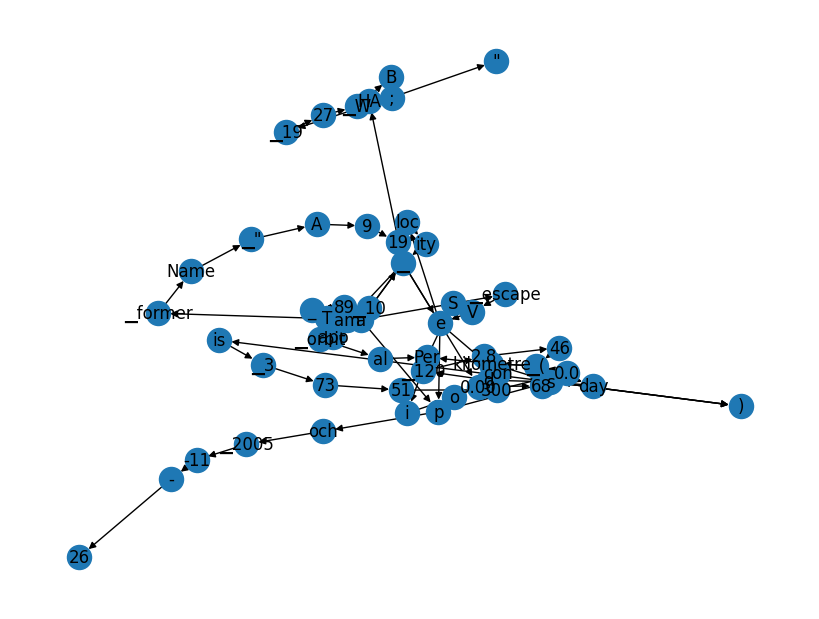

Decoded Input: 
 W kilometre 2005 46 orbit V o 19 p 19 " 26 51 9 HA ; day 73 al former T Name is Per ) A d apo 10 300 loc ity 0.00 och s S ( 120 B - 27 68 3 2.8 i -11 am e _ escape con 89 a " 0.0
Decoded Target: 
 The epoch of 1089 Tama(whose former name was ( A919 HA; 1927 WB) is 2005-11-26. The escape velocity of 1089 Tama is 0.0068 km/sec, has an orbital period of 1202.846 days and an apoapsis of 373513000.0 (kilometres).


In [ ]:
data_dict = dataset_dict[-70]
triples = data_dict['modified_triple_sets']['mtriple_set'][0]
target_text = data_dict['lex']['text'][0]

# the input encoding
entities_list = [[ent.strip() for ent in triple.split("|")] for triple in triples]
entities = list(set(np.array(entities_list).flatten()))
entities_dict = {}
subwords = []
for ent in entities:
  tokens = tokenizer.tokenize(ent, truncation=True, max_length=512, return_tensors='pt')
  entities_dict[ent] = tokens
  subwords.extend(tokens)
subwords_unique = list(set(subwords))
input_encoding = tokenizer.encode_plus(" ".join(subwords_unique), truncation=True, padding='max_length', max_length=512, return_tensors='pt')

# triples to graph - make edges nodes
node_to_idx = {}  # reset for each new graph
graph_nx = nx.MultiDiGraph()
for triple in triples:
    # triple = re.sub(r'\([^)]*\)', '', triple).split('|')  # remove brackets and split by '|'
    subject, relation, obj = (ent.strip() for ent in triple.split("|"))
    print(subject, relation, obj, str.strip, triple)
    # Add string node names to the graph
    for s in entities_dict[subject]:
      if s not in node_to_idx:
          node_to_idx[s] = len(node_to_idx)
    for r in entities_dict[relation]:
      if r not in node_to_idx:
          node_to_idx[r] = len(node_to_idx)
    for o in entities_dict[obj]:
      if o not in node_to_idx:
          node_to_idx[o] = len(node_to_idx)

    # style d
    for i in range(len(entities_dict[subject])-1):
      s1 = entities_dict[subject][i]
      s2 = entities_dict[subject][i+1]
      graph_nx.add_edge(s1, s2)
    graph_nx.add_edge(entities_dict[subject][len(entities_dict[subject])-1], entities_dict[relation][0])
    for i in range(len(entities_dict[relation])-1):
      r1 = entities_dict[relation][i]
      r2 = entities_dict[relation][i+1]
      graph_nx.add_edge(r1, r2)
    graph_nx.add_edge(entities_dict[relation][len(entities_dict[relation])-1], entities_dict[obj][0])
    for i in range(len(entities_dict[obj])-1):
      r1 = entities_dict[obj][i]
      r2 = entities_dict[obj][i+1]
      graph_nx.add_edge(r1, r2)

# get edge index
edge_index = torch.tensor([[node_to_idx[n] for n in edge[:2]] for edge in graph_nx.edges]).t().contiguous()

# encoding input and target texts
target_encoding = tokenizer.encode_plus(target_text, truncation=True, padding='max_length', max_length=512, return_tensors='pt')

graph_data = Data(x=input_encoding['input_ids'].squeeze(dim=0), edge_index=edge_index)
graph_data.attention_mask = input_encoding['attention_mask'].squeeze(dim=0)
graph_data.y = target_encoding['input_ids'].squeeze(dim=0)

print("NetworkX Graph: \n", graph_nx.edges) # Print the NetworkX graph
print("edge indices: \n", edge_index)
visualize_graph(graph_nx)
print("Decoded Input: \n", tokenizer.decode(graph_data.x, skip_special_tokens=True))
print("Decoded Target: \n", tokenizer.decode(graph_data.y, skip_special_tokens=True))


In [ ]:
def visualize_graph(graph_nx):
    plt.figure(figsize=(8, 6))
    pos = nx.spring_layout(graph_nx)  # positions for all nodes
    nx.draw(graph_nx, pos, with_labels=True)
    labels = nx.get_edge_attributes(graph_nx, 'key')
    nx.draw_networkx_edge_labels(graph_nx, pos, edge_labels=labels)
    plt.show()

In [ ]:
dataset_dict = load_dataset('web_nlg', 'webnlg_challenge_2017')['test']
dataset_dict = [sample for sample in dataset_dict if sample['lex']['text']] # filter out samples with empty targets
# dataset = WebNLGDataset(dataset_dict)
# Use the collate_fn in the DataLoader
# dataloader = DataLoader(dataset, batch_size=1, collate_fn=collate_fn)

Generating train split:   0%|          | 0/6940 [00:00<?, ? examples/s]

Generating dev split:   0%|          | 0/872 [00:00<?, ? examples/s]

Generating test split:   0%|          | 0/4615 [00:00<?, ? examples/s]

Dataset web_nlg downloaded and prepared to /root/.cache/huggingface/datasets/web_nlg/webnlg_challenge_2017/0.0.0/28ffb892f7f42450dd9558684aa43bcaf44b1b3bf0d77cb8d73534646af88dda. Subsequent calls will reuse this data.


  0%|          | 0/3 [00:00<?, ?it/s]

In [ ]:
tokenizer.tokenize("hello aoisht")

['▁hello', '▁', 'a', 'o', 'ish', 't']

In [ ]:
tokenizer.decode([1])

'</s>'

In [ ]:
tokenizer.encode("hello")

[21820, 1]

In [ ]:
tokenizer.decode([21820, 1])

'hello</s>'

In [ ]:
tokenizer.encode_plus("hello")

{'input_ids': [21820, 1], 'attention_mask': [1, 1]}

In [ ]:
def collate_fn(data_list):
    # Separate the fields
    x_list, edge_index_list, attention_mask_list, y_list = zip(*[(data.x, data.edge_index, data.attention_mask, data.y) for data in data_list])

    # Combine the sequence data with padding
    x = torch.nn.utils.rnn.pad_sequence(x_list, batch_first=True, padding_value=tokenizer.pad_token_id)
    attention_mask = torch.nn.utils.rnn.pad_sequence(attention_mask_list, batch_first=True, padding_value=0)
    y = torch.nn.utils.rnn.pad_sequence(y_list, batch_first=True, padding_value=tokenizer.pad_token_id)

    # Combine the graph data using PyG's built-in batch function
    batch = Batch.from_data_list(data_list)

    # Override the sequence data in the batch
    batch.x = x
    batch.attention_mask = attention_mask
    batch.y = y

    return batch

Original Sample: 
 translate graph to text: <H> Aaron_S._Daggett  <R>  award  <T>  Purple_Heart 
 Aaron S Daggett was awarded the Purple Heart.
NetworkX Graph: 
 [('Aaron_S._Daggett', 'award', 0), ('award', 'Purple_Heart', 0)]


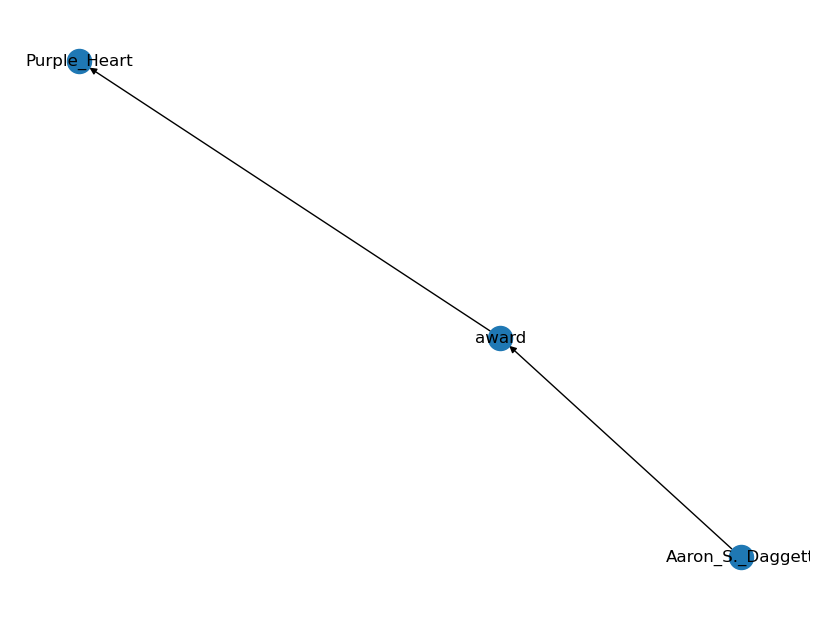

Decoded Input: 
 translate graph to text:  Aaron_S._Daggett  award  Purple_Heart
Decoded Target: 
 Aaron S Daggett was awarded the Purple Heart.
DataBatch(x=[1, 512], edge_index=[2, 2], attention_mask=[1, 512], y=[1, 512], batch=[512], ptr=[2])
Original Sample: 
 translate graph to text: <H> Aaron_S._Daggett  <R>  battle  <T>  Battle_of_Mine_Run 
 The Battle of Mine Run was one fought by Aaron S Daggett.
NetworkX Graph: 
 [('Aaron_S._Daggett', 'battle', 0), ('battle', 'Battle_of_Mine_Run', 0)]


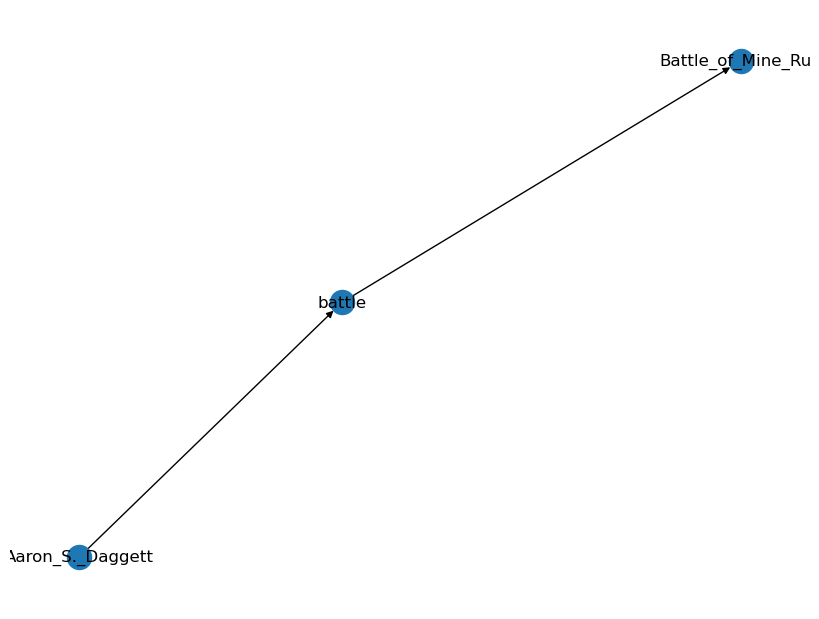

Decoded Input: 
 translate graph to text:  Aaron_S._Daggett  battle  Battle_of_Mine_Run
Decoded Target: 
 The Battle of Mine Run was one fought by Aaron S Daggett.
DataBatch(x=[1, 512], edge_index=[2, 2], attention_mask=[1, 512], y=[1, 512], batch=[512], ptr=[2])
Original Sample: 
 translate graph to text: <H> Ab_Klink  <R>  placeOfBirth  <T>  "Stellendam, Netherlands"@en 
 Stellendam, Netherlands is the birthplace of Ab Klink.
NetworkX Graph: 
 [('Ab_Klink', 'placeOfBirth', 0), ('placeOfBirth', '"Stellendam, Netherlands"@en', 0)]


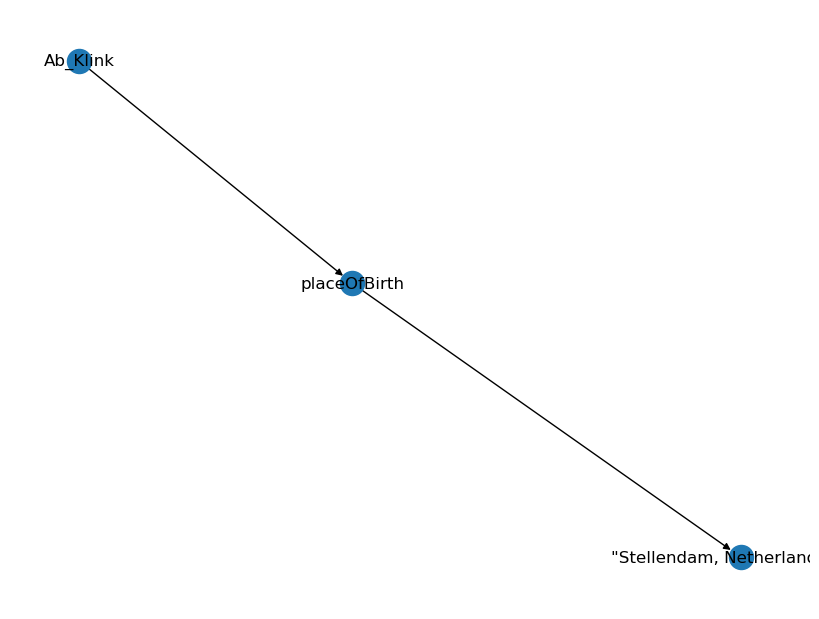

Decoded Input: 
 translate graph to text:  Ab_Klink  placeOfBirth  "Stellendam, Netherlands"@en
Decoded Target: 
 Stellendam, Netherlands is the birthplace of Ab Klink.
DataBatch(x=[1, 512], edge_index=[2, 2], attention_mask=[1, 512], y=[1, 512], batch=[512], ptr=[2])
Original Sample: 
 translate graph to text: <H> Abdul_Rahman_Ya'kub  <R>  governor  <T>  Tuanku_Bujang_Tuanku_Othman 
 Abdul Rahman Ya'kub was in office while Tuanku Bujang Tuanku Othman was Vice President.
NetworkX Graph: 
 [("Abdul_Rahman_Ya'kub", 'governor', 0), ('governor', 'Tuanku_Bujang_Tuanku_Othman', 0)]


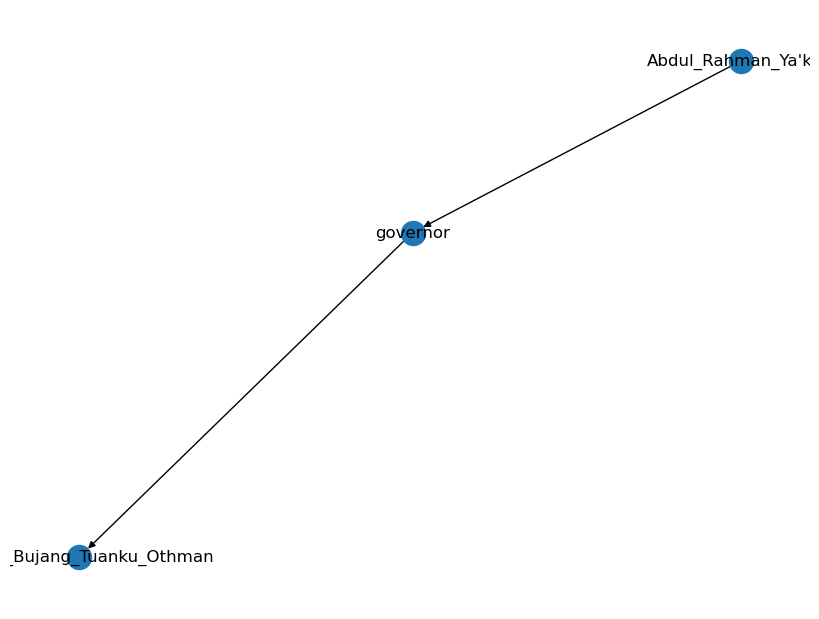

Decoded Input: 
 translate graph to text:  Abdul_Rahman_Ya'kub  governor  Tuanku_Bujang_Tuanku_Othman
Decoded Target: 
 Abdul Rahman Ya'kub was in office while Tuanku Bujang Tuanku Othman was Vice President.
DataBatch(x=[1, 512], edge_index=[2, 2], attention_mask=[1, 512], y=[1, 512], batch=[512], ptr=[2])
Original Sample: 
 translate graph to text: <H> Abdul_Taib_Mahmud  <R>  party  <T>  "Parti Bumiputera Sarawak"@en 
 Abdul Taib Mahmud belongs to the party of Parti Bumiputera Sarawak.
NetworkX Graph: 
 [('Abdul_Taib_Mahmud', 'party', 0), ('party', '"Parti Bumiputera Sarawak"@en', 0)]


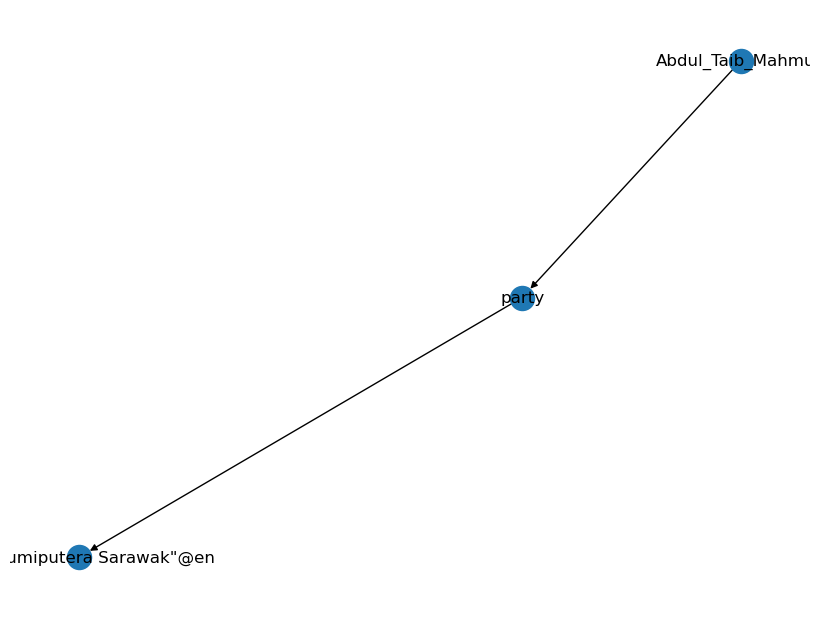

Decoded Input: 
 translate graph to text:  Abdul_Taib_Mahmud  party  "Parti Bumiputera Sarawak"@en
Decoded Target: 
 Abdul Taib Mahmud belongs to the party of Parti Bumiputera Sarawak.
DataBatch(x=[1, 512], edge_index=[2, 2], attention_mask=[1, 512], y=[1, 512], batch=[512], ptr=[2])
Original Sample: 
 translate graph to text: <H> Abdul_Taib_Mahmud  <R>  successor  <T>  Sulaiman_Abdul_Rahman_Taib 
 Abdul Taib Mahmud's successor was Sulaiman Abdul Rahman Taib.
NetworkX Graph: 
 [('Abdul_Taib_Mahmud', 'successor', 0), ('successor', 'Sulaiman_Abdul_Rahman_Taib', 0)]


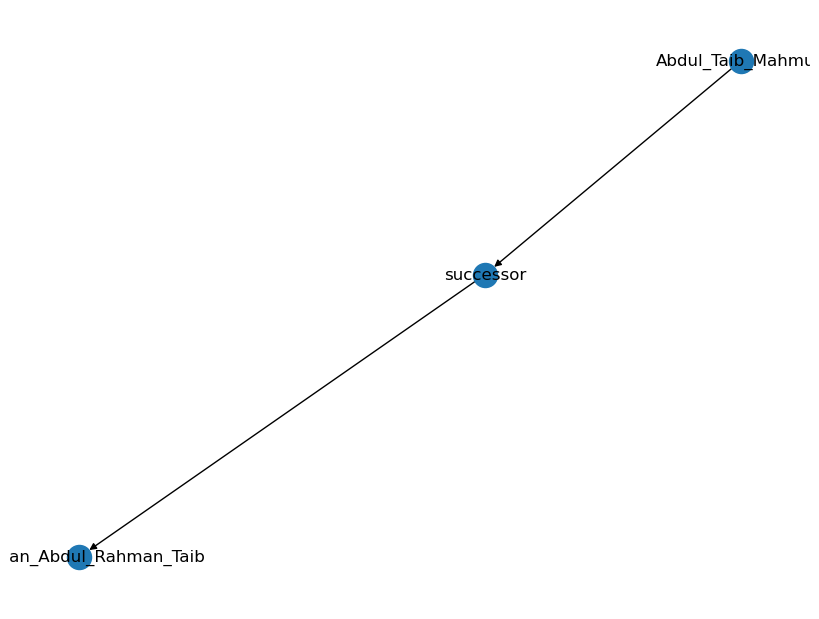

Decoded Input: 
 translate graph to text:  Abdul_Taib_Mahmud  successor  Sulaiman_Abdul_Rahman_Taib
Decoded Target: 
 Abdul Taib Mahmud's successor was Sulaiman Abdul Rahman Taib.
DataBatch(x=[1, 512], edge_index=[2, 2], attention_mask=[1, 512], y=[1, 512], batch=[512], ptr=[2])
Original Sample: 
 translate graph to text: <H> Abdulsalami_Abubakar  <R>  activeYearsEndDate  <T>  "1999-05-29"^^xsd:date 
 Abdulsalami Abubakar ended his career on 1999-05-29.
NetworkX Graph: 
 [('Abdulsalami_Abubakar', 'activeYearsEndDate', 0), ('activeYearsEndDate', '"1999-05-29"^^xsd:date', 0)]


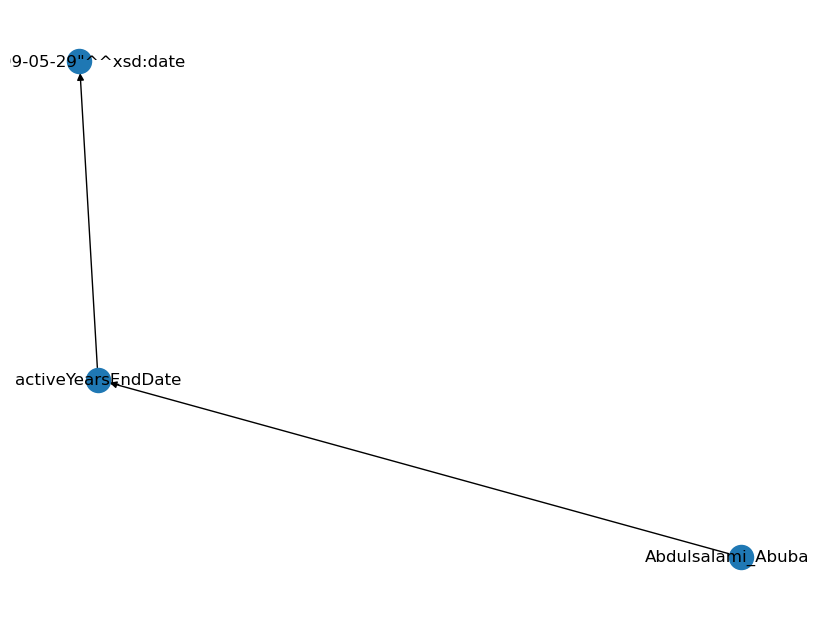

Decoded Input: 
 translate graph to text:  Abdulsalami_Abubakar  activeYearsEndDate  "1999-05-29"xsd:date
Decoded Target: 
 Abdulsalami Abubakar ended his career on 1999-05-29.
DataBatch(x=[1, 512], edge_index=[2, 2], attention_mask=[1, 512], y=[1, 512], batch=[512], ptr=[2])
Original Sample: 
 translate graph to text: <H> Abdulsalami_Abubakar  <R>  birthPlace  <T>  Minna 
 Abdulsalami Abubakar was born in Minna.
NetworkX Graph: 
 [('Abdulsalami_Abubakar', 'birthPlace', 0), ('birthPlace', 'Minna', 0)]


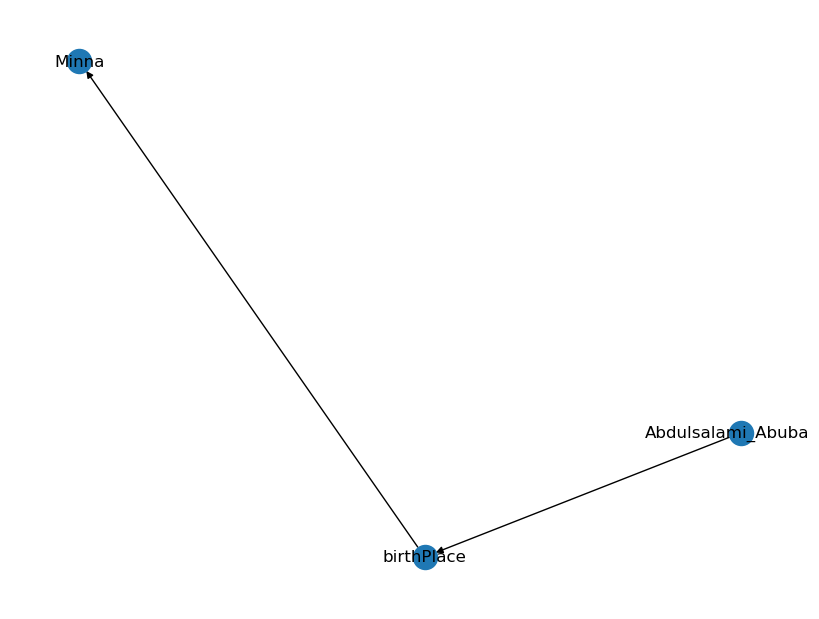

Decoded Input: 
 translate graph to text:  Abdulsalami_Abubakar  birthPlace  Minna
Decoded Target: 
 Abdulsalami Abubakar was born in Minna.
DataBatch(x=[1, 512], edge_index=[2, 2], attention_mask=[1, 512], y=[1, 512], batch=[512], ptr=[2])
Original Sample: 
 translate graph to text: <H> Abdulsalami_Abubakar  <R>  birthPlace  <T>  Niger_State 
 Abdulsalami Abubakar's birthplace was Niger State.
NetworkX Graph: 
 [('Abdulsalami_Abubakar', 'birthPlace', 0), ('birthPlace', 'Niger_State', 0)]


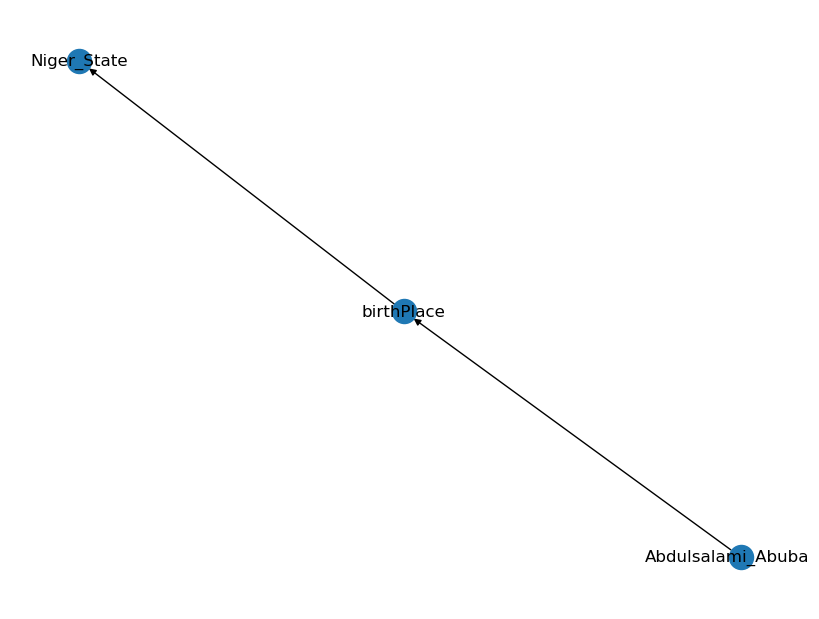

Decoded Input: 
 translate graph to text:  Abdulsalami_Abubakar  birthPlace  Niger_State
Decoded Target: 
 Abdulsalami Abubakar's birthplace was Niger State.
DataBatch(x=[1, 512], edge_index=[2, 2], attention_mask=[1, 512], y=[1, 512], batch=[512], ptr=[2])
Original Sample: 
 translate graph to text: <H> Abner_W._Sibal  <R>  activeYearsEndDate  <T>  "1965-01-03"^^xsd:date 
 Abner W. Sibal ended his military career January 3, 1965.
NetworkX Graph: 
 [('Abner_W._Sibal', 'activeYearsEndDate', 0), ('activeYearsEndDate', '"1965-01-03"^^xsd:date', 0)]


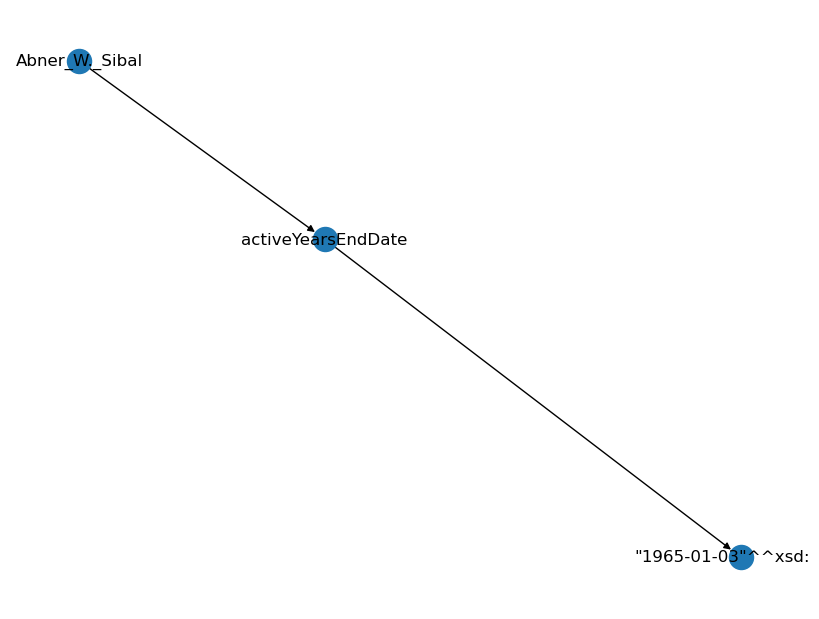

Decoded Input: 
 translate graph to text:  Abner_W._Sibal  activeYearsEndDate  "1965-01-03"xsd:date
Decoded Target: 
 Abner W. Sibal ended his military career January 3, 1965.
DataBatch(x=[1, 512], edge_index=[2, 2], attention_mask=[1, 512], y=[1, 512], batch=[512], ptr=[2])
Original Sample: 
 translate graph to text: <H> Abner_W._Sibal  <R>  deathPlace  <T>  Alexandria,_Virginia 
 Abner W Sibal died in Alexandria, Virginia.
NetworkX Graph: 
 [('Abner_W._Sibal', 'deathPlace', 0), ('deathPlace', 'Alexandria,_Virginia', 0)]


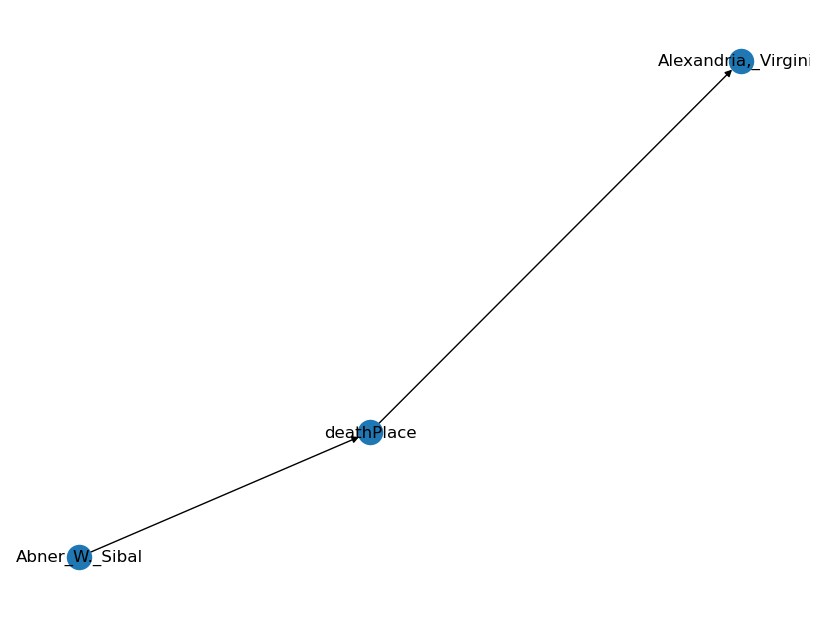

Decoded Input: 
 translate graph to text:  Abner_W._Sibal  deathPlace  Alexandria,_Virginia
Decoded Target: 
 Abner W Sibal died in Alexandria, Virginia.
DataBatch(x=[1, 512], edge_index=[2, 2], attention_mask=[1, 512], y=[1, 512], batch=[512], ptr=[2])
Original Sample: 
 translate graph to text: <H> Adam_Holloway  <R>  birthPlace  <T>  Kent 
 Adam Holloway was born in Kent.
NetworkX Graph: 
 [('Adam_Holloway', 'birthPlace', 0), ('birthPlace', 'Kent', 0)]


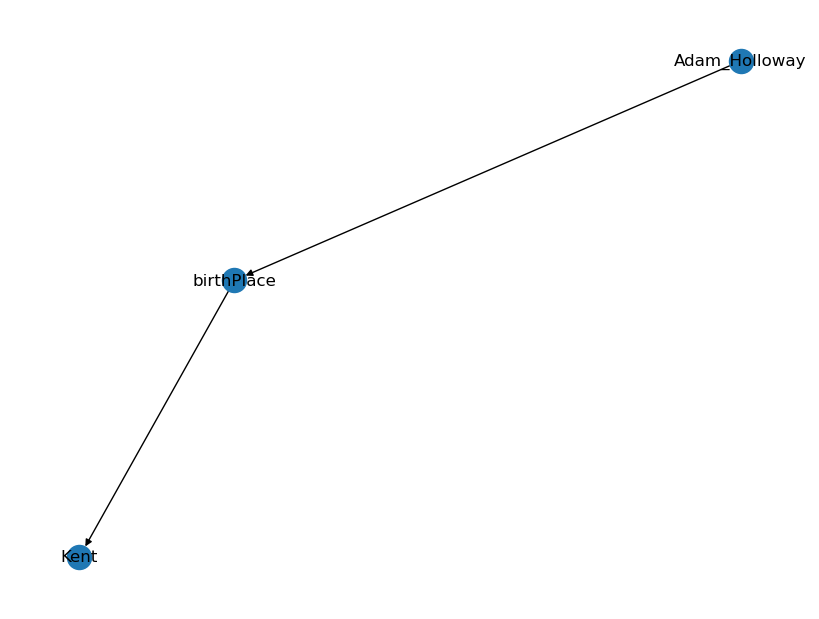

Decoded Input: 
 translate graph to text:  Adam_Holloway  birthPlace  Kent
Decoded Target: 
 Adam Holloway was born in Kent.
DataBatch(x=[1, 512], edge_index=[2, 2], attention_mask=[1, 512], y=[1, 512], batch=[512], ptr=[2])
Original Sample: 
 translate graph to text: <H> Adam_Holloway  <R>  residence  <T>  Gravesend 
 Adam Holloway's residence is Gravesend.
NetworkX Graph: 
 [('Adam_Holloway', 'residence', 0), ('residence', 'Gravesend', 0)]


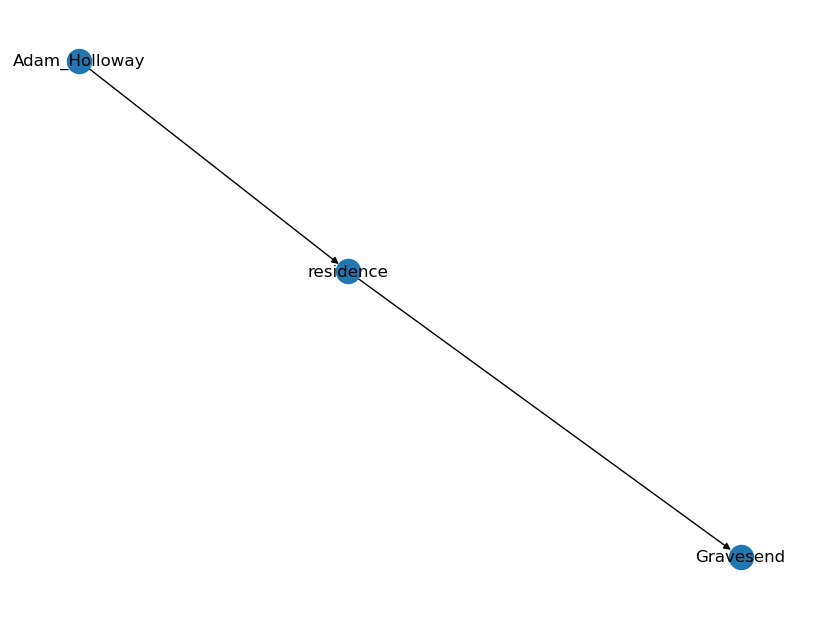

Decoded Input: 
 translate graph to text:  Adam_Holloway  residence  Gravesend
Decoded Target: 
 Adam Holloway's residence is Gravesend.
DataBatch(x=[1, 512], edge_index=[2, 2], attention_mask=[1, 512], y=[1, 512], batch=[512], ptr=[2])
Original Sample: 
 translate graph to text: <H> Adenan_Satem  <R>  almaMater  <T>  University_of_Adelaide 
 The alma mater of Adenan Satem is the University of Adelaide.
NetworkX Graph: 
 [('Adenan_Satem', 'almaMater', 0), ('almaMater', 'University_of_Adelaide', 0)]


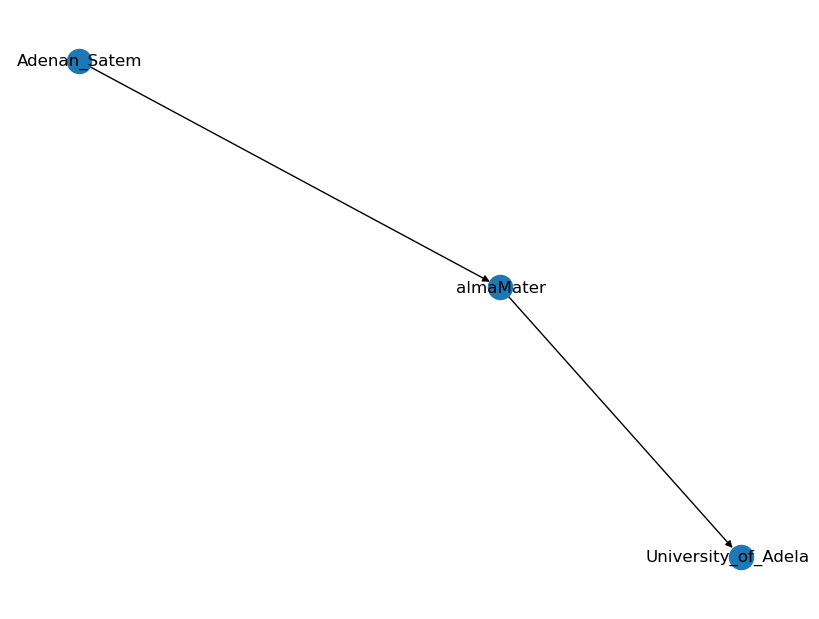

Decoded Input: 
 translate graph to text:  Adenan_Satem  almaMater  University_of_Adelaide
Decoded Target: 
 The alma mater of Adenan Satem is the University of Adelaide.
DataBatch(x=[1, 512], edge_index=[2, 2], attention_mask=[1, 512], y=[1, 512], batch=[512], ptr=[2])
Original Sample: 
 translate graph to text: <H> Adolf_Schärf  <R>  birthPlace  <T>  Mikulov 
 Adolf Schärf's place of birth was Mikulov.
NetworkX Graph: 
 [('Adolf_Schärf', 'birthPlace', 0), ('birthPlace', 'Mikulov', 0)]


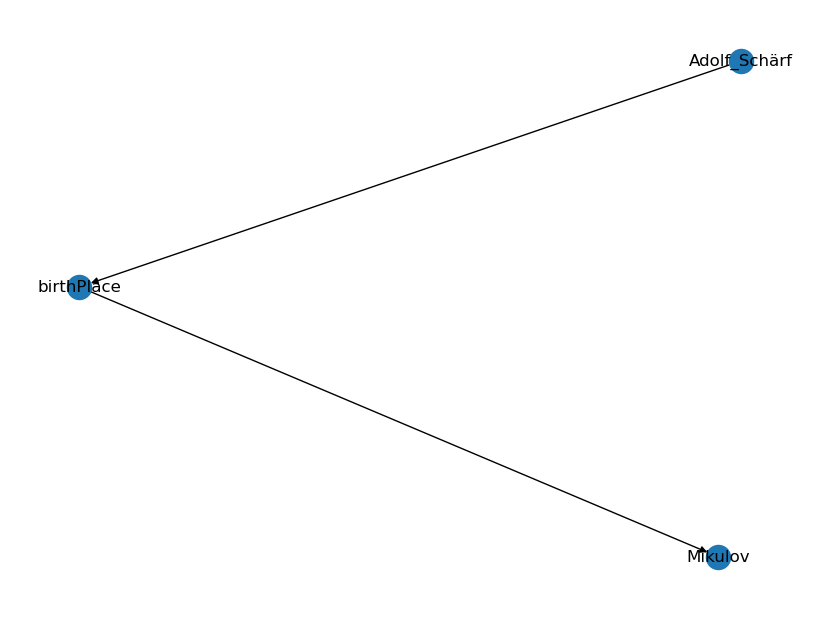

Decoded Input: 
 translate graph to text:  Adolf_Schärf  birthPlace  Mikulov
Decoded Target: 
 Adolf Schärf's place of birth was Mikulov.
DataBatch(x=[1, 512], edge_index=[2, 2], attention_mask=[1, 512], y=[1, 512], batch=[512], ptr=[2])
Original Sample: 
 translate graph to text: <H> Adonis_Georgiadis  <R>  primeminister  <T>  Antonis_Samaras 
 Adonis Georgiadis was in office while Antonis Samaras was Prime Minister.
NetworkX Graph: 
 [('Adonis_Georgiadis', 'primeminister', 0), ('primeminister', 'Antonis_Samaras', 0)]


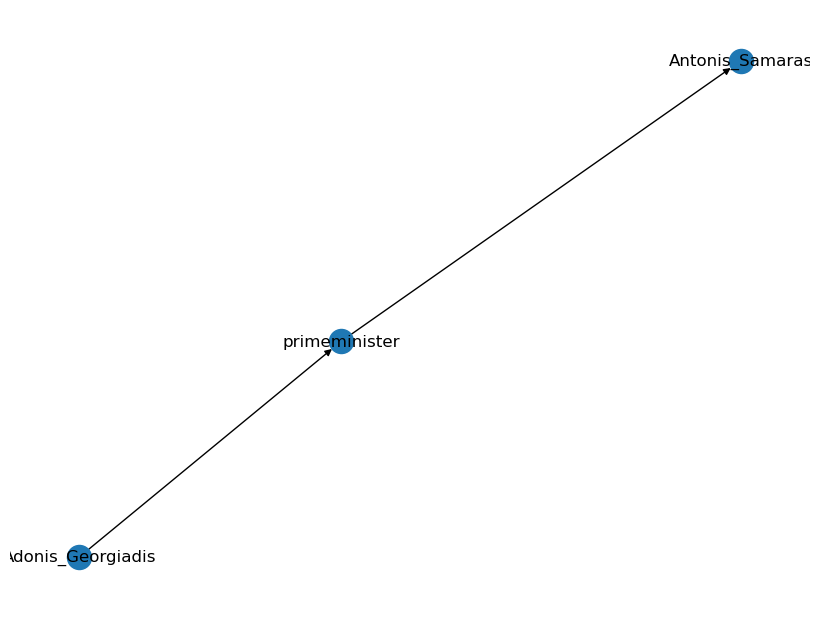

Decoded Input: 
 translate graph to text:  Adonis_Georgiadis  primeminister  Antonis_Samaras
Decoded Target: 
 Adonis Georgiadis was in office while Antonis Samaras was Prime Minister.
DataBatch(x=[1, 512], edge_index=[2, 2], attention_mask=[1, 512], y=[1, 512], batch=[512], ptr=[2])
Original Sample: 
 translate graph to text: <H> Adonis_Georgiadis  <R>  office  <T>  "Deputy Minister for Development, Competitiveness and Shipping" 
 Adonis Georgiadis worked as Deputy Minister for Development, Competitiveness and Shipping.
NetworkX Graph: 
 [('Adonis_Georgiadis', 'office', 0), ('office', '"Deputy Minister for Development, Competitiveness and Shipping"', 0)]


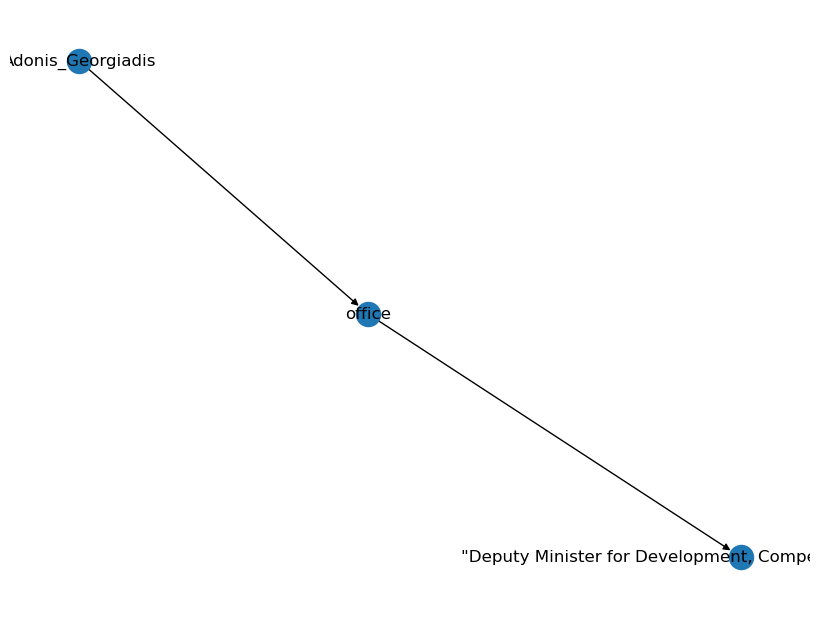

Decoded Input: 
 translate graph to text:  Adonis_Georgiadis  office  "Deputy Minister for Development, Competitiveness and Shipping"
Decoded Target: 
 Adonis Georgiadis worked as Deputy Minister for Development, Competitiveness and Shipping.
DataBatch(x=[1, 512], edge_index=[2, 2], attention_mask=[1, 512], y=[1, 512], batch=[512], ptr=[2])
Original Sample: 
 translate graph to text: <H> Agnes_Kant  <R>  birthPlace  <T>  Hessisch_Oldendorf 
 Agnes Kant was born in Hessisch Oldendorf.
NetworkX Graph: 
 [('Agnes_Kant', 'birthPlace', 0), ('birthPlace', 'Hessisch_Oldendorf', 0)]


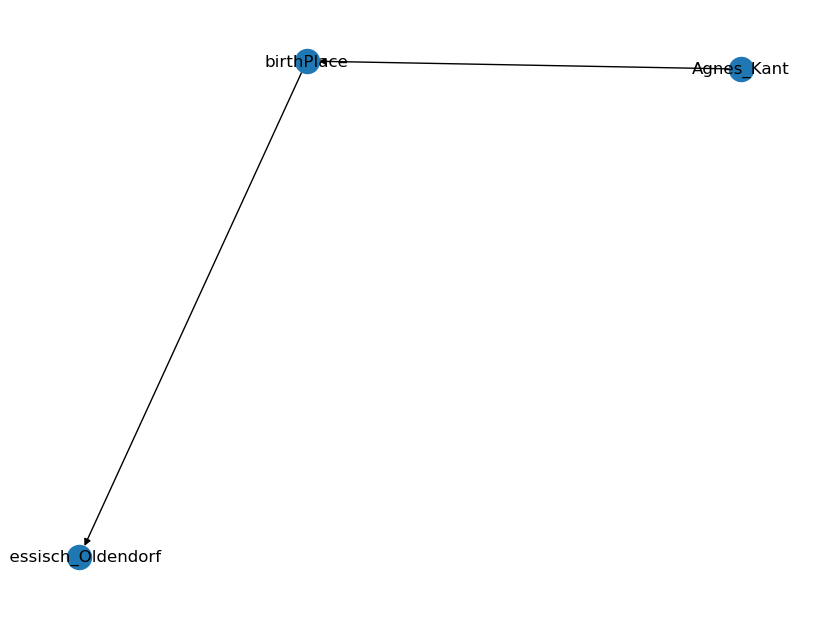

Decoded Input: 
 translate graph to text:  Agnes_Kant  birthPlace  Hessisch_Oldendorf
Decoded Target: 
 Agnes Kant was born in Hessisch Oldendorf.
DataBatch(x=[1, 512], edge_index=[2, 2], attention_mask=[1, 512], y=[1, 512], batch=[512], ptr=[2])
Original Sample: 
 translate graph to text: <H> Agnes_Ward_White  <R>  placeOfBirth  <T>  Marietta,_Ohio 
 Marietta, Ohio was the birthplace of Agnes Ward White.
NetworkX Graph: 
 [('Agnes_Ward_White', 'placeOfBirth', 0), ('placeOfBirth', 'Marietta,_Ohio', 0)]


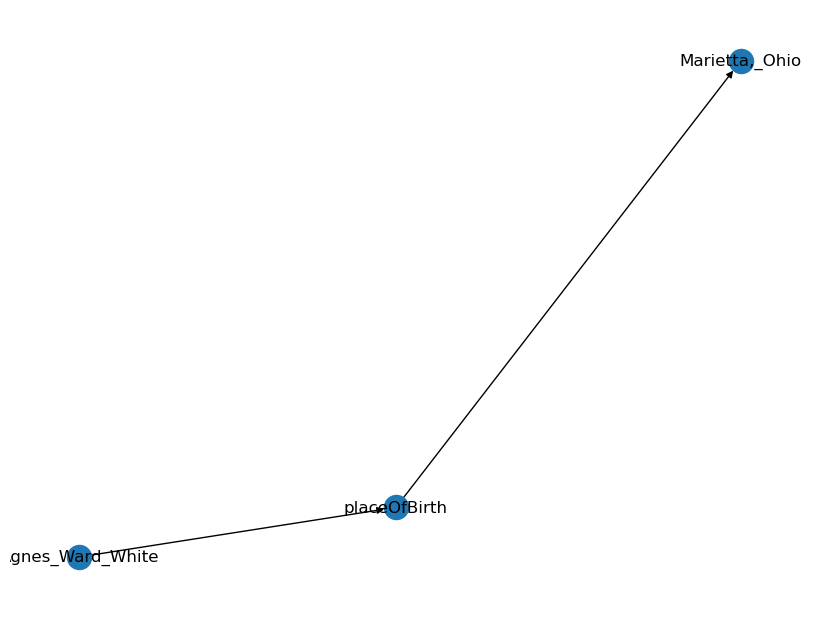

Decoded Input: 
 translate graph to text:  Agnes_Ward_White  placeOfBirth  Marietta,_Ohio
Decoded Target: 
 Marietta, Ohio was the birthplace of Agnes Ward White.
DataBatch(x=[1, 512], edge_index=[2, 2], attention_mask=[1, 512], y=[1, 512], batch=[512], ptr=[2])
Original Sample: 
 translate graph to text: <H> Airey_Neave  <R>  activeYearsStartDate  <T>  "1953-06-30"^^xsd:date 
 Airey Neave started his career on 30th June 1953.
NetworkX Graph: 
 [('Airey_Neave', 'activeYearsStartDate', 0), ('activeYearsStartDate', '"1953-06-30"^^xsd:date', 0)]


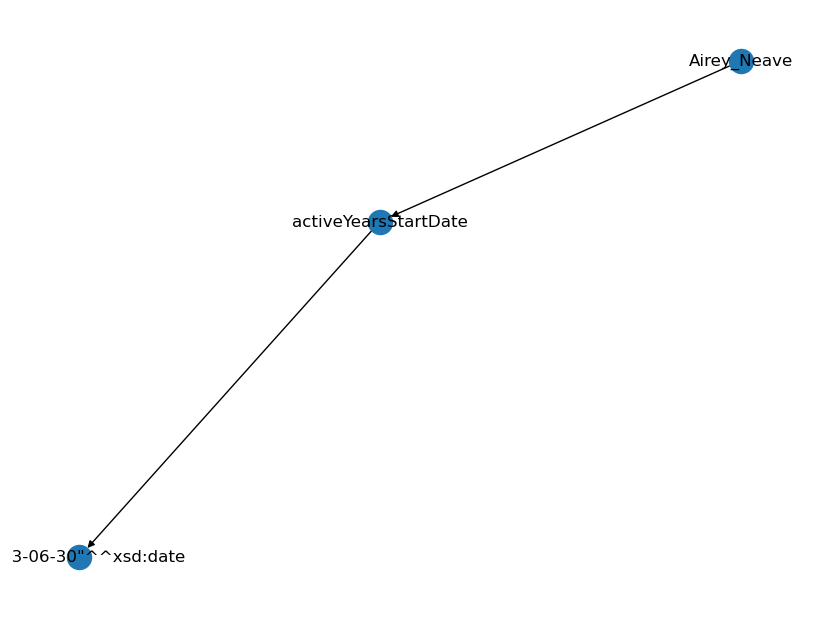

Decoded Input: 
 translate graph to text:  Airey_Neave  activeYearsStartDate  "1953-06-30"xsd:date
Decoded Target: 
 Airey Neave started his career on 30th June 1953.
DataBatch(x=[1, 512], edge_index=[2, 2], attention_mask=[1, 512], y=[1, 512], batch=[512], ptr=[2])
Original Sample: 
 translate graph to text: <H> Airey_Neave  <R>  award  <T>  Military_Cross 
 Airey Neave was awarded the Military Cross.
NetworkX Graph: 
 [('Airey_Neave', 'award', 0), ('award', 'Military_Cross', 0)]


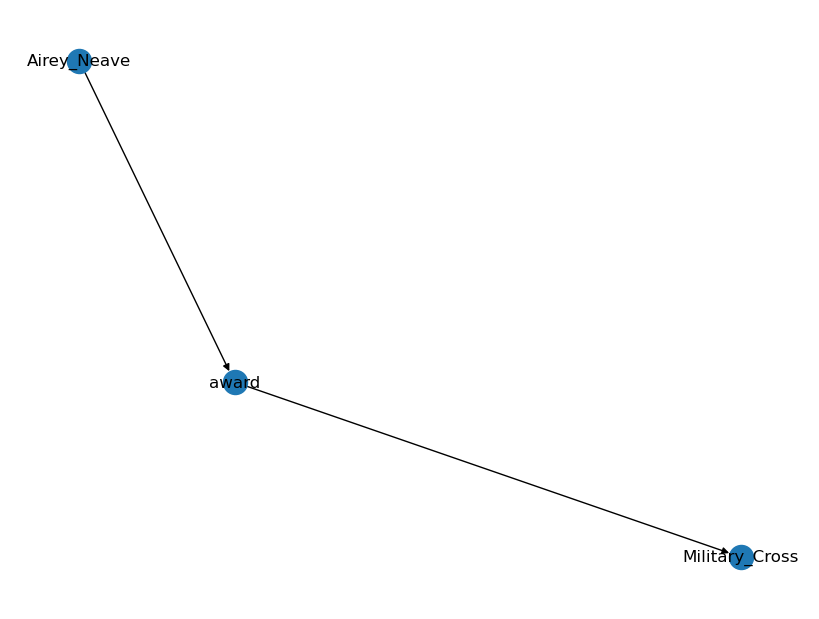

Decoded Input: 
 translate graph to text:  Airey_Neave  award  Military_Cross
Decoded Target: 
 Airey Neave was awarded the Military Cross.
DataBatch(x=[1, 512], edge_index=[2, 2], attention_mask=[1, 512], y=[1, 512], batch=[512], ptr=[2])
Original Sample: 
 translate graph to text: <H> Airey_Neave  <R>  birthPlace  <T>  "Knightsbridge, London"@en 
 Knightsbridge, London is the birthplace of Airey Neave.
NetworkX Graph: 
 [('Airey_Neave', 'birthPlace', 0), ('birthPlace', '"Knightsbridge, London"@en', 0)]


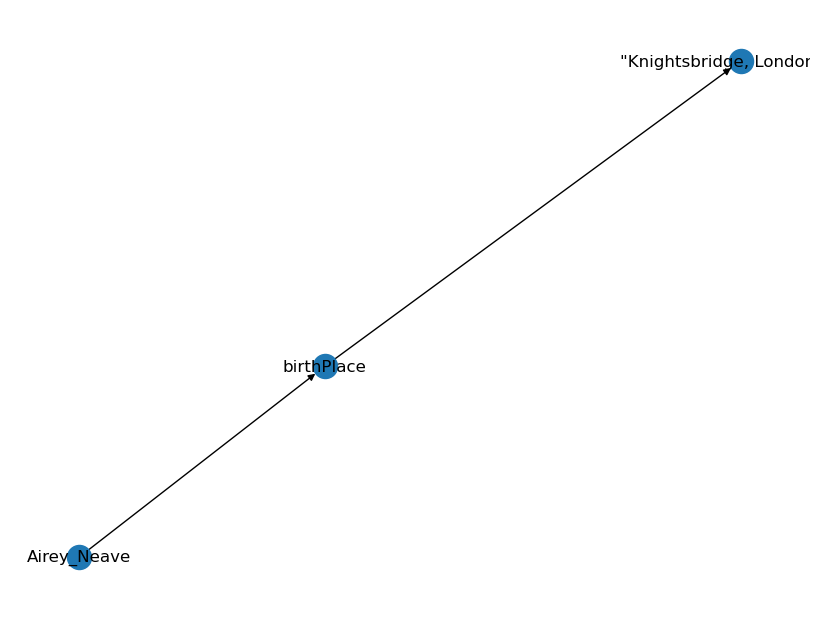

Decoded Input: 
 translate graph to text:  Airey_Neave  birthPlace  "Knightsbridge, London"@en
Decoded Target: 
 Knightsbridge, London is the birthplace of Airey Neave.
DataBatch(x=[1, 512], edge_index=[2, 2], attention_mask=[1, 512], y=[1, 512], batch=[512], ptr=[2])
Original Sample: 
 translate graph to text: <H> Airey_Neave  <R>  rank  <T>  Lieutenant_colonel 
 Airey Neave's military rank is Lieutenant Colonel.
NetworkX Graph: 
 [('Airey_Neave', 'rank', 0), ('rank', 'Lieutenant_colonel', 0)]


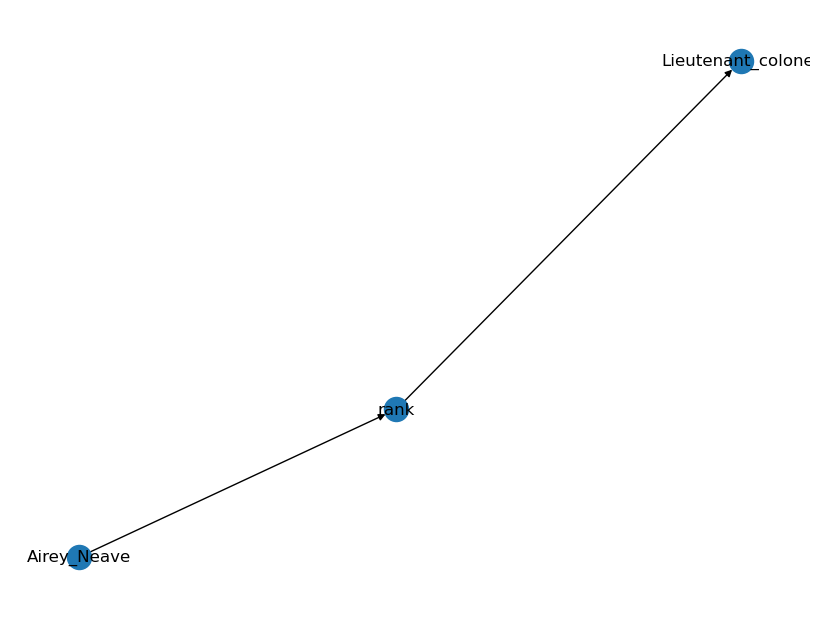

Decoded Input: 
 translate graph to text:  Airey_Neave  rank  Lieutenant_colonel
Decoded Target: 
 Airey Neave's military rank is Lieutenant Colonel.
DataBatch(x=[1, 512], edge_index=[2, 2], attention_mask=[1, 512], y=[1, 512], batch=[512], ptr=[2])
Original Sample: 
 translate graph to text: <H> Airey_Neave  <R>  serviceStartYear  <T>  "1935"^^xsd:gYear 
 Airey Neave began his military career in 1935.
NetworkX Graph: 
 [('Airey_Neave', 'serviceStartYear', 0), ('serviceStartYear', '"1935"^^xsd:gYear', 0)]


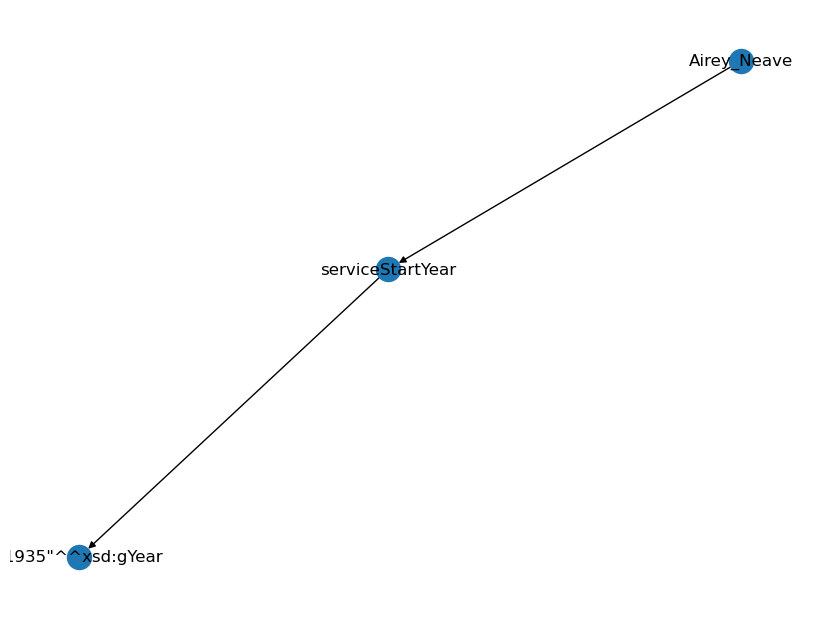

Decoded Input: 
 translate graph to text:  Airey_Neave  serviceStartYear  "1935"xsd:gYear
Decoded Target: 
 Airey Neave began his military career in 1935.
DataBatch(x=[1, 512], edge_index=[2, 2], attention_mask=[1, 512], y=[1, 512], batch=[512], ptr=[2])
Original Sample: 
 translate graph to text: <H> Albert_B._White  <R>  party  <T>  Republican_Party_(United_States) 
 Albert B.White is a member of the Republican Party of the United States.
NetworkX Graph: 
 [('Albert_B._White', 'party', 0), ('party', 'Republican_Party_', 0)]


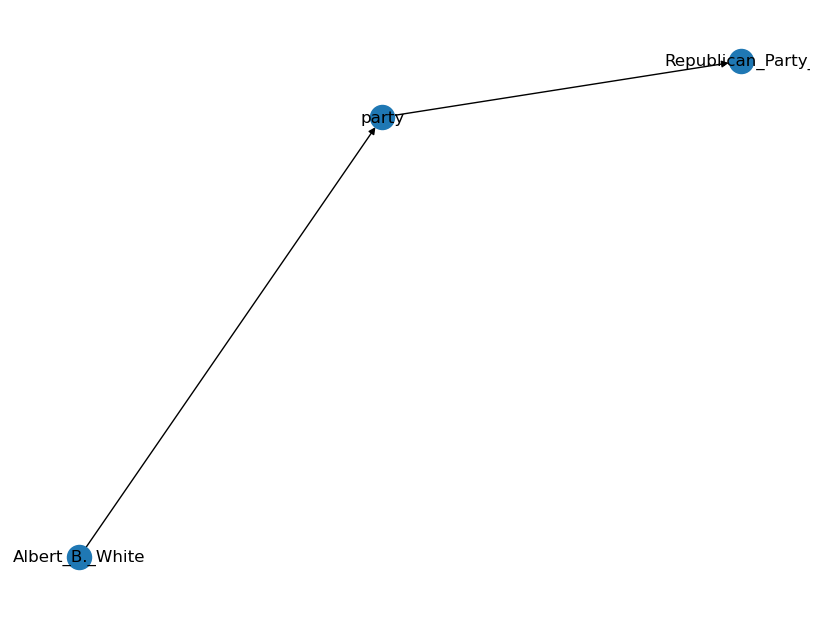

Decoded Input: 
 translate graph to text:  Albert_B._White  party  Republican_Party_(United_States)
Decoded Target: 
 Albert B.White is a member of the Republican Party of the United States.
DataBatch(x=[1, 512], edge_index=[2, 2], attention_mask=[1, 512], y=[1, 512], batch=[512], ptr=[2])
Original Sample: 
 translate graph to text: <H> Albert_B._White  <R>  spouse  <T>  Agnes_Ward_White 
 The spouse of Albert B. White was Agnes Ward White.
NetworkX Graph: 
 [('Albert_B._White', 'spouse', 0), ('spouse', 'Agnes_Ward_White', 0)]


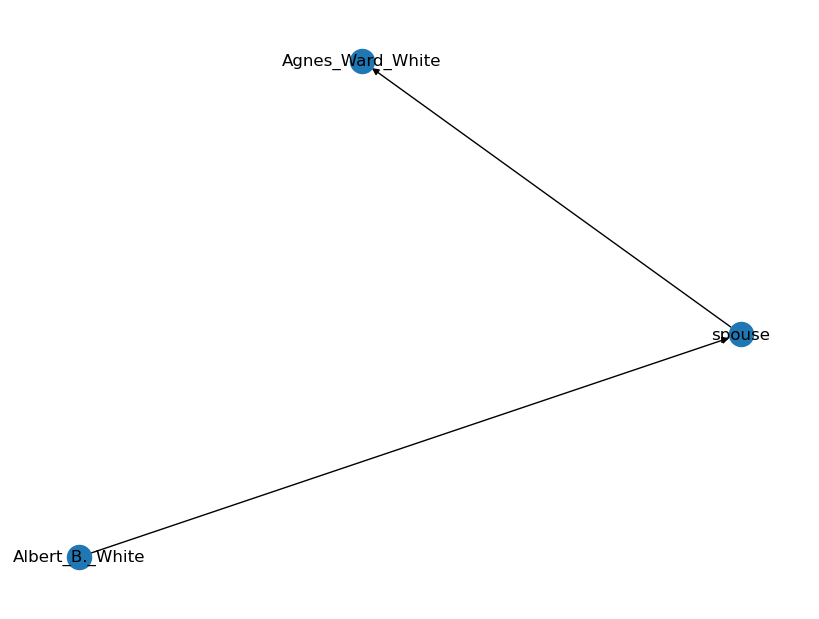

Decoded Input: 
 translate graph to text:  Albert_B._White  spouse  Agnes_Ward_White
Decoded Target: 
 The spouse of Albert B. White was Agnes Ward White.
DataBatch(x=[1, 512], edge_index=[2, 2], attention_mask=[1, 512], y=[1, 512], batch=[512], ptr=[2])
Original Sample: 
 translate graph to text: <H> Albert_Jennings_Fountain  <R>  militaryBranch  <T>  Union_Army 
 Albert Jennings Fountain served in the Union Army.
NetworkX Graph: 
 [('Albert_Jennings_Fountain', 'militaryBranch', 0), ('militaryBranch', 'Union_Army', 0)]


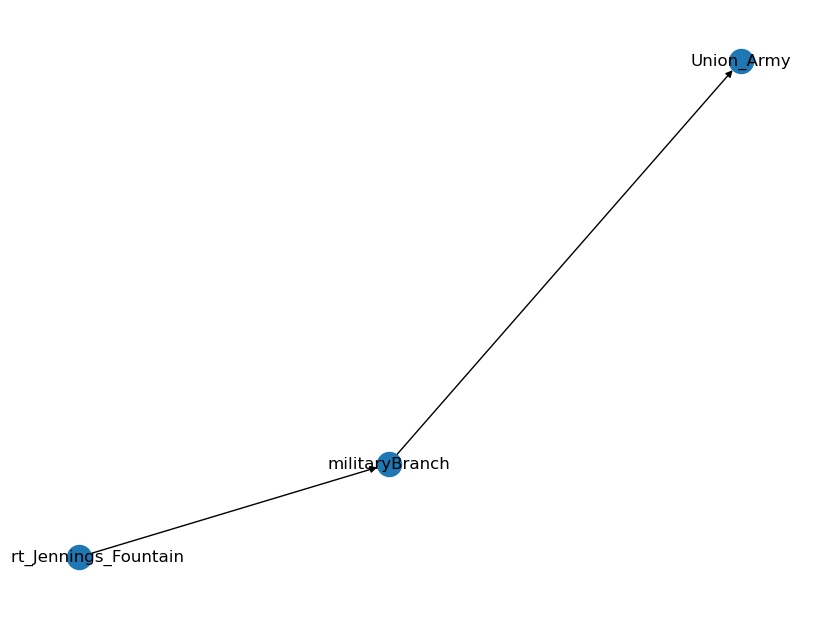

Decoded Input: 
 translate graph to text:  Albert_Jennings_Fountain  militaryBranch  Union_Army
Decoded Target: 
 Albert Jennings Fountain served in the Union Army.
DataBatch(x=[1, 512], edge_index=[2, 2], attention_mask=[1, 512], y=[1, 512], batch=[512], ptr=[2])
Original Sample: 
 translate graph to text: <H> Alberto_Teisaire  <R>  nationality  <T>  Argentina 
 Alberto Teisaire's nationality is Argentinian.
NetworkX Graph: 
 [('Alberto_Teisaire', 'nationality', 0), ('nationality', 'Argentina', 0)]


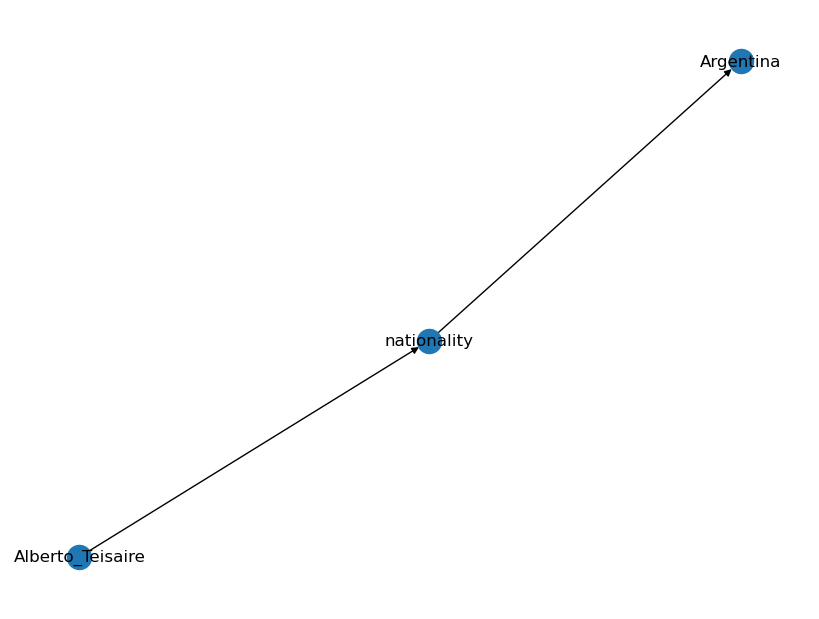

Decoded Input: 
 translate graph to text:  Alberto_Teisaire  nationality  Argentina
Decoded Target: 
 Alberto Teisaire's nationality is Argentinian.
DataBatch(x=[1, 512], edge_index=[2, 2], attention_mask=[1, 512], y=[1, 512], batch=[512], ptr=[2])
Original Sample: 
 translate graph to text: <H> Alberto_Teisaire  <R>  profession  <T>  "Rear Admiral in the Argentine Navy"@en 
 Alberto Teisaire was a Rear Admiral in the Argentine Navy.
NetworkX Graph: 
 [('Alberto_Teisaire', 'profession', 0), ('profession', '"Rear Admiral in the Argentine Navy"@en', 0)]


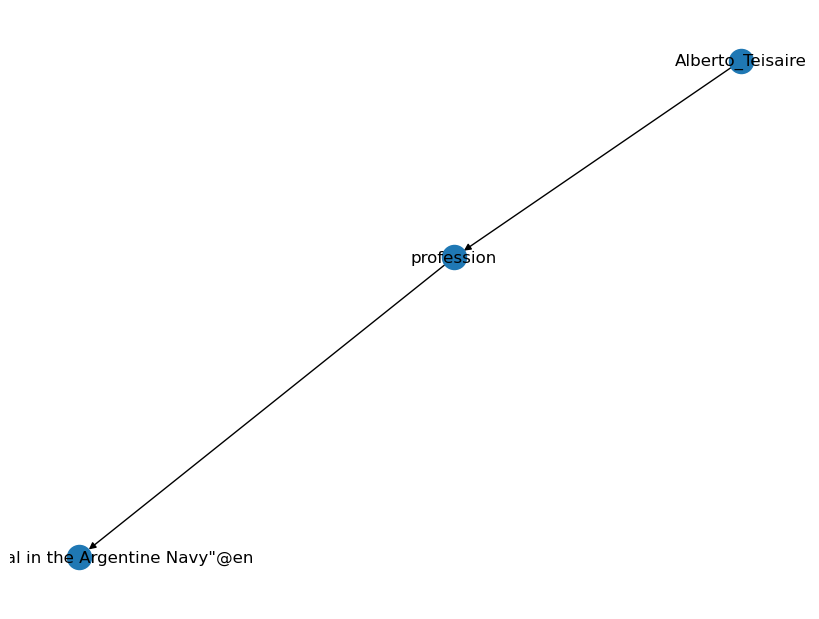

Decoded Input: 
 translate graph to text:  Alberto_Teisaire  profession  "Rear Admiral in the Argentine Navy"@en
Decoded Target: 
 Alberto Teisaire was a Rear Admiral in the Argentine Navy.
DataBatch(x=[1, 512], edge_index=[2, 2], attention_mask=[1, 512], y=[1, 512], batch=[512], ptr=[2])
Original Sample: 
 translate graph to text: <H> Alfons_Gorbach  <R>  placeOfDeath  <T>  Austria 
 Alfons Gorbach's place of death was in Austria.
NetworkX Graph: 
 [('Alfons_Gorbach', 'placeOfDeath', 0), ('placeOfDeath', 'Austria', 0)]


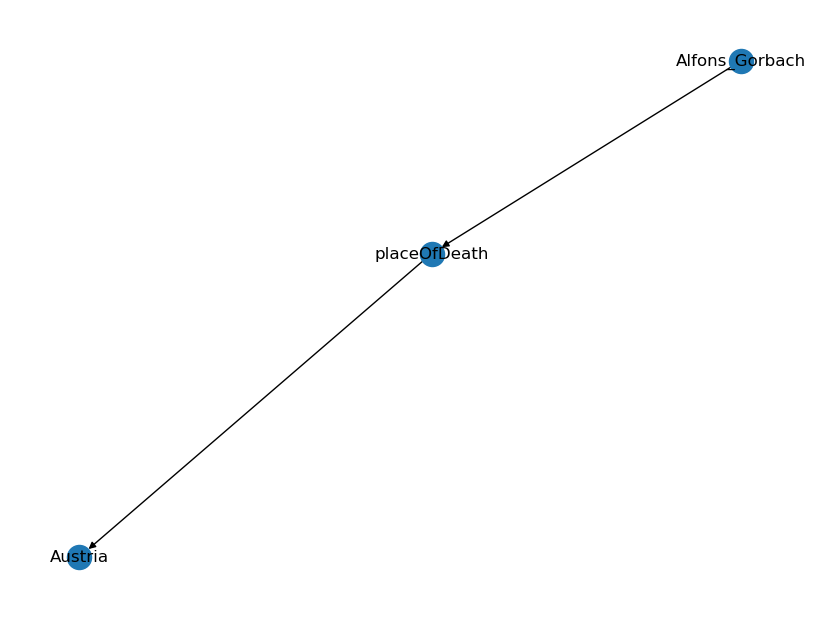

Decoded Input: 
 translate graph to text:  Alfons_Gorbach  placeOfDeath  Austria
Decoded Target: 
 Alfons Gorbach's place of death was in Austria.
DataBatch(x=[1, 512], edge_index=[2, 2], attention_mask=[1, 512], y=[1, 512], batch=[512], ptr=[2])
Original Sample: 
 translate graph to text: <H> Alfred_Moore_Scales  <R>  activeYearsStartDate  <T>  "1875-03-04"^^xsd:date 
 Alfred Moore Scales started his career on 1875-03-04.
NetworkX Graph: 
 [('Alfred_Moore_Scales', 'activeYearsStartDate', 0), ('activeYearsStartDate', '"1875-03-04"^^xsd:date', 0)]


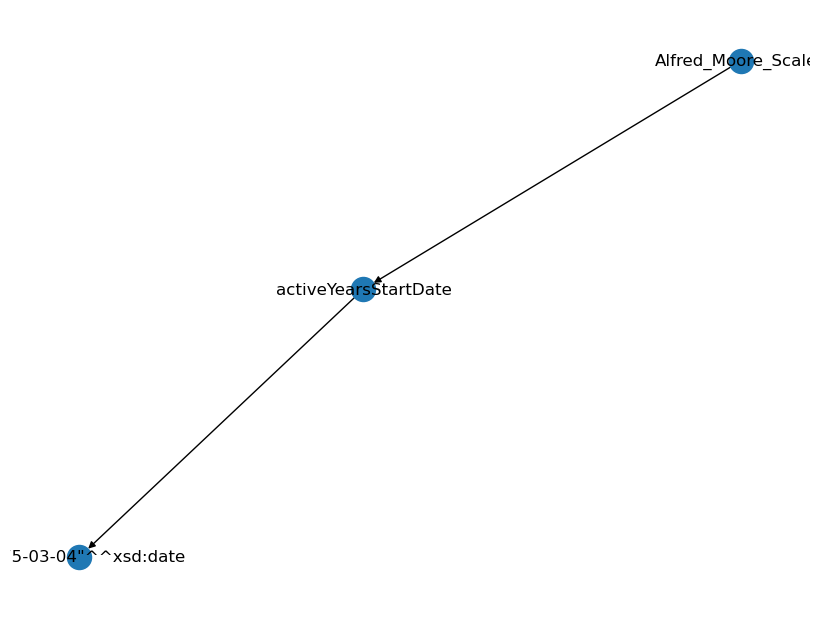

Decoded Input: 
 translate graph to text:  Alfred_Moore_Scales  activeYearsStartDate  "1875-03-04"xsd:date
Decoded Target: 
 Alfred Moore Scales started his career on 1875-03-04.
DataBatch(x=[1, 512], edge_index=[2, 2], attention_mask=[1, 512], y=[1, 512], batch=[512], ptr=[2])
Original Sample: 
 translate graph to text: <H> Alfred_Moore_Scales  <R>  battles  <T>  Battle_of_Chancellorsville 
 Alfred Moore Scales took part in the Battle of Chancellorsville.
NetworkX Graph: 
 [('Alfred_Moore_Scales', 'battles', 0), ('battles', 'Battle_of_Chancellorsville', 0)]


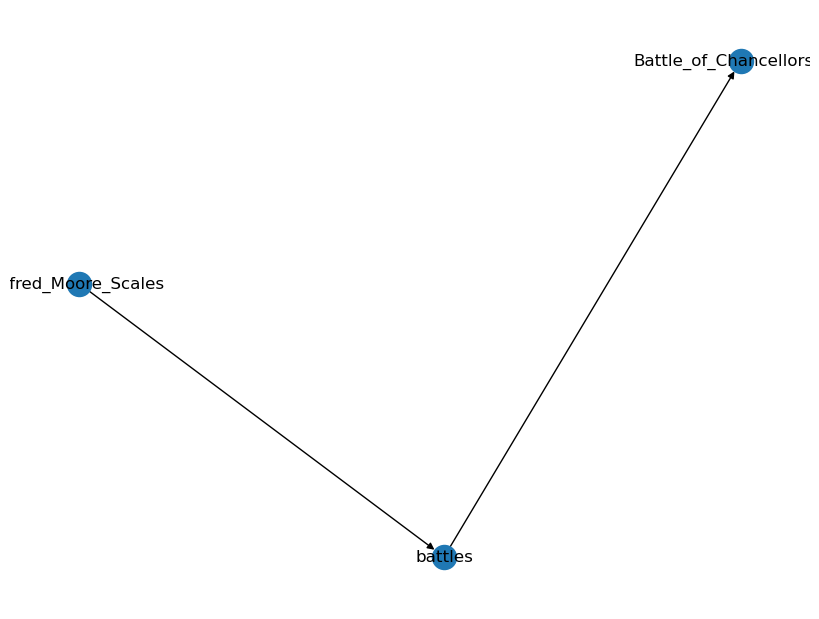

Decoded Input: 
 translate graph to text:  Alfred_Moore_Scales  battles  Battle_of_Chancellorsville
Decoded Target: 
 Alfred Moore Scales took part in the Battle of Chancellorsville.
DataBatch(x=[1, 512], edge_index=[2, 2], attention_mask=[1, 512], y=[1, 512], batch=[512], ptr=[2])
Original Sample: 
 translate graph to text: <H> Alfred_N._Phillips  <R>  birthPlace  <T>  Darien,_Connecticut 
 Darien, Connecticut is the birthplace of Alfred N. Phillips.
NetworkX Graph: 
 [('Alfred_N._Phillips', 'birthPlace', 0), ('birthPlace', 'Darien,_Connecticut', 0)]


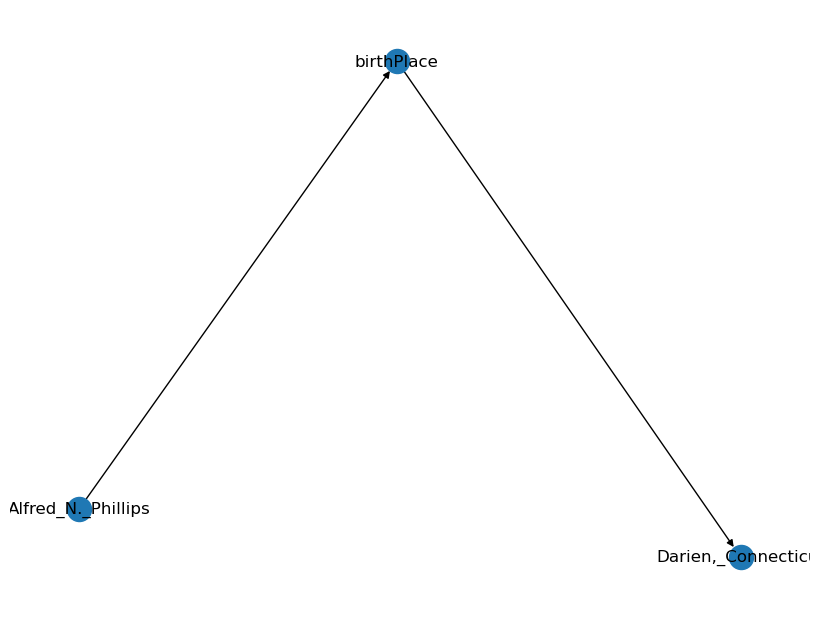

Decoded Input: 
 translate graph to text:  Alfred_N._Phillips  birthPlace  Darien,_Connecticut
Decoded Target: 
 Darien, Connecticut is the birthplace of Alfred N. Phillips.
DataBatch(x=[1, 512], edge_index=[2, 2], attention_mask=[1, 512], y=[1, 512], batch=[512], ptr=[2])
Original Sample: 
 translate graph to text: <H> Alfred_N._Phillips  <R>  office  <T>  Mayor_of_Stamford,_Connecticut 
 Alfred N Phillips was Mayor of Stamford, Connecticut.
NetworkX Graph: 
 [('Alfred_N._Phillips', 'office', 0), ('office', 'Mayor_of_Stamford,_Connecticut', 0)]


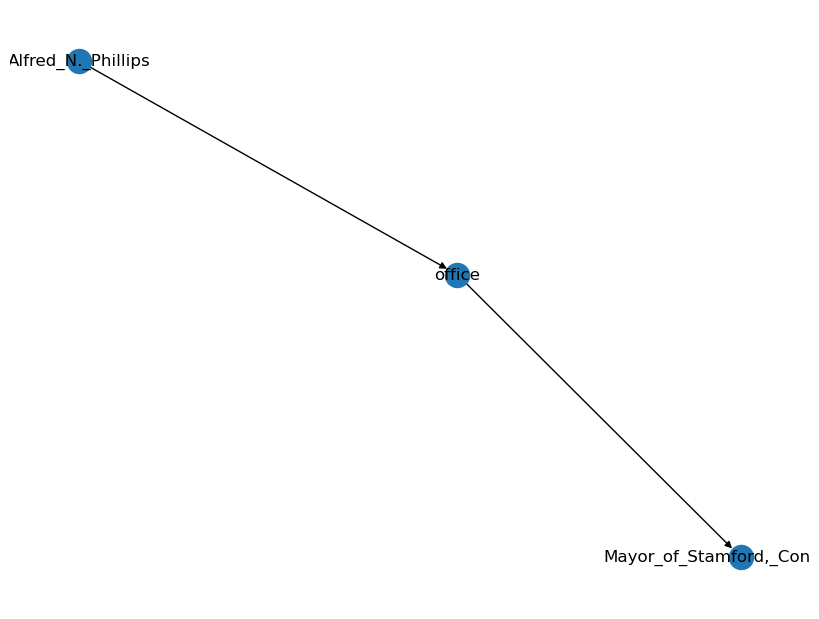

Decoded Input: 
 translate graph to text:  Alfred_N._Phillips  office  Mayor_of_Stamford,_Connecticut
Decoded Target: 
 Alfred N Phillips was Mayor of Stamford, Connecticut.
DataBatch(x=[1, 512], edge_index=[2, 2], attention_mask=[1, 512], y=[1, 512], batch=[512], ptr=[2])
Original Sample: 
 translate graph to text: <H> Allan_Shivers  <R>  activeYearsStartDate  <T>  "1947-01-21"^^xsd:date 
 Allan Shivers started his career from January 21, 1947.
NetworkX Graph: 
 [('Allan_Shivers', 'activeYearsStartDate', 0), ('activeYearsStartDate', '"1947-01-21"^^xsd:date', 0)]


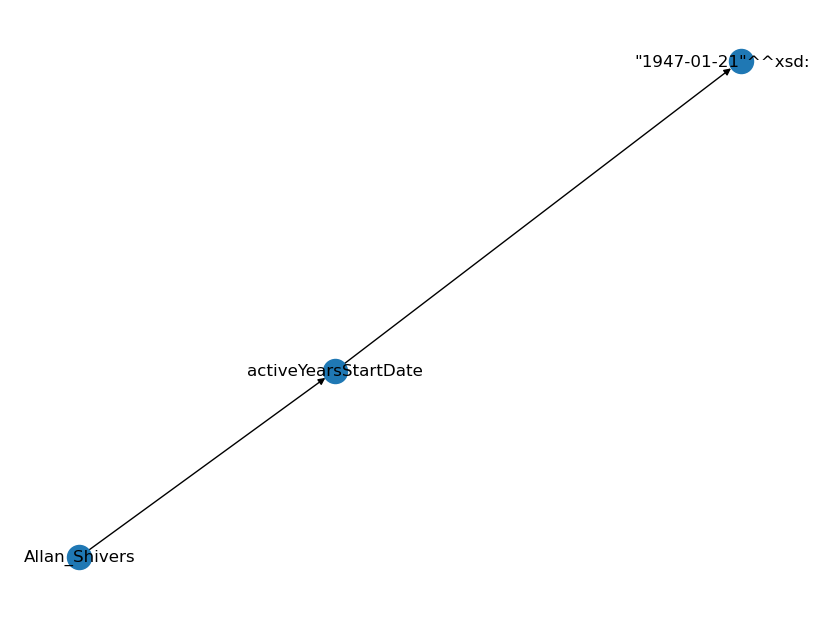

Decoded Input: 
 translate graph to text:  Allan_Shivers  activeYearsStartDate  "1947-01-21"xsd:date
Decoded Target: 
 Allan Shivers started his career from January 21, 1947.
DataBatch(x=[1, 512], edge_index=[2, 2], attention_mask=[1, 512], y=[1, 512], batch=[512], ptr=[2])
Original Sample: 
 translate graph to text: <H> Allan_Shivers  <R>  militaryBranch  <T>  United_States_Army 
 Allan Shivers served in the United States Army.
NetworkX Graph: 
 [('Allan_Shivers', 'militaryBranch', 0), ('militaryBranch', 'United_States_Army', 0)]


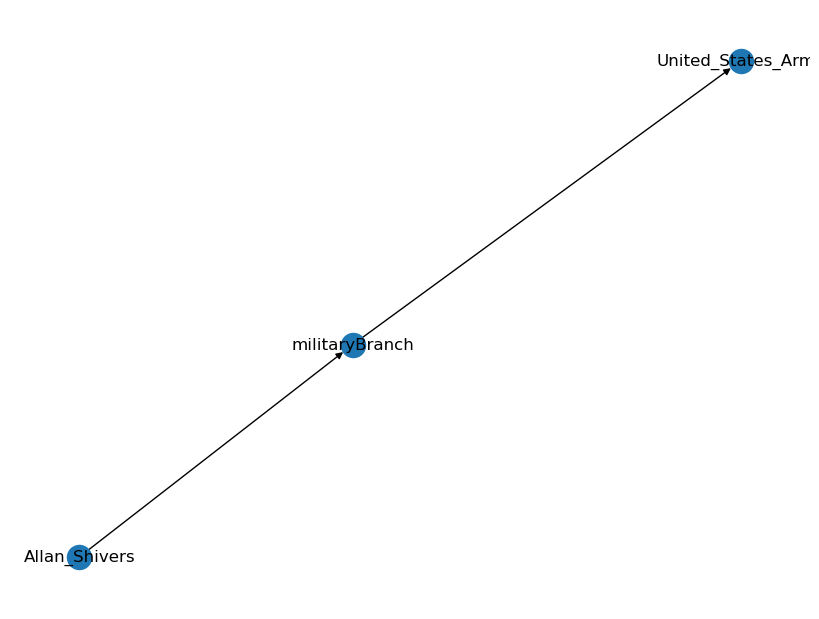

Decoded Input: 
 translate graph to text:  Allan_Shivers  militaryBranch  United_States_Army
Decoded Target: 
 Allan Shivers served in the United States Army.
DataBatch(x=[1, 512], edge_index=[2, 2], attention_mask=[1, 512], y=[1, 512], batch=[512], ptr=[2])
Original Sample: 
 translate graph to text: <H> Allan_Shivers  <R>  successor  <T>  Price_Daniel 
 Allan Shivers had the successor Price Daniel.
NetworkX Graph: 
 [('Allan_Shivers', 'successor', 0), ('successor', 'Price_Daniel', 0)]


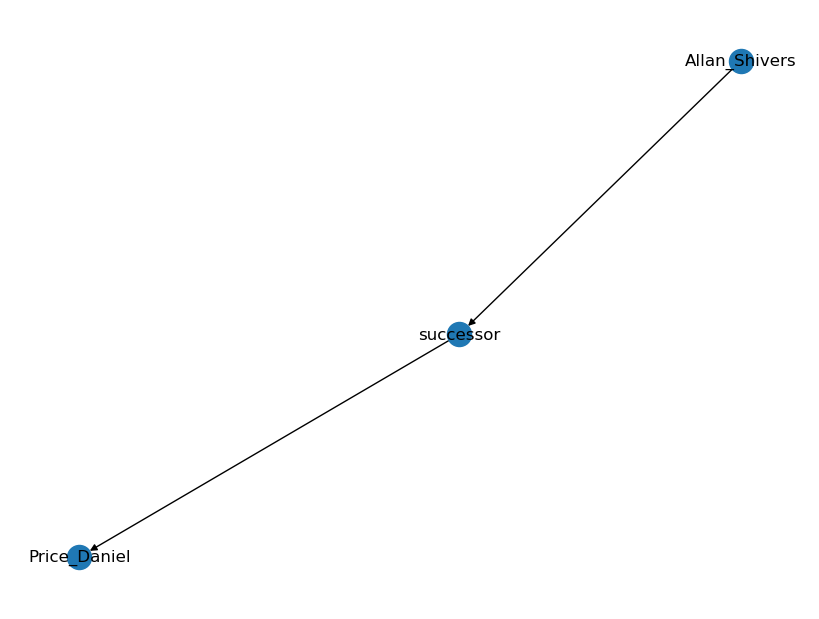

Decoded Input: 
 translate graph to text:  Allan_Shivers  successor  Price_Daniel
Decoded Target: 
 Allan Shivers had the successor Price Daniel.
DataBatch(x=[1, 512], edge_index=[2, 2], attention_mask=[1, 512], y=[1, 512], batch=[512], ptr=[2])
Original Sample: 
 translate graph to text: <H> Alvah_Sabin  <R>  activeYearsStartDate  <T>  "1853-03-04"^^xsd:date 
 Alvah Sabin was an active politician beginning March 4, 1853.
NetworkX Graph: 
 [('Alvah_Sabin', 'activeYearsStartDate', 0), ('activeYearsStartDate', '"1853-03-04"^^xsd:date', 0)]


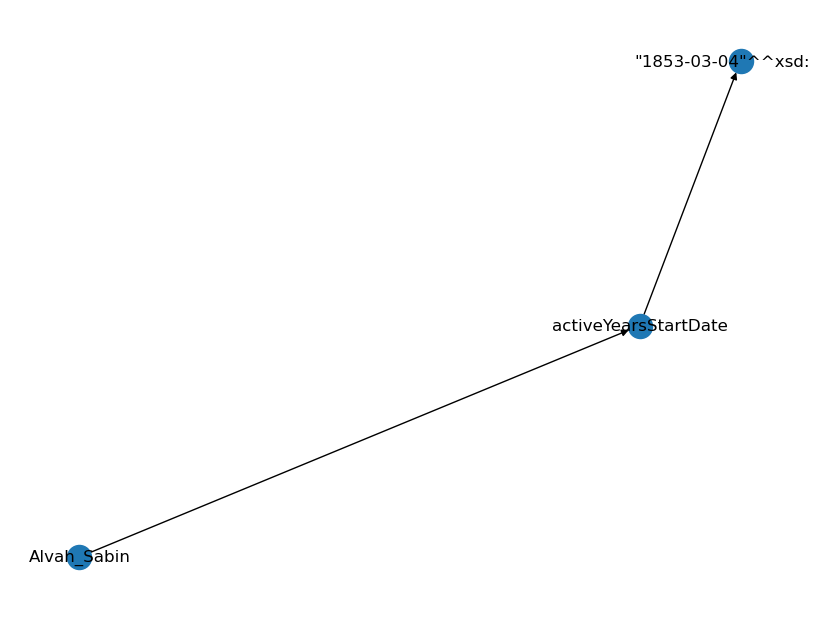

Decoded Input: 
 translate graph to text:  Alvah_Sabin  activeYearsStartDate  "1853-03-04"xsd:date
Decoded Target: 
 Alvah Sabin was an active politician beginning March 4, 1853.
DataBatch(x=[1, 512], edge_index=[2, 2], attention_mask=[1, 512], y=[1, 512], batch=[512], ptr=[2])
Original Sample: 
 translate graph to text: <H> Alvah_Sabin  <R>  party  <T>  Whig_Party_(United_States) 
 Alvah Sabin was a member of the United States Whig Party.
NetworkX Graph: 
 [('Alvah_Sabin', 'party', 0), ('party', 'Whig_Party_', 0)]


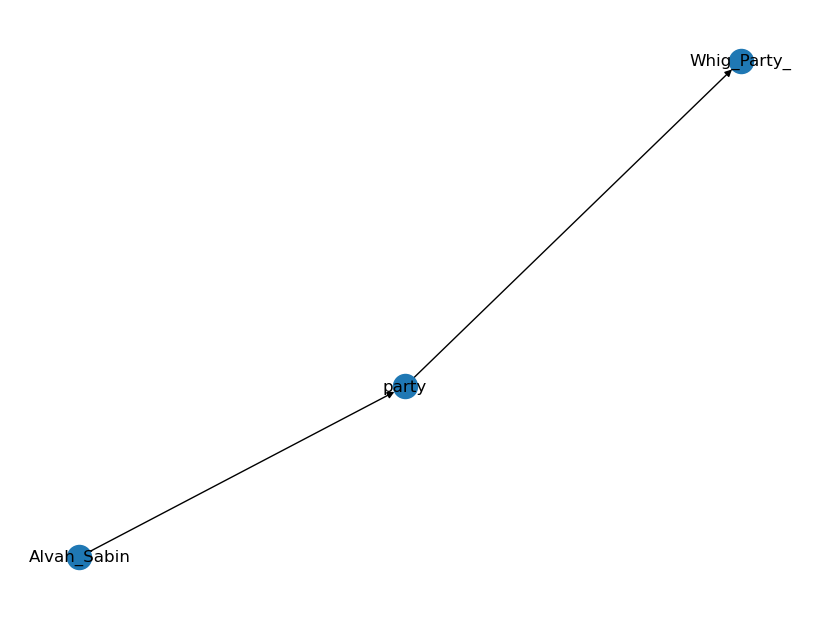

Decoded Input: 
 translate graph to text:  Alvah_Sabin  party  Whig_Party_(United_States)
Decoded Target: 
 Alvah Sabin was a member of the United States Whig Party.
DataBatch(x=[1, 512], edge_index=[2, 2], attention_mask=[1, 512], y=[1, 512], batch=[512], ptr=[2])
Original Sample: 
 translate graph to text: <H> American_Civil_War  <R>  commander  <T>  Robert_E._Lee 
 Robert E Lee was a commander in the American Civil War.
NetworkX Graph: 
 [('American_Civil_War', 'commander', 0), ('commander', 'Robert_E._Lee', 0)]


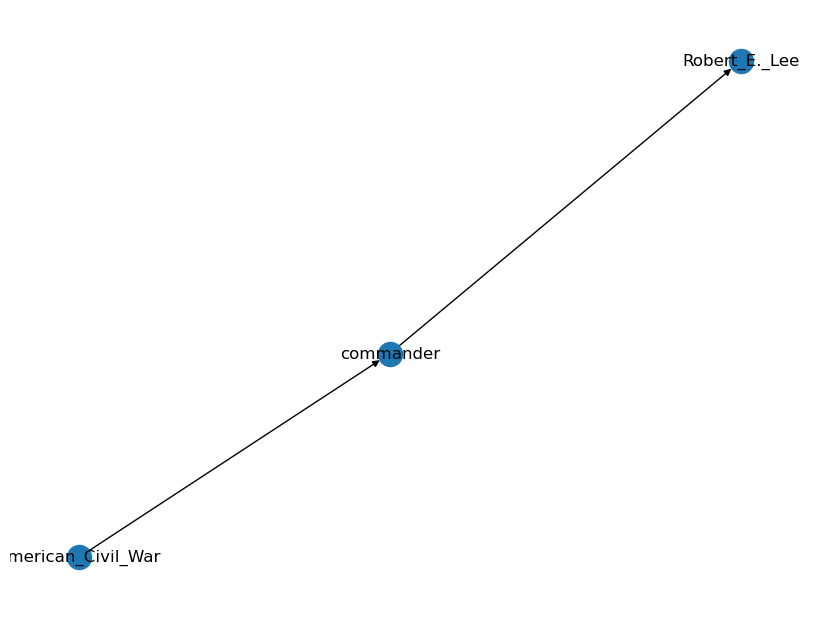

Decoded Input: 
 translate graph to text:  American_Civil_War  commander  Robert_E._Lee
Decoded Target: 
 Robert E Lee was a commander in the American Civil War.
DataBatch(x=[1, 512], edge_index=[2, 2], attention_mask=[1, 512], y=[1, 512], batch=[512], ptr=[2])
Original Sample: 
 translate graph to text: <H> Austria  <R>  language  <T>  Austrian_German 
 In Austria, the language is Austrian German.
NetworkX Graph: 
 [('Austria', 'language', 0), ('language', 'Austrian_German', 0)]


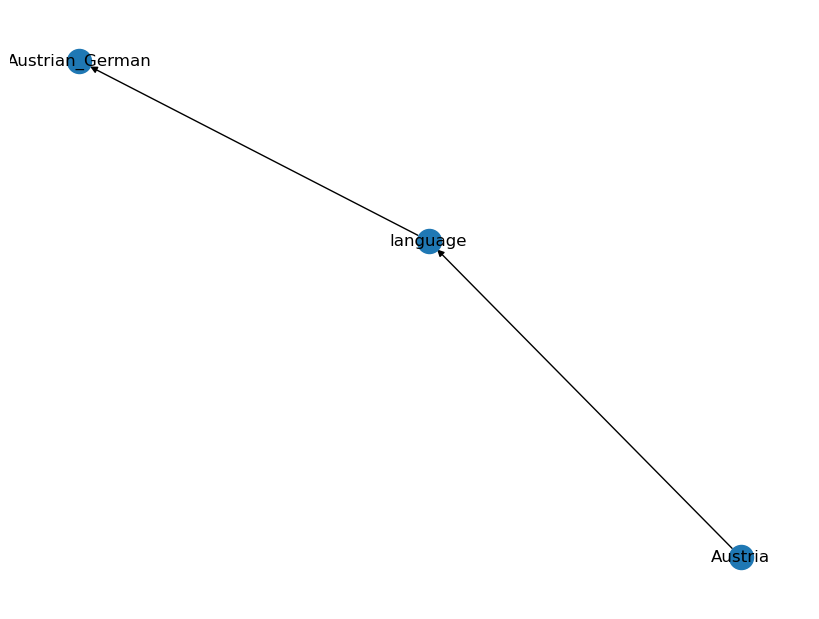

Decoded Input: 
 translate graph to text:  Austria  language  Austrian_German
Decoded Target: 
 In Austria, the language is Austrian German.
DataBatch(x=[1, 512], edge_index=[2, 2], attention_mask=[1, 512], y=[1, 512], batch=[512], ptr=[2])
Original Sample: 
 translate graph to text: <H> Battle_of_Antietam  <R>  commander  <T>  Robert_E._Lee 
 Robert E Lee was commander in the Battle of Antietam.
NetworkX Graph: 
 [('Battle_of_Antietam', 'commander', 0), ('commander', 'Robert_E._Lee', 0)]


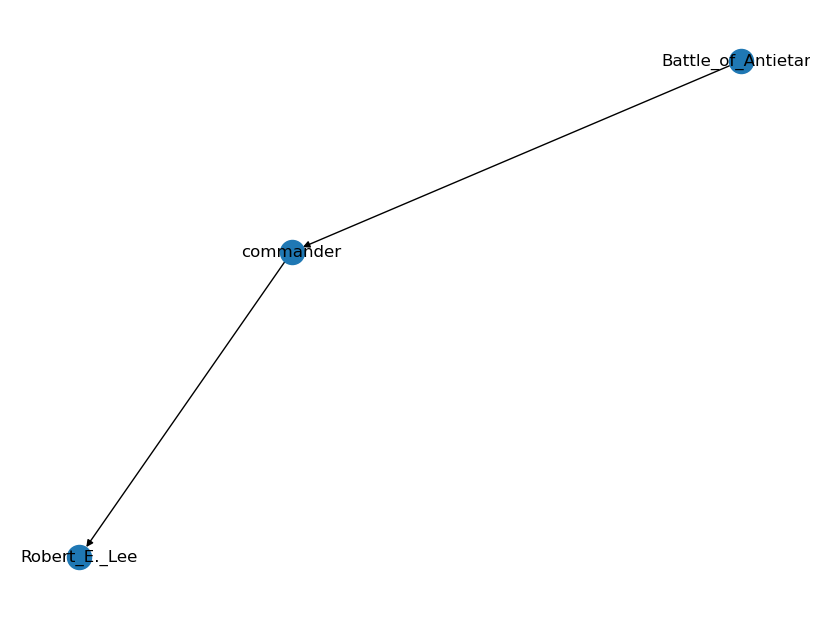

Decoded Input: 
 translate graph to text:  Battle_of_Antietam  commander  Robert_E._Lee
Decoded Target: 
 Robert E Lee was commander in the Battle of Antietam.
DataBatch(x=[1, 512], edge_index=[2, 2], attention_mask=[1, 512], y=[1, 512], batch=[512], ptr=[2])
Original Sample: 
 translate graph to text: <H> Battle_of_Cold_Harbor  <R>  isPartOfMilitaryConflict  <T>  American_Civil_War 
 The Battle of Cold Harbor took place during the American Civil War.
NetworkX Graph: 
 [('Battle_of_Cold_Harbor', 'isPartOfMilitaryConflict', 0), ('isPartOfMilitaryConflict', 'American_Civil_War', 0)]


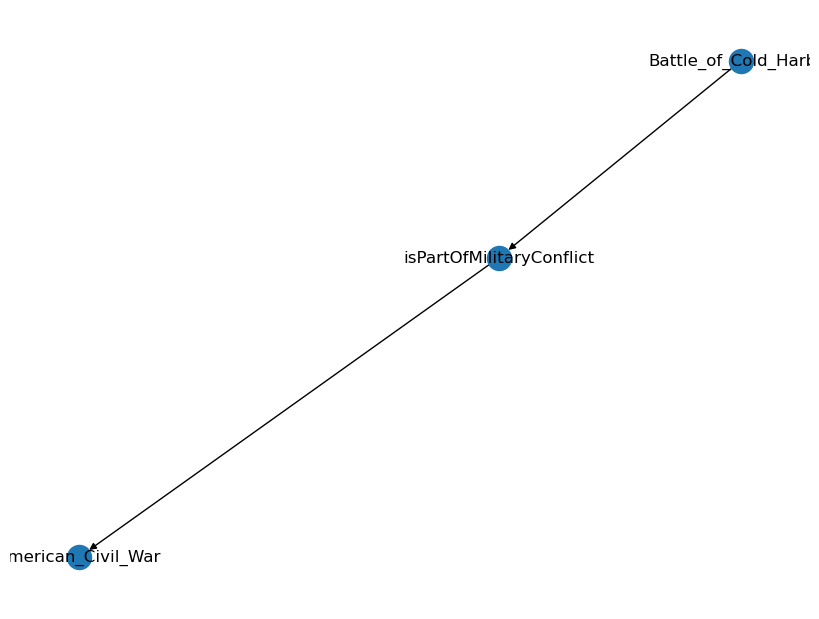

Decoded Input: 
 translate graph to text:  Battle_of_Cold_Harbor  isPartOfMilitaryConflict  American_Civil_War
Decoded Target: 
 The Battle of Cold Harbor took place during the American Civil War.
DataBatch(x=[1, 512], edge_index=[2, 2], attention_mask=[1, 512], y=[1, 512], batch=[512], ptr=[2])
Original Sample: 
 translate graph to text: <H> Buenos_Aires  <R>  leaderName  <T>  Gabriela_Michetti 
 Gabriela Michetti is a leader in Buenos Aires.
NetworkX Graph: 
 [('Buenos_Aires', 'leaderName', 0), ('leaderName', 'Gabriela_Michetti', 0)]


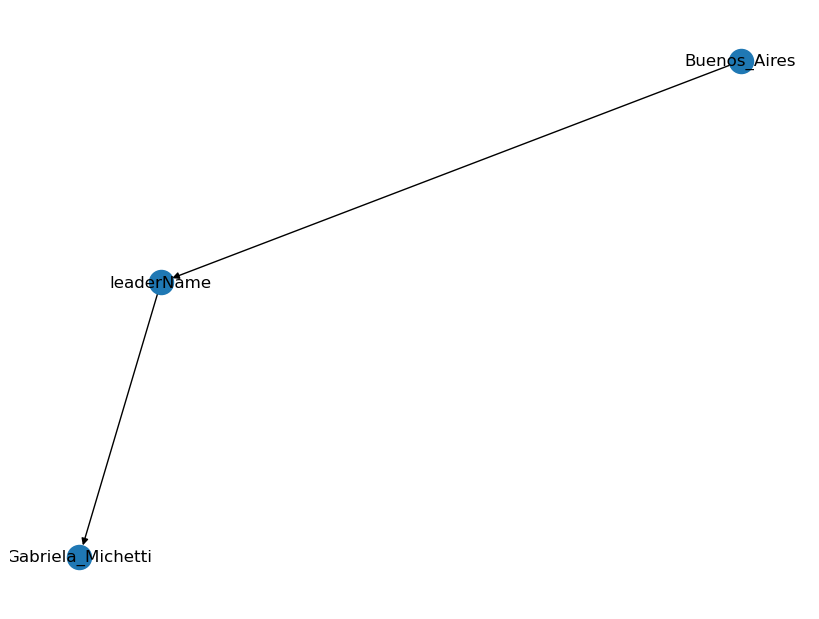

Decoded Input: 
 translate graph to text:  Buenos_Aires  leaderName  Gabriela_Michetti
Decoded Target: 
 Gabriela Michetti is a leader in Buenos Aires.
DataBatch(x=[1, 512], edge_index=[2, 2], attention_mask=[1, 512], y=[1, 512], batch=[512], ptr=[2])
Original Sample: 
 translate graph to text: <H> Gulf_War  <R>  commander  <T>  Colin_Powell 
 Colin Powell was a commander in the Gulf War.
NetworkX Graph: 
 [('Gulf_War', 'commander', 0), ('commander', 'Colin_Powell', 0)]


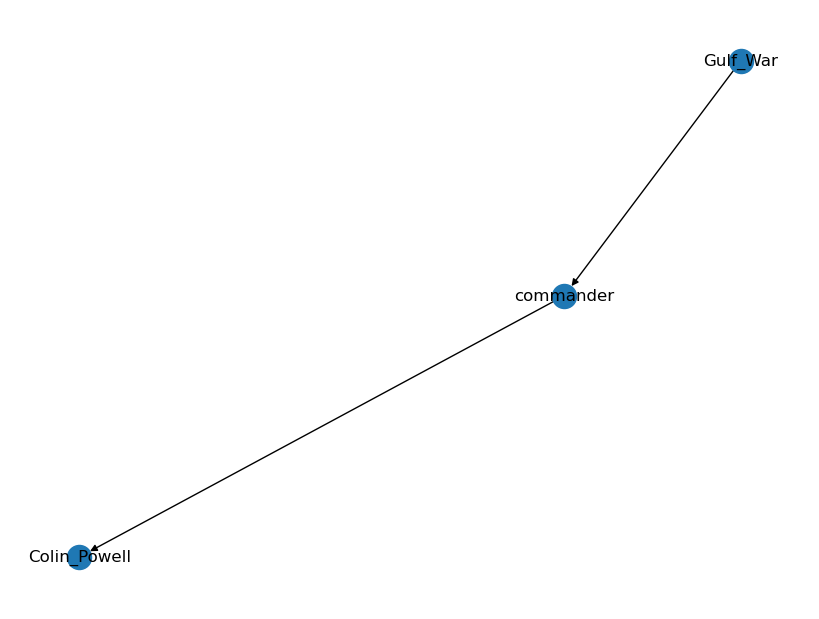

Decoded Input: 
 translate graph to text:  Gulf_War  commander  Colin_Powell
Decoded Target: 
 Colin Powell was a commander in the Gulf War.
DataBatch(x=[1, 512], edge_index=[2, 2], attention_mask=[1, 512], y=[1, 512], batch=[512], ptr=[2])
Original Sample: 
 translate graph to text: <H> John_F._Kennedy  <R>  predecessor  <T>  Dwight_D._Eisenhower 
 Dwight D. Eisenhower was the predecessor to John F. Kennedy.
NetworkX Graph: 
 [('John_F._Kennedy', 'predecessor', 0), ('predecessor', 'Dwight_D._Eisenhower', 0)]


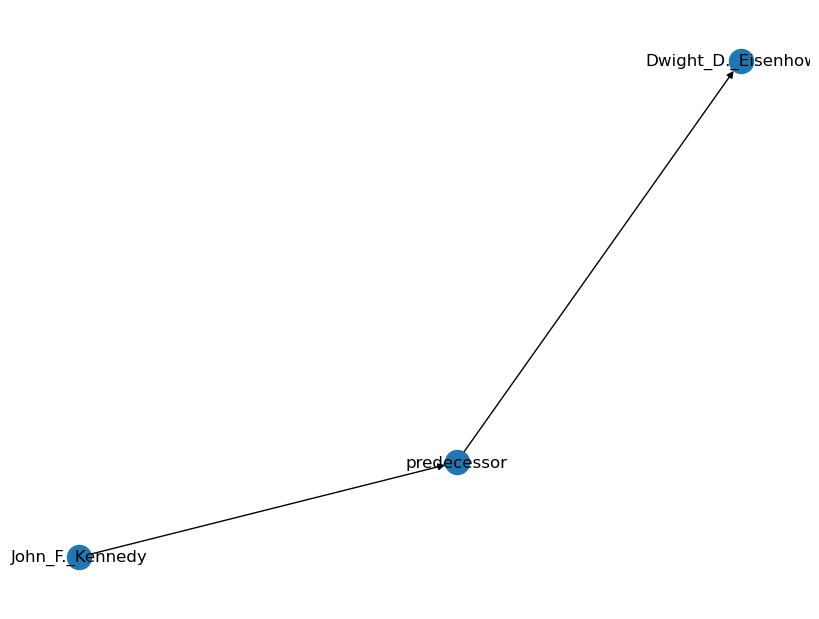

Decoded Input: 
 translate graph to text:  John_F._Kennedy  predecessor  Dwight_D._Eisenhower
Decoded Target: 
 Dwight D. Eisenhower was the predecessor to John F. Kennedy.
DataBatch(x=[1, 512], edge_index=[2, 2], attention_mask=[1, 512], y=[1, 512], batch=[512], ptr=[2])
Original Sample: 
 translate graph to text: <H> Josef_Klaus  <R>  almaMater  <T>  University_of_Vienna 
 The University of Vienna is the Alma mater of Josef Klaus.
NetworkX Graph: 
 [('Josef_Klaus', 'almaMater', 0), ('almaMater', 'University_of_Vienna', 0)]


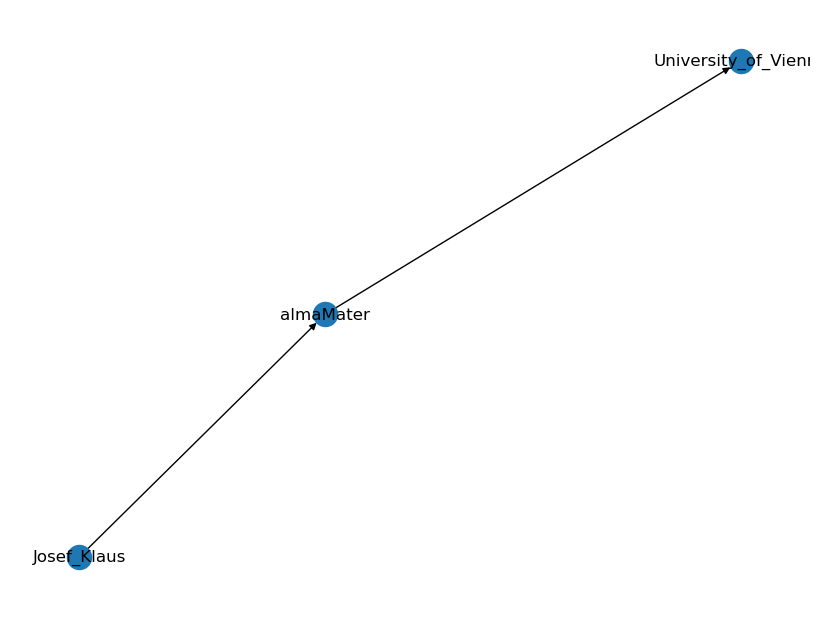

Decoded Input: 
 translate graph to text:  Josef_Klaus  almaMater  University_of_Vienna
Decoded Target: 
 The University of Vienna is the Alma mater of Josef Klaus.
DataBatch(x=[1, 512], edge_index=[2, 2], attention_mask=[1, 512], y=[1, 512], batch=[512], ptr=[2])
Original Sample: 
 translate graph to text: <H> Juan_Carlos_I_of_Spain  <R>  predecessor  <T>  Francisco_Franco 
 Francisco Franco was the predecessor of Juan Carlos I of Spain.
NetworkX Graph: 
 [('Juan_Carlos_I_of_Spain', 'predecessor', 0), ('predecessor', 'Francisco_Franco', 0)]


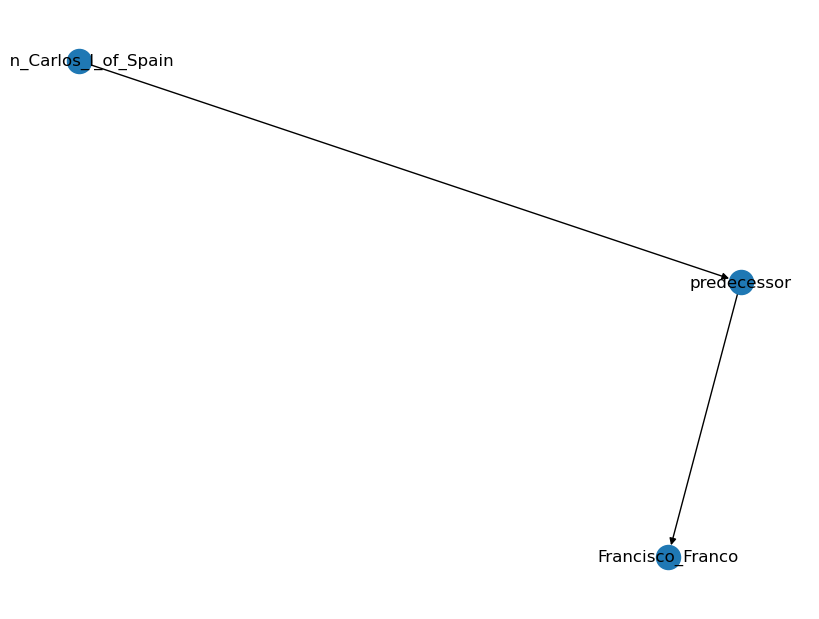

Decoded Input: 
 translate graph to text:  Juan_Carlos_I_of_Spain  predecessor  Francisco_Franco
Decoded Target: 
 Francisco Franco was the predecessor of Juan Carlos I of Spain.
DataBatch(x=[1, 512], edge_index=[2, 2], attention_mask=[1, 512], y=[1, 512], batch=[512], ptr=[2])
Original Sample: 
 translate graph to text: <H> Juan_Perón  <R>  party  <T>  Labour_Party_(Argentina) 
 Juan Perón was a member of the Labour Party in Argentina.
NetworkX Graph: 
 [('Juan_Perón', 'party', 0), ('party', 'Labour_Party_', 0)]


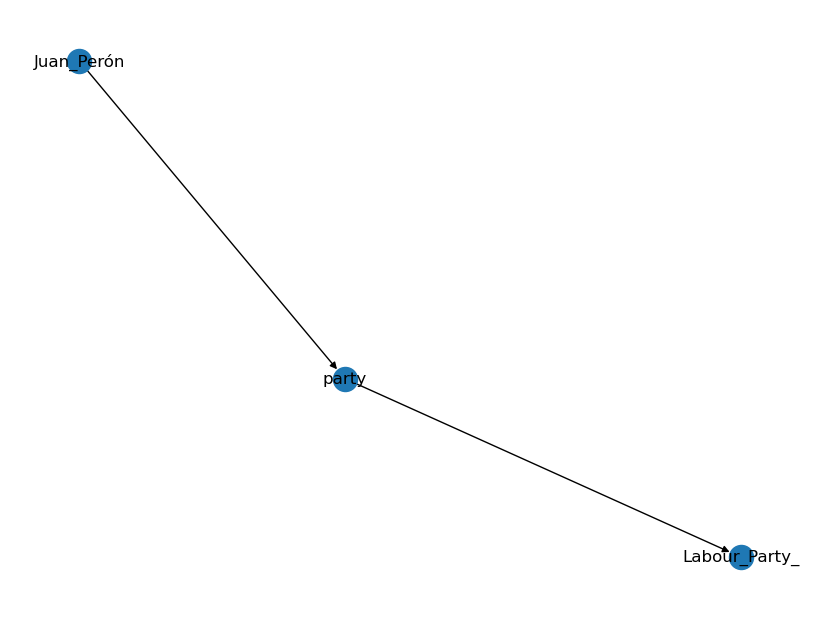

Decoded Input: 
 translate graph to text:  Juan_Perón  party  Labour_Party_(Argentina)
Decoded Target: 
 Juan Perón was a member of the Labour Party in Argentina.
DataBatch(x=[1, 512], edge_index=[2, 2], attention_mask=[1, 512], y=[1, 512], batch=[512], ptr=[2])
Original Sample: 
 translate graph to text: <H> Netherlands  <R>  leader  <T>  Mark_Rutte 
 The leader of the Netherlands is Mark Rutte.
NetworkX Graph: 
 [('Netherlands', 'leader', 0), ('leader', 'Mark_Rutte', 0)]


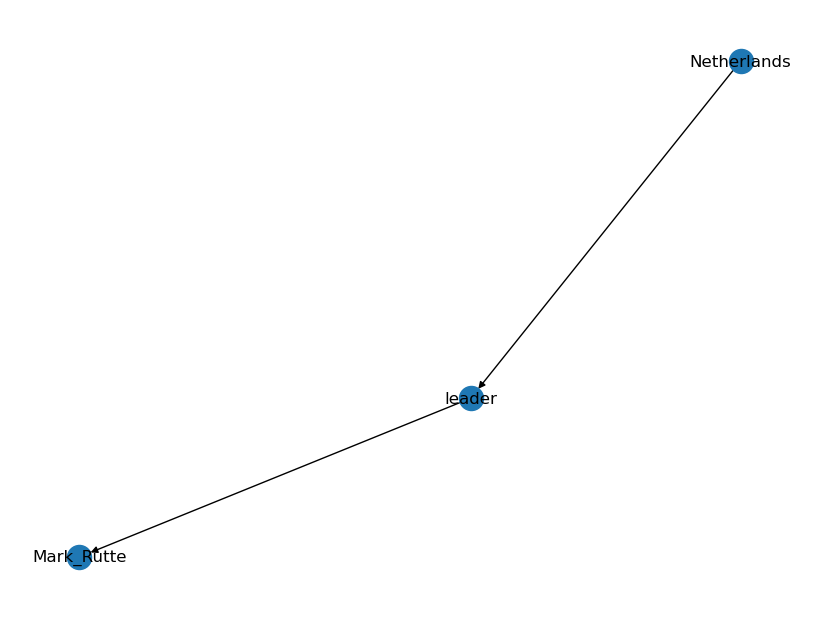

Decoded Input: 
 translate graph to text:  Netherlands  leader  Mark_Rutte
Decoded Target: 
 The leader of the Netherlands is Mark Rutte.
DataBatch(x=[1, 512], edge_index=[2, 2], attention_mask=[1, 512], y=[1, 512], batch=[512], ptr=[2])
Original Sample: 
 translate graph to text: <H> United_States_Army  <R>  battles  <T>  Spanish–American_War 
 The United States Army was involved in battles in the Spanish-American War.
NetworkX Graph: 
 [('United_States_Army', 'battles', 0), ('battles', 'Spanish–American_War', 0)]


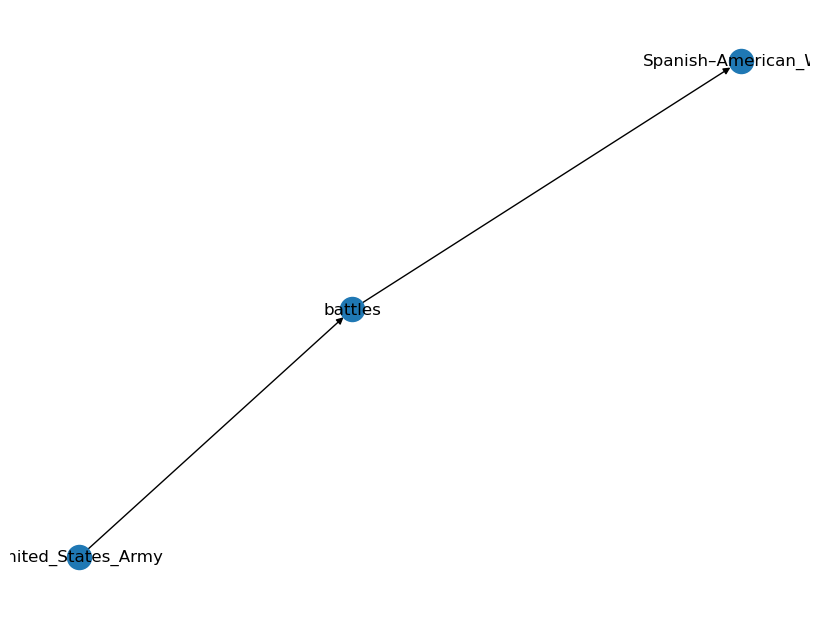

Decoded Input: 
 translate graph to text:  United_States_Army  battles  Spanish–American_War
Decoded Target: 
 The United States Army was involved in battles in the Spanish-American War.
DataBatch(x=[1, 512], edge_index=[2, 2], attention_mask=[1, 512], y=[1, 512], batch=[512], ptr=[2])
Original Sample: 
 translate graph to text: <H> William_M._O._Dawson  <R>  birthPlace  <T>  Bloomington,_Maryland 
 The birthplace of William M. O. Dawson was Bloomington Maryland.
NetworkX Graph: 
 [('William_M._O._Dawson', 'birthPlace', 0), ('birthPlace', 'Bloomington,_Maryland', 0)]


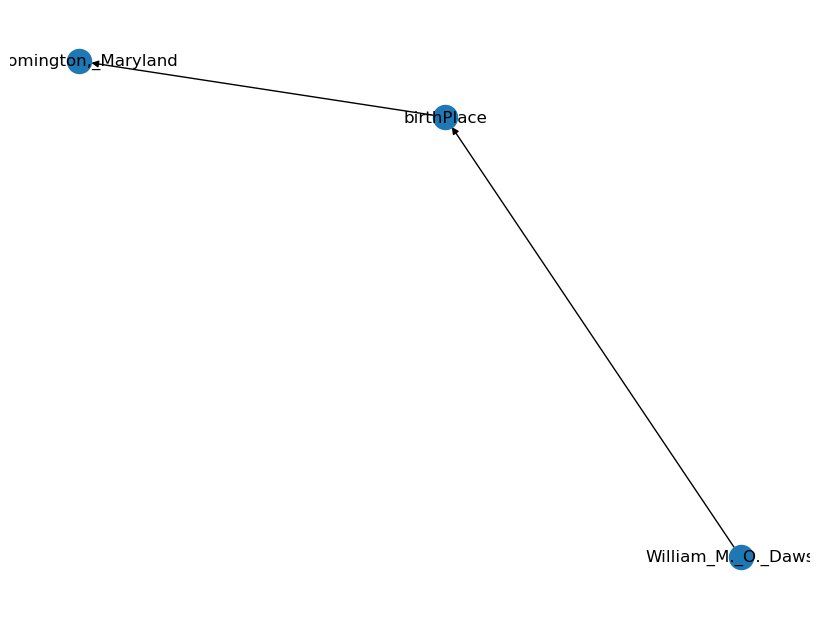

Decoded Input: 
 translate graph to text:  William_M._O._Dawson  birthPlace  Bloomington,_Maryland
Decoded Target: 
 The birthplace of William M. O. Dawson was Bloomington Maryland.
DataBatch(x=[1, 512], edge_index=[2, 2], attention_mask=[1, 512], y=[1, 512], batch=[512], ptr=[2])
Original Sample: 
 translate graph to text: <H> 1955_Dodge  <R>  aka  <T>  "Dodge Coronet"@en 
 Dodge Coronet is the alternative name for the 1955 Dodge.
NetworkX Graph: 
 [('1955_Dodge', 'aka', 0), ('aka', '"Dodge Coronet"@en', 0)]


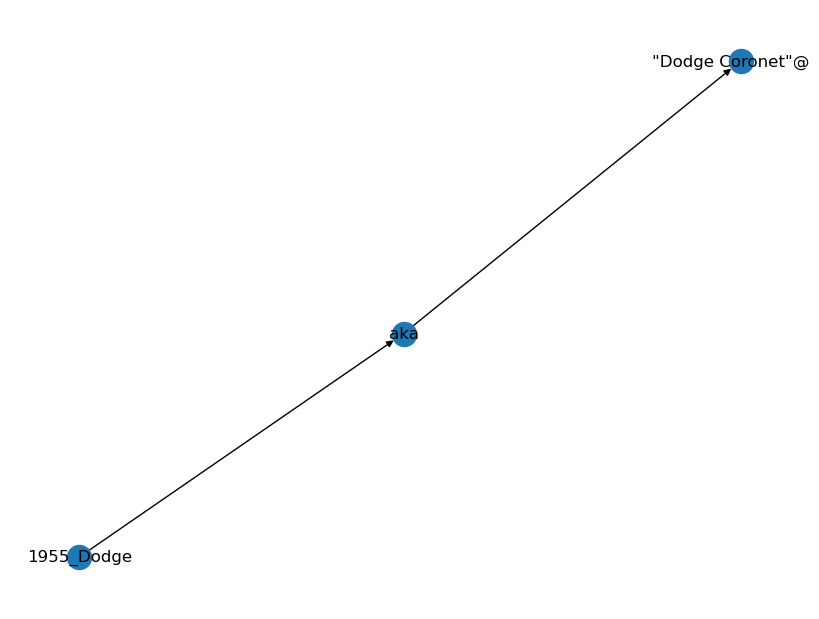

Decoded Input: 
 translate graph to text:  1955_Dodge  aka  "Dodge Coronet"@en
Decoded Target: 
 Dodge Coronet is the alternative name for the 1955 Dodge.
DataBatch(x=[1, 512], edge_index=[2, 2], attention_mask=[1, 512], y=[1, 512], batch=[512], ptr=[2])
Original Sample: 
 translate graph to text: <H> 1955_Dodge  <R>  engine  <T>  230 
 The 1955 Dodge engine is 230 cubic inches.
NetworkX Graph: 
 [('1955_Dodge', 'engine', 0), ('engine', '230', 0)]


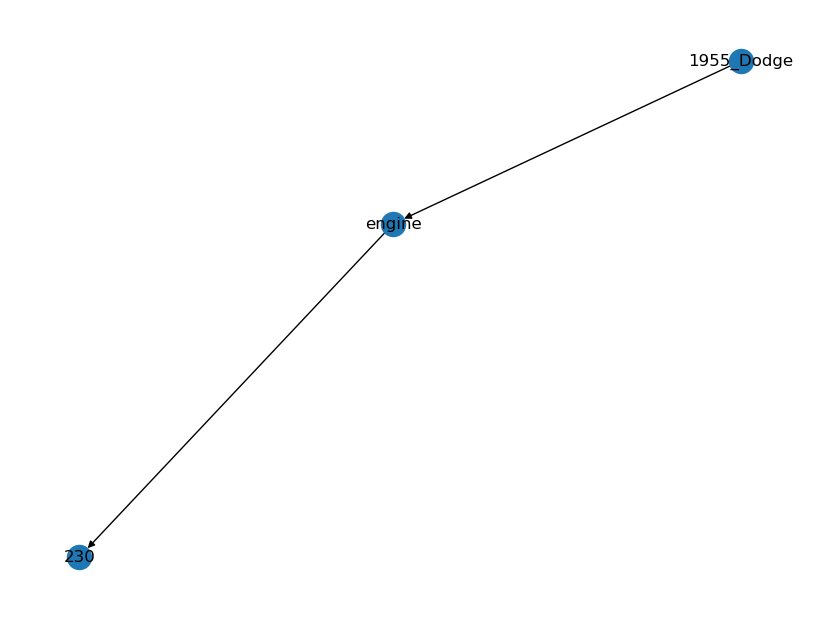

Decoded Input: 
 translate graph to text:  1955_Dodge  engine  230
Decoded Target: 
 The 1955 Dodge engine is 230 cubic inches.
DataBatch(x=[1, 512], edge_index=[2, 2], attention_mask=[1, 512], y=[1, 512], batch=[512], ptr=[2])
Original Sample: 
 translate graph to text: <H> A-Rosa_Luna  <R>  shipChristened  <T>  "2005-04-07"^^xsd:date 
 The A-Rosa Luna was christened on the 7th of April 2005.
NetworkX Graph: 
 [('A-Rosa_Luna', 'shipChristened', 0), ('shipChristened', '"2005-04-07"^^xsd:date', 0)]


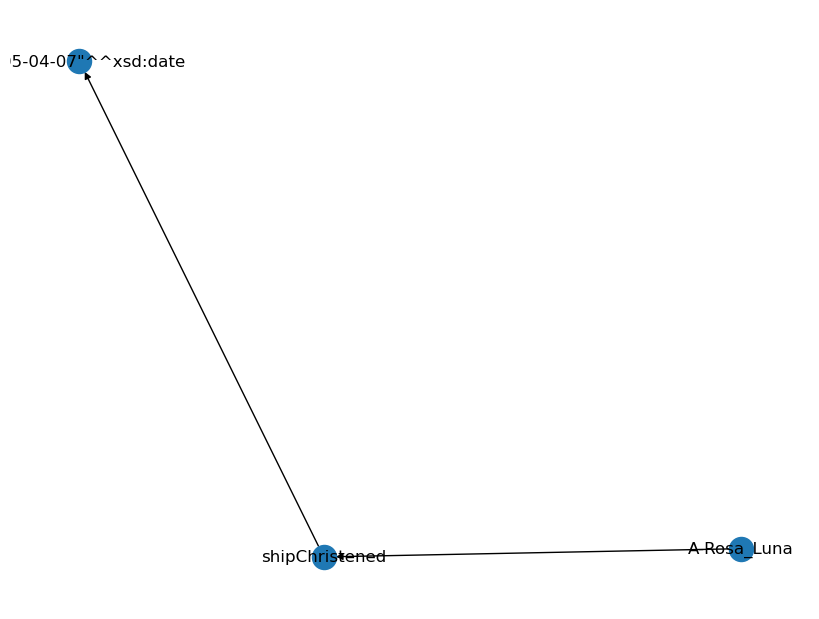

Decoded Input: 
 translate graph to text:  A-Rosa_Luna  shipChristened  "2005-04-07"xsd:date
Decoded Target: 
 The A-Rosa Luna was christened on the 7th of April 2005.
DataBatch(x=[1, 512], edge_index=[2, 2], attention_mask=[1, 512], y=[1, 512], batch=[512], ptr=[2])
Original Sample: 
 translate graph to text: <H> AIDA_Cruises  <R>  location  <T>  Rostock 
 The location of AIDA Cruises is Rostock.
NetworkX Graph: 
 [('AIDA_Cruises', 'location', 0), ('location', 'Rostock', 0)]


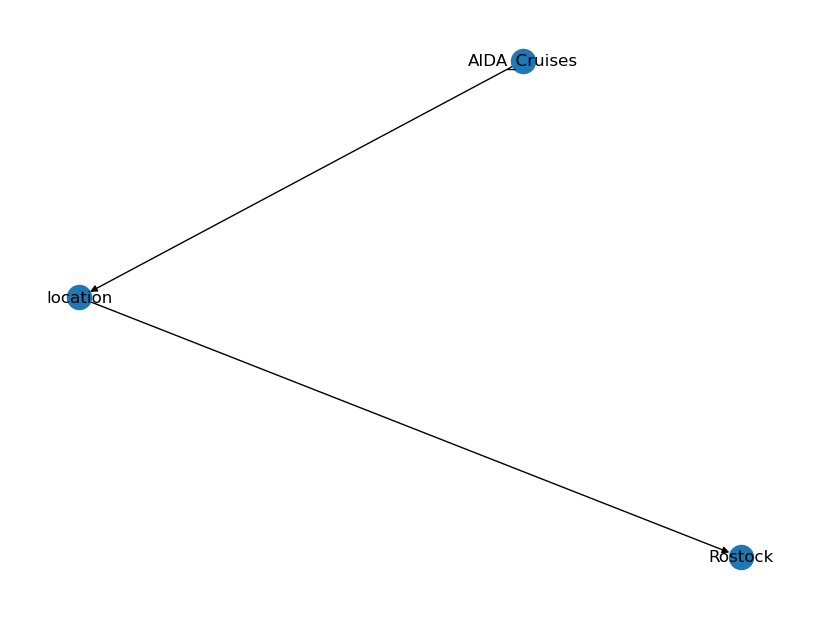

Decoded Input: 
 translate graph to text:  AIDA_Cruises  location  Rostock
Decoded Target: 
 The location of AIDA Cruises is Rostock.
DataBatch(x=[1, 512], edge_index=[2, 2], attention_mask=[1, 512], y=[1, 512], batch=[512], ptr=[2])
Original Sample: 
 translate graph to text: <H> AIDAluna  <R>  operator  <T>  AIDA_Cruises 
 AIDA Cruises is the operator of the AIDAluna.
NetworkX Graph: 
 [('AIDAluna', 'operator', 0), ('operator', 'AIDA_Cruises', 0)]


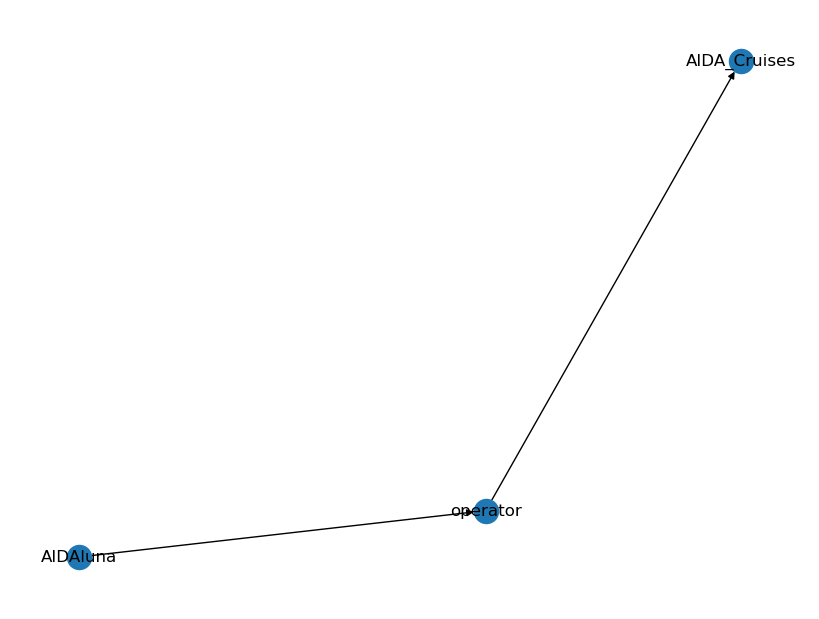

Decoded Input: 
 translate graph to text:  AIDAluna  operator  AIDA_Cruises
Decoded Target: 
 AIDA Cruises is the operator of the AIDAluna.
DataBatch(x=[1, 512], edge_index=[2, 2], attention_mask=[1, 512], y=[1, 512], batch=[512], ptr=[2])
Original Sample: 
 translate graph to text: <H> AIDAstella  <R>  shipChristened  <T>  "--03-16"^^xsd:gMonthDay 
 The AIDAstella was christened on the 16th of March, 2013.
NetworkX Graph: 
 [('AIDAstella', 'shipChristened', 0), ('shipChristened', '"--03-16"^^xsd:gMonthDay', 0)]


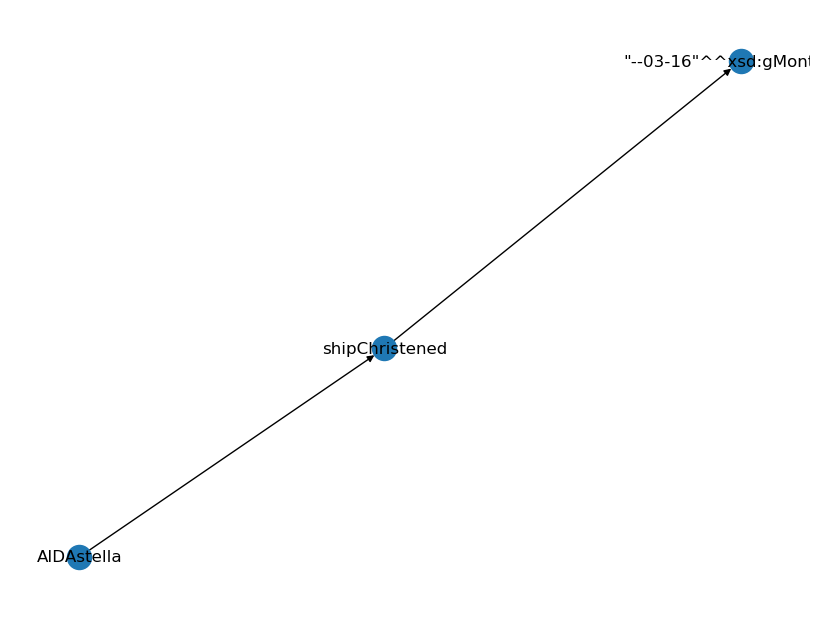

Decoded Input: 
 translate graph to text:  AIDAstella  shipChristened  "--03-16"xsd:gMonthDay
Decoded Target: 
 The AIDAstella was christened on the 16th of March, 2013.
DataBatch(x=[1, 512], edge_index=[2, 2], attention_mask=[1, 512], y=[1, 512], batch=[512], ptr=[2])
Original Sample: 
 translate graph to text: <H> AIDAstella  <R>  completionDate  <T>  "2013-03-11"^^xsd:date 
 The AIDAstella was completed on March 11th 2013.
NetworkX Graph: 
 [('AIDAstella', 'completionDate', 0), ('completionDate', '"2013-03-11"^^xsd:date', 0)]


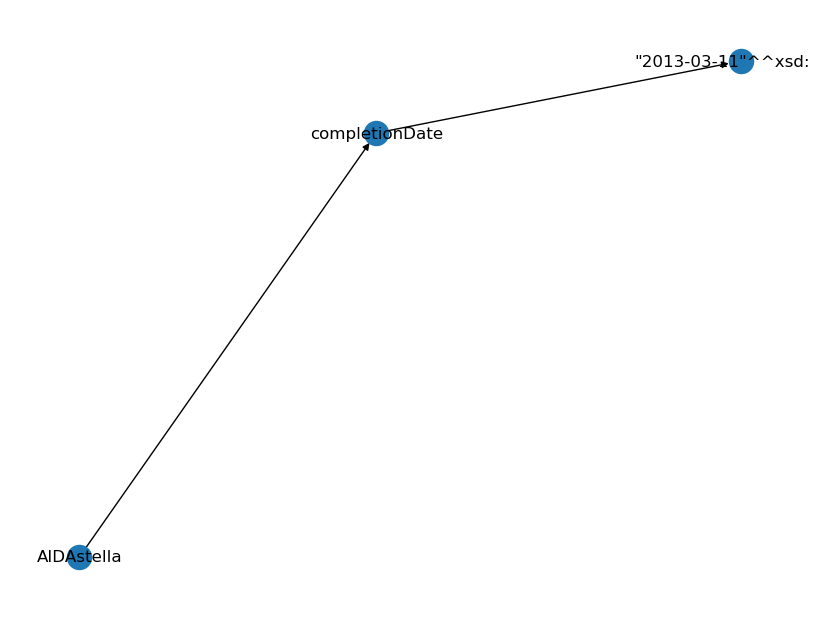

Decoded Input: 
 translate graph to text:  AIDAstella  completionDate  "2013-03-11"xsd:date
Decoded Target: 
 The AIDAstella was completed on March 11th 2013.
DataBatch(x=[1, 512], edge_index=[2, 2], attention_mask=[1, 512], y=[1, 512], batch=[512], ptr=[2])
Original Sample: 
 translate graph to text: <H> AIDAstella  <R>  shipMaidenVoyage  <T>  "2013-03-17"^^xsd:date 
 The AIDAstella had its maiden voyage on March 17, 2013.
NetworkX Graph: 
 [('AIDAstella', 'shipMaidenVoyage', 0), ('shipMaidenVoyage', '"2013-03-17"^^xsd:date', 0)]


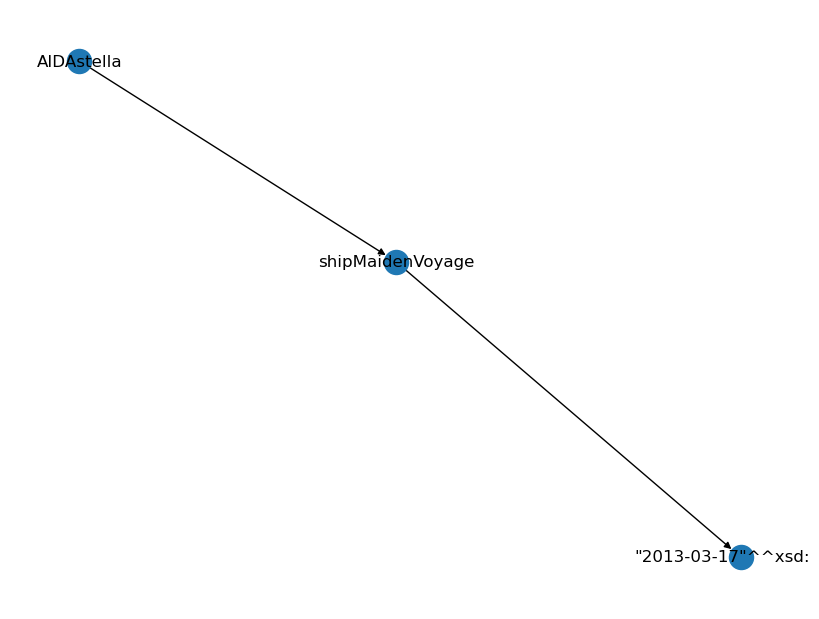

Decoded Input: 
 translate graph to text:  AIDAstella  shipMaidenVoyage  "2013-03-17"xsd:date
Decoded Target: 
 The AIDAstella had its maiden voyage on March 17, 2013.
DataBatch(x=[1, 512], edge_index=[2, 2], attention_mask=[1, 512], y=[1, 512], batch=[512], ptr=[2])
Original Sample: 
 translate graph to text: <H> AIDAstella  <R>  operator  <T>  AIDA_Cruises 
 The ship AIDAstella is operated by AIDA Cruises.
NetworkX Graph: 
 [('AIDAstella', 'operator', 0), ('operator', 'AIDA_Cruises', 0)]


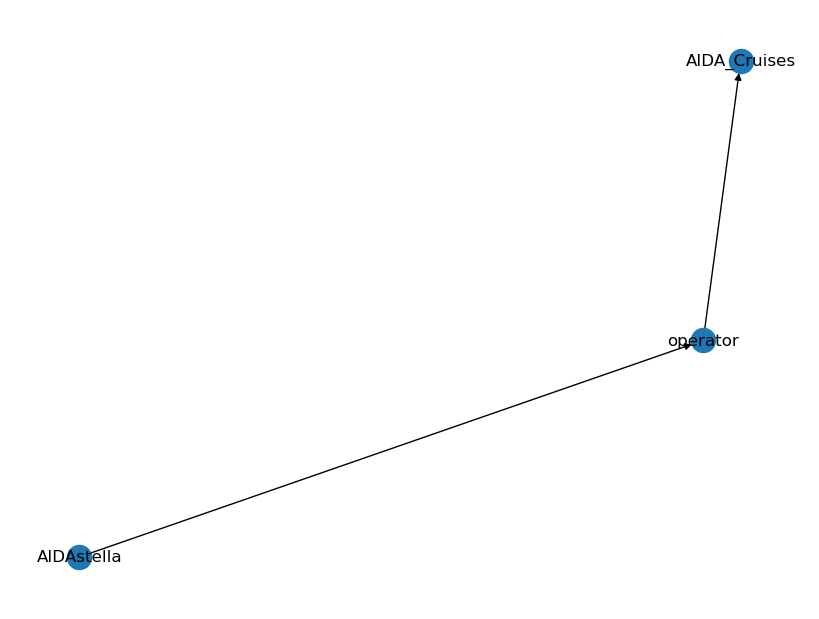

Decoded Input: 
 translate graph to text:  AIDAstella  operator  AIDA_Cruises
Decoded Target: 
 The ship AIDAstella is operated by AIDA Cruises.
DataBatch(x=[1, 512], edge_index=[2, 2], attention_mask=[1, 512], y=[1, 512], batch=[512], ptr=[2])
Original Sample: 
 translate graph to text: <H> ALV_X-1  <R>  launchSite  <T>  Mid-Atlantic_Regional_Spaceport 
 The launch site of ALV X-1 was Mid Atlantic Regional Spaceport.
NetworkX Graph: 
 [('ALV_X-1', 'launchSite', 0), ('launchSite', 'Mid-Atlantic_Regional_Spaceport', 0)]


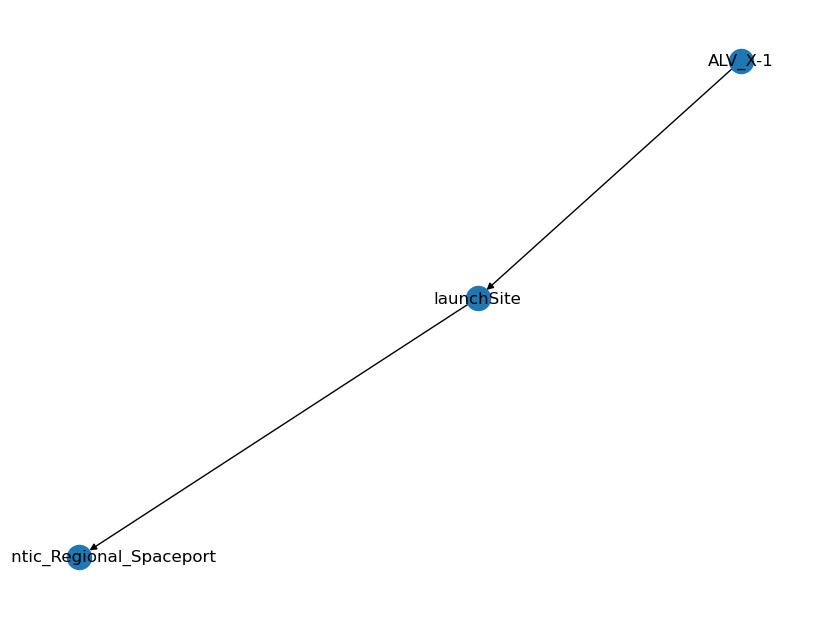

Decoded Input: 
 translate graph to text:  ALV_X-1  launchSite  Mid-Atlantic_Regional_Spaceport
Decoded Target: 
 The launch site of ALV X-1 was Mid Atlantic Regional Spaceport.
DataBatch(x=[1, 512], edge_index=[2, 2], attention_mask=[1, 512], y=[1, 512], batch=[512], ptr=[2])
Original Sample: 
 translate graph to text: <H> AMC_Matador  <R>  aka  <T>  "American Motors Matador"@en 
 The AMC Matador is also known as American Motors Matador.
NetworkX Graph: 
 [('AMC_Matador', 'aka', 0), ('aka', '"American Motors Matador"@en', 0)]


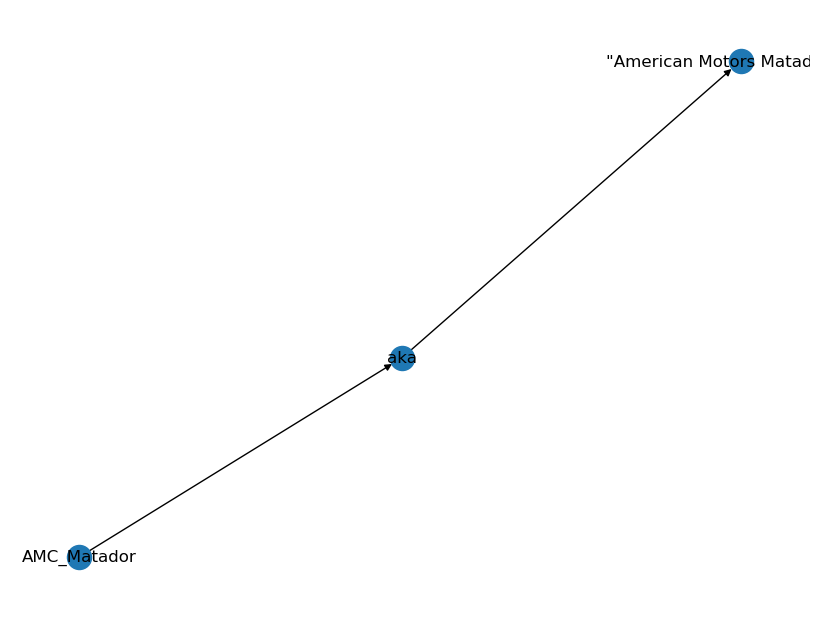

Decoded Input: 
 translate graph to text:  AMC_Matador  aka  "American Motors Matador"@en
Decoded Target: 
 The AMC Matador is also known as American Motors Matador.
DataBatch(x=[1, 512], edge_index=[2, 2], attention_mask=[1, 512], y=[1, 512], batch=[512], ptr=[2])
Original Sample: 
 translate graph to text: <H> ARA_Veinticinco_de_Mayo_(V-2)  <R>  status  <T>  "Sold to the Netherlands 1 April 1948" 
 The ARA Veinticinco de Mayo (V-2) was sold to the Netherlands on the 1st of April 1948.
NetworkX Graph: 
 [('ARA_Veinticinco_de_Mayo_', 'status', 0), ('status', '"Sold to the Netherlands 1 April 1948"', 0)]


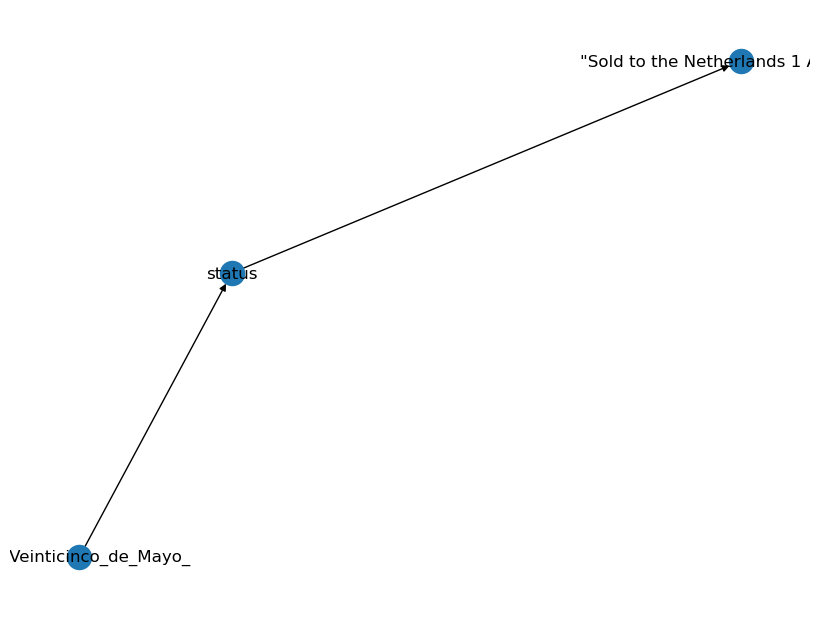

Decoded Input: 
 translate graph to text:  ARA_Veinticinco_de_Mayo_(V-2)  status  "Sold to the Netherlands 1 April 1948"
Decoded Target: 
 The ARA Veinticinco de Mayo (V-2) was sold to the Netherlands on the 1st of April 1948.
DataBatch(x=[1, 512], edge_index=[2, 2], attention_mask=[1, 512], y=[1, 512], batch=[512], ptr=[2])
Original Sample: 
 translate graph to text: <H> Abarth_1000_GT_Coupé  <R>  engine  <T>  Abarth_1000_GT_Coupé__1 
 The Abarth 1000 GT Coupé has a straight-four engine.
NetworkX Graph: 
 [('Abarth_1000_GT_Coupé', 'engine', 0), ('engine', 'Abarth_1000_GT_Coupé__1', 0)]


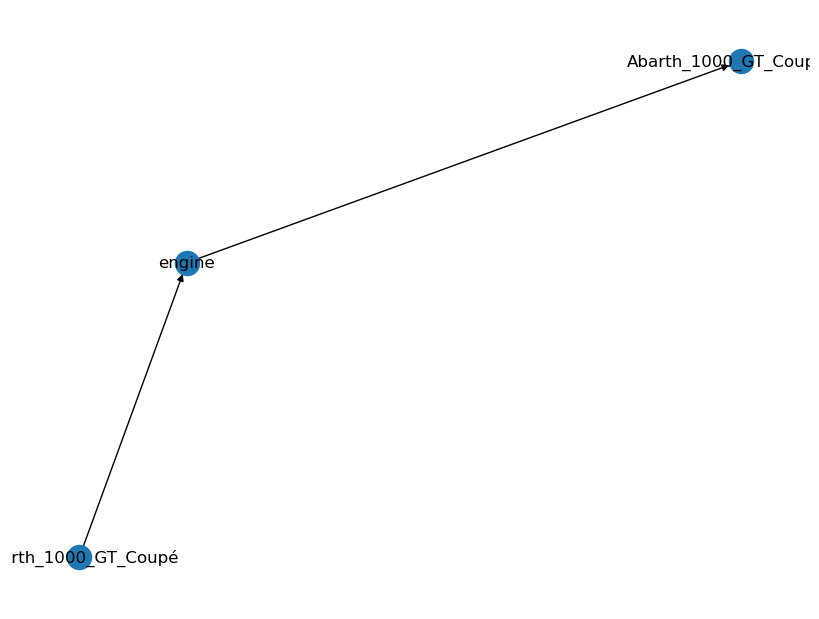

Decoded Input: 
 translate graph to text:  Abarth_1000_GT_Coupé  engine  Abarth_1000_GT_Coupé__1
Decoded Target: 
 The Abarth 1000 GT Coupé has a straight-four engine.
DataBatch(x=[1, 512], edge_index=[2, 2], attention_mask=[1, 512], y=[1, 512], batch=[512], ptr=[2])
Original Sample: 
 translate graph to text: <H> Acura_TLX  <R>  engine  <T>  Honda_K_engine 
 The Acura TLX has a Honda K engine.
NetworkX Graph: 
 [('Acura_TLX', 'engine', 0), ('engine', 'Honda_K_engine', 0)]


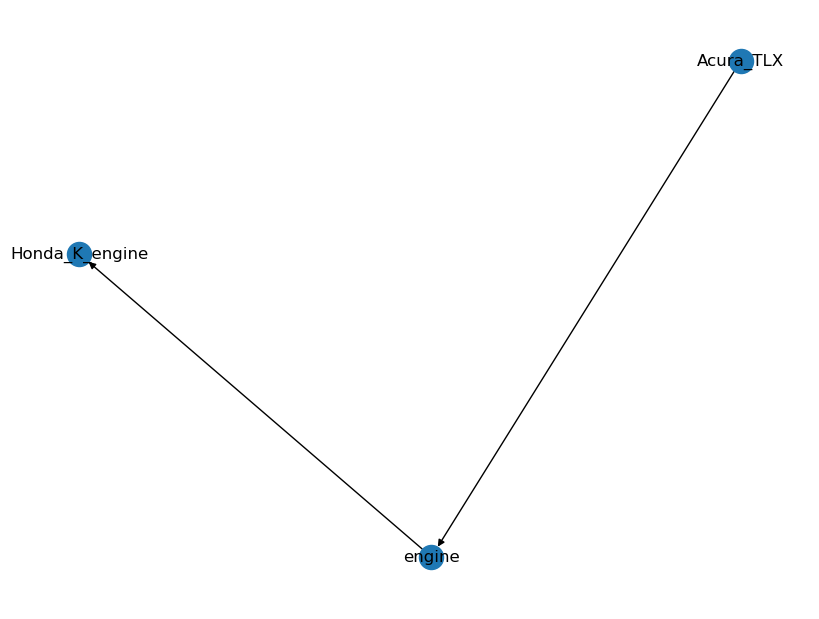

Decoded Input: 
 translate graph to text:  Acura_TLX  engine  Honda_K_engine
Decoded Target: 
 The Acura TLX has a Honda K engine.
DataBatch(x=[1, 512], edge_index=[2, 2], attention_mask=[1, 512], y=[1, 512], batch=[512], ptr=[2])
Original Sample: 
 translate graph to text: <H> Acura_TLX  <R>  layout  <T>  AWD_(vehicle) 
 The Acura TLX has an AWD vehicle layout.
NetworkX Graph: 
 [('Acura_TLX', 'layout', 0), ('layout', 'AWD_', 0)]


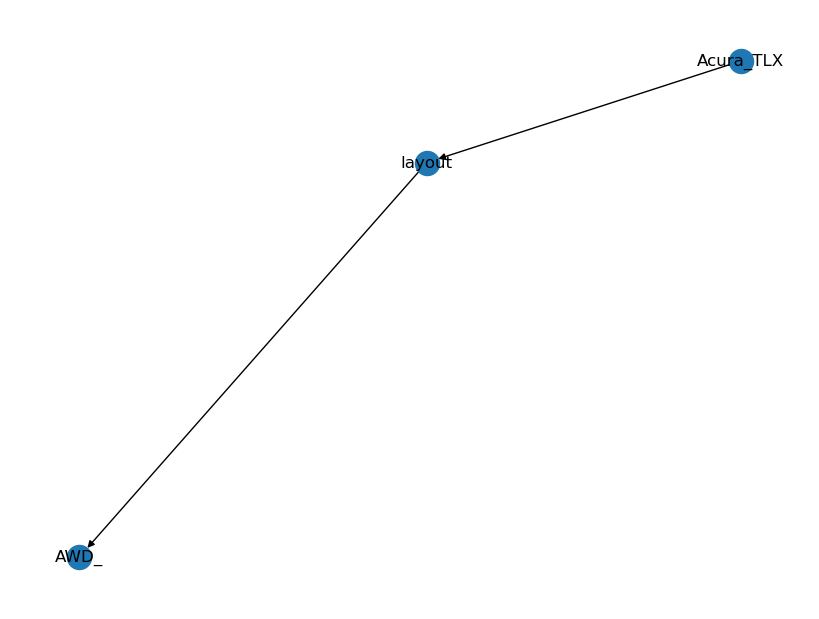

Decoded Input: 
 translate graph to text:  Acura_TLX  layout  AWD_(vehicle)
Decoded Target: 
 The Acura TLX has an AWD vehicle layout.
DataBatch(x=[1, 512], edge_index=[2, 2], attention_mask=[1, 512], y=[1, 512], batch=[512], ptr=[2])
Original Sample: 
 translate graph to text: <H> Acura_TLX  <R>  relatedMeanOfTransportation  <T>  Honda_Accord 
 The Acura TLX is related to the Honda Accord.
NetworkX Graph: 
 [('Acura_TLX', 'relatedMeanOfTransportation', 0), ('relatedMeanOfTransportation', 'Honda_Accord', 0)]


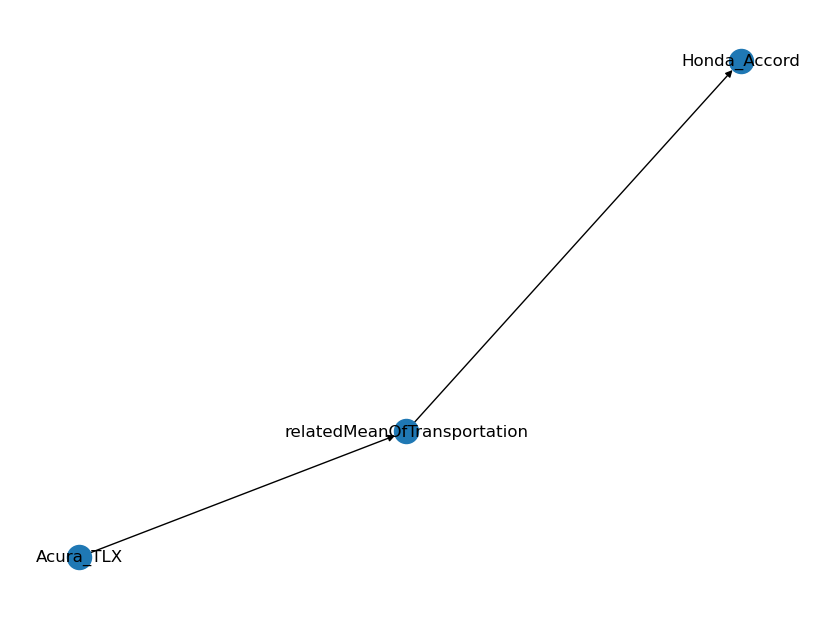

Decoded Input: 
 translate graph to text:  Acura_TLX  relatedMeanOfTransportation  Honda_Accord
Decoded Target: 
 The Acura TLX is related to the Honda Accord.
DataBatch(x=[1, 512], edge_index=[2, 2], attention_mask=[1, 512], y=[1, 512], batch=[512], ptr=[2])
Original Sample: 
 translate graph to text: <H> Acura_TLX  <R>  transmission  <T>  "9-speedZF9HPautomatic(V6)" 
 The transmission of the Acura TLX is a 9-speed ZF 9HP automatic (V6).
NetworkX Graph: 
 [('Acura_TLX', 'transmission', 0), ('transmission', '"9-speedZF9HPautomatic"', 0)]


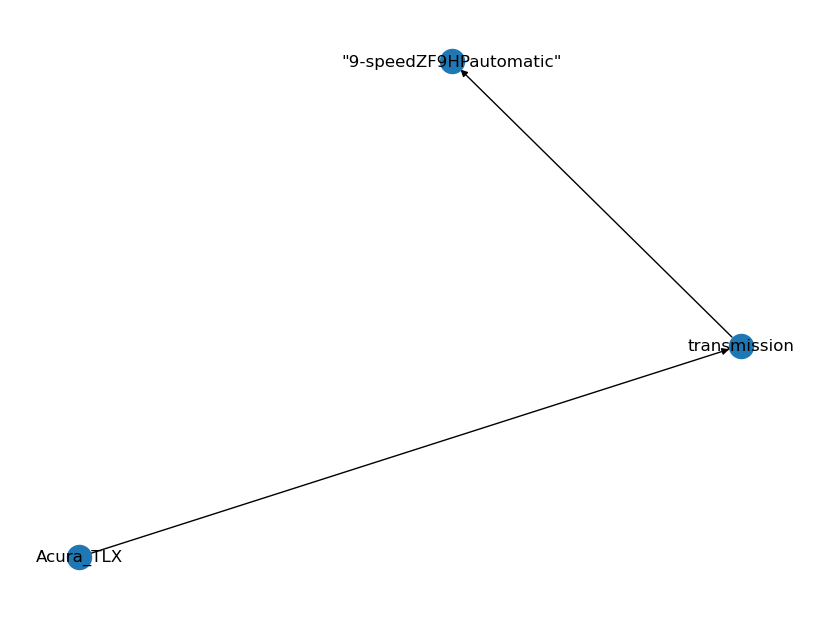

Decoded Input: 
 translate graph to text:  Acura_TLX  transmission  "9-speedZF9HPautomatic(V6)"
Decoded Target: 
 The transmission of the Acura TLX is a 9-speed ZF 9HP automatic (V6).
DataBatch(x=[1, 512], edge_index=[2, 2], attention_mask=[1, 512], y=[1, 512], batch=[512], ptr=[2])
Original Sample: 
 translate graph to text: <H> Alfa_Romeo_164  <R>  assembly  <T>  Arese 
 The Alfa Romeo 164 was assembled in Arese.
NetworkX Graph: 
 [('Alfa_Romeo_164', 'assembly', 0), ('assembly', 'Arese', 0)]


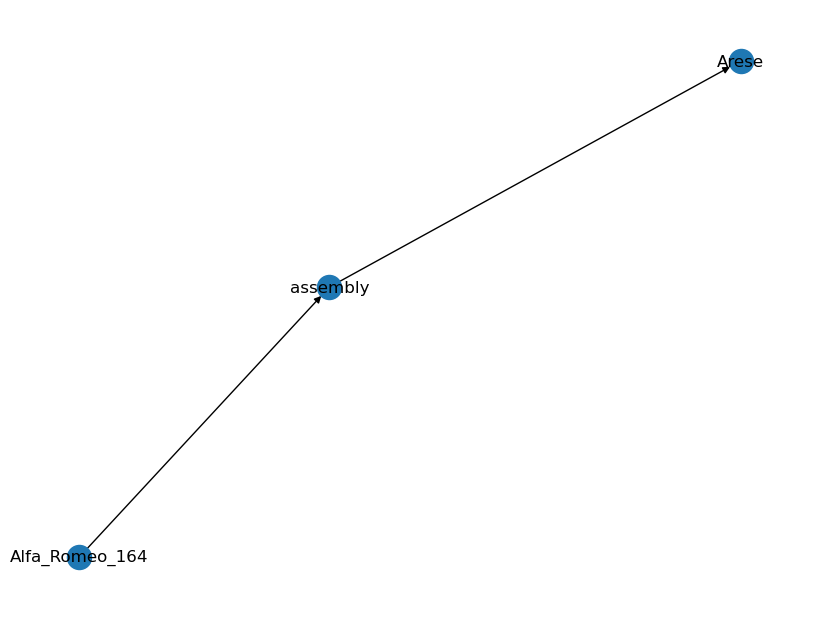

Decoded Input: 
 translate graph to text:  Alfa_Romeo_164  assembly  Arese
Decoded Target: 
 The Alfa Romeo 164 was assembled in Arese.
DataBatch(x=[1, 512], edge_index=[2, 2], attention_mask=[1, 512], y=[1, 512], batch=[512], ptr=[2])
Original Sample: 
 translate graph to text: <H> Alfa_Romeo_164  <R>  relatedMeanOfTransportation  <T>  Lancia_Thema 
 Alfa Romeo 164 and Lancia Thema are related types of transportation.
NetworkX Graph: 
 [('Alfa_Romeo_164', 'relatedMeanOfTransportation', 0), ('relatedMeanOfTransportation', 'Lancia_Thema', 0)]


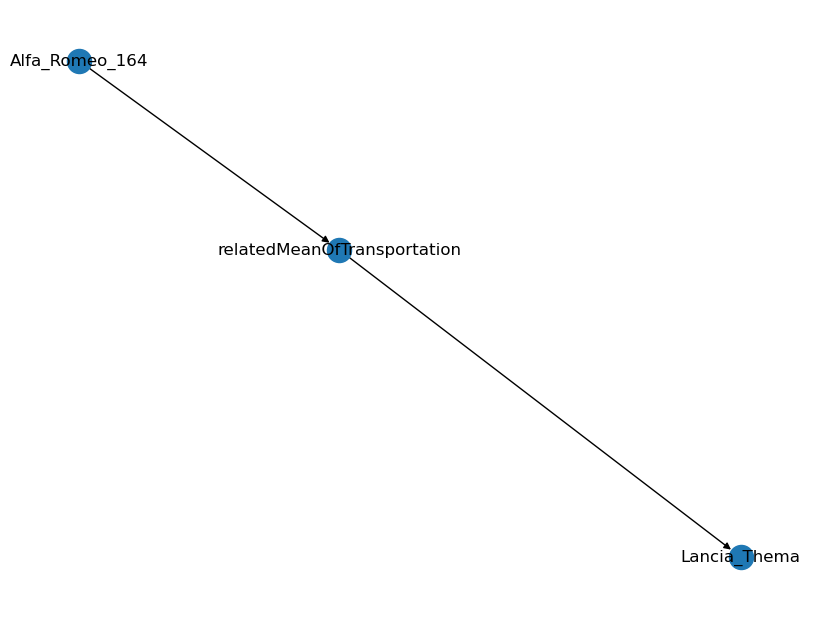

Decoded Input: 
 translate graph to text:  Alfa_Romeo_164  relatedMeanOfTransportation  Lancia_Thema
Decoded Target: 
 Alfa Romeo 164 and Lancia Thema are related types of transportation.
DataBatch(x=[1, 512], edge_index=[2, 2], attention_mask=[1, 512], y=[1, 512], batch=[512], ptr=[2])
Original Sample: 
 translate graph to text: <H> Alfa_Romeo_164  <R>  transmission  <T>  "4-speedautomatic(ZF 4HP18QE)" 
 The Alfa Romeo 164 has a 4-speed automatic (ZF 4HP18QE) transmission.
NetworkX Graph: 
 [('Alfa_Romeo_164', 'transmission', 0), ('transmission', '"4-speedautomatic"', 0)]


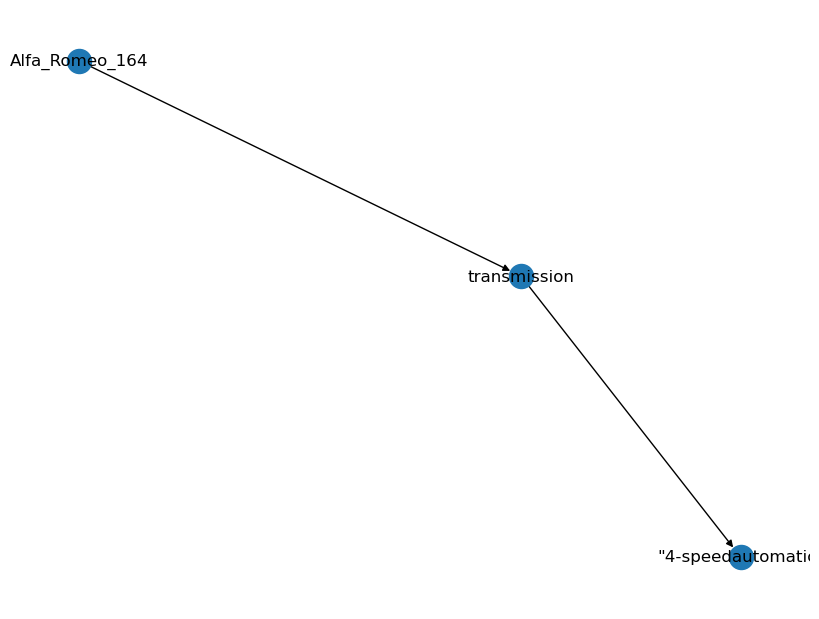

Decoded Input: 
 translate graph to text:  Alfa_Romeo_164  transmission  "4-speedautomatic(ZF 4HP18QE)"
Decoded Target: 
 The Alfa Romeo 164 has a 4-speed automatic (ZF 4HP18QE) transmission.
DataBatch(x=[1, 512], edge_index=[2, 2], attention_mask=[1, 512], y=[1, 512], batch=[512], ptr=[2])
Original Sample: 
 translate graph to text: <H> Alhambra_(1855)  <R>  builder  <T>  Samuda_Brothers 
 The Alhambra was built by the Samuda Brothers.
NetworkX Graph: 
 [('Alhambra_', 'builder', 0), ('builder', 'Samuda_Brothers', 0)]


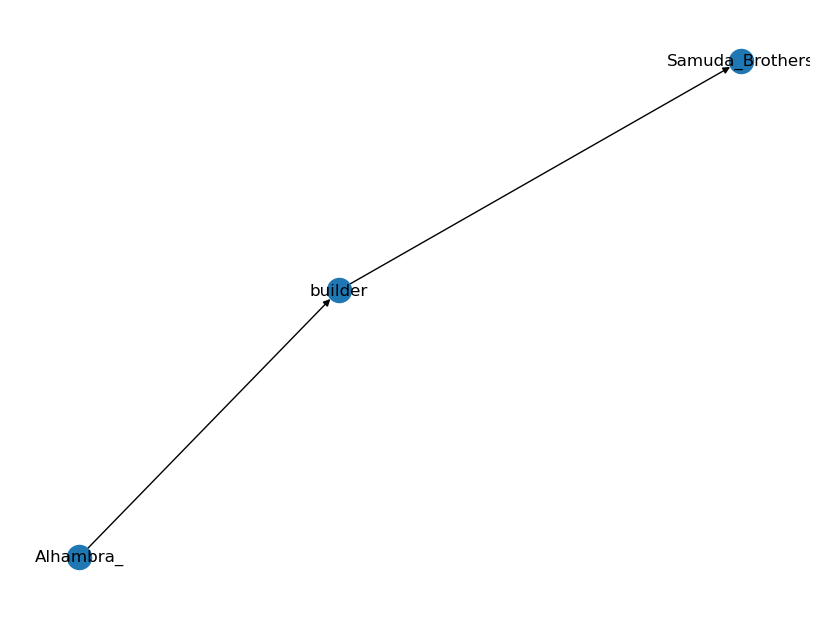

Decoded Input: 
 translate graph to text:  Alhambra_(1855)  builder  Samuda_Brothers
Decoded Target: 
 The Alhambra was built by the Samuda Brothers.
DataBatch(x=[1, 512], edge_index=[2, 2], attention_mask=[1, 512], y=[1, 512], batch=[512], ptr=[2])
Original Sample: 
 translate graph to text: <H> Alhambra_(1855)  <R>  shipBeam  <T>  "8.3 m"@en 
 The Alhambra ship beam is 8.3m.
NetworkX Graph: 
 [('Alhambra_', 'shipBeam', 0), ('shipBeam', '"8.3 m"@en', 0)]


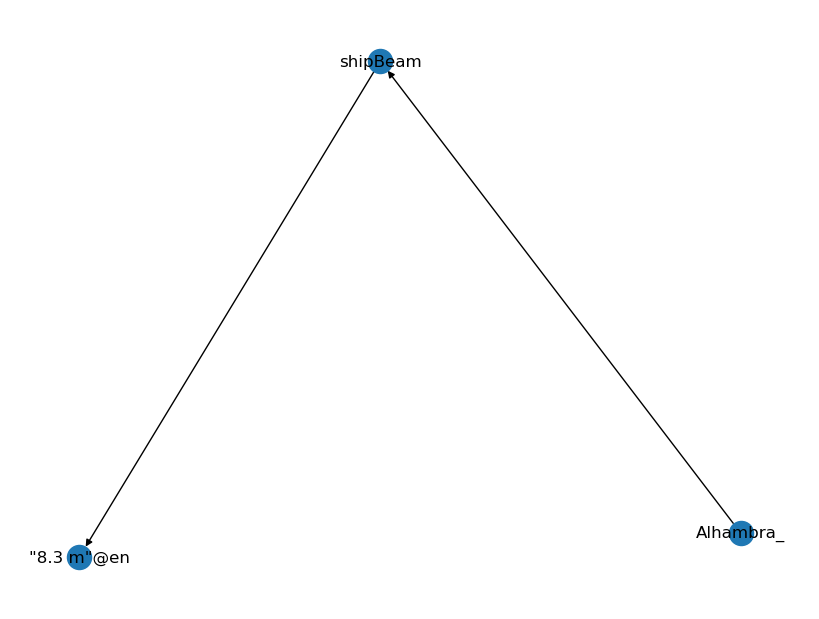

Decoded Input: 
 translate graph to text:  Alhambra_(1855)  shipBeam  "8.3 m"@en
Decoded Target: 
 The Alhambra ship beam is 8.3m.
DataBatch(x=[1, 512], edge_index=[2, 2], attention_mask=[1, 512], y=[1, 512], batch=[512], ptr=[2])
Original Sample: 
 translate graph to text: <H> Alhambra_(1855)  <R>  status  <T>  "Wrecked" 
 The Alhambra had wrecked.
NetworkX Graph: 
 [('Alhambra_', 'status', 0), ('status', '"Wrecked"', 0)]


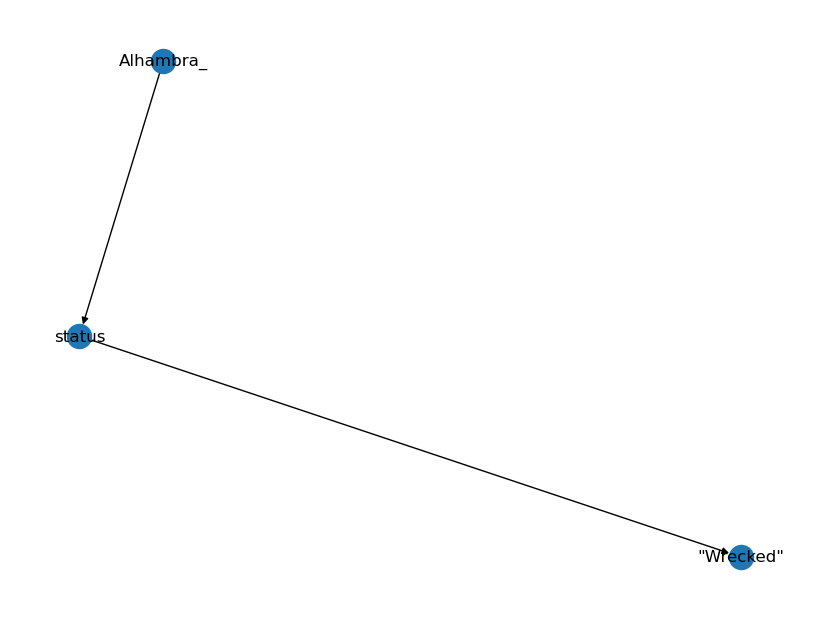

Decoded Input: 
 translate graph to text:  Alhambra_(1855)  status  "Wrecked"
Decoded Target: 
 The Alhambra had wrecked.
DataBatch(x=[1, 512], edge_index=[2, 2], attention_mask=[1, 512], y=[1, 512], batch=[512], ptr=[2])
Original Sample: 
 translate graph to text: <H> Alhambra_(1855)  <R>  topSpeed  <T>  "18.52"^^xsd:double 
 The Alhambra had a top speed of 18.52 km/h.
NetworkX Graph: 
 [('Alhambra_', 'topSpeed', 0), ('topSpeed', '"18.52"^^xsd:double', 0)]


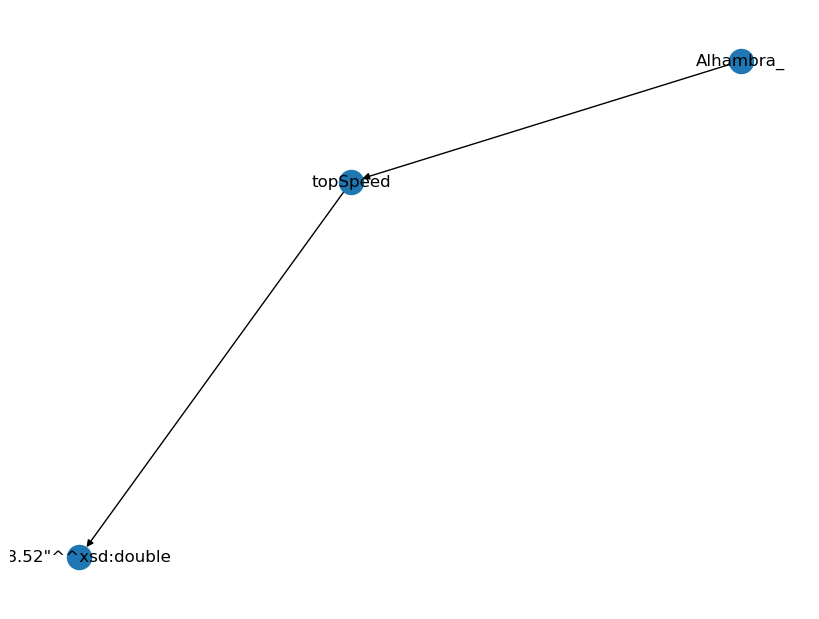

Decoded Input: 
 translate graph to text:  Alhambra_(1855)  topSpeed  "18.52"xsd:double
Decoded Target: 
 The Alhambra had a top speed of 18.52 km/h.
DataBatch(x=[1, 512], edge_index=[2, 2], attention_mask=[1, 512], y=[1, 512], batch=[512], ptr=[2])
Original Sample: 
 translate graph to text: <H> Alvis_Speed_25  <R>  engine  <T>  Alvis_Speed_25__6 
 Alvis Speed 25 has a straight-six engine.
NetworkX Graph: 
 [('Alvis_Speed_25', 'engine', 0), ('engine', 'Alvis_Speed_25__6', 0)]


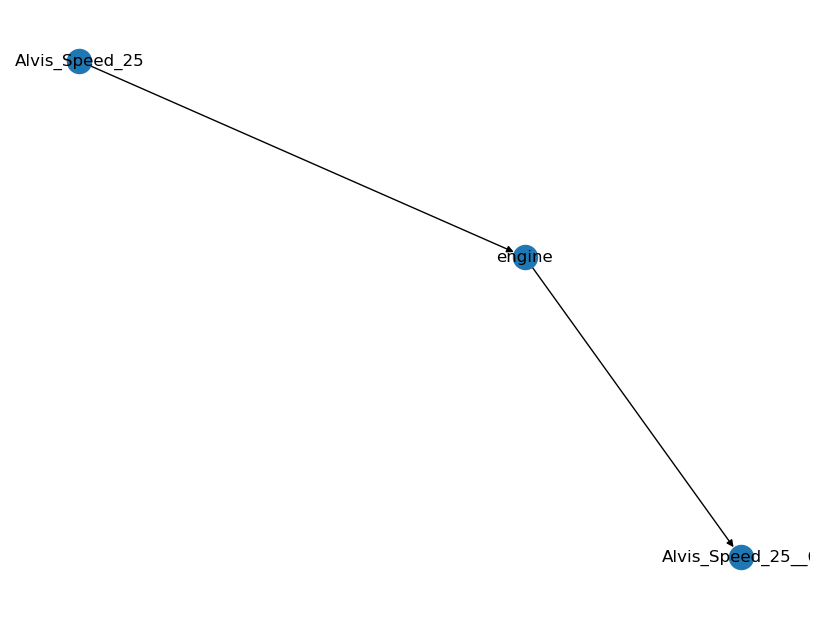

Decoded Input: 
 translate graph to text:  Alvis_Speed_25  engine  Alvis_Speed_25__6
Decoded Target: 
 Alvis Speed 25 has a straight-six engine.
DataBatch(x=[1, 512], edge_index=[2, 2], attention_mask=[1, 512], y=[1, 512], batch=[512], ptr=[2])
Original Sample: 
 translate graph to text: <H> Alvis_Speed_25  <R>  modelStartYear  <T>  "1937"^^xsd:gYear 
 Production, of the Alvis Speed 25, began in 1937.
NetworkX Graph: 
 [('Alvis_Speed_25', 'modelStartYear', 0), ('modelStartYear', '"1937"^^xsd:gYear', 0)]


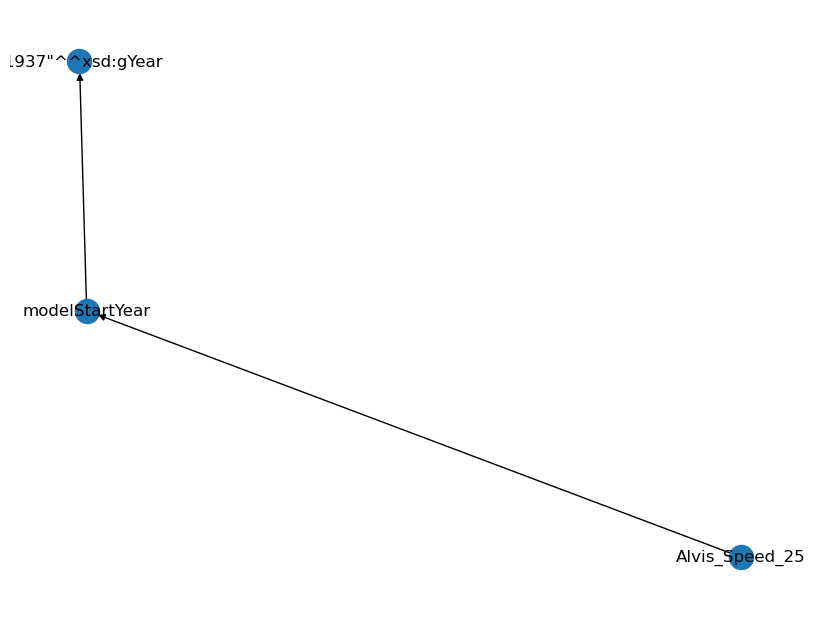

Decoded Input: 
 translate graph to text:  Alvis_Speed_25  modelStartYear  "1937"xsd:gYear
Decoded Target: 
 Production, of the Alvis Speed 25, began in 1937.
DataBatch(x=[1, 512], edge_index=[2, 2], attention_mask=[1, 512], y=[1, 512], batch=[512], ptr=[2])
Original Sample: 
 translate graph to text: <H> American_submarine_NR-1  <R>  shipDraft  <T>  "*\n*Box keel depth :"@en 
 The American submarine NR-1 has a ship draft of 4.6m.
NetworkX Graph: 
 [('American_submarine_NR-1', 'shipDraft', 0), ('shipDraft', '"*\\n*Box keel depth :"@en', 0)]


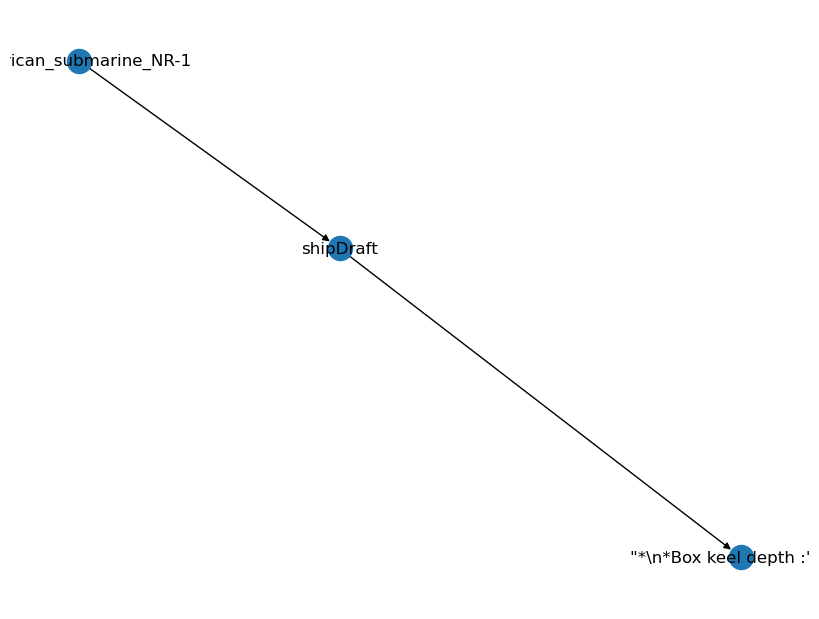

Decoded Input: 
 translate graph to text:  American_submarine_NR-1  shipDraft  "*n*Box keel depth :"@en
Decoded Target: 
 The American submarine NR-1 has a ship draft of 4.6m.
DataBatch(x=[1, 512], edge_index=[2, 2], attention_mask=[1, 512], y=[1, 512], batch=[512], ptr=[2])
Original Sample: 
 translate graph to text: <H> Antares_(rocket)  <R>  finalFlight  <T>  "2014-10-28"^^xsd:date 
 The Antares rocket's final flight was on the 28th October 2014.
NetworkX Graph: 
 [('Antares_', 'finalFlight', 0), ('finalFlight', '"2014-10-28"^^xsd:date', 0)]


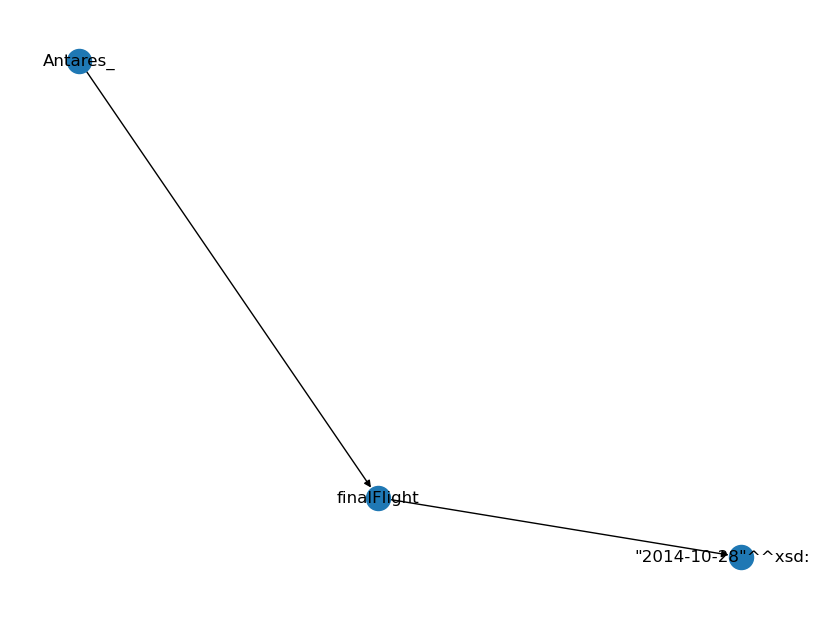

Decoded Input: 
 translate graph to text:  Antares_(rocket)  finalFlight  "2014-10-28"xsd:date
Decoded Target: 
 The Antares rocket's final flight was on the 28th October 2014.
DataBatch(x=[1, 512], edge_index=[2, 2], attention_mask=[1, 512], y=[1, 512], batch=[512], ptr=[2])
Original Sample: 
 translate graph to text: <H> Antares_(rocket)  <R>  sites  <T>  Mid-Atlantic_Regional_Spaceport_Launch_Pad_0 
 The Antares rocket was launched at the Mid-Atlantic Regional Spaceport Launch Pad 0.
NetworkX Graph: 
 [('Antares_', 'sites', 0), ('sites', 'Mid-Atlantic_Regional_Spaceport_Launch_Pad_0', 0)]


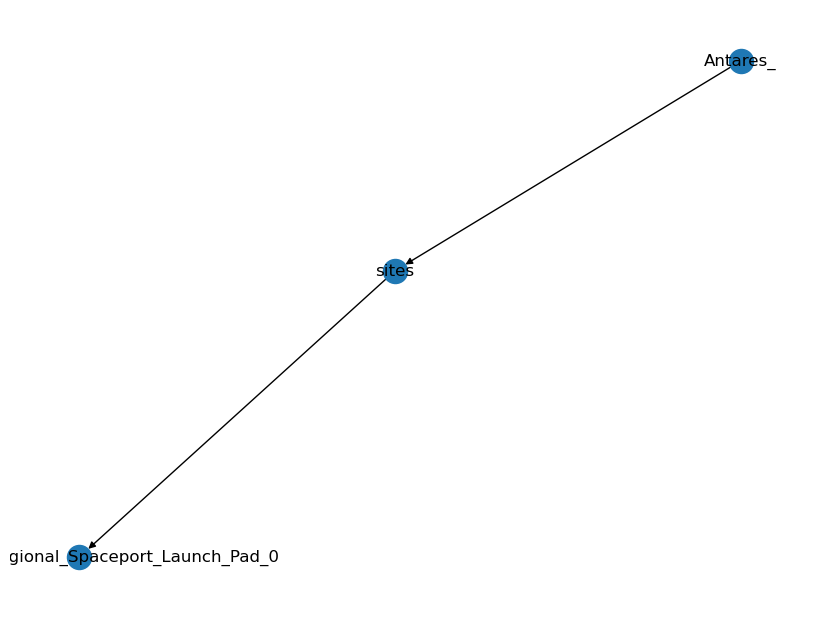

Decoded Input: 
 translate graph to text:  Antares_(rocket)  sites  Mid-Atlantic_Regional_Spaceport_Launch_Pad_0
Decoded Target: 
 The Antares rocket was launched at the Mid-Atlantic Regional Spaceport Launch Pad 0.
DataBatch(x=[1, 512], edge_index=[2, 2], attention_mask=[1, 512], y=[1, 512], batch=[512], ptr=[2])
Original Sample: 
 translate graph to text: <H> Argentina  <R>  leader  <T>  Gabriela_Michetti 
 Gabriela Michetti is the leader of Argentina.
NetworkX Graph: 
 [('Argentina', 'leader', 0), ('leader', 'Gabriela_Michetti', 0)]


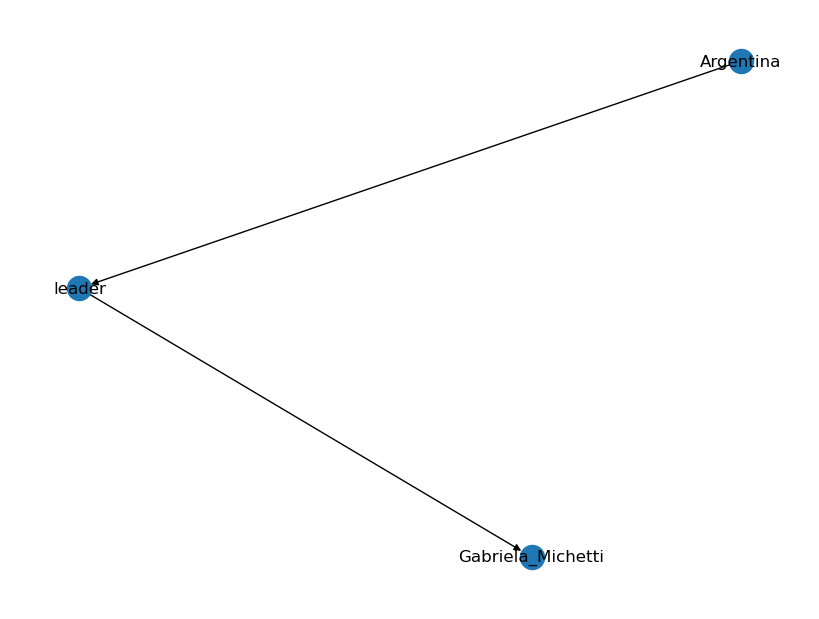

Decoded Input: 
 translate graph to text:  Argentina  leader  Gabriela_Michetti
Decoded Target: 
 Gabriela Michetti is the leader of Argentina.
DataBatch(x=[1, 512], edge_index=[2, 2], attention_mask=[1, 512], y=[1, 512], batch=[512], ptr=[2])
Original Sample: 
 translate graph to text: <H> Ariane_5  <R>  sites  <T>  Guiana_Space_Centre 
 Guiana Space Centre was the launch site of the Ariane 5.
NetworkX Graph: 
 [('Ariane_5', 'sites', 0), ('sites', 'Guiana_Space_Centre', 0)]


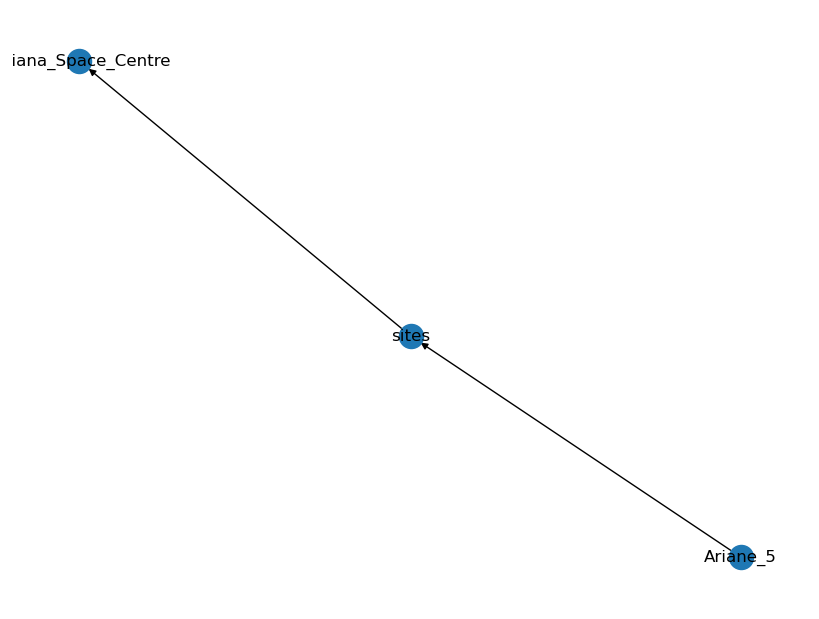

Decoded Input: 
 translate graph to text:  Ariane_5  sites  Guiana_Space_Centre
Decoded Target: 
 Guiana Space Centre was the launch site of the Ariane 5.
DataBatch(x=[1, 512], edge_index=[2, 2], attention_mask=[1, 512], y=[1, 512], batch=[512], ptr=[2])
Original Sample: 
 translate graph to text: <H> Ariane_5  <R>  maidenFlight  <T>  "2005-08-11"^^xsd:date 
 The Ariane 5 had its first voyage August 11, 2005.
NetworkX Graph: 
 [('Ariane_5', 'maidenFlight', 0), ('maidenFlight', '"2005-08-11"^^xsd:date', 0)]


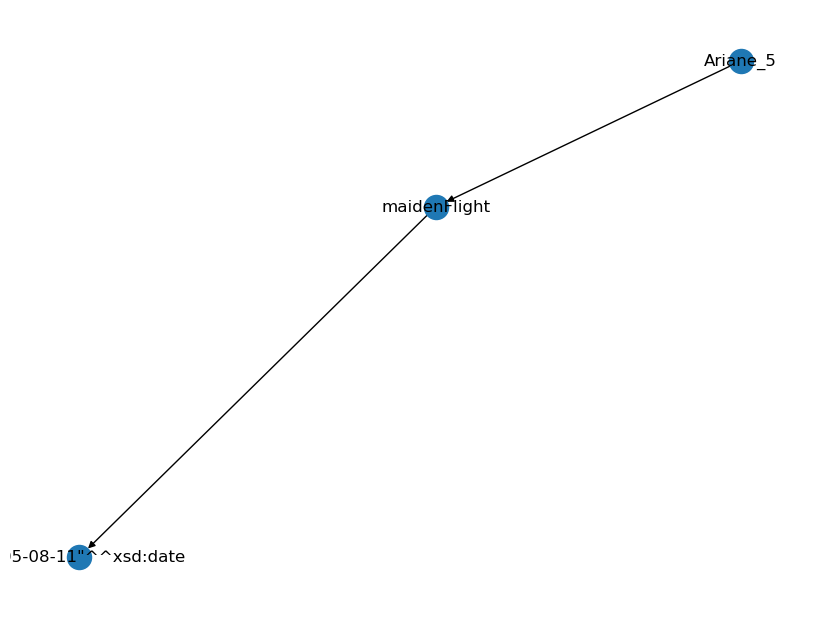

Decoded Input: 
 translate graph to text:  Ariane_5  maidenFlight  "2005-08-11"xsd:date
Decoded Target: 
 The Ariane 5 had its first voyage August 11, 2005.
DataBatch(x=[1, 512], edge_index=[2, 2], attention_mask=[1, 512], y=[1, 512], batch=[512], ptr=[2])
Original Sample: 
 translate graph to text: <H> Aston_Martin_V8  <R>  bodyStyle  <T>  Convertible 
 The Aston Martin V8 is a convertible.
NetworkX Graph: 
 [('Aston_Martin_V8', 'bodyStyle', 0), ('bodyStyle', 'Convertible', 0)]


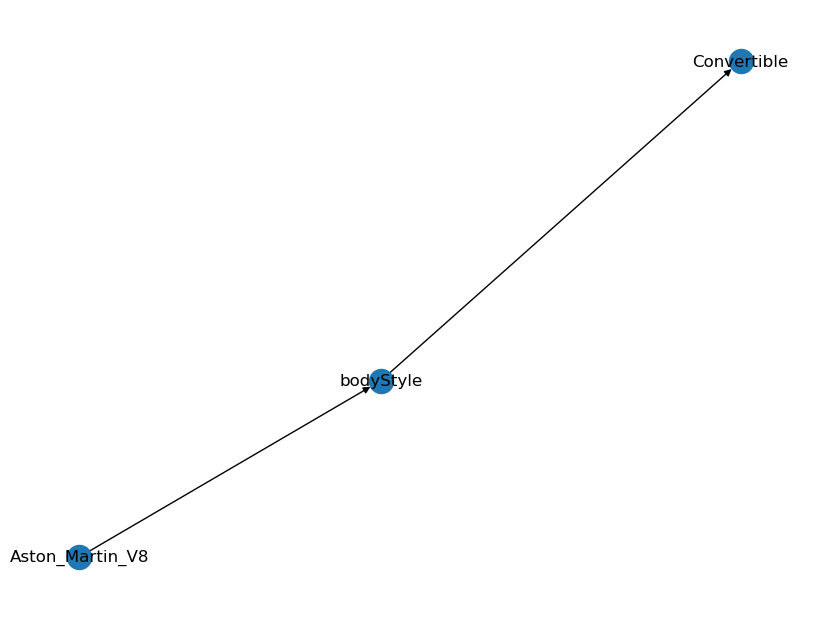

Decoded Input: 
 translate graph to text:  Aston_Martin_V8  bodyStyle  Convertible
Decoded Target: 
 The Aston Martin V8 is a convertible.
DataBatch(x=[1, 512], edge_index=[2, 2], attention_mask=[1, 512], y=[1, 512], batch=[512], ptr=[2])
Original Sample: 
 translate graph to text: <H> Aston_Martin_V8  <R>  manufacturer  <T>  Aston_Martin 
 The manufacturer of the Aston Martin V8 is the Aston Martin.
NetworkX Graph: 
 [('Aston_Martin_V8', 'manufacturer', 0), ('manufacturer', 'Aston_Martin', 0)]


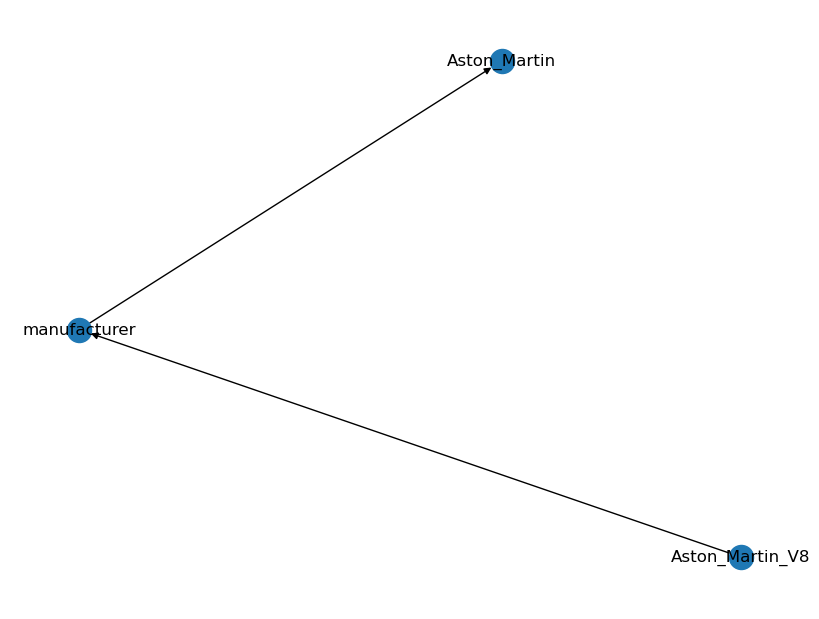

Decoded Input: 
 translate graph to text:  Aston_Martin_V8  manufacturer  Aston_Martin
Decoded Target: 
 The manufacturer of the Aston Martin V8 is the Aston Martin.
DataBatch(x=[1, 512], edge_index=[2, 2], attention_mask=[1, 512], y=[1, 512], batch=[512], ptr=[2])
Original Sample: 
 translate graph to text: <H> Aston_Martin_Virage  <R>  manufacturer  <T>  Aston_Martin 
 The Aston Martin Virage is made by the company Aston Martin.
NetworkX Graph: 
 [('Aston_Martin_Virage', 'manufacturer', 0), ('manufacturer', 'Aston_Martin', 0)]


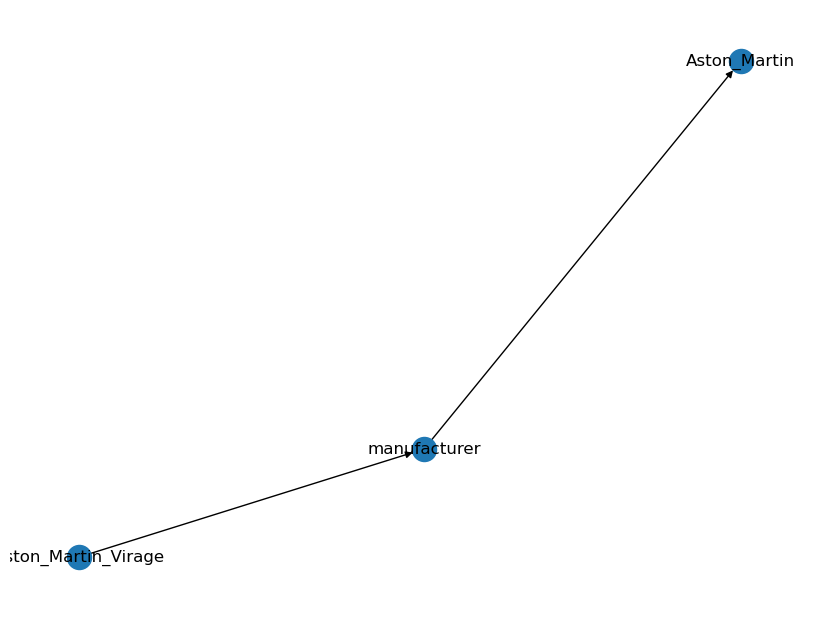

Decoded Input: 
 translate graph to text:  Aston_Martin_Virage  manufacturer  Aston_Martin
Decoded Target: 
 The Aston Martin Virage is made by the company Aston Martin.
DataBatch(x=[1, 512], edge_index=[2, 2], attention_mask=[1, 512], y=[1, 512], batch=[512], ptr=[2])
Original Sample: 
 translate graph to text: <H> Atlas_II  <R>  finalFlight  <T>  "1998-03-16"^^xsd:date 
 Atlas II had its final flight on March 16th 1998.
NetworkX Graph: 
 [('Atlas_II', 'finalFlight', 0), ('finalFlight', '"1998-03-16"^^xsd:date', 0)]


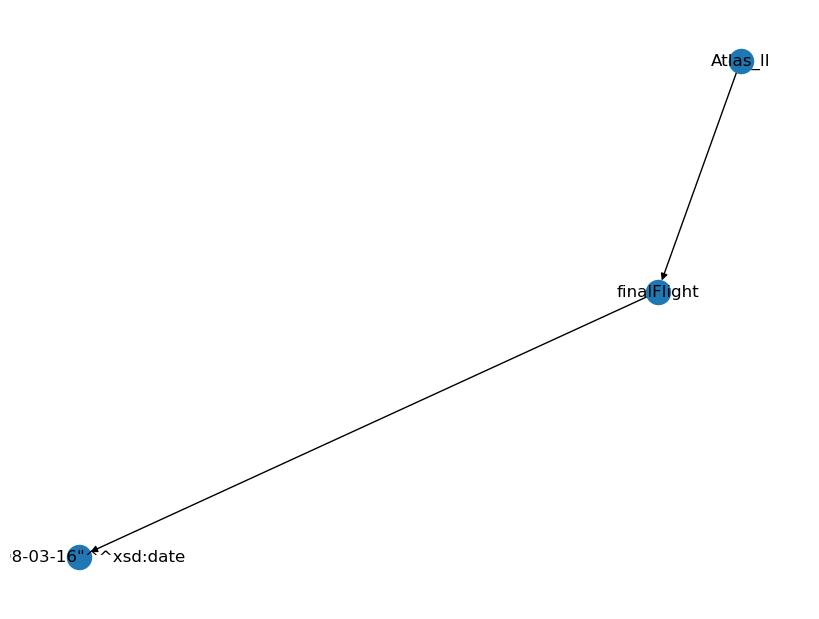

Decoded Input: 
 translate graph to text:  Atlas_II  finalFlight  "1998-03-16"xsd:date
Decoded Target: 
 Atlas II had its final flight on March 16th 1998.
DataBatch(x=[1, 512], edge_index=[2, 2], attention_mask=[1, 512], y=[1, 512], batch=[512], ptr=[2])
Original Sample: 
 translate graph to text: <H> Atlas_II  <R>  sites  <T>  Vandenberg_Air_Force_Base 
 Atlas II was launched from Vandenberg Air Force Base.
NetworkX Graph: 
 [('Atlas_II', 'sites', 0), ('sites', 'Vandenberg_Air_Force_Base', 0)]


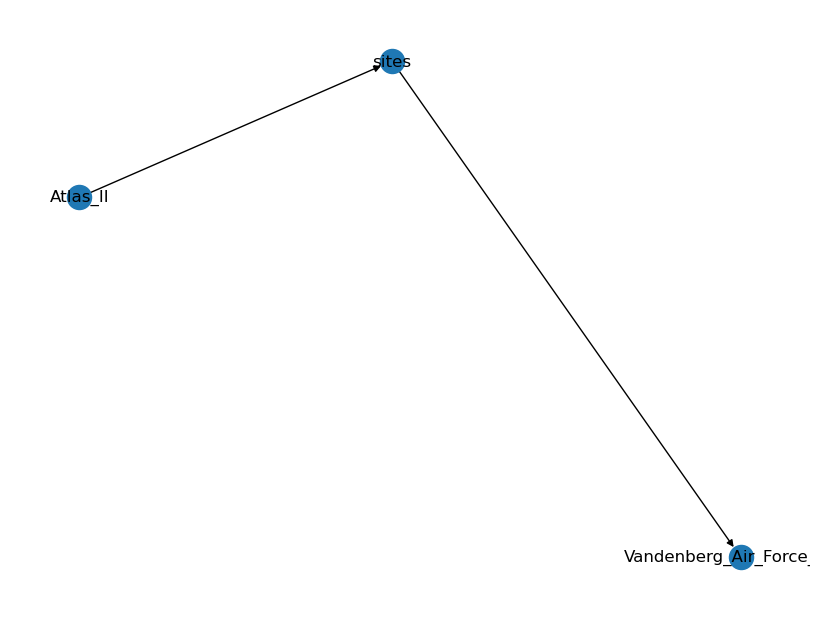

Decoded Input: 
 translate graph to text:  Atlas_II  sites  Vandenberg_Air_Force_Base
Decoded Target: 
 Atlas II was launched from Vandenberg Air Force Base.
DataBatch(x=[1, 512], edge_index=[2, 2], attention_mask=[1, 512], y=[1, 512], batch=[512], ptr=[2])
Original Sample: 
 translate graph to text: <H> Audi  <R>  foundedBy  <T>  August_Horch 
 Audi was founded by August Horch.
NetworkX Graph: 
 [('Audi', 'foundedBy', 0), ('foundedBy', 'August_Horch', 0)]


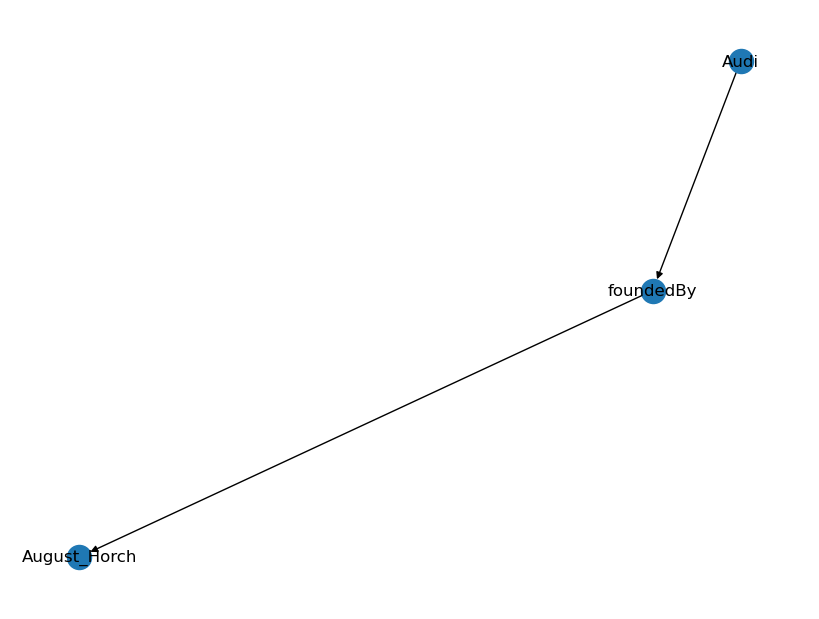

Decoded Input: 
 translate graph to text:  Audi  foundedBy  August_Horch
Decoded Target: 
 Audi was founded by August Horch.
DataBatch(x=[1, 512], edge_index=[2, 2], attention_mask=[1, 512], y=[1, 512], batch=[512], ptr=[2])
Original Sample: 
 translate graph to text: <H> Audi_A1  <R>  assembly  <T>  Audi_Brussels 
 The Audi A1 is assembled by Audi Brussels.
NetworkX Graph: 
 [('Audi_A1', 'assembly', 0), ('assembly', 'Audi_Brussels', 0)]


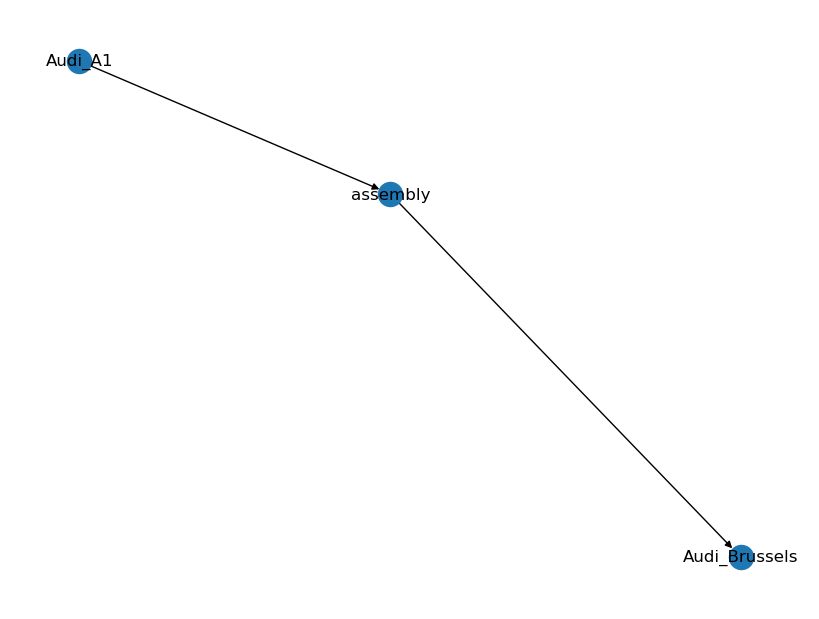

Decoded Input: 
 translate graph to text:  Audi_A1  assembly  Audi_Brussels
Decoded Target: 
 The Audi A1 is assembled by Audi Brussels.
DataBatch(x=[1, 512], edge_index=[2, 2], attention_mask=[1, 512], y=[1, 512], batch=[512], ptr=[2])
Original Sample: 
 translate graph to text: <H> Audi_A1  <R>  related  <T>  "SEAT Ibiza Mk4"@en 
 The Seat Ibiza and the Audi A1 are both cars and therefore a related means of transportation.
NetworkX Graph: 
 [('Audi_A1', 'related', 0), ('related', '"SEAT Ibiza Mk4"@en', 0)]


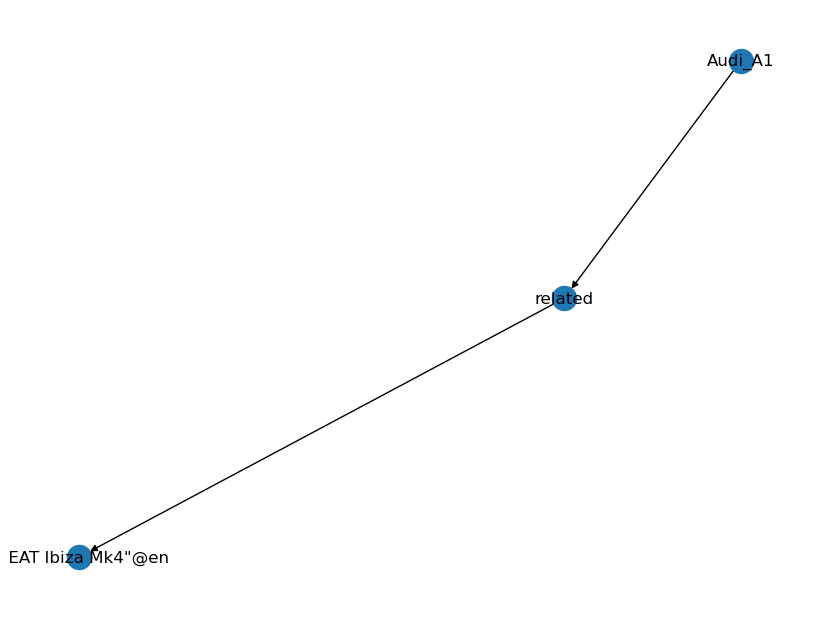

Decoded Input: 
 translate graph to text:  Audi_A1  related  "SEAT Ibiza Mk4"@en
Decoded Target: 
 The Seat Ibiza and the Audi A1 are both cars and therefore a related means of transportation.
DataBatch(x=[1, 512], edge_index=[2, 2], attention_mask=[1, 512], y=[1, 512], batch=[512], ptr=[2])
Original Sample: 
 translate graph to text: <H> Caterpillar_Inc.  <R>  location  <T>  Peoria,_Illinois 
 Caterpillar Inc. is located in Peoria, Illinois.
NetworkX Graph: 
 [('Caterpillar_Inc.', 'location', 0), ('location', 'Peoria,_Illinois', 0)]


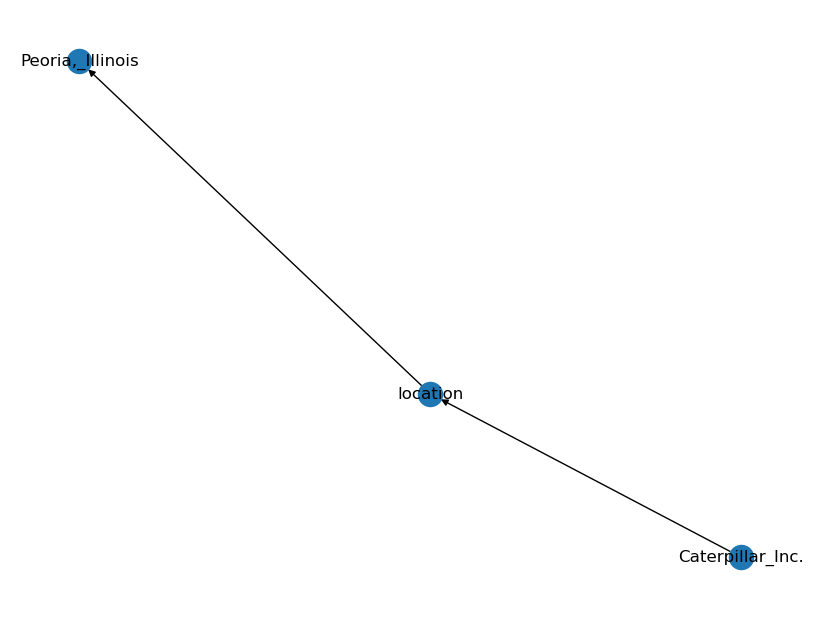

Decoded Input: 
 translate graph to text:  Caterpillar_Inc.  location  Peoria,_Illinois
Decoded Target: 
 Caterpillar Inc. is located in Peoria, Illinois.
DataBatch(x=[1, 512], edge_index=[2, 2], attention_mask=[1, 512], y=[1, 512], batch=[512], ptr=[2])
Original Sample: 
 translate graph to text: <H> Costa_Crociere  <R>  location  <T>  Genoa 
 Costa Crociere is located in Genoa.
NetworkX Graph: 
 [('Costa_Crociere', 'location', 0), ('location', 'Genoa', 0)]


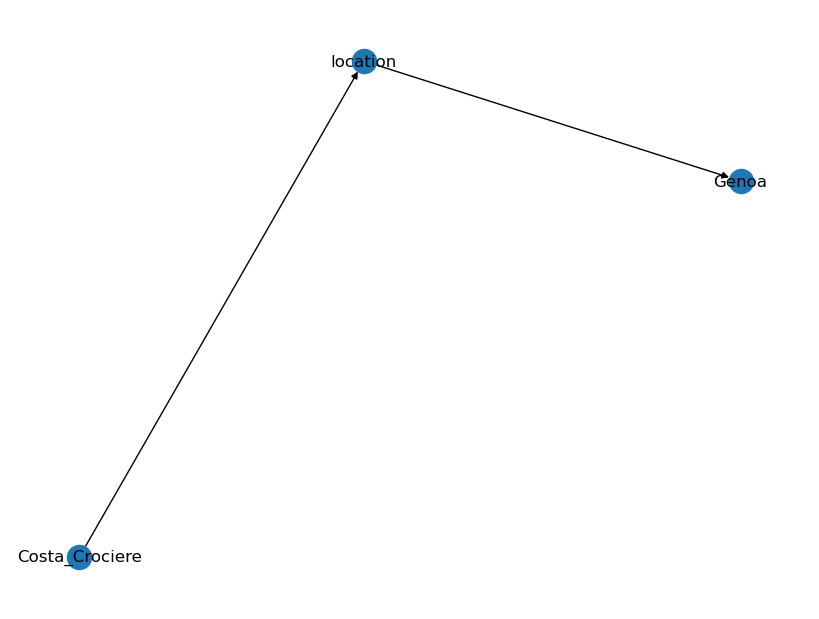

Decoded Input: 
 translate graph to text:  Costa_Crociere  location  Genoa
Decoded Target: 
 Costa Crociere is located in Genoa.
DataBatch(x=[1, 512], edge_index=[2, 2], attention_mask=[1, 512], y=[1, 512], batch=[512], ptr=[2])
Original Sample: 
 translate graph to text: <H> DeSoto_Custom  <R>  relatedMeanOfTransportation  <T>  Chrysler_Newport 
 The DeSoto Custom and Chrysler Newport are related types of transport.
NetworkX Graph: 
 [('DeSoto_Custom', 'relatedMeanOfTransportation', 0), ('relatedMeanOfTransportation', 'Chrysler_Newport', 0)]


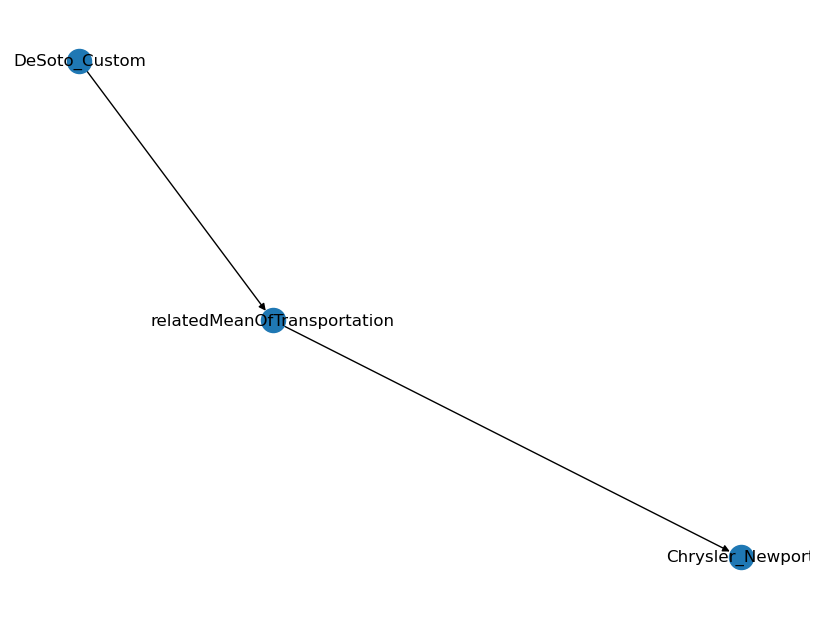

Decoded Input: 
 translate graph to text:  DeSoto_Custom  relatedMeanOfTransportation  Chrysler_Newport
Decoded Target: 
 The DeSoto Custom and Chrysler Newport are related types of transport.
DataBatch(x=[1, 512], edge_index=[2, 2], attention_mask=[1, 512], y=[1, 512], batch=[512], ptr=[2])
Original Sample: 
 translate graph to text: <H> Fiat_Croma  <R>  related  <T>  Alfa_Romeo_164 
 The Fiat Croma is related to the Alfa Romeo 164.
NetworkX Graph: 
 [('Fiat_Croma', 'related', 0), ('related', 'Alfa_Romeo_164', 0)]


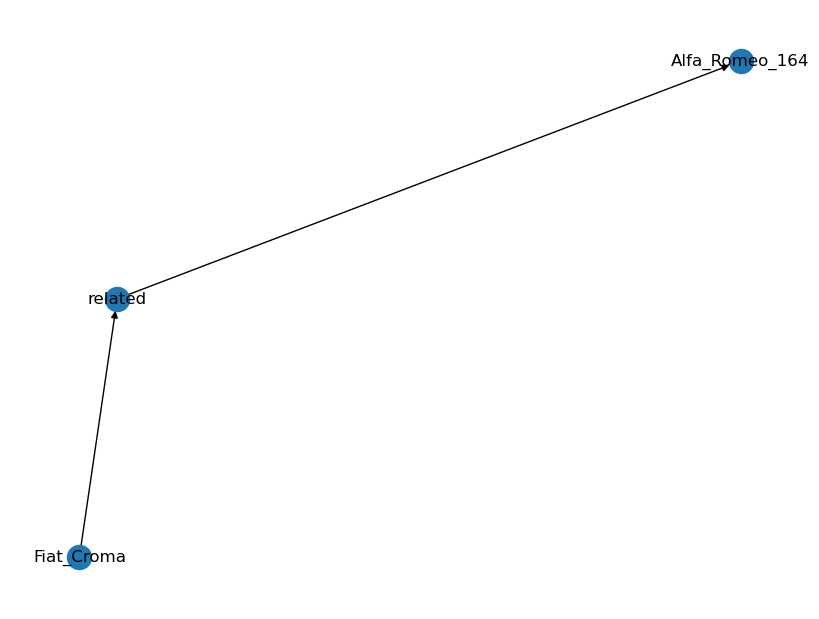

Decoded Input: 
 translate graph to text:  Fiat_Croma  related  Alfa_Romeo_164
Decoded Target: 
 The Fiat Croma is related to the Alfa Romeo 164.
DataBatch(x=[1, 512], edge_index=[2, 2], attention_mask=[1, 512], y=[1, 512], batch=[512], ptr=[2])
Original Sample: 
 translate graph to text: <H> Germany  <R>  demonym  <T>  Germans 
 Germans are the people of Germany.
NetworkX Graph: 
 [('Germany', 'demonym', 0), ('demonym', 'Germans', 0)]


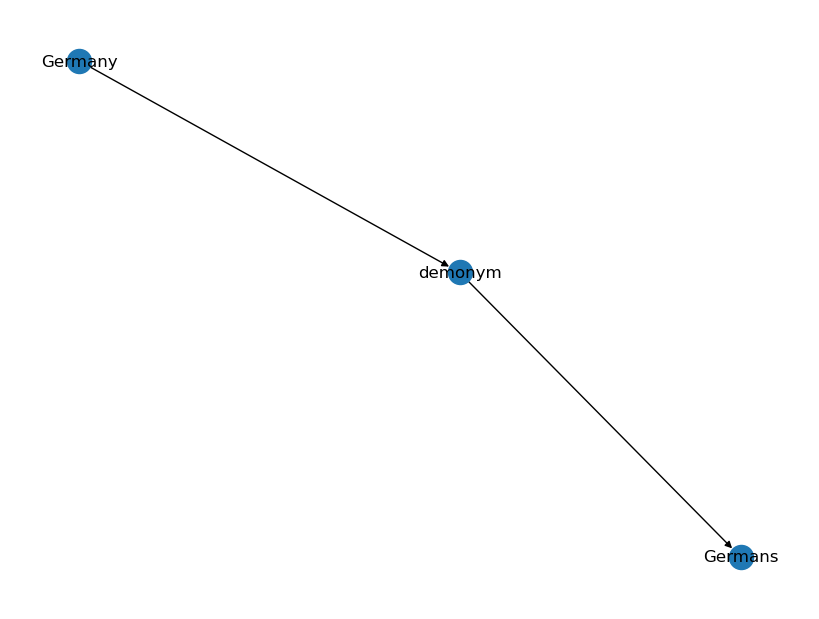

Decoded Input: 
 translate graph to text:  Germany  demonym  Germans
Decoded Target: 
 Germans are the people of Germany.
DataBatch(x=[1, 512], edge_index=[2, 2], attention_mask=[1, 512], y=[1, 512], batch=[512], ptr=[2])
Original Sample: 
 translate graph to text: <H> Germany  <R>  leaderName  <T>  Norbert_Lammert 
 Norbert Lammert is a leader in Germany.
NetworkX Graph: 
 [('Germany', 'leaderName', 0), ('leaderName', 'Norbert_Lammert', 0)]


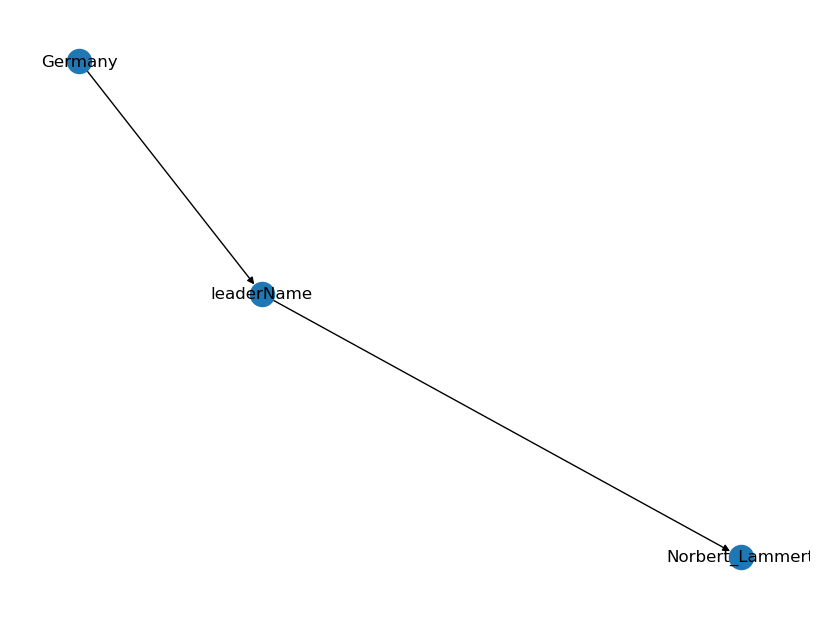

Decoded Input: 
 translate graph to text:  Germany  leaderName  Norbert_Lammert
Decoded Target: 
 Norbert Lammert is a leader in Germany.
DataBatch(x=[1, 512], edge_index=[2, 2], attention_mask=[1, 512], y=[1, 512], batch=[512], ptr=[2])
Original Sample: 
 translate graph to text: <H> Germany  <R>  leader  <T>  Stanislaw_Tillich 
 The leader of Germany is Stanislaw Tillich.
NetworkX Graph: 
 [('Germany', 'leader', 0), ('leader', 'Stanislaw_Tillich', 0)]


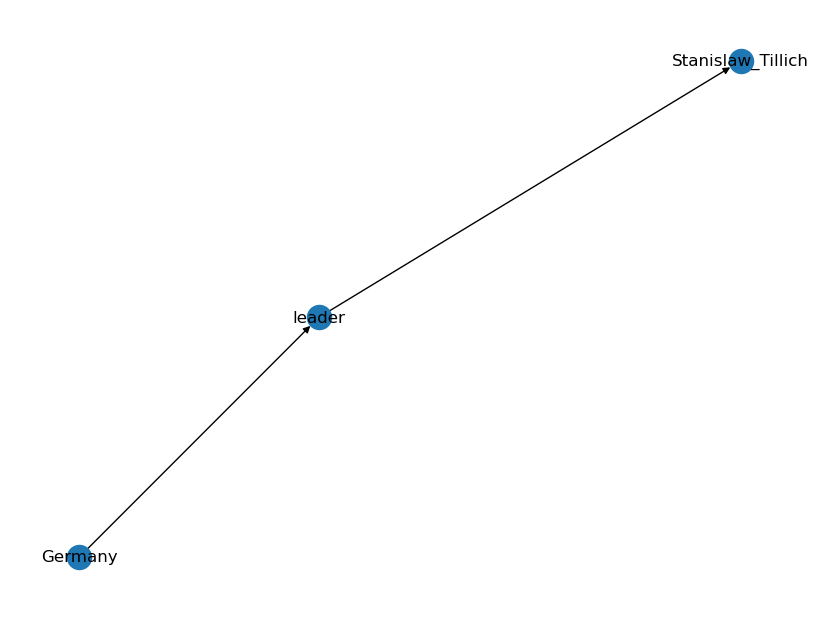

Decoded Input: 
 translate graph to text:  Germany  leader  Stanislaw_Tillich
Decoded Target: 
 The leader of Germany is Stanislaw Tillich.
DataBatch(x=[1, 512], edge_index=[2, 2], attention_mask=[1, 512], y=[1, 512], batch=[512], ptr=[2])
Original Sample: 
 translate graph to text: <H> Gruppo_Bertone  <R>  foundedBy  <T>  Giovanni_Bertone 
 Gruppo Bertone was founded by Giovanni Bertone.
NetworkX Graph: 
 [('Gruppo_Bertone', 'foundedBy', 0), ('foundedBy', 'Giovanni_Bertone', 0)]


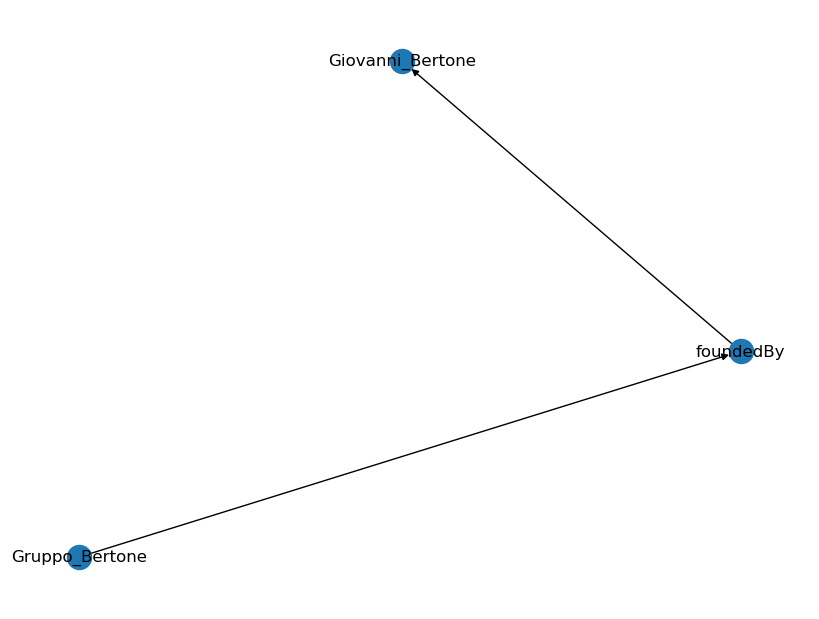

Decoded Input: 
 translate graph to text:  Gruppo_Bertone  foundedBy  Giovanni_Bertone
Decoded Target: 
 Gruppo Bertone was founded by Giovanni Bertone.
DataBatch(x=[1, 512], edge_index=[2, 2], attention_mask=[1, 512], y=[1, 512], batch=[512], ptr=[2])
Original Sample: 
 translate graph to text: <H> Guiana_Space_Centre  <R>  headquarters  <T>  Kourou,_French_Guiana 
 The Guiana Space Centre has its headquarters at Kourou in French Guiana.
NetworkX Graph: 
 [('Guiana_Space_Centre', 'headquarters', 0), ('headquarters', 'Kourou,_French_Guiana', 0)]


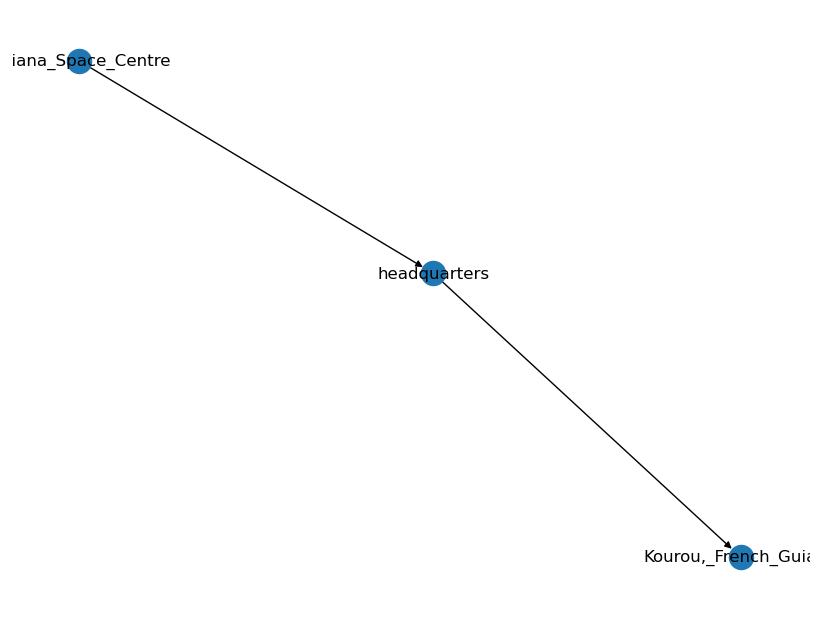

Decoded Input: 
 translate graph to text:  Guiana_Space_Centre  headquarters  Kourou,_French_Guiana
Decoded Target: 
 The Guiana Space Centre has its headquarters at Kourou in French Guiana.
DataBatch(x=[1, 512], edge_index=[2, 2], attention_mask=[1, 512], y=[1, 512], batch=[512], ptr=[2])
Original Sample: 
 translate graph to text: <H> Honda_K_engine  <R>  manufacturer  <T>  Honda 
 The manufacturer of the Honda K engine is Honda.
NetworkX Graph: 
 [('Honda_K_engine', 'manufacturer', 0), ('manufacturer', 'Honda', 0)]


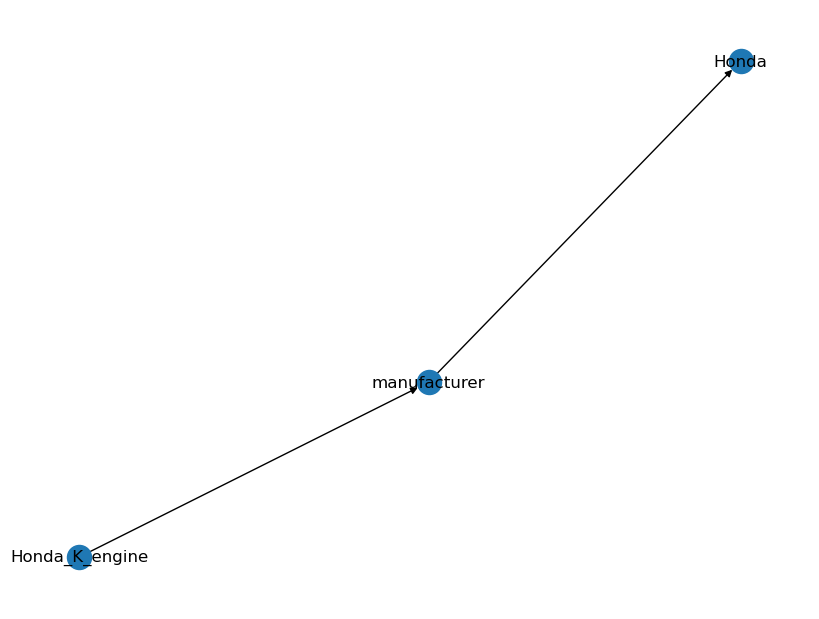

Decoded Input: 
 translate graph to text:  Honda_K_engine  manufacturer  Honda
Decoded Target: 
 The manufacturer of the Honda K engine is Honda.
DataBatch(x=[1, 512], edge_index=[2, 2], attention_mask=[1, 512], y=[1, 512], batch=[512], ptr=[2])
Original Sample: 
 translate graph to text: <H> United_States  <R>  anthem  <T>  The_Star-Spangled_Banner 
 The Star Spangled Banner is the national anthem of the united States.
NetworkX Graph: 
 [('United_States', 'anthem', 0), ('anthem', 'The_Star-Spangled_Banner', 0)]


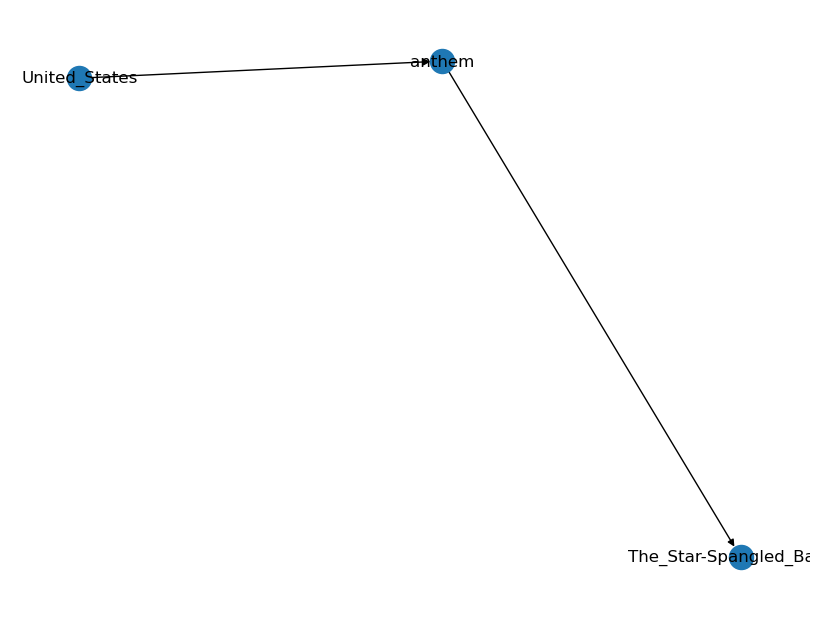

Decoded Input: 
 translate graph to text:  United_States  anthem  The_Star-Spangled_Banner
Decoded Target: 
 The Star Spangled Banner is the national anthem of the united States.
DataBatch(x=[1, 512], edge_index=[2, 2], attention_mask=[1, 512], y=[1, 512], batch=[512], ptr=[2])
Original Sample: 
 translate graph to text: <H> United_States  <R>  ethnicGroup  <T>  Native_Americans_in_the_United_States 
 Native Americans are on of the ethnic groups in the United States.
NetworkX Graph: 
 [('United_States', 'ethnicGroup', 0), ('ethnicGroup', 'Native_Americans_in_the_United_States', 0)]


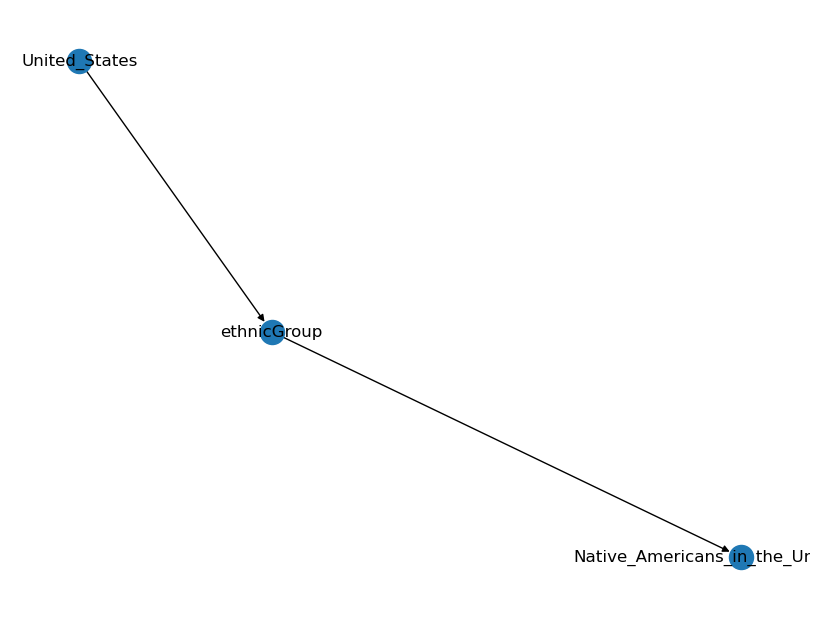

Decoded Input: 
 translate graph to text:  United_States  ethnicGroup  Native_Americans_in_the_United_States
Decoded Target: 
 Native Americans are on of the ethnic groups in the United States.
DataBatch(x=[1, 512], edge_index=[2, 2], attention_mask=[1, 512], y=[1, 512], batch=[512], ptr=[2])
Original Sample: 
 translate graph to text: <H> A.C._Milan  <R>  chairman  <T>  Silvio_Berlusconi 
 The Chairman of A C Milan is Silvio Berlusconi.
NetworkX Graph: 
 [('A.C._Milan', 'chairman', 0), ('chairman', 'Silvio_Berlusconi', 0)]


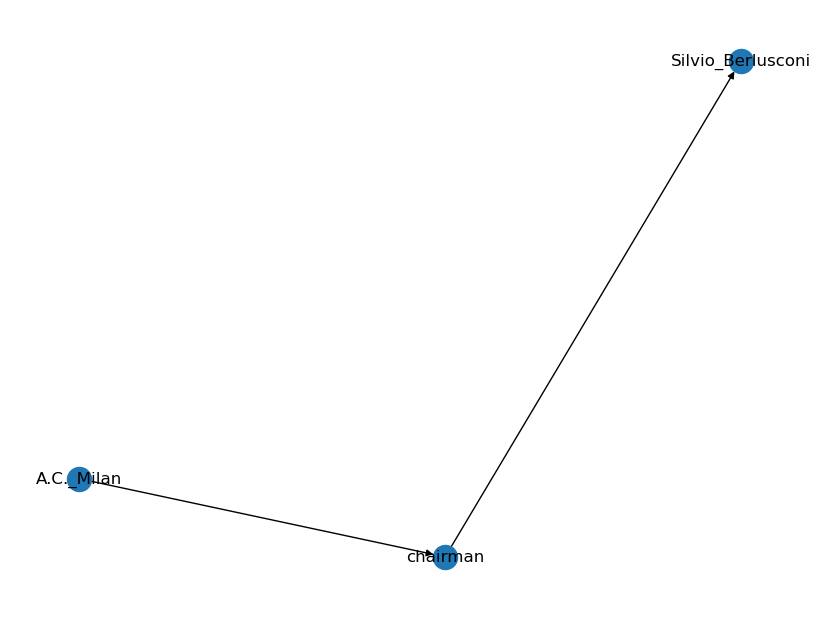

Decoded Input: 
 translate graph to text:  A.C._Milan  chairman  Silvio_Berlusconi
Decoded Target: 
 The Chairman of A C Milan is Silvio Berlusconi.
DataBatch(x=[1, 512], edge_index=[2, 2], attention_mask=[1, 512], y=[1, 512], batch=[512], ptr=[2])
Original Sample: 
 translate graph to text: <H> Aaron_Boogaard  <R>  birthPlace  <T>  Canada 
 Aaron Boogaard's birthplace is Canada.
NetworkX Graph: 
 [('Aaron_Boogaard', 'birthPlace', 0), ('birthPlace', 'Canada', 0)]


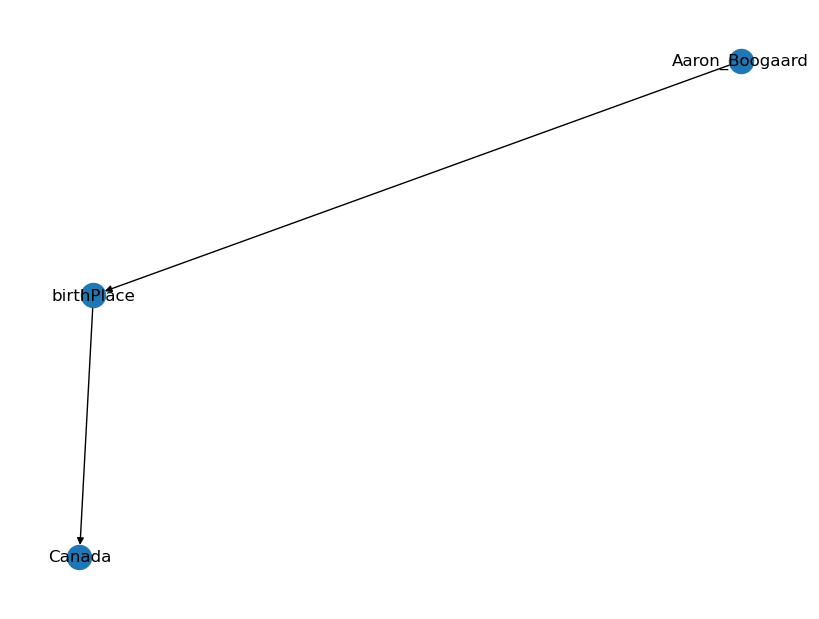

Decoded Input: 
 translate graph to text:  Aaron_Boogaard  birthPlace  Canada
Decoded Target: 
 Aaron Boogaard's birthplace is Canada.
DataBatch(x=[1, 512], edge_index=[2, 2], attention_mask=[1, 512], y=[1, 512], batch=[512], ptr=[2])
Original Sample: 
 translate graph to text: <H> Aaron_Hunt  <R>  clubs  <T>  SV_Werder_Bremen 
 Aaron Hunt played for the club SV Werder Bremen.
NetworkX Graph: 
 [('Aaron_Hunt', 'clubs', 0), ('clubs', 'SV_Werder_Bremen', 0)]


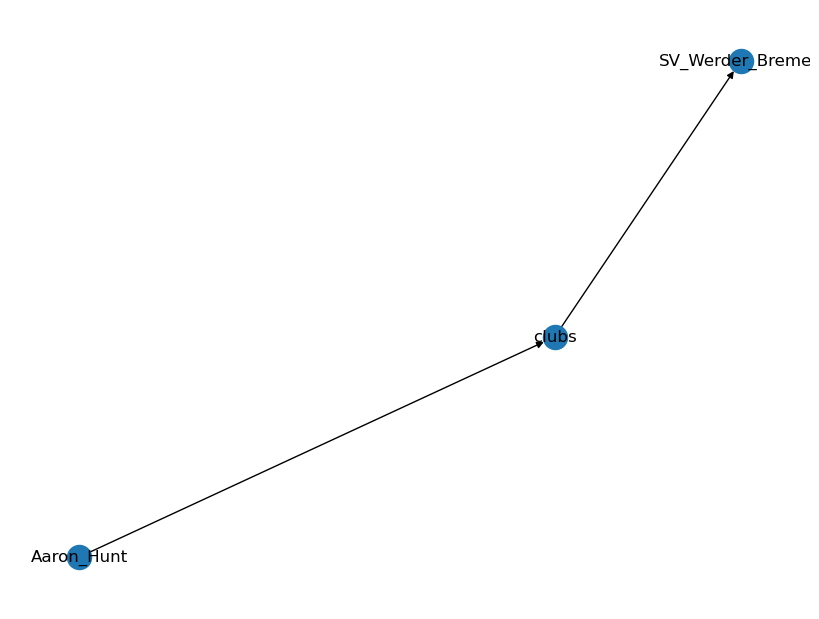

Decoded Input: 
 translate graph to text:  Aaron_Hunt  clubs  SV_Werder_Bremen
Decoded Target: 
 Aaron Hunt played for the club SV Werder Bremen.
DataBatch(x=[1, 512], edge_index=[2, 2], attention_mask=[1, 512], y=[1, 512], batch=[512], ptr=[2])
Original Sample: 
 translate graph to text: <H> Abel_Hernández  <R>  team  <T>  Uruguay_Olympic_football_team 
 Abel Hernandez is in the Uruguay Olympic football team.
NetworkX Graph: 
 [('Abel_Hernández', 'team', 0), ('team', 'Uruguay_Olympic_football_team', 0)]


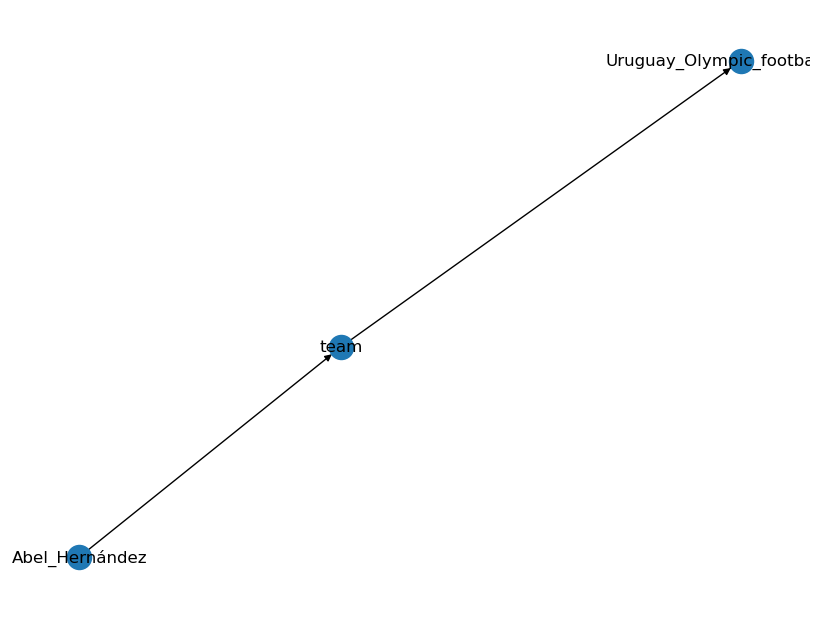

Decoded Input: 
 translate graph to text:  Abel_Hernández  team  Uruguay_Olympic_football_team
Decoded Target: 
 Abel Hernandez is in the Uruguay Olympic football team.
DataBatch(x=[1, 512], edge_index=[2, 2], attention_mask=[1, 512], y=[1, 512], batch=[512], ptr=[2])
Original Sample: 
 translate graph to text: <H> Abel_Hernández  <R>  team  <T>  Uruguay_national_football_team 
 Abel Hernandez's club is the Uruguay National football team.
NetworkX Graph: 
 [('Abel_Hernández', 'team', 0), ('team', 'Uruguay_national_football_team', 0)]


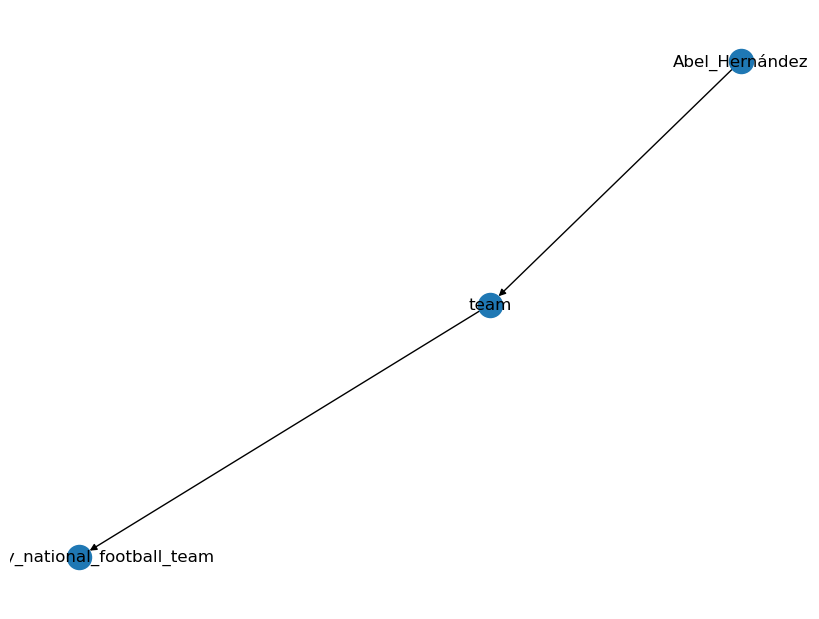

Decoded Input: 
 translate graph to text:  Abel_Hernández  team  Uruguay_national_football_team
Decoded Target: 
 Abel Hernandez's club is the Uruguay National football team.
DataBatch(x=[1, 512], edge_index=[2, 2], attention_mask=[1, 512], y=[1, 512], batch=[512], ptr=[2])
Original Sample: 
 translate graph to text: <H> Abner_(footballer)  <R>  birthPlace  <T>  Brazil 
 The footballer Abner was born in Brazil.
NetworkX Graph: 
 [('Abner_', 'birthPlace', 0), ('birthPlace', 'Brazil', 0)]


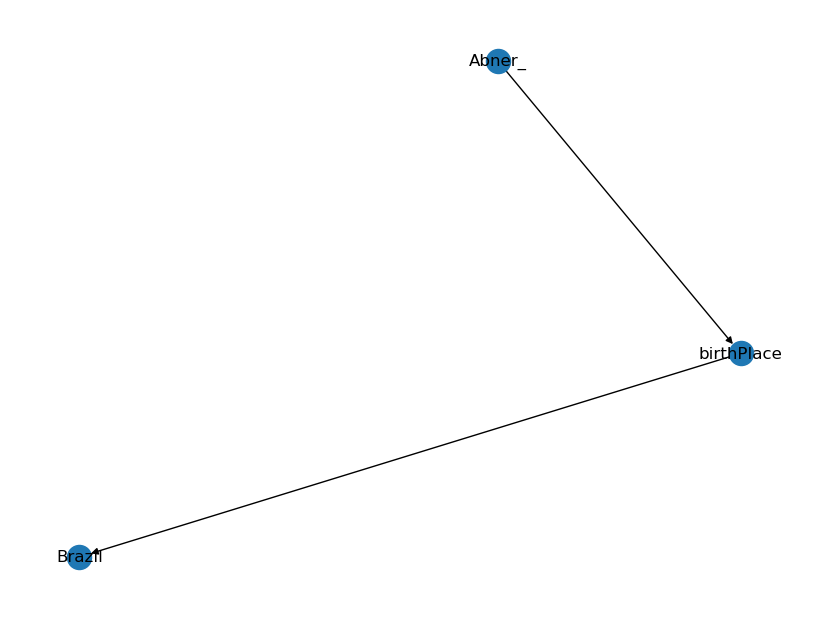

Decoded Input: 
 translate graph to text:  Abner_(footballer)  birthPlace  Brazil
Decoded Target: 
 The footballer Abner was born in Brazil.
DataBatch(x=[1, 512], edge_index=[2, 2], attention_mask=[1, 512], y=[1, 512], batch=[512], ptr=[2])
Original Sample: 
 translate graph to text: <H> Adam_Maher  <R>  birthPlace  <T>  Diemen 
 Adam Maher's birthplace is Diemen.
NetworkX Graph: 
 [('Adam_Maher', 'birthPlace', 0), ('birthPlace', 'Diemen', 0)]


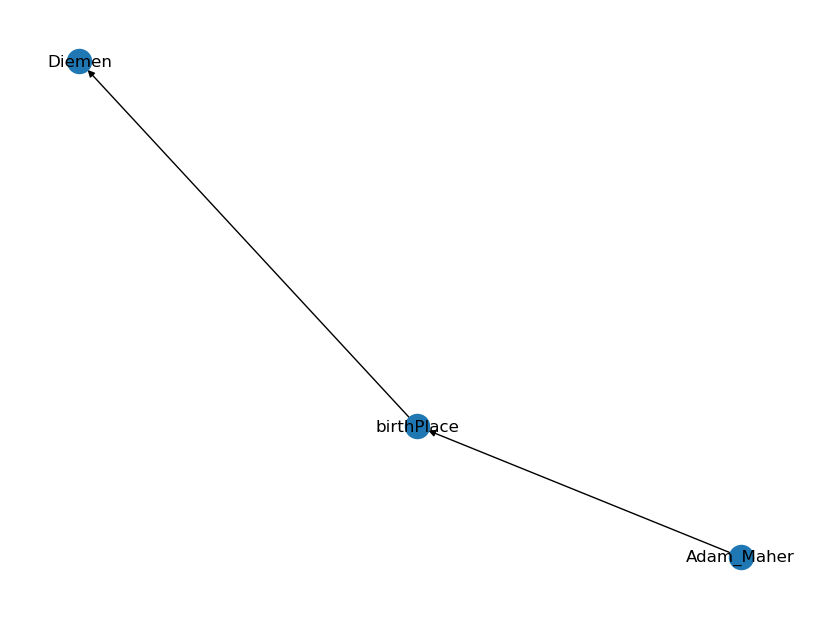

Decoded Input: 
 translate graph to text:  Adam_Maher  birthPlace  Diemen
Decoded Target: 
 Adam Maher's birthplace is Diemen.
DataBatch(x=[1, 512], edge_index=[2, 2], attention_mask=[1, 512], y=[1, 512], batch=[512], ptr=[2])
Original Sample: 
 translate graph to text: <H> Adam_Maher  <R>  placeOfBirth  <T>  Netherlands 
 Adam Maher was born in the Netherlands.
NetworkX Graph: 
 [('Adam_Maher', 'placeOfBirth', 0), ('placeOfBirth', 'Netherlands', 0)]


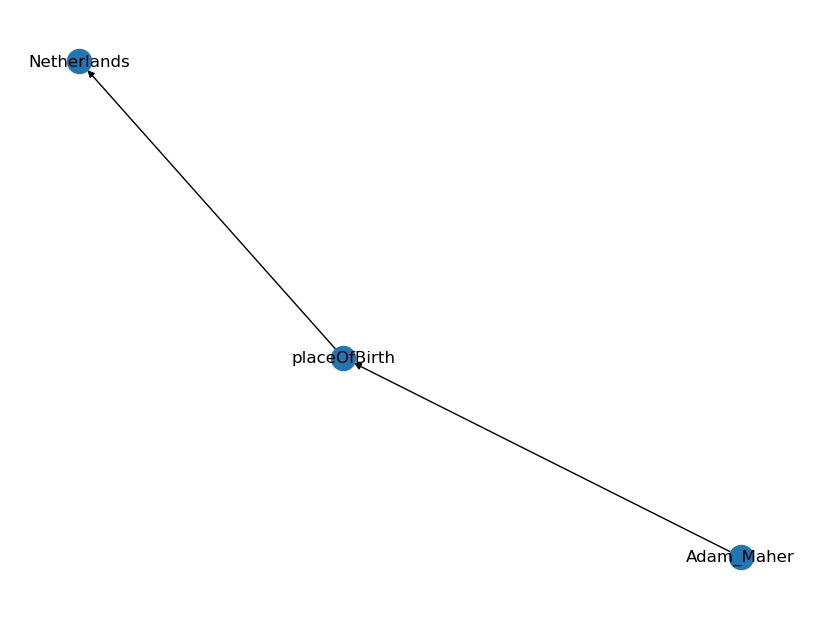

Decoded Input: 
 translate graph to text:  Adam_Maher  placeOfBirth  Netherlands
Decoded Target: 
 Adam Maher was born in the Netherlands.
DataBatch(x=[1, 512], edge_index=[2, 2], attention_mask=[1, 512], y=[1, 512], batch=[512], ptr=[2])
Original Sample: 
 translate graph to text: <H> Adam_Maher  <R>  team  <T>  Netherlands_national_under-17_football_team 
 Adam Maher played for the Netherlands national under-17 football team.
NetworkX Graph: 
 [('Adam_Maher', 'team', 0), ('team', 'Netherlands_national_under-17_football_team', 0)]


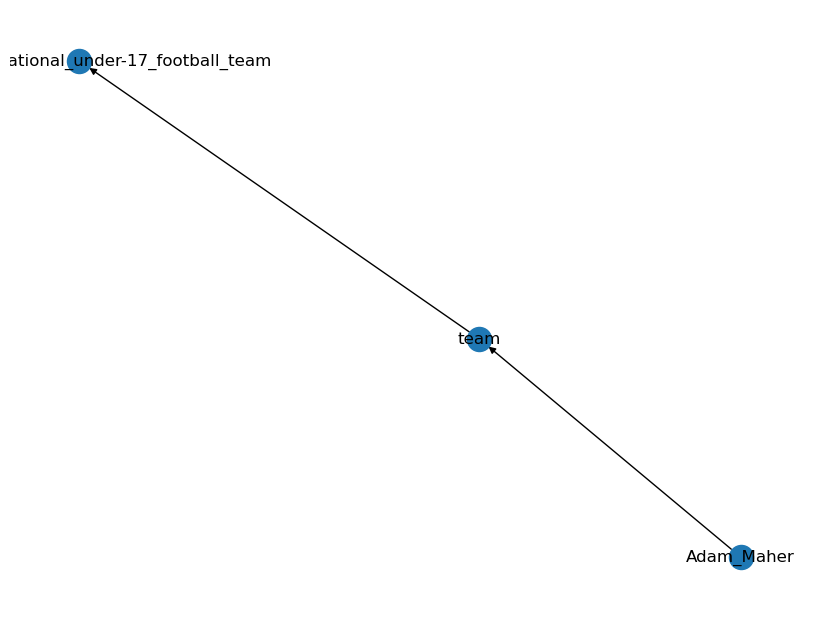

Decoded Input: 
 translate graph to text:  Adam_Maher  team  Netherlands_national_under-17_football_team
Decoded Target: 
 Adam Maher played for the Netherlands national under-17 football team.
DataBatch(x=[1, 512], edge_index=[2, 2], attention_mask=[1, 512], y=[1, 512], batch=[512], ptr=[2])
Original Sample: 
 translate graph to text: <H> Adam_Maher  <R>  clubs  <T>  PSV_Eindhoven 
 Adam Maher's club is PSV Eindhoven.
NetworkX Graph: 
 [('Adam_Maher', 'clubs', 0), ('clubs', 'PSV_Eindhoven', 0)]


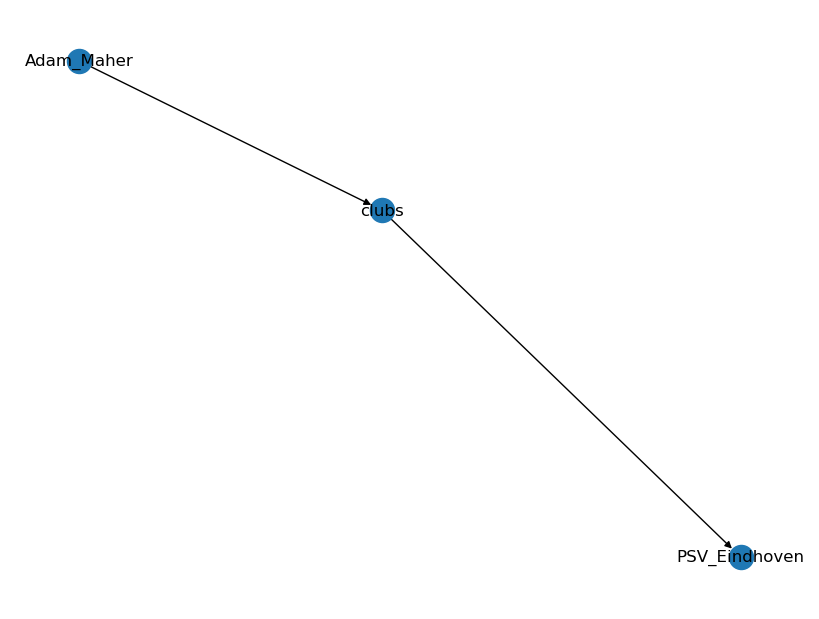

Decoded Input: 
 translate graph to text:  Adam_Maher  clubs  PSV_Eindhoven
Decoded Target: 
 Adam Maher's club is PSV Eindhoven.
DataBatch(x=[1, 512], edge_index=[2, 2], attention_mask=[1, 512], y=[1, 512], batch=[512], ptr=[2])
Original Sample: 
 translate graph to text: <H> Ahmad_Kadhim_Assad  <R>  team  <T>  Iraq_national_football_team 
 Ahmad Kadhim Assad plays for the Iraq national football team.
NetworkX Graph: 
 [('Ahmad_Kadhim_Assad', 'team', 0), ('team', 'Iraq_national_football_team', 0)]


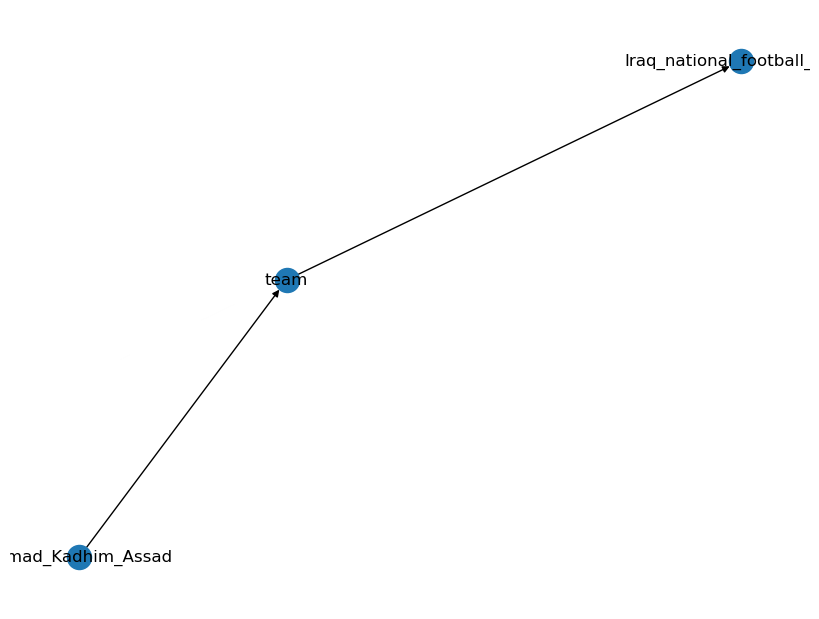

Decoded Input: 
 translate graph to text:  Ahmad_Kadhim_Assad  team  Iraq_national_football_team
Decoded Target: 
 Ahmad Kadhim Assad plays for the Iraq national football team.
DataBatch(x=[1, 512], edge_index=[2, 2], attention_mask=[1, 512], y=[1, 512], batch=[512], ptr=[2])
Original Sample: 
 translate graph to text: <H> Akeem_Adams  <R>  birthPlace  <T>  Point_Fortin 
 Akeem Adams was born in Point Fortin.
NetworkX Graph: 
 [('Akeem_Adams', 'birthPlace', 0), ('birthPlace', 'Point_Fortin', 0)]


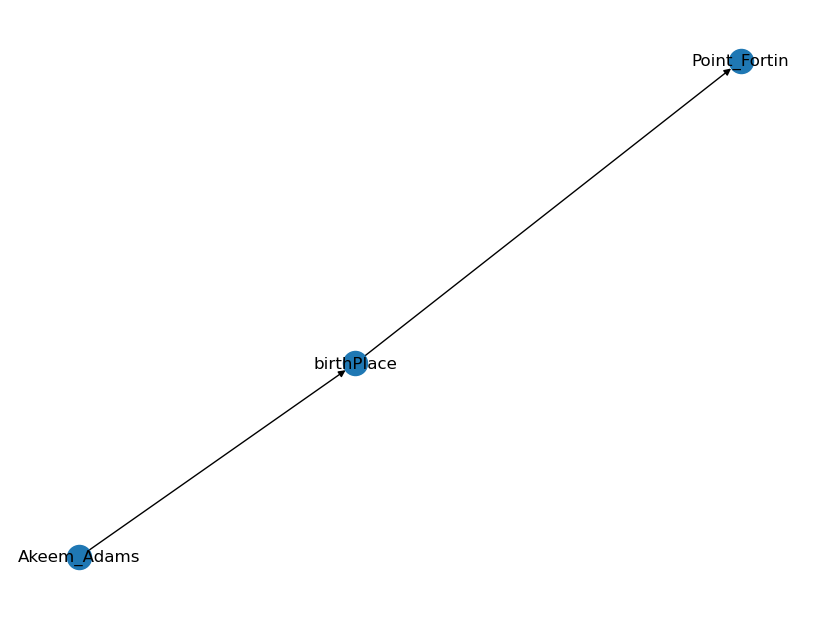

Decoded Input: 
 translate graph to text:  Akeem_Adams  birthPlace  Point_Fortin
Decoded Target: 
 Akeem Adams was born in Point Fortin.
DataBatch(x=[1, 512], edge_index=[2, 2], attention_mask=[1, 512], y=[1, 512], batch=[512], ptr=[2])
Original Sample: 
 translate graph to text: <H> Akeem_Dent  <R>  formerTeam  <T>  Atlanta_Falcons 
 Akeem Dent's former team is the Atlanta Falcons.
NetworkX Graph: 
 [('Akeem_Dent', 'formerTeam', 0), ('formerTeam', 'Atlanta_Falcons', 0)]


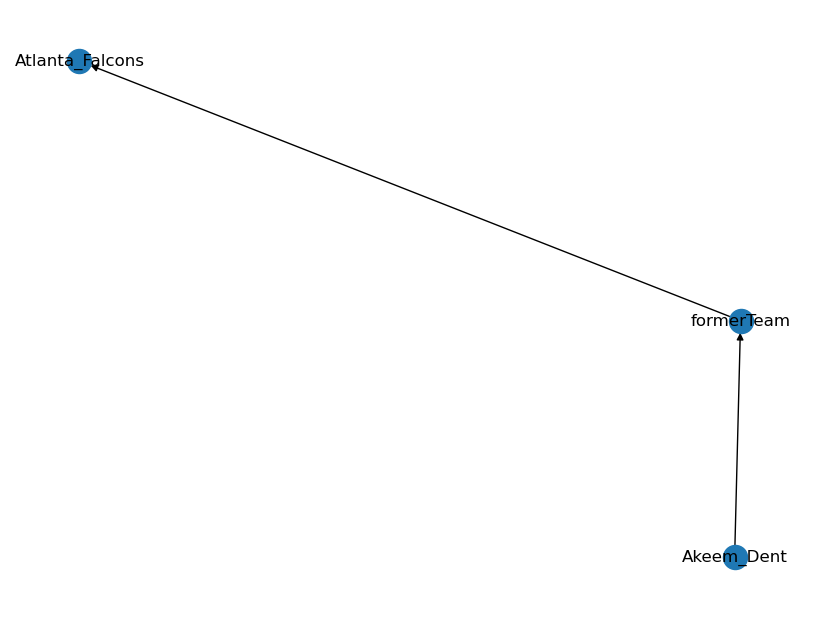

Decoded Input: 
 translate graph to text:  Akeem_Dent  formerTeam  Atlanta_Falcons
Decoded Target: 
 Akeem Dent's former team is the Atlanta Falcons.
DataBatch(x=[1, 512], edge_index=[2, 2], attention_mask=[1, 512], y=[1, 512], batch=[512], ptr=[2])
Original Sample: 
 translate graph to text: <H> Akeem_Priestley  <R>  team  <T>  Connecticut_Huskies 
 Akeem Priestley's club is the Connecticut Huskies.
NetworkX Graph: 
 [('Akeem_Priestley', 'team', 0), ('team', 'Connecticut_Huskies', 0)]


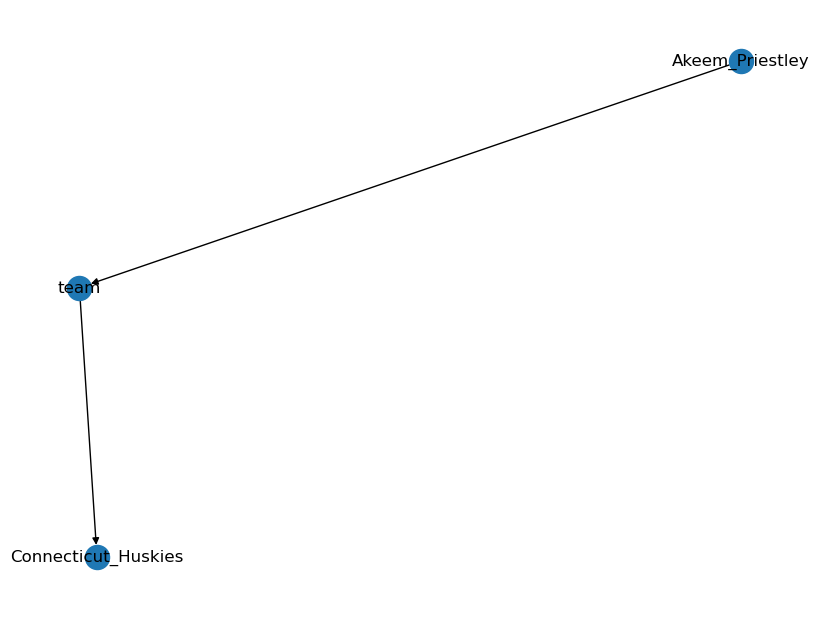

Decoded Input: 
 translate graph to text:  Akeem_Priestley  team  Connecticut_Huskies
Decoded Target: 
 Akeem Priestley's club is the Connecticut Huskies.
DataBatch(x=[1, 512], edge_index=[2, 2], attention_mask=[1, 512], y=[1, 512], batch=[512], ptr=[2])
Original Sample: 
 translate graph to text: <H> Al-Khor_Sports_Club  <R>  league  <T>  Qatar_Stars_League 
 Al-Khor Sports Club is in the Qatar Stars League.
NetworkX Graph: 
 [('Al-Khor_Sports_Club', 'league', 0), ('league', 'Qatar_Stars_League', 0)]


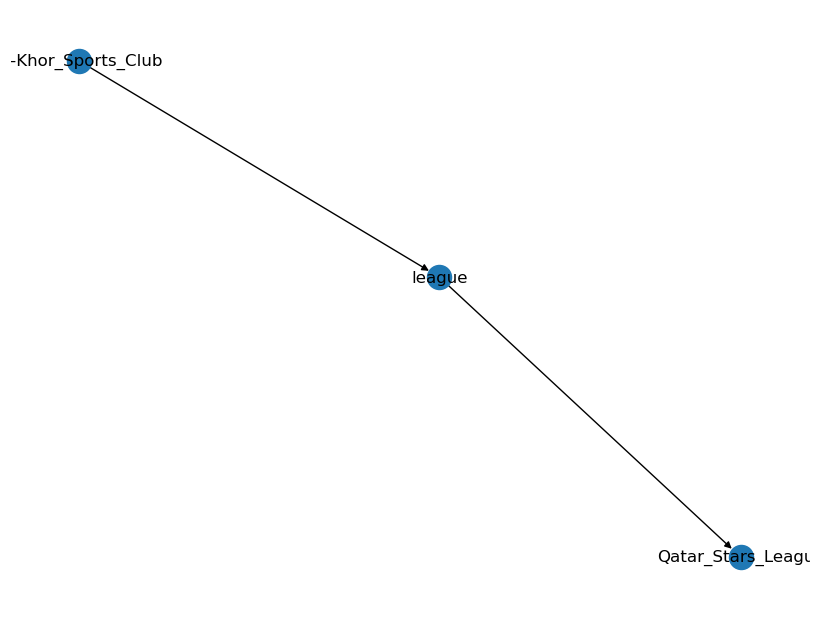

Decoded Input: 
 translate graph to text:  Al-Khor_Sports_Club  league  Qatar_Stars_League
Decoded Target: 
 Al-Khor Sports Club is in the Qatar Stars League.
DataBatch(x=[1, 512], edge_index=[2, 2], attention_mask=[1, 512], y=[1, 512], batch=[512], ptr=[2])
Original Sample: 
 translate graph to text: <H> Al-Zawra'a_SC  <R>  manager  <T>  Basim_Qasim 
 Basim Qasim is the manager of Al-Zawra'a SC.
NetworkX Graph: 
 [("Al-Zawra'a_SC", 'manager', 0), ('manager', 'Basim_Qasim', 0)]


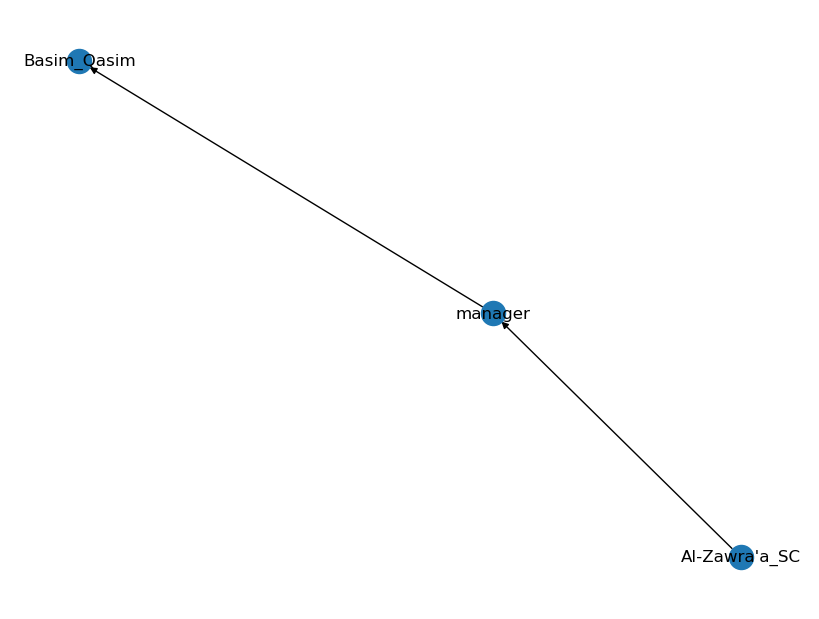

Decoded Input: 
 translate graph to text:  Al-Zawra'a_SC  manager  Basim_Qasim
Decoded Target: 
 Basim Qasim is the manager of Al-Zawra'a SC.
DataBatch(x=[1, 512], edge_index=[2, 2], attention_mask=[1, 512], y=[1, 512], batch=[512], ptr=[2])
Original Sample: 
 translate graph to text: <H> Al_Kharaitiyat_SC  <R>  position  <T>  Qatar_Stars_League 
 Al Kharaitiyat SC play in the Qatar Stars League.
NetworkX Graph: 
 [('Al_Kharaitiyat_SC', 'position', 0), ('position', 'Qatar_Stars_League', 0)]


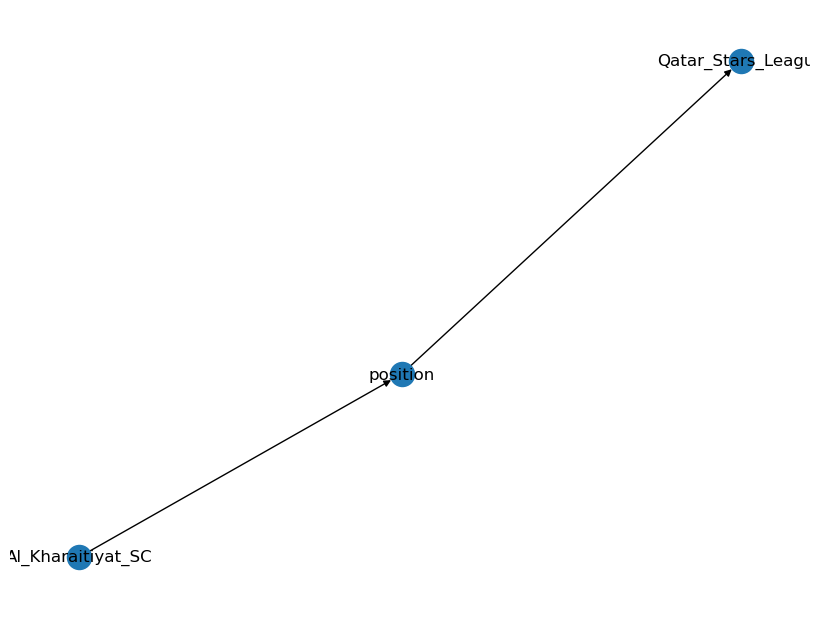

Decoded Input: 
 translate graph to text:  Al_Kharaitiyat_SC  position  Qatar_Stars_League
Decoded Target: 
 Al Kharaitiyat SC play in the Qatar Stars League.
DataBatch(x=[1, 512], edge_index=[2, 2], attention_mask=[1, 512], y=[1, 512], batch=[512], ptr=[2])
Original Sample: 
 translate graph to text: <H> Alaa_Abdul-Zahra  <R>  birthPlace  <T>  Baghdad 
 Alaa Abdul-Zahra was born in Baghdad.
NetworkX Graph: 
 [('Alaa_Abdul-Zahra', 'birthPlace', 0), ('birthPlace', 'Baghdad', 0)]


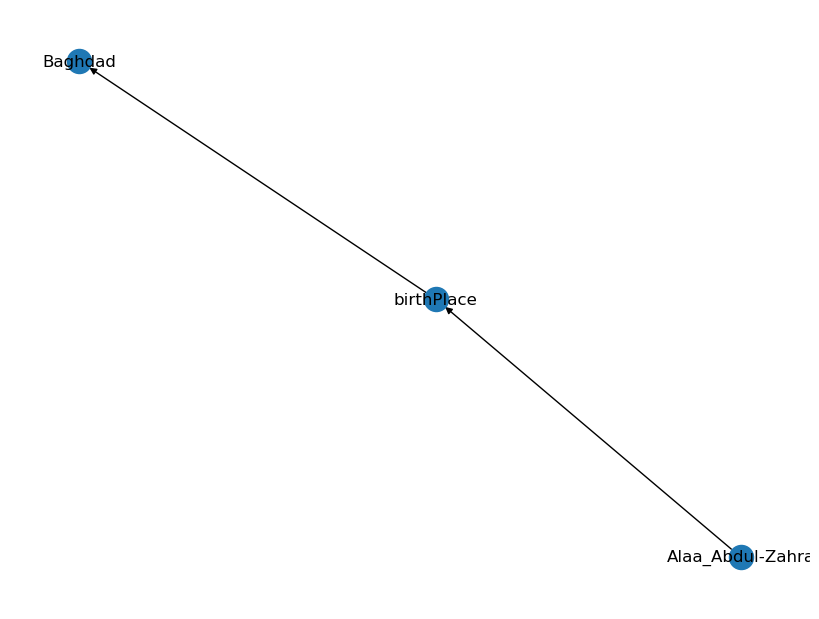

Decoded Input: 
 translate graph to text:  Alaa_Abdul-Zahra  birthPlace  Baghdad
Decoded Target: 
 Alaa Abdul-Zahra was born in Baghdad.
DataBatch(x=[1, 512], edge_index=[2, 2], attention_mask=[1, 512], y=[1, 512], batch=[512], ptr=[2])
Original Sample: 
 translate graph to text: <H> Alaa_Abdul-Zahra  <R>  clubs  <T>  Sanat_Mes_Kerman_F.C. 
 Alaa Abdul-Zahra's club is Sanat Mes Kerman F.C.
NetworkX Graph: 
 [('Alaa_Abdul-Zahra', 'clubs', 0), ('clubs', 'Sanat_Mes_Kerman_F.C.', 0)]


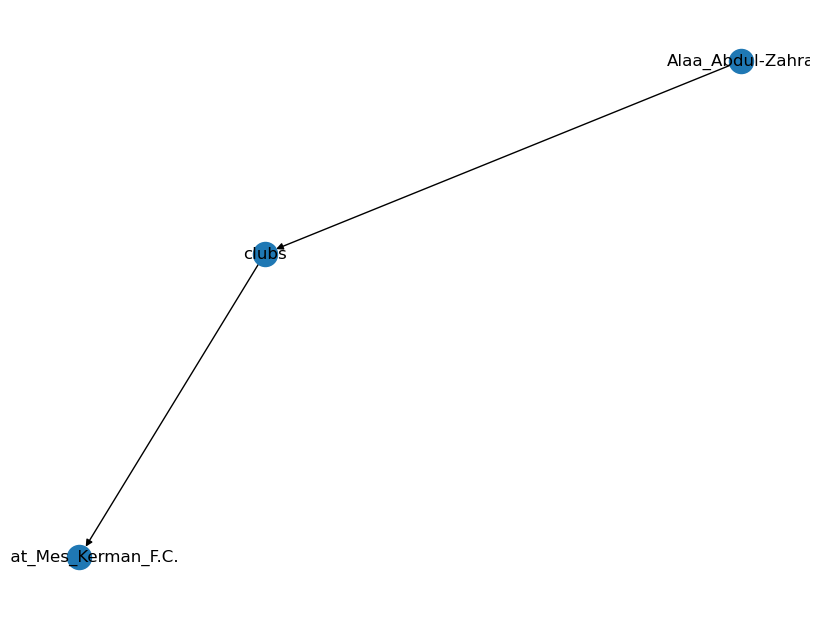

Decoded Input: 
 translate graph to text:  Alaa_Abdul-Zahra  clubs  Sanat_Mes_Kerman_F.C.
Decoded Target: 
 Alaa Abdul-Zahra's club is Sanat Mes Kerman F.C.
DataBatch(x=[1, 512], edge_index=[2, 2], attention_mask=[1, 512], y=[1, 512], batch=[512], ptr=[2])
Original Sample: 
 translate graph to text: <H> Alan_Martin_(footballer,_born_1989)  <R>  clubs  <T>  Hamilton_Academical_F.C. 
 Alan Martin played football for Hamilton Academical F.C.
NetworkX Graph: 
 [('Alan_Martin_', 'clubs', 0), ('clubs', 'Hamilton_Academical_F.C.', 0)]


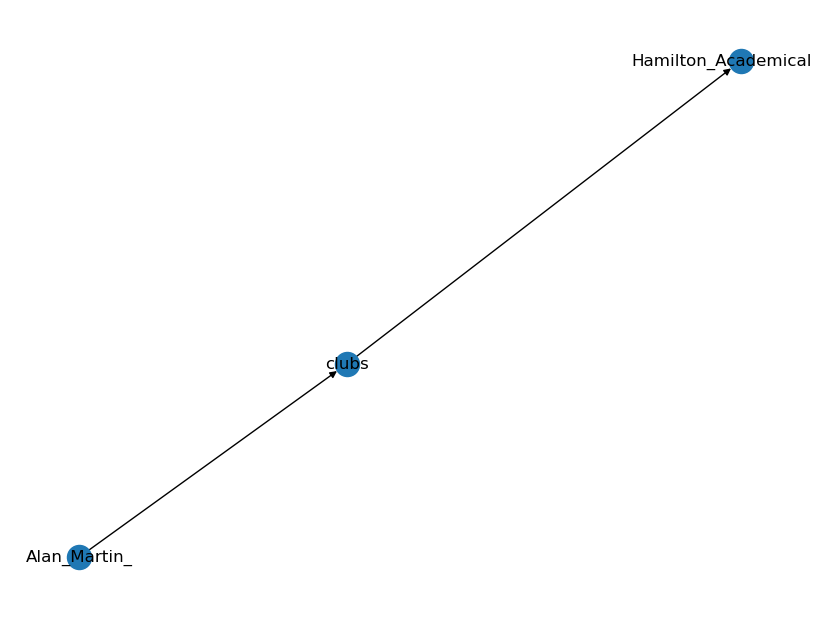

Decoded Input: 
 translate graph to text:  Alan_Martin_(footballer,_born_1989)  clubs  Hamilton_Academical_F.C.
Decoded Target: 
 Alan Martin played football for Hamilton Academical F.C.
DataBatch(x=[1, 512], edge_index=[2, 2], attention_mask=[1, 512], y=[1, 512], batch=[512], ptr=[2])
Original Sample: 
 translate graph to text: <H> Alan_Martin_(footballer,_born_1989)  <R>  team  <T>  Scotland_national_under-19_football_team 
 Alan Martin is a footballer with the Scotland national under-19 football team club.
NetworkX Graph: 
 [('Alan_Martin_', 'team', 0), ('team', 'Scotland_national_under-19_football_team', 0)]


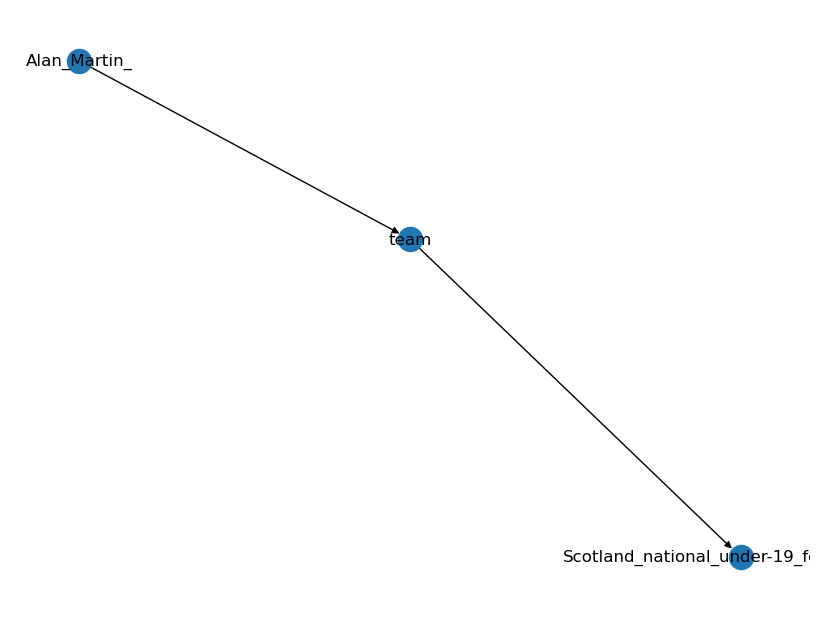

Decoded Input: 
 translate graph to text:  Alan_Martin_(footballer,_born_1989)  team  Scotland_national_under-19_football_team
Decoded Target: 
 Alan Martin is a footballer with the Scotland national under-19 football team club.
DataBatch(x=[1, 512], edge_index=[2, 2], attention_mask=[1, 512], y=[1, 512], batch=[512], ptr=[2])
Original Sample: 
 translate graph to text: <H> Aleksander_Barkov,_Jr.  <R>  dateOfBirth  <T>  "1995-09-02"^^xsd:date 
 Aleksander Barkov Jr's birthdate is 1995-09-02.
NetworkX Graph: 
 [('Aleksander_Barkov,_Jr.', 'dateOfBirth', 0), ('dateOfBirth', '"1995-09-02"^^xsd:date', 0)]


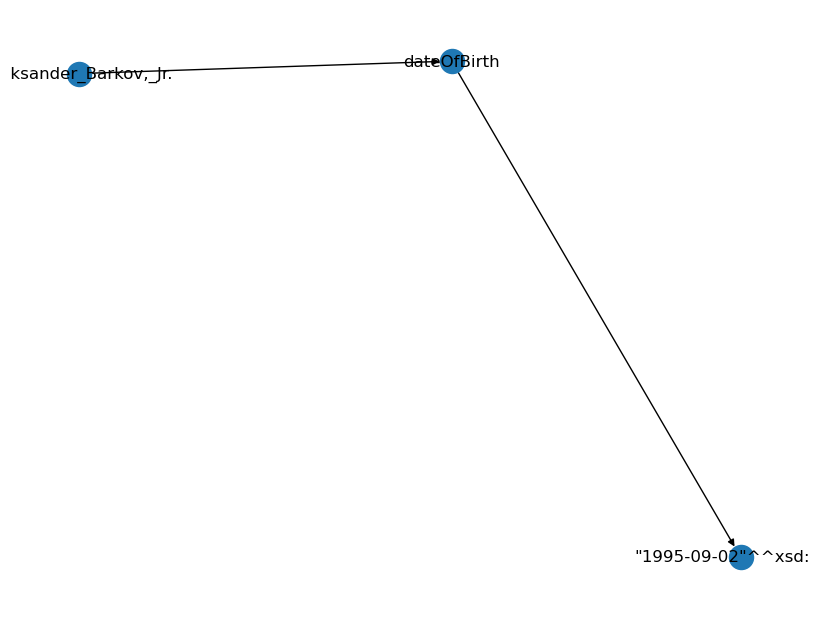

Decoded Input: 
 translate graph to text:  Aleksander_Barkov,_Jr.  dateOfBirth  "1995-09-02"xsd:date
Decoded Target: 
 Aleksander Barkov Jr's birthdate is 1995-09-02.
DataBatch(x=[1, 512], edge_index=[2, 2], attention_mask=[1, 512], y=[1, 512], batch=[512], ptr=[2])
Original Sample: 
 translate graph to text: <H> Aleksander_Barkov,_Jr.  <R>  team  <T>  Florida_Panthers 
 Aleksander Barkov Jr has played for the Florida Panthers.
NetworkX Graph: 
 [('Aleksander_Barkov,_Jr.', 'team', 0), ('team', 'Florida_Panthers', 0)]


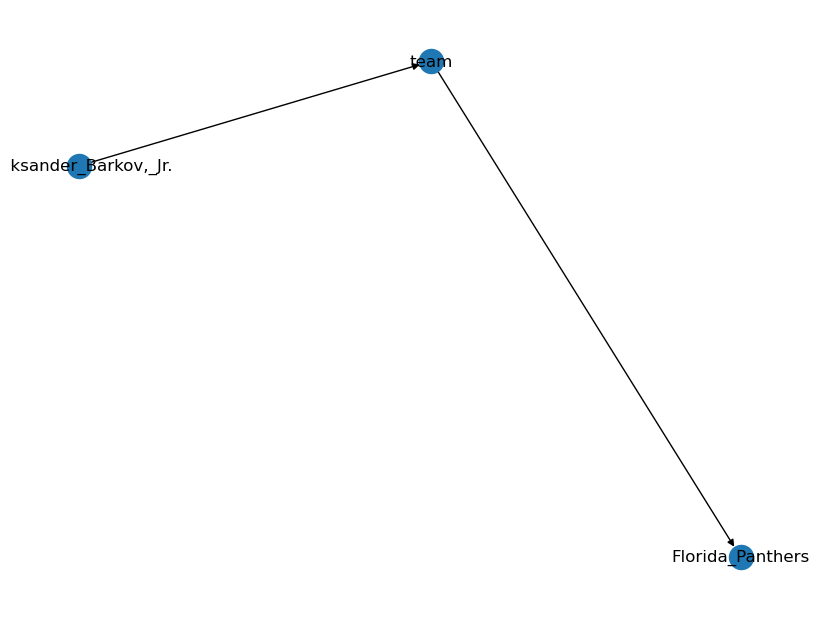

Decoded Input: 
 translate graph to text:  Aleksander_Barkov,_Jr.  team  Florida_Panthers
Decoded Target: 
 Aleksander Barkov Jr has played for the Florida Panthers.
DataBatch(x=[1, 512], edge_index=[2, 2], attention_mask=[1, 512], y=[1, 512], batch=[512], ptr=[2])
Original Sample: 
 translate graph to text: <H> Aleksander_Barkov,_Jr.  <R>  height  <T>  "1.905"^^xsd:double 
 Aleksander Barkov Jr is 1.905m tall.
NetworkX Graph: 
 [('Aleksander_Barkov,_Jr.', 'height', 0), ('height', '"1.905"^^xsd:double', 0)]


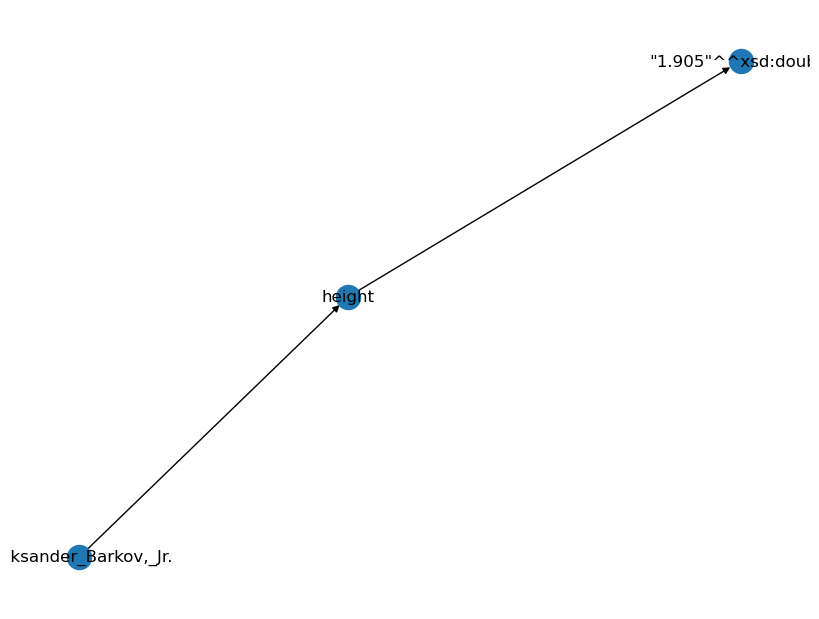

Decoded Input: 
 translate graph to text:  Aleksander_Barkov,_Jr.  height  "1.905"xsd:double
Decoded Target: 
 Aleksander Barkov Jr is 1.905m tall.
DataBatch(x=[1, 512], edge_index=[2, 2], attention_mask=[1, 512], y=[1, 512], batch=[512], ptr=[2])
Original Sample: 
 translate graph to text: <H> Aleksander_Barkov,_Jr.  <R>  league  <T>  National_Hockey_League 
 Aleksander Barkov Jr played in the National Hockey League.
NetworkX Graph: 
 [('Aleksander_Barkov,_Jr.', 'league', 0), ('league', 'National_Hockey_League', 0)]


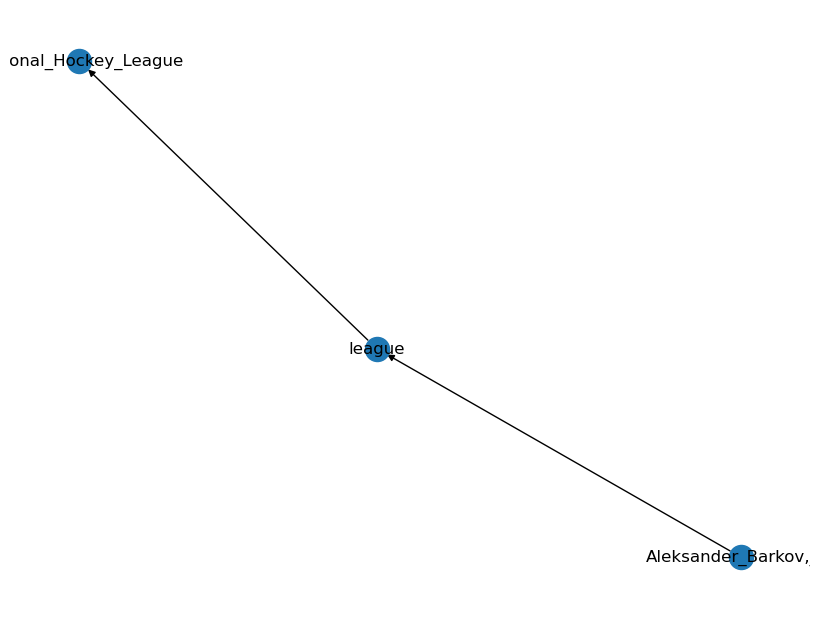

Decoded Input: 
 translate graph to text:  Aleksander_Barkov,_Jr.  league  National_Hockey_League
Decoded Target: 
 Aleksander Barkov Jr played in the National Hockey League.
DataBatch(x=[1, 512], edge_index=[2, 2], attention_mask=[1, 512], y=[1, 512], batch=[512], ptr=[2])
Original Sample: 
 translate graph to text: <H> Aleksandr_Prudnikov  <R>  dateOfBirth  <T>  "1989-02-24"^^xsd:date 
 Aleksandr Prudnikov's date of birth is 1989-02-24.
NetworkX Graph: 
 [('Aleksandr_Prudnikov', 'dateOfBirth', 0), ('dateOfBirth', '"1989-02-24"^^xsd:date', 0)]


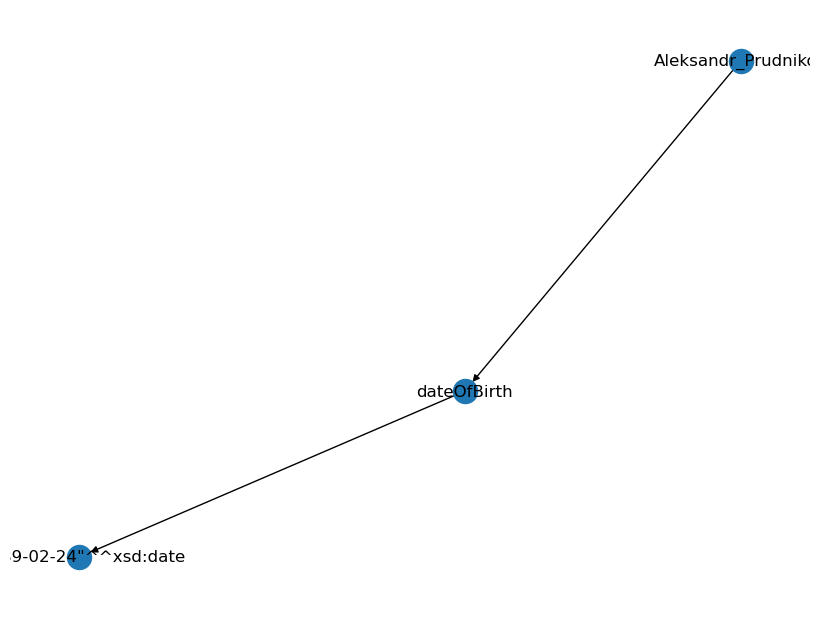

Decoded Input: 
 translate graph to text:  Aleksandr_Prudnikov  dateOfBirth  "1989-02-24"xsd:date
Decoded Target: 
 Aleksandr Prudnikov's date of birth is 1989-02-24.
DataBatch(x=[1, 512], edge_index=[2, 2], attention_mask=[1, 512], y=[1, 512], batch=[512], ptr=[2])
Original Sample: 
 translate graph to text: <H> Aleksandr_Prudnikov  <R>  team  <T>  FC_Amkar_Perm 
 Aleksandr Prudnikov plays for FC Amkar Perm.
NetworkX Graph: 
 [('Aleksandr_Prudnikov', 'team', 0), ('team', 'FC_Amkar_Perm', 0)]


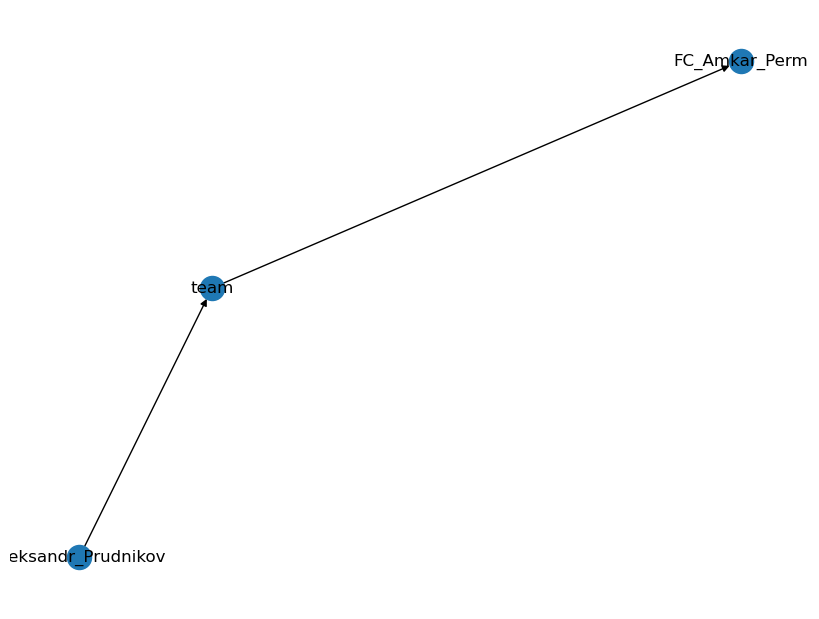

Decoded Input: 
 translate graph to text:  Aleksandr_Prudnikov  team  FC_Amkar_Perm
Decoded Target: 
 Aleksandr Prudnikov plays for FC Amkar Perm.
DataBatch(x=[1, 512], edge_index=[2, 2], attention_mask=[1, 512], y=[1, 512], batch=[512], ptr=[2])
Original Sample: 
 translate graph to text: <H> Aleksandre_Guruli  <R>  placeOfBirth  <T>  Batumi 
 Aleksandre Guruli was born in Batumi.
NetworkX Graph: 
 [('Aleksandre_Guruli', 'placeOfBirth', 0), ('placeOfBirth', 'Batumi', 0)]


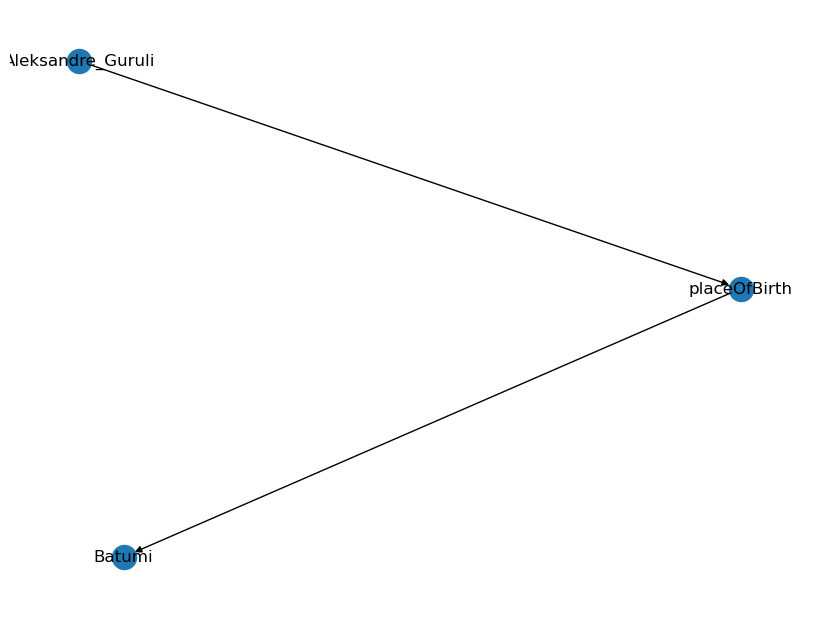

Decoded Input: 
 translate graph to text:  Aleksandre_Guruli  placeOfBirth  Batumi
Decoded Target: 
 Aleksandre Guruli was born in Batumi.
DataBatch(x=[1, 512], edge_index=[2, 2], attention_mask=[1, 512], y=[1, 512], batch=[512], ptr=[2])
Original Sample: 
 translate graph to text: <H> Aleksandre_Guruli  <R>  clubs  <T>  FC_Samtredia 
 Aleksandre Guruli plays for FC Samtredia.
NetworkX Graph: 
 [('Aleksandre_Guruli', 'clubs', 0), ('clubs', 'FC_Samtredia', 0)]


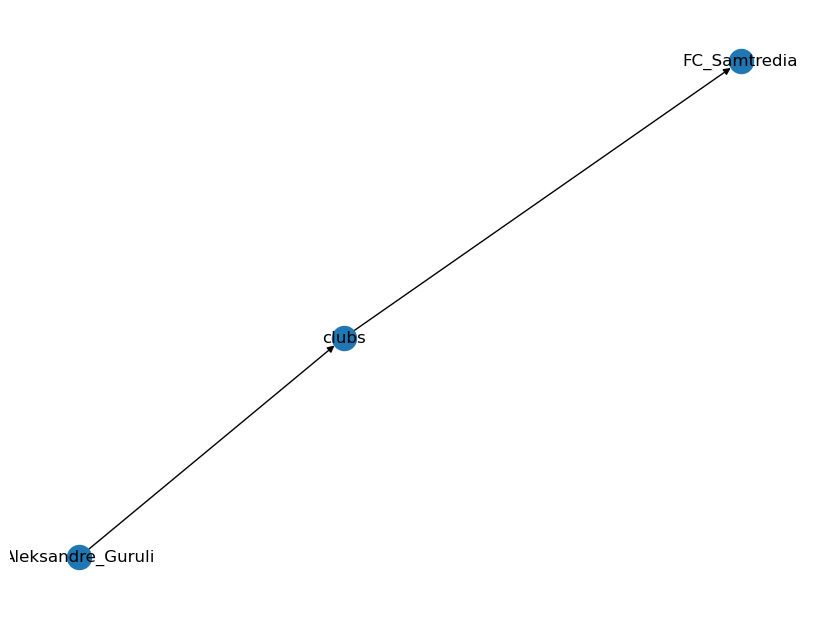

Decoded Input: 
 translate graph to text:  Aleksandre_Guruli  clubs  FC_Samtredia
Decoded Target: 
 Aleksandre Guruli plays for FC Samtredia.
DataBatch(x=[1, 512], edge_index=[2, 2], attention_mask=[1, 512], y=[1, 512], batch=[512], ptr=[2])
Original Sample: 
 translate graph to text: <H> Aleksandre_Guruli  <R>  team  <T>  Georgia_national_under-21_football_team 
 Aleksandre Guruli's club is the Georgia national under 21 football team.
NetworkX Graph: 
 [('Aleksandre_Guruli', 'team', 0), ('team', 'Georgia_national_under-21_football_team', 0)]


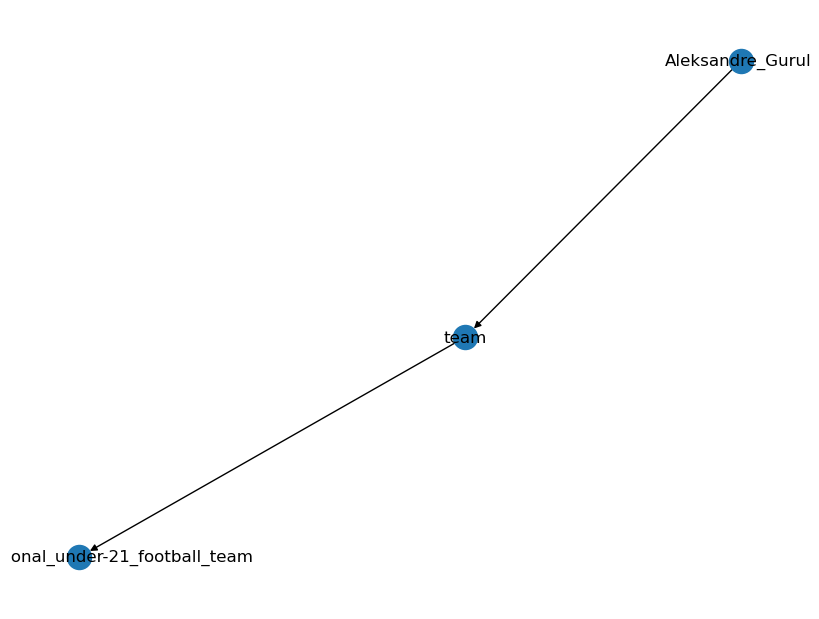

Decoded Input: 
 translate graph to text:  Aleksandre_Guruli  team  Georgia_national_under-21_football_team
Decoded Target: 
 Aleksandre Guruli's club is the Georgia national under 21 football team.
DataBatch(x=[1, 512], edge_index=[2, 2], attention_mask=[1, 512], y=[1, 512], batch=[512], ptr=[2])
Original Sample: 
 translate graph to text: <H> Alessio_Romagnoli  <R>  clubs  <T>  A.S._Roma 
 Alessio Romagnoli plays for A.S. Roma.
NetworkX Graph: 
 [('Alessio_Romagnoli', 'clubs', 0), ('clubs', 'A.S._Roma', 0)]


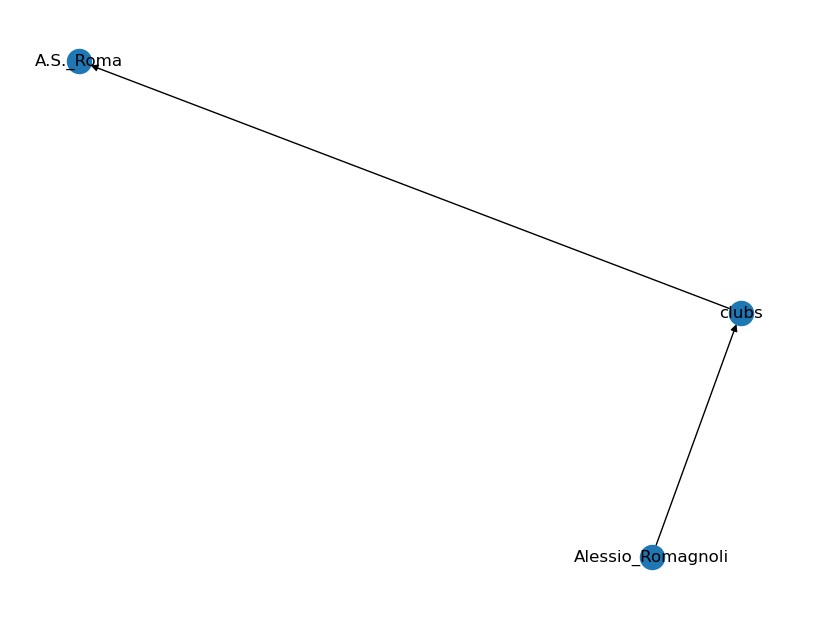

Decoded Input: 
 translate graph to text:  Alessio_Romagnoli  clubs  A.S._Roma
Decoded Target: 
 Alessio Romagnoli plays for A.S. Roma.
DataBatch(x=[1, 512], edge_index=[2, 2], attention_mask=[1, 512], y=[1, 512], batch=[512], ptr=[2])
Original Sample: 
 translate graph to text: <H> Alessio_Romagnoli  <R>  youthclubs  <T>  A.S._Roma 
 Alessio Romagnoli plays for the A.S. Roma youth team.
NetworkX Graph: 
 [('Alessio_Romagnoli', 'youthclubs', 0), ('youthclubs', 'A.S._Roma', 0)]


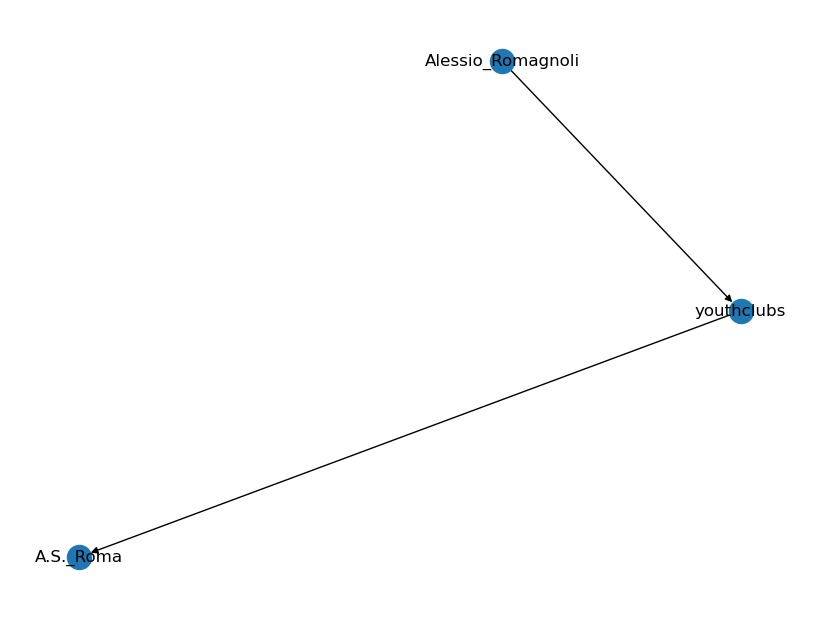

Decoded Input: 
 translate graph to text:  Alessio_Romagnoli  youthclubs  A.S._Roma
Decoded Target: 
 Alessio Romagnoli plays for the A.S. Roma youth team.
DataBatch(x=[1, 512], edge_index=[2, 2], attention_mask=[1, 512], y=[1, 512], batch=[512], ptr=[2])
Original Sample: 
 translate graph to text: <H> Alex_Plante  <R>  placeOfBirth  <T>  Manitoba 
 Alex Plante was born in Manitoba.
NetworkX Graph: 
 [('Alex_Plante', 'placeOfBirth', 0), ('placeOfBirth', 'Manitoba', 0)]


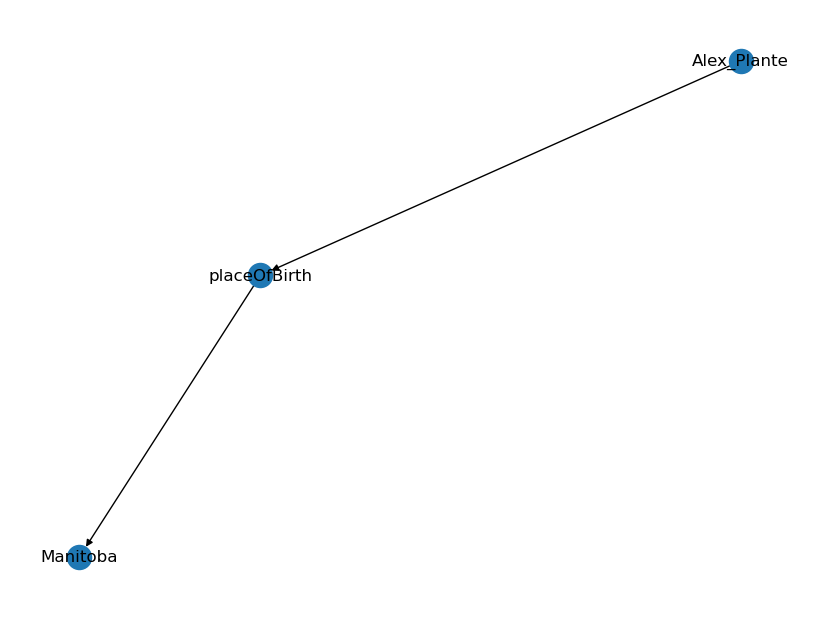

Decoded Input: 
 translate graph to text:  Alex_Plante  placeOfBirth  Manitoba
Decoded Target: 
 Alex Plante was born in Manitoba.
DataBatch(x=[1, 512], edge_index=[2, 2], attention_mask=[1, 512], y=[1, 512], batch=[512], ptr=[2])
Original Sample: 
 translate graph to text: <H> Alex_Tyus  <R>  league  <T>  Turkish_Basketball_Super_League 
 Alex Tyus's league is the Turkish Basketball Super League.
NetworkX Graph: 
 [('Alex_Tyus', 'league', 0), ('league', 'Turkish_Basketball_Super_League', 0)]


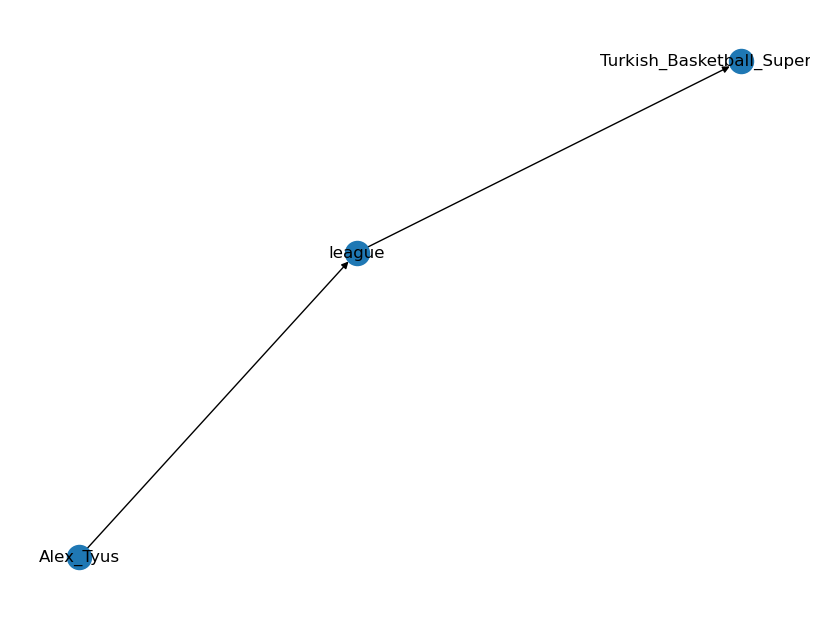

Decoded Input: 
 translate graph to text:  Alex_Tyus  league  Turkish_Basketball_Super_League
Decoded Target: 
 Alex Tyus's league is the Turkish Basketball Super League.
DataBatch(x=[1, 512], edge_index=[2, 2], attention_mask=[1, 512], y=[1, 512], batch=[512], ptr=[2])
Original Sample: 
 translate graph to text: <H> Atlanta_Falcons  <R>  locationCity  <T>  Atlanta 
 Atlanta Falcons play in Atlanta.
NetworkX Graph: 
 [('Atlanta_Falcons', 'locationCity', 0), ('locationCity', 'Atlanta', 0)]


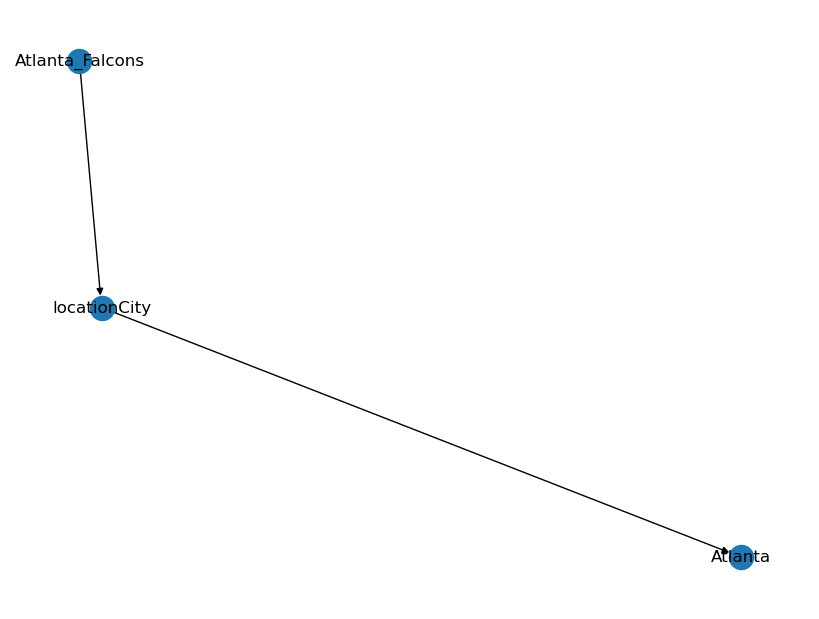

Decoded Input: 
 translate graph to text:  Atlanta_Falcons  locationCity  Atlanta
Decoded Target: 
 Atlanta Falcons play in Atlanta.
DataBatch(x=[1, 512], edge_index=[2, 2], attention_mask=[1, 512], y=[1, 512], batch=[512], ptr=[2])
Original Sample: 
 translate graph to text: <H> Boston_Bruins  <R>  generalManager  <T>  Don_Sweeney 
 Don Sweeney is general manager for the Boston Bruins.
NetworkX Graph: 
 [('Boston_Bruins', 'generalManager', 0), ('generalManager', 'Don_Sweeney', 0)]


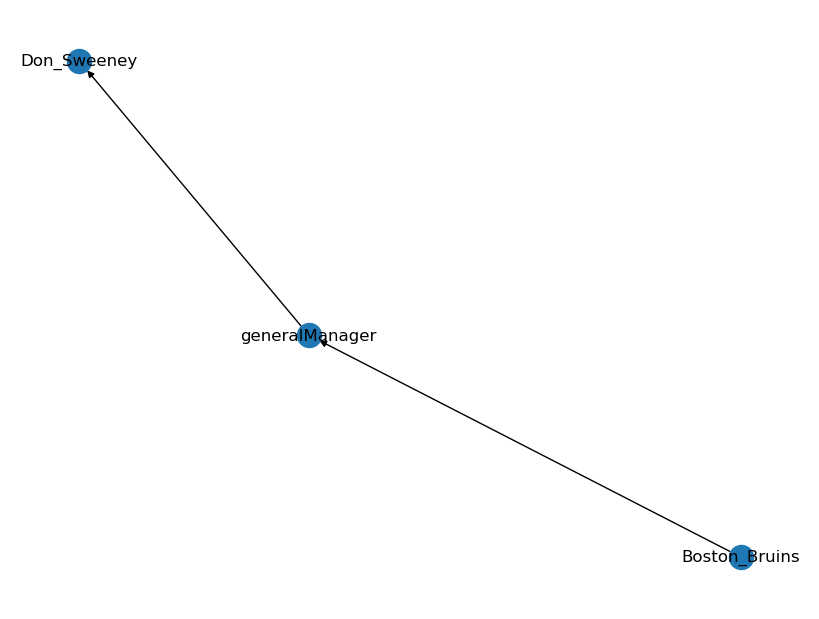

Decoded Input: 
 translate graph to text:  Boston_Bruins  generalManager  Don_Sweeney
Decoded Target: 
 Don Sweeney is general manager for the Boston Bruins.
DataBatch(x=[1, 512], edge_index=[2, 2], attention_mask=[1, 512], y=[1, 512], batch=[512], ptr=[2])
Original Sample: 
 translate graph to text: <H> Budapest  <R>  country  <T>  Hungary 
 Budapest is a city in Hungary.
NetworkX Graph: 
 [('Budapest', 'country', 0), ('country', 'Hungary', 0)]


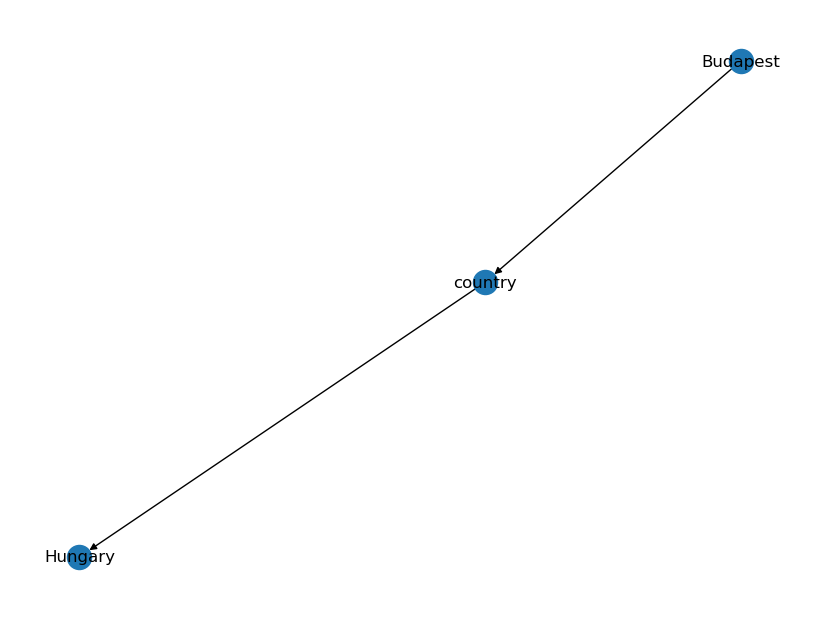

Decoded Input: 
 translate graph to text:  Budapest  country  Hungary
Decoded Target: 
 Budapest is a city in Hungary.
DataBatch(x=[1, 512], edge_index=[2, 2], attention_mask=[1, 512], y=[1, 512], batch=[512], ptr=[2])
Original Sample: 
 translate graph to text: <H> Canada  <R>  language  <T>  English_language 
 English is the language spoken in Canada.
NetworkX Graph: 
 [('Canada', 'language', 0), ('language', 'English_language', 0)]


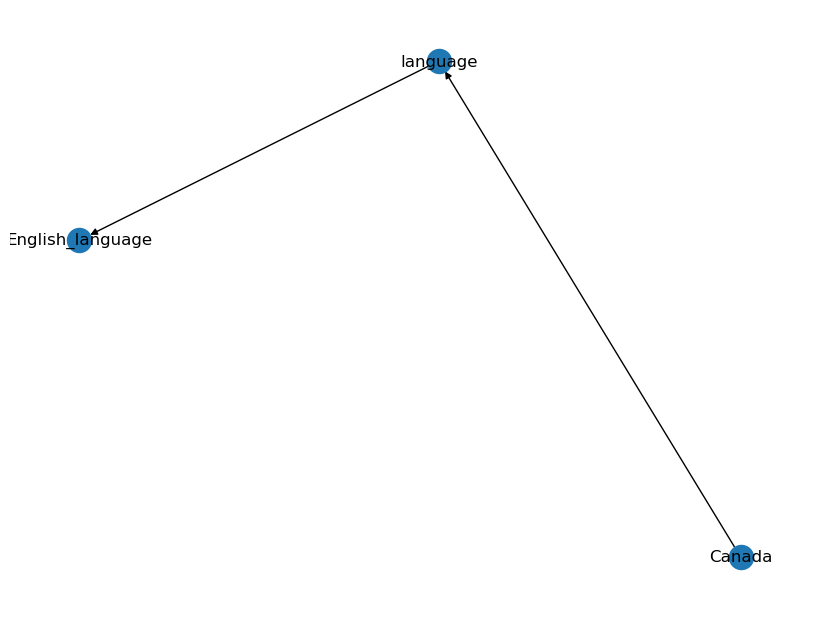

Decoded Input: 
 translate graph to text:  Canada  language  English_language
Decoded Target: 
 English is the language spoken in Canada.
DataBatch(x=[1, 512], edge_index=[2, 2], attention_mask=[1, 512], y=[1, 512], batch=[512], ptr=[2])
Original Sample: 
 translate graph to text: <H> Canada  <R>  language  <T>  Slavey_language 
 In Canada, the language is Slavey.
NetworkX Graph: 
 [('Canada', 'language', 0), ('language', 'Slavey_language', 0)]


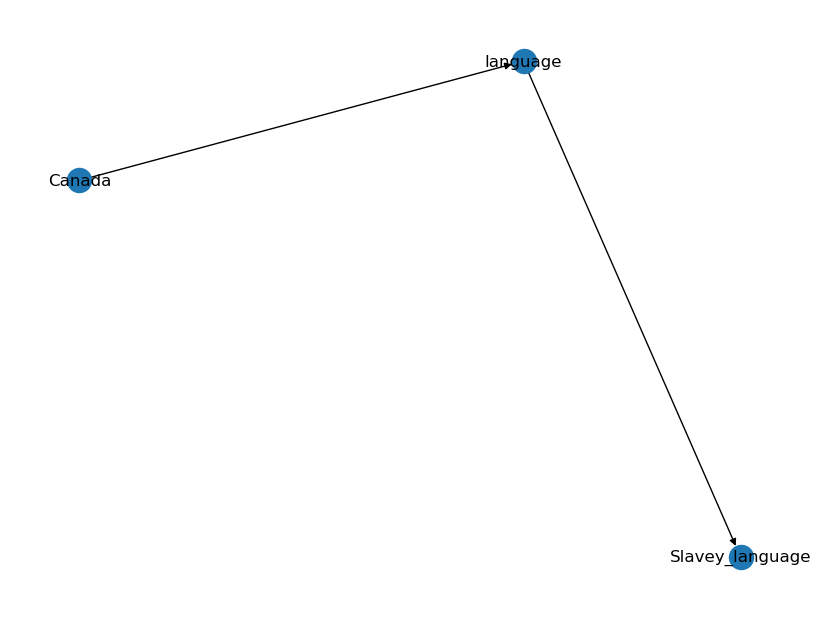

Decoded Input: 
 translate graph to text:  Canada  language  Slavey_language
Decoded Target: 
 In Canada, the language is Slavey.
DataBatch(x=[1, 512], edge_index=[2, 2], attention_mask=[1, 512], y=[1, 512], batch=[512], ptr=[2])
Original Sample: 
 translate graph to text: <H> Columbus_Blue_Jackets  <R>  city  <T>  Columbus,_Ohio 
 The Columbus Blue Jackets' city is Columbus, Ohio.
NetworkX Graph: 
 [('Columbus_Blue_Jackets', 'city', 0), ('city', 'Columbus,_Ohio', 0)]


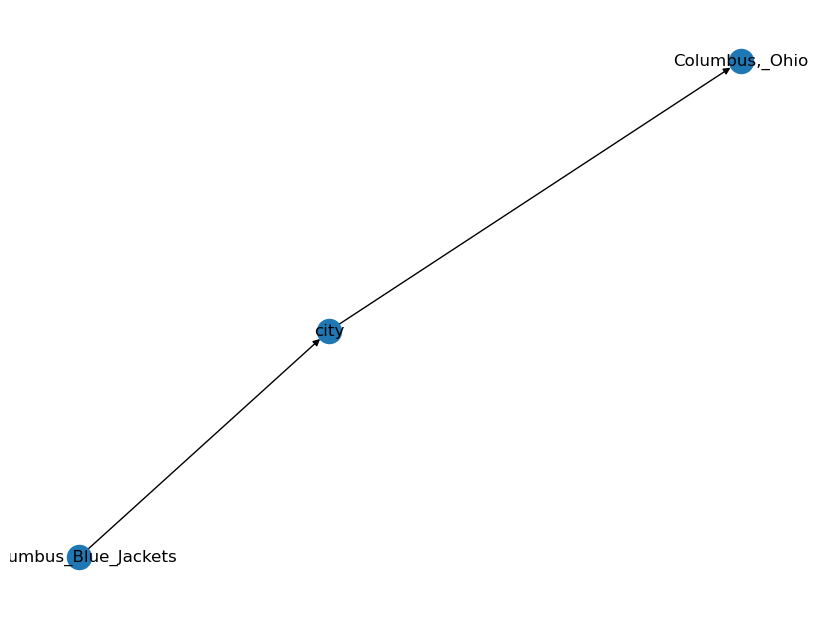

Decoded Input: 
 translate graph to text:  Columbus_Blue_Jackets  city  Columbus,_Ohio
Decoded Target: 
 The Columbus Blue Jackets' city is Columbus, Ohio.
DataBatch(x=[1, 512], edge_index=[2, 2], attention_mask=[1, 512], y=[1, 512], batch=[512], ptr=[2])
Original Sample: 
 translate graph to text: <H> FC_Karpaty_Lviv  <R>  manager  <T>  Oleh_Luzhny 
 Oleh Luzhny is the manager of FC Karpaty Lviv.
NetworkX Graph: 
 [('FC_Karpaty_Lviv', 'manager', 0), ('manager', 'Oleh_Luzhny', 0)]


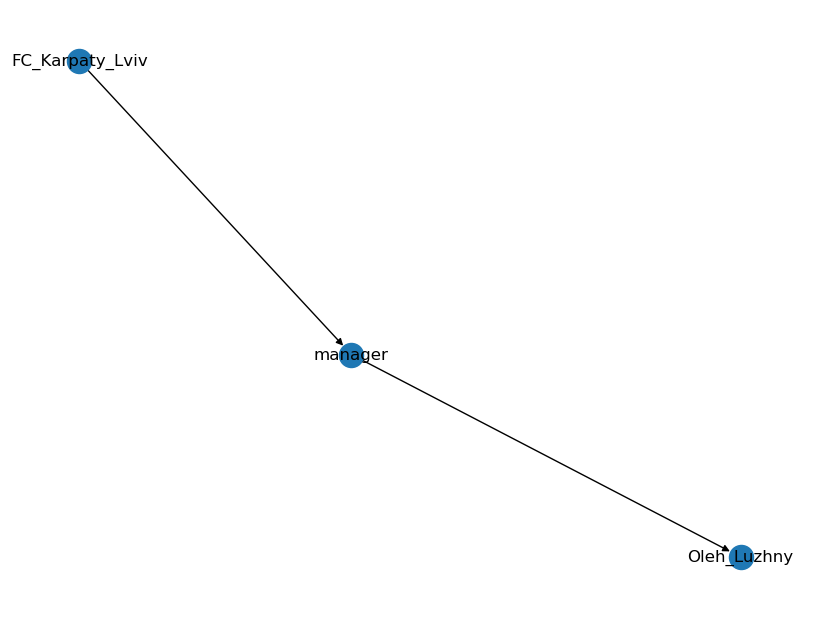

Decoded Input: 
 translate graph to text:  FC_Karpaty_Lviv  manager  Oleh_Luzhny
Decoded Target: 
 Oleh Luzhny is the manager of FC Karpaty Lviv.
DataBatch(x=[1, 512], edge_index=[2, 2], attention_mask=[1, 512], y=[1, 512], batch=[512], ptr=[2])
Original Sample: 
 translate graph to text: <H> FC_Torpedo_Moscow  <R>  manager  <T>  Valery_Petrakov 
 Valery Petrakov is the manager of FC Torpedo Moscow.
NetworkX Graph: 
 [('FC_Torpedo_Moscow', 'manager', 0), ('manager', 'Valery_Petrakov', 0)]


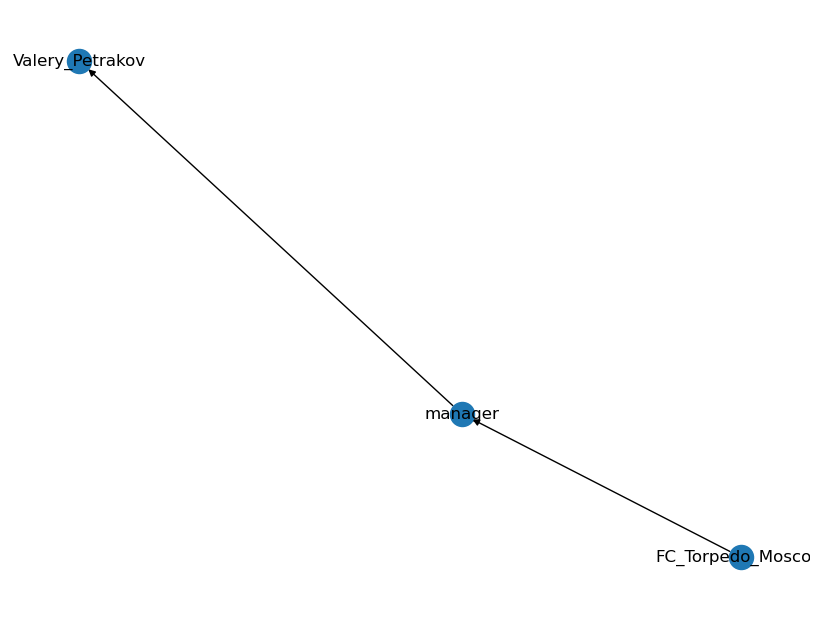

Decoded Input: 
 translate graph to text:  FC_Torpedo_Moscow  manager  Valery_Petrakov
Decoded Target: 
 Valery Petrakov is the manager of FC Torpedo Moscow.
DataBatch(x=[1, 512], edge_index=[2, 2], attention_mask=[1, 512], y=[1, 512], batch=[512], ptr=[2])
Original Sample: 
 translate graph to text: <H> Ferencvárosi_TC  <R>  chairman  <T>  Gábor_Kubatov 
 Gábor Kubatov is the chairman of Ferencvárosi TC.
NetworkX Graph: 
 [('Ferencvárosi_TC', 'chairman', 0), ('chairman', 'Gábor_Kubatov', 0)]


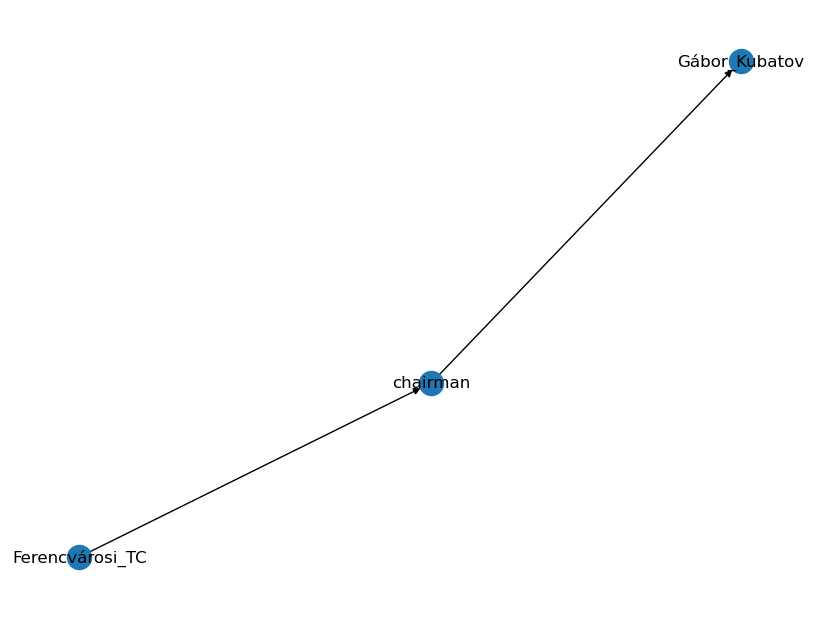

Decoded Input: 
 translate graph to text:  Ferencvárosi_TC  chairman  Gábor_Kubatov
Decoded Target: 
 Gábor Kubatov is the chairman of Ferencvárosi TC.
DataBatch(x=[1, 512], edge_index=[2, 2], attention_mask=[1, 512], y=[1, 512], batch=[512], ptr=[2])
Original Sample: 
 translate graph to text: <H> Finland  <R>  language  <T>  Finnish_language 
 The language of Finland is the Finnish language.
NetworkX Graph: 
 [('Finland', 'language', 0), ('language', 'Finnish_language', 0)]


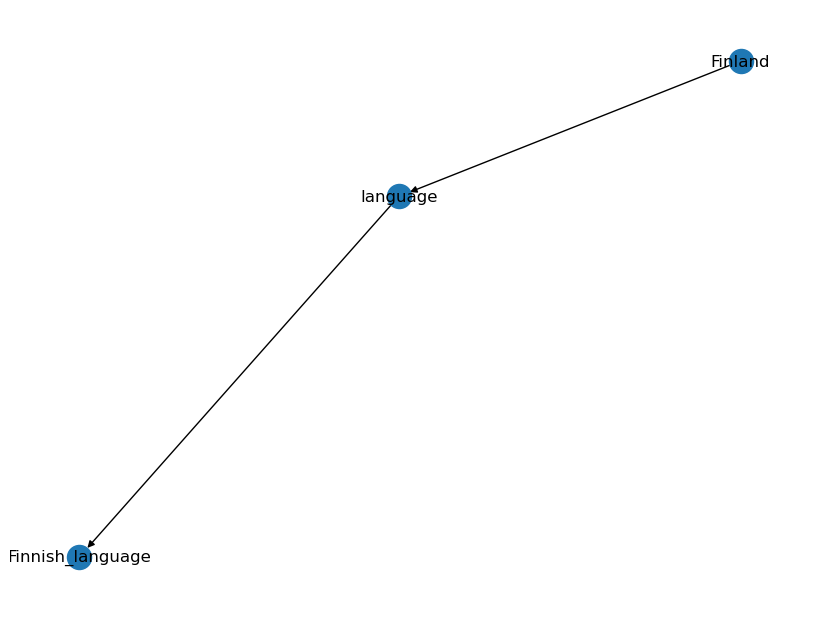

Decoded Input: 
 translate graph to text:  Finland  language  Finnish_language
Decoded Target: 
 The language of Finland is the Finnish language.
DataBatch(x=[1, 512], edge_index=[2, 2], attention_mask=[1, 512], y=[1, 512], batch=[512], ptr=[2])
Original Sample: 
 translate graph to text: <H> Italy_national_under-16_football_team  <R>  coach  <T>  Daniele_Zoratto 
 The coach of the Italian national under 16 football team is Daniele Zoratto.
NetworkX Graph: 
 [('Italy_national_under-16_football_team', 'coach', 0), ('coach', 'Daniele_Zoratto', 0)]


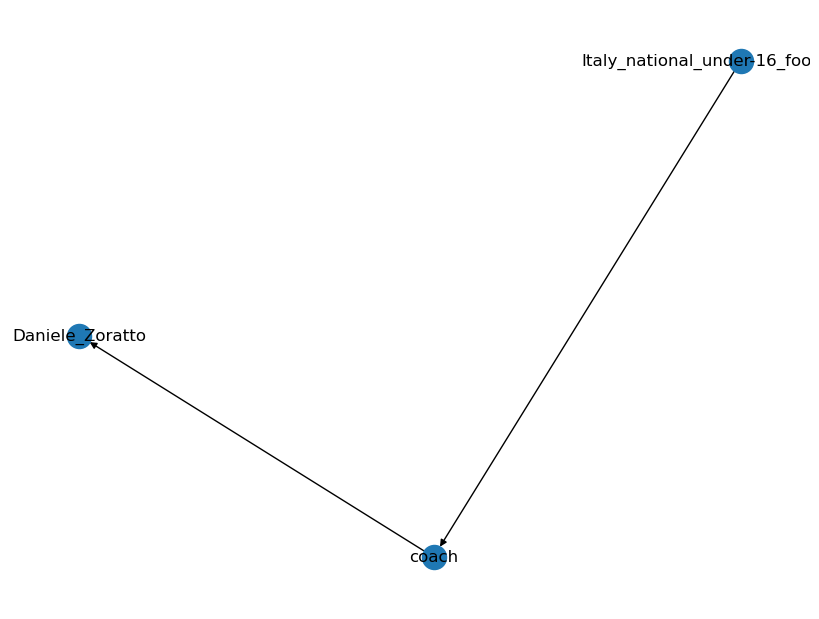

Decoded Input: 
 translate graph to text:  Italy_national_under-16_football_team  coach  Daniele_Zoratto
Decoded Target: 
 The coach of the Italian national under 16 football team is Daniele Zoratto.
DataBatch(x=[1, 512], edge_index=[2, 2], attention_mask=[1, 512], y=[1, 512], batch=[512], ptr=[2])
Original Sample: 
 translate graph to text: <H> Maccabi_Ashdod_B.C.  <R>  coach  <T>  Zvi_Sherf 
 Maccabi Ashdod BC's coach is Zvi Sherf.
NetworkX Graph: 
 [('Maccabi_Ashdod_B.C.', 'coach', 0), ('coach', 'Zvi_Sherf', 0)]


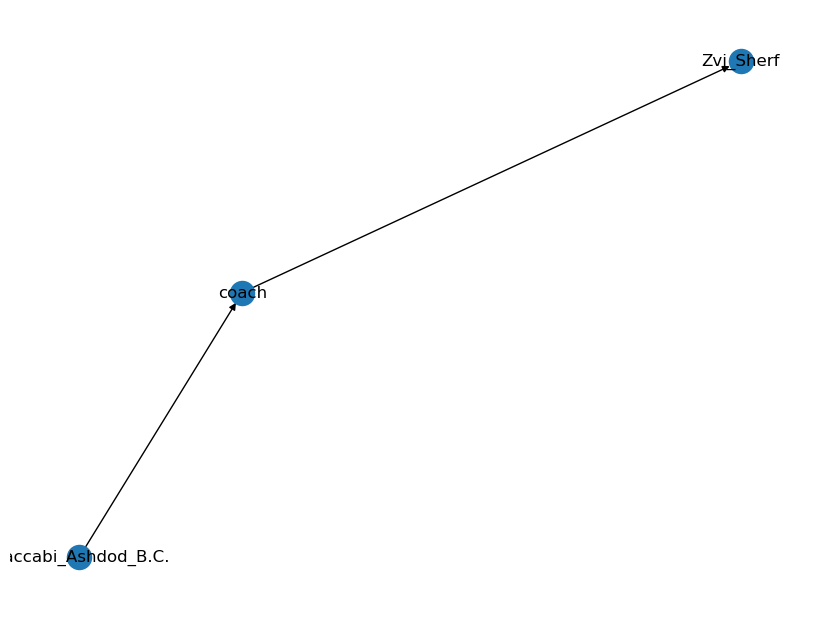

Decoded Input: 
 translate graph to text:  Maccabi_Ashdod_B.C.  coach  Zvi_Sherf
Decoded Target: 
 Maccabi Ashdod BC's coach is Zvi Sherf.
DataBatch(x=[1, 512], edge_index=[2, 2], attention_mask=[1, 512], y=[1, 512], batch=[512], ptr=[2])
Original Sample: 
 translate graph to text: <H> Motherwell_F.C.  <R>  ground  <T>  Fir_Park 
 Motherwell FC's ground is Fir Park.
NetworkX Graph: 
 [('Motherwell_F.C.', 'ground', 0), ('ground', 'Fir_Park', 0)]


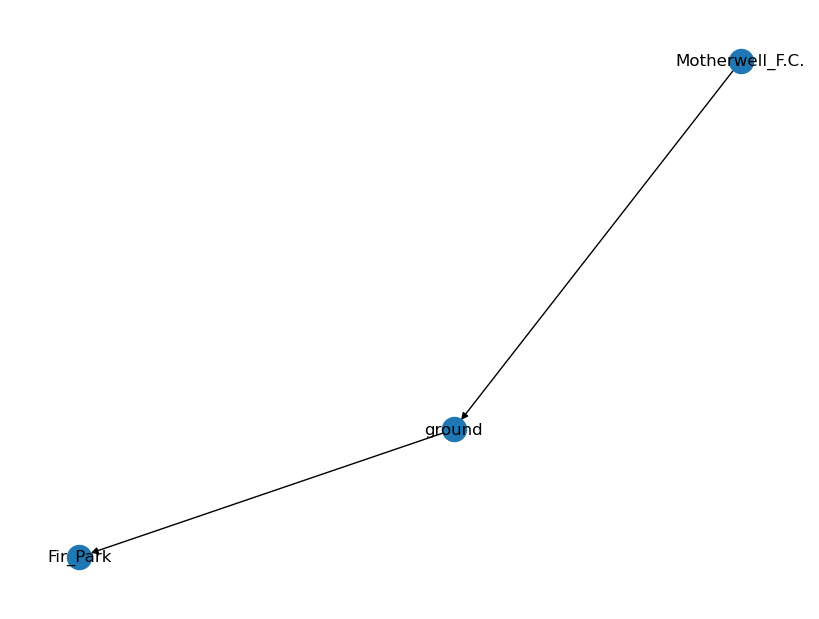

Decoded Input: 
 translate graph to text:  Motherwell_F.C.  ground  Fir_Park
Decoded Target: 
 Motherwell FC's ground is Fir Park.
DataBatch(x=[1, 512], edge_index=[2, 2], attention_mask=[1, 512], y=[1, 512], batch=[512], ptr=[2])
Original Sample: 
 translate graph to text: <H> Olympique_Lyonnais  <R>  owner  <T>  Jean-Michel_Aulas 
 Jean-Michel Aulas is the owner of Olympique Lyonnais.
NetworkX Graph: 
 [('Olympique_Lyonnais', 'owner', 0), ('owner', 'Jean-Michel_Aulas', 0)]


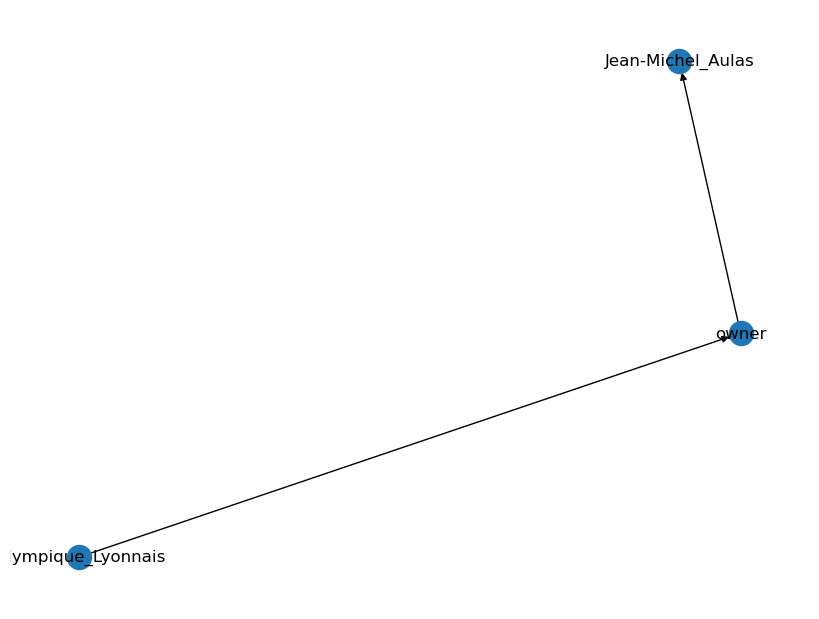

Decoded Input: 
 translate graph to text:  Olympique_Lyonnais  owner  Jean-Michel_Aulas
Decoded Target: 
 Jean-Michel Aulas is the owner of Olympique Lyonnais.
DataBatch(x=[1, 512], edge_index=[2, 2], attention_mask=[1, 512], y=[1, 512], batch=[512], ptr=[2])
Original Sample: 
 translate graph to text: <H> History_of_the_St._Louis_Rams  <R>  locationCity  <T>  St._Louis 
 The St. Louis Rams are based in the city of St. Louis.
NetworkX Graph: 
 [('History_of_the_St._Louis_Rams', 'locationCity', 0), ('locationCity', 'St._Louis', 0)]


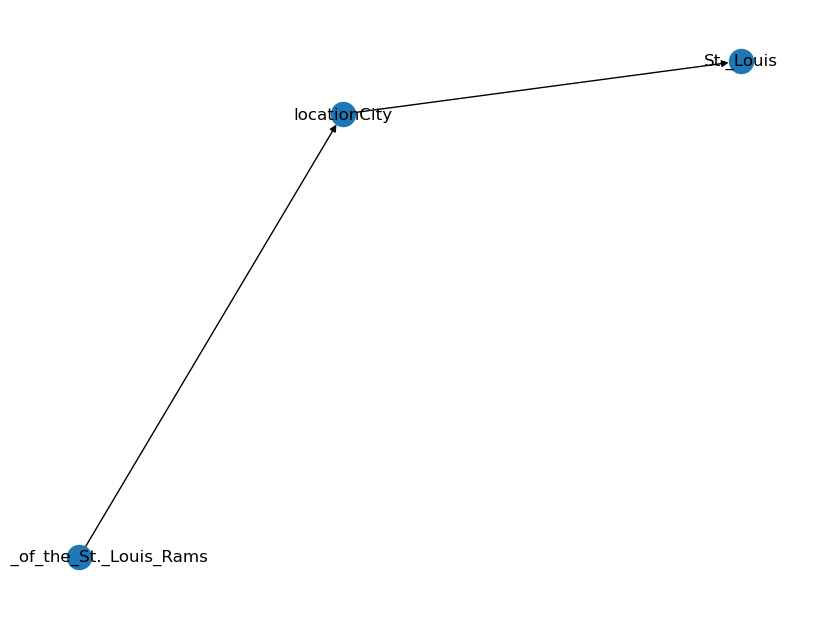

Decoded Input: 
 translate graph to text:  History_of_the_St._Louis_Rams  locationCity  St._Louis
Decoded Target: 
 The St. Louis Rams are based in the city of St. Louis.
DataBatch(x=[1, 512], edge_index=[2, 2], attention_mask=[1, 512], y=[1, 512], batch=[512], ptr=[2])
Original Sample: 
 translate graph to text: <H> Tennessee_Titans  <R>  locationCity  <T>  Nashville,_Tennessee 
 Tennessee Titans are based in Nashville, Tennessee.
NetworkX Graph: 
 [('Tennessee_Titans', 'locationCity', 0), ('locationCity', 'Nashville,_Tennessee', 0)]


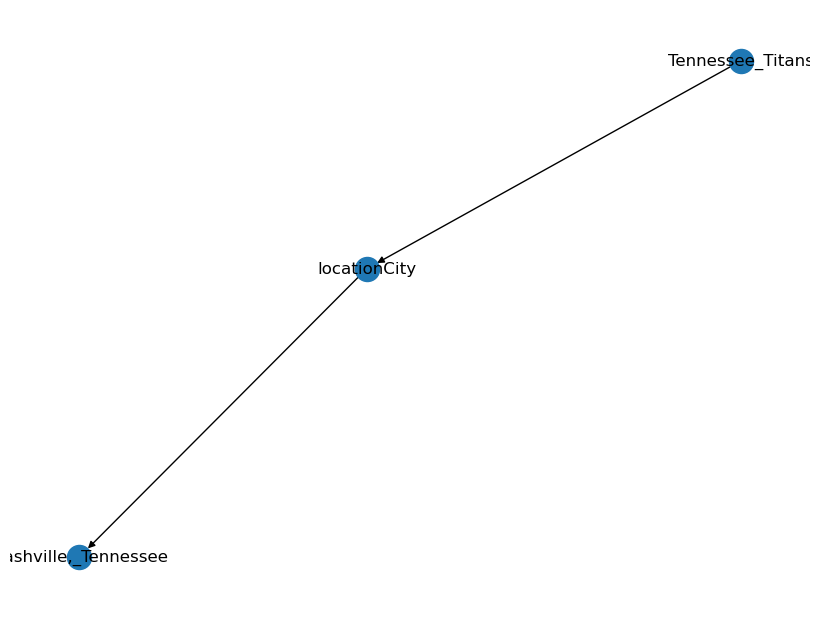

Decoded Input: 
 translate graph to text:  Tennessee_Titans  locationCity  Nashville,_Tennessee
Decoded Target: 
 Tennessee Titans are based in Nashville, Tennessee.
DataBatch(x=[1, 512], edge_index=[2, 2], attention_mask=[1, 512], y=[1, 512], batch=[512], ptr=[2])
Original Sample: 
 translate graph to text: <H> Aaron_Bertram  <R>  activeYearsStartYear  <T>  "1998"^^xsd:gYear 
 Aaron Bertram started performing in 1998.
NetworkX Graph: 
 [('Aaron_Bertram', 'activeYearsStartYear', 0), ('activeYearsStartYear', '"1998"^^xsd:gYear', 0)]


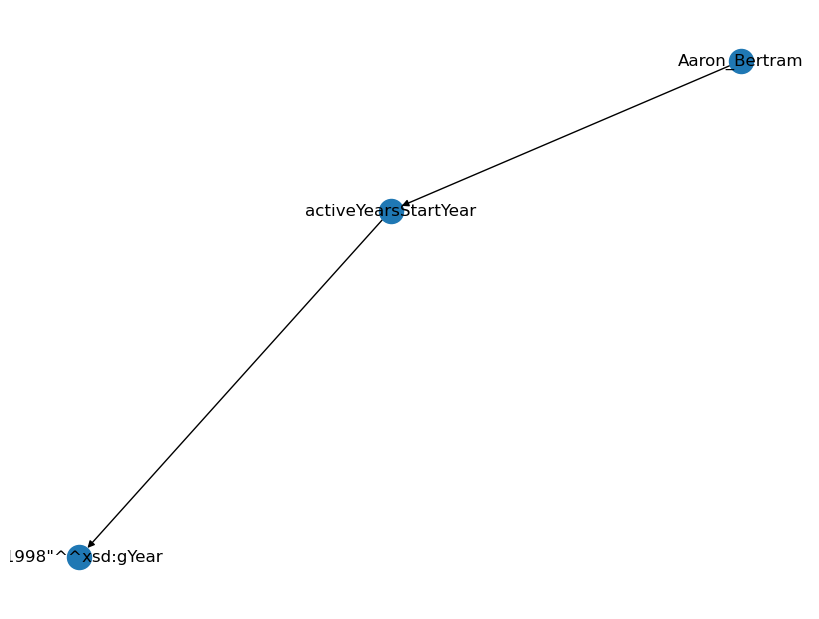

Decoded Input: 
 translate graph to text:  Aaron_Bertram  activeYearsStartYear  "1998"xsd:gYear
Decoded Target: 
 Aaron Bertram started performing in 1998.
DataBatch(x=[1, 512], edge_index=[2, 2], attention_mask=[1, 512], y=[1, 512], batch=[512], ptr=[2])
Original Sample: 
 translate graph to text: <H> Aaron_Deer  <R>  associatedBand  <T>  The_Horns_of_Happiness 
 Aaron Deer collaborates with The Horns of Happiness.
NetworkX Graph: 
 [('Aaron_Deer', 'associatedBand', 0), ('associatedBand', 'The_Horns_of_Happiness', 0)]


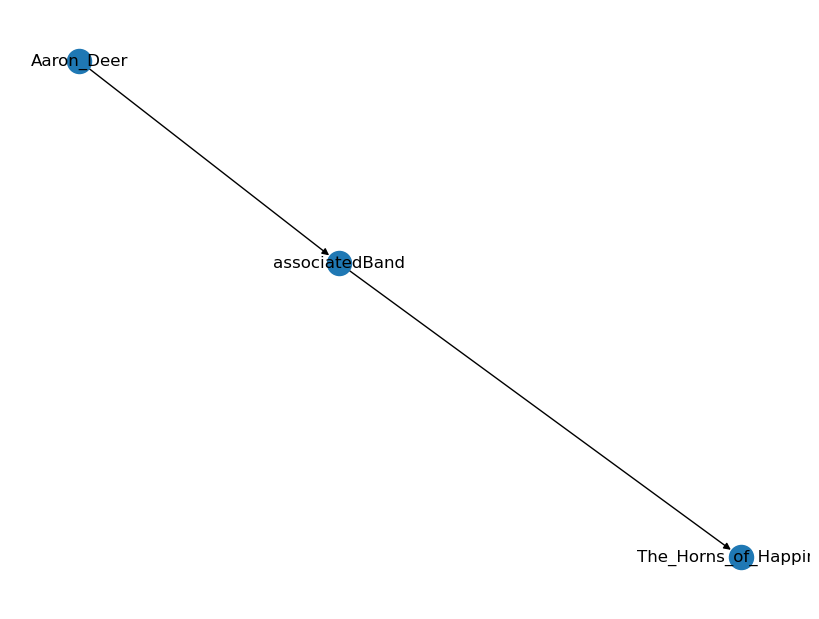

Decoded Input: 
 translate graph to text:  Aaron_Deer  associatedBand  The_Horns_of_Happiness
Decoded Target: 
 Aaron Deer collaborates with The Horns of Happiness.
DataBatch(x=[1, 512], edge_index=[2, 2], attention_mask=[1, 512], y=[1, 512], batch=[512], ptr=[2])
Original Sample: 
 translate graph to text: <H> Aaron_Deer  <R>  label  <T>  Kill_Rock_Stars 
 Aaron Deer has been signed to the record label Kill Rock Stars.
NetworkX Graph: 
 [('Aaron_Deer', 'label', 0), ('label', 'Kill_Rock_Stars', 0)]


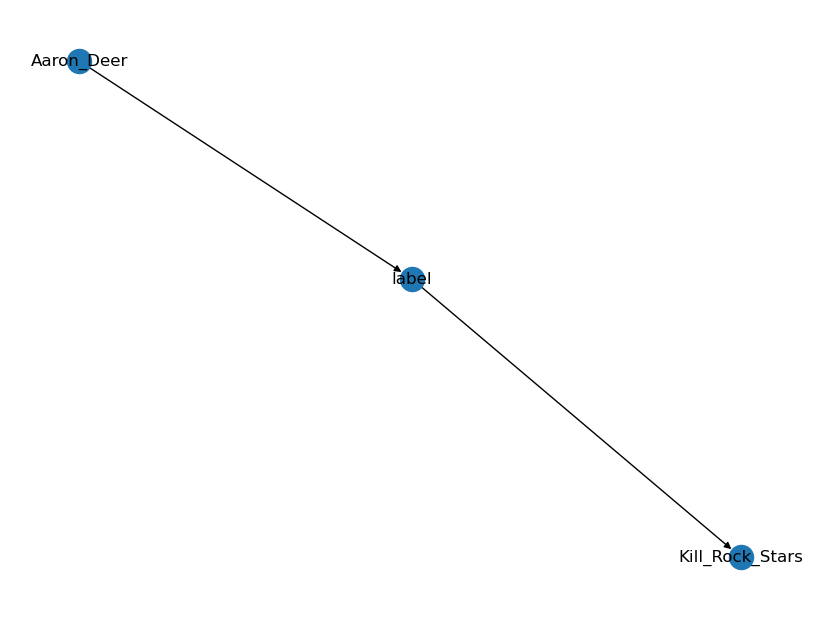

Decoded Input: 
 translate graph to text:  Aaron_Deer  label  Kill_Rock_Stars
Decoded Target: 
 Aaron Deer has been signed to the record label Kill Rock Stars.
DataBatch(x=[1, 512], edge_index=[2, 2], attention_mask=[1, 512], y=[1, 512], batch=[512], ptr=[2])
Original Sample: 
 translate graph to text: <H> Aaron_Turner  <R>  genre  <T>  Avant-garde_metal 
 Aaron Turner falls in the genre of avant-garde metal music.
NetworkX Graph: 
 [('Aaron_Turner', 'genre', 0), ('genre', 'Avant-garde_metal', 0)]


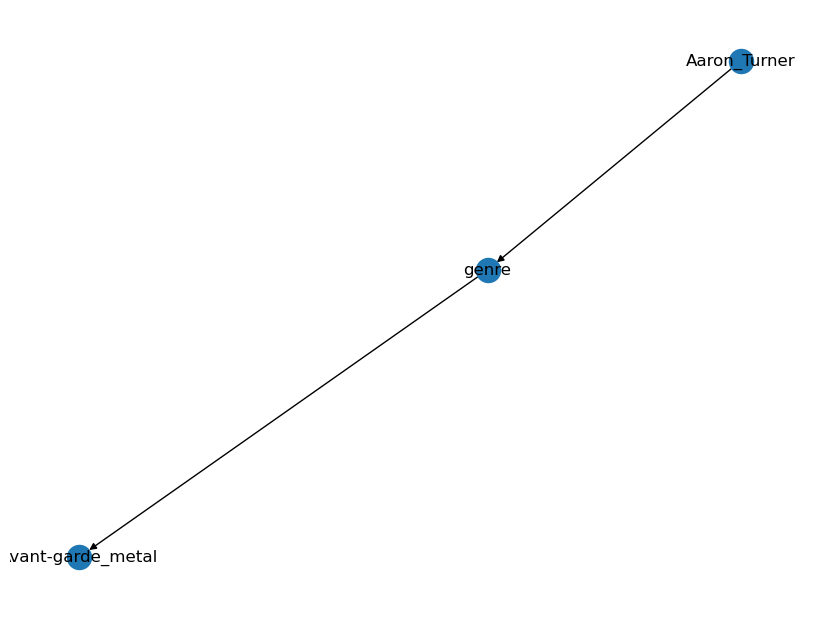

Decoded Input: 
 translate graph to text:  Aaron_Turner  genre  Avant-garde_metal
Decoded Target: 
 Aaron Turner falls in the genre of avant-garde metal music.
DataBatch(x=[1, 512], edge_index=[2, 2], attention_mask=[1, 512], y=[1, 512], batch=[512], ptr=[2])
Original Sample: 
 translate graph to text: <H> Aaron_Turner  <R>  genre  <T>  Progressive_metal 
 Aaron Turner plays progressive metal music.
NetworkX Graph: 
 [('Aaron_Turner', 'genre', 0), ('genre', 'Progressive_metal', 0)]


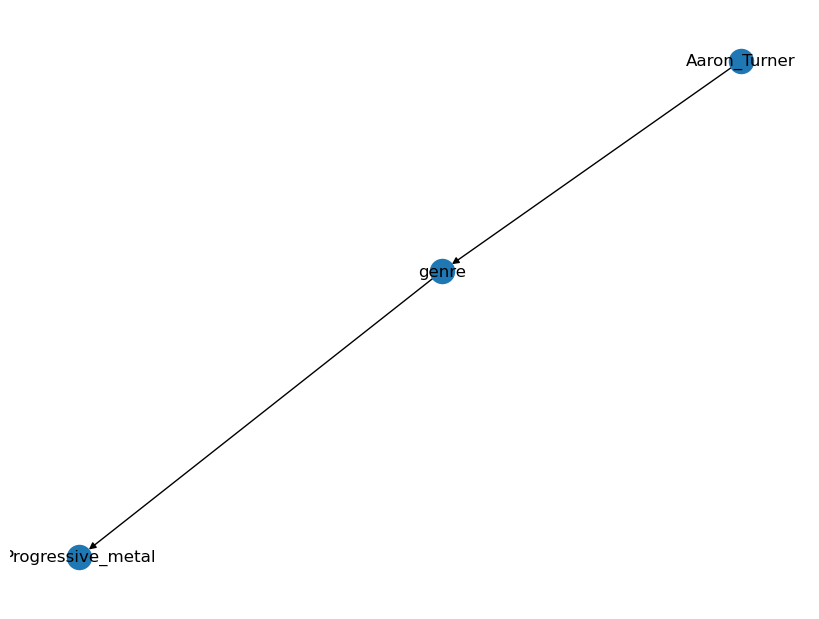

Decoded Input: 
 translate graph to text:  Aaron_Turner  genre  Progressive_metal
Decoded Target: 
 Aaron Turner plays progressive metal music.
DataBatch(x=[1, 512], edge_index=[2, 2], attention_mask=[1, 512], y=[1, 512], batch=[512], ptr=[2])
Original Sample: 
 translate graph to text: <H> Abradab  <R>  background  <T>  "solo_singer"@en 
 Abradab has a background as a solo singer.
NetworkX Graph: 
 [('Abradab', 'background', 0), ('background', '"solo_singer"@en', 0)]


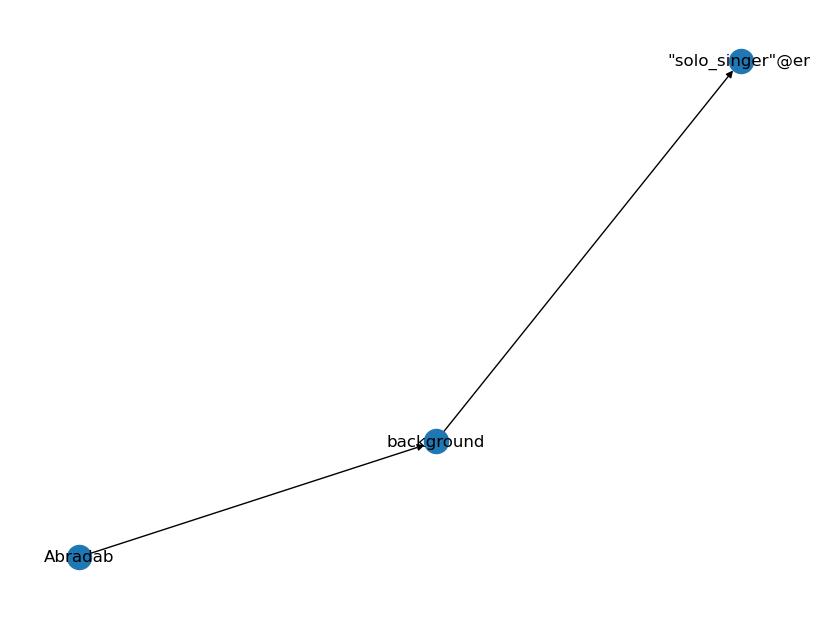

Decoded Input: 
 translate graph to text:  Abradab  background  "solo_singer"@en
Decoded Target: 
 Abradab has a background as a solo singer.
DataBatch(x=[1, 512], edge_index=[2, 2], attention_mask=[1, 512], y=[1, 512], batch=[512], ptr=[2])
Original Sample: 
 translate graph to text: <H> Abradab  <R>  dateOfBirth  <T>  "1978-11-12"^^xsd:date 
 Abradab was born on November 12th 1978.
NetworkX Graph: 
 [('Abradab', 'dateOfBirth', 0), ('dateOfBirth', '"1978-11-12"^^xsd:date', 0)]


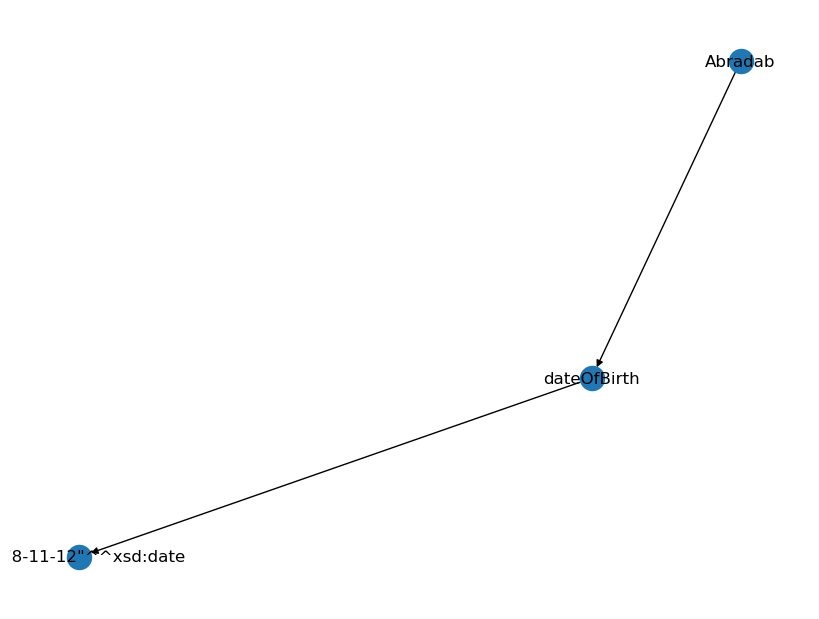

Decoded Input: 
 translate graph to text:  Abradab  dateOfBirth  "1978-11-12"xsd:date
Decoded Target: 
 Abradab was born on November 12th 1978.
DataBatch(x=[1, 512], edge_index=[2, 2], attention_mask=[1, 512], y=[1, 512], batch=[512], ptr=[2])
Original Sample: 
 translate graph to text: <H> Abradab  <R>  placeOfBirth  <T>  Poland 
 The birth place of Abradab is Poland.
NetworkX Graph: 
 [('Abradab', 'placeOfBirth', 0), ('placeOfBirth', 'Poland', 0)]


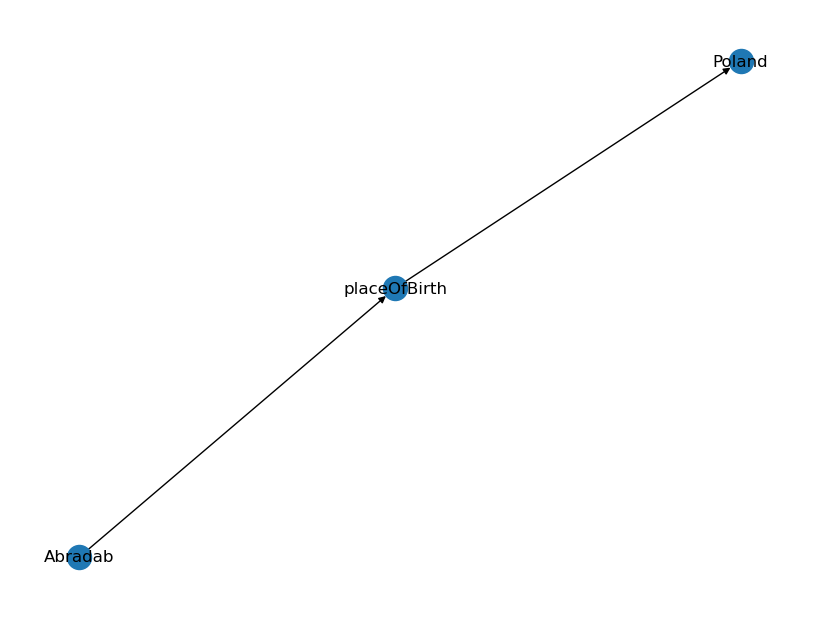

Decoded Input: 
 translate graph to text:  Abradab  placeOfBirth  Poland
Decoded Target: 
 The birth place of Abradab is Poland.
DataBatch(x=[1, 512], edge_index=[2, 2], attention_mask=[1, 512], y=[1, 512], batch=[512], ptr=[2])
Original Sample: 
 translate graph to text: <H> Abradab  <R>  genre  <T>  Hip_hop_music 
 The musical genre of Abradab is hip hop music.
NetworkX Graph: 
 [('Abradab', 'genre', 0), ('genre', 'Hip_hop_music', 0)]


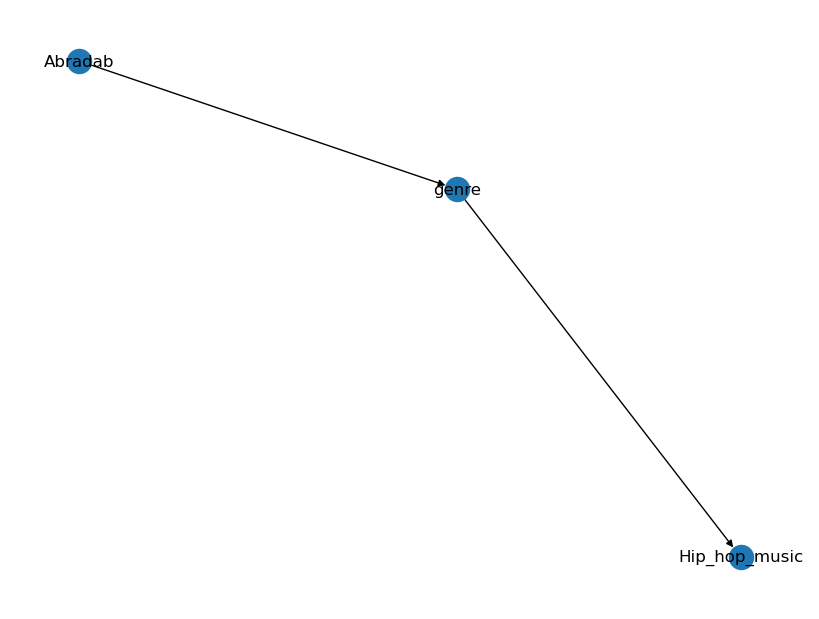

Decoded Input: 
 translate graph to text:  Abradab  genre  Hip_hop_music
Decoded Target: 
 The musical genre of Abradab is hip hop music.
DataBatch(x=[1, 512], edge_index=[2, 2], attention_mask=[1, 512], y=[1, 512], batch=[512], ptr=[2])
Original Sample: 
 translate graph to text: <H> Agustín_Barboza  <R>  genre  <T>  Guarania_(music) 
 Agustín Barboza plays Guarania style of music.
NetworkX Graph: 
 [('Agustín_Barboza', 'genre', 0), ('genre', 'Guarania_', 0)]


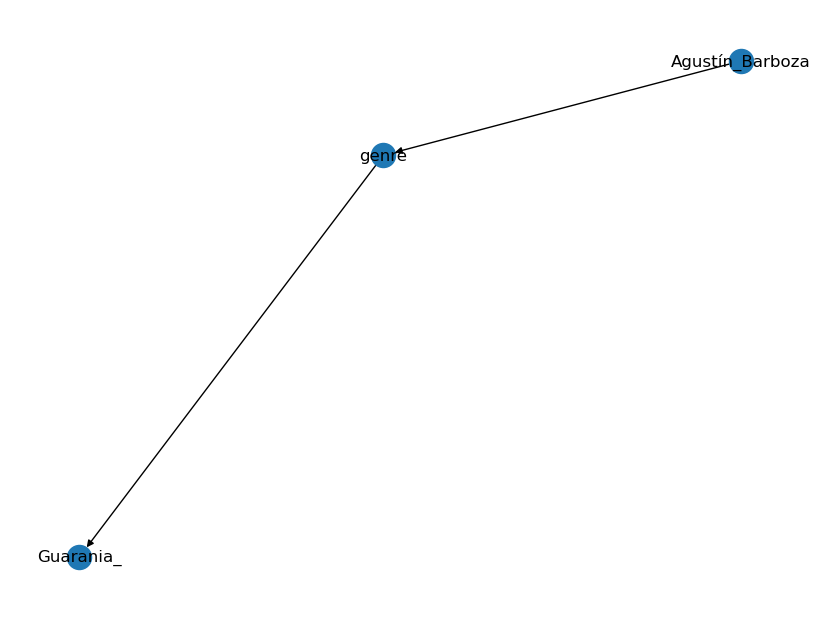

Decoded Input: 
 translate graph to text:  Agustn_Barboza  genre  Guarania_(music)
Decoded Target: 
 Agustn Barboza plays Guarania style of music.
DataBatch(x=[1, 512], edge_index=[2, 2], attention_mask=[1, 512], y=[1, 512], batch=[512], ptr=[2])
Original Sample: 
 translate graph to text: <H> Ahmet_Ertegun  <R>  placeOfBirth  <T>  "Istanbul, Turkey"@en 
 Ahmet Ertegun was born in Istanbul, Turkey.
NetworkX Graph: 
 [('Ahmet_Ertegun', 'placeOfBirth', 0), ('placeOfBirth', '"Istanbul, Turkey"@en', 0)]


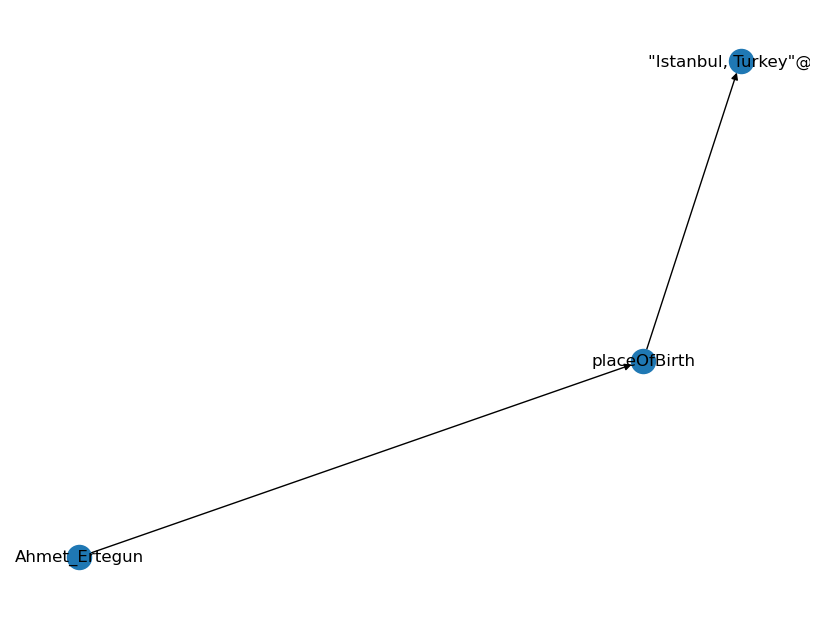

Decoded Input: 
 translate graph to text:  Ahmet_Ertegun  placeOfBirth  "Istanbul, Turkey"@en
Decoded Target: 
 Ahmet Ertegun was born in Istanbul, Turkey.
DataBatch(x=[1, 512], edge_index=[2, 2], attention_mask=[1, 512], y=[1, 512], batch=[512], ptr=[2])
Original Sample: 
 translate graph to text: <H> Alan_Frew  <R>  genre  <T>  Rock_music 
 Alan Frew is a performer of rock music.
NetworkX Graph: 
 [('Alan_Frew', 'genre', 0), ('genre', 'Rock_music', 0)]


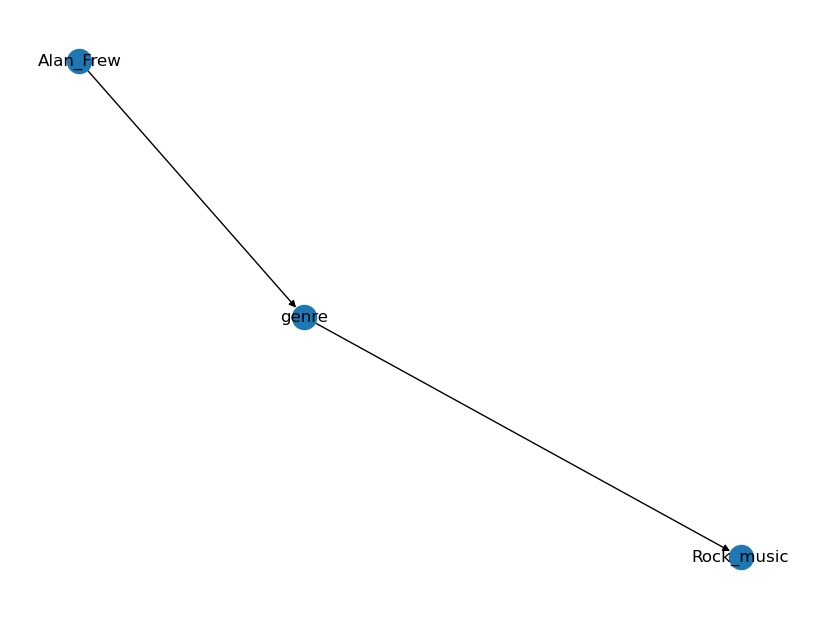

Decoded Input: 
 translate graph to text:  Alan_Frew  genre  Rock_music
Decoded Target: 
 Alan Frew is a performer of rock music.
DataBatch(x=[1, 512], edge_index=[2, 2], attention_mask=[1, 512], y=[1, 512], batch=[512], ptr=[2])
Original Sample: 
 translate graph to text: <H> Albennie_Jones  <R>  associatedBand  <T>  Sammy_Price 
 Albennie Jones has worked with the musical artist Sammy Price.
NetworkX Graph: 
 [('Albennie_Jones', 'associatedBand', 0), ('associatedBand', 'Sammy_Price', 0)]


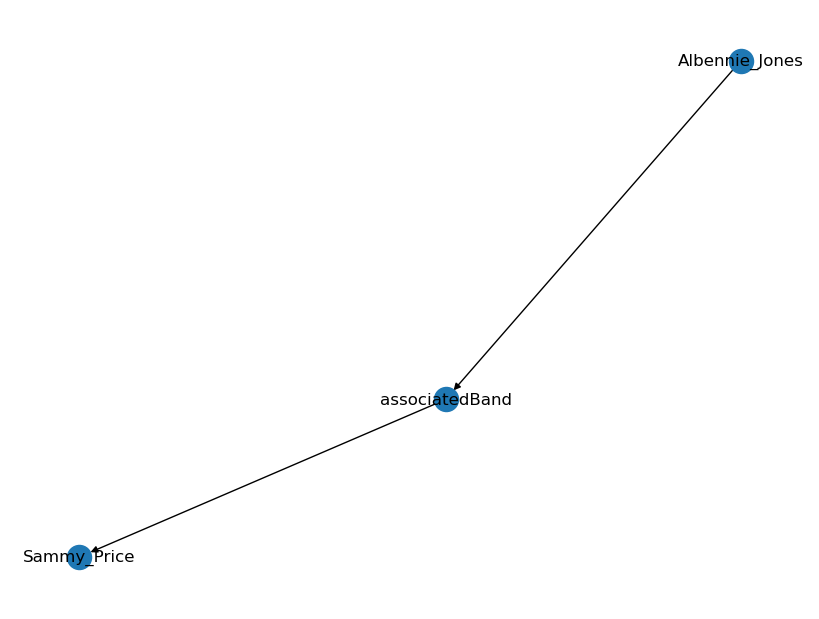

Decoded Input: 
 translate graph to text:  Albennie_Jones  associatedBand  Sammy_Price
Decoded Target: 
 Albennie Jones has worked with the musical artist Sammy Price.
DataBatch(x=[1, 512], edge_index=[2, 2], attention_mask=[1, 512], y=[1, 512], batch=[512], ptr=[2])
Original Sample: 
 translate graph to text: <H> Aleksandra_Kovač  <R>  background  <T>  "solo_singer"@en 
 Aleksandra Kovac is a solo singer.
NetworkX Graph: 
 [('Aleksandra_Kovač', 'background', 0), ('background', '"solo_singer"@en', 0)]


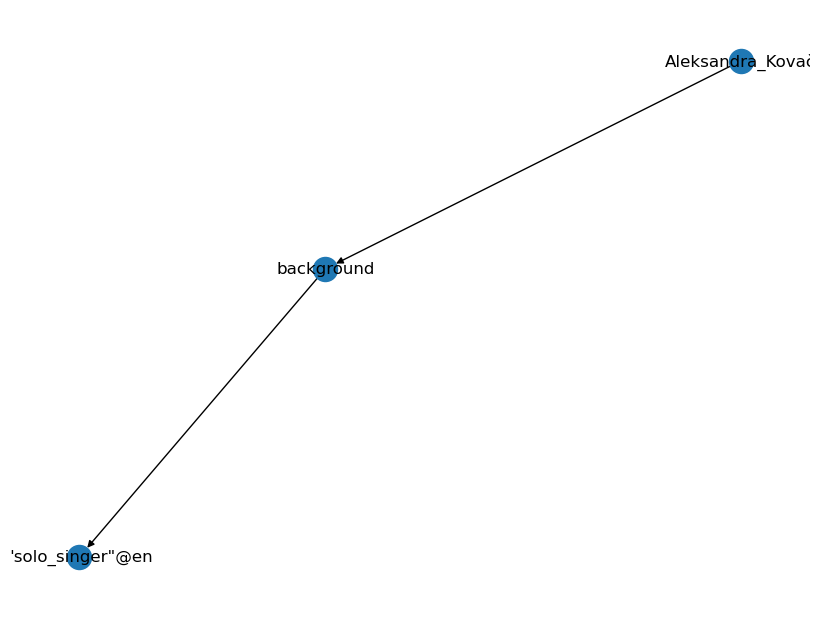

Decoded Input: 
 translate graph to text:  Aleksandra_Kova  background  "solo_singer"@en
Decoded Target: 
 Aleksandra Kovac is a solo singer.
DataBatch(x=[1, 512], edge_index=[2, 2], attention_mask=[1, 512], y=[1, 512], batch=[512], ptr=[2])
Original Sample: 
 translate graph to text: <H> Aleksandra_Kovač  <R>  birthPlace  <T>  Yugoslavia 
 Aleksandra Kovac was born in Yugoslavia.
NetworkX Graph: 
 [('Aleksandra_Kovač', 'birthPlace', 0), ('birthPlace', 'Yugoslavia', 0)]


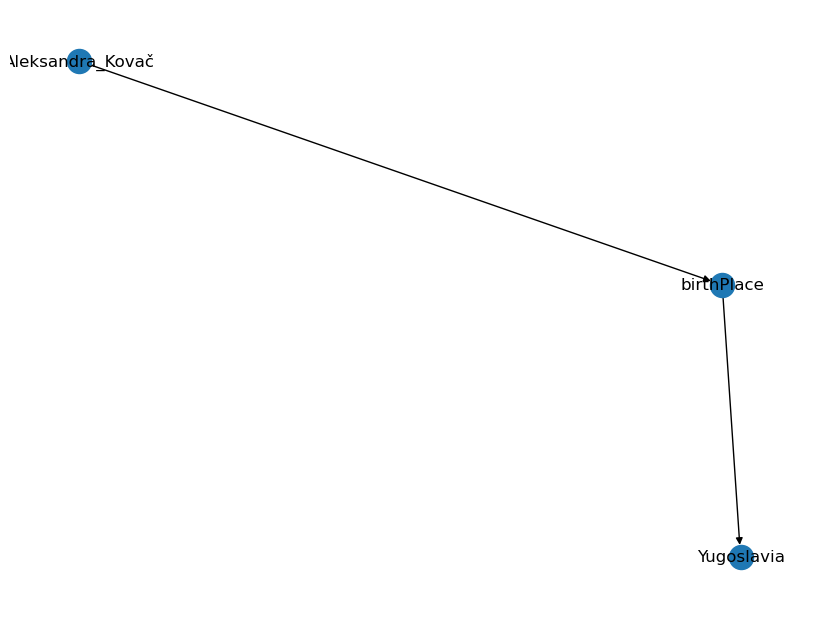

Decoded Input: 
 translate graph to text:  Aleksandra_Kova  birthPlace  Yugoslavia
Decoded Target: 
 Aleksandra Kovac was born in Yugoslavia.
DataBatch(x=[1, 512], edge_index=[2, 2], attention_mask=[1, 512], y=[1, 512], batch=[512], ptr=[2])
Original Sample: 
 translate graph to text: <H> Aleksandra_Kovač  <R>  genre  <T>  Rhythm_and_blues 
 The musical genre of Aleksandra Kovac is rhythm and blues.
NetworkX Graph: 
 [('Aleksandra_Kovač', 'genre', 0), ('genre', 'Rhythm_and_blues', 0)]


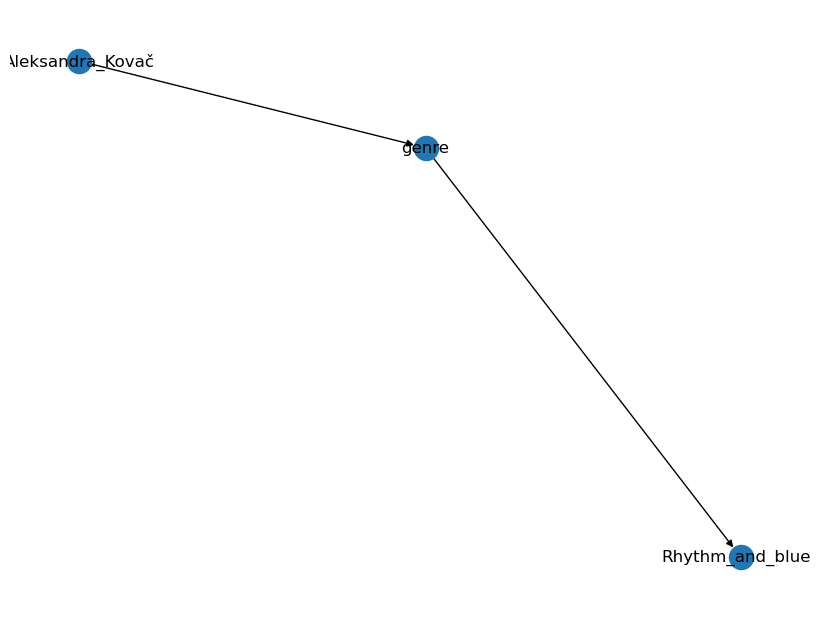

Decoded Input: 
 translate graph to text:  Aleksandra_Kova  genre  Rhythm_and_blues
Decoded Target: 
 The musical genre of Aleksandra Kovac is rhythm and blues.
DataBatch(x=[1, 512], edge_index=[2, 2], attention_mask=[1, 512], y=[1, 512], batch=[512], ptr=[2])
Original Sample: 
 translate graph to text: <H> Aleksandra_Kovač  <R>  genre  <T>  Soul_music 
 Aleksandra Kovač's genre is soul music.
NetworkX Graph: 
 [('Aleksandra_Kovač', 'genre', 0), ('genre', 'Soul_music', 0)]


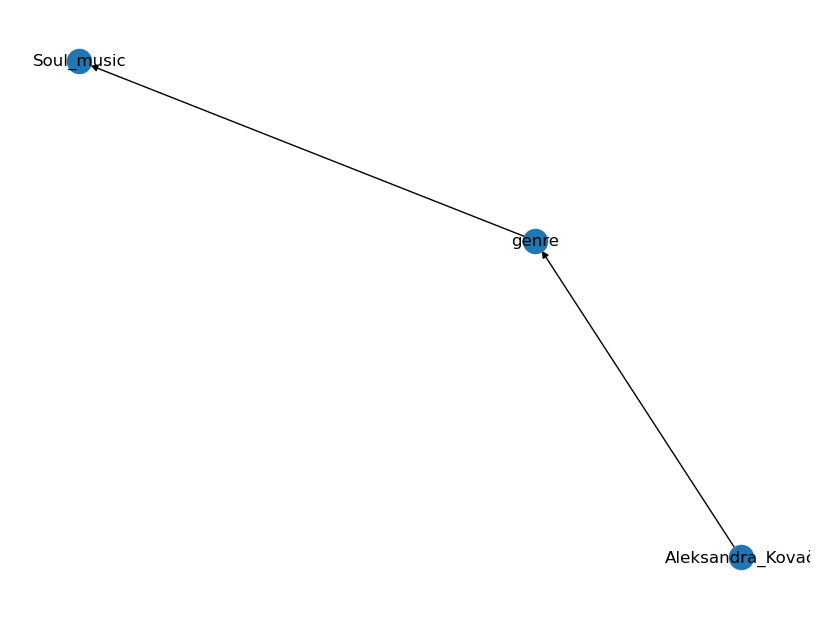

Decoded Input: 
 translate graph to text:  Aleksandra_Kova  genre  Soul_music
Decoded Target: 
 Aleksandra Kova's genre is soul music.
DataBatch(x=[1, 512], edge_index=[2, 2], attention_mask=[1, 512], y=[1, 512], batch=[512], ptr=[2])
Original Sample: 
 translate graph to text: <H> Alex_Day  <R>  genre  <T>  Synthpop 
 The musical genre of Alex Day is Synthpop.
NetworkX Graph: 
 [('Alex_Day', 'genre', 0), ('genre', 'Synthpop', 0)]


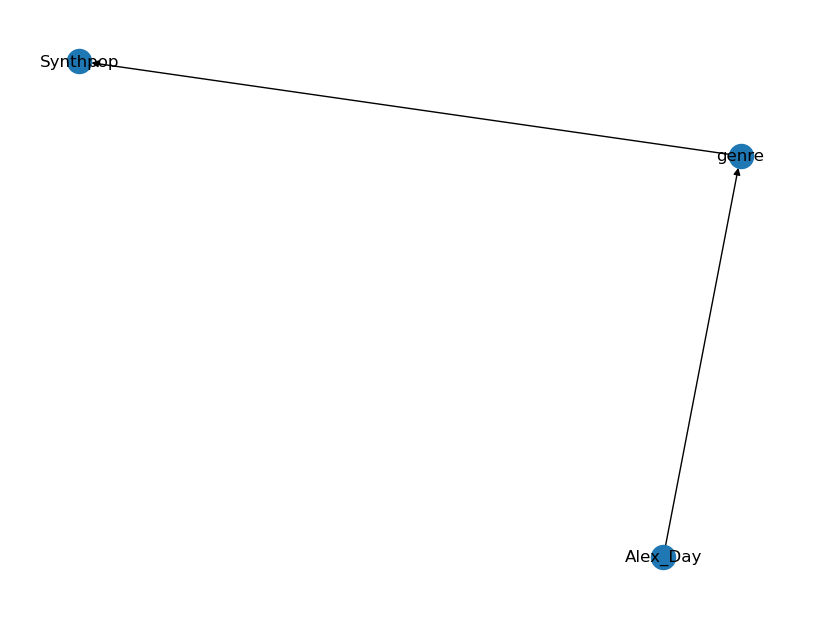

Decoded Input: 
 translate graph to text:  Alex_Day  genre  Synthpop
Decoded Target: 
 The musical genre of Alex Day is Synthpop.
DataBatch(x=[1, 512], edge_index=[2, 2], attention_mask=[1, 512], y=[1, 512], batch=[512], ptr=[2])
Original Sample: 
 translate graph to text: <H> Alfredo_Zitarrosa  <R>  associatedBand  <T>  Héctor_Numa_Moraes 
 Alfredo Zitarrosa is associated with fellow musician Héctor Numa Moraes.
NetworkX Graph: 
 [('Alfredo_Zitarrosa', 'associatedBand', 0), ('associatedBand', 'Héctor_Numa_Moraes', 0)]


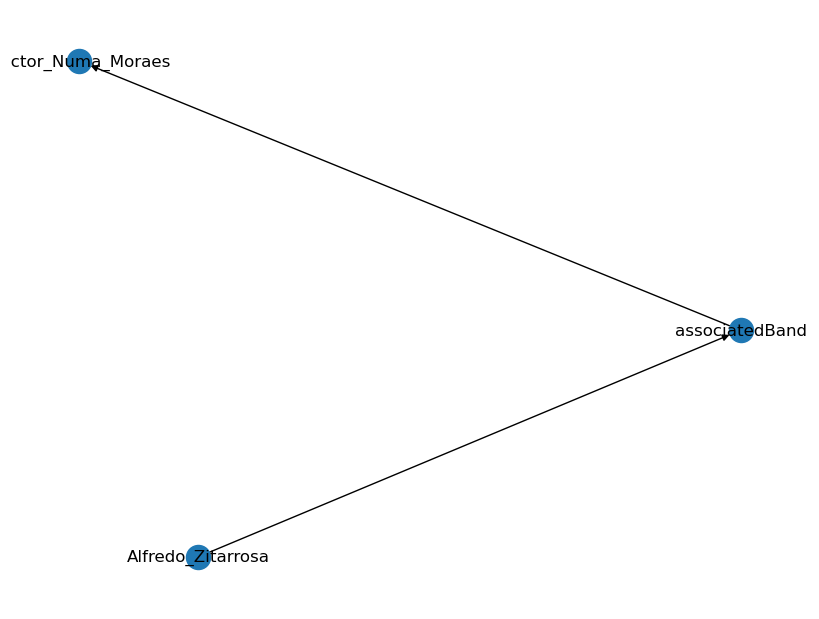

Decoded Input: 
 translate graph to text:  Alfredo_Zitarrosa  associatedBand  Héctor_Numa_Moraes
Decoded Target: 
 Alfredo Zitarrosa is associated with fellow musician Héctor Numa Moraes.
DataBatch(x=[1, 512], edge_index=[2, 2], attention_mask=[1, 512], y=[1, 512], batch=[512], ptr=[2])
Original Sample: 
 translate graph to text: <H> Alfredo_Zitarrosa  <R>  birthPlace  <T>  Montevideo 
 Montevideo is the birth place of Alfredo Zitarrosa.
NetworkX Graph: 
 [('Alfredo_Zitarrosa', 'birthPlace', 0), ('birthPlace', 'Montevideo', 0)]


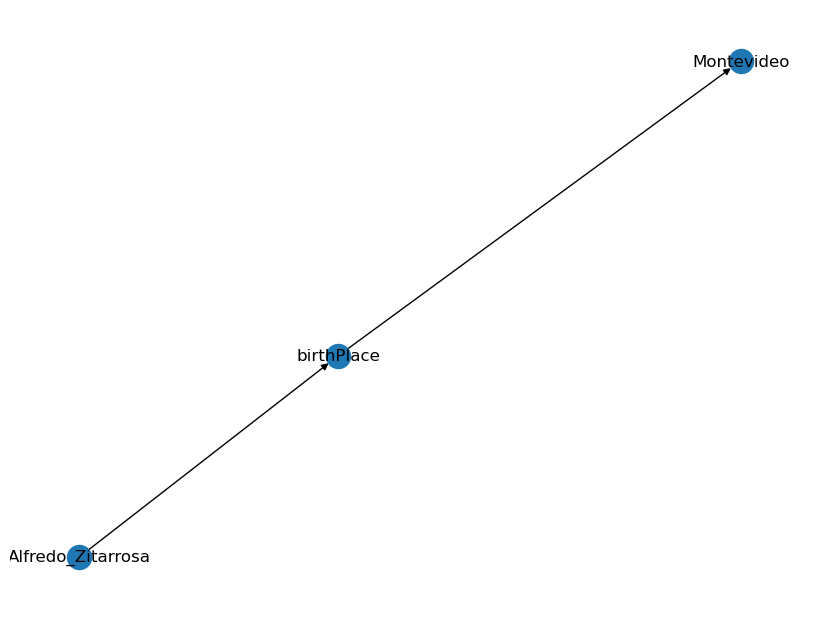

Decoded Input: 
 translate graph to text:  Alfredo_Zitarrosa  birthPlace  Montevideo
Decoded Target: 
 Montevideo is the birth place of Alfredo Zitarrosa.
DataBatch(x=[1, 512], edge_index=[2, 2], attention_mask=[1, 512], y=[1, 512], batch=[512], ptr=[2])
Original Sample: 
 translate graph to text: <H> Alfredo_Zitarrosa  <R>  deathPlace  <T>  Uruguay 
 Alfredo Zitarrosa died in Uruguay.
NetworkX Graph: 
 [('Alfredo_Zitarrosa', 'deathPlace', 0), ('deathPlace', 'Uruguay', 0)]


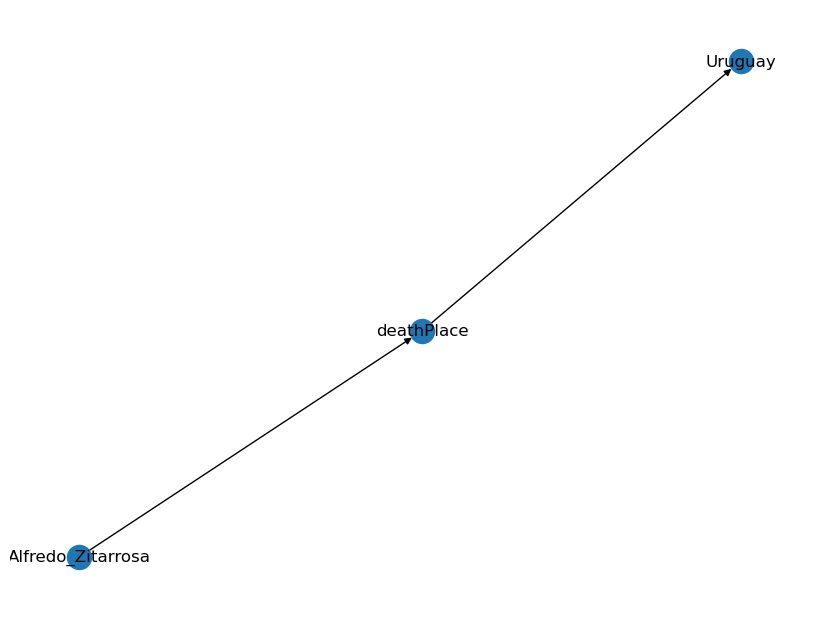

Decoded Input: 
 translate graph to text:  Alfredo_Zitarrosa  deathPlace  Uruguay
Decoded Target: 
 Alfredo Zitarrosa died in Uruguay.
DataBatch(x=[1, 512], edge_index=[2, 2], attention_mask=[1, 512], y=[1, 512], batch=[512], ptr=[2])
Original Sample: 
 translate graph to text: <H> Alfredo_Zitarrosa  <R>  recordLabel  <T>  RCA_Records 
 Alfredo Zitarrosa was signed to the RCA Records label.
NetworkX Graph: 
 [('Alfredo_Zitarrosa', 'recordLabel', 0), ('recordLabel', 'RCA_Records', 0)]


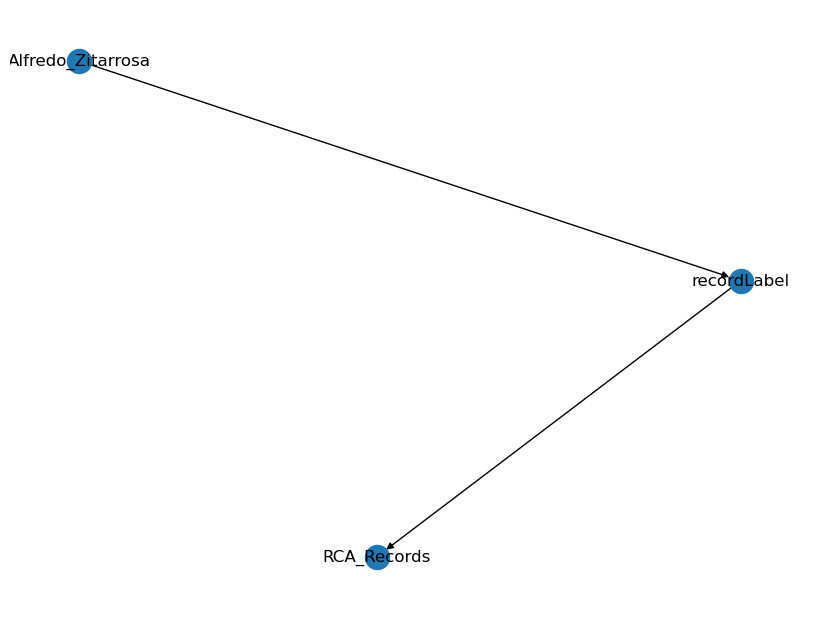

Decoded Input: 
 translate graph to text:  Alfredo_Zitarrosa  recordLabel  RCA_Records
Decoded Target: 
 Alfredo Zitarrosa was signed to the RCA Records label.
DataBatch(x=[1, 512], edge_index=[2, 2], attention_mask=[1, 512], y=[1, 512], batch=[512], ptr=[2])
Original Sample: 
 translate graph to text: <H> Alison_O'Donnell  <R>  activeYearsStartYear  <T>  "1963"^^xsd:gYear 
 Alison O'Donnell started performing in 1963.
NetworkX Graph: 
 [("Alison_O'Donnell", 'activeYearsStartYear', 0), ('activeYearsStartYear', '"1963"^^xsd:gYear', 0)]


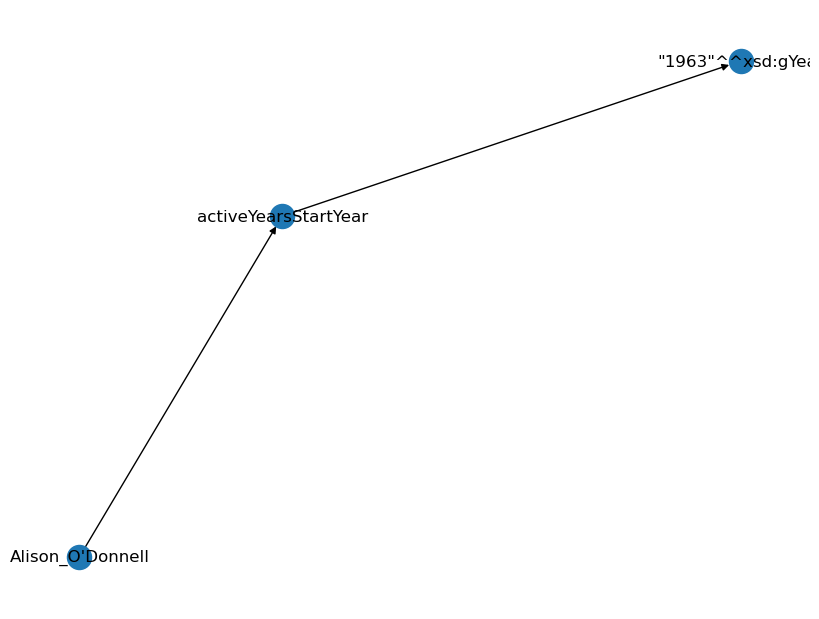

Decoded Input: 
 translate graph to text:  Alison_O'Donnell  activeYearsStartYear  "1963"xsd:gYear
Decoded Target: 
 Alison O'Donnell started performing in 1963.
DataBatch(x=[1, 512], edge_index=[2, 2], attention_mask=[1, 512], y=[1, 512], batch=[512], ptr=[2])
Original Sample: 
 translate graph to text: <H> Alison_O'Donnell  <R>  genre  <T>  Jazz 
 Alison O'Donnell plays jazz music.
NetworkX Graph: 
 [("Alison_O'Donnell", 'genre', 0), ('genre', 'Jazz', 0)]


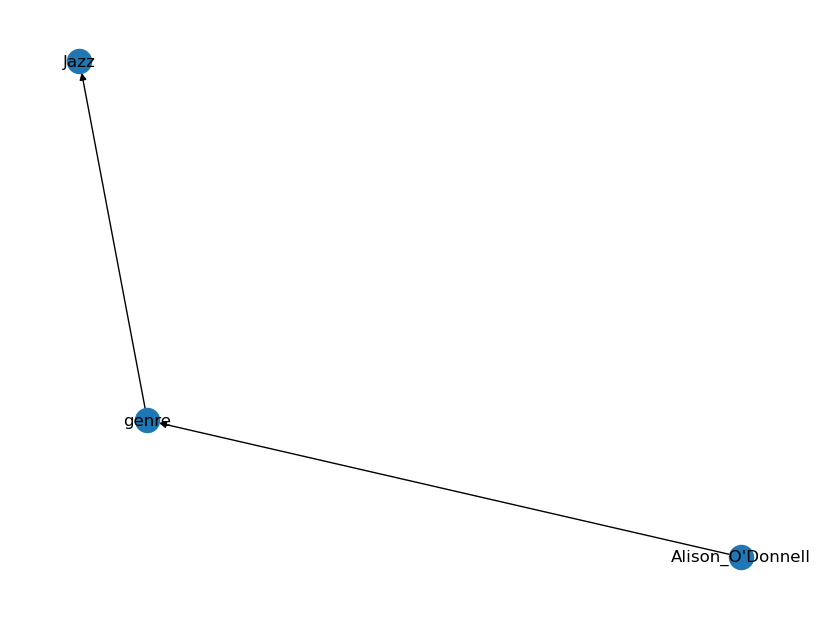

Decoded Input: 
 translate graph to text:  Alison_O'Donnell  genre  Jazz
Decoded Target: 
 Alison O'Donnell plays jazz music.
DataBatch(x=[1, 512], edge_index=[2, 2], attention_mask=[1, 512], y=[1, 512], batch=[512], ptr=[2])
Original Sample: 
 translate graph to text: <H> Alison_O'Donnell  <R>  instrument  <T>  "Voice, bodhrán, percussion, autoharp"@en 
 Alison O'Donnell is a singer and also plays the bodhran, percussion and autoharp.
NetworkX Graph: 
 [("Alison_O'Donnell", 'instrument', 0), ('instrument', '"Voice, bodhrán, percussion, autoharp"@en', 0)]


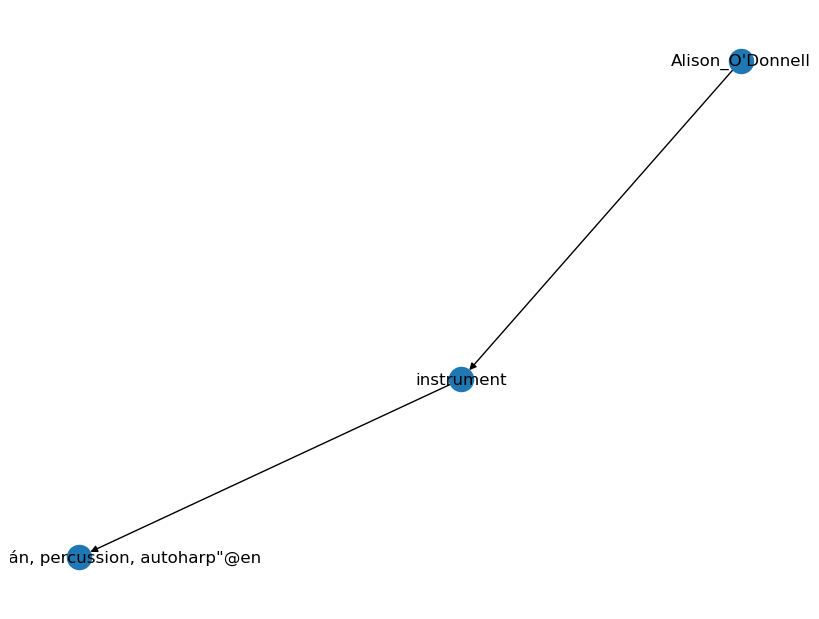

Decoded Input: 
 translate graph to text:  Alison_O'Donnell  instrument  "Voice, bodhrán, percussion, autoharp"@en
Decoded Target: 
 Alison O'Donnell is a singer and also plays the bodhran, percussion and autoharp.
DataBatch(x=[1, 512], edge_index=[2, 2], attention_mask=[1, 512], y=[1, 512], batch=[512], ptr=[2])
Original Sample: 
 translate graph to text: <H> Allen_Forrest  <R>  dateOfBirth  <T>  "1981-02-04"^^xsd:date 
 Allen Forrest was born on February 4, 1981.
NetworkX Graph: 
 [('Allen_Forrest', 'dateOfBirth', 0), ('dateOfBirth', '"1981-02-04"^^xsd:date', 0)]


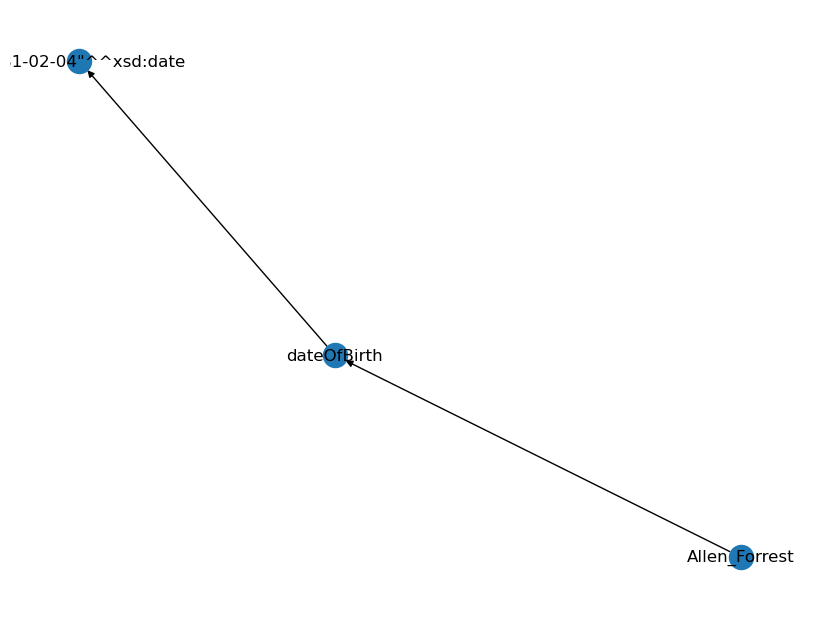

Decoded Input: 
 translate graph to text:  Allen_Forrest  dateOfBirth  "1981-02-04"xsd:date
Decoded Target: 
 Allen Forrest was born on February 4, 1981.
DataBatch(x=[1, 512], edge_index=[2, 2], attention_mask=[1, 512], y=[1, 512], batch=[512], ptr=[2])
Original Sample: 
 translate graph to text: <H> Allen_Forrest  <R>  genre  <T>  Pop_music 
 Allen Forrest plays pop music.
NetworkX Graph: 
 [('Allen_Forrest', 'genre', 0), ('genre', 'Pop_music', 0)]


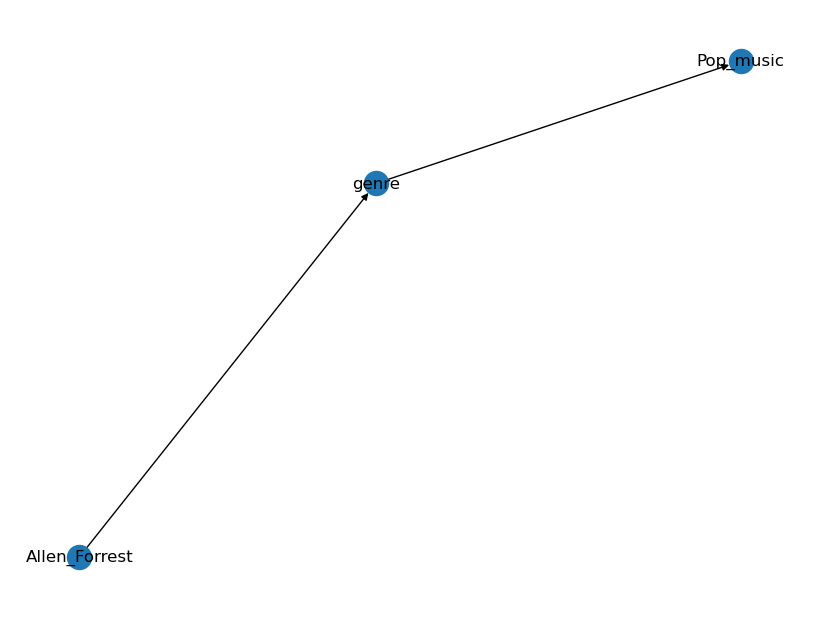

Decoded Input: 
 translate graph to text:  Allen_Forrest  genre  Pop_music
Decoded Target: 
 Allen Forrest plays pop music.
DataBatch(x=[1, 512], edge_index=[2, 2], attention_mask=[1, 512], y=[1, 512], batch=[512], ptr=[2])
Original Sample: 
 translate graph to text: <H> Alligator_Records  <R>  location  <T>  Chicago 
 The location of Alligator Records is Chicago.
NetworkX Graph: 
 [('Alligator_Records', 'location', 0), ('location', 'Chicago', 0)]


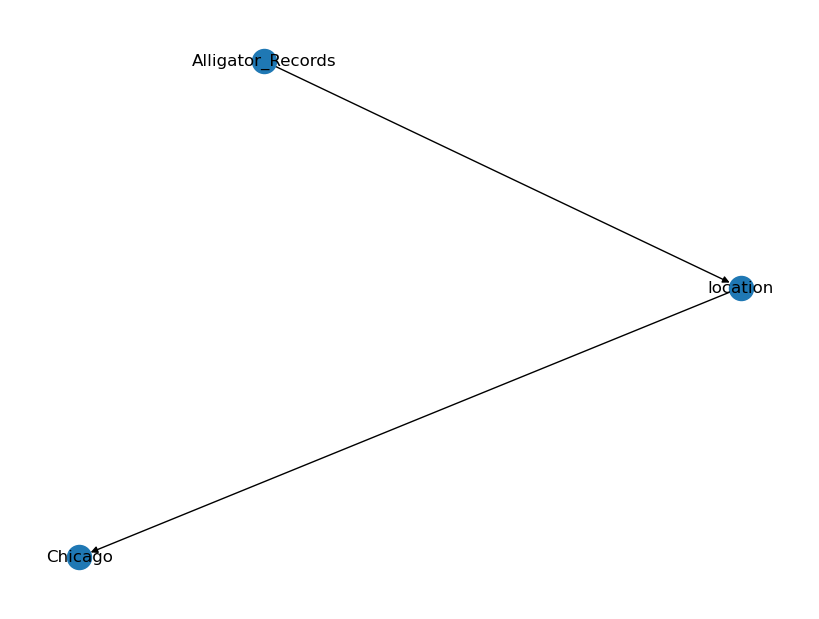

Decoded Input: 
 translate graph to text:  Alligator_Records  location  Chicago
Decoded Target: 
 The location of Alligator Records is Chicago.
DataBatch(x=[1, 512], edge_index=[2, 2], attention_mask=[1, 512], y=[1, 512], batch=[512], ptr=[2])
Original Sample: 
 translate graph to text: <H> Anders_Osborne  <R>  associatedActs  <T>  Johnny_Sansone 
 Anders Osborne is associated with the musical artist Johnny Sansone.
NetworkX Graph: 
 [('Anders_Osborne', 'associatedActs', 0), ('associatedActs', 'Johnny_Sansone', 0)]


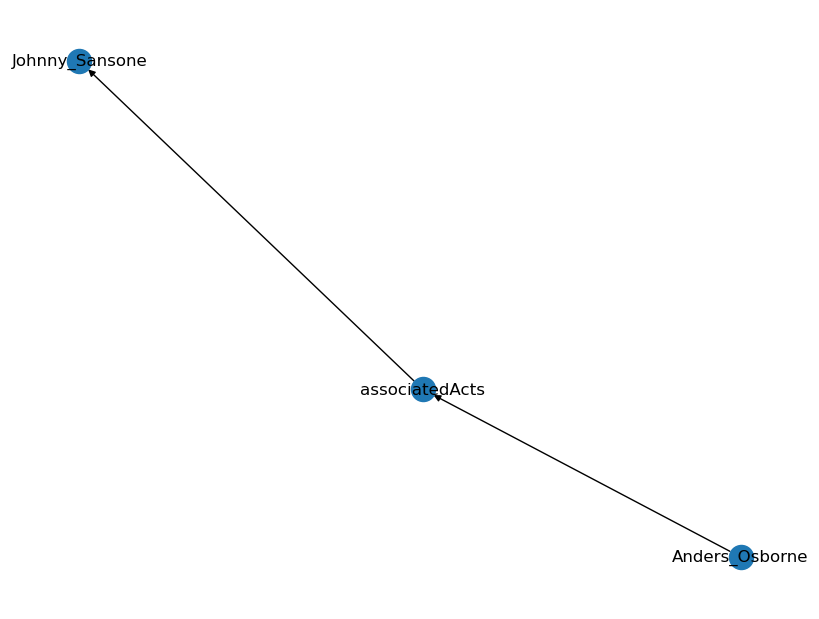

Decoded Input: 
 translate graph to text:  Anders_Osborne  associatedActs  Johnny_Sansone
Decoded Target: 
 Anders Osborne is associated with the musical artist Johnny Sansone.
DataBatch(x=[1, 512], edge_index=[2, 2], attention_mask=[1, 512], y=[1, 512], batch=[512], ptr=[2])
Original Sample: 
 translate graph to text: <H> Anders_Osborne  <R>  genre  <T>  Rhythm_and_blues 
 Anders Osborne performs rhythm and blues music.
NetworkX Graph: 
 [('Anders_Osborne', 'genre', 0), ('genre', 'Rhythm_and_blues', 0)]


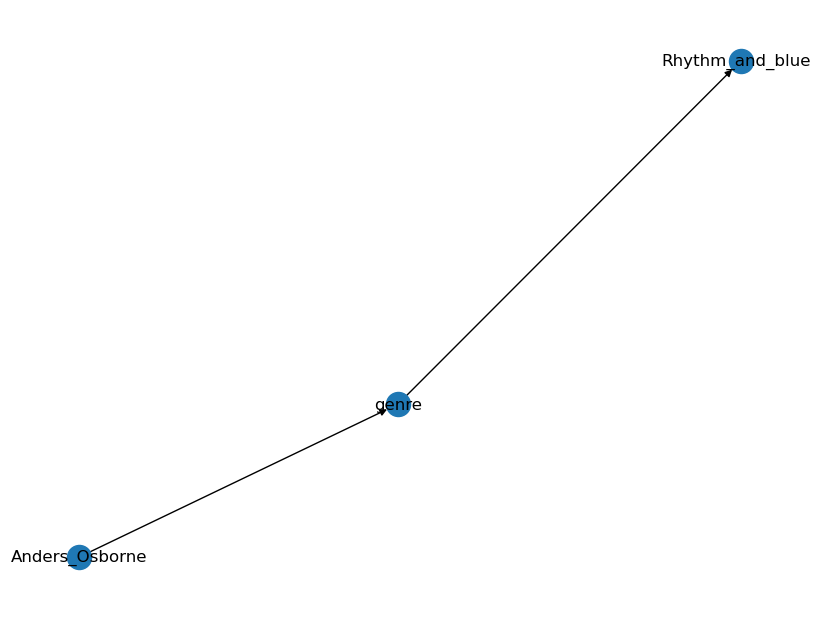

Decoded Input: 
 translate graph to text:  Anders_Osborne  genre  Rhythm_and_blues
Decoded Target: 
 Anders Osborne performs rhythm and blues music.
DataBatch(x=[1, 512], edge_index=[2, 2], attention_mask=[1, 512], y=[1, 512], batch=[512], ptr=[2])
Original Sample: 
 translate graph to text: <H> Anders_Osborne  <R>  label  <T>  Alligator_Records 
 Anders Osborne was signed to the record label 'Alligator Records'.
NetworkX Graph: 
 [('Anders_Osborne', 'label', 0), ('label', 'Alligator_Records', 0)]


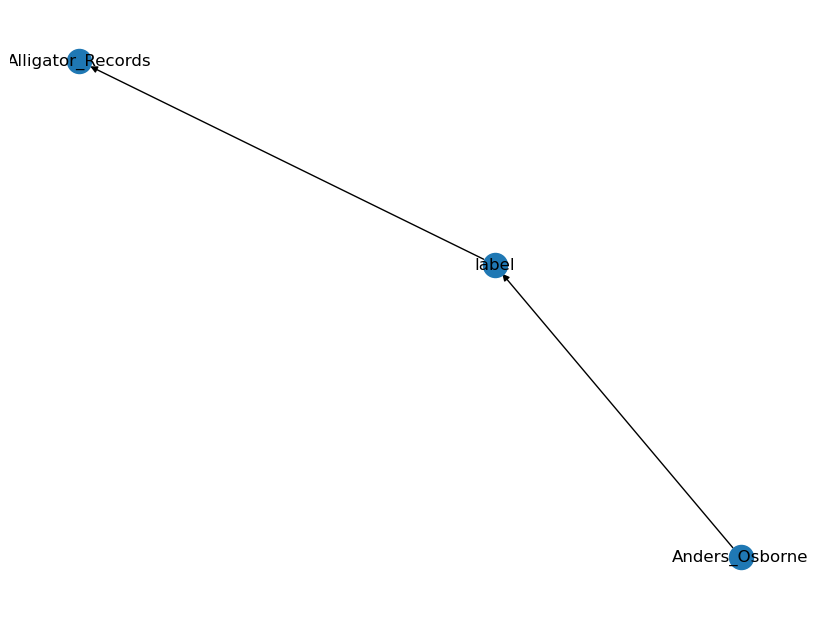

Decoded Input: 
 translate graph to text:  Anders_Osborne  label  Alligator_Records
Decoded Target: 
 Anders Osborne was signed to the record label 'Alligator Records'.
DataBatch(x=[1, 512], edge_index=[2, 2], attention_mask=[1, 512], y=[1, 512], batch=[512], ptr=[2])
Original Sample: 
 translate graph to text: <H> Andra_(singer)  <R>  genre  <T>  Rhythm_and_blues 
 Andra is a rhythm and blues singer.
NetworkX Graph: 
 [('Andra_', 'genre', 0), ('genre', 'Rhythm_and_blues', 0)]


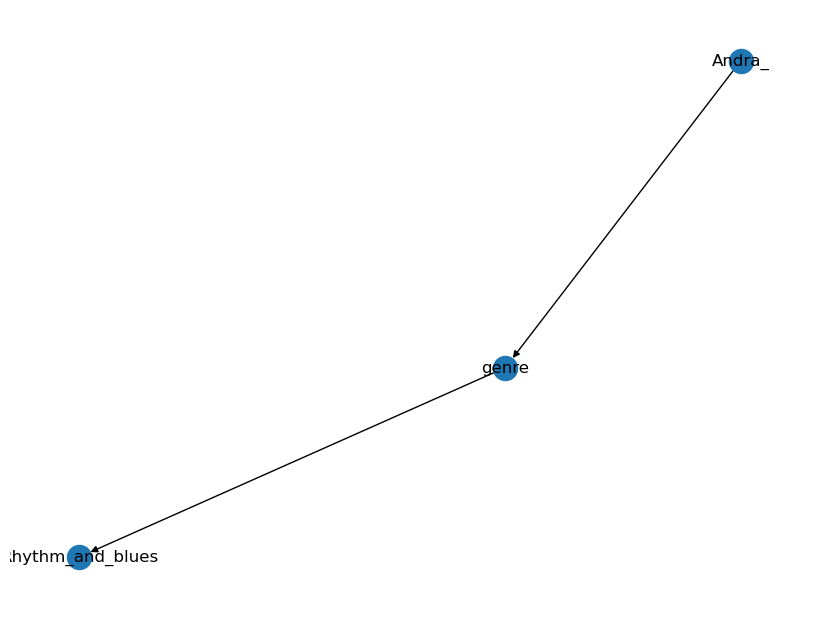

Decoded Input: 
 translate graph to text:  Andra_(singer)  genre  Rhythm_and_blues
Decoded Target: 
 Andra is a rhythm and blues singer.
DataBatch(x=[1, 512], edge_index=[2, 2], attention_mask=[1, 512], y=[1, 512], batch=[512], ptr=[2])
Original Sample: 
 translate graph to text: <H> Andrew_Rayel  <R>  activeYearsStartYear  <T>  "2009"^^xsd:gYear 
 Andrew Rayel began his musical career in 2009.
NetworkX Graph: 
 [('Andrew_Rayel', 'activeYearsStartYear', 0), ('activeYearsStartYear', '"2009"^^xsd:gYear', 0)]


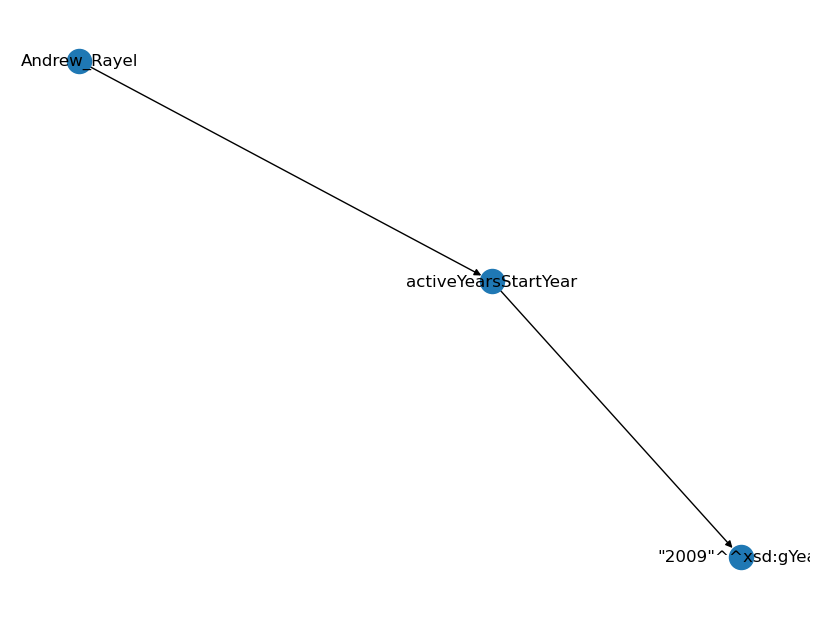

Decoded Input: 
 translate graph to text:  Andrew_Rayel  activeYearsStartYear  "2009"xsd:gYear
Decoded Target: 
 Andrew Rayel began his musical career in 2009.
DataBatch(x=[1, 512], edge_index=[2, 2], attention_mask=[1, 512], y=[1, 512], batch=[512], ptr=[2])
Original Sample: 
 translate graph to text: <H> Andrew_Rayel  <R>  associatedBand  <T>  Christian_Burns 
 Andrew Rayel is associated with Christian Burns.
NetworkX Graph: 
 [('Andrew_Rayel', 'associatedBand', 0), ('associatedBand', 'Christian_Burns', 0)]


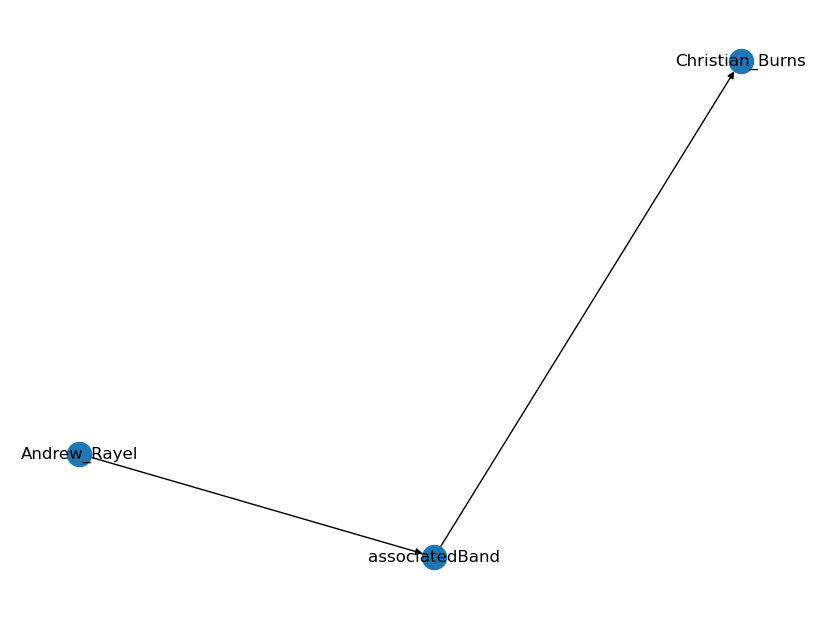

Decoded Input: 
 translate graph to text:  Andrew_Rayel  associatedBand  Christian_Burns
Decoded Target: 
 Andrew Rayel is associated with Christian Burns.
DataBatch(x=[1, 512], edge_index=[2, 2], attention_mask=[1, 512], y=[1, 512], batch=[512], ptr=[2])
Original Sample: 
 translate graph to text: <H> Andrew_Rayel  <R>  placeOfBirth  <T>  "Chișinău, Moldova"@en 
 The birth place of Andrew Rayel is Chisinau, Moldova.
NetworkX Graph: 
 [('Andrew_Rayel', 'placeOfBirth', 0), ('placeOfBirth', '"Chișinău, Moldova"@en', 0)]


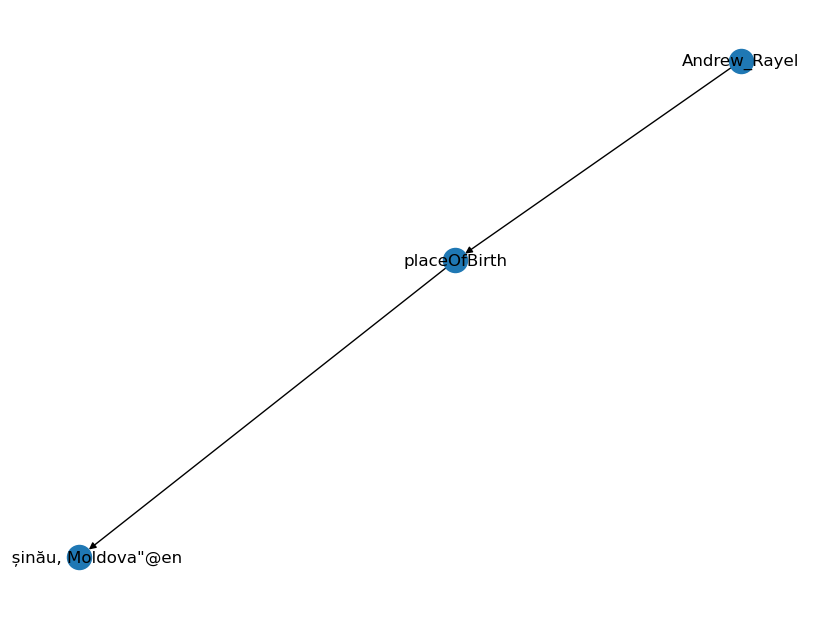

Decoded Input: 
 translate graph to text:  Andrew_Rayel  placeOfBirth  "Chișinău, Moldova"@en
Decoded Target: 
 The birth place of Andrew Rayel is Chisinau, Moldova.
DataBatch(x=[1, 512], edge_index=[2, 2], attention_mask=[1, 512], y=[1, 512], batch=[512], ptr=[2])
Original Sample: 
 translate graph to text: <H> Andrew_White_(musician)  <R>  associatedActs  <T>  Marry_Banilow 
 The musician, Andrew White, is associated with the musical artist, Marry Banilow.
NetworkX Graph: 
 [('Andrew_White_', 'associatedActs', 0), ('associatedActs', 'Marry_Banilow', 0)]


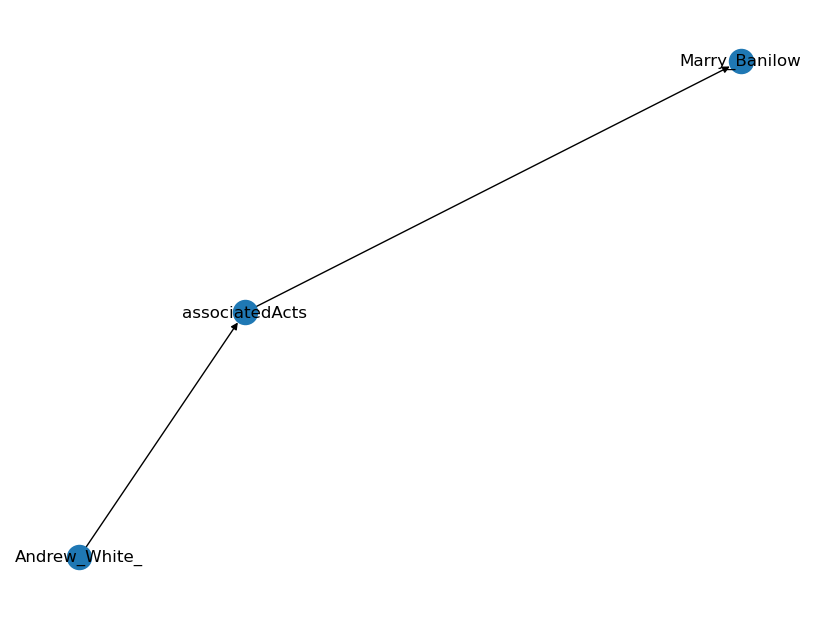

Decoded Input: 
 translate graph to text:  Andrew_White_(musician)  associatedActs  Marry_Banilow
Decoded Target: 
 The musician, Andrew White, is associated with the musical artist, Marry Banilow.
DataBatch(x=[1, 512], edge_index=[2, 2], attention_mask=[1, 512], y=[1, 512], batch=[512], ptr=[2])
Original Sample: 
 translate graph to text: <H> Andrew_White_(musician)  <R>  label  <T>  B-Unique_Records 
 Andrew White is a musician signed to the record label B-Unique Records.
NetworkX Graph: 
 [('Andrew_White_', 'label', 0), ('label', 'B-Unique_Records', 0)]


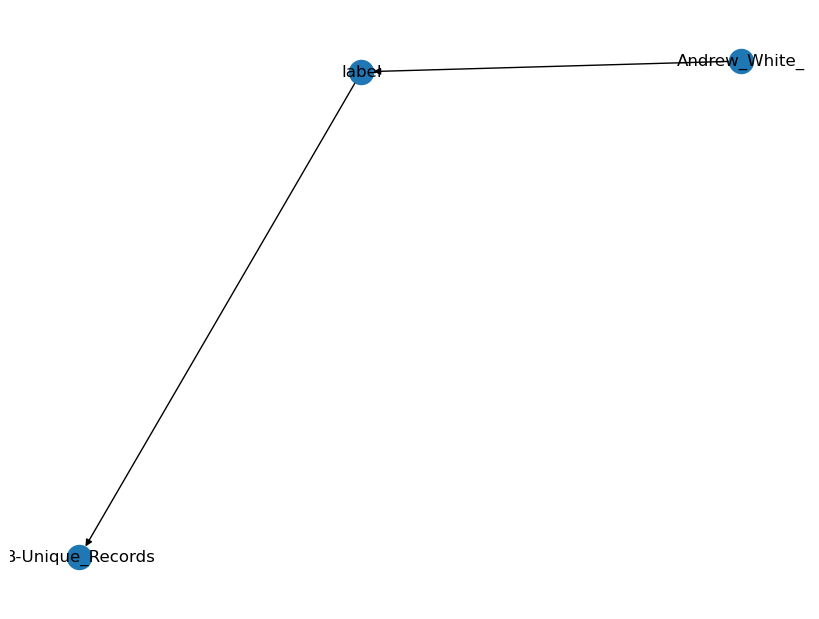

Decoded Input: 
 translate graph to text:  Andrew_White_(musician)  label  B-Unique_Records
Decoded Target: 
 Andrew White is a musician signed to the record label B-Unique Records.
DataBatch(x=[1, 512], edge_index=[2, 2], attention_mask=[1, 512], y=[1, 512], batch=[512], ptr=[2])
Original Sample: 
 translate graph to text: <H> Asunción  <R>  isPartOf  <T>  Gran_Asunción 
 Asunción is a part of Gran Asunción.
NetworkX Graph: 
 [('Asunción', 'isPartOf', 0), ('isPartOf', 'Gran_Asunción', 0)]


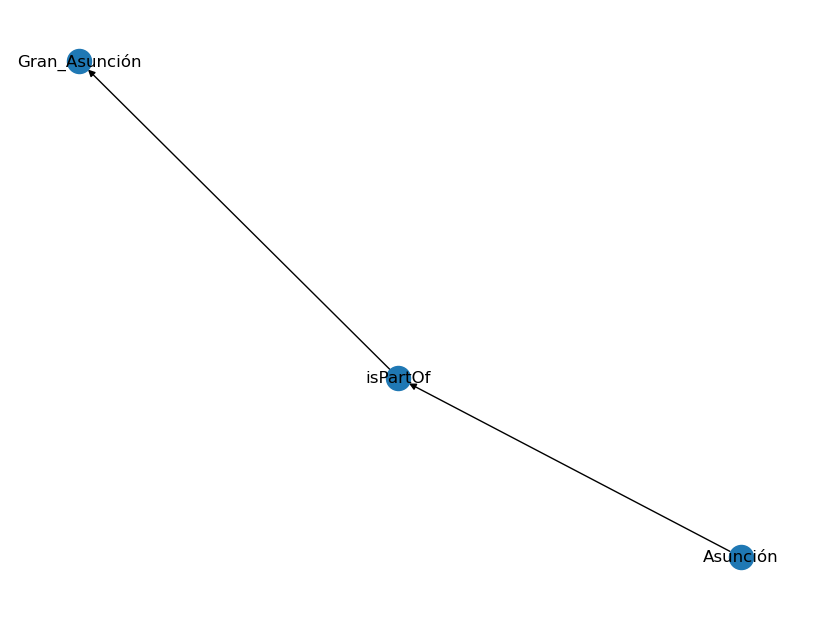

Decoded Input: 
 translate graph to text:  Asunción  isPartOf  Gran_Asunción
Decoded Target: 
 Asunción is a part of Gran Asunción.
DataBatch(x=[1, 512], edge_index=[2, 2], attention_mask=[1, 512], y=[1, 512], batch=[512], ptr=[2])
Original Sample: 
 translate graph to text: <H> Christian_Burns  <R>  instrument  <T>  Guitar 
 Christian Burns plays the guitar.
NetworkX Graph: 
 [('Christian_Burns', 'instrument', 0), ('instrument', 'Guitar', 0)]


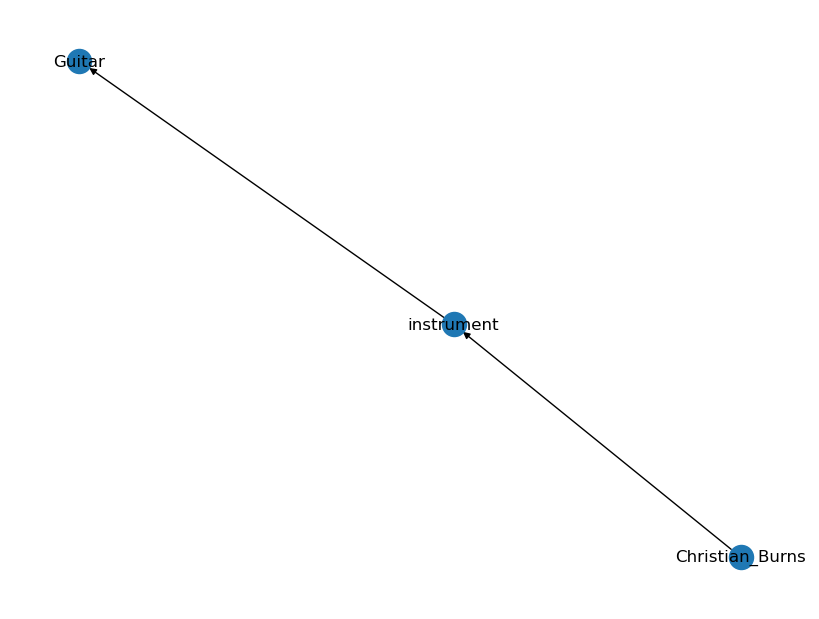

Decoded Input: 
 translate graph to text:  Christian_Burns  instrument  Guitar
Decoded Target: 
 Christian Burns plays the guitar.
DataBatch(x=[1, 512], edge_index=[2, 2], attention_mask=[1, 512], y=[1, 512], batch=[512], ptr=[2])
Original Sample: 
 translate graph to text: <H> Hip_hop_music  <R>  musicSubgenre  <T>  Gangsta_rap 
 Hip hop music has the sub genre Gangsta rap.
NetworkX Graph: 
 [('Hip_hop_music', 'musicSubgenre', 0), ('musicSubgenre', 'Gangsta_rap', 0)]


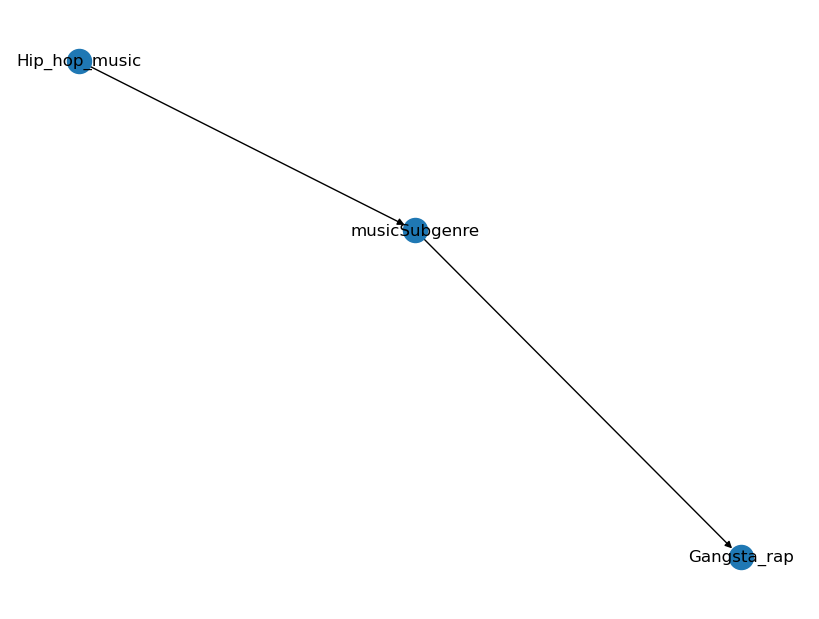

Decoded Input: 
 translate graph to text:  Hip_hop_music  musicSubgenre  Gangsta_rap
Decoded Target: 
 Hip hop music has the sub genre Gangsta rap.
DataBatch(x=[1, 512], edge_index=[2, 2], attention_mask=[1, 512], y=[1, 512], batch=[512], ptr=[2])
Original Sample: 
 translate graph to text: <H> Hip_hop_music  <R>  stylisticOrigins  <T>  Funk 
 Hip hop music originated from funk music.
NetworkX Graph: 
 [('Hip_hop_music', 'stylisticOrigins', 0), ('stylisticOrigins', 'Funk', 0)]


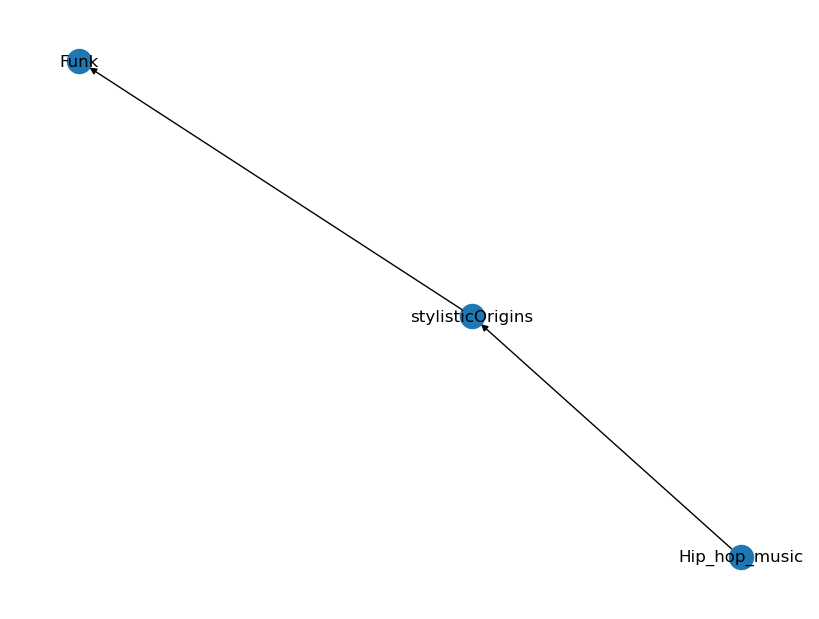

Decoded Input: 
 translate graph to text:  Hip_hop_music  stylisticOrigins  Funk
Decoded Target: 
 Hip hop music originated from funk music.
DataBatch(x=[1, 512], edge_index=[2, 2], attention_mask=[1, 512], y=[1, 512], batch=[512], ptr=[2])
Original Sample: 
 translate graph to text: <H> Indie_rock  <R>  stylisticOrigin  <T>  New_wave_music 
 The stylistic origin of indie rock is new wave music.
NetworkX Graph: 
 [('Indie_rock', 'stylisticOrigin', 0), ('stylisticOrigin', 'New_wave_music', 0)]


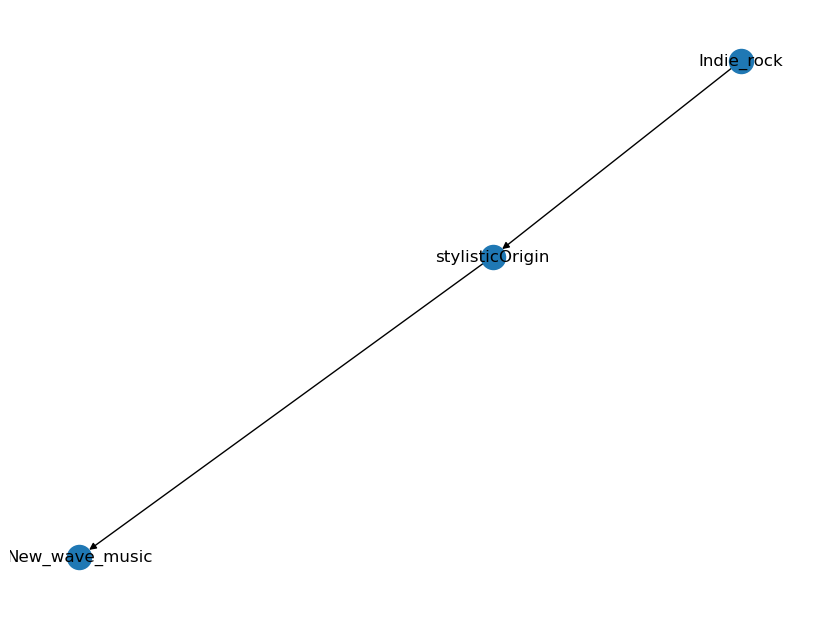

Decoded Input: 
 translate graph to text:  Indie_rock  stylisticOrigin  New_wave_music
Decoded Target: 
 The stylistic origin of indie rock is new wave music.
DataBatch(x=[1, 512], edge_index=[2, 2], attention_mask=[1, 512], y=[1, 512], batch=[512], ptr=[2])
Original Sample: 
 translate graph to text: <H> Manchester  <R>  isPartOf  <T>  Greater_Manchester 
 Manchester is part of Greater Manchester.
NetworkX Graph: 
 [('Manchester', 'isPartOf', 0), ('isPartOf', 'Greater_Manchester', 0)]


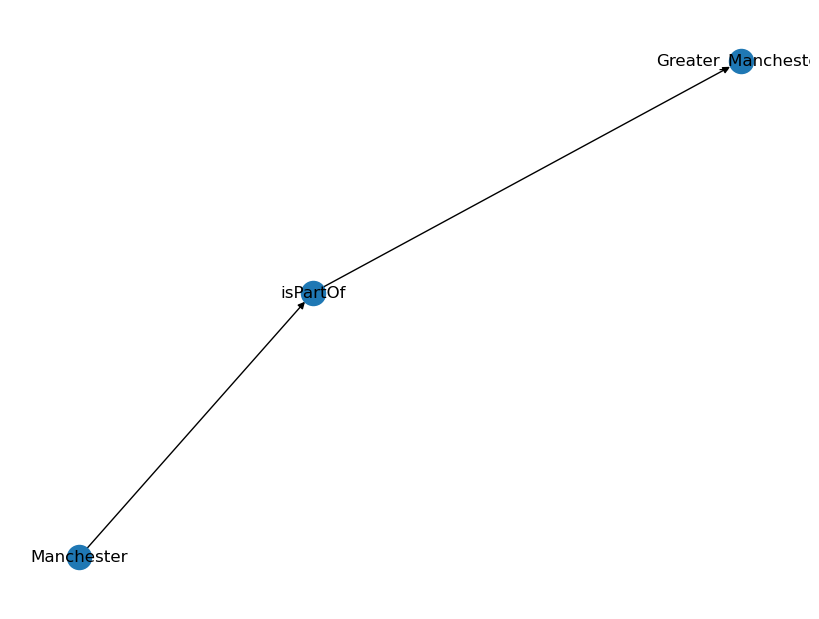

Decoded Input: 
 translate graph to text:  Manchester  isPartOf  Greater_Manchester
Decoded Target: 
 Manchester is part of Greater Manchester.
DataBatch(x=[1, 512], edge_index=[2, 2], attention_mask=[1, 512], y=[1, 512], batch=[512], ptr=[2])
Original Sample: 
 translate graph to text: <H> Polydor_Records  <R>  location  <T>  London 
 Polydor Records are based in London.
NetworkX Graph: 
 [('Polydor_Records', 'location', 0), ('location', 'London', 0)]


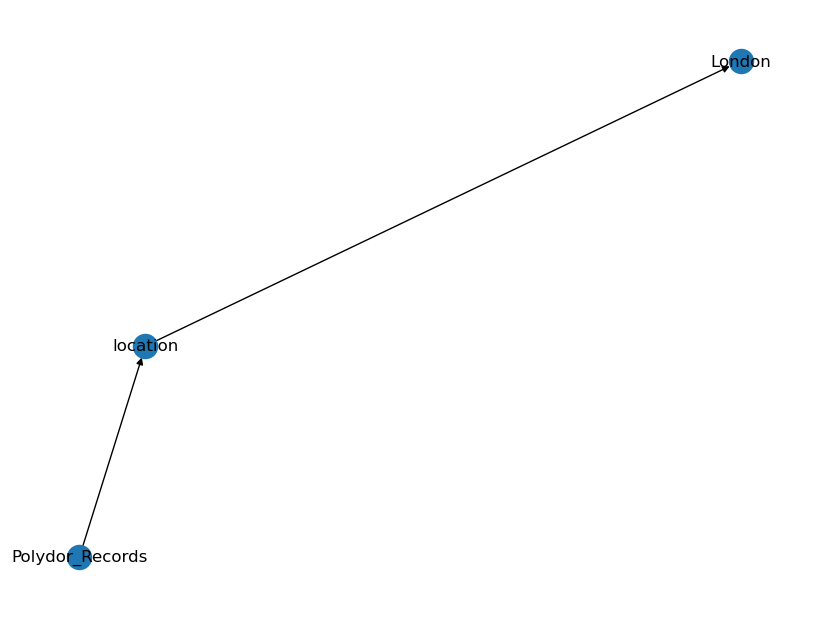

Decoded Input: 
 translate graph to text:  Polydor_Records  location  London
Decoded Target: 
 Polydor Records are based in London.
DataBatch(x=[1, 512], edge_index=[2, 2], attention_mask=[1, 512], y=[1, 512], batch=[512], ptr=[2])
Original Sample: 
 translate graph to text: <H> RCA_Records  <R>  distributingCompany  <T>  Sony_Music_Entertainment 
 The distribution company for RCA Records is Sony Music Entertainment.
NetworkX Graph: 
 [('RCA_Records', 'distributingCompany', 0), ('distributingCompany', 'Sony_Music_Entertainment', 0)]


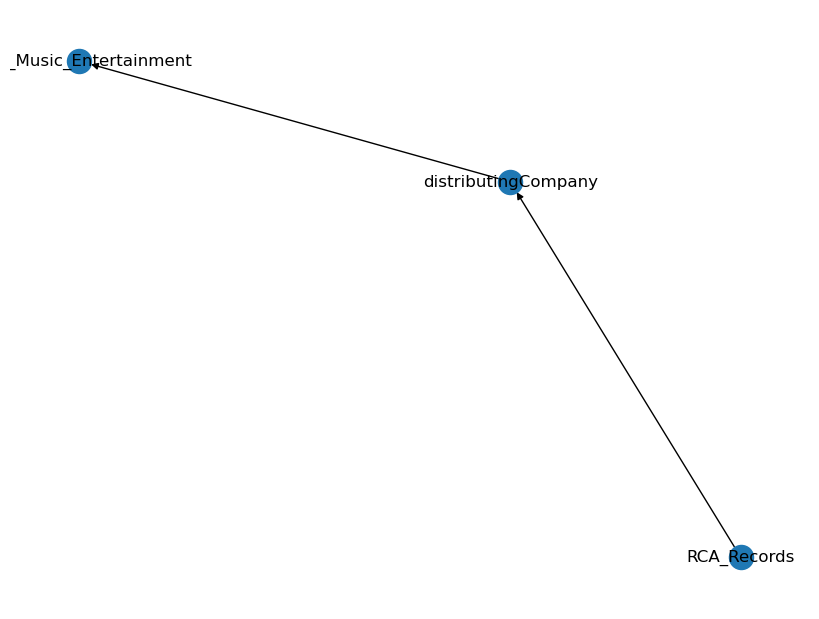

Decoded Input: 
 translate graph to text:  RCA_Records  distributingCompany  Sony_Music_Entertainment
Decoded Target: 
 The distribution company for RCA Records is Sony Music Entertainment.
DataBatch(x=[1, 512], edge_index=[2, 2], attention_mask=[1, 512], y=[1, 512], batch=[512], ptr=[2])
Original Sample: 
 translate graph to text: <H> Rock_and_roll  <R>  stylisticOrigin  <T>  Blues 
 Rock and roll music originated from blues music.
NetworkX Graph: 
 [('Rock_and_roll', 'stylisticOrigin', 0), ('stylisticOrigin', 'Blues', 0)]


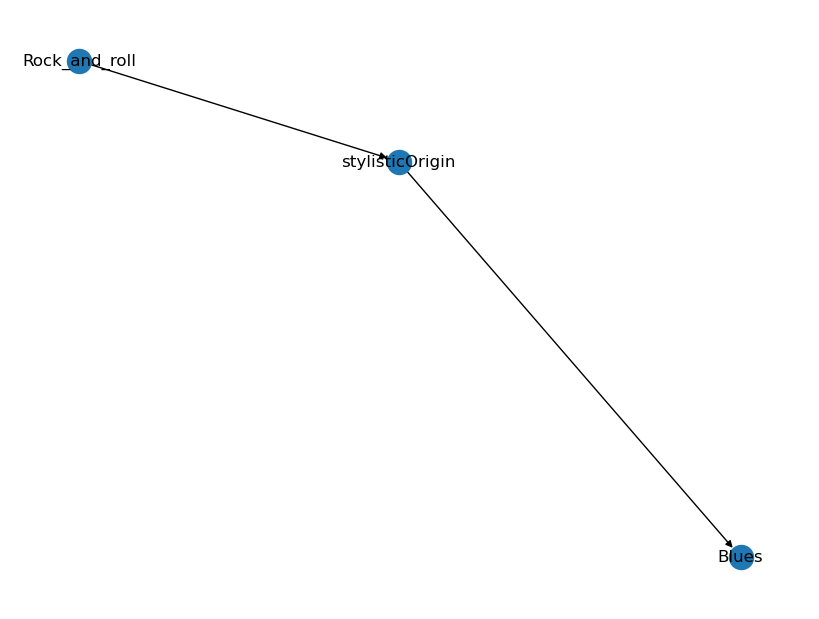

Decoded Input: 
 translate graph to text:  Rock_and_roll  stylisticOrigin  Blues
Decoded Target: 
 Rock and roll music originated from blues music.
DataBatch(x=[1, 512], edge_index=[2, 2], attention_mask=[1, 512], y=[1, 512], batch=[512], ptr=[2])
Original Sample: 
 translate graph to text: <H> Synthpop  <R>  stylisticOrigins  <T>  Pop_music 
 Synthpop is a form of pop music.
NetworkX Graph: 
 [('Synthpop', 'stylisticOrigins', 0), ('stylisticOrigins', 'Pop_music', 0)]


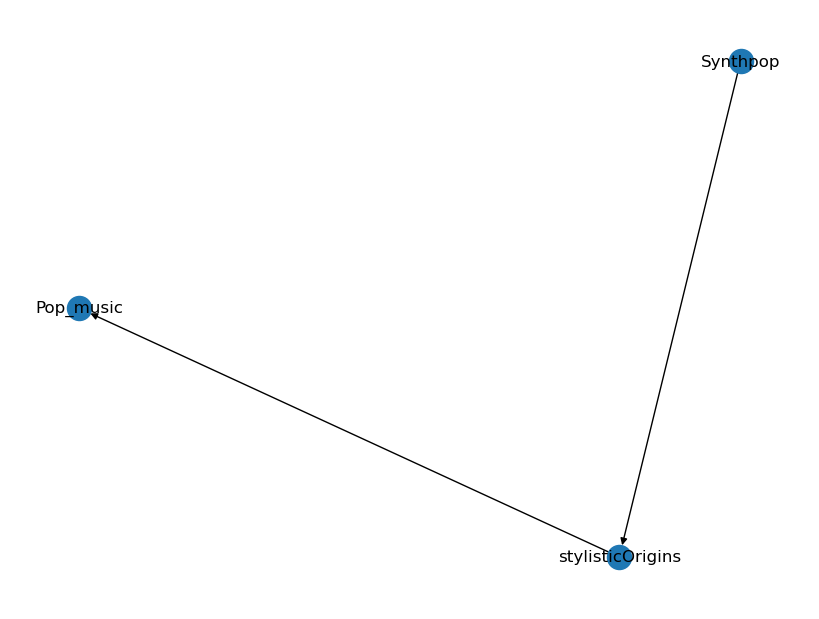

Decoded Input: 
 translate graph to text:  Synthpop  stylisticOrigins  Pop_music
Decoded Target: 
 Synthpop is a form of pop music.
DataBatch(x=[1, 512], edge_index=[2, 2], attention_mask=[1, 512], y=[1, 512], batch=[512], ptr=[2])
Original Sample: 
 translate graph to text: <H> United_Kingdom  <R>  demonym  <T>  British_people 
 People from the United Kingdom are called British people.
NetworkX Graph: 
 [('United_Kingdom', 'demonym', 0), ('demonym', 'British_people', 0)]


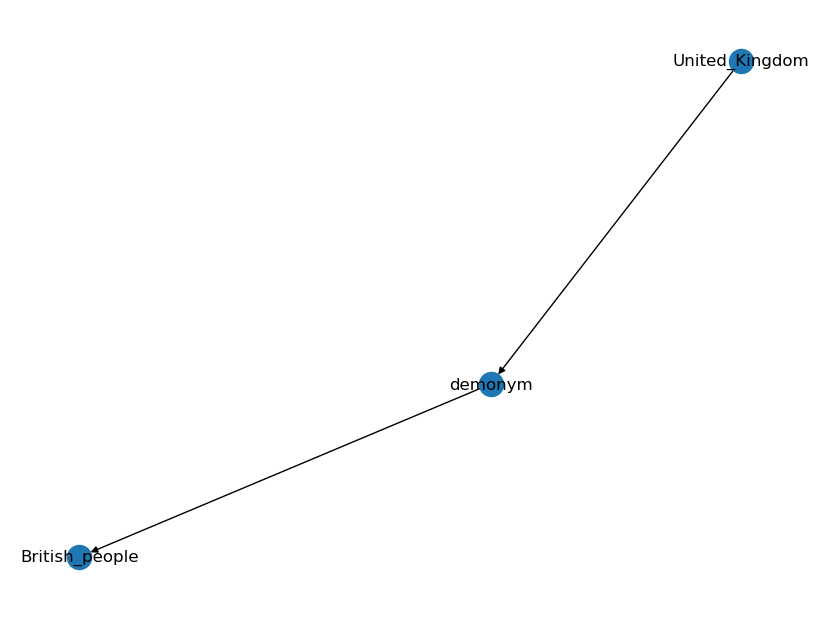

Decoded Input: 
 translate graph to text:  United_Kingdom  demonym  British_people
Decoded Target: 
 People from the United Kingdom are called British people.
DataBatch(x=[1, 512], edge_index=[2, 2], attention_mask=[1, 512], y=[1, 512], batch=[512], ptr=[2])
Original Sample: 
 translate graph to text: <H> (19255)_1994_VK8  <R>  density  <T>  "2.0"^^<http://dbpedia.org/datatype/gramPerCubicCentimetre> 
 (19255) 1994 VK8 has a density of 2.0 grams per cubic centimetre.
NetworkX Graph: 
 [('_1994_VK8', 'density', 0), ('density', '"2.0"^^<http://dbpedia.org/datatype/gramPerCubicCentimetre>', 0)]


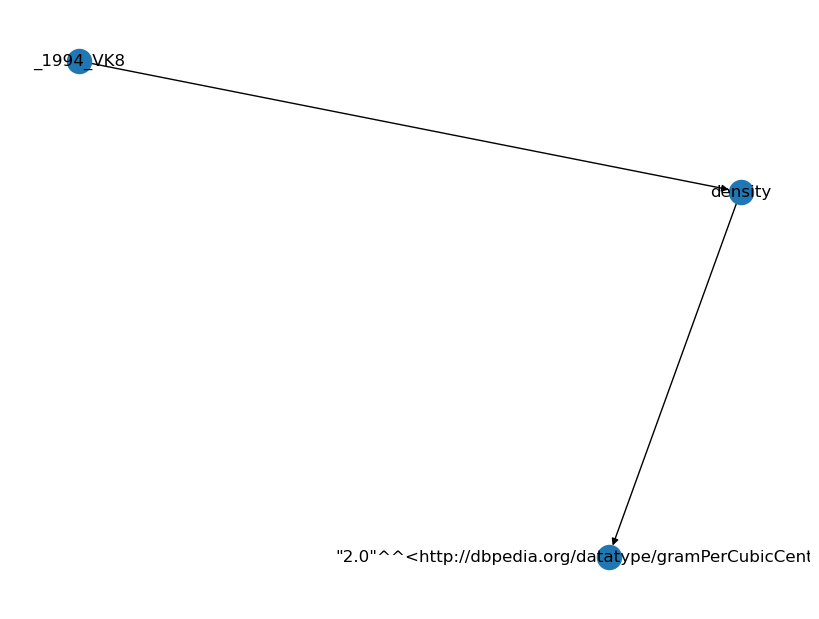

Decoded Input: 
 translate graph to text:  (19255)_1994_VK8  density  "2.0"http://dbpedia.org/datatype/gramPerCubicCentimetre>
Decoded Target: 
 (19255) 1994 VK8 has a density of 2.0 grams per cubic centimetre.
DataBatch(x=[1, 512], edge_index=[2, 2], attention_mask=[1, 512], y=[1, 512], batch=[512], ptr=[2])
Original Sample: 
 translate graph to text: <H> (29075)_1950_DA  <R>  discoverer  <T>  Carl_A._Wirtanen 
 (29075) 1950 DA was discovered by Carl A Wirtanen.
NetworkX Graph: 
 [('_1950_DA', 'discoverer', 0), ('discoverer', 'Carl_A._Wirtanen', 0)]


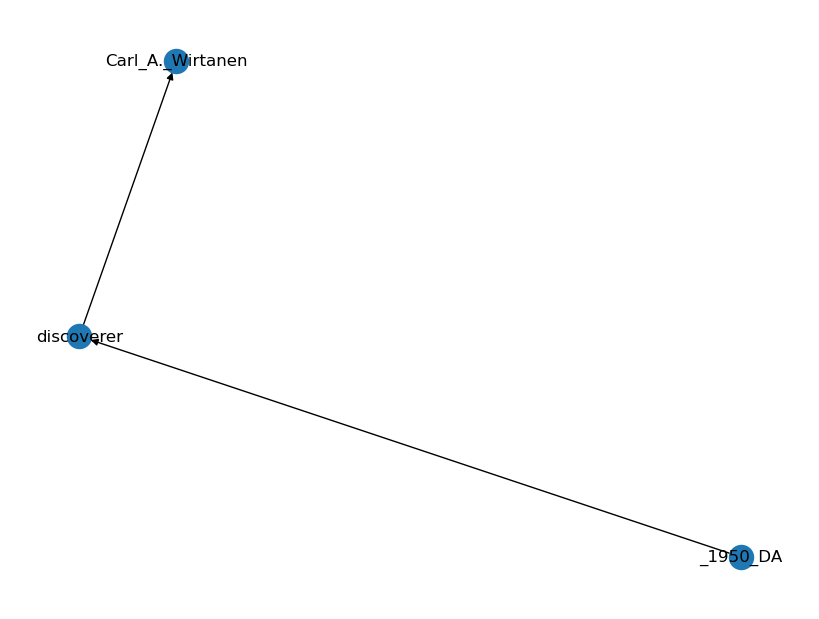

Decoded Input: 
 translate graph to text:  (29075)_1950_DA  discoverer  Carl_A._Wirtanen
Decoded Target: 
 (29075) 1950 DA was discovered by Carl A Wirtanen.
DataBatch(x=[1, 512], edge_index=[2, 2], attention_mask=[1, 512], y=[1, 512], batch=[512], ptr=[2])
Original Sample: 
 translate graph to text: <H> (410777)_2009_FD  <R>  absMagnitude  <T>  "22.1"^^xsd:double 
 (410777) 2009 FD has an absolute magnitude of 22.1.
NetworkX Graph: 
 [('_2009_FD', 'absMagnitude', 0), ('absMagnitude', '"22.1"^^xsd:double', 0)]


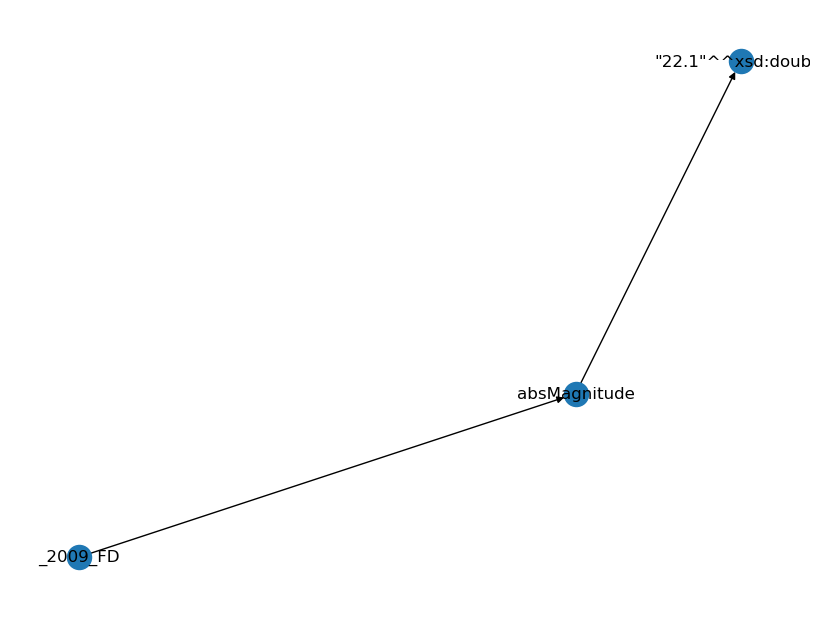

Decoded Input: 
 translate graph to text:  (410777)_2009_FD  absMagnitude  "22.1"xsd:double
Decoded Target: 
 (410777) 2009 FD has an absolute magnitude of 22.1.
DataBatch(x=[1, 512], edge_index=[2, 2], attention_mask=[1, 512], y=[1, 512], batch=[512], ptr=[2])
Original Sample: 
 translate graph to text: <H> (410777)_2009_FD  <R>  Planet/apoapsis  <T>  "2.5977670247055E8"^^<http://dbpedia.org/datatype/kilometre> 
 (410777) 2009 FD has an apoapsis of 259776702.47055 kilometres.
NetworkX Graph: 
 [('_2009_FD', 'Planet/apoapsis', 0), ('Planet/apoapsis', '"2.5977670247055E8"^^<http://dbpedia.org/datatype/kilometre>', 0)]


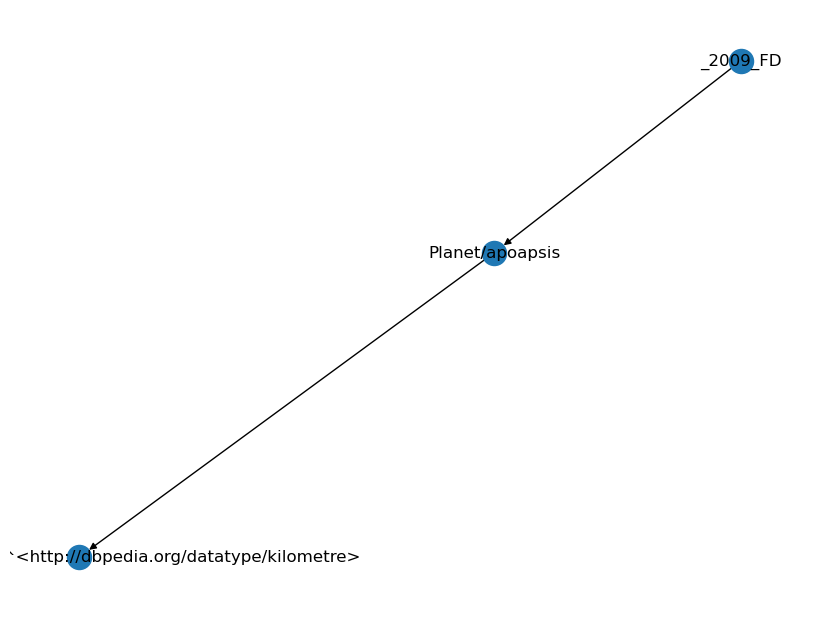

Decoded Input: 
 translate graph to text:  (410777)_2009_FD  Planet/apoapsis  "2.5977670247055E8"http://dbpedia.org/datatype/kilometre>
Decoded Target: 
 (410777) 2009 FD has an apoapsis of 259776702.47055 kilometres.
DataBatch(x=[1, 512], edge_index=[2, 2], attention_mask=[1, 512], y=[1, 512], batch=[512], ptr=[2])
Original Sample: 
 translate graph to text: <H> (66063)_1998_RO1  <R>  Planet/apoapsis  <T>  "2.5498957060815E8"^^<http://dbpedia.org/datatype/kilometre> 
 (66063) 1998 RO1 has an apoapsis of 254989570.60815 kilometres.
NetworkX Graph: 
 [('_1998_RO1', 'Planet/apoapsis', 0), ('Planet/apoapsis', '"2.5498957060815E8"^^<http://dbpedia.org/datatype/kilometre>', 0)]


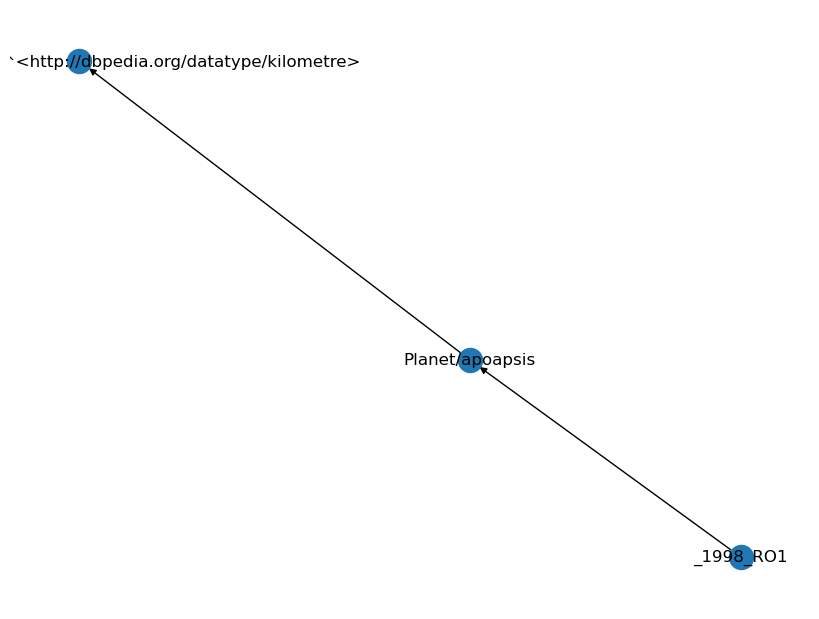

Decoded Input: 
 translate graph to text:  (66063)_1998_RO1  Planet/apoapsis  "2.5498957060815E8"http://dbpedia.org/datatype/kilometre>
Decoded Target: 
 (66063) 1998 RO1 has an apoapsis of 254989570.60815 kilometres.
DataBatch(x=[1, 512], edge_index=[2, 2], attention_mask=[1, 512], y=[1, 512], batch=[512], ptr=[2])
Original Sample: 
 translate graph to text: <H> (66063)_1998_RO1  <R>  epoch  <T>  "November 4, 2013" 
 66063 1998 RO1 has an epoch date of 4 November 2013.
NetworkX Graph: 
 [('_1998_RO1', 'epoch', 0), ('epoch', '"November 4, 2013"', 0)]


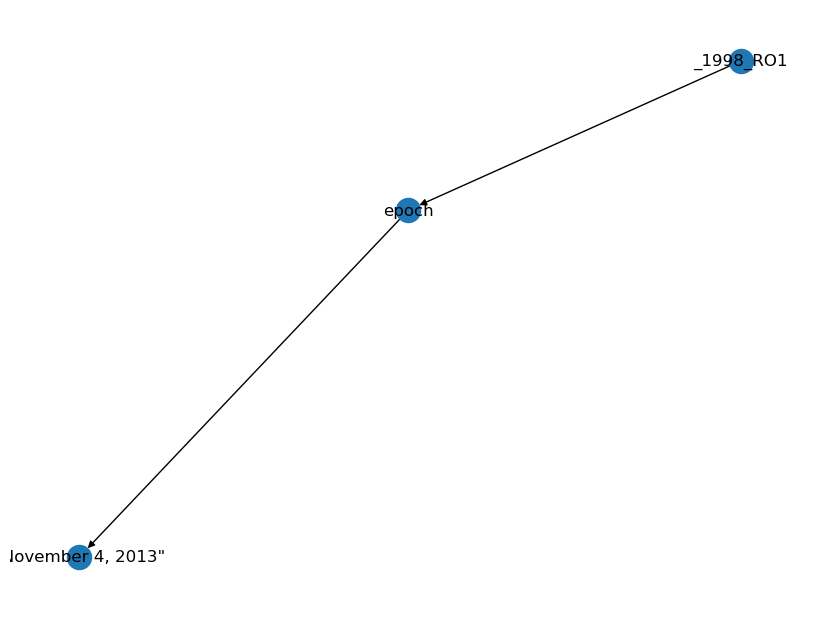

Decoded Input: 
 translate graph to text:  (66063)_1998_RO1  epoch  "November 4, 2013"
Decoded Target: 
 66063 1998 RO1 has an epoch date of 4 November 2013.
DataBatch(x=[1, 512], edge_index=[2, 2], attention_mask=[1, 512], y=[1, 512], batch=[512], ptr=[2])
Original Sample: 
 translate graph to text: <H> 1000_Piazzia  <R>  escapeVelocity  <T>  "0.0252"^^<http://dbpedia.org/datatype/kilometrePerSecond> 
 1000 Piazzia has an escape velocity of 0.0252 kilometres per second.
NetworkX Graph: 
 [('1000_Piazzia', 'escapeVelocity', 0), ('escapeVelocity', '"0.0252"^^<http://dbpedia.org/datatype/kilometrePerSecond>', 0)]


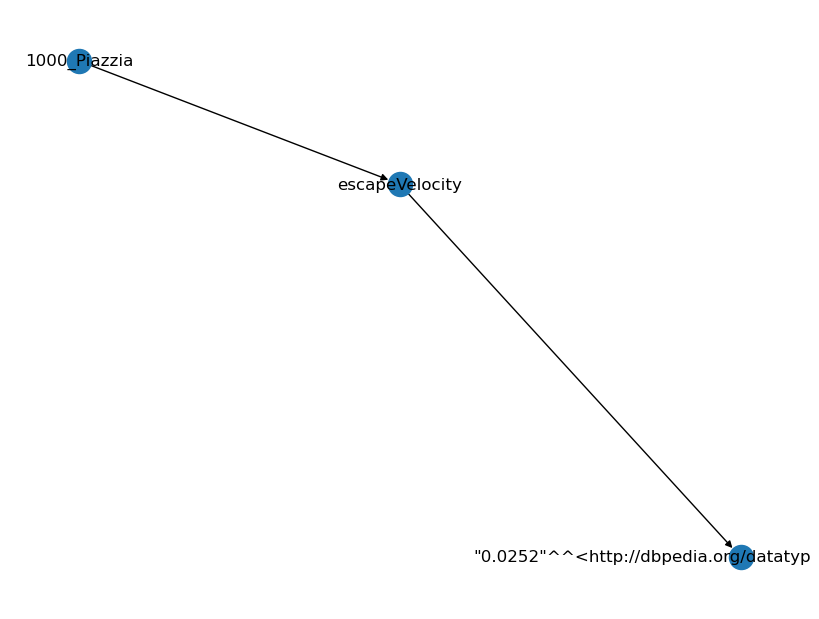

Decoded Input: 
 translate graph to text:  1000_Piazzia  escapeVelocity  "0.0252"http://dbpedia.org/datatype/kilometrePerSecond>
Decoded Target: 
 1000 Piazzia has an escape velocity of 0.0252 kilometres per second.
DataBatch(x=[1, 512], edge_index=[2, 2], attention_mask=[1, 512], y=[1, 512], batch=[512], ptr=[2])
Original Sample: 
 translate graph to text: <H> 1001_Gaussia  <R>  formerName  <T>  "1923 OAA907 XC"@en 
 1001 Gaussia was formerly known as 1923 OAA907 XC.
NetworkX Graph: 
 [('1001_Gaussia', 'formerName', 0), ('formerName', '"1923 OAA907 XC"@en', 0)]


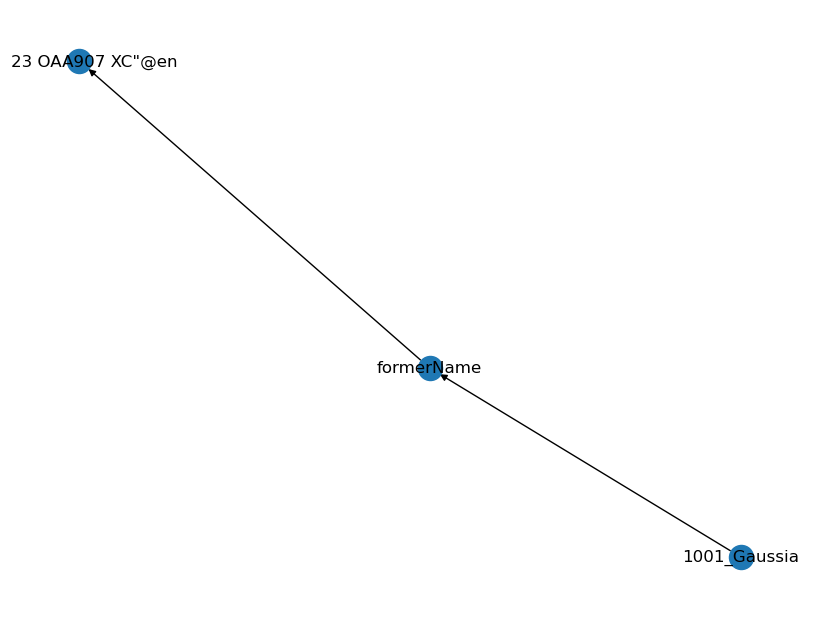

Decoded Input: 
 translate graph to text:  1001_Gaussia  formerName  "1923 OAA907 XC"@en
Decoded Target: 
 1001 Gaussia was formerly known as 1923 OAA907 XC.
DataBatch(x=[1, 512], edge_index=[2, 2], attention_mask=[1, 512], y=[1, 512], batch=[512], ptr=[2])
Original Sample: 
 translate graph to text: <H> 1001_Gaussia  <R>  Planet/maximumTemperature  <T>  "165.0"^^<http://dbpedia.org/datatype/kelvin> 
 the maximum temperature of 1001 Gaussia is 165 kelvins.
NetworkX Graph: 
 [('1001_Gaussia', 'Planet/maximumTemperature', 0), ('Planet/maximumTemperature', '"165.0"^^<http://dbpedia.org/datatype/kelvin>', 0)]


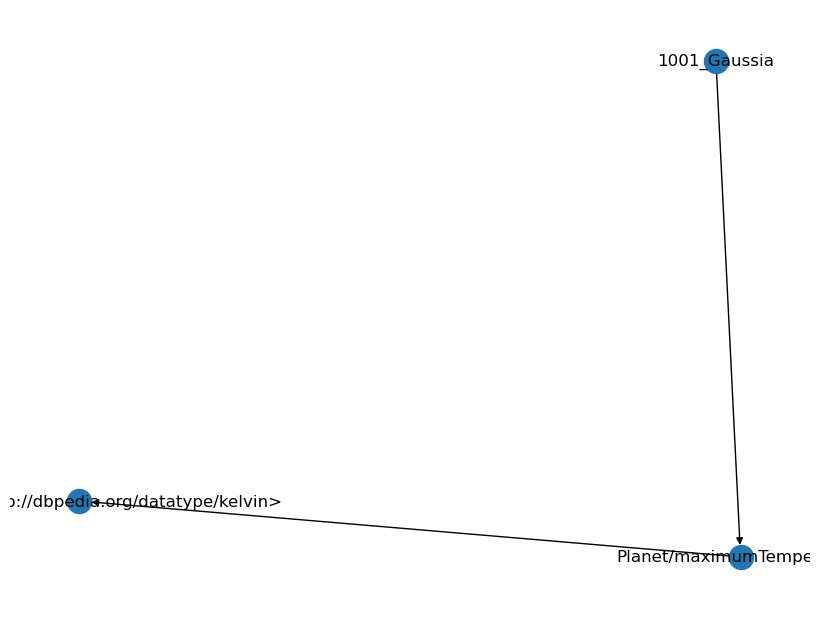

Decoded Input: 
 translate graph to text:  1001_Gaussia  Planet/maximumTemperature  "165.0"http://dbpedia.org/datatype/kelvin>
Decoded Target: 
 the maximum temperature of 1001 Gaussia is 165 kelvins.
DataBatch(x=[1, 512], edge_index=[2, 2], attention_mask=[1, 512], y=[1, 512], batch=[512], ptr=[2])
Original Sample: 
 translate graph to text: <H> 101_Helena  <R>  Planet/apoapsis  <T>  "4.41092E8"^^<http://dbpedia.org/datatype/kilometre> 
 101 Helena has an apoapsis of 441092000.0 (kilometres).
NetworkX Graph: 
 [('101_Helena', 'Planet/apoapsis', 0), ('Planet/apoapsis', '"4.41092E8"^^<http://dbpedia.org/datatype/kilometre>', 0)]


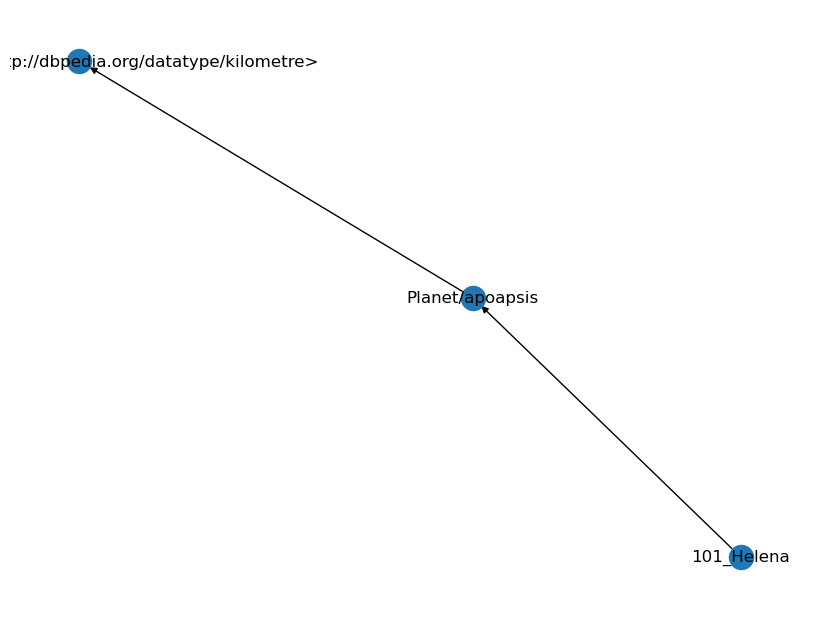

Decoded Input: 
 translate graph to text:  101_Helena  Planet/apoapsis  "4.41092E8"http://dbpedia.org/datatype/kilometre>
Decoded Target: 
 101 Helena has an apoapsis of 441092000.0 (kilometres).
DataBatch(x=[1, 512], edge_index=[2, 2], attention_mask=[1, 512], y=[1, 512], batch=[512], ptr=[2])
Original Sample: 
 translate graph to text: <H> 101_Helena  <R>  epoch  <T>  "2006-12-31"^^xsd:date 
 The epoch of 101 Helena is 2006-12-31.
NetworkX Graph: 
 [('101_Helena', 'epoch', 0), ('epoch', '"2006-12-31"^^xsd:date', 0)]


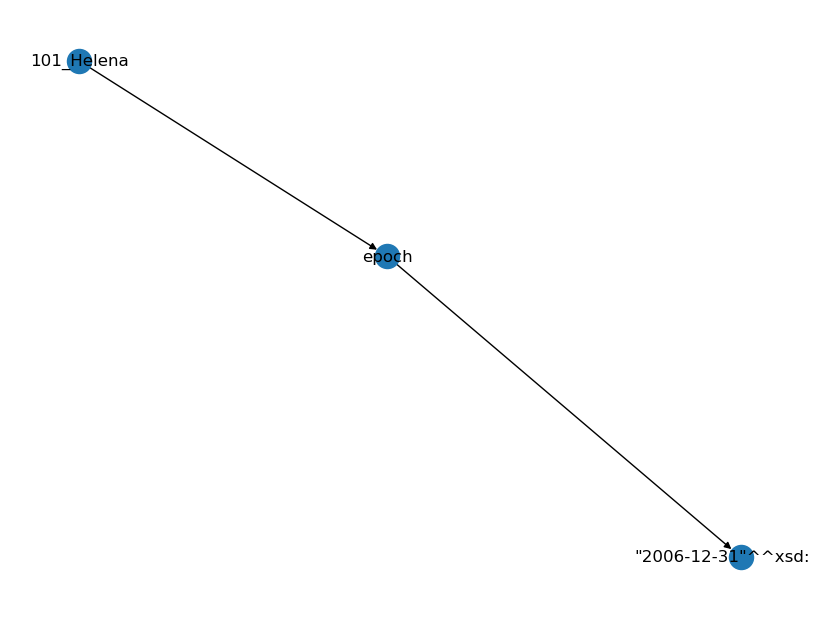

Decoded Input: 
 translate graph to text:  101_Helena  epoch  "2006-12-31"xsd:date
Decoded Target: 
 The epoch of 101 Helena is 2006-12-31.
DataBatch(x=[1, 512], edge_index=[2, 2], attention_mask=[1, 512], y=[1, 512], batch=[512], ptr=[2])
Original Sample: 
 translate graph to text: <H> 101_Helena  <R>  mass  <T>  "3.0"^^<http://dbpedia.org/datatype/kilogram> 
 101 Helena has a mass of 3.0 kgs.
NetworkX Graph: 
 [('101_Helena', 'mass', 0), ('mass', '"3.0"^^<http://dbpedia.org/datatype/kilogram>', 0)]


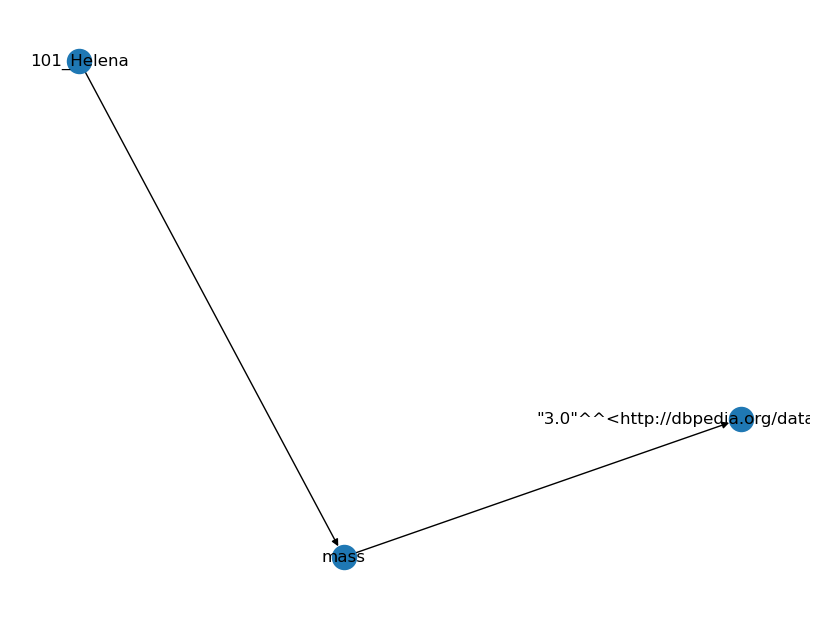

Decoded Input: 
 translate graph to text:  101_Helena  mass  "3.0"http://dbpedia.org/datatype/kilogram>
Decoded Target: 
 101 Helena has a mass of 3.0 kgs.
DataBatch(x=[1, 512], edge_index=[2, 2], attention_mask=[1, 512], y=[1, 512], batch=[512], ptr=[2])
Original Sample: 
 translate graph to text: <H> 1036_Ganymed  <R>  avgSpeed  <T>  "16.86"^^<http://dbpedia.org/datatype/kilometrePerSecond> 
 1036 Ganymed has an average speed of 16.86 km per sec.
NetworkX Graph: 
 [('1036_Ganymed', 'avgSpeed', 0), ('avgSpeed', '"16.86"^^<http://dbpedia.org/datatype/kilometrePerSecond>', 0)]


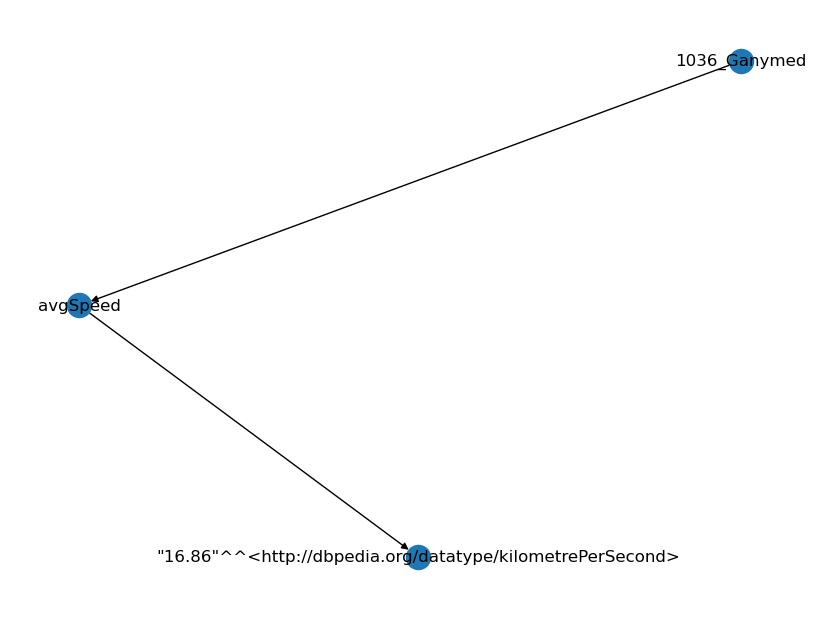

Decoded Input: 
 translate graph to text:  1036_Ganymed  avgSpeed  "16.86"http://dbpedia.org/datatype/kilometrePerSecond>
Decoded Target: 
 1036 Ganymed has an average speed of 16.86 km per sec.
DataBatch(x=[1, 512], edge_index=[2, 2], attention_mask=[1, 512], y=[1, 512], batch=[512], ptr=[2])
Original Sample: 
 translate graph to text: <H> 103_Hera  <R>  absoluteMagnitude  <T>  "7.66"^^xsd:double 
 103 Hera has an absolute magnitude of 7.66.
NetworkX Graph: 
 [('103_Hera', 'absoluteMagnitude', 0), ('absoluteMagnitude', '"7.66"^^xsd:double', 0)]


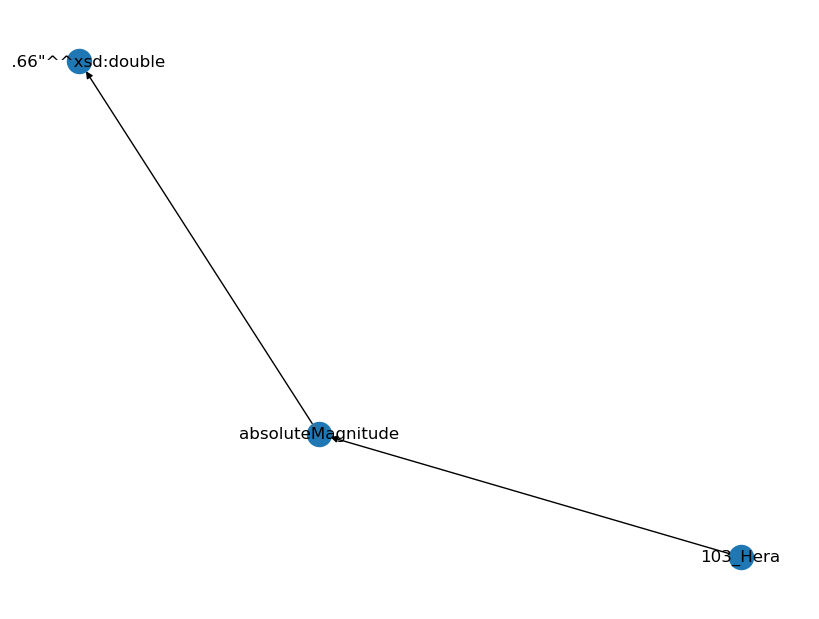

Decoded Input: 
 translate graph to text:  103_Hera  absoluteMagnitude  "7.66"xsd:double
Decoded Target: 
 103 Hera has an absolute magnitude of 7.66.
DataBatch(x=[1, 512], edge_index=[2, 2], attention_mask=[1, 512], y=[1, 512], batch=[512], ptr=[2])
Original Sample: 
 translate graph to text: <H> 103_Hera  <R>  Planet/mass  <T>  "7.9"^^<http://dbpedia.org/datatype/kilogram> 
 103 Hera's mass is 7.9kg.
NetworkX Graph: 
 [('103_Hera', 'Planet/mass', 0), ('Planet/mass', '"7.9"^^<http://dbpedia.org/datatype/kilogram>', 0)]


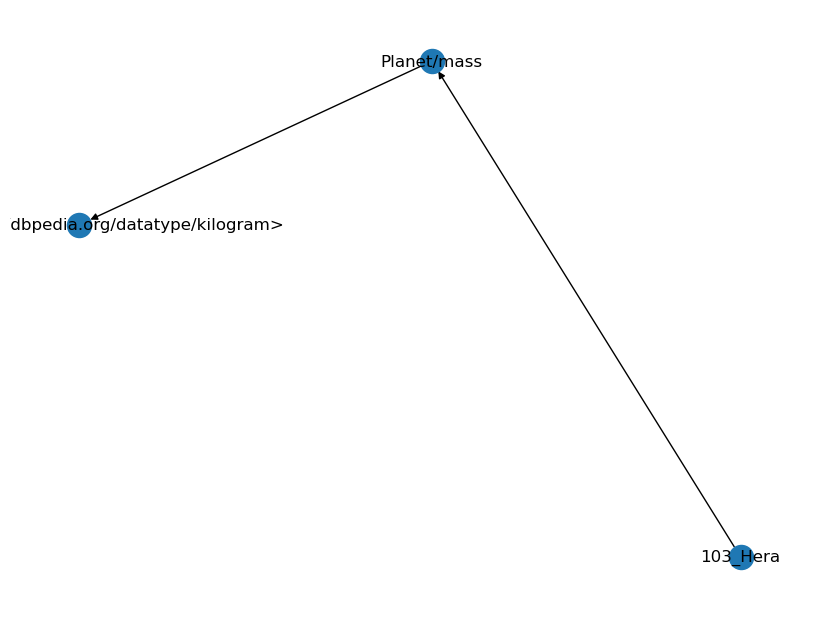

Decoded Input: 
 translate graph to text:  103_Hera  Planet/mass  "7.9"http://dbpedia.org/datatype/kilogram>
Decoded Target: 
 103 Hera's mass is 7.9kg.
DataBatch(x=[1, 512], edge_index=[2, 2], attention_mask=[1, 512], y=[1, 512], batch=[512], ptr=[2])
Original Sample: 
 translate graph to text: <H> 107_Camilla  <R>  absoluteMagnitude  <T>  "7.08"^^xsd:double 
 The asteroid called 107 Camilla has an absolute magnitude of 7.08.
NetworkX Graph: 
 [('107_Camilla', 'absoluteMagnitude', 0), ('absoluteMagnitude', '"7.08"^^xsd:double', 0)]


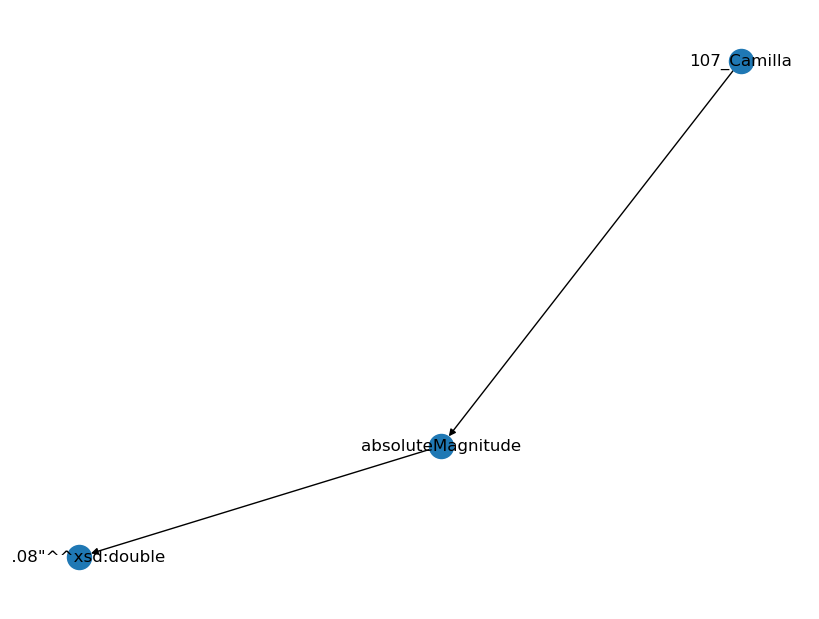

Decoded Input: 
 translate graph to text:  107_Camilla  absoluteMagnitude  "7.08"xsd:double
Decoded Target: 
 The asteroid called 107 Camilla has an absolute magnitude of 7.08.
DataBatch(x=[1, 512], edge_index=[2, 2], attention_mask=[1, 512], y=[1, 512], batch=[512], ptr=[2])
Original Sample: 
 translate graph to text: <H> 107_Camilla  <R>  discoverer  <T>  A._Storrs 
 107 Camilla was discovered by A Storrs.
NetworkX Graph: 
 [('107_Camilla', 'discoverer', 0), ('discoverer', 'A._Storrs', 0)]


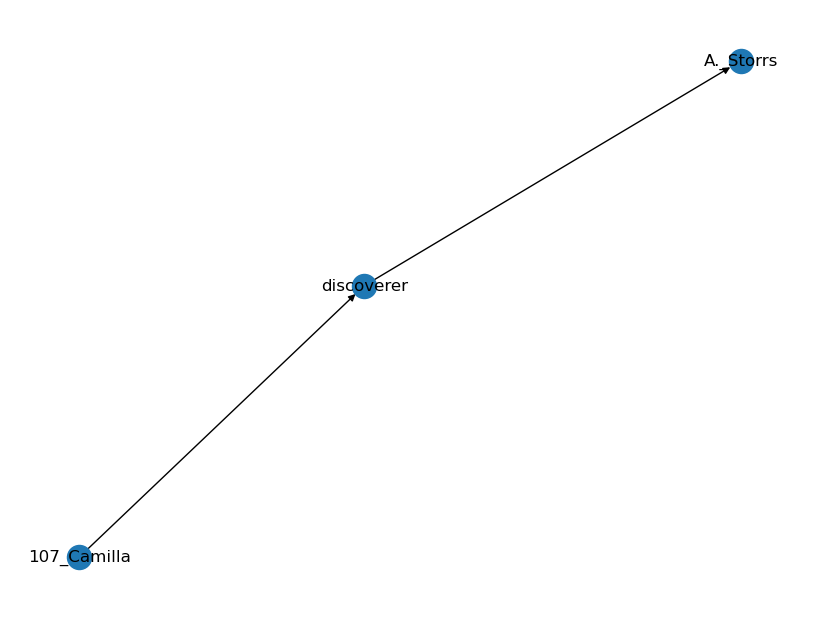

Decoded Input: 
 translate graph to text:  107_Camilla  discoverer  A._Storrs
Decoded Target: 
 107 Camilla was discovered by A Storrs.
DataBatch(x=[1, 512], edge_index=[2, 2], attention_mask=[1, 512], y=[1, 512], batch=[512], ptr=[2])
Original Sample: 
 translate graph to text: <H> 1089_Tama  <R>  formerName  <T>  "A894 VA; A904 VD;"@en 
 1089 Tama had the former name of "A894 VA; A904 VD;".
NetworkX Graph: 
 [('1089_Tama', 'formerName', 0), ('formerName', '"A894 VA; A904 VD;"@en', 0)]


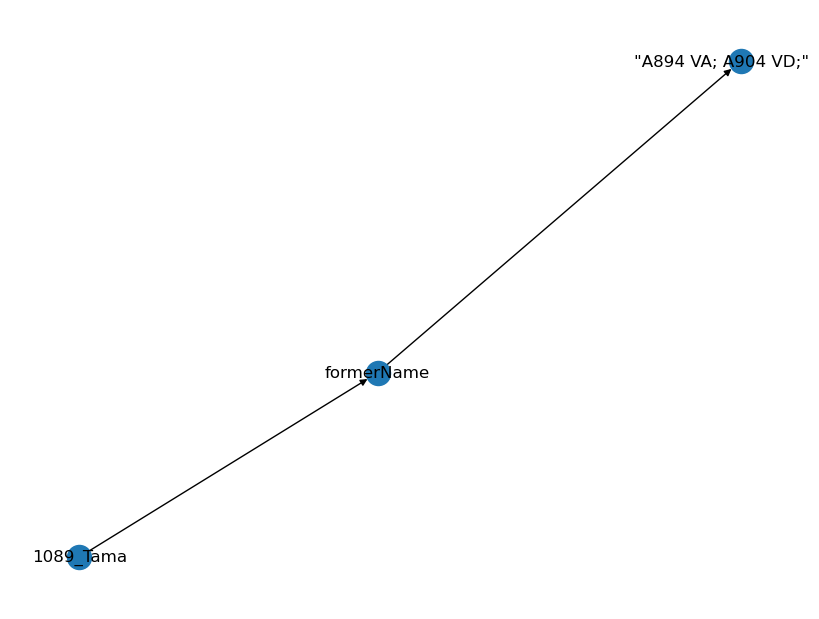

Decoded Input: 
 translate graph to text:  1089_Tama  formerName  "A894 VA; A904 VD;"@en
Decoded Target: 
 1089 Tama had the former name of "A894 VA; A904 VD;".
DataBatch(x=[1, 512], edge_index=[2, 2], attention_mask=[1, 512], y=[1, 512], batch=[512], ptr=[2])
Original Sample: 
 translate graph to text: <H> 1089_Tama  <R>  orbitalPeriod  <T>  1.03926e+08 
 1089 Tama has an orbital period of 1202.846 days.
NetworkX Graph: 
 [('1089_Tama', 'orbitalPeriod', 0), ('orbitalPeriod', '1.03926e+08', 0)]


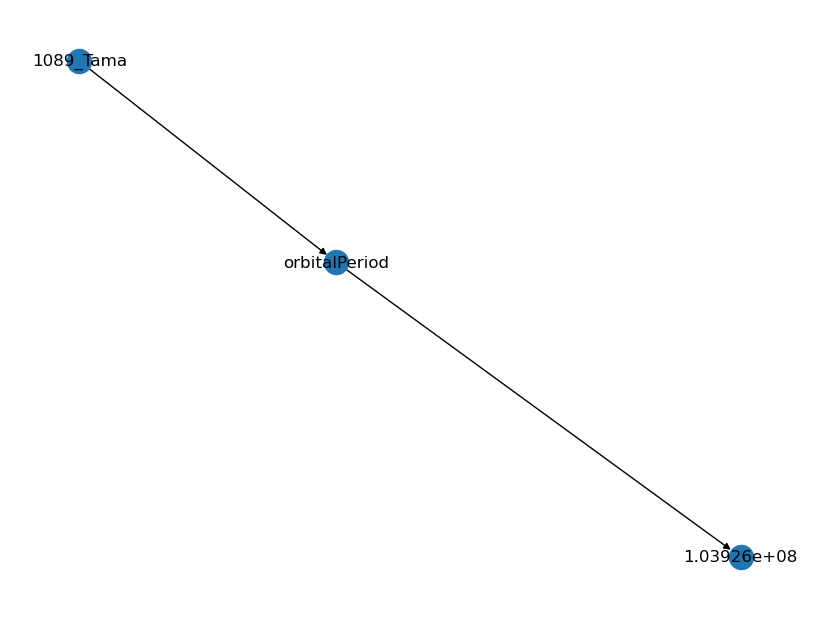

Decoded Input: 
 translate graph to text:  1089_Tama  orbitalPeriod  1.03926e+08
Decoded Target: 
 1089 Tama has an orbital period of 1202.846 days.
DataBatch(x=[1, 512], edge_index=[2, 2], attention_mask=[1, 512], y=[1, 512], batch=[512], ptr=[2])
Original Sample: 
 translate graph to text: <H> 1097_Vicia  <R>  averageSpeed  <T>  "64512.0"^^xsd:double 
 1097 Vicia has an average speed of 17.92 kilometres per second.
NetworkX Graph: 
 [('1097_Vicia', 'averageSpeed', 0), ('averageSpeed', '"64512.0"^^xsd:double', 0)]


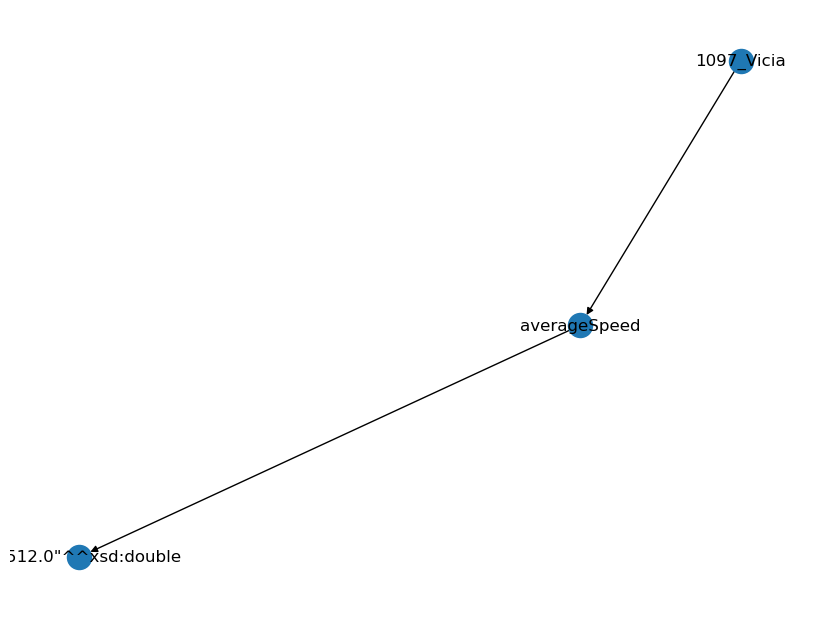

Decoded Input: 
 translate graph to text:  1097_Vicia  averageSpeed  "64512.0"xsd:double
Decoded Target: 
 1097 Vicia has an average speed of 17.92 kilometres per second.
DataBatch(x=[1, 512], edge_index=[2, 2], attention_mask=[1, 512], y=[1, 512], batch=[512], ptr=[2])
Original Sample: 
 translate graph to text: <H> 1097_Vicia  <R>  epoch  <T>  "December 31, 2006 (JD2454100.5)" 
 The epoch of 1097 Vicia is on 13 January 2016.
NetworkX Graph: 
 [('1097_Vicia', 'epoch', 0), ('epoch', '"December 31, 2006 "', 0)]


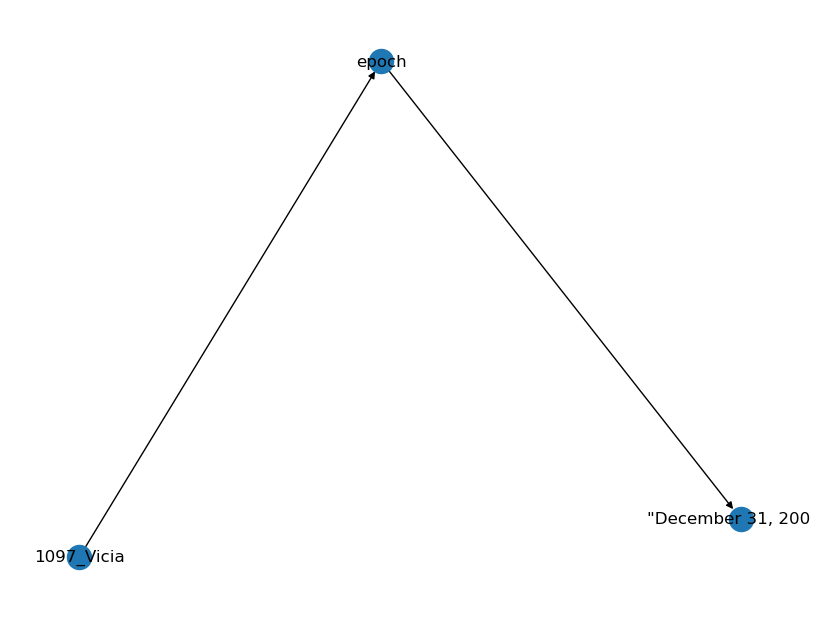

Decoded Input: 
 translate graph to text:  1097_Vicia  epoch  "December 31, 2006 (JD2454100.5)"
Decoded Target: 
 The epoch of 1097 Vicia is on 13 January 2016.
DataBatch(x=[1, 512], edge_index=[2, 2], attention_mask=[1, 512], y=[1, 512], batch=[512], ptr=[2])
Original Sample: 
 translate graph to text: <H> 1097_Vicia  <R>  rotationPeriod  <T>  "95040.0"^^xsd:double 
 The rotation period of 1097 Vicia is 95040.0.
NetworkX Graph: 
 [('1097_Vicia', 'rotationPeriod', 0), ('rotationPeriod', '"95040.0"^^xsd:double', 0)]


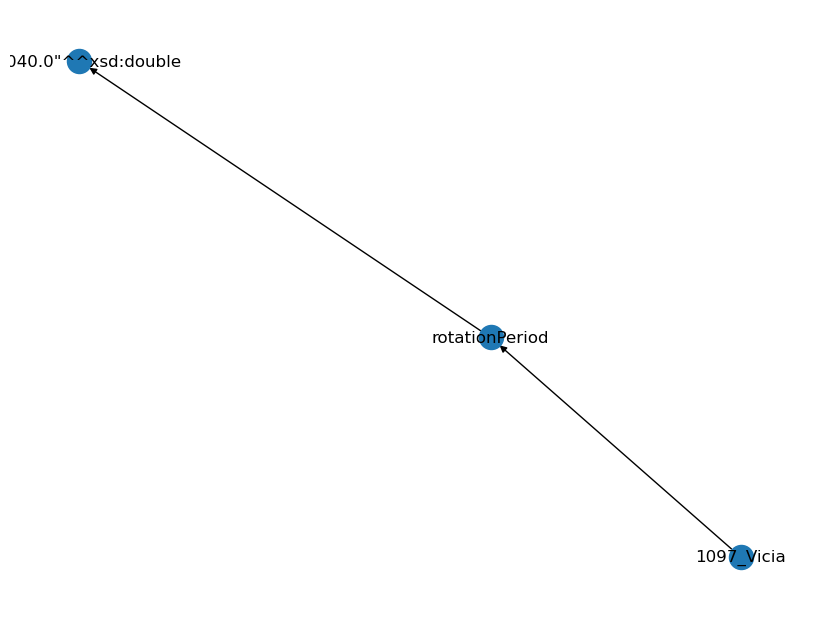

Decoded Input: 
 translate graph to text:  1097_Vicia  rotationPeriod  "95040.0"xsd:double
Decoded Target: 
 The rotation period of 1097 Vicia is 95040.0.
DataBatch(x=[1, 512], edge_index=[2, 2], attention_mask=[1, 512], y=[1, 512], batch=[512], ptr=[2])
Original Sample: 
 translate graph to text: <H> 109_Felicitas  <R>  discoverer  <T>  Christian_Heinrich_Friedrich_Peters 
 Christian Heinrich Friedrich Peters was the discoverer of 109 Felicitas.
NetworkX Graph: 
 [('109_Felicitas', 'discoverer', 0), ('discoverer', 'Christian_Heinrich_Friedrich_Peters', 0)]


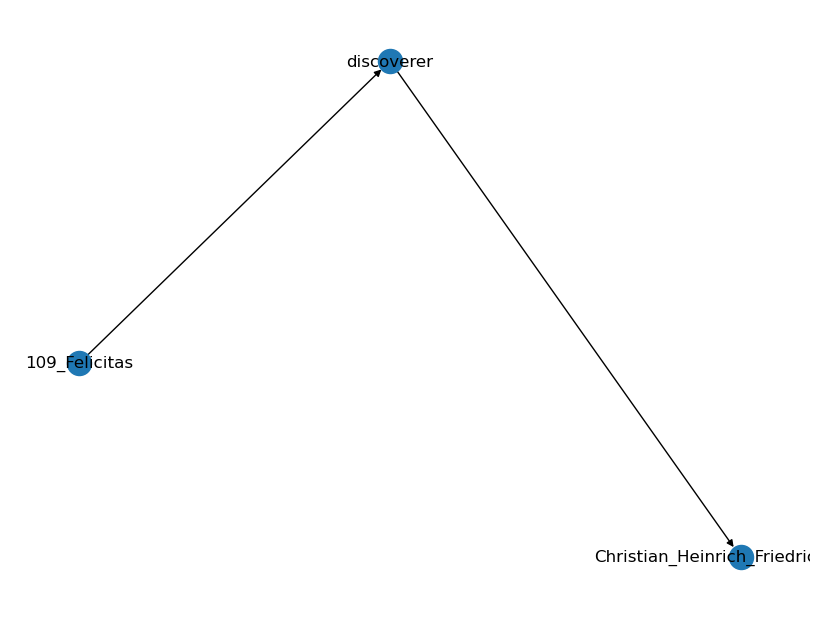

Decoded Input: 
 translate graph to text:  109_Felicitas  discoverer  Christian_Heinrich_Friedrich_Peters
Decoded Target: 
 Christian Heinrich Friedrich Peters was the discoverer of 109 Felicitas.
DataBatch(x=[1, 512], edge_index=[2, 2], attention_mask=[1, 512], y=[1, 512], batch=[512], ptr=[2])
Original Sample: 
 translate graph to text: <H> 109_Felicitas  <R>  periapsis  <T>  2.83326e+11 
 109 Felicitas has a periapsis of 283326000000.0.
NetworkX Graph: 
 [('109_Felicitas', 'periapsis', 0), ('periapsis', '2.83326e+11', 0)]


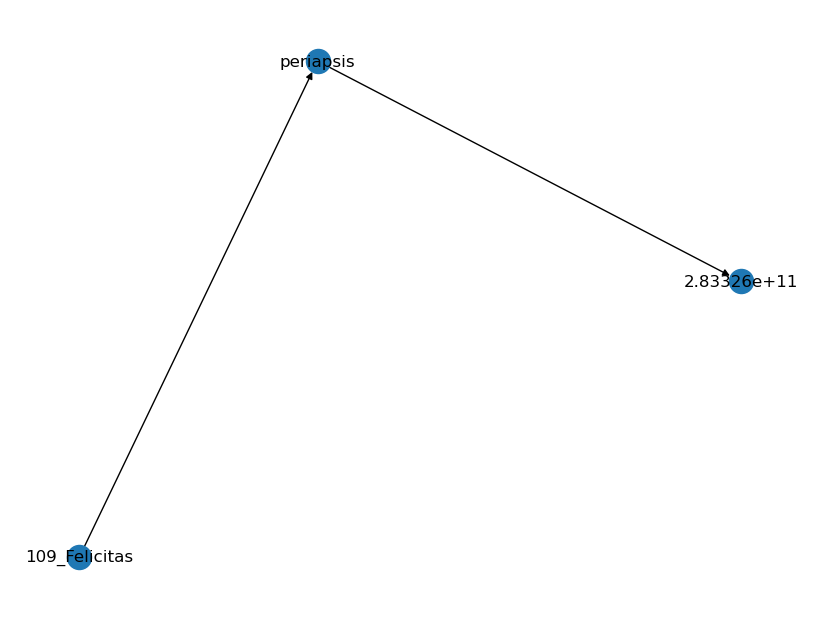

Decoded Input: 
 translate graph to text:  109_Felicitas  periapsis  2.83326e+11
Decoded Target: 
 109 Felicitas has a periapsis of 283326000000.0.
DataBatch(x=[1, 512], edge_index=[2, 2], attention_mask=[1, 512], y=[1, 512], batch=[512], ptr=[2])
Original Sample: 
 translate graph to text: <H> 10_Hygiea  <R>  avgSpeed  <T>  "16.76"^^<http://dbpedia.org/datatype/kilometrePerSecond> 
 The average speed of 10 Hygiea is 16.76 km per secs.
NetworkX Graph: 
 [('10_Hygiea', 'avgSpeed', 0), ('avgSpeed', '"16.76"^^<http://dbpedia.org/datatype/kilometrePerSecond>', 0)]


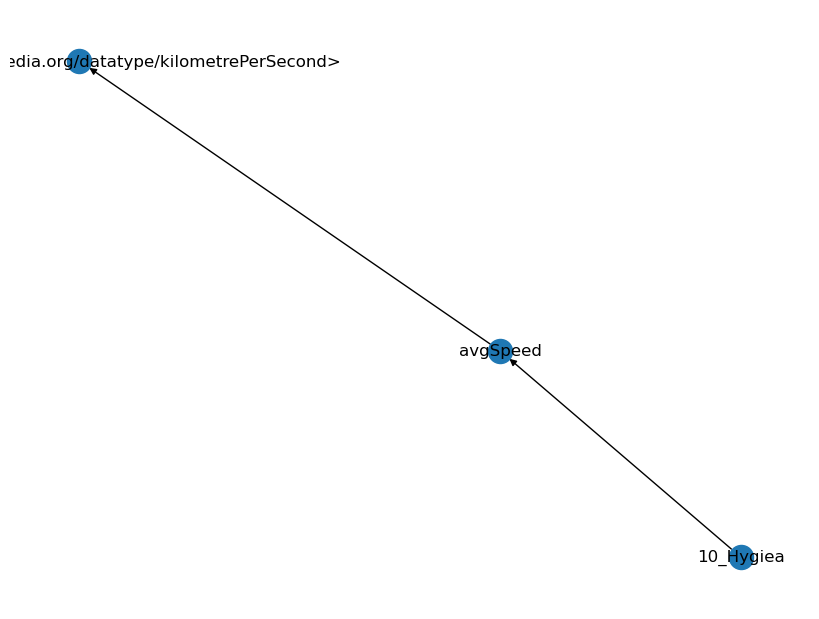

Decoded Input: 
 translate graph to text:  10_Hygiea  avgSpeed  "16.76"http://dbpedia.org/datatype/kilometrePerSecond>
Decoded Target: 
 The average speed of 10 Hygiea is 16.76 km per secs.
DataBatch(x=[1, 512], edge_index=[2, 2], attention_mask=[1, 512], y=[1, 512], batch=[512], ptr=[2])
Original Sample: 
 translate graph to text: <H> 1101_Clematis  <R>  periapsis  <T>  4.45895e+11 
 The periapsis of 1101 Clematis is 445895000000.0.
NetworkX Graph: 
 [('1101_Clematis', 'periapsis', 0), ('periapsis', '4.45895e+11', 0)]


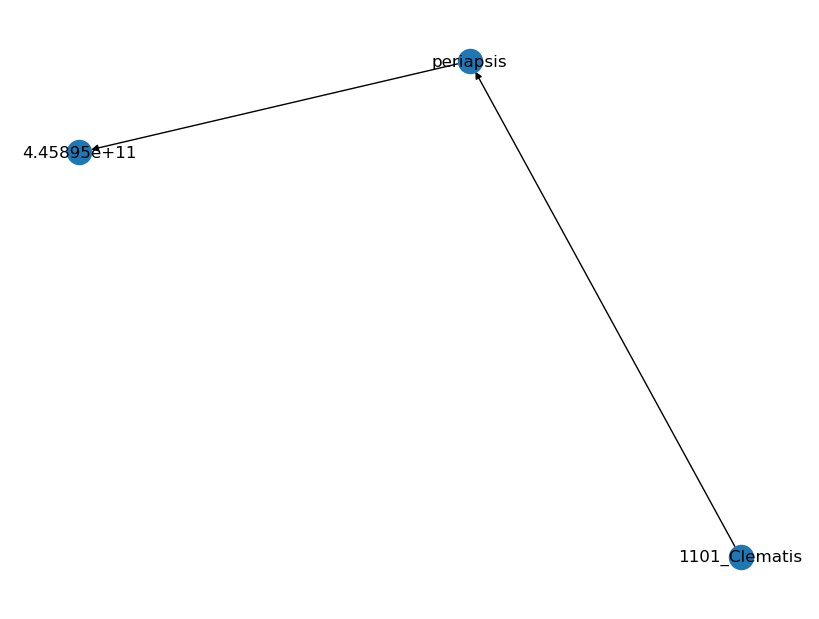

Decoded Input: 
 translate graph to text:  1101_Clematis  periapsis  4.45895e+11
Decoded Target: 
 The periapsis of 1101 Clematis is 445895000000.0.
DataBatch(x=[1, 512], edge_index=[2, 2], attention_mask=[1, 512], y=[1, 512], batch=[512], ptr=[2])
Original Sample: 
 translate graph to text: <H> 110_Lydia  <R>  epoch  <T>  "2006-12-31"^^xsd:date 
 110 Lydia has an epoch date of December 31st 2006.
NetworkX Graph: 
 [('110_Lydia', 'epoch', 0), ('epoch', '"2006-12-31"^^xsd:date', 0)]


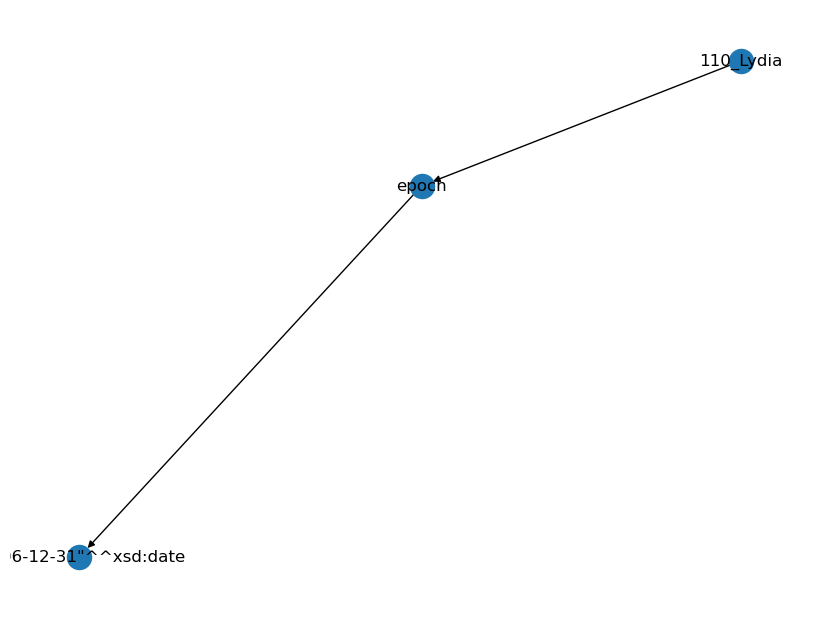

Decoded Input: 
 translate graph to text:  110_Lydia  epoch  "2006-12-31"xsd:date
Decoded Target: 
 110 Lydia has an epoch date of December 31st 2006.
DataBatch(x=[1, 512], edge_index=[2, 2], attention_mask=[1, 512], y=[1, 512], batch=[512], ptr=[2])
Original Sample: 
 translate graph to text: <H> 11264_Claudiomaccone  <R>  temperature  <T>  "173.0"^^xsd:double 
 11264 Claudiomaccone has a temperature of 173.0 (kelvins).
NetworkX Graph: 
 [('11264_Claudiomaccone', 'temperature', 0), ('temperature', '"173.0"^^xsd:double', 0)]


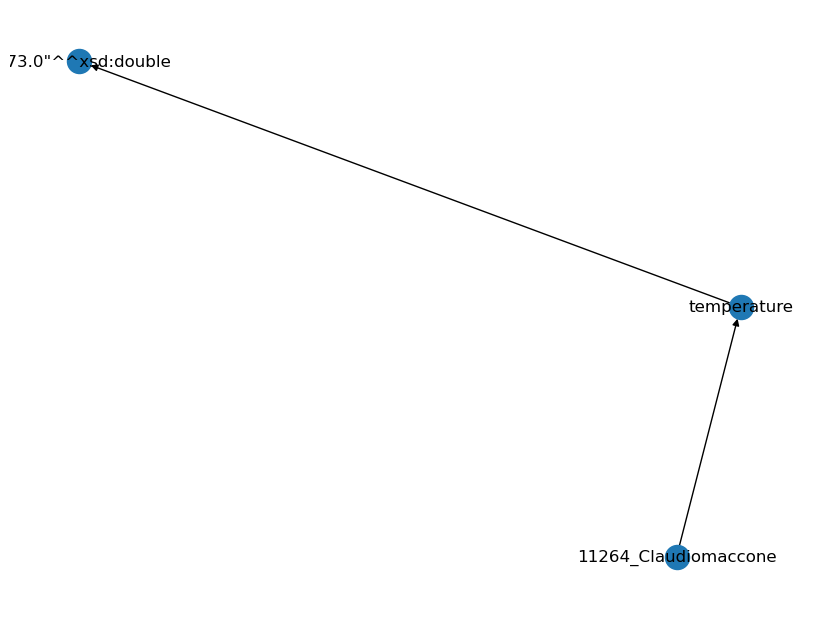

Decoded Input: 
 translate graph to text:  11264_Claudiomaccone  temperature  "173.0"xsd:double
Decoded Target: 
 11264 Claudiomaccone has a temperature of 173.0 (kelvins).
DataBatch(x=[1, 512], edge_index=[2, 2], attention_mask=[1, 512], y=[1, 512], batch=[512], ptr=[2])
Original Sample: 
 translate graph to text: <H> James_Craig_Watson  <R>  education  <T>  University_of_Michigan 
 James Craig Watson's alma mater was the University of Michigan.
NetworkX Graph: 
 [('James_Craig_Watson', 'education', 0), ('education', 'University_of_Michigan', 0)]


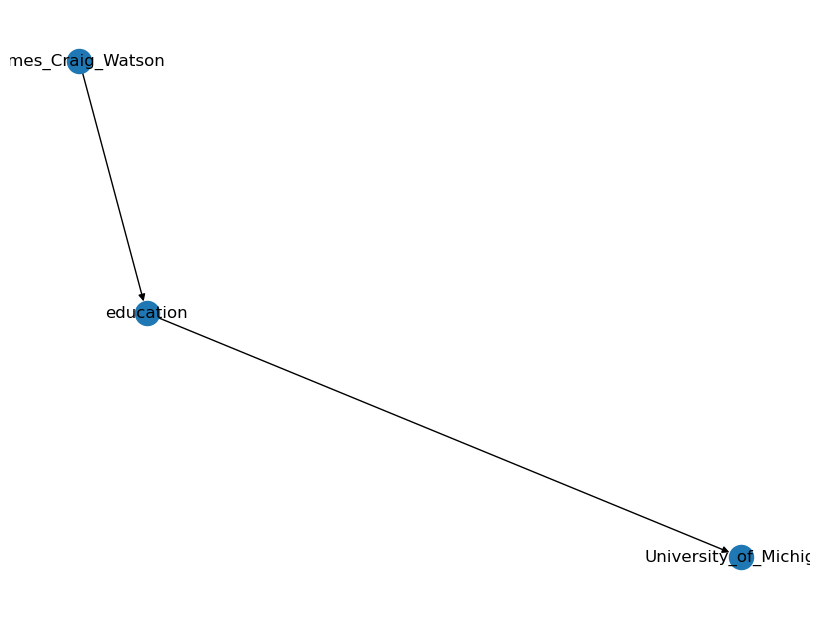

Decoded Input: 
 translate graph to text:  James_Craig_Watson  education  University_of_Michigan
Decoded Target: 
 James Craig Watson's alma mater was the University of Michigan.
DataBatch(x=[1, 512], edge_index=[2, 2], attention_mask=[1, 512], y=[1, 512], batch=[512], ptr=[2])
Original Sample: 
 translate graph to text: <H> N._R._Pogson  <R>  birthPlace  <T>  Nottingham 
 N R Pogson was born in Nottingham.
NetworkX Graph: 
 [('N._R._Pogson', 'birthPlace', 0), ('birthPlace', 'Nottingham', 0)]


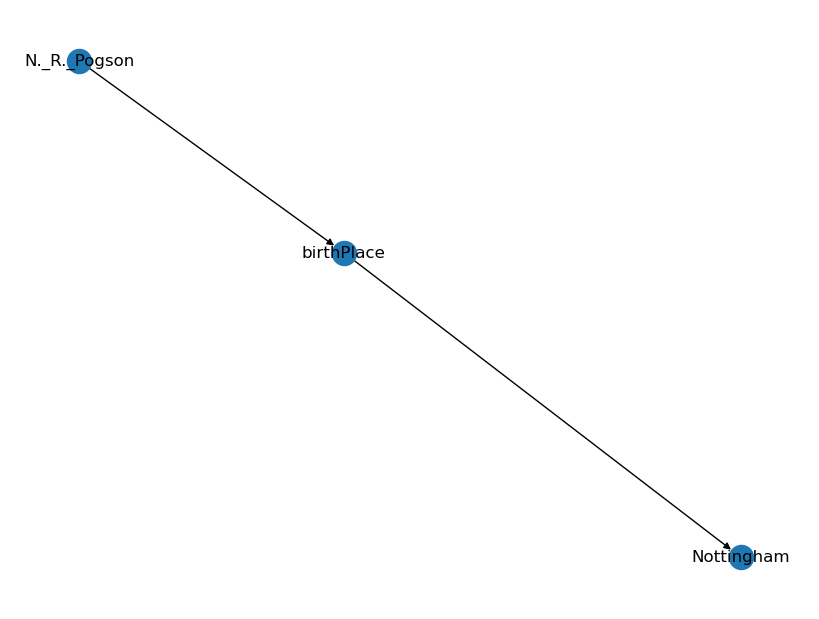

Decoded Input: 
 translate graph to text:  N._R._Pogson  birthPlace  Nottingham
Decoded Target: 
 N R Pogson was born in Nottingham.
DataBatch(x=[1, 512], edge_index=[2, 2], attention_mask=[1, 512], y=[1, 512], batch=[512], ptr=[2])
Original Sample: 
 translate graph to text: <H> Aaron_S._Daggett  <R>  award  <T>  Purple_Heart <H> Aaron_S._Daggett  <R>  battles  <T>  Battle_of_Fredericksburg 
 Aaron S. Daggett fought in the Battle of Fredericksburg and received the Purple Heart.
NetworkX Graph: 
 [('Aaron_S._Daggett', 'award', 0), ('Aaron_S._Daggett', 'battles', 0), ('award', 'Purple_Heart', 0), ('battles', 'Battle_of_Fredericksburg', 0)]


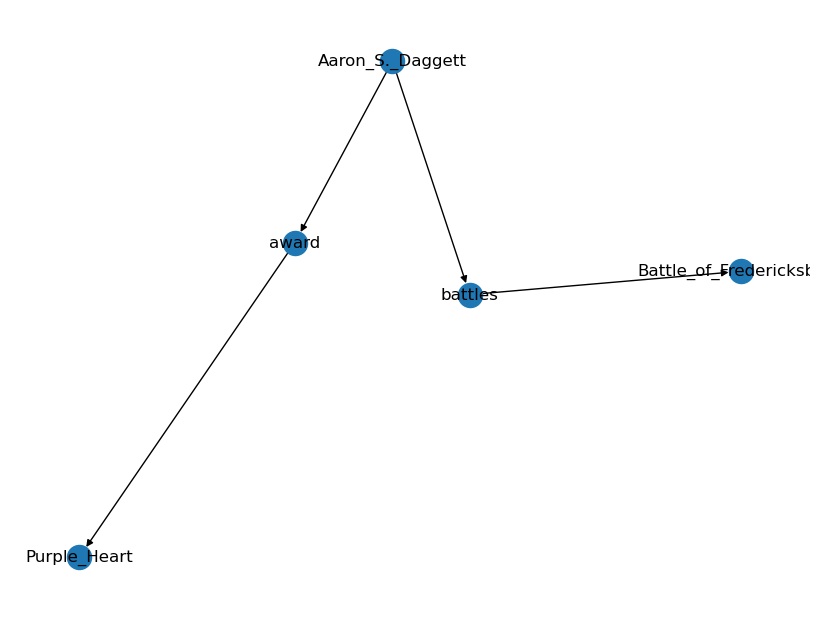

Decoded Input: 
 translate graph to text:  Aaron_S._Daggett  award  Purple_Heart  Aaron_S._Daggett  battles  Battle_of_Fredericksburg
Decoded Target: 
 Aaron S. Daggett fought in the Battle of Fredericksburg and received the Purple Heart.
DataBatch(x=[1, 512], edge_index=[2, 4], attention_mask=[1, 512], y=[1, 512], batch=[512], ptr=[2])
Original Sample: 
 translate graph to text: <H> Aaron_S._Daggett  <R>  battles  <T>  Battle_of_Gettysburg <H> Aaron_S._Daggett  <R>  award  <T>  Purple_Heart 
 Aaron S Daggett fought at the Battle of Gettysburg and was awarded the Purple Heart.
NetworkX Graph: 
 [('Aaron_S._Daggett', 'battles', 0), ('Aaron_S._Daggett', 'award', 0), ('battles', 'Battle_of_Gettysburg', 0), ('award', 'Purple_Heart', 0)]


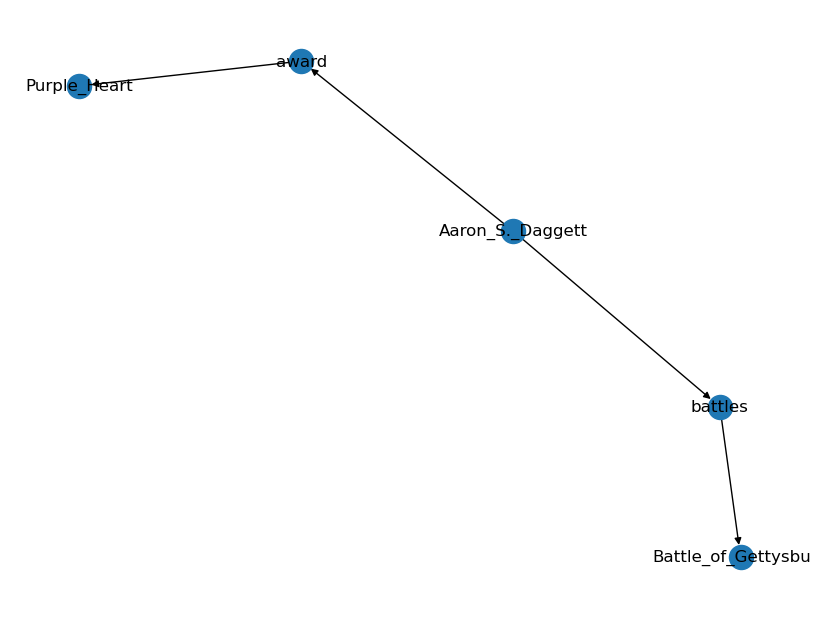

Decoded Input: 
 translate graph to text:  Aaron_S._Daggett  battles  Battle_of_Gettysburg  Aaron_S._Daggett  award  Purple_Heart
Decoded Target: 
 Aaron S Daggett fought at the Battle of Gettysburg and was awarded the Purple Heart.
DataBatch(x=[1, 512], edge_index=[2, 4], attention_mask=[1, 512], y=[1, 512], batch=[512], ptr=[2])
Original Sample: 
 translate graph to text: <H> Abdul_Rahman_Ya'kub  <R>  deputy  <T>  Stephen_Yong_Kuet_Tze <H> Abdul_Taib_Mahmud  <R>  successor  <T>  Abdul_Rahman_Ya'kub 
 Stephen Yong Kuet Tze is Abdul Rahman Ya'kub's deputy. Abdul Taib Mahmud was Abdul Rahman Ya'kub's successor.
NetworkX Graph: 
 [("Abdul_Rahman_Ya'kub", 'deputy', 0), ('deputy', 'Stephen_Yong_Kuet_Tze', 0), ('Abdul_Taib_Mahmud', 'successor', 0), ('successor', "Abdul_Rahman_Ya'kub", 0)]


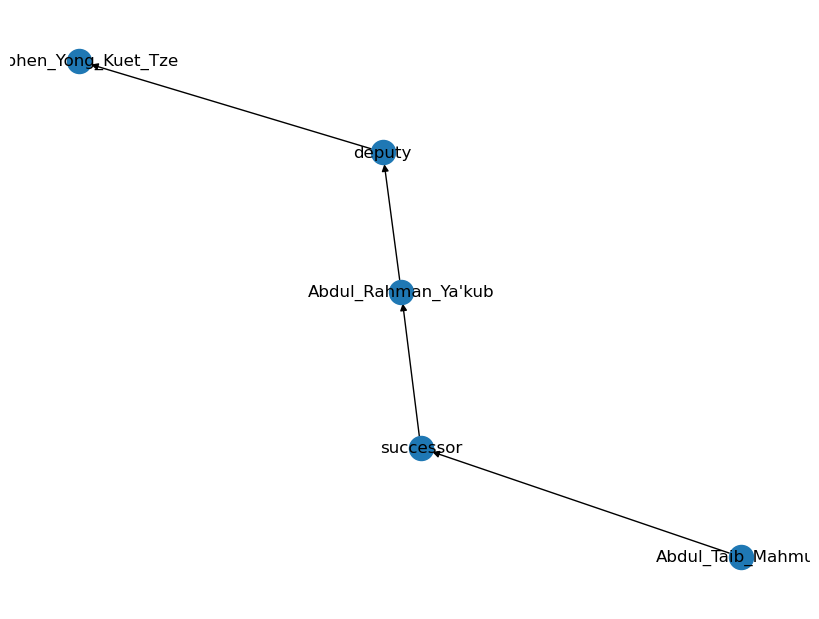

Decoded Input: 
 translate graph to text:  Abdul_Rahman_Ya'kub  deputy  Stephen_Yong_Kuet_Tze  Abdul_Taib_Mahmud  successor  Abdul_Rahman_Ya'kub
Decoded Target: 
 Stephen Yong Kuet Tze is Abdul Rahman Ya'kub's deputy. Abdul Taib Mahmud was Abdul Rahman Ya'kub's successor.
DataBatch(x=[1, 512], edge_index=[2, 4], attention_mask=[1, 512], y=[1, 512], batch=[512], ptr=[2])
Original Sample: 
 translate graph to text: <H> Abdul_Taib_Mahmud  <R>  party  <T>  Parti_Pesaka_Bumiputera_Bersatu <H> Abdul_Taib_Mahmud  <R>  birthPlace  <T>  Kingdom_of_Sarawak 
 Abdul Taid Mahmud was born in Sarawak and is part of the Parti Pesaka Bumiputera Bersatu.
NetworkX Graph: 
 [('Abdul_Taib_Mahmud', 'party', 0), ('Abdul_Taib_Mahmud', 'birthPlace', 0), ('party', 'Parti_Pesaka_Bumiputera_Bersatu', 0), ('birthPlace', 'Kingdom_of_Sarawak', 0)]


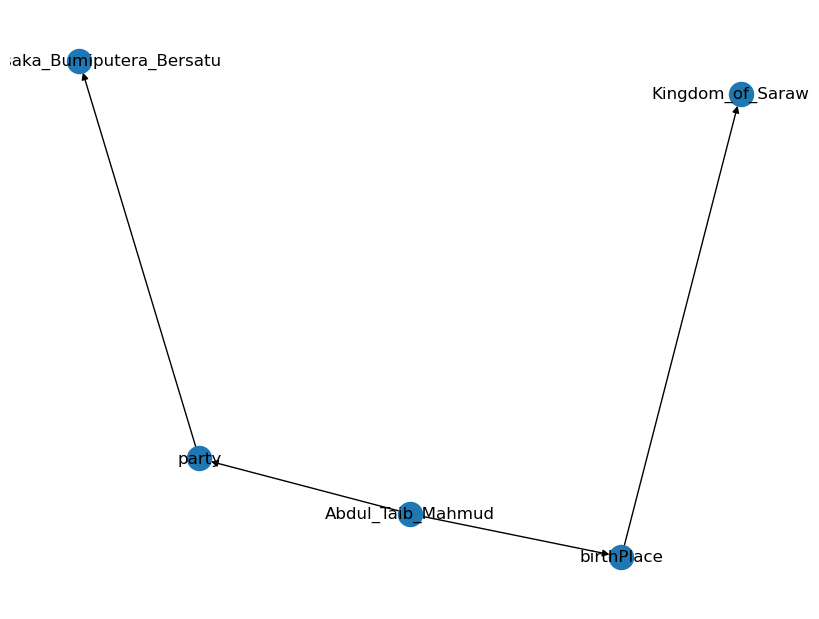

Decoded Input: 
 translate graph to text:  Abdul_Taib_Mahmud  party  Parti_Pesaka_Bumiputera_Bersatu  Abdul_Taib_Mahmud  birthPlace  Kingdom_of_Sarawak
Decoded Target: 
 Abdul Taid Mahmud was born in Sarawak and is part of the Parti Pesaka Bumiputera Bersatu.
DataBatch(x=[1, 512], edge_index=[2, 4], attention_mask=[1, 512], y=[1, 512], batch=[512], ptr=[2])
Original Sample: 
 translate graph to text: <H> Abdulsalami_Abubakar  <R>  birthPlace  <T>  Minna <H> Abdulsalami_Abubakar  <R>  almaMater  <T>  "Technical Institute, Kaduna"@en 
 Abdulsalami Abubakar, was born in Minna, and has the Technical Institute Kaduna, for an almar mater.
NetworkX Graph: 
 [('Abdulsalami_Abubakar', 'birthPlace', 0), ('Abdulsalami_Abubakar', 'almaMater', 0), ('birthPlace', 'Minna', 0), ('almaMater', '"Technical Institute, Kaduna"@en', 0)]


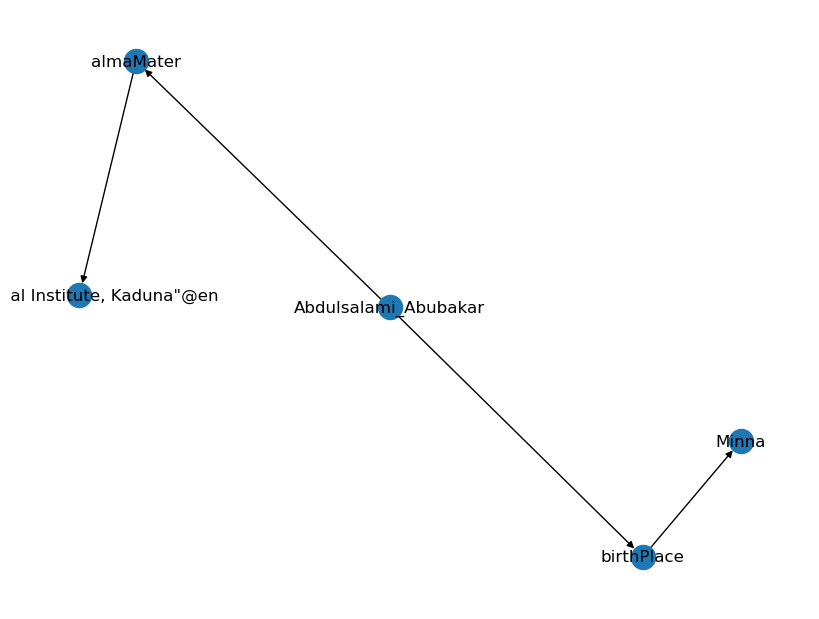

Decoded Input: 
 translate graph to text:  Abdulsalami_Abubakar  birthPlace  Minna  Abdulsalami_Abubakar  almaMater  "Technical Institute, Kaduna"@en
Decoded Target: 
 Abdulsalami Abubakar, was born in Minna, and has the Technical Institute Kaduna, for an almar mater.
DataBatch(x=[1, 512], edge_index=[2, 4], attention_mask=[1, 512], y=[1, 512], batch=[512], ptr=[2])
Original Sample: 
 translate graph to text: <H> Abdulsalami_Abubakar  <R>  office  <T>  "Chief of Defence Staff" <H> Abdulsalami_Abubakar  <R>  birthPlace  <T>  Niger_State 
 Abdulsalami Abubakar was born in Niger State and was the Chief of the Defence Staff in Nigeria.
NetworkX Graph: 
 [('Abdulsalami_Abubakar', 'office', 0), ('Abdulsalami_Abubakar', 'birthPlace', 0), ('office', '"Chief of Defence Staff"', 0), ('birthPlace', 'Niger_State', 0)]


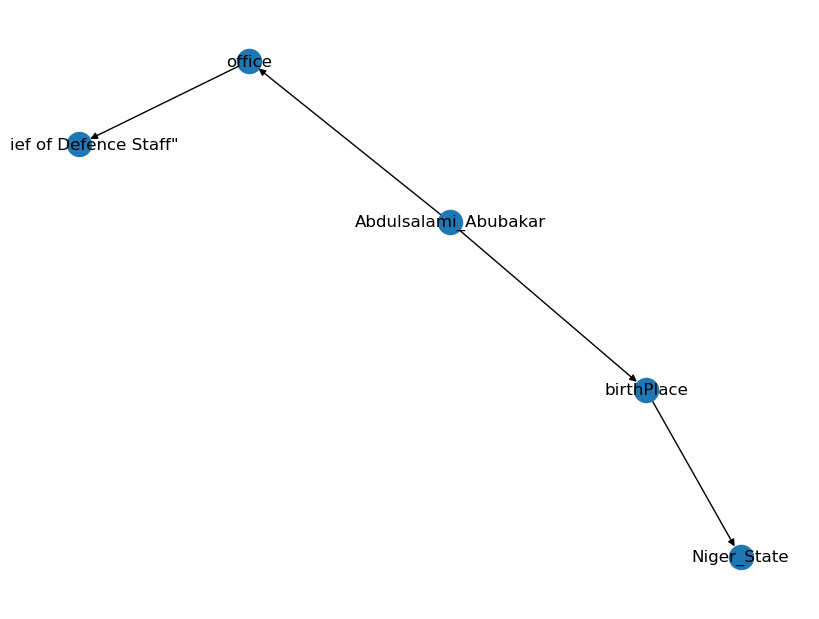

Decoded Input: 
 translate graph to text:  Abdulsalami_Abubakar  office  "Chief of Defence Staff"  Abdulsalami_Abubakar  birthPlace  Niger_State
Decoded Target: 
 Abdulsalami Abubakar was born in Niger State and was the Chief of the Defence Staff in Nigeria.
DataBatch(x=[1, 512], edge_index=[2, 4], attention_mask=[1, 512], y=[1, 512], batch=[512], ptr=[2])
Original Sample: 
 translate graph to text: <H> Abdulsalami_Abubakar  <R>  successor  <T>  Al-Amin_Daggash <H> Abdulsalami_Abubakar  <R>  office  <T>  Chief_of_the_Defence_Staff_(Nigeria) 
 Al-Amin Daggash was succeeded as Chief of the Defence Staff in Nigeria by Abdulsalami Abubakar.
NetworkX Graph: 
 [('Abdulsalami_Abubakar', 'successor', 0), ('Abdulsalami_Abubakar', 'office', 0), ('successor', 'Al-Amin_Daggash', 0), ('office', 'Chief_of_the_Defence_Staff_', 0)]


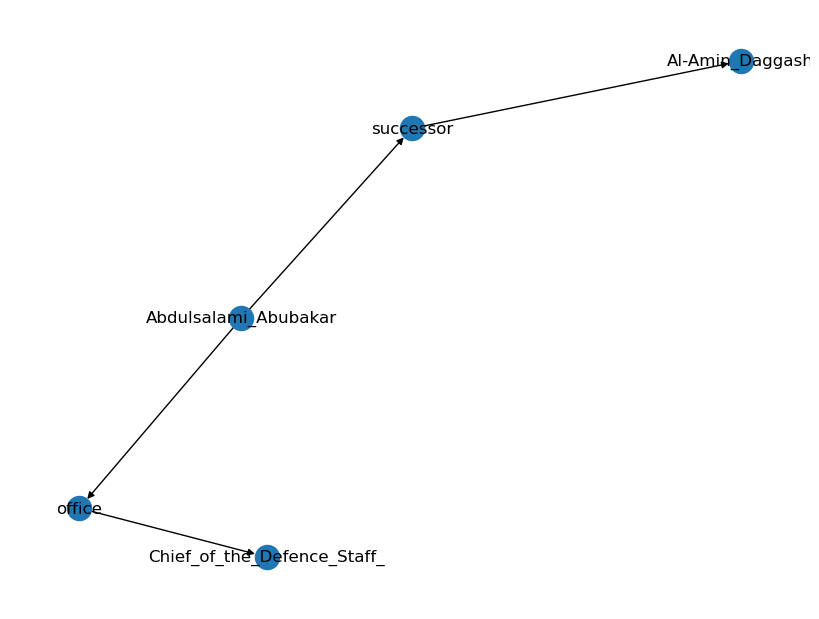

Decoded Input: 
 translate graph to text:  Abdulsalami_Abubakar  successor  Al-Amin_Daggash  Abdulsalami_Abubakar  office  Chief_of_the_Defence_Staff_(Nigeria)
Decoded Target: 
 Al-Amin Daggash was succeeded as Chief of the Defence Staff in Nigeria by Abdulsalami Abubakar.
DataBatch(x=[1, 512], edge_index=[2, 4], attention_mask=[1, 512], y=[1, 512], batch=[512], ptr=[2])
Original Sample: 
 translate graph to text: <H> Abdulsalami_Abubakar  <R>  successor  <T>  Olusegun_Obasanjo <H> Abdulsalami_Abubakar  <R>  activeYearsEndDate  <T>  "1999-05-29"^^xsd:date 
 Abdulsalami Abubakar, ended his career on 1999-05-29, and was succeeded by Olusegun Obasanjo.
NetworkX Graph: 
 [('Abdulsalami_Abubakar', 'successor', 0), ('Abdulsalami_Abubakar', 'activeYearsEndDate', 0), ('successor', 'Olusegun_Obasanjo', 0), ('activeYearsEndDate', '"1999-05-29"^^xsd:date', 0)]


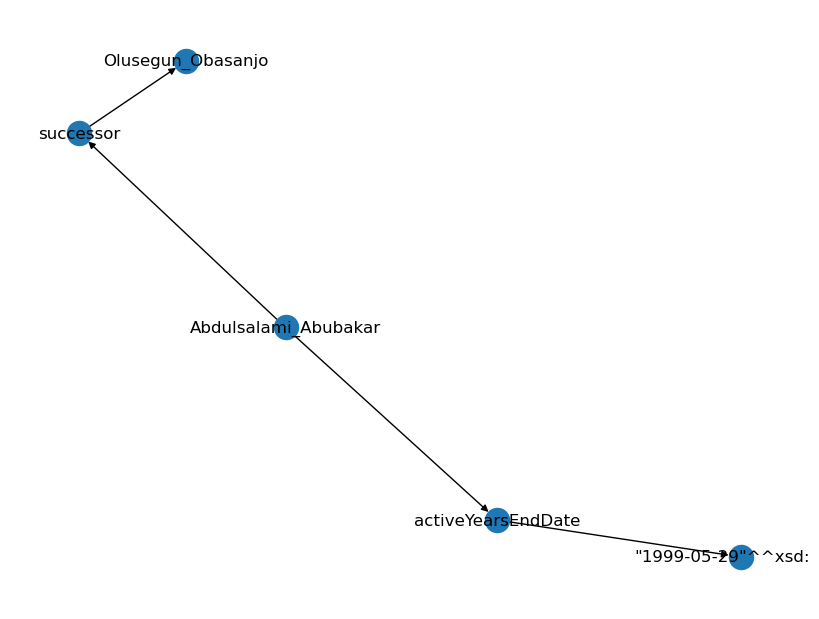

Decoded Input: 
 translate graph to text:  Abdulsalami_Abubakar  successor  Olusegun_Obasanjo  Abdulsalami_Abubakar  activeYearsEndDate  "1999-05-29"xsd:date
Decoded Target: 
 Abdulsalami Abubakar, ended his career on 1999-05-29, and was succeeded by Olusegun Obasanjo.
DataBatch(x=[1, 512], edge_index=[2, 4], attention_mask=[1, 512], y=[1, 512], batch=[512], ptr=[2])
Original Sample: 
 translate graph to text: <H> Abdulsalami_Abubakar  <R>  successor  <T>  Olusegun_Obasanjo <H> Abdulsalami_Abubakar  <R>  vicePresident  <T>  Mike_Akhigbe 
 Abdulsalami Abubakar was also in office while Mr. Mike Akhigbe was Vice President. Olusegun Obasanjo succeeded Mr. Abubaka.
NetworkX Graph: 
 [('Abdulsalami_Abubakar', 'successor', 0), ('Abdulsalami_Abubakar', 'vicePresident', 0), ('successor', 'Olusegun_Obasanjo', 0), ('vicePresident', 'Mike_Akhigbe', 0)]


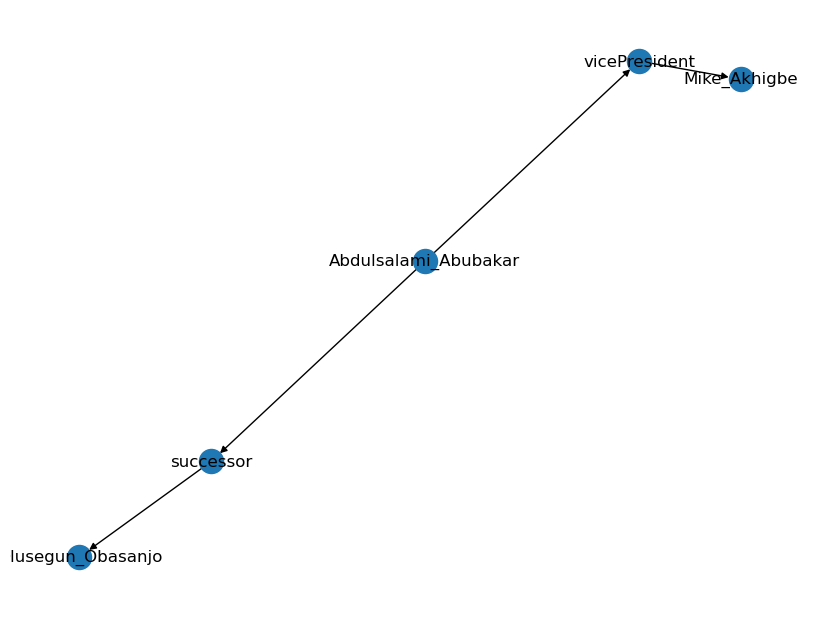

Decoded Input: 
 translate graph to text:  Abdulsalami_Abubakar  successor  Olusegun_Obasanjo  Abdulsalami_Abubakar  vicePresident  Mike_Akhigbe
Decoded Target: 
 Abdulsalami Abubakar was also in office while Mr. Mike Akhigbe was Vice President. Olusegun Obasanjo succeeded Mr. Abubaka.
DataBatch(x=[1, 512], edge_index=[2, 4], attention_mask=[1, 512], y=[1, 512], batch=[512], ptr=[2])
Original Sample: 
 translate graph to text: <H> Abner_W._Sibal  <R>  battles  <T>  World_War_II <H> World_War_II  <R>  commander  <T>  Joseph_Stalin 
 Joseph Stalin was a commander in World War II in which Abner W Sibal also fought.
NetworkX Graph: 
 [('Abner_W._Sibal', 'battles', 0), ('battles', 'World_War_II', 0), ('World_War_II', 'commander', 0), ('commander', 'Joseph_Stalin', 0)]


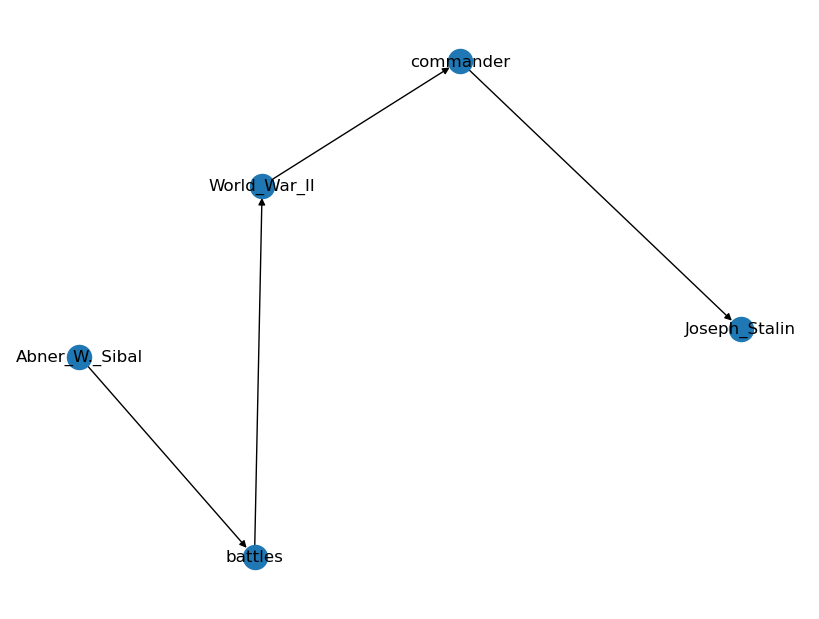

Decoded Input: 
 translate graph to text:  Abner_W._Sibal  battles  World_War_II  World_War_II  commander  Joseph_Stalin
Decoded Target: 
 Joseph Stalin was a commander in World War II in which Abner W Sibal also fought.
DataBatch(x=[1, 512], edge_index=[2, 4], attention_mask=[1, 512], y=[1, 512], batch=[512], ptr=[2])
Original Sample: 
 translate graph to text: <H> Abner_W._Sibal  <R>  militaryBranch  <T>  United_States_Army <H> United_States_Army  <R>  battles  <T>  Korean_War 
 Abner W. Sibal serve in the United States army which took part in the Korean War.
NetworkX Graph: 
 [('Abner_W._Sibal', 'militaryBranch', 0), ('militaryBranch', 'United_States_Army', 0), ('United_States_Army', 'battles', 0), ('battles', 'Korean_War', 0)]


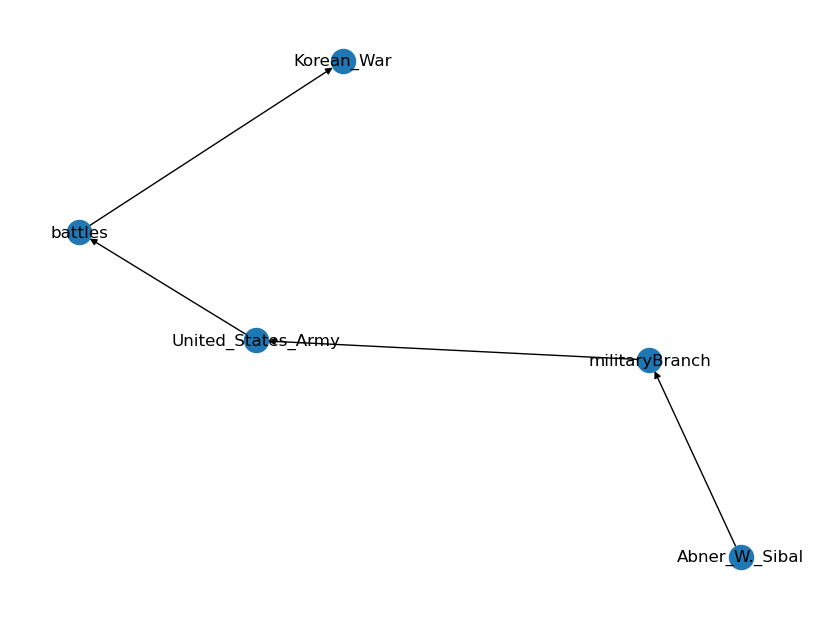

Decoded Input: 
 translate graph to text:  Abner_W._Sibal  militaryBranch  United_States_Army  United_States_Army  battles  Korean_War
Decoded Target: 
 Abner W. Sibal serve in the United States army which took part in the Korean War.
DataBatch(x=[1, 512], edge_index=[2, 4], attention_mask=[1, 512], y=[1, 512], batch=[512], ptr=[2])
Original Sample: 
 translate graph to text: <H> Adam_Holloway  <R>  birthPlace  <T>  Kent <H> Adam_Holloway  <R>  almaMater  <T>  Magdalene_College,_Cambridge 
 Adam Holloway went to school at Magdalene College Cambridge and was born in Kent.
NetworkX Graph: 
 [('Adam_Holloway', 'birthPlace', 0), ('Adam_Holloway', 'almaMater', 0), ('birthPlace', 'Kent', 0), ('almaMater', 'Magdalene_College,_Cambridge', 0)]


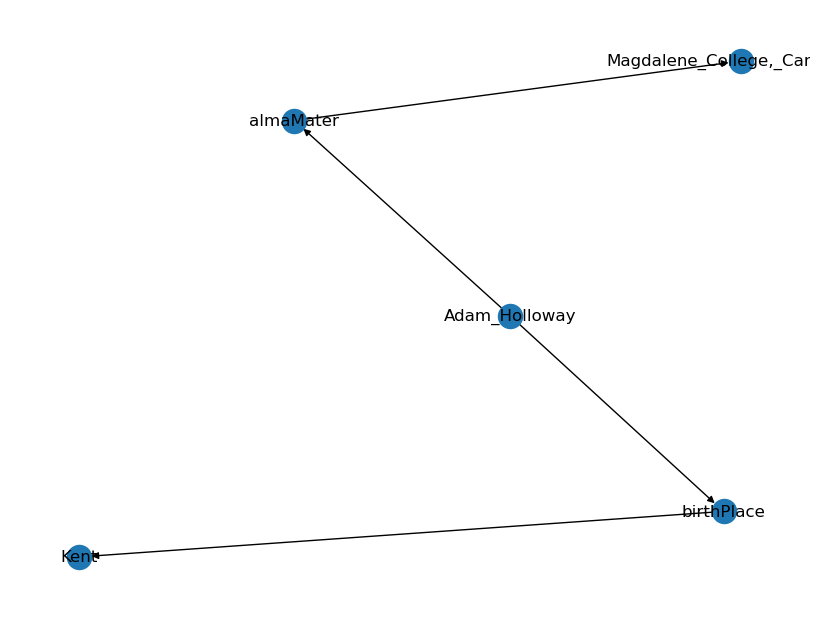

Decoded Input: 
 translate graph to text:  Adam_Holloway  birthPlace  Kent  Adam_Holloway  almaMater  Magdalene_College,_Cambridge
Decoded Target: 
 Adam Holloway went to school at Magdalene College Cambridge and was born in Kent.
DataBatch(x=[1, 512], edge_index=[2, 4], attention_mask=[1, 512], y=[1, 512], batch=[512], ptr=[2])
Original Sample: 
 translate graph to text: <H> Adam_Holloway  <R>  residence  <T>  Gravesend <H> Adam_Holloway  <R>  birthPlace  <T>  Kent 
 Born in Kent, Adam Holloway now lives in Gravesend.
NetworkX Graph: 
 [('Adam_Holloway', 'residence', 0), ('Adam_Holloway', 'birthPlace', 0), ('residence', 'Gravesend', 0), ('birthPlace', 'Kent', 0)]


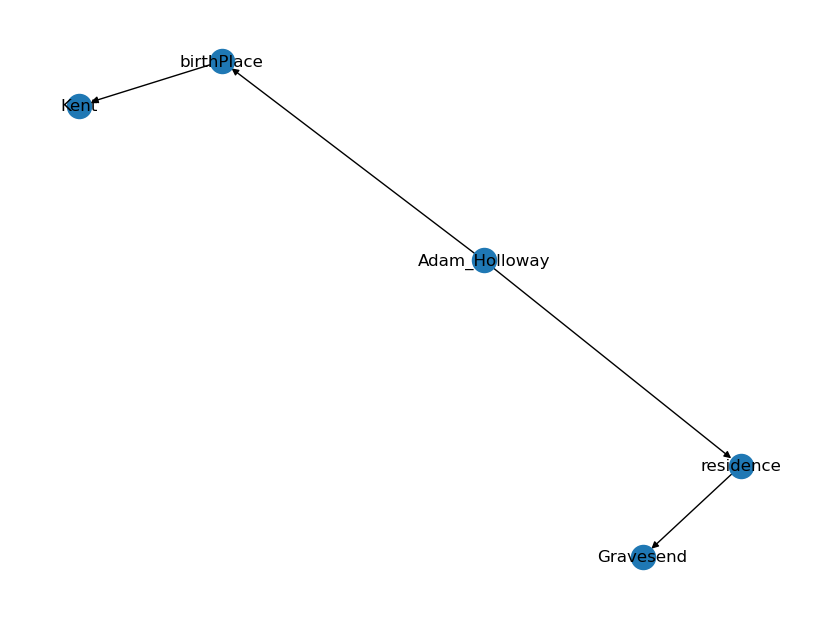

Decoded Input: 
 translate graph to text:  Adam_Holloway  residence  Gravesend  Adam_Holloway  birthPlace  Kent
Decoded Target: 
 Born in Kent, Adam Holloway now lives in Gravesend.
DataBatch(x=[1, 512], edge_index=[2, 4], attention_mask=[1, 512], y=[1, 512], batch=[512], ptr=[2])
Original Sample: 
 translate graph to text: <H> Adam_Koc  <R>  battles  <T>  World_War_I <H> Adam_Koc  <R>  award  <T>  Virtuti_Militari 
 Adam Koc, who won the Virtuti Militari award, fought in World War I.
NetworkX Graph: 
 [('Adam_Koc', 'battles', 0), ('Adam_Koc', 'award', 0), ('battles', 'World_War_I', 0), ('award', 'Virtuti_Militari', 0)]


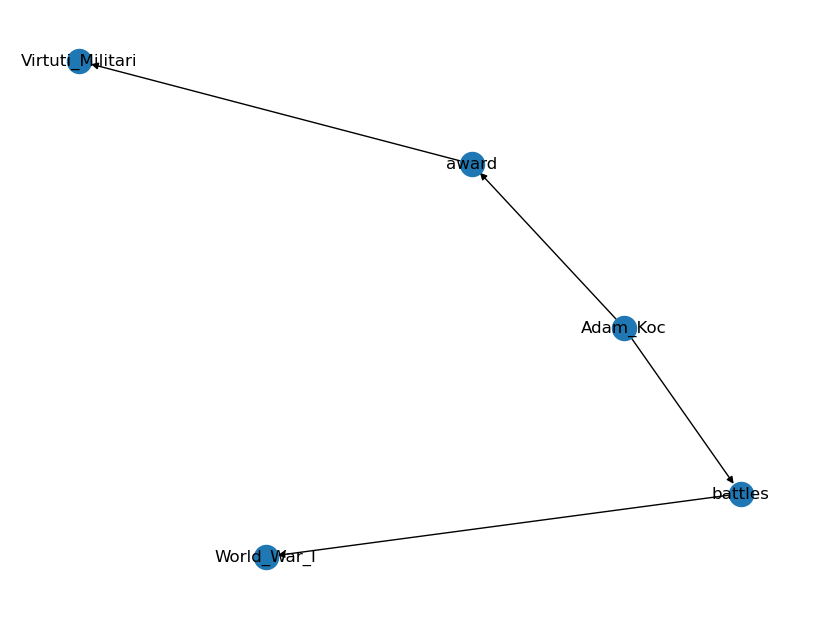

Decoded Input: 
 translate graph to text:  Adam_Koc  battles  World_War_I  Adam_Koc  award  Virtuti_Militari
Decoded Target: 
 Adam Koc, who won the Virtuti Militari award, fought in World War I.
DataBatch(x=[1, 512], edge_index=[2, 4], attention_mask=[1, 512], y=[1, 512], batch=[512], ptr=[2])
Original Sample: 
 translate graph to text: <H> Adonis_Georgiadis  <R>  birthPlace  <T>  Athens <H> Adonis_Georgiadis  <R>  office  <T>  "Deputy Parliamentary Spokesman of Popular Orthodox Rally"@en 
 Adonis Georgiadis was born in Athens and has been the Deputy Parliamentary Spokesman of the Popular Orthodox Rally.
NetworkX Graph: 
 [('Adonis_Georgiadis', 'birthPlace', 0), ('Adonis_Georgiadis', 'office', 0), ('birthPlace', 'Athens', 0), ('office', '"Deputy Parliamentary Spokesman of Popular Orthodox Rally"@en', 0)]


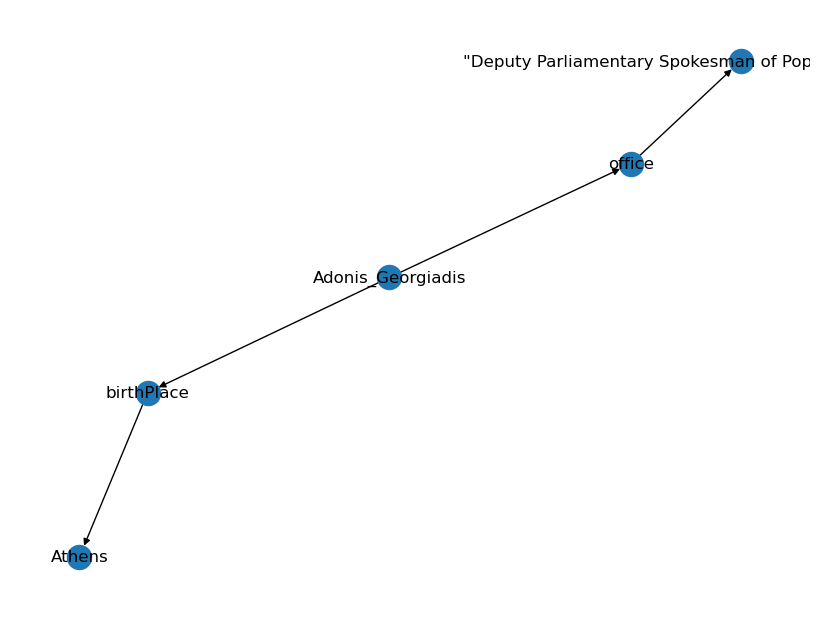

Decoded Input: 
 translate graph to text:  Adonis_Georgiadis  birthPlace  Athens  Adonis_Georgiadis  office  "Deputy Parliamentary Spokesman of Popular Orthodox Rally"@en
Decoded Target: 
 Adonis Georgiadis was born in Athens and has been the Deputy Parliamentary Spokesman of the Popular Orthodox Rally.
DataBatch(x=[1, 512], edge_index=[2, 4], attention_mask=[1, 512], y=[1, 512], batch=[512], ptr=[2])
Original Sample: 
 translate graph to text: <H> Adonis_Georgiadis  <R>  birthPlace  <T>  Greece <H> Adonis_Georgiadis  <R>  placeOfBirth  <T>  Athens 
 Adonis Georgiadis was born in Athens, Greece.
NetworkX Graph: 
 [('Adonis_Georgiadis', 'birthPlace', 0), ('Adonis_Georgiadis', 'placeOfBirth', 0), ('birthPlace', 'Greece', 0), ('placeOfBirth', 'Athens', 0)]


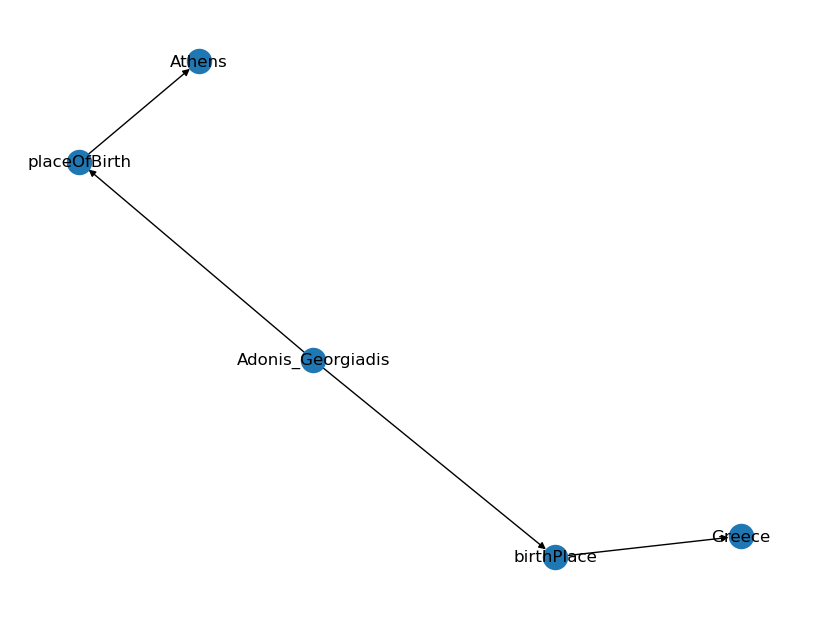

Decoded Input: 
 translate graph to text:  Adonis_Georgiadis  birthPlace  Greece  Adonis_Georgiadis  placeOfBirth  Athens
Decoded Target: 
 Adonis Georgiadis was born in Athens, Greece.
DataBatch(x=[1, 512], edge_index=[2, 4], attention_mask=[1, 512], y=[1, 512], batch=[512], ptr=[2])
Original Sample: 
 translate graph to text: <H> Adonis_Georgiadis  <R>  birthPlace  <T>  Greece <H> Adonis_Georgiadis  <R>  office  <T>  "Deputy Parliamentary Spokesman of Popular Orthodox Rally"@en 
 Born in Greece, Adonis Georgiadis, worked as the Deputy Parliamentary Spokesman of Popular Orthodox Rally.
NetworkX Graph: 
 [('Adonis_Georgiadis', 'birthPlace', 0), ('Adonis_Georgiadis', 'office', 0), ('birthPlace', 'Greece', 0), ('office', '"Deputy Parliamentary Spokesman of Popular Orthodox Rally"@en', 0)]


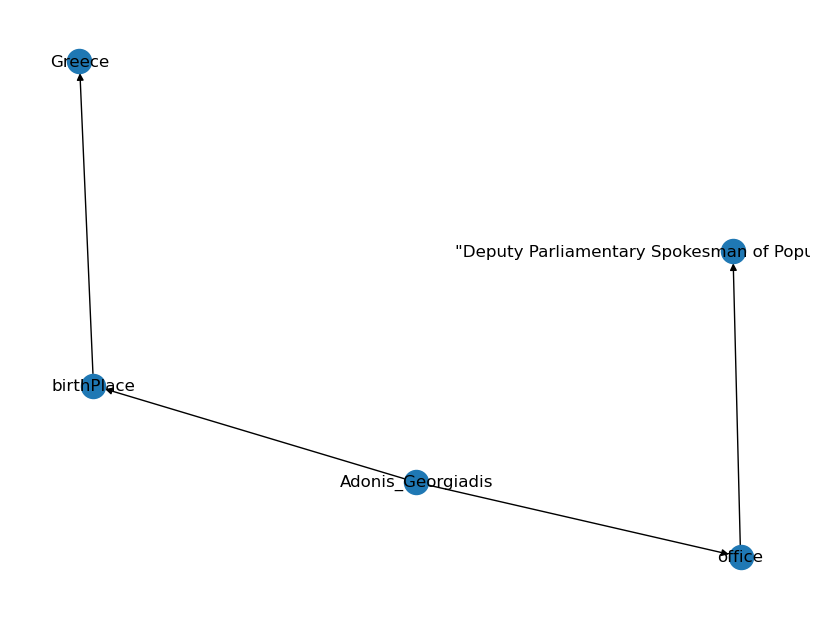

Decoded Input: 
 translate graph to text:  Adonis_Georgiadis  birthPlace  Greece  Adonis_Georgiadis  office  "Deputy Parliamentary Spokesman of Popular Orthodox Rally"@en
Decoded Target: 
 Born in Greece, Adonis Georgiadis, worked as the Deputy Parliamentary Spokesman of Popular Orthodox Rally.
DataBatch(x=[1, 512], edge_index=[2, 4], attention_mask=[1, 512], y=[1, 512], batch=[512], ptr=[2])
Original Sample: 
 translate graph to text: <H> Agnes_Kant  <R>  birthPlace  <T>  Hessisch_Oldendorf <H> Agnes_Kant  <R>  office  <T>  Parliamentary_group_leader 
 Agnes Kant, born in Hessisch Oldendorf, worked as the Parliamentary group leader.
NetworkX Graph: 
 [('Agnes_Kant', 'birthPlace', 0), ('Agnes_Kant', 'office', 0), ('birthPlace', 'Hessisch_Oldendorf', 0), ('office', 'Parliamentary_group_leader', 0)]


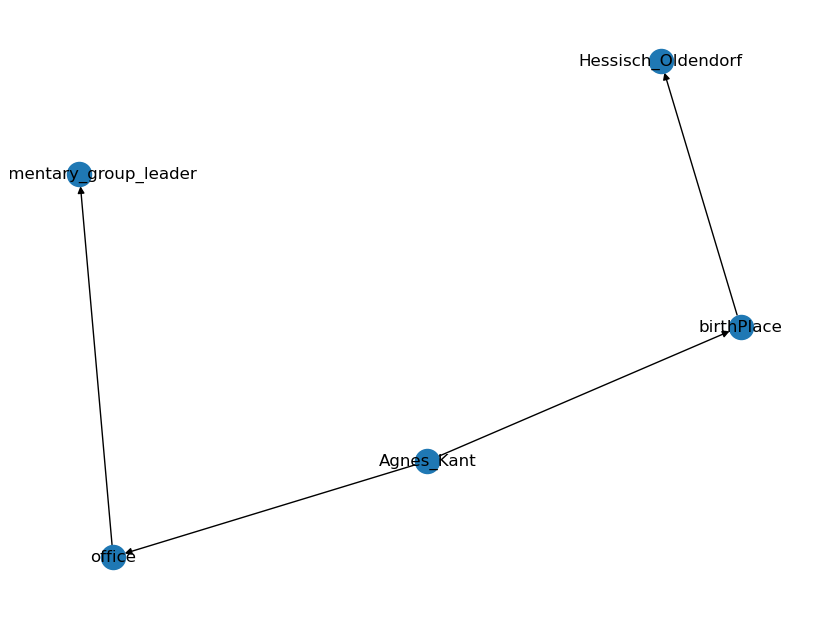

Decoded Input: 
 translate graph to text:  Agnes_Kant  birthPlace  Hessisch_Oldendorf  Agnes_Kant  office  Parliamentary_group_leader
Decoded Target: 
 Agnes Kant, born in Hessisch Oldendorf, worked as the Parliamentary group leader.
DataBatch(x=[1, 512], edge_index=[2, 4], attention_mask=[1, 512], y=[1, 512], batch=[512], ptr=[2])
Original Sample: 
 translate graph to text: <H> Airey_Neave  <R>  award  <T>  Military_Cross <H> Airey_Neave  <R>  unit  <T>  Royal_Artillery 
 Airey Neave served in the Royal Artillery Unit and was awarded the Military Cross.
NetworkX Graph: 
 [('Airey_Neave', 'award', 0), ('Airey_Neave', 'unit', 0), ('award', 'Military_Cross', 0), ('unit', 'Royal_Artillery', 0)]


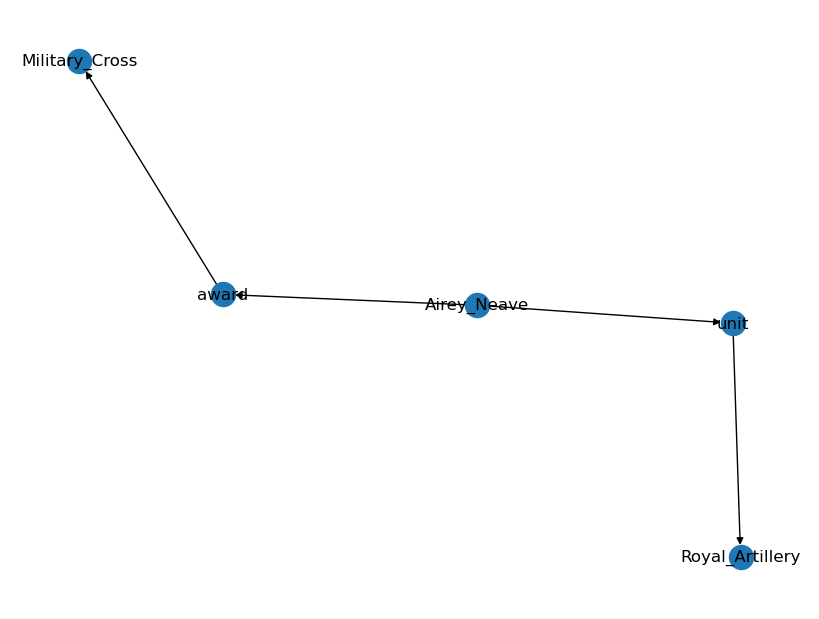

Decoded Input: 
 translate graph to text:  Airey_Neave  award  Military_Cross  Airey_Neave  unit  Royal_Artillery
Decoded Target: 
 Airey Neave served in the Royal Artillery Unit and was awarded the Military Cross.
DataBatch(x=[1, 512], edge_index=[2, 4], attention_mask=[1, 512], y=[1, 512], batch=[512], ptr=[2])
Original Sample: 
 translate graph to text: <H> Airey_Neave  <R>  battles  <T>  Battle_of_France <H> Airey_Neave  <R>  activeYearsStartDate  <T>  "1974-03-04"^^xsd:date 
 Airey Neave was part of the Battle of France but started his career on March 4th, 1974.
NetworkX Graph: 
 [('Airey_Neave', 'battles', 0), ('Airey_Neave', 'activeYearsStartDate', 0), ('battles', 'Battle_of_France', 0), ('activeYearsStartDate', '"1974-03-04"^^xsd:date', 0)]


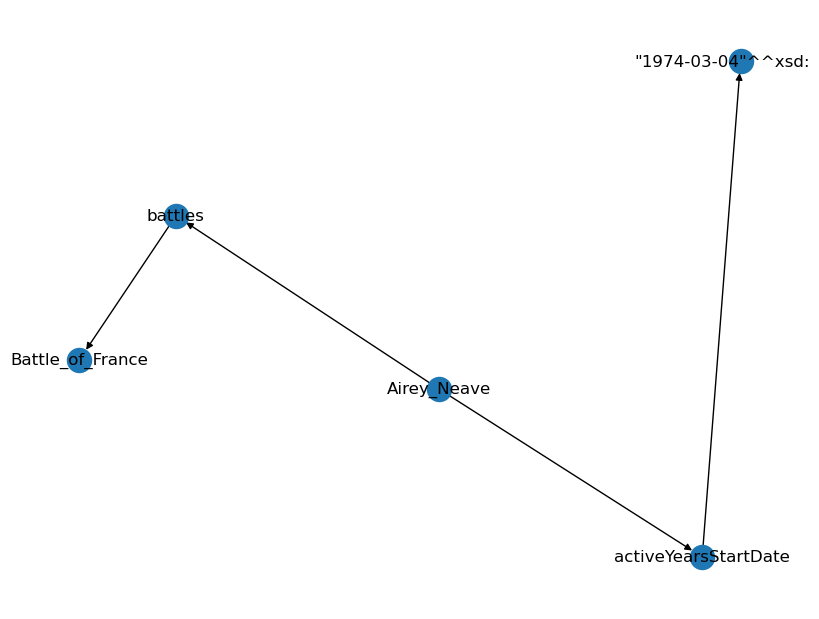

Decoded Input: 
 translate graph to text:  Airey_Neave  battles  Battle_of_France  Airey_Neave  activeYearsStartDate  "1974-03-04"xsd:date
Decoded Target: 
 Airey Neave was part of the Battle of France but started his career on March 4th, 1974.
DataBatch(x=[1, 512], edge_index=[2, 4], attention_mask=[1, 512], y=[1, 512], batch=[512], ptr=[2])
Original Sample: 
 translate graph to text: <H> Airey_Neave  <R>  battles  <T>  Battle_of_France <H> Battle_of_France  <R>  commander  <T>  Hugo_Sperrle 
 Airey Neave was involved in the Battle of France in which Hugo Sperrle was a commander.
NetworkX Graph: 
 [('Airey_Neave', 'battles', 0), ('battles', 'Battle_of_France', 0), ('Battle_of_France', 'commander', 0), ('commander', 'Hugo_Sperrle', 0)]


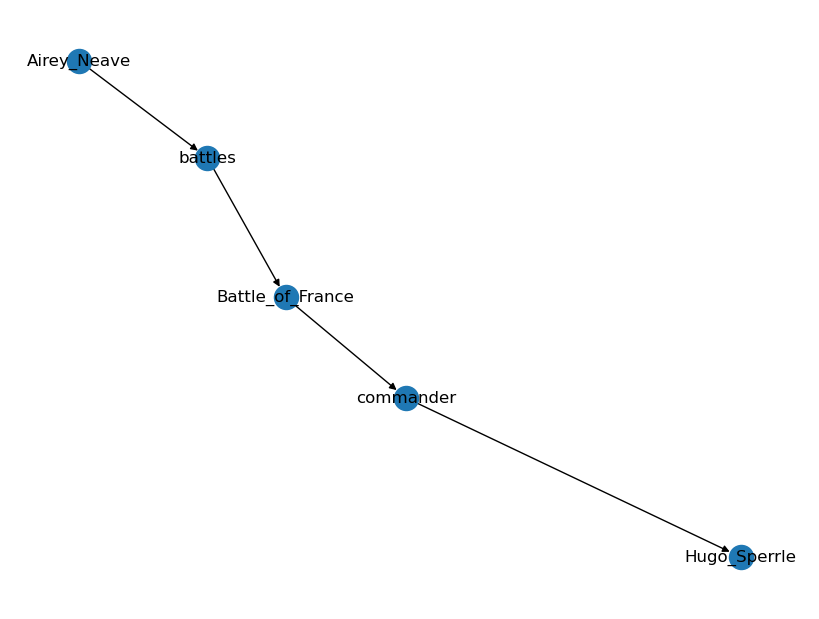

Decoded Input: 
 translate graph to text:  Airey_Neave  battles  Battle_of_France  Battle_of_France  commander  Hugo_Sperrle
Decoded Target: 
 Airey Neave was involved in the Battle of France in which Hugo Sperrle was a commander.
DataBatch(x=[1, 512], edge_index=[2, 4], attention_mask=[1, 512], y=[1, 512], batch=[512], ptr=[2])
Original Sample: 
 translate graph to text: <H> Airey_Neave  <R>  battles  <T>  World_War_II <H> Airey_Neave  <R>  birthPlace  <T>  Knightsbridge 
 Airey Neave, who was born in Kinightsbridge, fought in World War II.
NetworkX Graph: 
 [('Airey_Neave', 'battles', 0), ('Airey_Neave', 'birthPlace', 0), ('battles', 'World_War_II', 0), ('birthPlace', 'Knightsbridge', 0)]


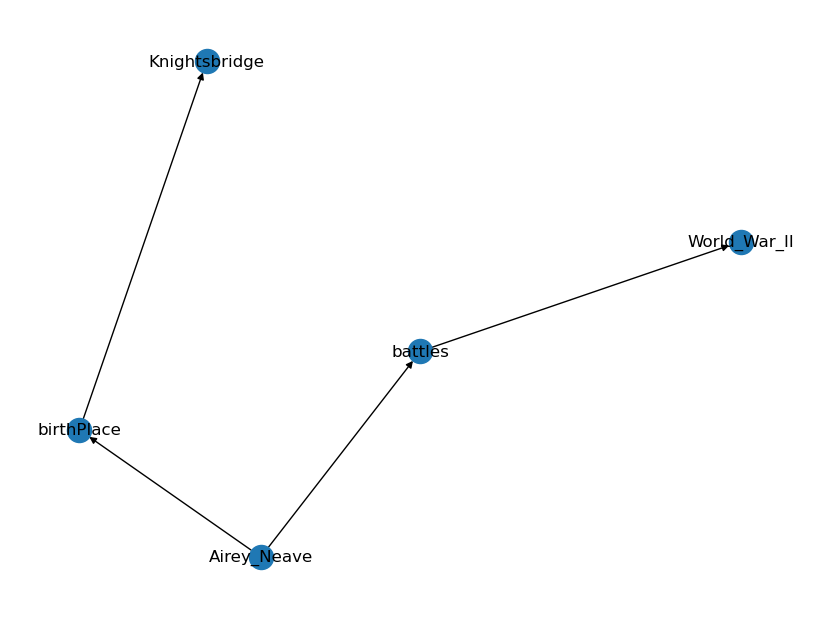

Decoded Input: 
 translate graph to text:  Airey_Neave  battles  World_War_II  Airey_Neave  birthPlace  Knightsbridge
Decoded Target: 
 Airey Neave, who was born in Kinightsbridge, fought in World War II.
DataBatch(x=[1, 512], edge_index=[2, 4], attention_mask=[1, 512], y=[1, 512], batch=[512], ptr=[2])
Original Sample: 
 translate graph to text: <H> Airey_Neave  <R>  battles  <T>  World_War_II <H> World_War_II  <R>  commander  <T>  Franklin_D._Roosevelt 
 Airey Neave fought in World War II where Franklin D. Roosevelt was a commander.
NetworkX Graph: 
 [('Airey_Neave', 'battles', 0), ('battles', 'World_War_II', 0), ('World_War_II', 'commander', 0), ('commander', 'Franklin_D._Roosevelt', 0)]


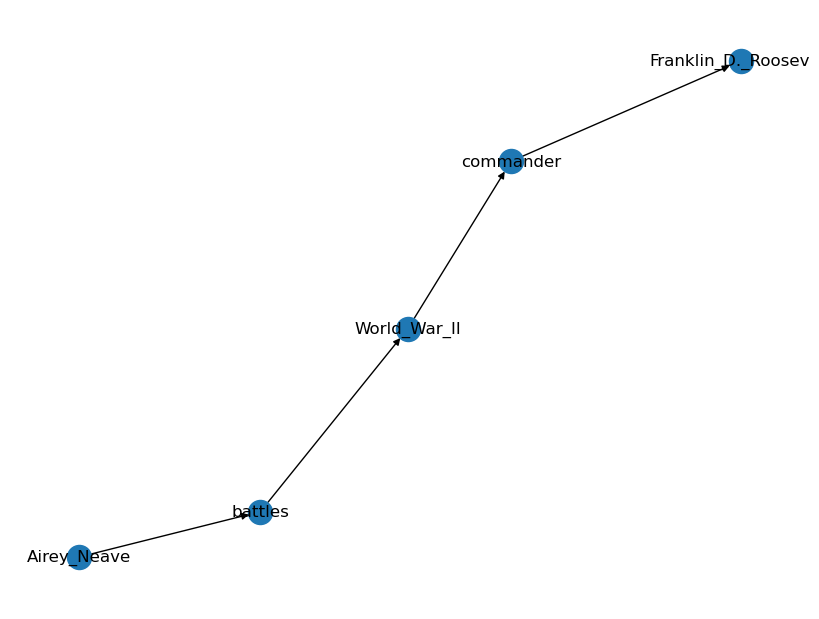

Decoded Input: 
 translate graph to text:  Airey_Neave  battles  World_War_II  World_War_II  commander  Franklin_D._Roosevelt
Decoded Target: 
 Airey Neave fought in World War II where Franklin D. Roosevelt was a commander.
DataBatch(x=[1, 512], edge_index=[2, 4], attention_mask=[1, 512], y=[1, 512], batch=[512], ptr=[2])
Original Sample: 
 translate graph to text: <H> Airey_Neave  <R>  battles  <T>  World_War_II <H> World_War_II  <R>  commander  <T>  Joseph_Stalin 
 Airey Neave fought in World War II during which Joseph Stalin was a commander.
NetworkX Graph: 
 [('Airey_Neave', 'battles', 0), ('battles', 'World_War_II', 0), ('World_War_II', 'commander', 0), ('commander', 'Joseph_Stalin', 0)]


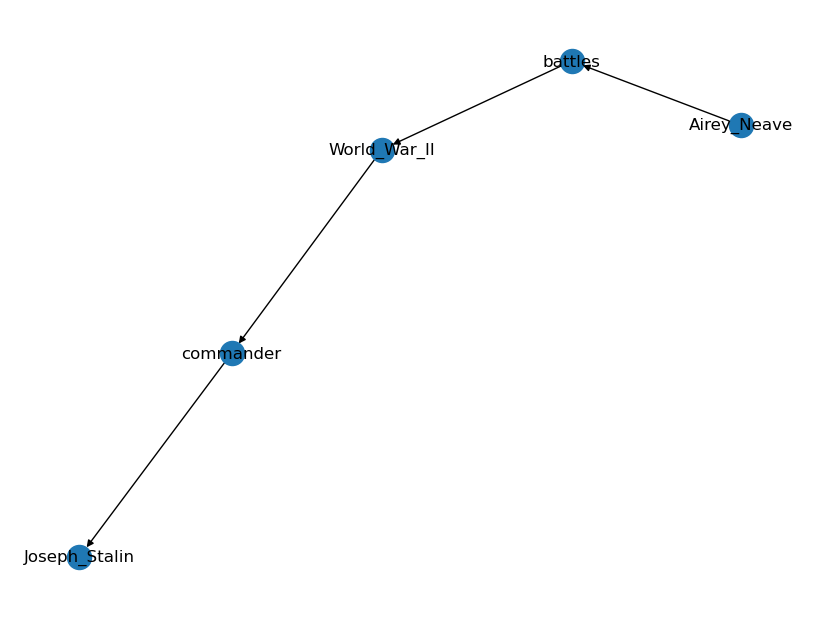

Decoded Input: 
 translate graph to text:  Airey_Neave  battles  World_War_II  World_War_II  commander  Joseph_Stalin
Decoded Target: 
 Airey Neave fought in World War II during which Joseph Stalin was a commander.
DataBatch(x=[1, 512], edge_index=[2, 4], attention_mask=[1, 512], y=[1, 512], batch=[512], ptr=[2])
Original Sample: 
 translate graph to text: <H> Albert_B._White  <R>  deathYear  <T>  "1941"^^xsd:gYear <H> Albert_B._White  <R>  dateOfBirth  <T>  "1856-09-22"^^xsd:date 
 Albert B White was born on 22nd September 1856 and died in 1941.
NetworkX Graph: 
 [('Albert_B._White', 'deathYear', 0), ('Albert_B._White', 'dateOfBirth', 0), ('deathYear', '"1941"^^xsd:gYear', 0), ('dateOfBirth', '"1856-09-22"^^xsd:date', 0)]


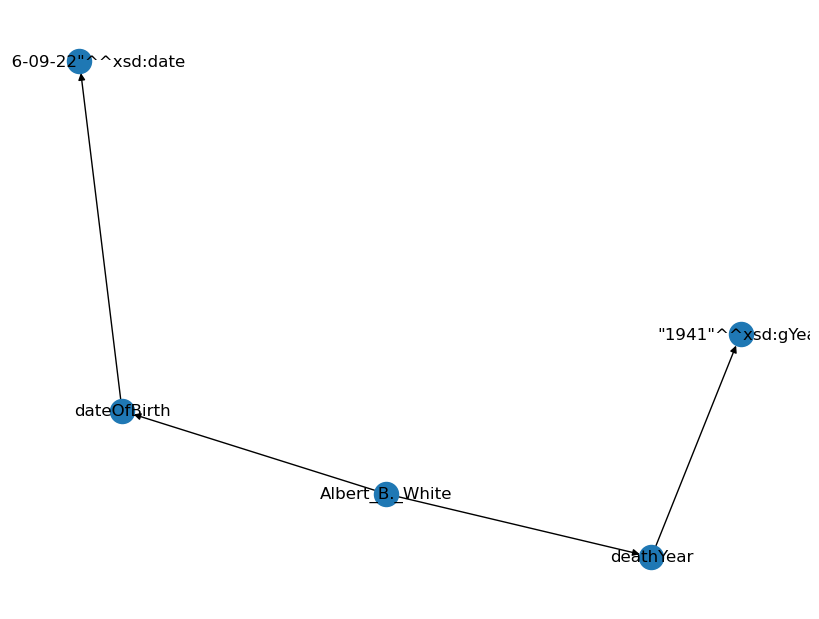

Decoded Input: 
 translate graph to text:  Albert_B._White  deathYear  "1941"xsd:gYear  Albert_B._White  dateOfBirth  "1856-09-22"xsd:date
Decoded Target: 
 Albert B White was born on 22nd September 1856 and died in 1941.
DataBatch(x=[1, 512], edge_index=[2, 4], attention_mask=[1, 512], y=[1, 512], batch=[512], ptr=[2])
Original Sample: 
 translate graph to text: <H> Albert_B._White  <R>  profession  <T>  Politician <H> Albert_B._White  <R>  dateOfBirth  <T>  "1856-09-22"^^xsd:date 
 Born 22nd September, 1856, Albert B. White's profession was politician.
NetworkX Graph: 
 [('Albert_B._White', 'profession', 0), ('Albert_B._White', 'dateOfBirth', 0), ('profession', 'Politician', 0), ('dateOfBirth', '"1856-09-22"^^xsd:date', 0)]


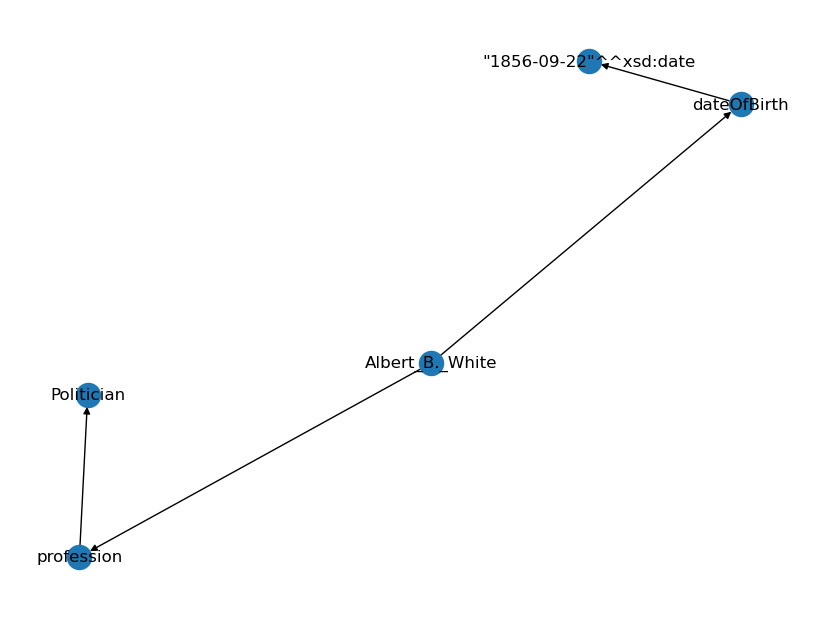

Decoded Input: 
 translate graph to text:  Albert_B._White  profession  Politician  Albert_B._White  dateOfBirth  "1856-09-22"xsd:date
Decoded Target: 
 Born 22nd September, 1856, Albert B. White's profession was politician.
DataBatch(x=[1, 512], edge_index=[2, 4], attention_mask=[1, 512], y=[1, 512], batch=[512], ptr=[2])
Original Sample: 
 translate graph to text: <H> Albert_Jennings_Fountain  <R>  deathPlace  <T>  Doña_Ana_County,_New_Mexico <H> Albert_Jennings_Fountain  <R>  birthPlace  <T>  New_York_City 
 Albert Jennings Fountain was born in New York City an died in Dona Ana County, New Mexico.
NetworkX Graph: 
 [('Albert_Jennings_Fountain', 'deathPlace', 0), ('Albert_Jennings_Fountain', 'birthPlace', 0), ('deathPlace', 'Doña_Ana_County,_New_Mexico', 0), ('birthPlace', 'New_York_City', 0)]


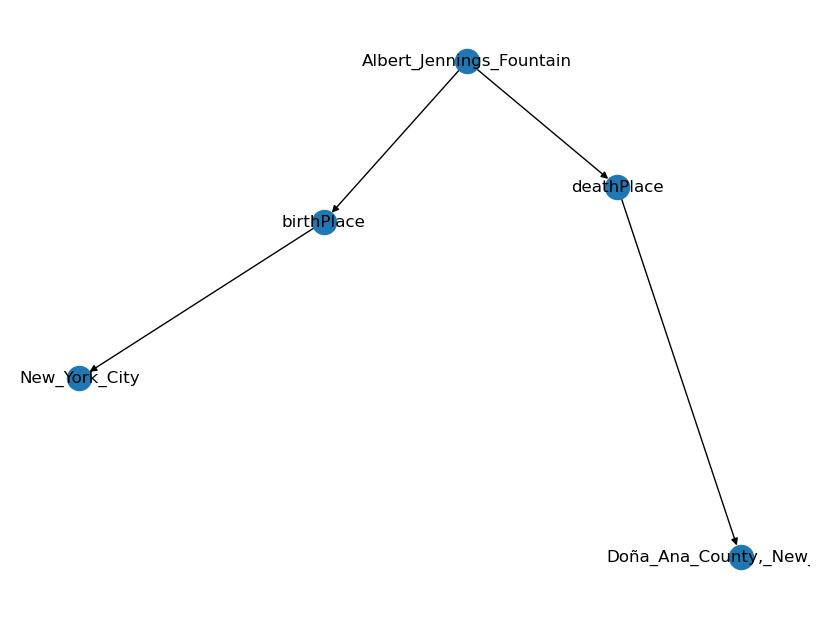

Decoded Input: 
 translate graph to text:  Albert_Jennings_Fountain  deathPlace  Doa_Ana_County,_New_Mexico  Albert_Jennings_Fountain  birthPlace  New_York_City
Decoded Target: 
 Albert Jennings Fountain was born in New York City an died in Dona Ana County, New Mexico.
DataBatch(x=[1, 512], edge_index=[2, 4], attention_mask=[1, 512], y=[1, 512], batch=[512], ptr=[2])
Original Sample: 
 translate graph to text: <H> Albert_Jennings_Fountain  <R>  governor  <T>  Edmund_J._Davis <H> Albert_Jennings_Fountain  <R>  deathPlace  <T>  New_Mexico_Territory 
 Albert Jennings Fountain passed away in the New Mexico Territory. He was in office while Edmund J. Davis was Vice President.
NetworkX Graph: 
 [('Albert_Jennings_Fountain', 'governor', 0), ('Albert_Jennings_Fountain', 'deathPlace', 0), ('governor', 'Edmund_J._Davis', 0), ('deathPlace', 'New_Mexico_Territory', 0)]


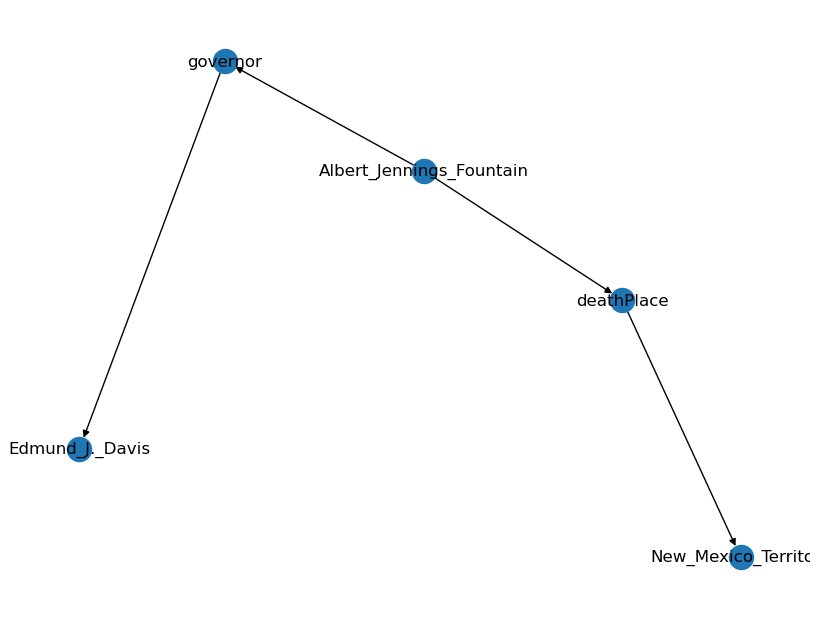

Decoded Input: 
 translate graph to text:  Albert_Jennings_Fountain  governor  Edmund_J._Davis  Albert_Jennings_Fountain  deathPlace  New_Mexico_Territory
Decoded Target: 
 Albert Jennings Fountain passed away in the New Mexico Territory. He was in office while Edmund J. Davis was Vice President.
DataBatch(x=[1, 512], edge_index=[2, 4], attention_mask=[1, 512], y=[1, 512], batch=[512], ptr=[2])
Original Sample: 
 translate graph to text: <H> Albert_Jennings_Fountain  <R>  party  <T>  Republican_Party_(United_States) <H> Albert_Jennings_Fountain  <R>  birthPlace  <T>  New_York_City 
 New York City is the birthplace of Albert Jennings Fountain who is also a member of the Republican Party in the U.S.A.
NetworkX Graph: 
 [('Albert_Jennings_Fountain', 'party', 0), ('Albert_Jennings_Fountain', 'birthPlace', 0), ('party', 'Republican_Party_', 0), ('birthPlace', 'New_York_City', 0)]


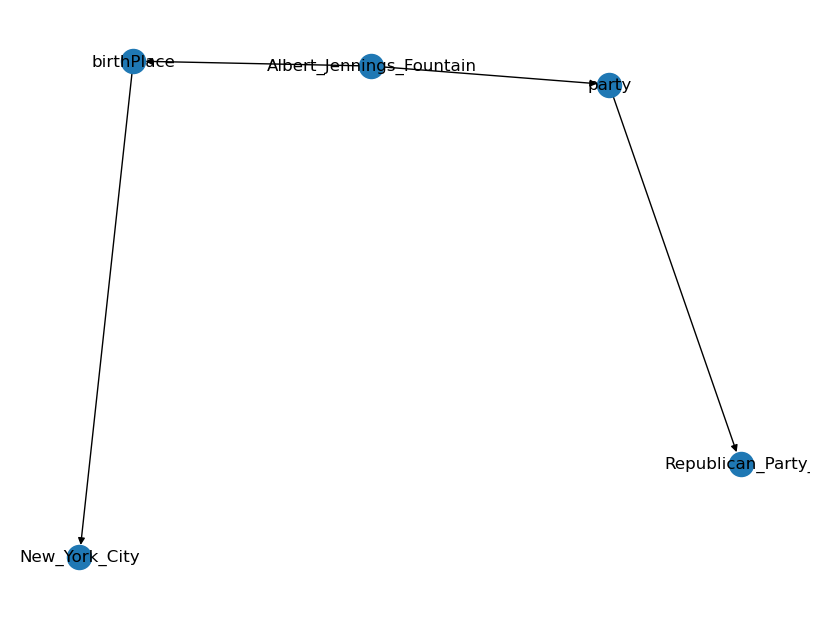

Decoded Input: 
 translate graph to text:  Albert_Jennings_Fountain  party  Republican_Party_(United_States)  Albert_Jennings_Fountain  birthPlace  New_York_City
Decoded Target: 
 New York City is the birthplace of Albert Jennings Fountain who is also a member of the Republican Party in the U.S.A.
DataBatch(x=[1, 512], edge_index=[2, 4], attention_mask=[1, 512], y=[1, 512], batch=[512], ptr=[2])
Original Sample: 
 translate graph to text: <H> Alberto_Teisaire  <R>  office  <T>  "Provisional President of the Argentine Senate" <H> Alberto_Teisaire  <R>  successor  <T>  Isaac_Rojas 
 Alberto Teisaire worked as the Provisional President of the Argentine Senate and was succeded by Isaac Rojas.
NetworkX Graph: 
 [('Alberto_Teisaire', 'office', 0), ('Alberto_Teisaire', 'successor', 0), ('office', '"Provisional President of the Argentine Senate"', 0), ('successor', 'Isaac_Rojas', 0)]


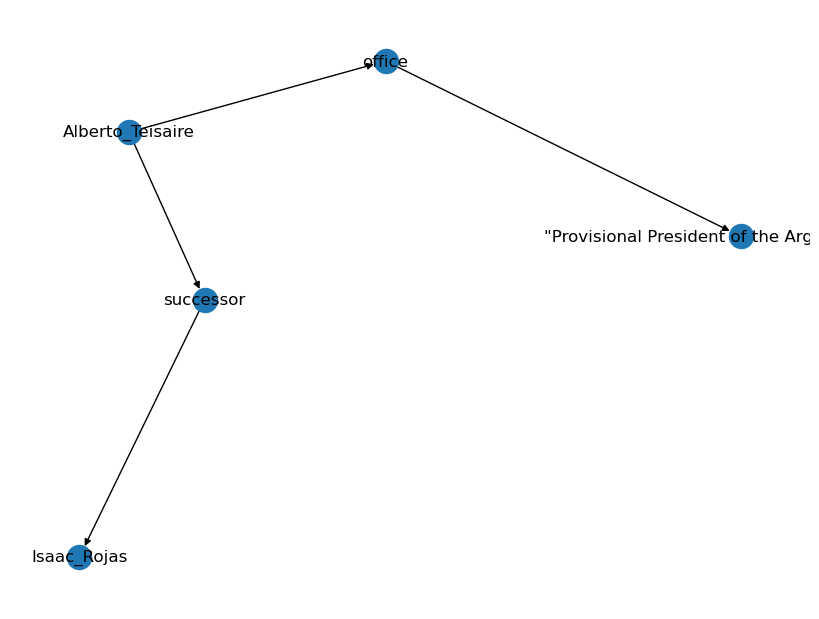

Decoded Input: 
 translate graph to text:  Alberto_Teisaire  office  "Provisional President of the Argentine Senate"  Alberto_Teisaire  successor  Isaac_Rojas
Decoded Target: 
 Alberto Teisaire worked as the Provisional President of the Argentine Senate and was succeded by Isaac Rojas.
DataBatch(x=[1, 512], edge_index=[2, 4], attention_mask=[1, 512], y=[1, 512], batch=[512], ptr=[2])
Original Sample: 
 translate graph to text: <H> Alfons_Gorbach  <R>  placeOfBirth  <T>  Austria <H> Alfons_Gorbach  <R>  birthPlace  <T>  Austria-Hungary 
 Alfons Gorbach's birthplace was Austria-Hungary.
NetworkX Graph: 
 [('Alfons_Gorbach', 'placeOfBirth', 0), ('Alfons_Gorbach', 'birthPlace', 0), ('placeOfBirth', 'Austria', 0), ('birthPlace', 'Austria-Hungary', 0)]


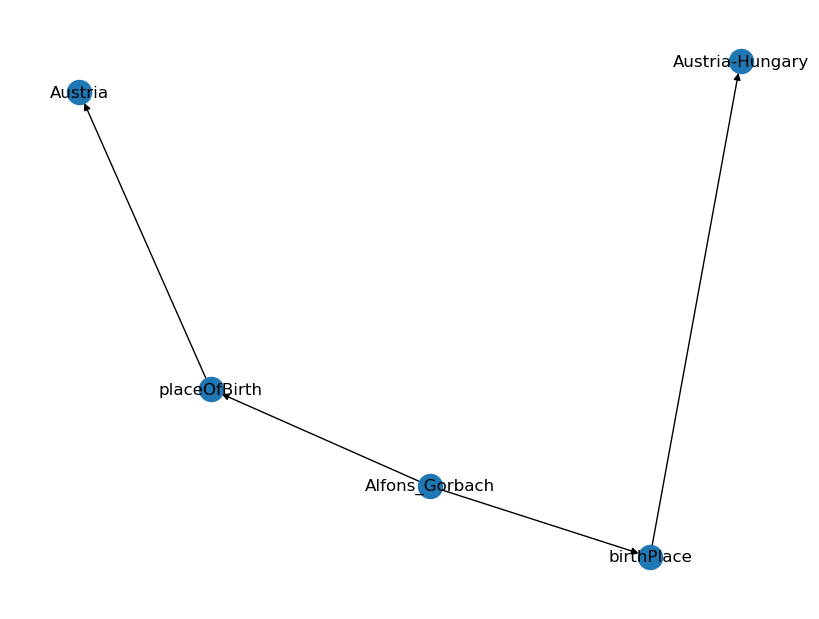

Decoded Input: 
 translate graph to text:  Alfons_Gorbach  placeOfBirth  Austria  Alfons_Gorbach  birthPlace  Austria-Hungary
Decoded Target: 
 Alfons Gorbach's birthplace was Austria-Hungary.
DataBatch(x=[1, 512], edge_index=[2, 4], attention_mask=[1, 512], y=[1, 512], batch=[512], ptr=[2])
Original Sample: 
 translate graph to text: <H> Alfons_Gorbach  <R>  birthPlace  <T>  Tyrol_(state) <H> Alfons_Gorbach  <R>  placeOfBirth  <T>  Austria 
 Alfons Gorbach was born in the state of Tyrol, in Austria.
NetworkX Graph: 
 [('Alfons_Gorbach', 'birthPlace', 0), ('Alfons_Gorbach', 'placeOfBirth', 0), ('birthPlace', 'Tyrol_', 0), ('placeOfBirth', 'Austria', 0)]


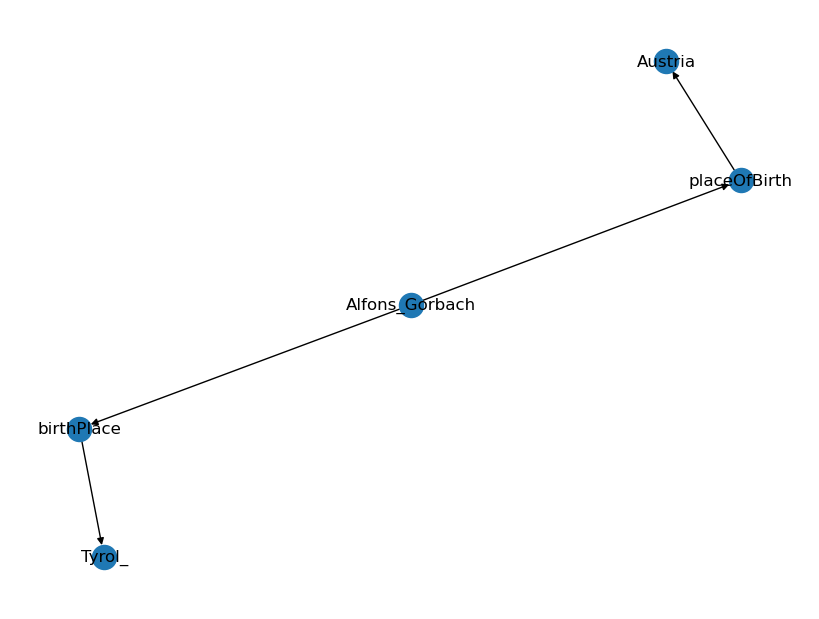

Decoded Input: 
 translate graph to text:  Alfons_Gorbach  birthPlace  Tyrol_(state)  Alfons_Gorbach  placeOfBirth  Austria
Decoded Target: 
 Alfons Gorbach was born in the state of Tyrol, in Austria.
DataBatch(x=[1, 512], edge_index=[2, 4], attention_mask=[1, 512], y=[1, 512], batch=[512], ptr=[2])
Original Sample: 
 translate graph to text: <H> Alfred_Moore_Scales  <R>  successor  <T>  James_W._Reid_(politician) <H> Alfred_Moore_Scales  <R>  office  <T>  "Governor of North Carolina"@en 
 Alfred Moore Scales, Governor of North Carolina was succeeded by James W Reid.
NetworkX Graph: 
 [('Alfred_Moore_Scales', 'successor', 0), ('Alfred_Moore_Scales', 'office', 0), ('successor', 'James_W._Reid_', 0), ('office', '"Governor of North Carolina"@en', 0)]


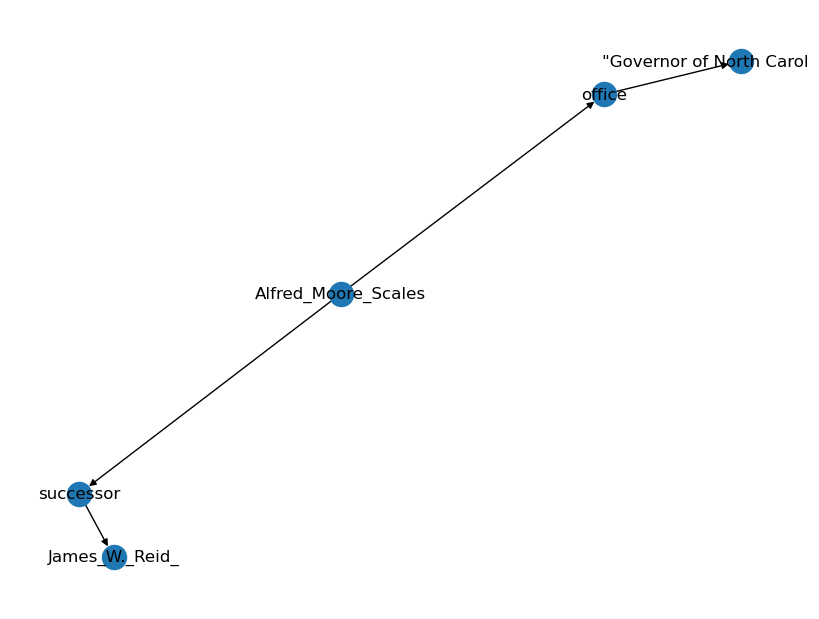

Decoded Input: 
 translate graph to text:  Alfred_Moore_Scales  successor  James_W._Reid_(politician)  Alfred_Moore_Scales  office  "Governor of North Carolina"@en
Decoded Target: 
 Alfred Moore Scales, Governor of North Carolina was succeeded by James W Reid.
DataBatch(x=[1, 512], edge_index=[2, 4], attention_mask=[1, 512], y=[1, 512], batch=[512], ptr=[2])
Original Sample: 
 translate graph to text: <H> Alfred_Moore_Scales  <R>  successor  <T>  Daniel_Gould_Fowle <H> Daniel_Gould_Fowle  <R>  almaMater  <T>  Princeton_University 
 Alfred Moore Scales was succeeded by Daniel Gould Fowle, his alma mater is Princeton University.
NetworkX Graph: 
 [('Alfred_Moore_Scales', 'successor', 0), ('successor', 'Daniel_Gould_Fowle', 0), ('Daniel_Gould_Fowle', 'almaMater', 0), ('almaMater', 'Princeton_University', 0)]


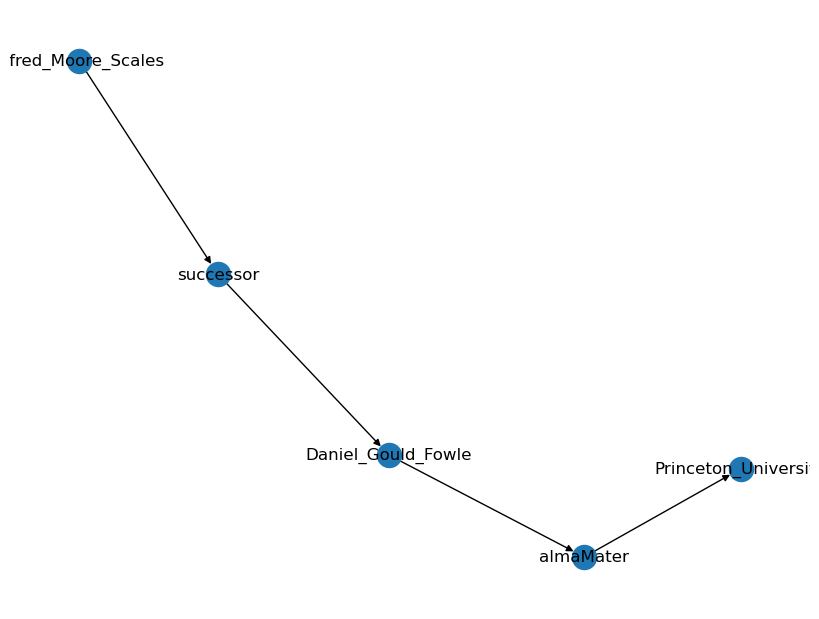

Decoded Input: 
 translate graph to text:  Alfred_Moore_Scales  successor  Daniel_Gould_Fowle  Daniel_Gould_Fowle  almaMater  Princeton_University
Decoded Target: 
 Alfred Moore Scales was succeeded by Daniel Gould Fowle, his alma mater is Princeton University.
DataBatch(x=[1, 512], edge_index=[2, 4], attention_mask=[1, 512], y=[1, 512], batch=[512], ptr=[2])
Original Sample: 
 translate graph to text: <H> Alfred_N._Phillips  <R>  birthPlace  <T>  Connecticut <H> Alfred_N._Phillips  <R>  office  <T>  United_States_House_of_Representatives 
 Alfred N. Phillips was part of the U.S. House of Representatives and he was born in Connecticut.
NetworkX Graph: 
 [('Alfred_N._Phillips', 'birthPlace', 0), ('Alfred_N._Phillips', 'office', 0), ('birthPlace', 'Connecticut', 0), ('office', 'United_States_House_of_Representatives', 0)]


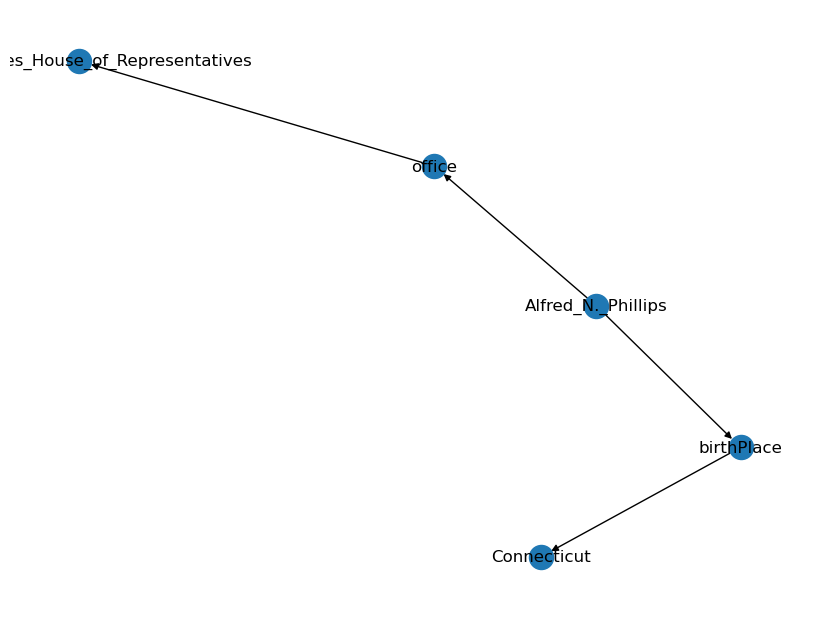

Decoded Input: 
 translate graph to text:  Alfred_N._Phillips  birthPlace  Connecticut  Alfred_N._Phillips  office  United_States_House_of_Representatives
Decoded Target: 
 Alfred N. Phillips was part of the U.S. House of Representatives and he was born in Connecticut.
DataBatch(x=[1, 512], edge_index=[2, 4], attention_mask=[1, 512], y=[1, 512], batch=[512], ptr=[2])
Original Sample: 
 translate graph to text: <H> Alfred_N._Phillips  <R>  militaryBranch  <T>  United_States_Army <H> United_States_Army  <R>  battles  <T>  American_Civil_War 
 Alfred N. Phillips served in the United States Army which fought in the American Civil War.
NetworkX Graph: 
 [('Alfred_N._Phillips', 'militaryBranch', 0), ('militaryBranch', 'United_States_Army', 0), ('United_States_Army', 'battles', 0), ('battles', 'American_Civil_War', 0)]


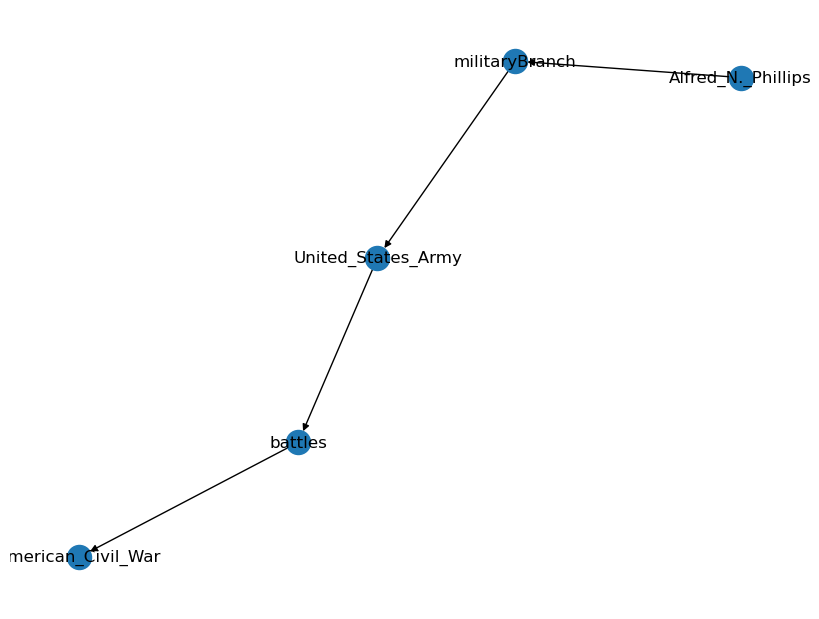

Decoded Input: 
 translate graph to text:  Alfred_N._Phillips  militaryBranch  United_States_Army  United_States_Army  battles  American_Civil_War
Decoded Target: 
 Alfred N. Phillips served in the United States Army which fought in the American Civil War.
DataBatch(x=[1, 512], edge_index=[2, 4], attention_mask=[1, 512], y=[1, 512], batch=[512], ptr=[2])
Original Sample: 
 translate graph to text: <H> Allan_Shivers  <R>  battles  <T>  World_War_II <H> World_War_II  <R>  commander  <T>  Joseph_Stalin 
 Allan Shivers fought during World War II in which Joseph Stalin was a commander.
NetworkX Graph: 
 [('Allan_Shivers', 'battles', 0), ('battles', 'World_War_II', 0), ('World_War_II', 'commander', 0), ('commander', 'Joseph_Stalin', 0)]


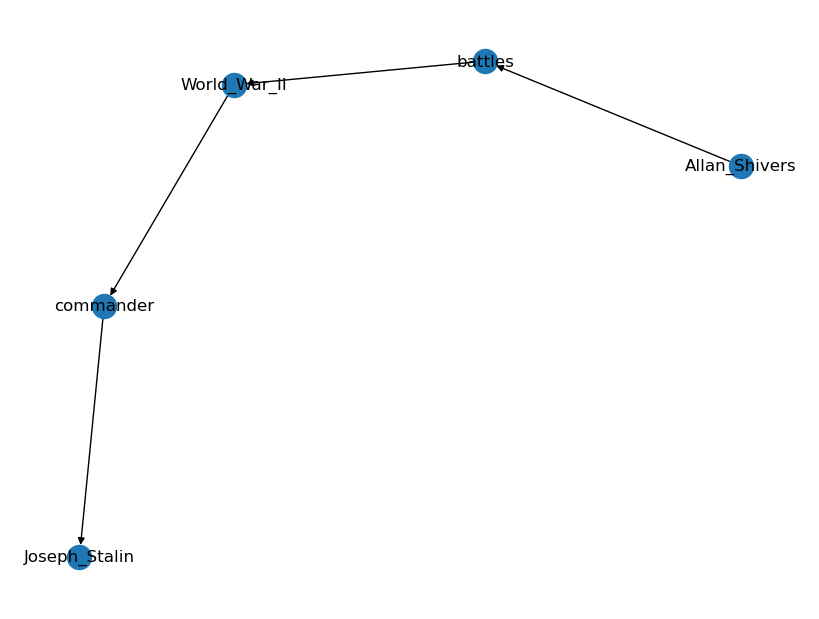

Decoded Input: 
 translate graph to text:  Allan_Shivers  battles  World_War_II  World_War_II  commander  Joseph_Stalin
Decoded Target: 
 Allan Shivers fought during World War II in which Joseph Stalin was a commander.
DataBatch(x=[1, 512], edge_index=[2, 4], attention_mask=[1, 512], y=[1, 512], batch=[512], ptr=[2])
Original Sample: 
 translate graph to text: <H> Allan_Shivers  <R>  office  <T>  "Member of theTexas State SenatefromDistrict 4(Port Arthur)" <H> Allan_Shivers  <R>  birthPlace  <T>  Lufkin,_Texas 
 Allan Shivers was born in Lufkin, Texas and was a member of the Texas State Senate from District 4 (Port Arthur).
NetworkX Graph: 
 [('Allan_Shivers', 'office', 0), ('Allan_Shivers', 'birthPlace', 0), ('office', '"Member of theTexas State SenatefromDistrict 4"', 0), ('birthPlace', 'Lufkin,_Texas', 0)]


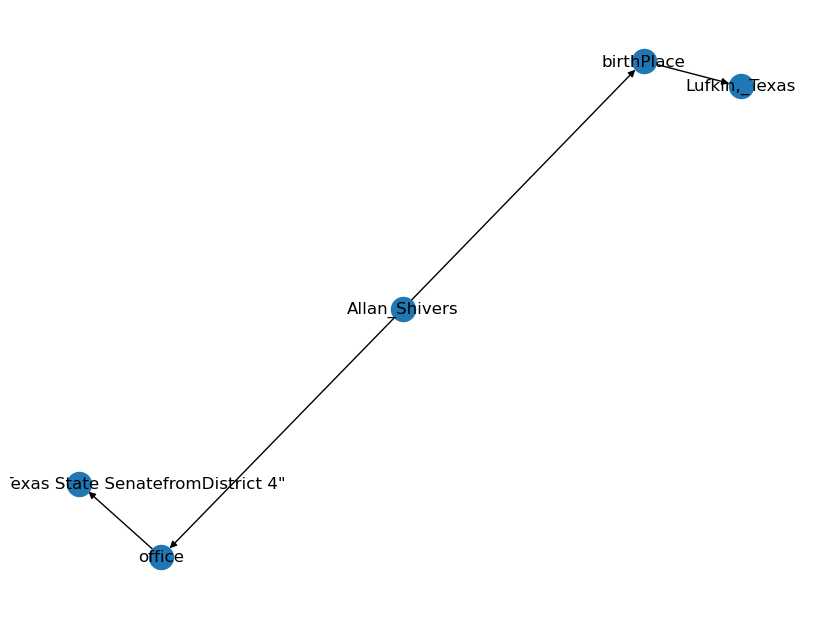

Decoded Input: 
 translate graph to text:  Allan_Shivers  office  "Member of theTexas State SenatefromDistrict 4(Port Arthur)"  Allan_Shivers  birthPlace  Lufkin,_Texas
Decoded Target: 
 Allan Shivers was born in Lufkin, Texas and was a member of the Texas State Senate from District 4 (Port Arthur).
DataBatch(x=[1, 512], edge_index=[2, 4], attention_mask=[1, 512], y=[1, 512], batch=[512], ptr=[2])
Original Sample: 
 translate graph to text: <H> Allan_Shivers  <R>  office  <T>  "Member of theTexas State SenatefromDistrict 4(Port Arthur)" <H> Allan_Shivers  <R>  successor  <T>  Ben_Ramsey 
 Allan Shivers was part of the Texas State Senate District 4 for Port Arthur. Ben Ramsey succeeded him.
NetworkX Graph: 
 [('Allan_Shivers', 'office', 0), ('Allan_Shivers', 'successor', 0), ('office', '"Member of theTexas State SenatefromDistrict 4"', 0), ('successor', 'Ben_Ramsey', 0)]


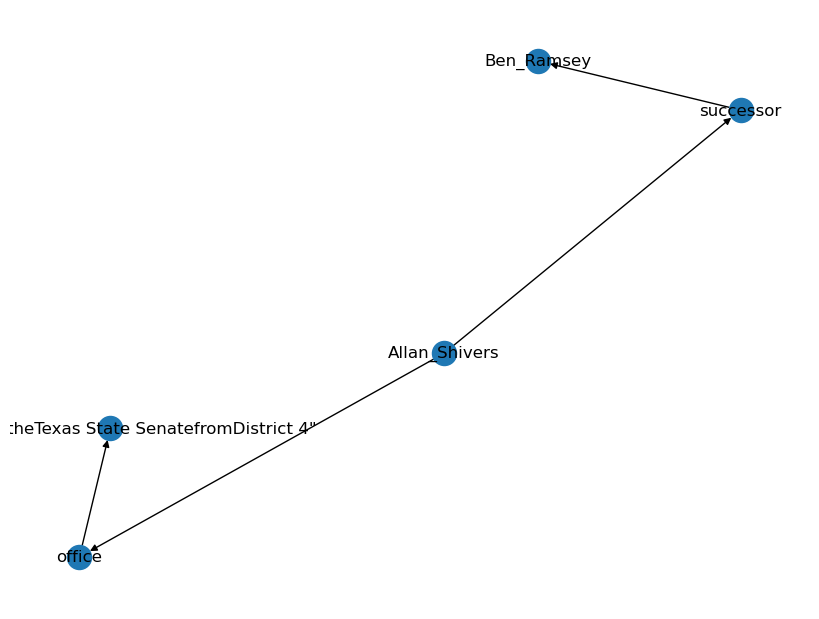

Decoded Input: 
 translate graph to text:  Allan_Shivers  office  "Member of theTexas State SenatefromDistrict 4(Port Arthur)"  Allan_Shivers  successor  Ben_Ramsey
Decoded Target: 
 Allan Shivers was part of the Texas State Senate District 4 for Port Arthur. Ben Ramsey succeeded him.
DataBatch(x=[1, 512], edge_index=[2, 4], attention_mask=[1, 512], y=[1, 512], batch=[512], ptr=[2])
Original Sample: 
 translate graph to text: <H> Alvah_Sabin  <R>  birthDate  <T>  "1793-10-23"^^xsd:date <H> Alvah_Sabin  <R>  office  <T>  Secretary_of_State_of_Vermont 
 Alvah Sabin was born October 23, 1793 and worked as the secretary of the State of Vermont.
NetworkX Graph: 
 [('Alvah_Sabin', 'birthDate', 0), ('Alvah_Sabin', 'office', 0), ('birthDate', '"1793-10-23"^^xsd:date', 0), ('office', 'Secretary_of_State_of_Vermont', 0)]


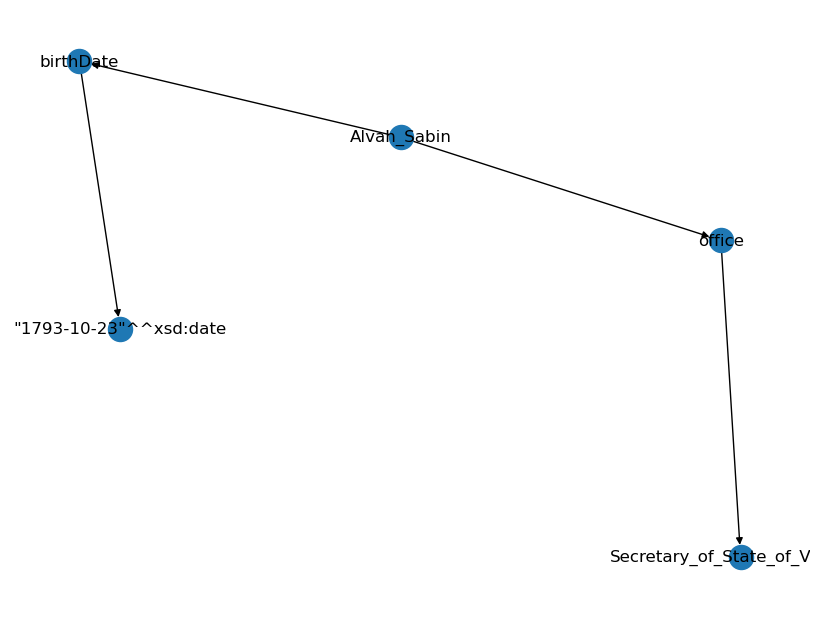

Decoded Input: 
 translate graph to text:  Alvah_Sabin  birthDate  "1793-10-23"xsd:date  Alvah_Sabin  office  Secretary_of_State_of_Vermont
Decoded Target: 
 Alvah Sabin was born October 23, 1793 and worked as the secretary of the State of Vermont.
DataBatch(x=[1, 512], edge_index=[2, 4], attention_mask=[1, 512], y=[1, 512], batch=[512], ptr=[2])
Original Sample: 
 translate graph to text: <H> Netherlands  <R>  currency  <T>  Euro <H> Agnes_Kant  <R>  country  <T>  Netherlands 
 Agnes Kant's country is the Netherlands where the currency is the euro.
NetworkX Graph: 
 [('Netherlands', 'currency', 0), ('currency', 'Euro', 0), ('Agnes_Kant', 'country', 0), ('country', 'Netherlands', 0)]


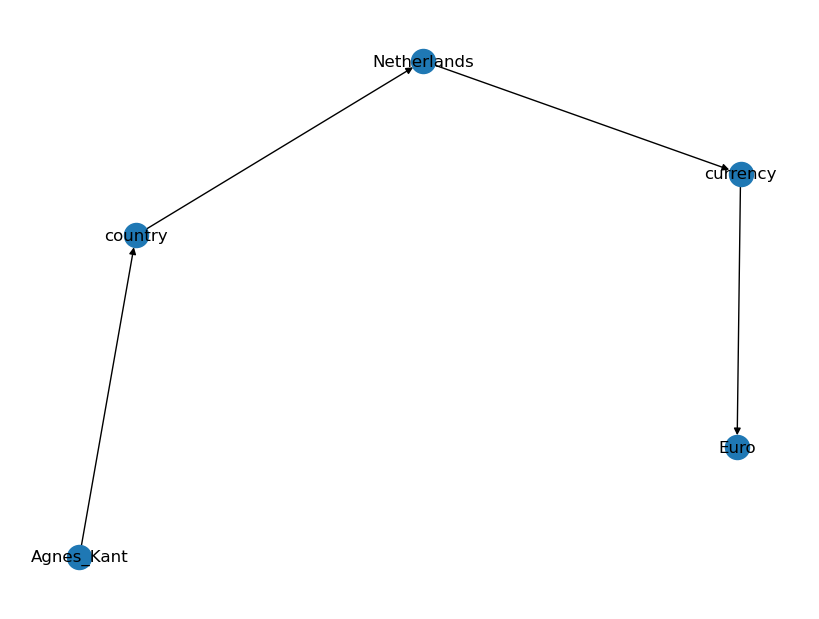

Decoded Input: 
 translate graph to text:  Netherlands  currency  Euro  Agnes_Kant  country  Netherlands
Decoded Target: 
 Agnes Kant's country is the Netherlands where the currency is the euro.
DataBatch(x=[1, 512], edge_index=[2, 4], attention_mask=[1, 512], y=[1, 512], batch=[512], ptr=[2])
Original Sample: 
 translate graph to text: <H> Netherlands  <R>  leader  <T>  Mark_Rutte <H> Agnes_Kant  <R>  country  <T>  Netherlands 
 Agnes Kant lives in The Netherlands whose leader is Mark Rutte.
NetworkX Graph: 
 [('Netherlands', 'leader', 0), ('leader', 'Mark_Rutte', 0), ('Agnes_Kant', 'country', 0), ('country', 'Netherlands', 0)]


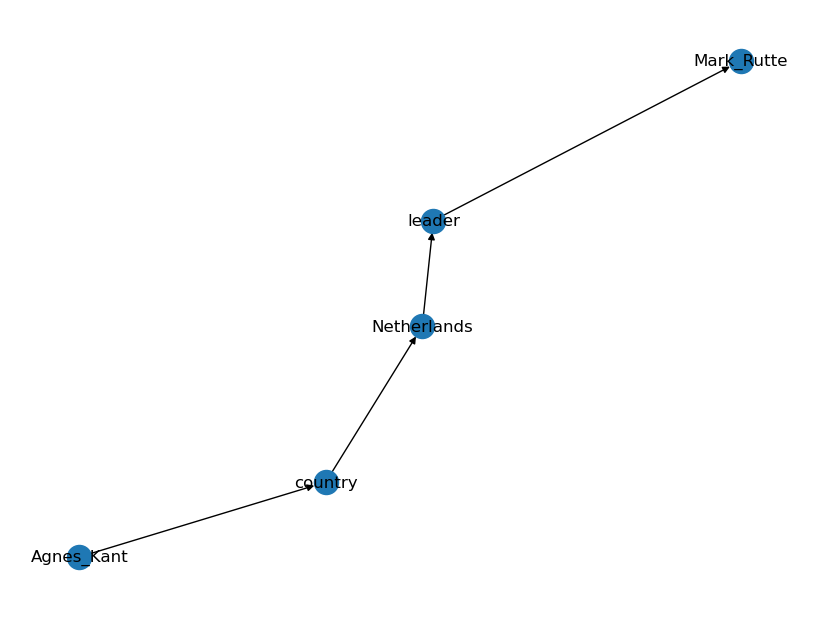

Decoded Input: 
 translate graph to text:  Netherlands  leader  Mark_Rutte  Agnes_Kant  country  Netherlands
Decoded Target: 
 Agnes Kant lives in The Netherlands whose leader is Mark Rutte.
DataBatch(x=[1, 512], edge_index=[2, 4], attention_mask=[1, 512], y=[1, 512], batch=[512], ptr=[2])
Original Sample: 
 translate graph to text: <H> Parkersburg,_West_Virginia  <R>  country  <T>  United_States <H> Albert_B._White  <R>  placeOfDeath  <T>  Parkersburg,_West_Virginia 
 Albert B White died in Parkersburg, West Virginia, which is part of the United States.
NetworkX Graph: 
 [('Parkersburg,_West_Virginia', 'country', 0), ('country', 'United_States', 0), ('Albert_B._White', 'placeOfDeath', 0), ('placeOfDeath', 'Parkersburg,_West_Virginia', 0)]


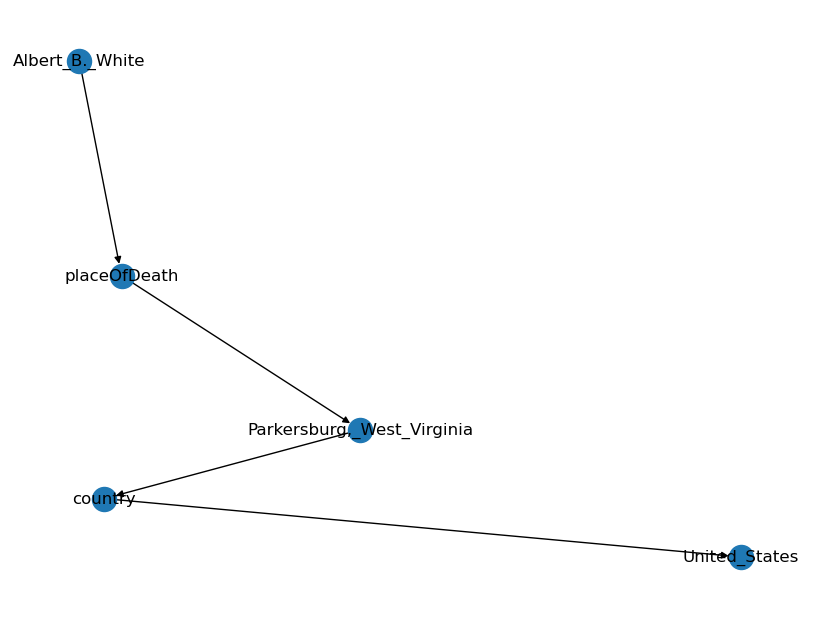

Decoded Input: 
 translate graph to text:  Parkersburg,_West_Virginia  country  United_States  Albert_B._White  placeOfDeath  Parkersburg,_West_Virginia
Decoded Target: 
 Albert B White died in Parkersburg, West Virginia, which is part of the United States.
DataBatch(x=[1, 512], edge_index=[2, 4], attention_mask=[1, 512], y=[1, 512], batch=[512], ptr=[2])
Original Sample: 
 translate graph to text: <H> Aaron_Boogaard  <R>  team  <T>  Wichita_Thunder <H> Aaron_Boogaard  <R>  placeOfBirth  <T>  Saskatchewan 
 Aaron Boogaard was born in Saskatchewan and his club is Wichita Thunder.
NetworkX Graph: 
 [('Aaron_Boogaard', 'team', 0), ('Aaron_Boogaard', 'placeOfBirth', 0), ('team', 'Wichita_Thunder', 0), ('placeOfBirth', 'Saskatchewan', 0)]


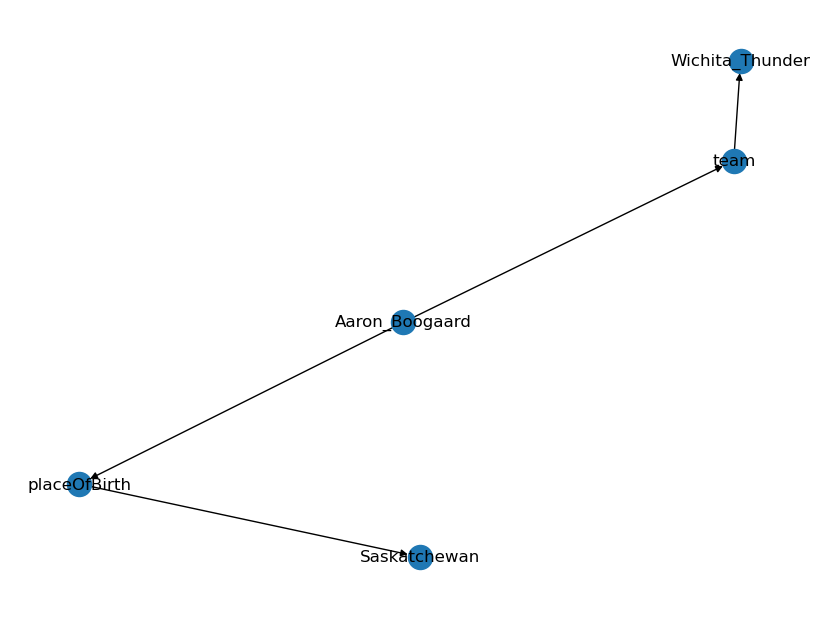

Decoded Input: 
 translate graph to text:  Aaron_Boogaard  team  Wichita_Thunder  Aaron_Boogaard  placeOfBirth  Saskatchewan
Decoded Target: 
 Aaron Boogaard was born in Saskatchewan and his club is Wichita Thunder.
DataBatch(x=[1, 512], edge_index=[2, 4], attention_mask=[1, 512], y=[1, 512], batch=[512], ptr=[2])
Original Sample: 
 translate graph to text: <H> Abel_Hernández  <R>  team  <T>  Peñarol <H> Peñarol  <R>  manager  <T>  Jorge_Orosmán_da_Silva 
 Abel Hernandez played for the club Penarol, which was managed by Jorge Orosmán da Silva.
NetworkX Graph: 
 [('Abel_Hernández', 'team', 0), ('team', 'Peñarol', 0), ('Peñarol', 'manager', 0), ('manager', 'Jorge_Orosmán_da_Silva', 0)]


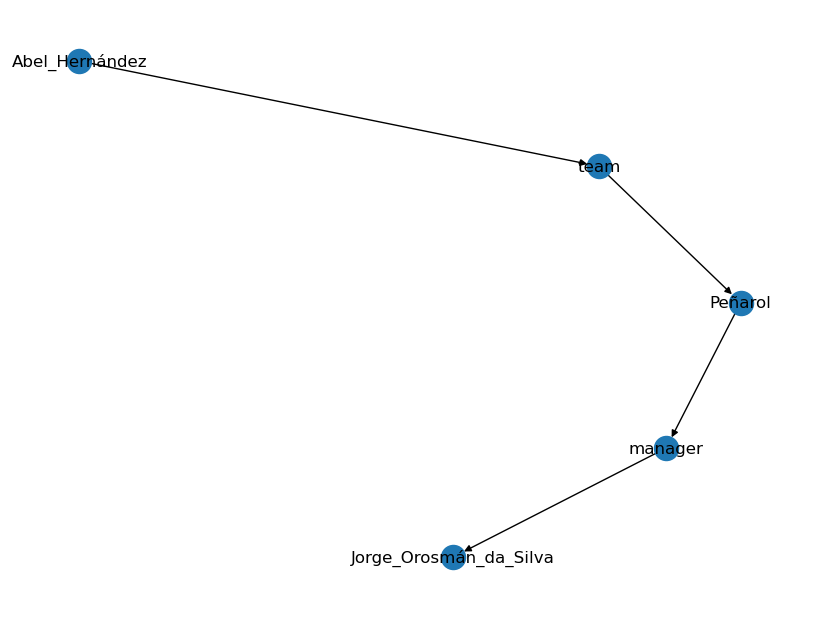

Decoded Input: 
 translate graph to text:  Abel_Hernández  team  Pearol  Pearol  manager  Jorge_Orosmán_da_Silva
Decoded Target: 
 Abel Hernandez played for the club Penarol, which was managed by Jorge Orosmán da Silva.
DataBatch(x=[1, 512], edge_index=[2, 4], attention_mask=[1, 512], y=[1, 512], batch=[512], ptr=[2])
Original Sample: 
 translate graph to text: <H> Abel_Hernández  <R>  team  <T>  U.S._Città_di_Palermo <H> Abel_Hernández  <R>  clubs  <T>  Peñarol 
 Abel Hernandez plays for the US Citta de Palermo club and also played for Penarol.
NetworkX Graph: 
 [('Abel_Hernández', 'team', 0), ('Abel_Hernández', 'clubs', 0), ('team', 'U.S._Città_di_Palermo', 0), ('clubs', 'Peñarol', 0)]


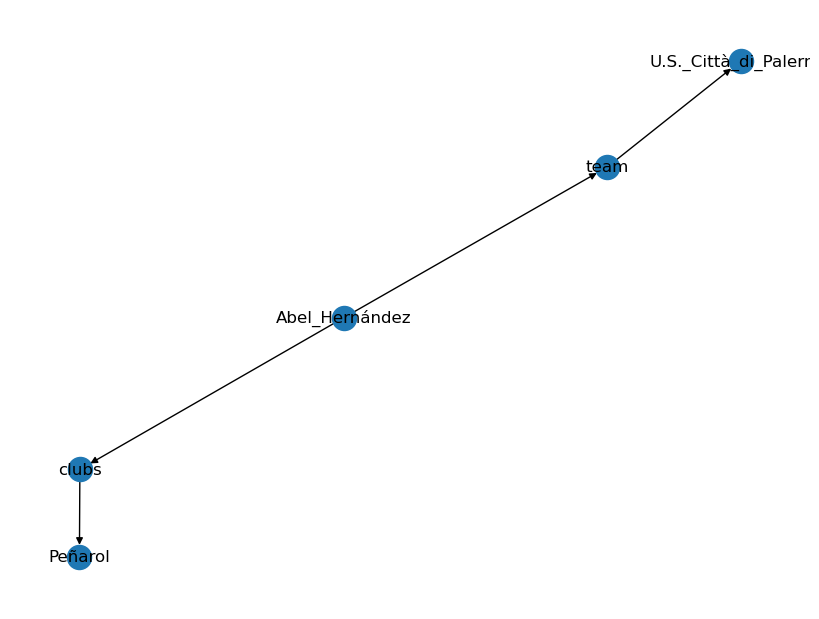

Decoded Input: 
 translate graph to text:  Abel_Hernández  team  U.S._Città_di_Palermo  Abel_Hernández  clubs  Pearol
Decoded Target: 
 Abel Hernandez plays for the US Citta de Palermo club and also played for Penarol.
DataBatch(x=[1, 512], edge_index=[2, 4], attention_mask=[1, 512], y=[1, 512], batch=[512], ptr=[2])
Original Sample: 
 translate graph to text: <H> Adam_Maher  <R>  team  <T>  Netherlands_national_under-17_football_team <H> Adam_Maher  <R>  clubs  <T>  AZ_Alkmaar 
 Adam Maher is connected to the AZ Alkmaar club and plays for the Netherlands National club for players under 17.
NetworkX Graph: 
 [('Adam_Maher', 'team', 0), ('Adam_Maher', 'clubs', 0), ('team', 'Netherlands_national_under-17_football_team', 0), ('clubs', 'AZ_Alkmaar', 0)]


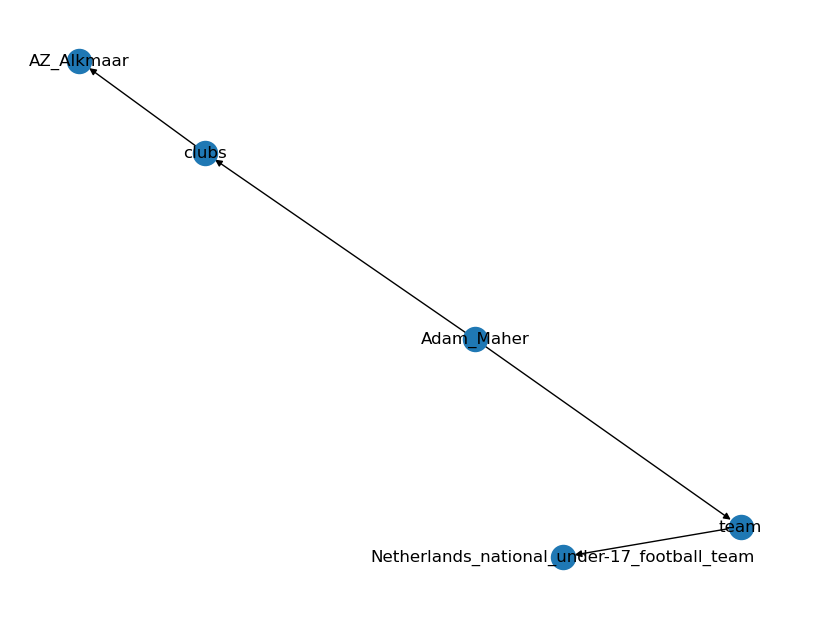

Decoded Input: 
 translate graph to text:  Adam_Maher  team  Netherlands_national_under-17_football_team  Adam_Maher  clubs  AZ_Alkmaar
Decoded Target: 
 Adam Maher is connected to the AZ Alkmaar club and plays for the Netherlands National club for players under 17.
DataBatch(x=[1, 512], edge_index=[2, 4], attention_mask=[1, 512], y=[1, 512], batch=[512], ptr=[2])
Original Sample: 
 translate graph to text: <H> Adam_Maher  <R>  clubs  <T>  PSV_Eindhoven <H> Adam_Maher  <R>  team  <T>  Netherlands_national_under-17_football_team 
 Adam Maher's club is PSV Eindhoven and he played for the Netherlands national under-17 football team.
NetworkX Graph: 
 [('Adam_Maher', 'clubs', 0), ('Adam_Maher', 'team', 0), ('clubs', 'PSV_Eindhoven', 0), ('team', 'Netherlands_national_under-17_football_team', 0)]


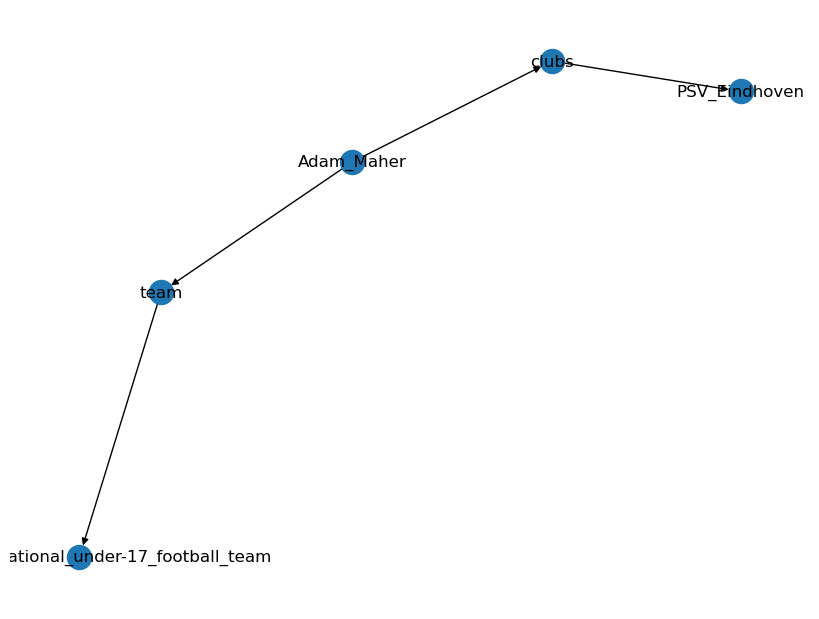

Decoded Input: 
 translate graph to text:  Adam_Maher  clubs  PSV_Eindhoven  Adam_Maher  team  Netherlands_national_under-17_football_team
Decoded Target: 
 Adam Maher's club is PSV Eindhoven and he played for the Netherlands national under-17 football team.
DataBatch(x=[1, 512], edge_index=[2, 4], attention_mask=[1, 512], y=[1, 512], batch=[512], ptr=[2])
Original Sample: 
 translate graph to text: <H> Ahmad_Kadhim_Assad  <R>  team  <T>  Steel_Azin_F.C. <H> Ahmad_Kadhim_Assad  <R>  clubs  <T>  Al_Shorta_SC 
 Ahmad Kadhim Assad clubs are Steel Azin FC and Al Shorta SC.
NetworkX Graph: 
 [('Ahmad_Kadhim_Assad', 'team', 0), ('Ahmad_Kadhim_Assad', 'clubs', 0), ('team', 'Steel_Azin_F.C.', 0), ('clubs', 'Al_Shorta_SC', 0)]


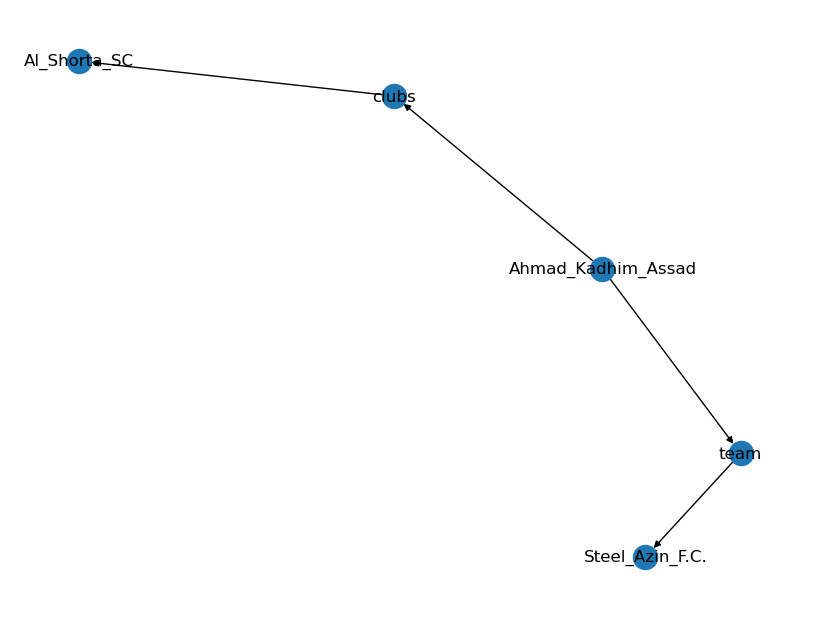

Decoded Input: 
 translate graph to text:  Ahmad_Kadhim_Assad  team  Steel_Azin_F.C.  Ahmad_Kadhim_Assad  clubs  Al_Shorta_SC
Decoded Target: 
 Ahmad Kadhim Assad clubs are Steel Azin FC and Al Shorta SC.
DataBatch(x=[1, 512], edge_index=[2, 4], attention_mask=[1, 512], y=[1, 512], batch=[512], ptr=[2])
Original Sample: 
 translate graph to text: <H> Akeem_Adams  <R>  clubs  <T>  Ferencvárosi_TC <H> Ferencvárosi_TC  <R>  manager  <T>  Thomas_Doll 
 Akeem Adams played for Ferencvarosi TC, where the manager is Thomas Doll.
NetworkX Graph: 
 [('Akeem_Adams', 'clubs', 0), ('clubs', 'Ferencvárosi_TC', 0), ('Ferencvárosi_TC', 'manager', 0), ('manager', 'Thomas_Doll', 0)]


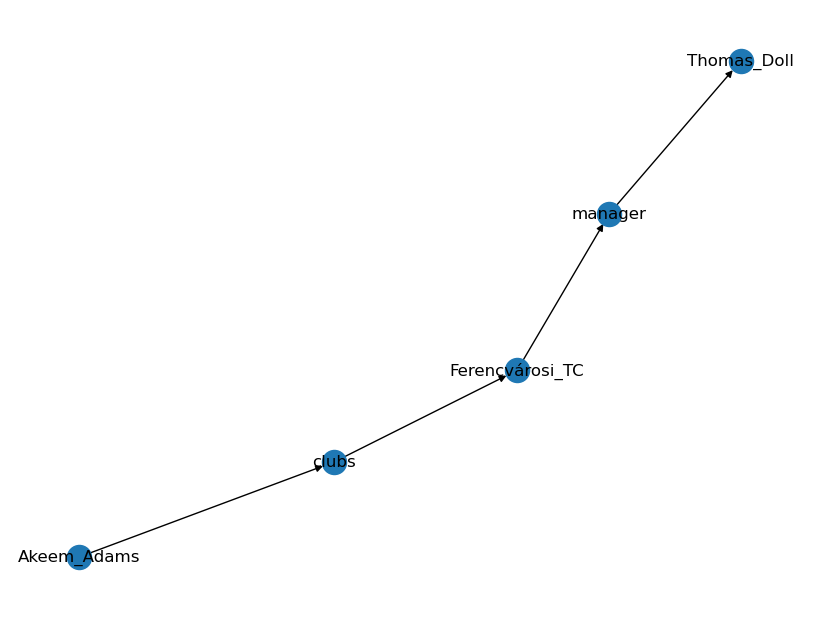

Decoded Input: 
 translate graph to text:  Akeem_Adams  clubs  Ferencvárosi_TC  Ferencvárosi_TC  manager  Thomas_Doll
Decoded Target: 
 Akeem Adams played for Ferencvarosi TC, where the manager is Thomas Doll.
DataBatch(x=[1, 512], edge_index=[2, 4], attention_mask=[1, 512], y=[1, 512], batch=[512], ptr=[2])
Original Sample: 
 translate graph to text: <H> Akeem_Adams  <R>  team  <T>  Trinidad_and_Tobago_national_football_team <H> Akeem_Adams  <R>  clubs  <T>  T&TEC_Sports_Club 
 Akeem Adams plays for the Trinidad and Tobago National football team and the T&TEC Sports Club.
NetworkX Graph: 
 [('Akeem_Adams', 'team', 0), ('Akeem_Adams', 'clubs', 0), ('team', 'Trinidad_and_Tobago_national_football_team', 0), ('clubs', 'T&TEC_Sports_Club', 0)]


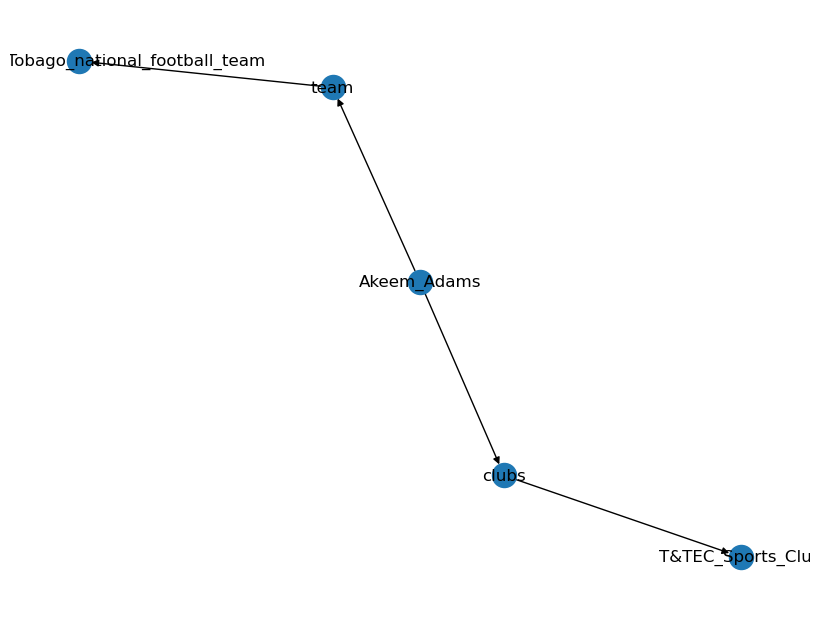

Decoded Input: 
 translate graph to text:  Akeem_Adams  team  Trinidad_and_Tobago_national_football_team  Akeem_Adams  clubs  T&TEC_Sports_Club
Decoded Target: 
 Akeem Adams plays for the Trinidad and Tobago National football team and the T&TEC Sports Club.
DataBatch(x=[1, 512], edge_index=[2, 4], attention_mask=[1, 512], y=[1, 512], batch=[512], ptr=[2])
Original Sample: 
 translate graph to text: <H> Akeem_Ayers  <R>  formerTeam  <T>  New_England_Patriots <H> Akeem_Ayers  <R>  draftPick  <T>  "39" 
 Akeem Ayers was number 39 in the draft pick and his former team was New England Patriots.
NetworkX Graph: 
 [('Akeem_Ayers', 'formerTeam', 0), ('Akeem_Ayers', 'draftPick', 0), ('formerTeam', 'New_England_Patriots', 0), ('draftPick', '"39"', 0)]


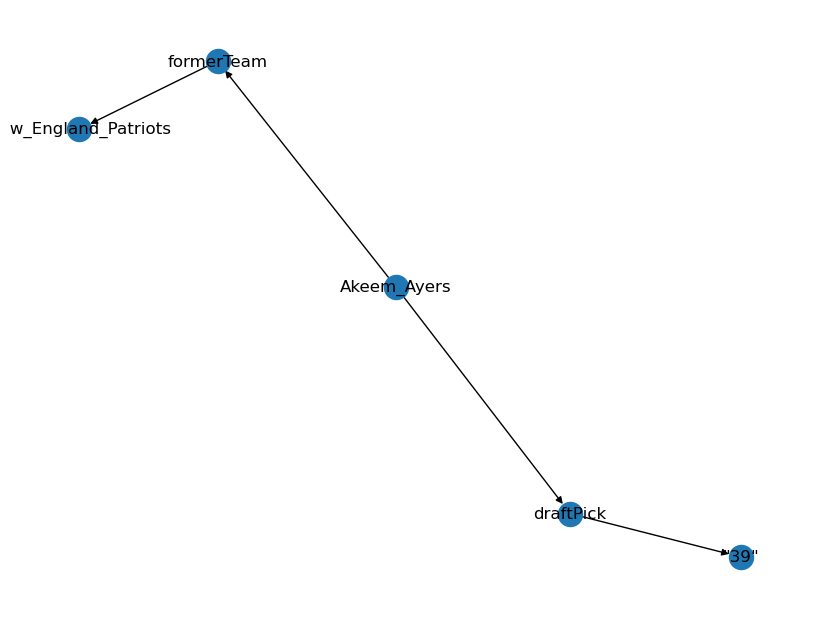

Decoded Input: 
 translate graph to text:  Akeem_Ayers  formerTeam  New_England_Patriots  Akeem_Ayers  draftPick  "39"
Decoded Target: 
 Akeem Ayers was number 39 in the draft pick and his former team was New England Patriots.
DataBatch(x=[1, 512], edge_index=[2, 4], attention_mask=[1, 512], y=[1, 512], batch=[512], ptr=[2])
Original Sample: 
 translate graph to text: <H> Akeem_Ayers  <R>  formerTeam  <T>  Tennessee_Titans <H> Akeem_Ayers  <R>  draftPick  <T>  "39" 
 Akeem Ayers' former team was Tennessee Titans and he was number 39 in the draft pick.
NetworkX Graph: 
 [('Akeem_Ayers', 'formerTeam', 0), ('Akeem_Ayers', 'draftPick', 0), ('formerTeam', 'Tennessee_Titans', 0), ('draftPick', '"39"', 0)]


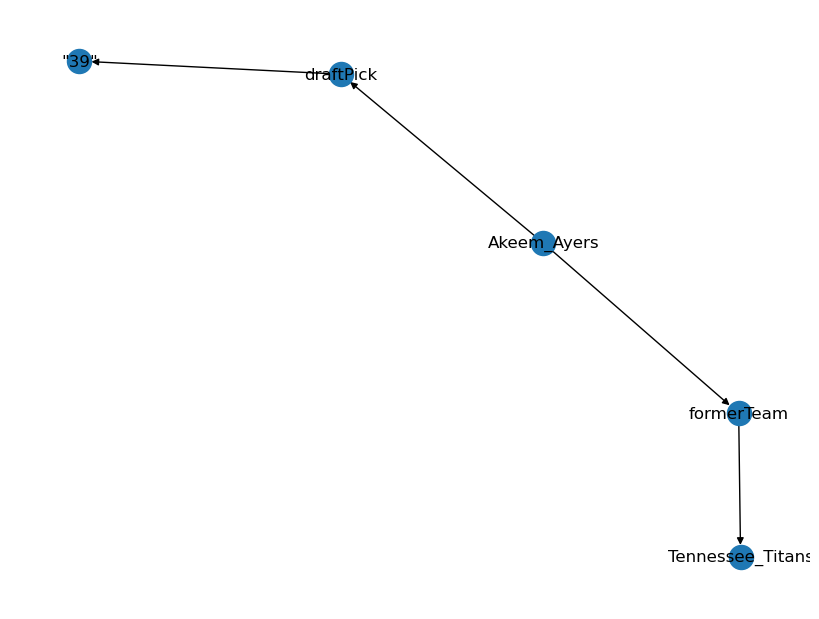

Decoded Input: 
 translate graph to text:  Akeem_Ayers  formerTeam  Tennessee_Titans  Akeem_Ayers  draftPick  "39"
Decoded Target: 
 Akeem Ayers' former team was Tennessee Titans and he was number 39 in the draft pick.
DataBatch(x=[1, 512], edge_index=[2, 4], attention_mask=[1, 512], y=[1, 512], batch=[512], ptr=[2])
Original Sample: 
 translate graph to text: <H> Akeem_Dent  <R>  birthYear  <T>  "1987"^^xsd:gYear <H> Akeem_Dent  <R>  dateOfBirth  <T>  "1987-09-27"^^xsd:date 
 Akeem Dent was born September 27, 1987.
NetworkX Graph: 
 [('Akeem_Dent', 'birthYear', 0), ('Akeem_Dent', 'dateOfBirth', 0), ('birthYear', '"1987"^^xsd:gYear', 0), ('dateOfBirth', '"1987-09-27"^^xsd:date', 0)]


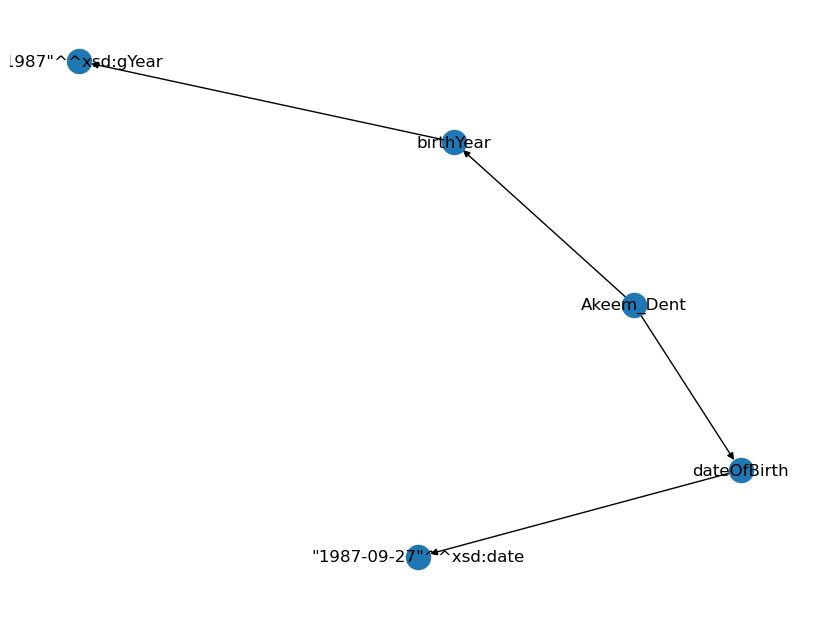

Decoded Input: 
 translate graph to text:  Akeem_Dent  birthYear  "1987"xsd:gYear  Akeem_Dent  dateOfBirth  "1987-09-27"xsd:date
Decoded Target: 
 Akeem Dent was born September 27, 1987.
DataBatch(x=[1, 512], edge_index=[2, 4], attention_mask=[1, 512], y=[1, 512], batch=[512], ptr=[2])
Original Sample: 
 translate graph to text: <H> Akeem_Priestley  <R>  team  <T>  Connecticut_Huskies <H> Akeem_Priestley  <R>  clubs  <T>  Sheikh_Russel_KC 
 Akeem Priestley's club is the Connecticut Huskies and he previously played for Sheikh Russel KC.
NetworkX Graph: 
 [('Akeem_Priestley', 'team', 0), ('Akeem_Priestley', 'clubs', 0), ('team', 'Connecticut_Huskies', 0), ('clubs', 'Sheikh_Russel_KC', 0)]


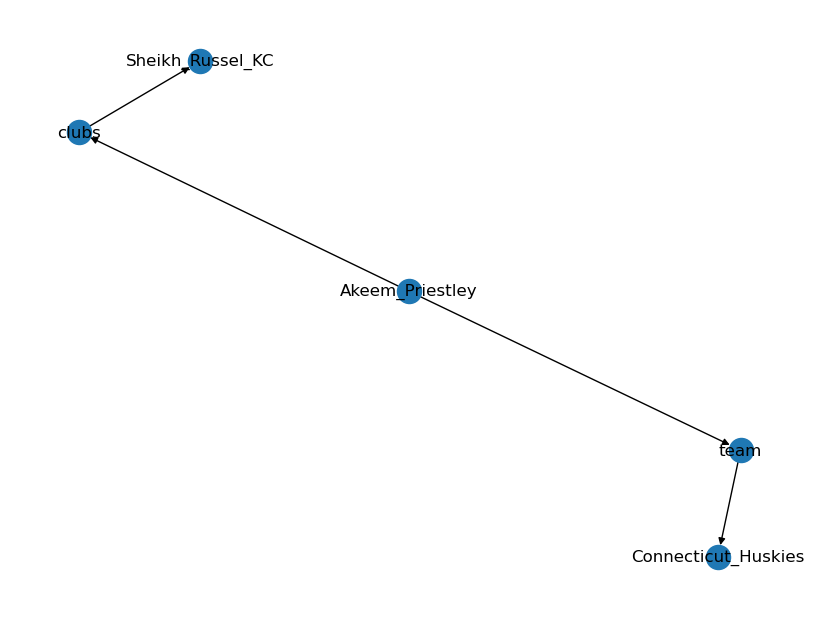

Decoded Input: 
 translate graph to text:  Akeem_Priestley  team  Connecticut_Huskies  Akeem_Priestley  clubs  Sheikh_Russel_KC
Decoded Target: 
 Akeem Priestley's club is the Connecticut Huskies and he previously played for Sheikh Russel KC.
DataBatch(x=[1, 512], edge_index=[2, 4], attention_mask=[1, 512], y=[1, 512], batch=[512], ptr=[2])
Original Sample: 
 translate graph to text: <H> Akeem_Priestley  <R>  team  <T>  RoPS <H> Akeem_Priestley  <R>  clubs  <T>  Sheikh_Russel_KC 
 Akeem Priestley’s club is RoPS and he played for Sheikh Russel KC.
NetworkX Graph: 
 [('Akeem_Priestley', 'team', 0), ('Akeem_Priestley', 'clubs', 0), ('team', 'RoPS', 0), ('clubs', 'Sheikh_Russel_KC', 0)]


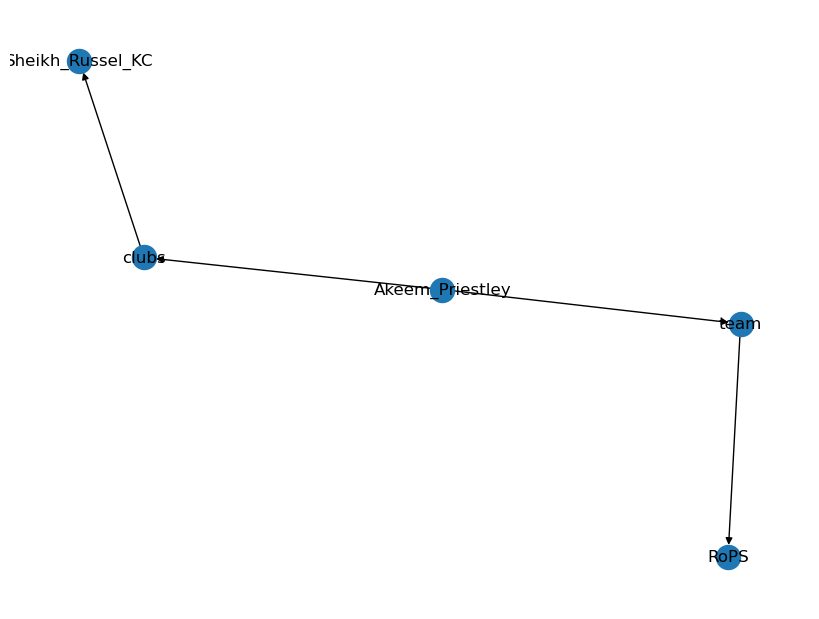

Decoded Input: 
 translate graph to text:  Akeem_Priestley  team  RoPS  Akeem_Priestley  clubs  Sheikh_Russel_KC
Decoded Target: 
 Akeem Priestley’s club is RoPS and he played for Sheikh Russel KC.
DataBatch(x=[1, 512], edge_index=[2, 4], attention_mask=[1, 512], y=[1, 512], batch=[512], ptr=[2])
Original Sample: 
 translate graph to text: <H> Alaa_Abdul-Zahra  <R>  team  <T>  Al-Khor_Sports_Club <H> Al-Khor_Sports_Club  <R>  ground  <T>  Al_Khor 
 Alaa Abdul Zahra plays for Al-Khor Sports Club located in Al-Khor.
NetworkX Graph: 
 [('Alaa_Abdul-Zahra', 'team', 0), ('team', 'Al-Khor_Sports_Club', 0), ('Al-Khor_Sports_Club', 'ground', 0), ('ground', 'Al_Khor', 0)]


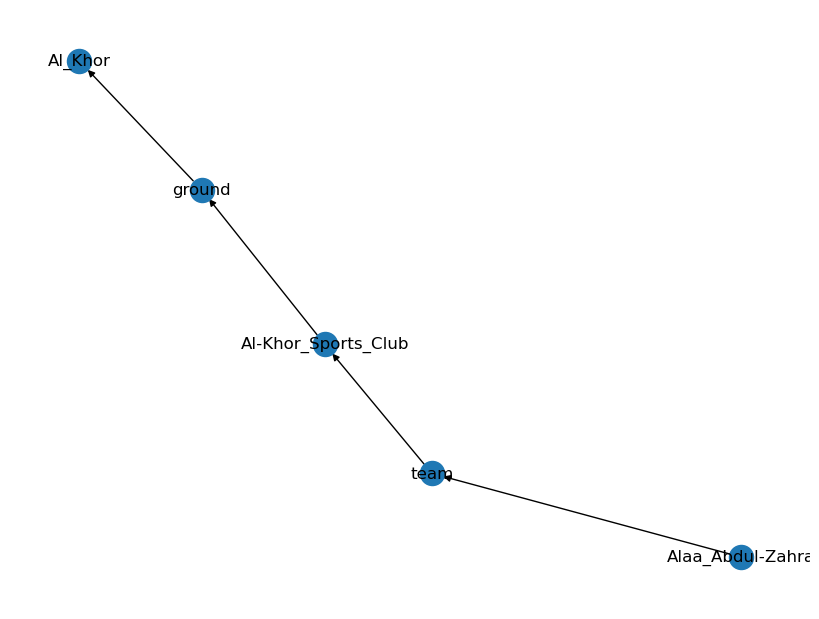

Decoded Input: 
 translate graph to text:  Alaa_Abdul-Zahra  team  Al-Khor_Sports_Club  Al-Khor_Sports_Club  ground  Al_Khor
Decoded Target: 
 Alaa Abdul Zahra plays for Al-Khor Sports Club located in Al-Khor.
DataBatch(x=[1, 512], edge_index=[2, 4], attention_mask=[1, 512], y=[1, 512], batch=[512], ptr=[2])
Original Sample: 
 translate graph to text: <H> Alaa_Abdul-Zahra  <R>  clubs  <T>  Al_Kharaitiyat_SC <H> Al_Kharaitiyat_SC  <R>  manager  <T>  Amar_Osim 
 Alaa Abdul Zahra's club is AL Kharaitiyat SC managed by Amar Osim.
NetworkX Graph: 
 [('Alaa_Abdul-Zahra', 'clubs', 0), ('clubs', 'Al_Kharaitiyat_SC', 0), ('Al_Kharaitiyat_SC', 'manager', 0), ('manager', 'Amar_Osim', 0)]


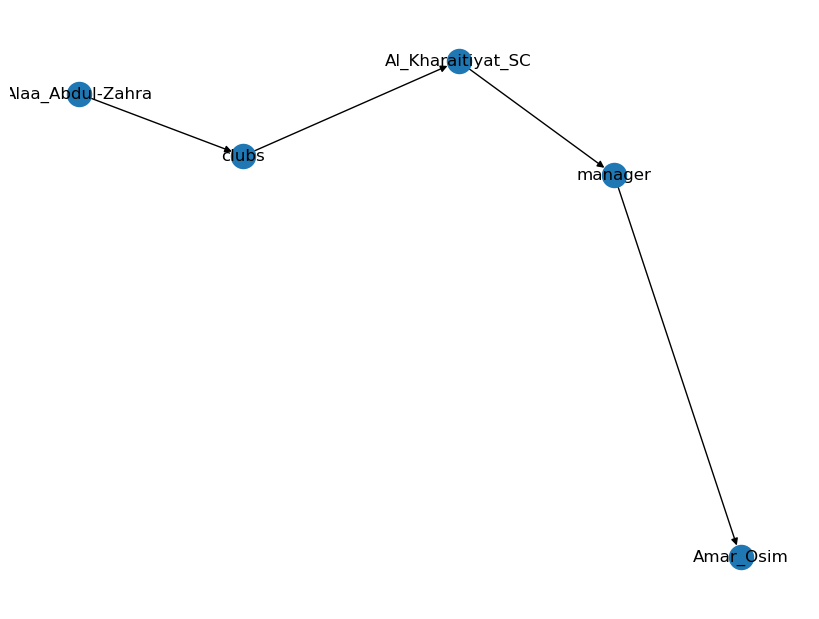

Decoded Input: 
 translate graph to text:  Alaa_Abdul-Zahra  clubs  Al_Kharaitiyat_SC  Al_Kharaitiyat_SC  manager  Amar_Osim
Decoded Target: 
 Alaa Abdul Zahra's club is AL Kharaitiyat SC managed by Amar Osim.
DataBatch(x=[1, 512], edge_index=[2, 4], attention_mask=[1, 512], y=[1, 512], batch=[512], ptr=[2])
Original Sample: 
 translate graph to text: <H> Alan_Martin_(footballer,_born_1989)  <R>  team  <T>  Hamilton_Academical_F.C. <H> Alan_Martin_(footballer,_born_1989)  <R>  clubs  <T>  Leeds_United_F.C. 
 Former clubs of the footballer Alan Martin include Hamilton Academicals FC and Leeds United FC.
NetworkX Graph: 
 [('Alan_Martin_', 'team', 0), ('Alan_Martin_', 'clubs', 0), ('team', 'Hamilton_Academical_F.C.', 0), ('clubs', 'Leeds_United_F.C.', 0)]


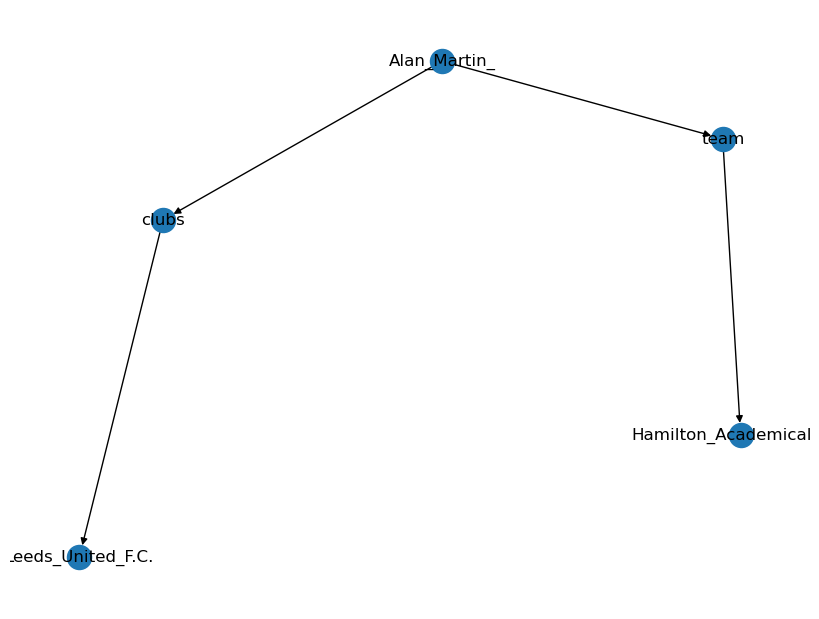

Decoded Input: 
 translate graph to text:  Alan_Martin_(footballer,_born_1989)  team  Hamilton_Academical_F.C.  Alan_Martin_(footballer,_born_1989)  clubs  Leeds_United_F.C.
Decoded Target: 
 Former clubs of the footballer Alan Martin include Hamilton Academicals FC and Leeds United FC.
DataBatch(x=[1, 512], edge_index=[2, 4], attention_mask=[1, 512], y=[1, 512], batch=[512], ptr=[2])
Original Sample: 
 translate graph to text: <H> Alan_Martin_(footballer,_born_1989)  <R>  team  <T>  Hamilton_Academical_F.C. <H> Hamilton_Academical_F.C.  <R>  ground  <T>  New_Douglas_Park 
 Alan Martin once played for Hamilton Academicals FC, which plays their home games at New Douglas Park.
NetworkX Graph: 
 [('Alan_Martin_', 'team', 0), ('team', 'Hamilton_Academical_F.C.', 0), ('Hamilton_Academical_F.C.', 'ground', 0), ('ground', 'New_Douglas_Park', 0)]


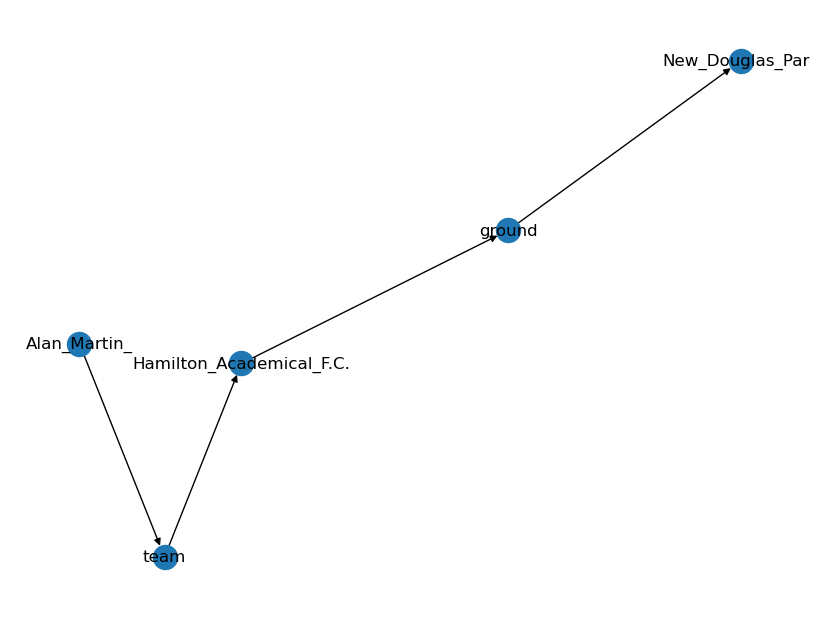

Decoded Input: 
 translate graph to text:  Alan_Martin_(footballer,_born_1989)  team  Hamilton_Academical_F.C.  Hamilton_Academical_F.C.  ground  New_Douglas_Park
Decoded Target: 
 Alan Martin once played for Hamilton Academicals FC, which plays their home games at New Douglas Park.
DataBatch(x=[1, 512], edge_index=[2, 4], attention_mask=[1, 512], y=[1, 512], batch=[512], ptr=[2])
Original Sample: 
 translate graph to text: <H> Aleksander_Barkov,_Jr.  <R>  team  <T>  Florida_Panthers <H> Aleksander_Barkov,_Jr.  <R>  dateOfBirth  <T>  "1995-09-02"^^xsd:date 
 Aleksander Barkov was born on 2 September 1995 and plays for the Florida Panthers.
NetworkX Graph: 
 [('Aleksander_Barkov,_Jr.', 'team', 0), ('Aleksander_Barkov,_Jr.', 'dateOfBirth', 0), ('team', 'Florida_Panthers', 0), ('dateOfBirth', '"1995-09-02"^^xsd:date', 0)]


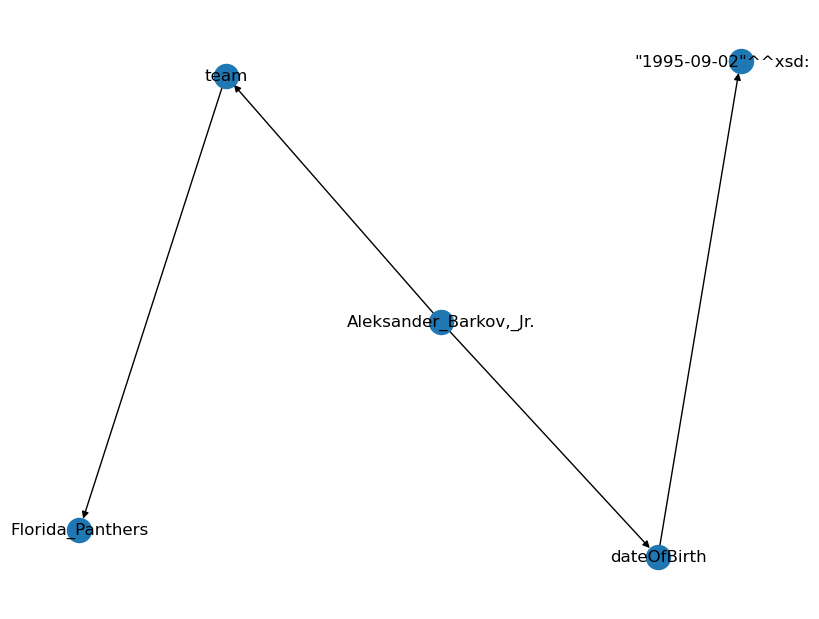

Decoded Input: 
 translate graph to text:  Aleksander_Barkov,_Jr.  team  Florida_Panthers  Aleksander_Barkov,_Jr.  dateOfBirth  "1995-09-02"xsd:date
Decoded Target: 
 Aleksander Barkov was born on 2 September 1995 and plays for the Florida Panthers.
DataBatch(x=[1, 512], edge_index=[2, 4], attention_mask=[1, 512], y=[1, 512], batch=[512], ptr=[2])
Original Sample: 
 translate graph to text: <H> Aleksander_Barkov,_Jr.  <R>  team  <T>  Florida_Panthers <H> Aleksander_Barkov,_Jr.  <R>  placeOfBirth  <T>  "Tampere, Finland"@en 
 Aleksander Barkov Jr . was born in Tampere, Finland and played with the Florida Panthers.
NetworkX Graph: 
 [('Aleksander_Barkov,_Jr.', 'team', 0), ('Aleksander_Barkov,_Jr.', 'placeOfBirth', 0), ('team', 'Florida_Panthers', 0), ('placeOfBirth', '"Tampere, Finland"@en', 0)]


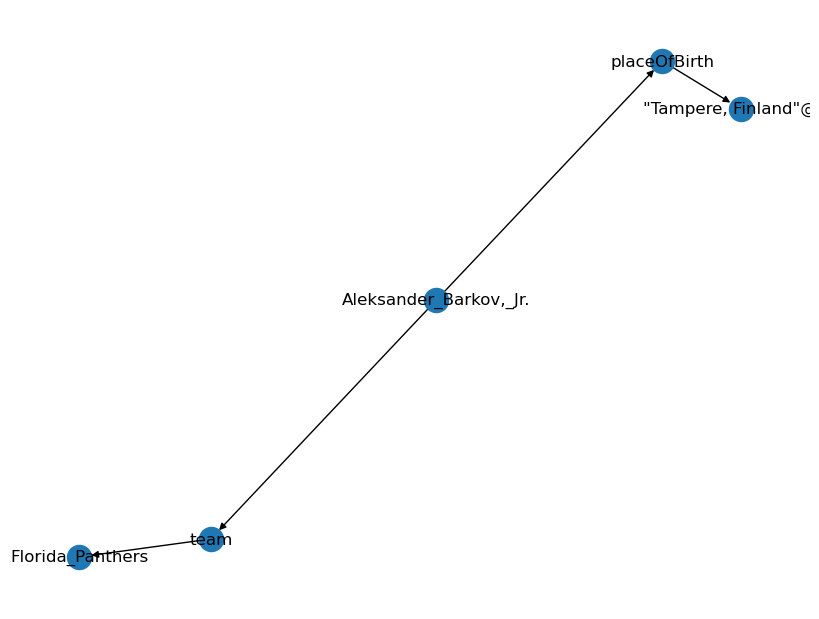

Decoded Input: 
 translate graph to text:  Aleksander_Barkov,_Jr.  team  Florida_Panthers  Aleksander_Barkov,_Jr.  placeOfBirth  "Tampere, Finland"@en
Decoded Target: 
 Aleksander Barkov Jr. was born in Tampere, Finland and played with the Florida Panthers.
DataBatch(x=[1, 512], edge_index=[2, 4], attention_mask=[1, 512], y=[1, 512], batch=[512], ptr=[2])
Original Sample: 
 translate graph to text: <H> FC_Torpedo_Moscow  <R>  manager  <T>  Valery_Petrakov <H> Aleksandr_Chumakov  <R>  team  <T>  FC_Torpedo_Moscow 
 Aleksandr Chumakov has played for the club FC Torpedo Moscow, which is managed by Valery Petrakov.
NetworkX Graph: 
 [('FC_Torpedo_Moscow', 'manager', 0), ('manager', 'Valery_Petrakov', 0), ('Aleksandr_Chumakov', 'team', 0), ('team', 'FC_Torpedo_Moscow', 0)]


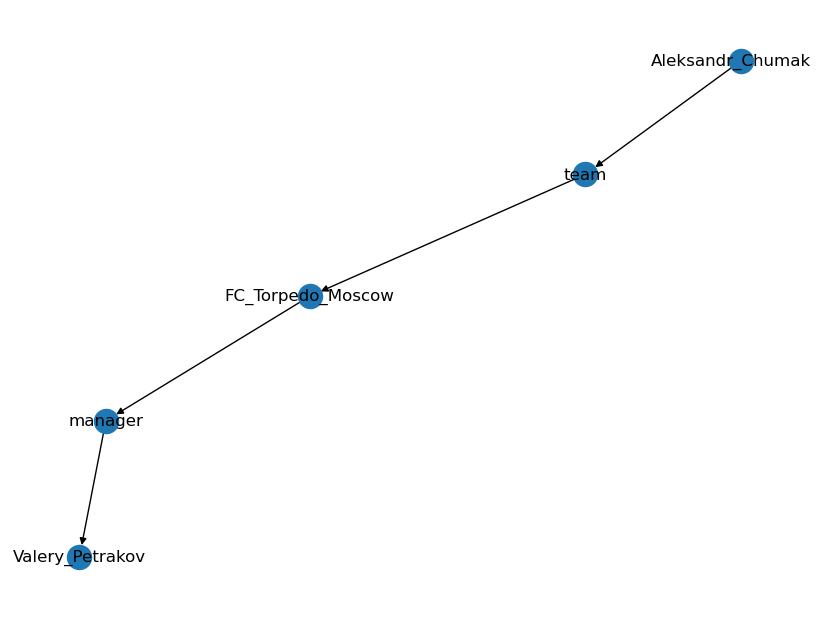

Decoded Input: 
 translate graph to text:  FC_Torpedo_Moscow  manager  Valery_Petrakov  Aleksandr_Chumakov  team  FC_Torpedo_Moscow
Decoded Target: 
 Aleksandr Chumakov has played for the club FC Torpedo Moscow, which is managed by Valery Petrakov.
DataBatch(x=[1, 512], edge_index=[2, 4], attention_mask=[1, 512], y=[1, 512], batch=[512], ptr=[2])
Original Sample: 
 translate graph to text: <H> Aleksandr_Prudnikov  <R>  team  <T>  FC_Spartak_Moscow <H> Aleksandr_Prudnikov  <R>  clubs  <T>  FC_Kuban_Krasnodar 
 Aleksandr Prudnikov's club is FC Spartak Moscow and he also plays for the FC Kuban Krasnodar club.
NetworkX Graph: 
 [('Aleksandr_Prudnikov', 'team', 0), ('Aleksandr_Prudnikov', 'clubs', 0), ('team', 'FC_Spartak_Moscow', 0), ('clubs', 'FC_Kuban_Krasnodar', 0)]


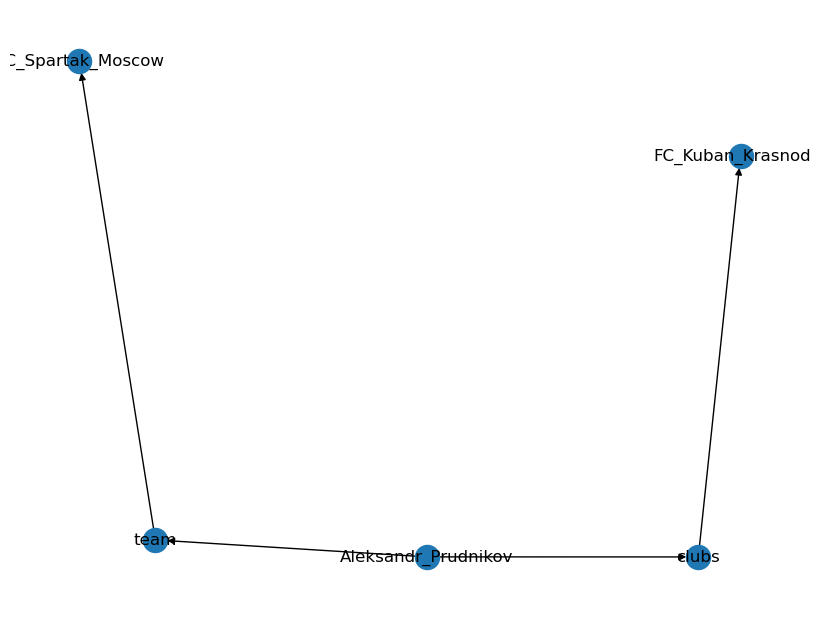

Decoded Input: 
 translate graph to text:  Aleksandr_Prudnikov  team  FC_Spartak_Moscow  Aleksandr_Prudnikov  clubs  FC_Kuban_Krasnodar
Decoded Target: 
 Aleksandr Prudnikov's club is FC Spartak Moscow and he also plays for the FC Kuban Krasnodar club.
DataBatch(x=[1, 512], edge_index=[2, 4], attention_mask=[1, 512], y=[1, 512], batch=[512], ptr=[2])
Original Sample: 
 translate graph to text: <H> Aleksandr_Prudnikov  <R>  team  <T>  FC_Tom_Tomsk <H> FC_Tom_Tomsk  <R>  league  <T>  Russian_Football_National_League 
 Aleksandr Prudinov plays for FC Tom Tomsk, which plays in the Russian National Football League.
NetworkX Graph: 
 [('Aleksandr_Prudnikov', 'team', 0), ('team', 'FC_Tom_Tomsk', 0), ('FC_Tom_Tomsk', 'league', 0), ('league', 'Russian_Football_National_League', 0)]


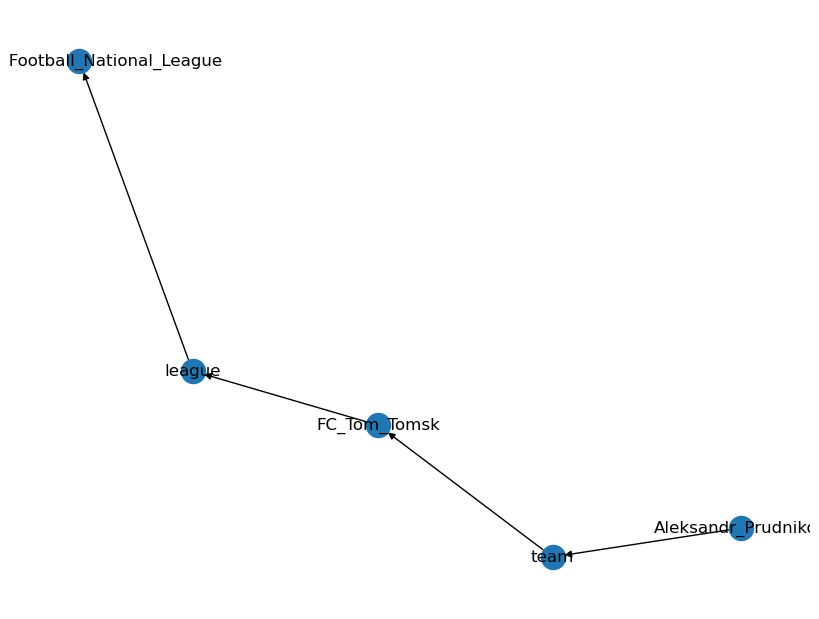

Decoded Input: 
 translate graph to text:  Aleksandr_Prudnikov  team  FC_Tom_Tomsk  FC_Tom_Tomsk  league  Russian_Football_National_League
Decoded Target: 
 Aleksandr Prudinov plays for FC Tom Tomsk, which plays in the Russian National Football League.
DataBatch(x=[1, 512], edge_index=[2, 4], attention_mask=[1, 512], y=[1, 512], batch=[512], ptr=[2])
Original Sample: 
 translate graph to text: <H> Aleksandre_Guruli  <R>  team  <T>  FC_Karpaty_Lviv <H> Aleksandre_Guruli  <R>  clubs  <T>  FC_Dinamo_Batumi 
 Aleksandre Guruli played for FC Karpaty Lviv and FC Dinamo Batumi.
NetworkX Graph: 
 [('Aleksandre_Guruli', 'team', 0), ('Aleksandre_Guruli', 'clubs', 0), ('team', 'FC_Karpaty_Lviv', 0), ('clubs', 'FC_Dinamo_Batumi', 0)]


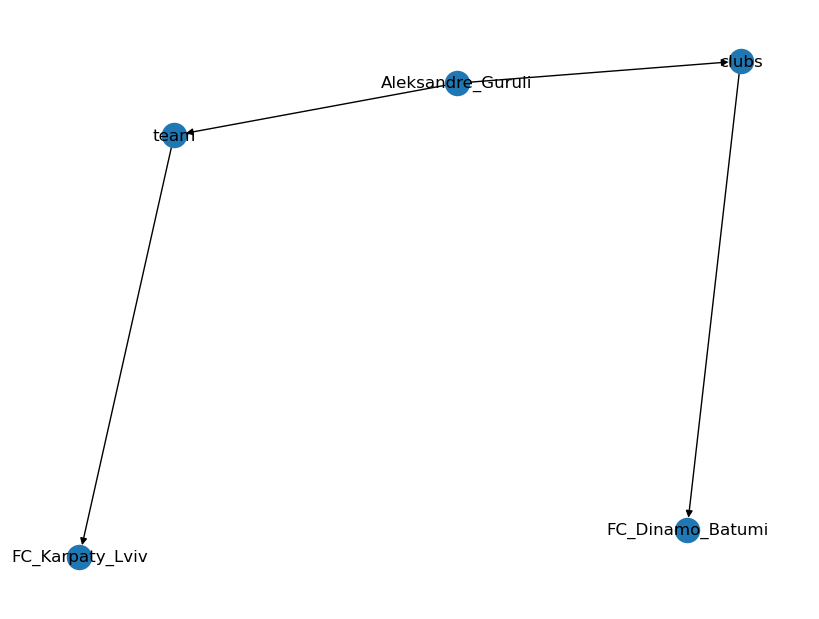

Decoded Input: 
 translate graph to text:  Aleksandre_Guruli  team  FC_Karpaty_Lviv  Aleksandre_Guruli  clubs  FC_Dinamo_Batumi
Decoded Target: 
 Aleksandre Guruli played for FC Karpaty Lviv and FC Dinamo Batumi.
DataBatch(x=[1, 512], edge_index=[2, 4], attention_mask=[1, 512], y=[1, 512], batch=[512], ptr=[2])
Original Sample: 
 translate graph to text: <H> Alex_Plante  <R>  birthYear  <T>  "1989"^^xsd:gYear <H> Alex_Plante  <R>  placeOfBirth  <T>  Manitoba 
 Alex Plante was born in 1989 in Manitoba.
NetworkX Graph: 
 [('Alex_Plante', 'birthYear', 0), ('Alex_Plante', 'placeOfBirth', 0), ('birthYear', '"1989"^^xsd:gYear', 0), ('placeOfBirth', 'Manitoba', 0)]


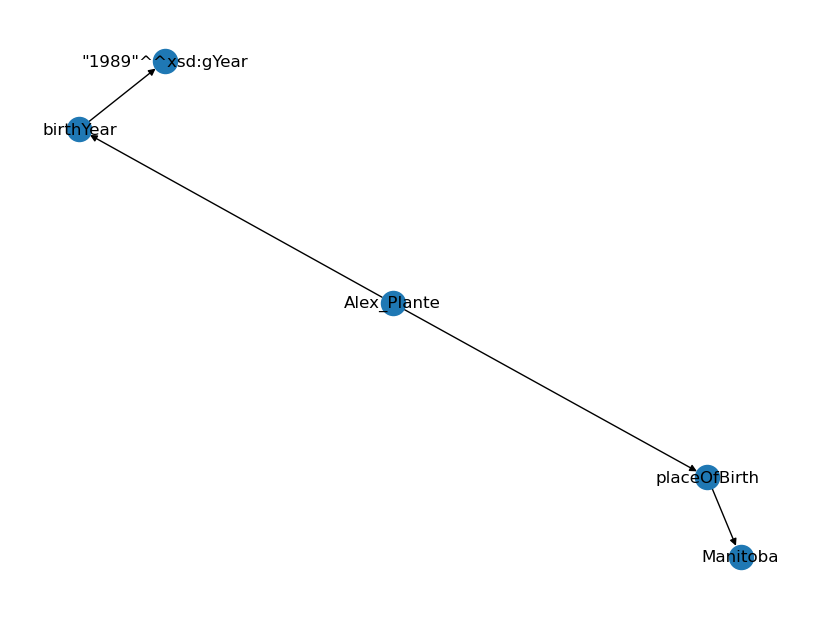

Decoded Input: 
 translate graph to text:  Alex_Plante  birthYear  "1989"xsd:gYear  Alex_Plante  placeOfBirth  Manitoba
Decoded Target: 
 Alex Plante was born in 1989 in Manitoba.
DataBatch(x=[1, 512], edge_index=[2, 4], attention_mask=[1, 512], y=[1, 512], batch=[512], ptr=[2])
Original Sample: 
 translate graph to text: <H> Alex_Tyus  <R>  team  <T>  Pallacanestro_Cantù <H> Alex_Tyus  <R>  dateOfBirth  <T>  "1988-01-08"^^xsd:date 
 Alex Tyus was born on the 8th January 1988 and plays for the club Pallacanestro Cantu.
NetworkX Graph: 
 [('Alex_Tyus', 'team', 0), ('Alex_Tyus', 'dateOfBirth', 0), ('team', 'Pallacanestro_Cantù', 0), ('dateOfBirth', '"1988-01-08"^^xsd:date', 0)]


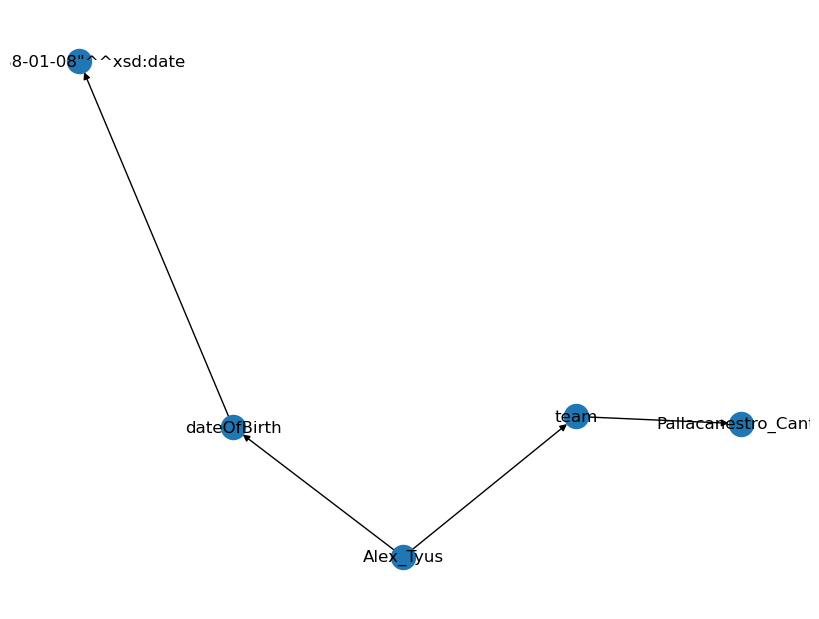

Decoded Input: 
 translate graph to text:  Alex_Tyus  team  Pallacanestro_Cantù  Alex_Tyus  dateOfBirth  "1988-01-08"xsd:date
Decoded Target: 
 Alex Tyus was born on the 8th January 1988 and plays for the club Pallacanestro Cantu.
DataBatch(x=[1, 512], edge_index=[2, 4], attention_mask=[1, 512], y=[1, 512], batch=[512], ptr=[2])
Original Sample: 
 translate graph to text: <H> Alex_Tyus  <R>  league  <T>  Turkish_Basketball_Super_League <H> Alex_Tyus  <R>  team  <T>  Maccabi_Tel_Aviv_B.C. 
 Alex Tyus plays for the club, Maccabi Tel Aviv B.C which is in the Turkish Basketball Super league.
NetworkX Graph: 
 [('Alex_Tyus', 'league', 0), ('Alex_Tyus', 'team', 0), ('league', 'Turkish_Basketball_Super_League', 0), ('team', 'Maccabi_Tel_Aviv_B.C.', 0)]


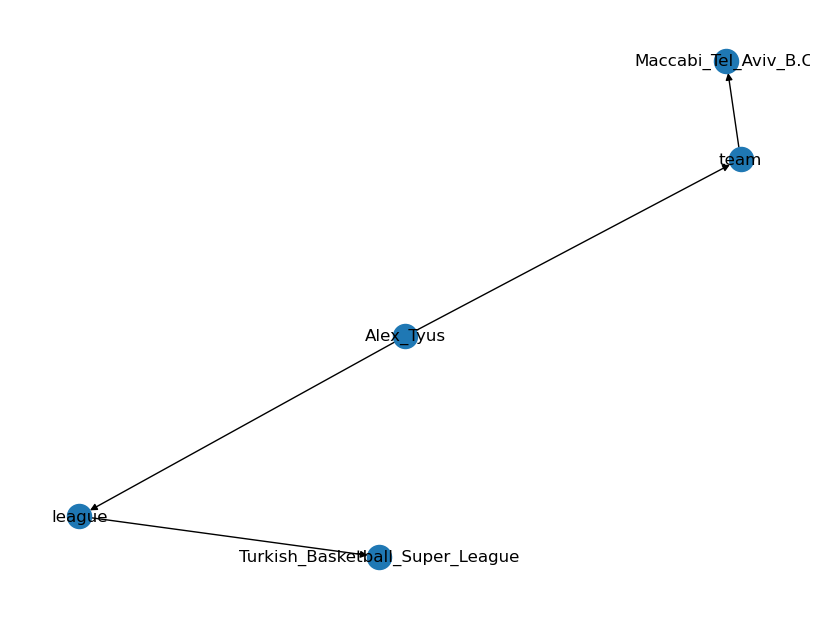

Decoded Input: 
 translate graph to text:  Alex_Tyus  league  Turkish_Basketball_Super_League  Alex_Tyus  team  Maccabi_Tel_Aviv_B.C.
Decoded Target: 
 Alex Tyus plays for the club, Maccabi Tel Aviv B.C which is in the Turkish Basketball Super league.
DataBatch(x=[1, 512], edge_index=[2, 4], attention_mask=[1, 512], y=[1, 512], batch=[512], ptr=[2])
Original Sample: 
 translate graph to text: <H> Brandon,_Manitoba  <R>  leaderName  <T>  Conservative_Party_of_Canada <H> Alex_Plante  <R>  placeOfBirth  <T>  Brandon,_Manitoba 
 Alex Plante was born in Brandon, Manitoba, which is led by the Conservative Party of Canada.
NetworkX Graph: 
 [('Brandon,_Manitoba', 'leaderName', 0), ('leaderName', 'Conservative_Party_of_Canada', 0), ('Alex_Plante', 'placeOfBirth', 0), ('placeOfBirth', 'Brandon,_Manitoba', 0)]


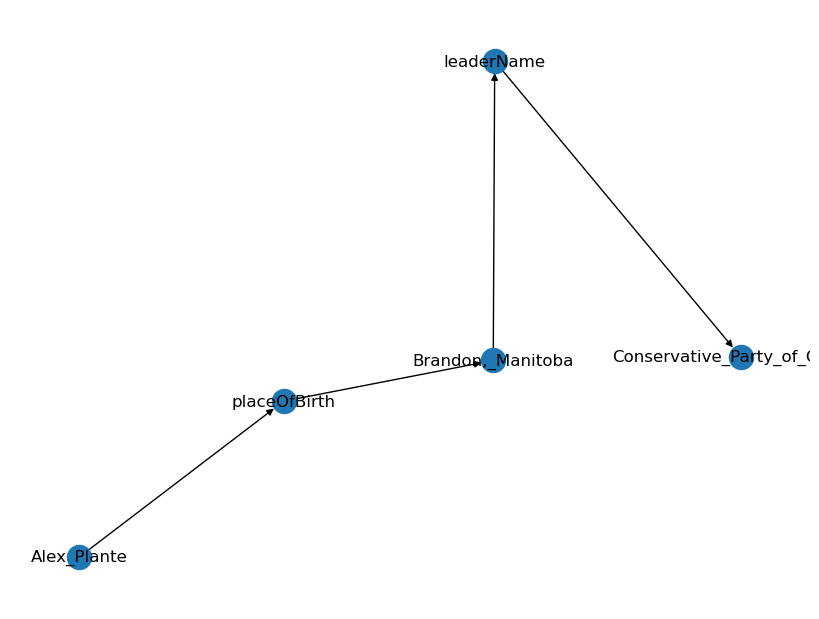

Decoded Input: 
 translate graph to text:  Brandon,_Manitoba  leaderName  Conservative_Party_of_Canada  Alex_Plante  placeOfBirth  Brandon,_Manitoba
Decoded Target: 
 Alex Plante was born in Brandon, Manitoba, which is led by the Conservative Party of Canada.
DataBatch(x=[1, 512], edge_index=[2, 4], attention_mask=[1, 512], y=[1, 512], batch=[512], ptr=[2])
Original Sample: 
 translate graph to text: <H> Canada  <R>  anthem  <T>  O_Canada <H> Adam_McQuaid  <R>  placeOfBirth  <T>  Canada 
 Adam McQuaid was born in Canada where the national anthem is O Canada.
NetworkX Graph: 
 [('Canada', 'anthem', 0), ('anthem', 'O_Canada', 0), ('Adam_McQuaid', 'placeOfBirth', 0), ('placeOfBirth', 'Canada', 0)]


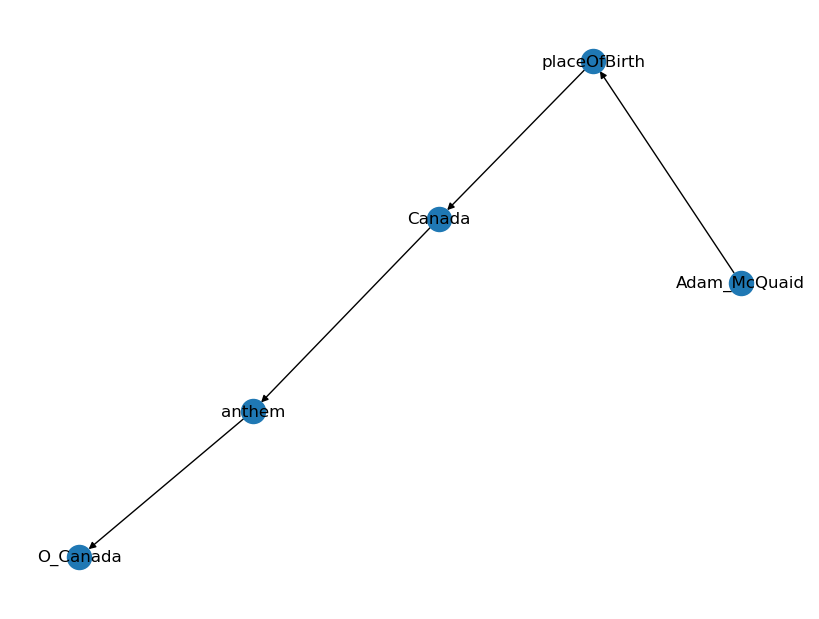

Decoded Input: 
 translate graph to text:  Canada  anthem  O_Canada  Adam_McQuaid  placeOfBirth  Canada
Decoded Target: 
 Adam McQuaid was born in Canada where the national anthem is O Canada.
DataBatch(x=[1, 512], edge_index=[2, 4], attention_mask=[1, 512], y=[1, 512], batch=[512], ptr=[2])
Original Sample: 
 translate graph to text: <H> Canada  <R>  language  <T>  English_language <H> Adam_McQuaid  <R>  placeOfBirth  <T>  Canada 
 Adam McQuaid was born in Canada where the English language is spoken.
NetworkX Graph: 
 [('Canada', 'language', 0), ('language', 'English_language', 0), ('Adam_McQuaid', 'placeOfBirth', 0), ('placeOfBirth', 'Canada', 0)]


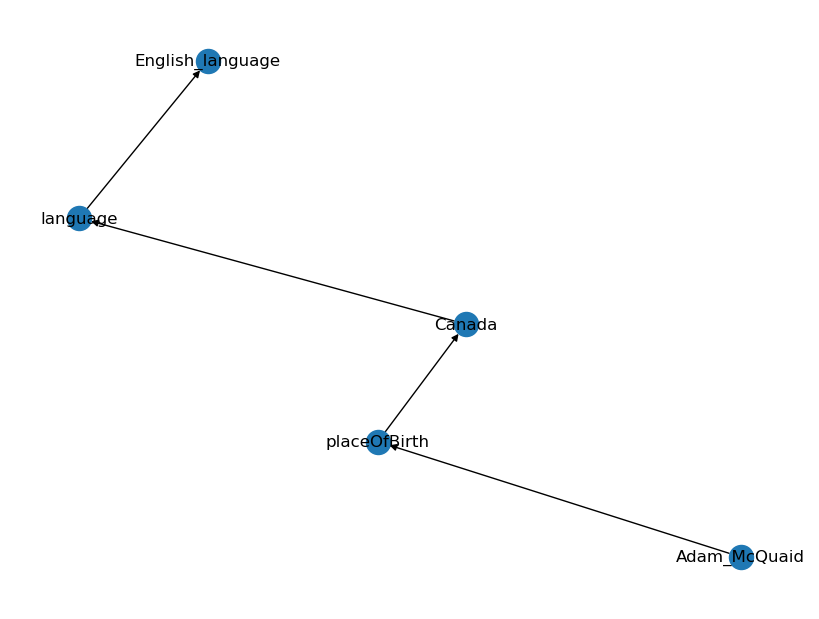

Decoded Input: 
 translate graph to text:  Canada  language  English_language  Adam_McQuaid  placeOfBirth  Canada
Decoded Target: 
 Adam McQuaid was born in Canada where the English language is spoken.
DataBatch(x=[1, 512], edge_index=[2, 4], attention_mask=[1, 512], y=[1, 512], batch=[512], ptr=[2])
Original Sample: 
 translate graph to text: <H> FC_Dinamo_Batumi  <R>  manager  <T>  Levan_Khomeriki <H> Aleksandre_Guruli  <R>  clubs  <T>  FC_Dinamo_Batumi 
 Aleksandre Guruli played for FC Dinamo Batumi managed by Levan Khomeriki.
NetworkX Graph: 
 [('FC_Dinamo_Batumi', 'manager', 0), ('manager', 'Levan_Khomeriki', 0), ('Aleksandre_Guruli', 'clubs', 0), ('clubs', 'FC_Dinamo_Batumi', 0)]


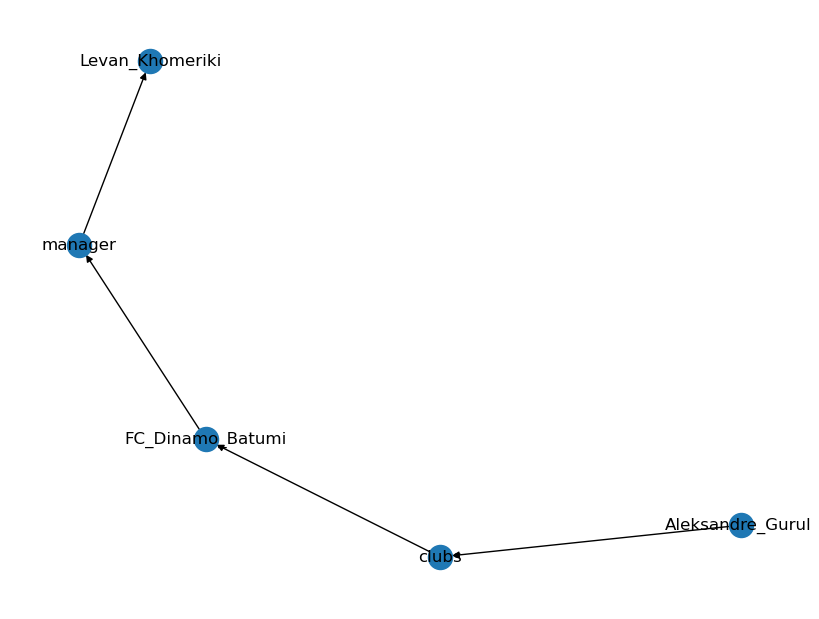

Decoded Input: 
 translate graph to text:  FC_Dinamo_Batumi  manager  Levan_Khomeriki  Aleksandre_Guruli  clubs  FC_Dinamo_Batumi
Decoded Target: 
 Aleksandre Guruli played for FC Dinamo Batumi managed by Levan Khomeriki.
DataBatch(x=[1, 512], edge_index=[2, 4], attention_mask=[1, 512], y=[1, 512], batch=[512], ptr=[2])
Original Sample: 
 translate graph to text: <H> FC_Spartak_Moscow  <R>  ground  <T>  Otkrytiye_Arena <H> Aleksandr_Prudnikov  <R>  clubs  <T>  FC_Spartak_Moscow 
 Aleksandr Prudnikov played with the Spartak Moscow FC whose playing ground is the Otkrytiye Arena.
NetworkX Graph: 
 [('FC_Spartak_Moscow', 'ground', 0), ('ground', 'Otkrytiye_Arena', 0), ('Aleksandr_Prudnikov', 'clubs', 0), ('clubs', 'FC_Spartak_Moscow', 0)]


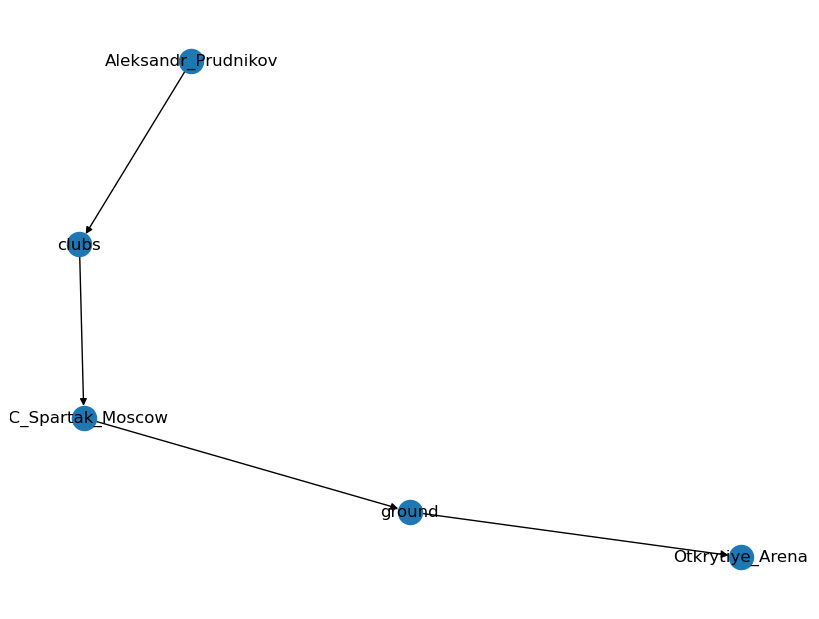

Decoded Input: 
 translate graph to text:  FC_Spartak_Moscow  ground  Otkrytiye_Arena  Aleksandr_Prudnikov  clubs  FC_Spartak_Moscow
Decoded Target: 
 Aleksandr Prudnikov played with the Spartak Moscow FC whose playing ground is the Otkrytiye Arena.
DataBatch(x=[1, 512], edge_index=[2, 4], attention_mask=[1, 512], y=[1, 512], batch=[512], ptr=[2])
Original Sample: 
 translate graph to text: <H> RoPS  <R>  league  <T>  Veikkausliiga <H> Akeem_Priestley  <R>  clubs  <T>  RoPS 
 Akeem Priestley’s club is RoPS which plays in the Veikkausliiga.
NetworkX Graph: 
 [('RoPS', 'league', 0), ('league', 'Veikkausliiga', 0), ('Akeem_Priestley', 'clubs', 0), ('clubs', 'RoPS', 0)]


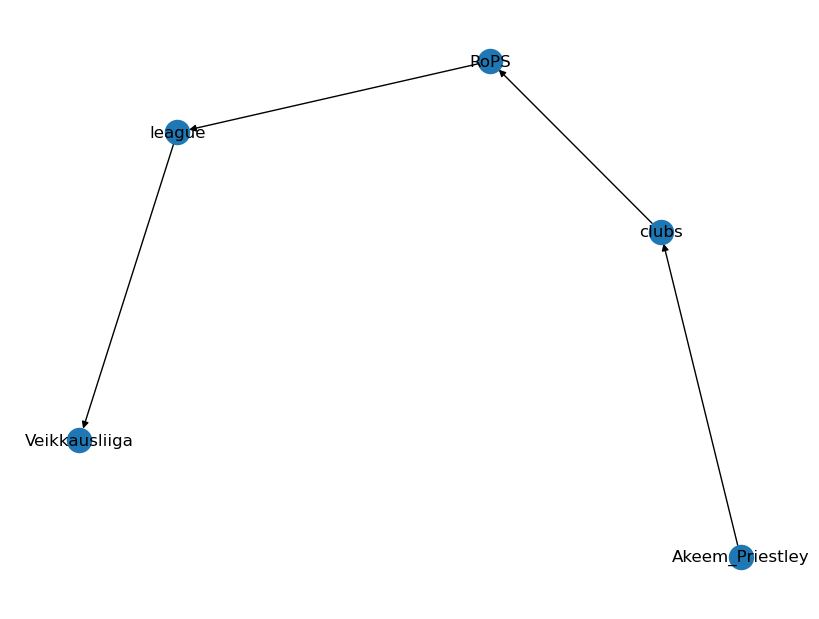

Decoded Input: 
 translate graph to text:  RoPS  league  Veikkausliiga  Akeem_Priestley  clubs  RoPS
Decoded Target: 
 Akeem Priestley’s club is RoPS which plays in the Veikkausliiga.
DataBatch(x=[1, 512], edge_index=[2, 4], attention_mask=[1, 512], y=[1, 512], batch=[512], ptr=[2])
Original Sample: 
 translate graph to text: <H> United_Petrotrin_F.C.  <R>  ground  <T>  Palo_Seco_Velodrome <H> Akeem_Adams  <R>  clubs  <T>  United_Petrotrin_F.C. 
 Akeem Adams played for United Petrotrin FC whose ground is Palo Seco Velodrome.
NetworkX Graph: 
 [('United_Petrotrin_F.C.', 'ground', 0), ('ground', 'Palo_Seco_Velodrome', 0), ('Akeem_Adams', 'clubs', 0), ('clubs', 'United_Petrotrin_F.C.', 0)]


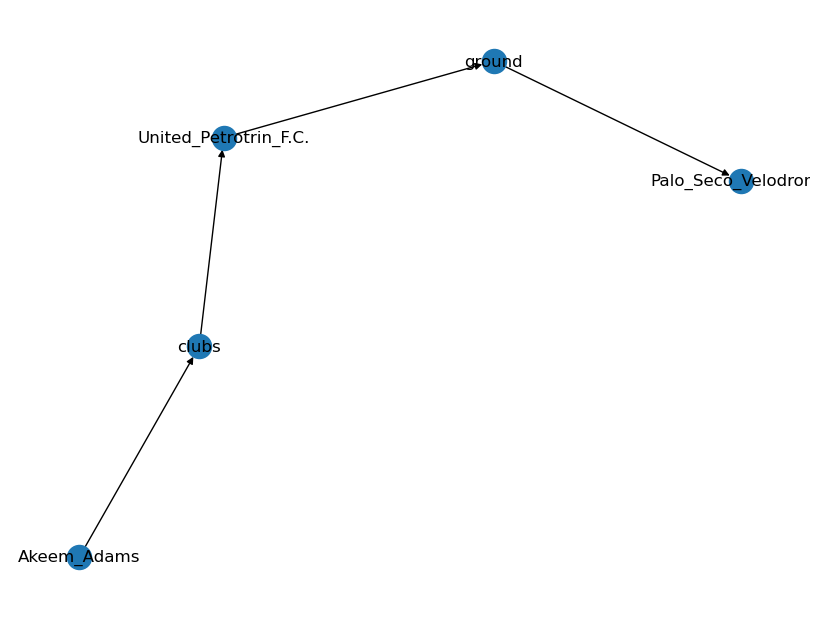

Decoded Input: 
 translate graph to text:  United_Petrotrin_F.C.  ground  Palo_Seco_Velodrome  Akeem_Adams  clubs  United_Petrotrin_F.C.
Decoded Target: 
 Akeem Adams played for United Petrotrin FC whose ground is Palo Seco Velodrome.
DataBatch(x=[1, 512], edge_index=[2, 4], attention_mask=[1, 512], y=[1, 512], batch=[512], ptr=[2])
Original Sample: 
 translate graph to text: <H> Aaron_Deer  <R>  genre  <T>  Psychedelia <H> Aaron_Deer  <R>  instrument  <T>  Guitar 
 Guitarist Aaron Deer plays Psychedelia.
NetworkX Graph: 
 [('Aaron_Deer', 'genre', 0), ('Aaron_Deer', 'instrument', 0), ('genre', 'Psychedelia', 0), ('instrument', 'Guitar', 0)]


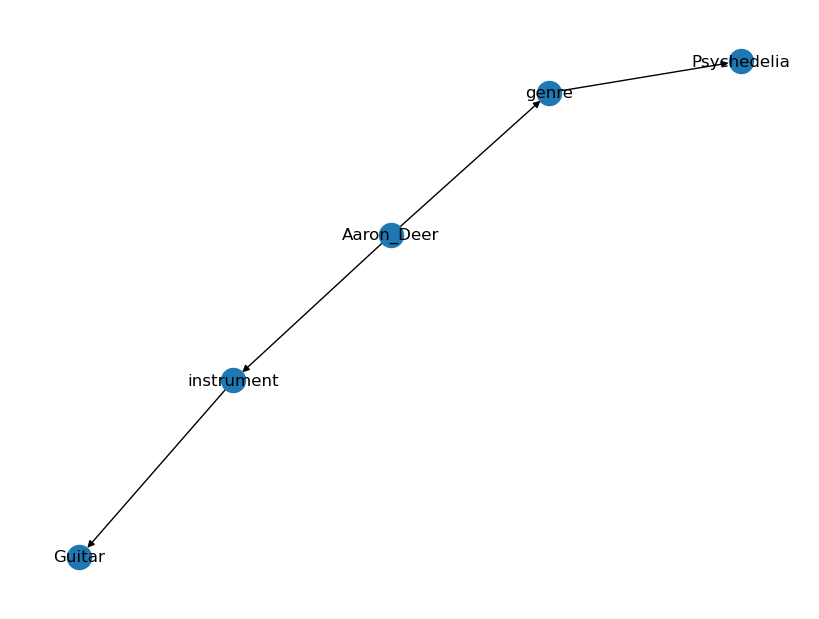

Decoded Input: 
 translate graph to text:  Aaron_Deer  genre  Psychedelia  Aaron_Deer  instrument  Guitar
Decoded Target: 
 Guitarist Aaron Deer plays Psychedelia.
DataBatch(x=[1, 512], edge_index=[2, 4], attention_mask=[1, 512], y=[1, 512], batch=[512], ptr=[2])
Original Sample: 
 translate graph to text: <H> Aaron_Deer  <R>  hometown  <T>  United_States <H> Aaron_Deer  <R>  origin  <T>  Indiana 
 Aaron Deer is from Indiana in the United States.
NetworkX Graph: 
 [('Aaron_Deer', 'hometown', 0), ('Aaron_Deer', 'origin', 0), ('hometown', 'United_States', 0), ('origin', 'Indiana', 0)]


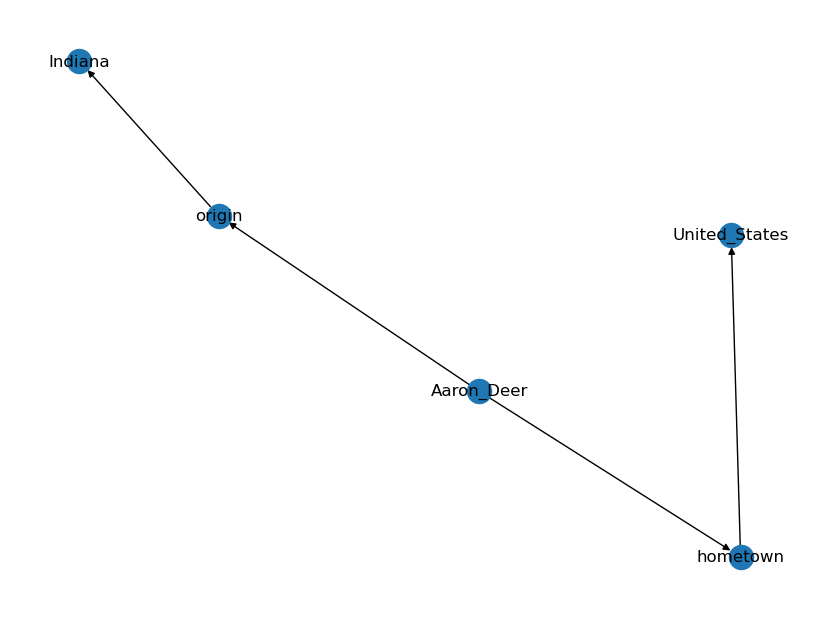

Decoded Input: 
 translate graph to text:  Aaron_Deer  hometown  United_States  Aaron_Deer  origin  Indiana
Decoded Target: 
 Aaron Deer is from Indiana in the United States.
DataBatch(x=[1, 512], edge_index=[2, 4], attention_mask=[1, 512], y=[1, 512], batch=[512], ptr=[2])
Original Sample: 
 translate graph to text: <H> Aaron_Turner  <R>  associatedMusicalArtist  <T>  Twilight_(band) <H> Aaron_Turner  <R>  genre  <T>  Electroacoustic_music 
 Aaron Turner performs electroacoustic music and played with the band Twilight.
NetworkX Graph: 
 [('Aaron_Turner', 'associatedMusicalArtist', 0), ('Aaron_Turner', 'genre', 0), ('associatedMusicalArtist', 'Twilight_', 0), ('genre', 'Electroacoustic_music', 0)]


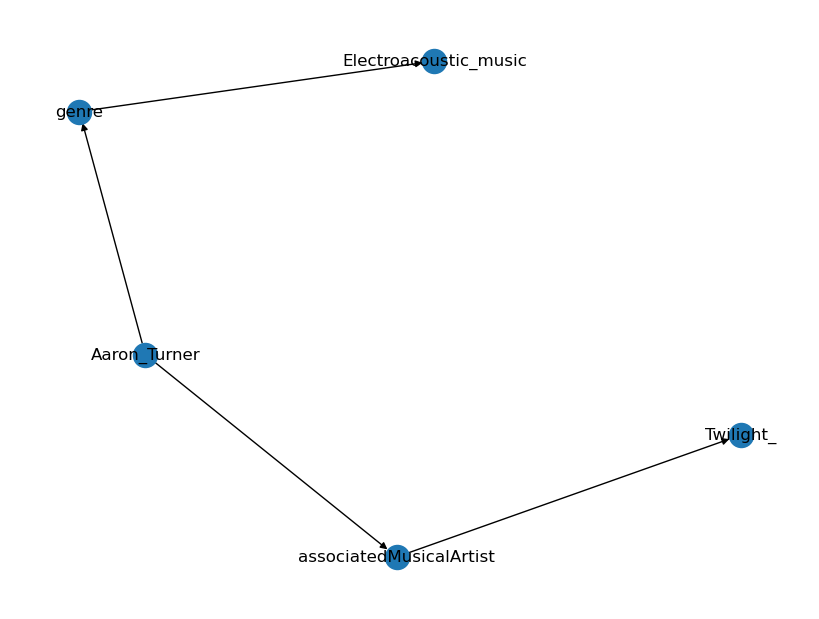

Decoded Input: 
 translate graph to text:  Aaron_Turner  associatedMusicalArtist  Twilight_(band)  Aaron_Turner  genre  Electroacoustic_music
Decoded Target: 
 Aaron Turner performs electroacoustic music and played with the band Twilight.
DataBatch(x=[1, 512], edge_index=[2, 4], attention_mask=[1, 512], y=[1, 512], batch=[512], ptr=[2])
Original Sample: 
 translate graph to text: <H> Aaron_Turner  <R>  instrument  <T>  Singing <H> Aaron_Turner  <R>  genre  <T>  Avant-garde_metal 
 Aaron Turner sings for a living and uses the musical genre Avant-garde metal.
NetworkX Graph: 
 [('Aaron_Turner', 'instrument', 0), ('Aaron_Turner', 'genre', 0), ('instrument', 'Singing', 0), ('genre', 'Avant-garde_metal', 0)]


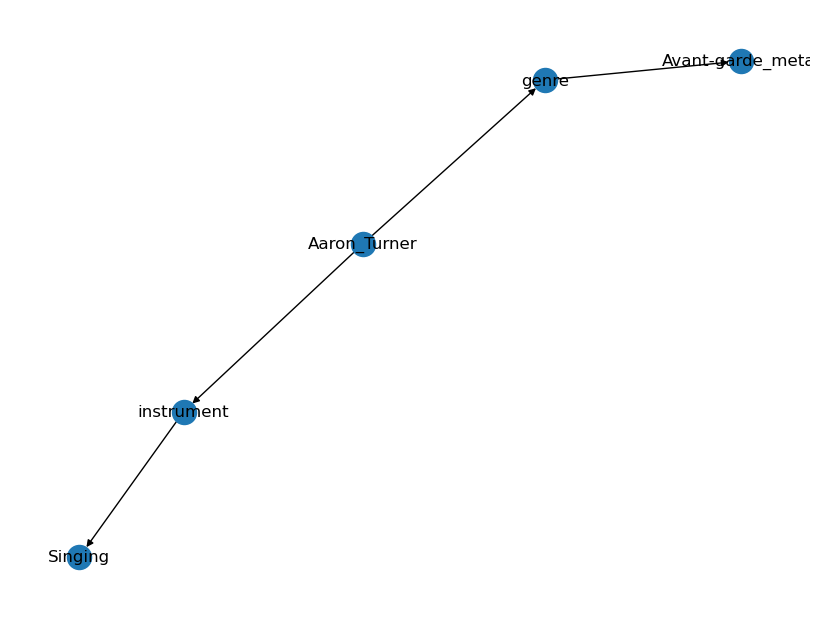

Decoded Input: 
 translate graph to text:  Aaron_Turner  instrument  Singing  Aaron_Turner  genre  Avant-garde_metal
Decoded Target: 
 Aaron Turner sings for a living and uses the musical genre Avant-garde metal.
DataBatch(x=[1, 512], edge_index=[2, 4], attention_mask=[1, 512], y=[1, 512], batch=[512], ptr=[2])
Original Sample: 
 translate graph to text: <H> Abradab  <R>  associatedBand  <T>  Magik_(rapper) <H> Abradab  <R>  associatedMusicalArtist  <T>  Kaliber_44 
 Abradab, an artist for the band Kaliber 44, is associated with Magik (rapper).
NetworkX Graph: 
 [('Abradab', 'associatedBand', 0), ('Abradab', 'associatedMusicalArtist', 0), ('associatedBand', 'Magik_', 0), ('associatedMusicalArtist', 'Kaliber_44', 0)]


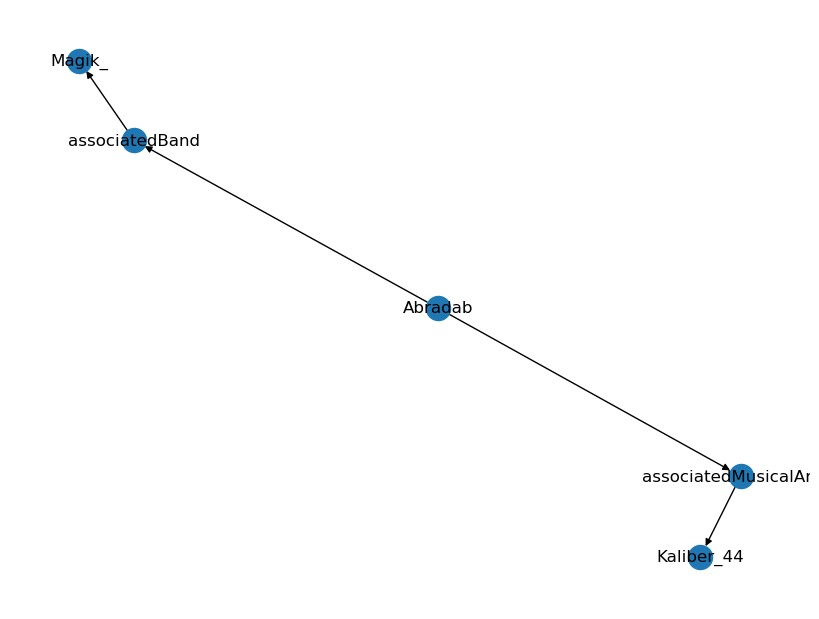

Decoded Input: 
 translate graph to text:  Abradab  associatedBand  Magik_(rapper)  Abradab  associatedMusicalArtist  Kaliber_44
Decoded Target: 
 Abradab, an artist for the band Kaliber 44, is associated with Magik (rapper).
DataBatch(x=[1, 512], edge_index=[2, 4], attention_mask=[1, 512], y=[1, 512], batch=[512], ptr=[2])
Original Sample: 
 translate graph to text: <H> Abradab  <R>  dateOfBirth  <T>  "1978-11-12"^^xsd:date <H> Abradab  <R>  placeOfBirth  <T>  Katowice 
 Abradab was born on November 12, 1978 in Katowice.
NetworkX Graph: 
 [('Abradab', 'dateOfBirth', 0), ('Abradab', 'placeOfBirth', 0), ('dateOfBirth', '"1978-11-12"^^xsd:date', 0), ('placeOfBirth', 'Katowice', 0)]


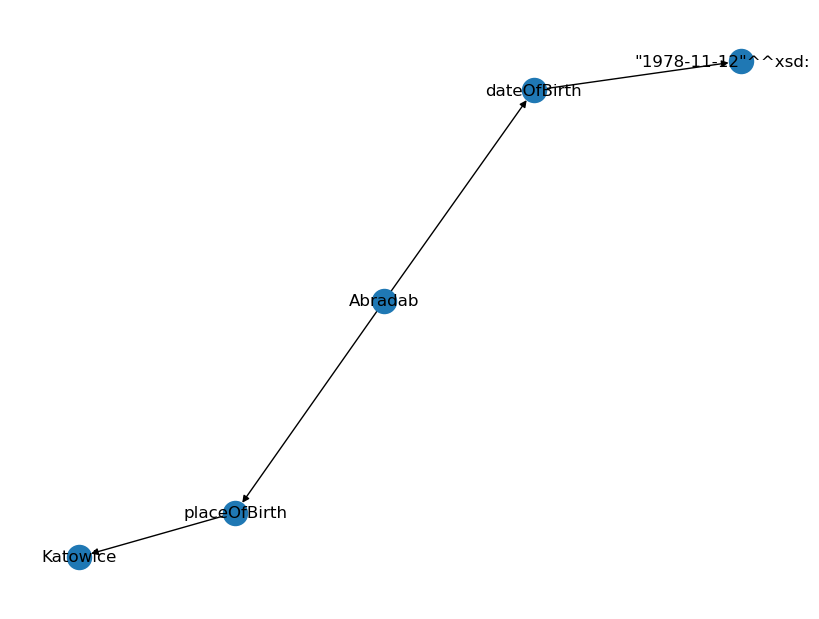

Decoded Input: 
 translate graph to text:  Abradab  dateOfBirth  "1978-11-12"xsd:date  Abradab  placeOfBirth  Katowice
Decoded Target: 
 Abradab was born on November 12, 1978 in Katowice.
DataBatch(x=[1, 512], edge_index=[2, 4], attention_mask=[1, 512], y=[1, 512], batch=[512], ptr=[2])
Original Sample: 
 translate graph to text: <H> Abradab  <R>  birthPlace  <T>  Katowice <H> Abradab  <R>  placeOfBirth  <T>  Poland 
 Abradab was born in Katowice, Poland.
NetworkX Graph: 
 [('Abradab', 'birthPlace', 0), ('Abradab', 'placeOfBirth', 0), ('birthPlace', 'Katowice', 0), ('placeOfBirth', 'Poland', 0)]


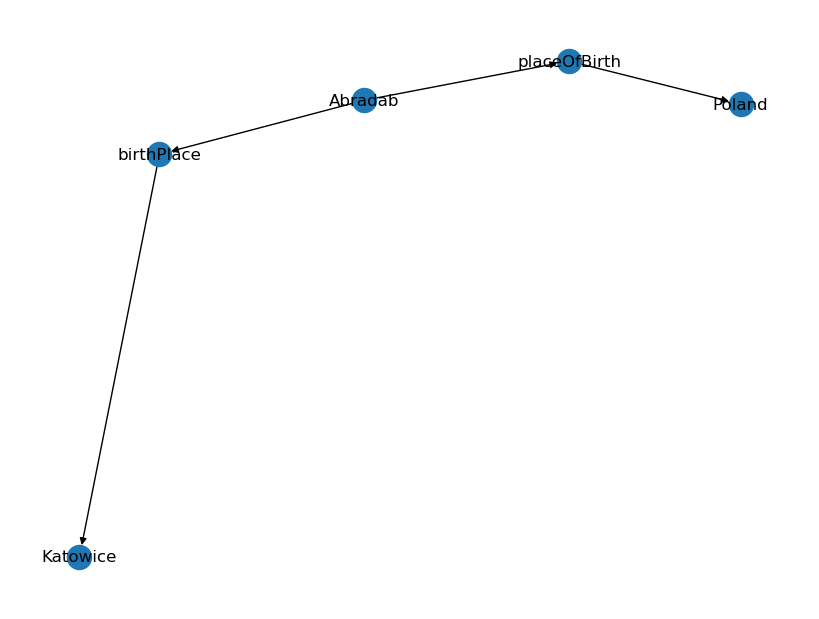

Decoded Input: 
 translate graph to text:  Abradab  birthPlace  Katowice  Abradab  placeOfBirth  Poland
Decoded Target: 
 Abradab was born in Katowice, Poland.
DataBatch(x=[1, 512], edge_index=[2, 4], attention_mask=[1, 512], y=[1, 512], batch=[512], ptr=[2])
Original Sample: 
 translate graph to text: <H> Ace_Wilder  <R>  genre  <T>  Hip_hop_music <H> Hip_hop_music  <R>  stylisticOrigin  <T>  Disco 
 Ace Wilder is an exponent of hip hop music, a style that originated from disco.
NetworkX Graph: 
 [('Ace_Wilder', 'genre', 0), ('genre', 'Hip_hop_music', 0), ('Hip_hop_music', 'stylisticOrigin', 0), ('stylisticOrigin', 'Disco', 0)]


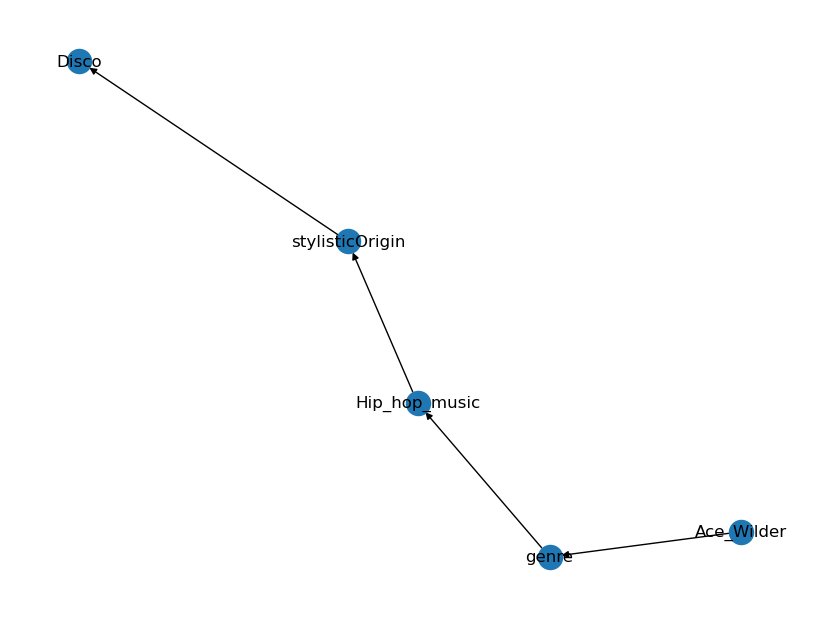

Decoded Input: 
 translate graph to text:  Ace_Wilder  genre  Hip_hop_music  Hip_hop_music  stylisticOrigin  Disco
Decoded Target: 
 Ace Wilder is an exponent of hip hop music, a style that originated from disco.
DataBatch(x=[1, 512], edge_index=[2, 4], attention_mask=[1, 512], y=[1, 512], batch=[512], ptr=[2])
Original Sample: 
 translate graph to text: <H> Ace_Wilder  <R>  recordLabel  <T>  Warner_Music_Group <H> Ace_Wilder  <R>  background  <T>  "solo_singer"@en 
 Ace Wilder has a background as a solo singer and is signed to the record label Warner Music Group.
NetworkX Graph: 
 [('Ace_Wilder', 'recordLabel', 0), ('Ace_Wilder', 'background', 0), ('recordLabel', 'Warner_Music_Group', 0), ('background', '"solo_singer"@en', 0)]


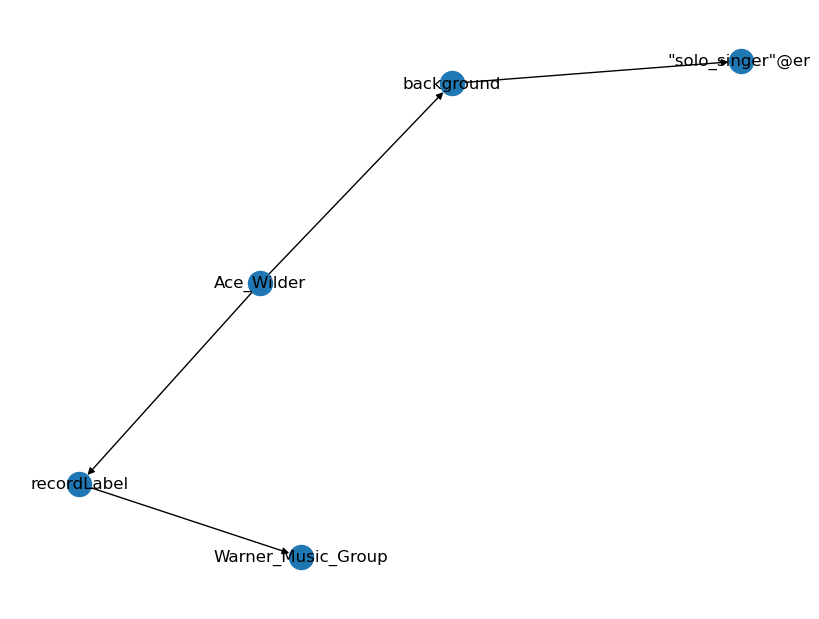

Decoded Input: 
 translate graph to text:  Ace_Wilder  recordLabel  Warner_Music_Group  Ace_Wilder  background  "solo_singer"@en
Decoded Target: 
 Ace Wilder has a background as a solo singer and is signed to the record label Warner Music Group.
DataBatch(x=[1, 512], edge_index=[2, 4], attention_mask=[1, 512], y=[1, 512], batch=[512], ptr=[2])
Original Sample: 
 translate graph to text: <H> Agustín_Barboza  <R>  birthPlace  <T>  Paraguay <H> Agustín_Barboza  <R>  recordLabel  <T>  Philips_Records 
 Born in Paraguay, Agustin Barboza is signed to Philips Records.
NetworkX Graph: 
 [('Agustín_Barboza', 'birthPlace', 0), ('Agustín_Barboza', 'recordLabel', 0), ('birthPlace', 'Paraguay', 0), ('recordLabel', 'Philips_Records', 0)]


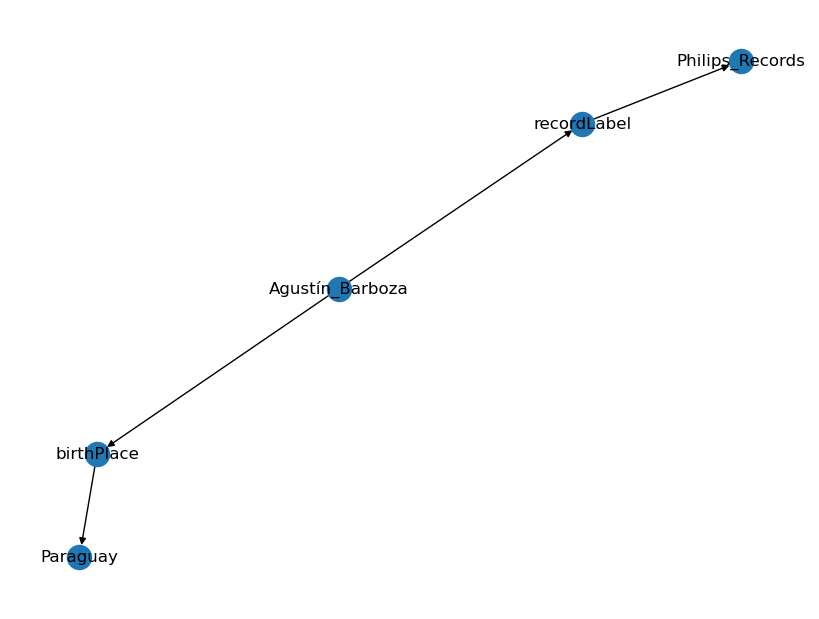

Decoded Input: 
 translate graph to text:  Agustn_Barboza  birthPlace  Paraguay  Agustn_Barboza  recordLabel  Philips_Records
Decoded Target: 
 Born in Paraguay, Agustin Barboza is signed to Philips Records.
DataBatch(x=[1, 512], edge_index=[2, 4], attention_mask=[1, 512], y=[1, 512], batch=[512], ptr=[2])
Original Sample: 
 translate graph to text: <H> Alan_Frew  <R>  genre  <T>  Rock_music <H> Rock_music  <R>  musicFusionGenre  <T>  Bhangra_(music) 
 Alan Frew is a rock musician, which includes fusion and Bhangra styles.
NetworkX Graph: 
 [('Alan_Frew', 'genre', 0), ('genre', 'Rock_music', 0), ('Rock_music', 'musicFusionGenre', 0), ('musicFusionGenre', 'Bhangra_', 0)]


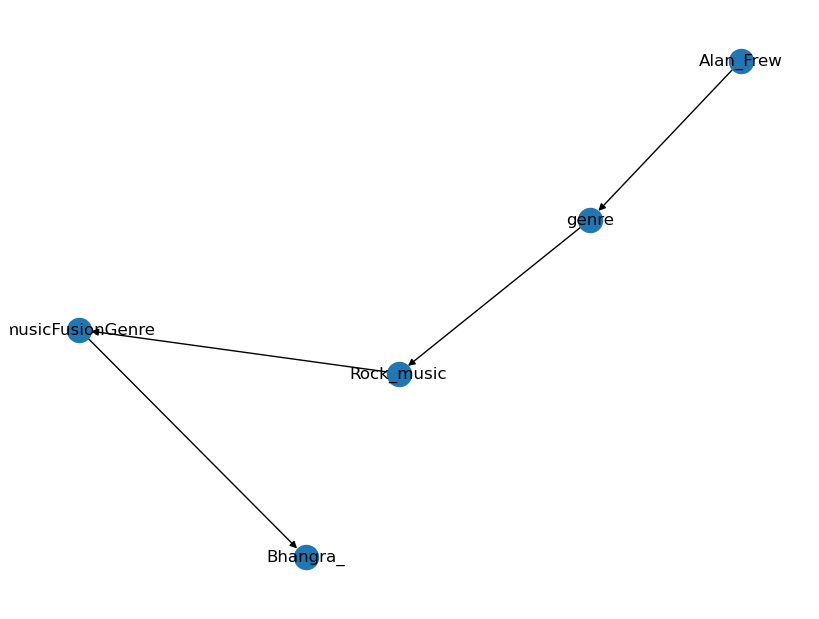

Decoded Input: 
 translate graph to text:  Alan_Frew  genre  Rock_music  Rock_music  musicFusionGenre  Bhangra_(music)
Decoded Target: 
 Alan Frew is a rock musician, which includes fusion and Bhangra styles.
DataBatch(x=[1, 512], edge_index=[2, 4], attention_mask=[1, 512], y=[1, 512], batch=[512], ptr=[2])
Original Sample: 
 translate graph to text: <H> Alan_Frew  <R>  genre  <T>  Rock_music <H> Rock_music  <R>  stylisticOrigin  <T>  Country_music 
 Alan Frew plays rock music, which originated from country music.
NetworkX Graph: 
 [('Alan_Frew', 'genre', 0), ('genre', 'Rock_music', 0), ('Rock_music', 'stylisticOrigin', 0), ('stylisticOrigin', 'Country_music', 0)]


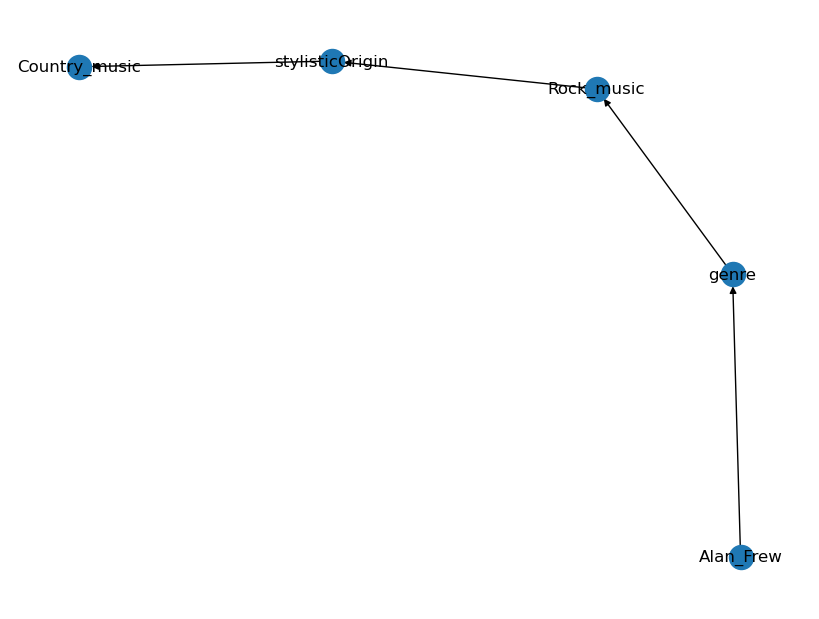

Decoded Input: 
 translate graph to text:  Alan_Frew  genre  Rock_music  Rock_music  stylisticOrigin  Country_music
Decoded Target: 
 Alan Frew plays rock music, which originated from country music.
DataBatch(x=[1, 512], edge_index=[2, 4], attention_mask=[1, 512], y=[1, 512], batch=[512], ptr=[2])
Original Sample: 
 translate graph to text: <H> Albennie_Jones  <R>  genre  <T>  Jazz <H> Jazz  <R>  stylisticOrigin  <T>  Blues 
 Jazz music originated from blues music. Albennie Jones is a jazz performer.
NetworkX Graph: 
 [('Albennie_Jones', 'genre', 0), ('genre', 'Jazz', 0), ('Jazz', 'stylisticOrigin', 0), ('stylisticOrigin', 'Blues', 0)]


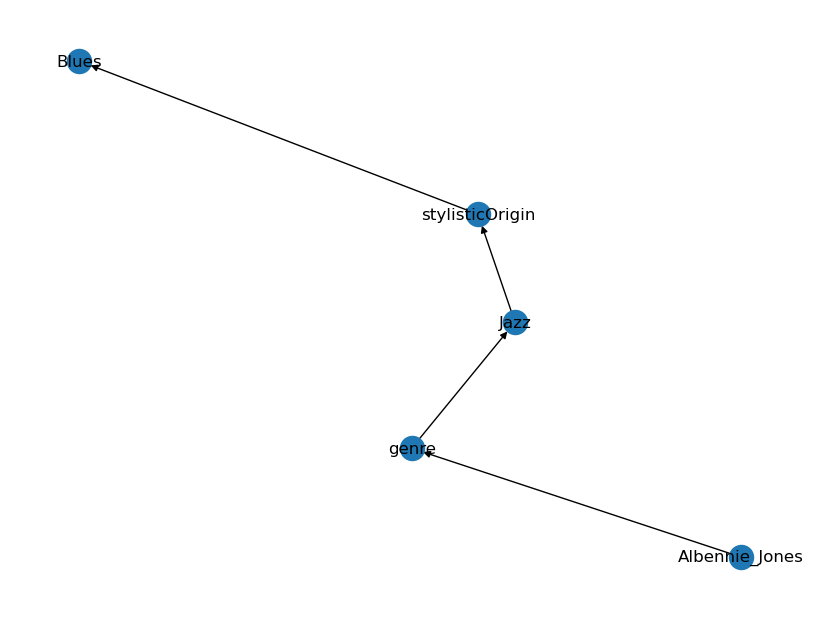

Decoded Input: 
 translate graph to text:  Albennie_Jones  genre  Jazz  Jazz  stylisticOrigin  Blues
Decoded Target: 
 Jazz music originated from blues music. Albennie Jones is a jazz performer.
DataBatch(x=[1, 512], edge_index=[2, 4], attention_mask=[1, 512], y=[1, 512], batch=[512], ptr=[2])
Original Sample: 
 translate graph to text: <H> Aleksandra_Kovač  <R>  genre  <T>  Pop_music <H> Aleksandra_Kovač  <R>  background  <T>  "solo_singer"@en 
 Aleksandra Kovac has been a solo singer , and a performer in the pop music genre.
NetworkX Graph: 
 [('Aleksandra_Kovač', 'genre', 0), ('Aleksandra_Kovač', 'background', 0), ('genre', 'Pop_music', 0), ('background', '"solo_singer"@en', 0)]


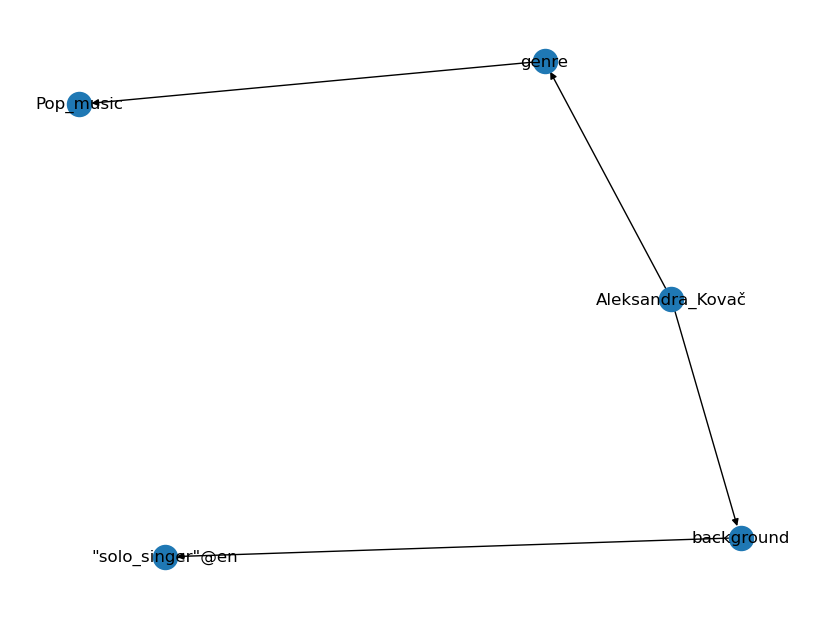

Decoded Input: 
 translate graph to text:  Aleksandra_Kova  genre  Pop_music  Aleksandra_Kova  background  "solo_singer"@en
Decoded Target: 
 Aleksandra Kovac has been a solo singer, and a performer in the pop music genre.
DataBatch(x=[1, 512], edge_index=[2, 4], attention_mask=[1, 512], y=[1, 512], batch=[512], ptr=[2])
Original Sample: 
 translate graph to text: <H> Aleksandra_Kovač  <R>  genre  <T>  Rhythm_and_blues <H> Rhythm_and_blues  <R>  stylisticOrigin  <T>  Blues 
 Aleksandra Kovac plays rhythm and blues, which originated from blues music.
NetworkX Graph: 
 [('Aleksandra_Kovač', 'genre', 0), ('genre', 'Rhythm_and_blues', 0), ('Rhythm_and_blues', 'stylisticOrigin', 0), ('stylisticOrigin', 'Blues', 0)]


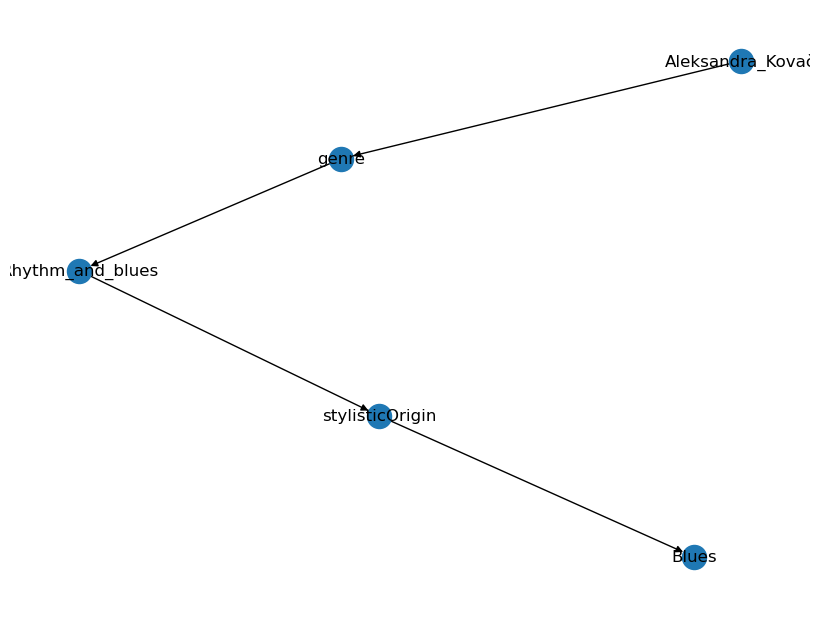

Decoded Input: 
 translate graph to text:  Aleksandra_Kova  genre  Rhythm_and_blues  Rhythm_and_blues  stylisticOrigin  Blues
Decoded Target: 
 Aleksandra Kovac plays rhythm and blues, which originated from blues music.
DataBatch(x=[1, 512], edge_index=[2, 4], attention_mask=[1, 512], y=[1, 512], batch=[512], ptr=[2])
Original Sample: 
 translate graph to text: <H> Aleksandra_Kovač  <R>  genre  <T>  Soul_music <H> Aleksandra_Kovač  <R>  activeYearsStartYear  <T>  "1990"^^xsd:gYear 
 Aleksandra Kovac stared in 1990 and she performs soul music.
NetworkX Graph: 
 [('Aleksandra_Kovač', 'genre', 0), ('Aleksandra_Kovač', 'activeYearsStartYear', 0), ('genre', 'Soul_music', 0), ('activeYearsStartYear', '"1990"^^xsd:gYear', 0)]


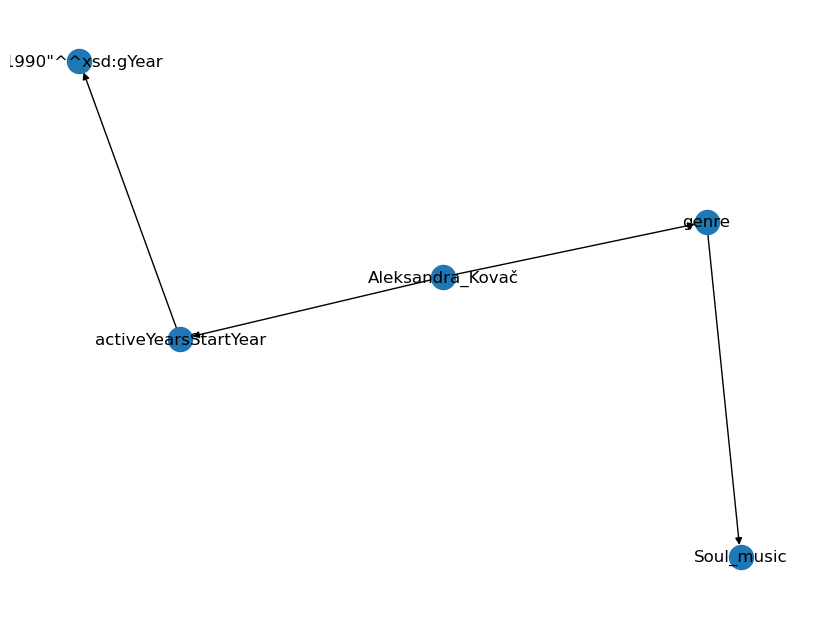

Decoded Input: 
 translate graph to text:  Aleksandra_Kova  genre  Soul_music  Aleksandra_Kova  activeYearsStartYear  "1990"xsd:gYear
Decoded Target: 
 Aleksandra Kovac stared in 1990 and she performs soul music.
DataBatch(x=[1, 512], edge_index=[2, 4], attention_mask=[1, 512], y=[1, 512], batch=[512], ptr=[2])
Original Sample: 
 translate graph to text: <H> Alex_Day  <R>  genre  <T>  Synthpop <H> Synthpop  <R>  stylisticOrigin  <T>  New_wave_music 
 Alex Day plays Synthpop, which originated from new wave music.
NetworkX Graph: 
 [('Alex_Day', 'genre', 0), ('genre', 'Synthpop', 0), ('Synthpop', 'stylisticOrigin', 0), ('stylisticOrigin', 'New_wave_music', 0)]


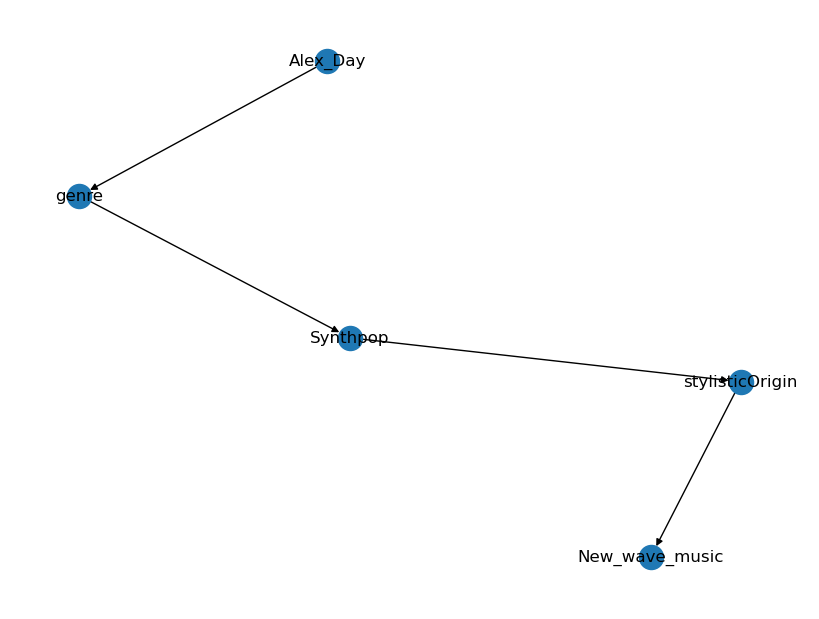

Decoded Input: 
 translate graph to text:  Alex_Day  genre  Synthpop  Synthpop  stylisticOrigin  New_wave_music
Decoded Target: 
 Alex Day plays Synthpop, which originated from new wave music.
DataBatch(x=[1, 512], edge_index=[2, 4], attention_mask=[1, 512], y=[1, 512], batch=[512], ptr=[2])
Original Sample: 
 translate graph to text: <H> Alfred_Garth_Jones  <R>  birthPlace  <T>  England <H> Alfred_Garth_Jones  <R>  birthYear  <T>  "1872"^^xsd:gYear 
 Alfred Garth Jones was in England in 1872.
NetworkX Graph: 
 [('Alfred_Garth_Jones', 'birthPlace', 0), ('Alfred_Garth_Jones', 'birthYear', 0), ('birthPlace', 'England', 0), ('birthYear', '"1872"^^xsd:gYear', 0)]


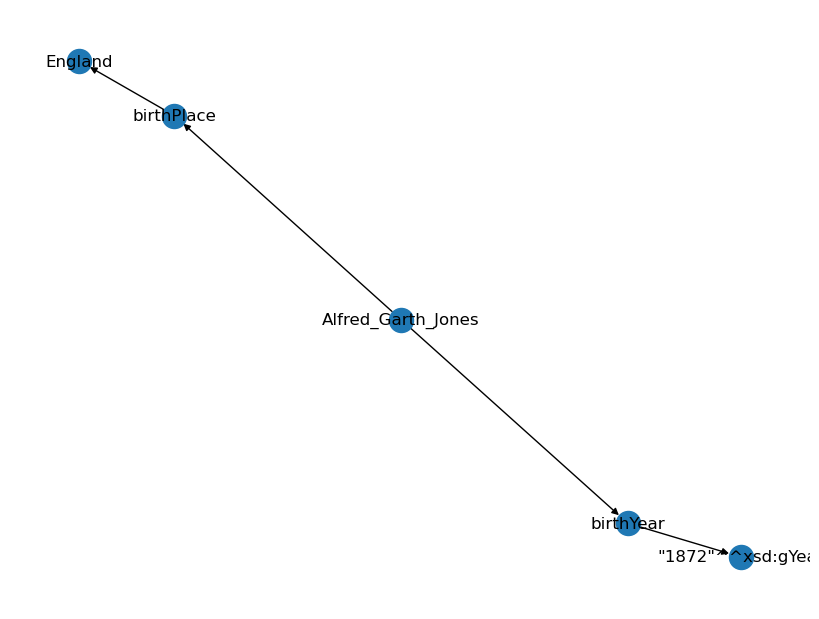

Decoded Input: 
 translate graph to text:  Alfred_Garth_Jones  birthPlace  England  Alfred_Garth_Jones  birthYear  "1872"xsd:gYear
Decoded Target: 
 Alfred Garth Jones was in England in 1872.
DataBatch(x=[1, 512], edge_index=[2, 4], attention_mask=[1, 512], y=[1, 512], batch=[512], ptr=[2])
Original Sample: 
 translate graph to text: <H> Alfredo_Zitarrosa  <R>  genre  <T>  Milonga_(music) <H> Alfredo_Zitarrosa  <R>  background  <T>  "solo_singer"@en 
 The musical genre of Alfredo Zitarrosa, who started out as a solo singer, is Milonga.
NetworkX Graph: 
 [('Alfredo_Zitarrosa', 'genre', 0), ('Alfredo_Zitarrosa', 'background', 0), ('genre', 'Milonga_', 0), ('background', '"solo_singer"@en', 0)]


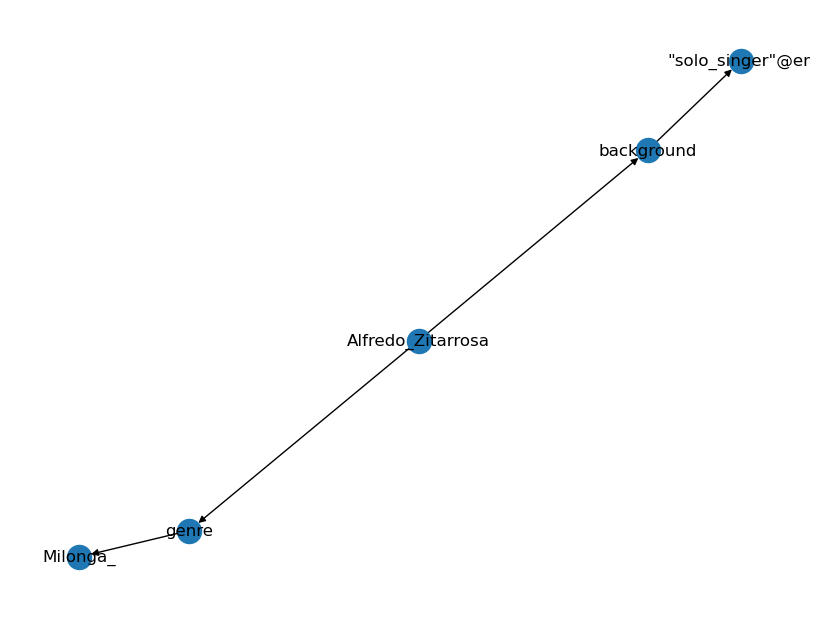

Decoded Input: 
 translate graph to text:  Alfredo_Zitarrosa  genre  Milonga_(music)  Alfredo_Zitarrosa  background  "solo_singer"@en
Decoded Target: 
 The musical genre of Alfredo Zitarrosa, who started out as a solo singer, is Milonga.
DataBatch(x=[1, 512], edge_index=[2, 4], attention_mask=[1, 512], y=[1, 512], batch=[512], ptr=[2])
Original Sample: 
 translate graph to text: <H> Alfredo_Zitarrosa  <R>  genre  <T>  Taquirari <H> Alfredo_Zitarrosa  <R>  background  <T>  "solo_singer"@en 
 Alfredo Zitarrosa, whose background was as a solo singer, is a performer of Taquirari.
NetworkX Graph: 
 [('Alfredo_Zitarrosa', 'genre', 0), ('Alfredo_Zitarrosa', 'background', 0), ('genre', 'Taquirari', 0), ('background', '"solo_singer"@en', 0)]


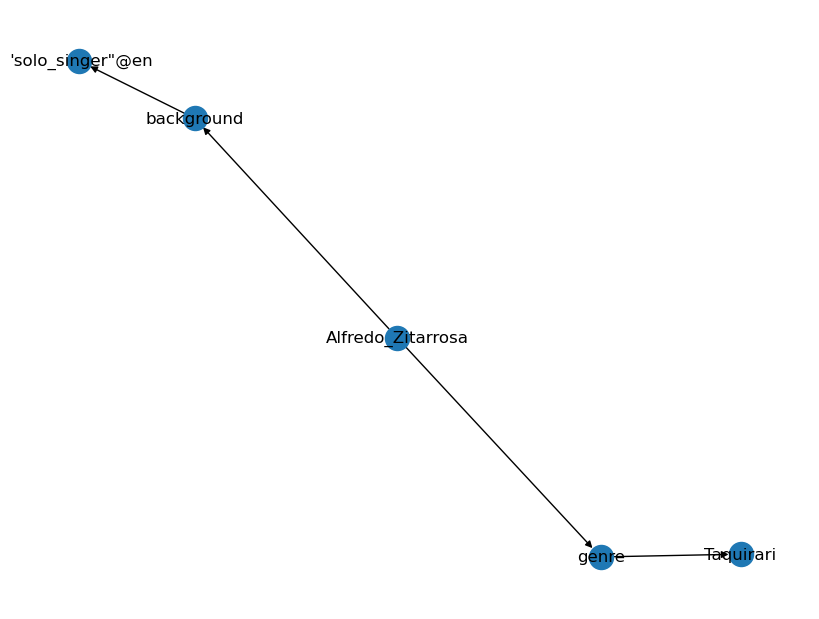

Decoded Input: 
 translate graph to text:  Alfredo_Zitarrosa  genre  Taquirari  Alfredo_Zitarrosa  background  "solo_singer"@en
Decoded Target: 
 Alfredo Zitarrosa, whose background was as a solo singer, is a performer of Taquirari.
DataBatch(x=[1, 512], edge_index=[2, 4], attention_mask=[1, 512], y=[1, 512], batch=[512], ptr=[2])
Original Sample: 
 translate graph to text: <H> Alfredo_Zitarrosa  <R>  birthPlace  <T>  Uruguay <H> Alfredo_Zitarrosa  <R>  deathPlace  <T>  Montevideo 
 Alfredo Zitarrosa, was born in Uruguay and died in Montevideo.
NetworkX Graph: 
 [('Alfredo_Zitarrosa', 'birthPlace', 0), ('Alfredo_Zitarrosa', 'deathPlace', 0), ('birthPlace', 'Uruguay', 0), ('deathPlace', 'Montevideo', 0)]


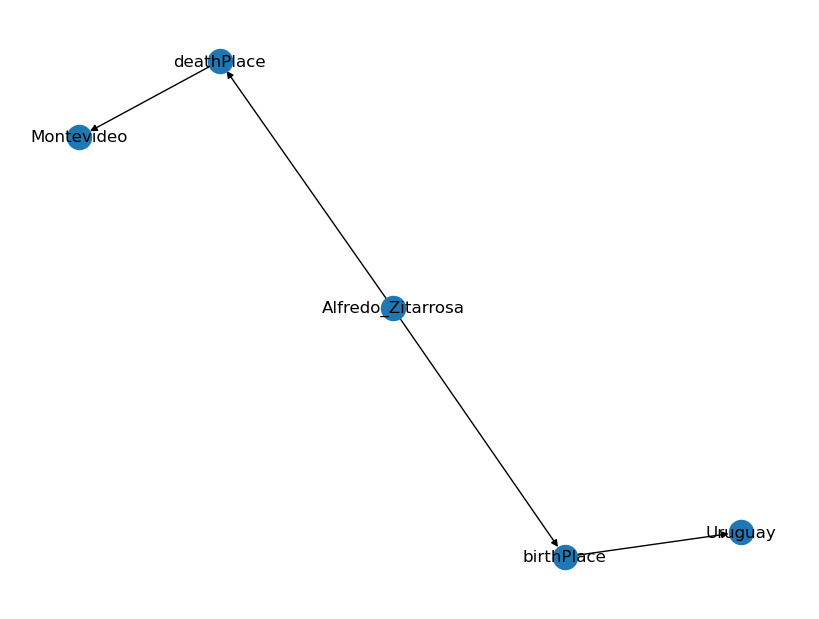

Decoded Input: 
 translate graph to text:  Alfredo_Zitarrosa  birthPlace  Uruguay  Alfredo_Zitarrosa  deathPlace  Montevideo
Decoded Target: 
 Alfredo Zitarrosa, was born in Uruguay and died in Montevideo.
DataBatch(x=[1, 512], edge_index=[2, 4], attention_mask=[1, 512], y=[1, 512], batch=[512], ptr=[2])
Original Sample: 
 translate graph to text: <H> Alfredo_Zitarrosa  <R>  deathPlace  <T>  Uruguay <H> Alfredo_Zitarrosa  <R>  birthPlace  <T>  Montevideo 
 Alfredo Zitarrosa was born in Montevideo and died in Uruguay.
NetworkX Graph: 
 [('Alfredo_Zitarrosa', 'deathPlace', 0), ('Alfredo_Zitarrosa', 'birthPlace', 0), ('deathPlace', 'Uruguay', 0), ('birthPlace', 'Montevideo', 0)]


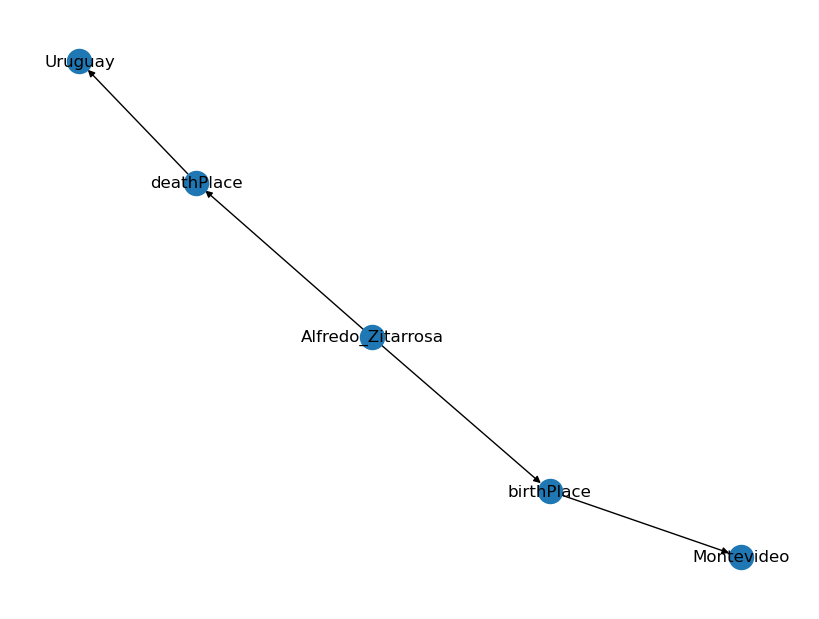

Decoded Input: 
 translate graph to text:  Alfredo_Zitarrosa  deathPlace  Uruguay  Alfredo_Zitarrosa  birthPlace  Montevideo
Decoded Target: 
 Alfredo Zitarrosa was born in Montevideo and died in Uruguay.
DataBatch(x=[1, 512], edge_index=[2, 4], attention_mask=[1, 512], y=[1, 512], batch=[512], ptr=[2])
Original Sample: 
 translate graph to text: <H> Alfredo_Zitarrosa  <R>  background  <T>  "solo_singer" <H> Alfredo_Zitarrosa  <R>  genre  <T>  Zamba_(artform) 
 Alfredo Zitarrosa's genre is Zamba which is considered an art form and he started out as a solo singer.
NetworkX Graph: 
 [('Alfredo_Zitarrosa', 'background', 0), ('Alfredo_Zitarrosa', 'genre', 0), ('background', '"solo_singer"', 0), ('genre', 'Zamba_', 0)]


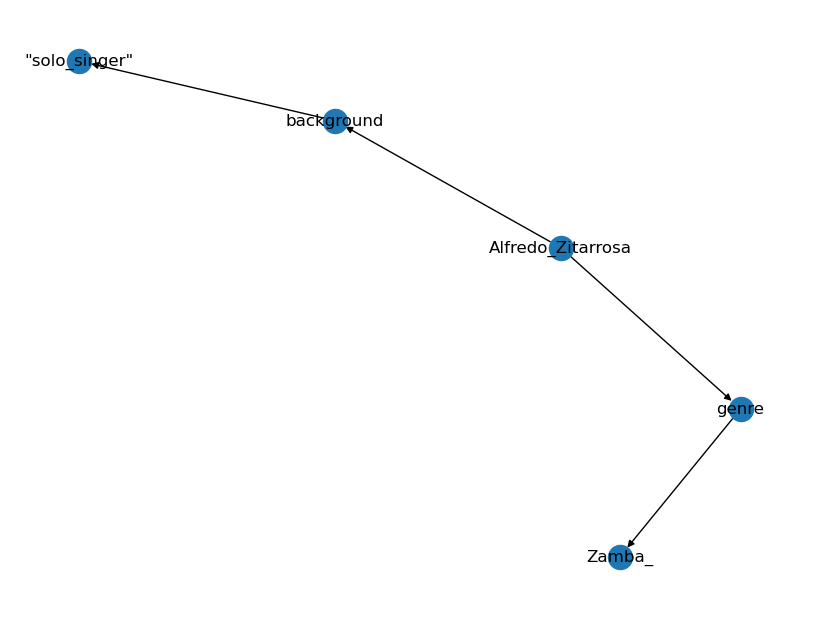

Decoded Input: 
 translate graph to text:  Alfredo_Zitarrosa  background  "solo_singer"  Alfredo_Zitarrosa  genre  Zamba_(artform)
Decoded Target: 
 Alfredo Zitarrosa's genre is Zamba which is considered an art form and he started out as a solo singer.
DataBatch(x=[1, 512], edge_index=[2, 4], attention_mask=[1, 512], y=[1, 512], batch=[512], ptr=[2])
Original Sample: 
 translate graph to text: <H> Alison_O'Donnell  <R>  associatedBand  <T>  Plastik_Mak <H> Alison_O'Donnell  <R>  associatedMusicalArtist  <T>  Bajik 
 Alison O'Donnell is a musician associated with the Plastik Mak and was also associated with the band Bajik.
NetworkX Graph: 
 [("Alison_O'Donnell", 'associatedBand', 0), ("Alison_O'Donnell", 'associatedMusicalArtist', 0), ('associatedBand', 'Plastik_Mak', 0), ('associatedMusicalArtist', 'Bajik', 0)]


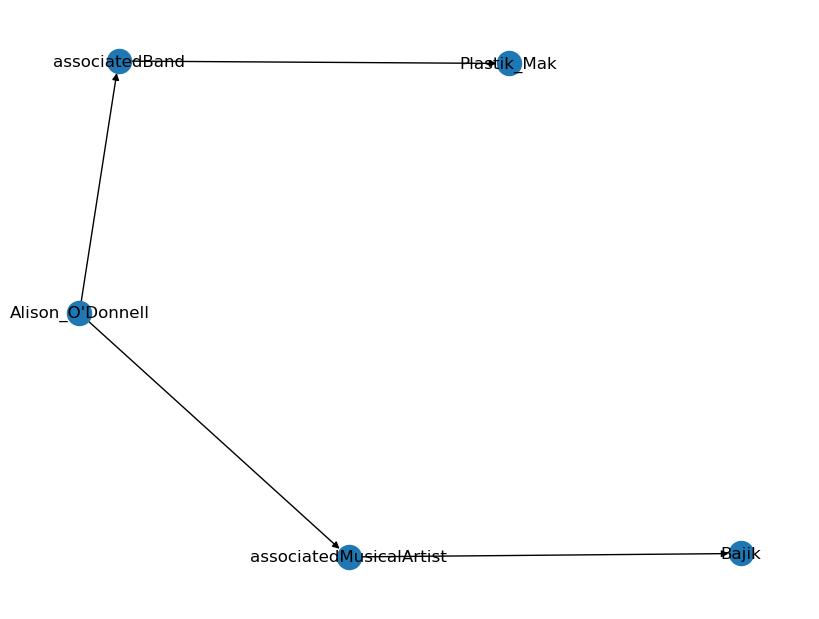

Decoded Input: 
 translate graph to text:  Alison_O'Donnell  associatedBand  Plastik_Mak  Alison_O'Donnell  associatedMusicalArtist  Bajik
Decoded Target: 
 Alison O'Donnell is a musician associated with the Plastik Mak and was also associated with the band Bajik.
DataBatch(x=[1, 512], edge_index=[2, 4], attention_mask=[1, 512], y=[1, 512], batch=[512], ptr=[2])
Original Sample: 
 translate graph to text: <H> Alison_O'Donnell  <R>  genre  <T>  Folk_rock <H> Alison_O'Donnell  <R>  recordLabel  <T>  Floating_World_Records 
 Alison O'Donnell is a folk rock musician signed to Floating World Records.
NetworkX Graph: 
 [("Alison_O'Donnell", 'genre', 0), ("Alison_O'Donnell", 'recordLabel', 0), ('genre', 'Folk_rock', 0), ('recordLabel', 'Floating_World_Records', 0)]


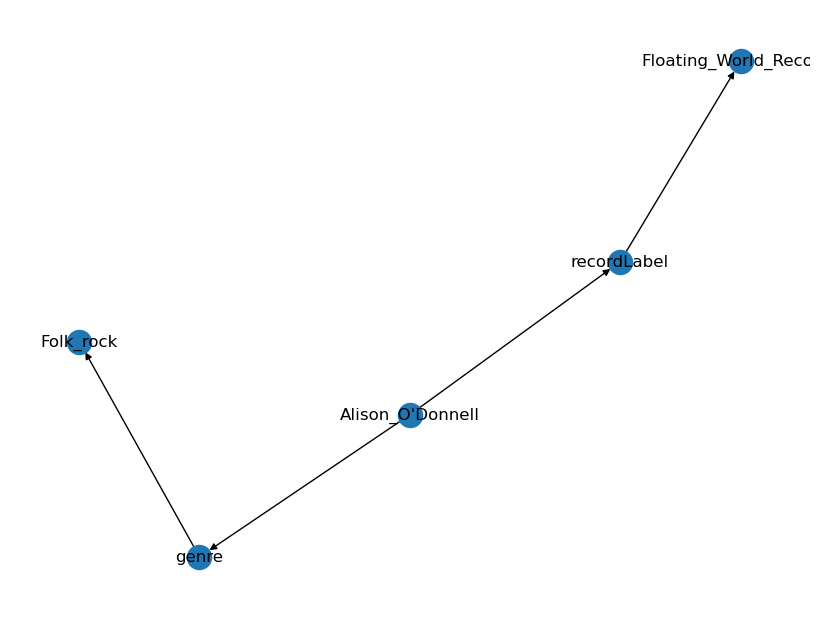

Decoded Input: 
 translate graph to text:  Alison_O'Donnell  genre  Folk_rock  Alison_O'Donnell  recordLabel  Floating_World_Records
Decoded Target: 
 Alison O'Donnell is a folk rock musician signed to Floating World Records.
DataBatch(x=[1, 512], edge_index=[2, 4], attention_mask=[1, 512], y=[1, 512], batch=[512], ptr=[2])
Original Sample: 
 translate graph to text: <H> Alison_O'Donnell  <R>  genre  <T>  Jazz <H> Alison_O'Donnell  <R>  instrument  <T>  "Voice, bodhrán, percussion, autoharp"@en 
 Alison O'Donnell is a jazz musician who sings and also plays the bodhran, percussion and the autoharp.
NetworkX Graph: 
 [("Alison_O'Donnell", 'genre', 0), ("Alison_O'Donnell", 'instrument', 0), ('genre', 'Jazz', 0), ('instrument', '"Voice, bodhrán, percussion, autoharp"@en', 0)]


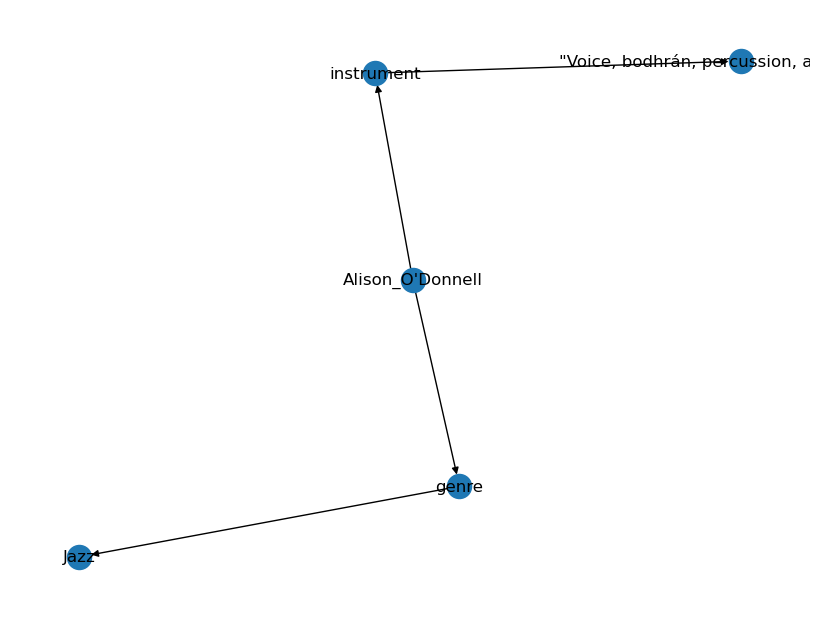

Decoded Input: 
 translate graph to text:  Alison_O'Donnell  genre  Jazz  Alison_O'Donnell  instrument  "Voice, bodhrán, percussion, autoharp"@en
Decoded Target: 
 Alison O'Donnell is a jazz musician who sings and also plays the bodhran, percussion and the autoharp.
DataBatch(x=[1, 512], edge_index=[2, 4], attention_mask=[1, 512], y=[1, 512], batch=[512], ptr=[2])
Original Sample: 
 translate graph to text: <H> Allen_Forrest  <R>  genre  <T>  Hip_hop_music <H> Allen_Forrest  <R>  background  <T>  "solo_singer" 
 Hip Hop artist Allen Forrest is a solo singer.
NetworkX Graph: 
 [('Allen_Forrest', 'genre', 0), ('Allen_Forrest', 'background', 0), ('genre', 'Hip_hop_music', 0), ('background', '"solo_singer"', 0)]


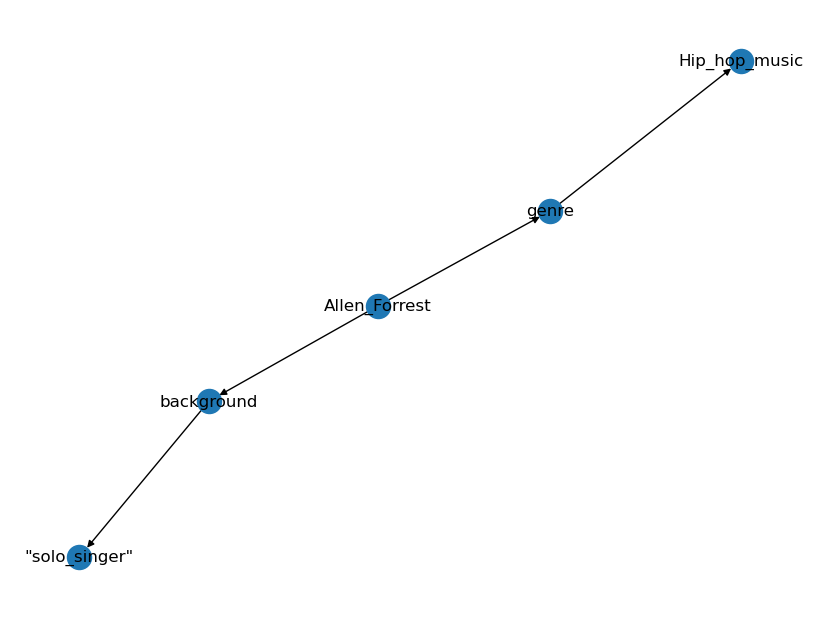

Decoded Input: 
 translate graph to text:  Allen_Forrest  genre  Hip_hop_music  Allen_Forrest  background  "solo_singer"
Decoded Target: 
 Hip Hop artist Allen Forrest is a solo singer.
DataBatch(x=[1, 512], edge_index=[2, 4], attention_mask=[1, 512], y=[1, 512], batch=[512], ptr=[2])
Original Sample: 
 translate graph to text: <H> Alternative_rock  <R>  musicSubgenre  <T>  Christian_alternative_rock <H> Andrew_White_(musician)  <R>  genre  <T>  Alternative_rock 
 The musician Andrew White's genre is alternative rock, the genre which has the sub genre Christian alternative rock.
NetworkX Graph: 
 [('Alternative_rock', 'musicSubgenre', 0), ('musicSubgenre', 'Christian_alternative_rock', 0), ('Andrew_White_', 'genre', 0), ('genre', 'Alternative_rock', 0)]


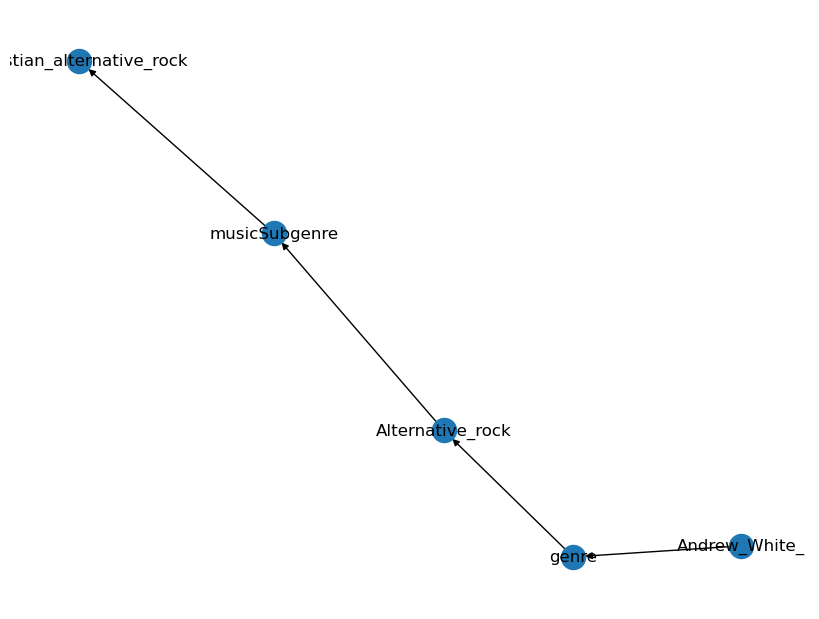

Decoded Input: 
 translate graph to text:  Alternative_rock  musicSubgenre  Christian_alternative_rock  Andrew_White_(musician)  genre  Alternative_rock
Decoded Target: 
 The musician Andrew White's genre is alternative rock, the genre which has the sub genre Christian alternative rock.
DataBatch(x=[1, 512], edge_index=[2, 4], attention_mask=[1, 512], y=[1, 512], batch=[512], ptr=[2])
Original Sample: 
 translate graph to text: <H> Anders_Osborne  <R>  associatedBand  <T>  Phil_Lesh_and_Friends <H> Anders_Osborne  <R>  associatedMusicalArtist  <T>  Tab_Benoit 
 Anders Osborne is associated with Phil Lesh and Friends and he has worked with Tab Benoit.
NetworkX Graph: 
 [('Anders_Osborne', 'associatedBand', 0), ('Anders_Osborne', 'associatedMusicalArtist', 0), ('associatedBand', 'Phil_Lesh_and_Friends', 0), ('associatedMusicalArtist', 'Tab_Benoit', 0)]


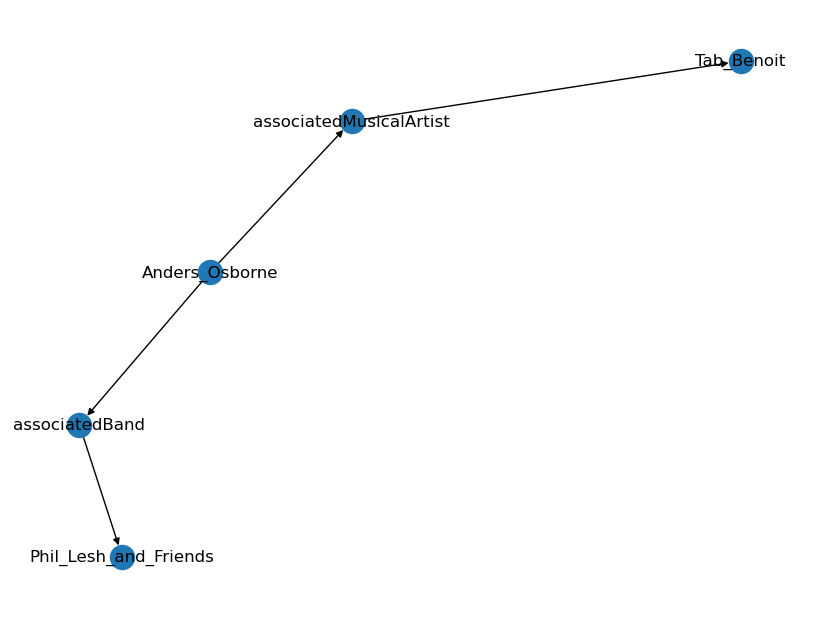

Decoded Input: 
 translate graph to text:  Anders_Osborne  associatedBand  Phil_Lesh_and_Friends  Anders_Osborne  associatedMusicalArtist  Tab_Benoit
Decoded Target: 
 Anders Osborne is associated with Phil Lesh and Friends and he has worked with Tab Benoit.
DataBatch(x=[1, 512], edge_index=[2, 4], attention_mask=[1, 512], y=[1, 512], batch=[512], ptr=[2])
Original Sample: 
 translate graph to text: <H> Anders_Osborne  <R>  genre  <T>  Rhythm_and_blues <H> Anders_Osborne  <R>  recordLabel  <T>  Rabadash_Records 
 Rhythm and blues artist Anders Osborne is signed with Rabadash Records.
NetworkX Graph: 
 [('Anders_Osborne', 'genre', 0), ('Anders_Osborne', 'recordLabel', 0), ('genre', 'Rhythm_and_blues', 0), ('recordLabel', 'Rabadash_Records', 0)]


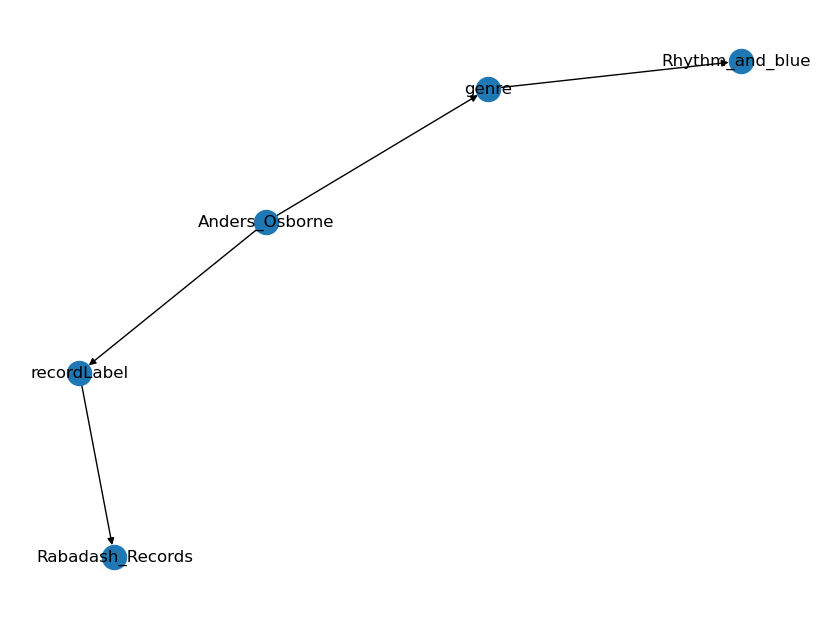

Decoded Input: 
 translate graph to text:  Anders_Osborne  genre  Rhythm_and_blues  Anders_Osborne  recordLabel  Rabadash_Records
Decoded Target: 
 Rhythm and blues artist Anders Osborne is signed with Rabadash Records.
DataBatch(x=[1, 512], edge_index=[2, 4], attention_mask=[1, 512], y=[1, 512], batch=[512], ptr=[2])
Original Sample: 
 translate graph to text: <H> Anders_Osborne  <R>  genre  <T>  Rhythm_and_blues <H> Anders_Osborne  <R>  recordLabel  <T>  Shanachie_Records 
 Rhythm and blues artist Anders Osborne performs under the Shanachie Records label.
NetworkX Graph: 
 [('Anders_Osborne', 'genre', 0), ('Anders_Osborne', 'recordLabel', 0), ('genre', 'Rhythm_and_blues', 0), ('recordLabel', 'Shanachie_Records', 0)]


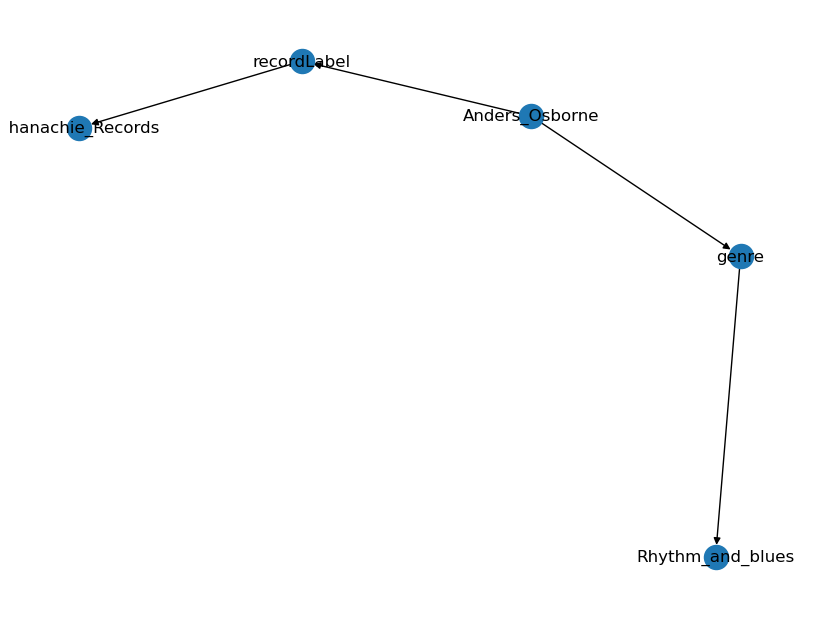

Decoded Input: 
 translate graph to text:  Anders_Osborne  genre  Rhythm_and_blues  Anders_Osborne  recordLabel  Shanachie_Records
Decoded Target: 
 Rhythm and blues artist Anders Osborne performs under the Shanachie Records label.
DataBatch(x=[1, 512], edge_index=[2, 4], attention_mask=[1, 512], y=[1, 512], batch=[512], ptr=[2])
Original Sample: 
 translate graph to text: <H> Andra_(singer)  <R>  genre  <T>  Pop_music <H> Andra_(singer)  <R>  activeYearsStartYear  <T>  "2000"^^xsd:gYear 
 Andra began her Pop music singing career in 2000.
NetworkX Graph: 
 [('Andra_', 'genre', 0), ('Andra_', 'activeYearsStartYear', 0), ('genre', 'Pop_music', 0), ('activeYearsStartYear', '"2000"^^xsd:gYear', 0)]


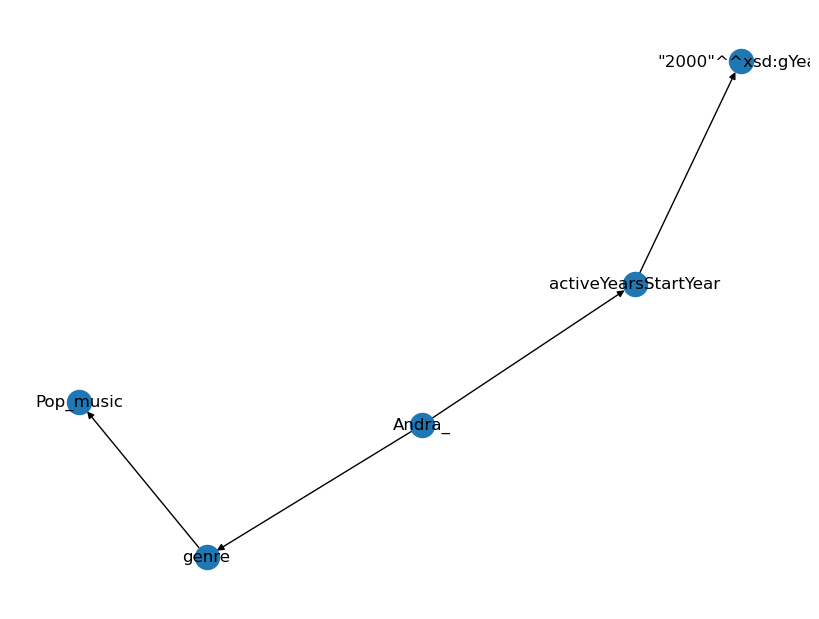

Decoded Input: 
 translate graph to text:  Andra_(singer)  genre  Pop_music  Andra_(singer)  activeYearsStartYear  "2000"xsd:gYear
Decoded Target: 
 Andra began her Pop music singing career in 2000.
DataBatch(x=[1, 512], edge_index=[2, 4], attention_mask=[1, 512], y=[1, 512], batch=[512], ptr=[2])
Original Sample: 
 translate graph to text: <H> Andra_(singer)  <R>  genre  <T>  Rhythm_and_blues <H> Rhythm_and_blues  <R>  stylisticOrigin  <T>  Blues 
 Andra sings rhythm and blues, which originated from blues.
NetworkX Graph: 
 [('Andra_', 'genre', 0), ('genre', 'Rhythm_and_blues', 0), ('Rhythm_and_blues', 'stylisticOrigin', 0), ('stylisticOrigin', 'Blues', 0)]


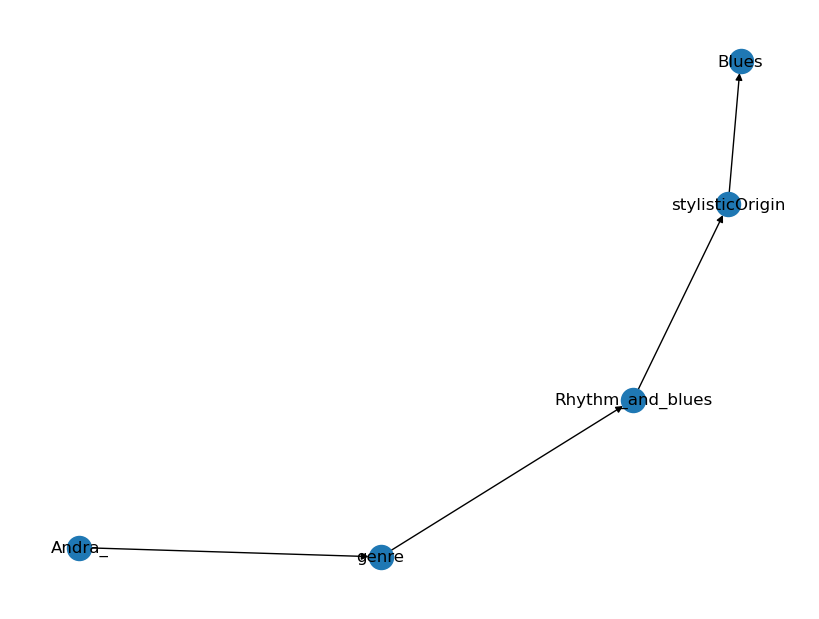

Decoded Input: 
 translate graph to text:  Andra_(singer)  genre  Rhythm_and_blues  Rhythm_and_blues  stylisticOrigin  Blues
Decoded Target: 
 Andra sings rhythm and blues, which originated from blues.
DataBatch(x=[1, 512], edge_index=[2, 4], attention_mask=[1, 512], y=[1, 512], batch=[512], ptr=[2])
Original Sample: 
 translate graph to text: <H> Andrew_Rayel  <R>  associatedMusicalArtist  <T>  Jonathan_Mendelsohn <H> Andrew_Rayel  <R>  associatedBand  <T>  Christian_Burns 
 Andrew Rayel, is associated with musical artist Jonathan Mendelsohn and Christian Burns.
NetworkX Graph: 
 [('Andrew_Rayel', 'associatedMusicalArtist', 0), ('Andrew_Rayel', 'associatedBand', 0), ('associatedMusicalArtist', 'Jonathan_Mendelsohn', 0), ('associatedBand', 'Christian_Burns', 0)]


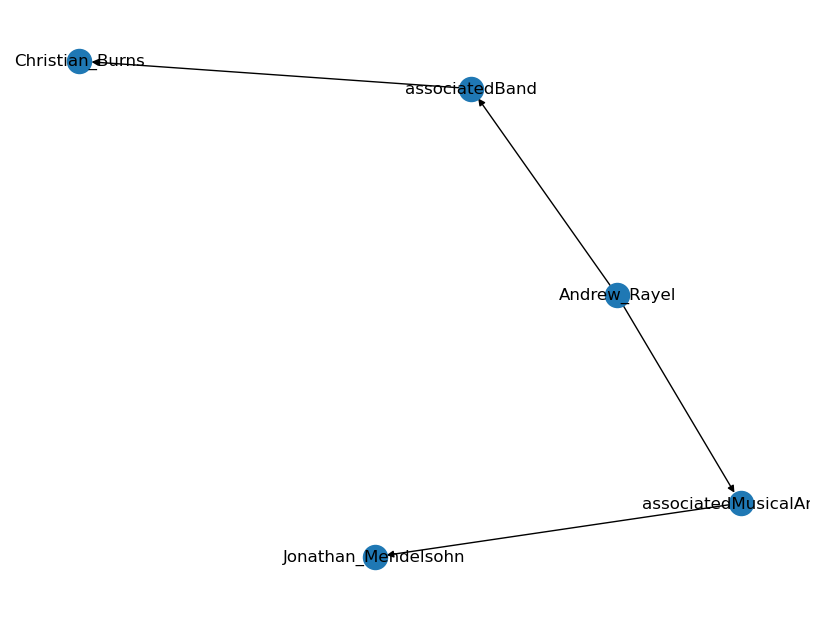

Decoded Input: 
 translate graph to text:  Andrew_Rayel  associatedMusicalArtist  Jonathan_Mendelsohn  Andrew_Rayel  associatedBand  Christian_Burns
Decoded Target: 
 Andrew Rayel, is associated with musical artist Jonathan Mendelsohn and Christian Burns.
DataBatch(x=[1, 512], edge_index=[2, 4], attention_mask=[1, 512], y=[1, 512], batch=[512], ptr=[2])
Original Sample: 
 translate graph to text: <H> Andrew_Rayel  <R>  associatedBand  <T>  Jonathan_Mendelsohn <H> Andrew_Rayel  <R>  associatedMusicalArtist  <T>  Mark_Sixma 
 Andrew Rayel is associated with both musical artist Jonathan Mendelsohn and Mark Sixma.
NetworkX Graph: 
 [('Andrew_Rayel', 'associatedBand', 0), ('Andrew_Rayel', 'associatedMusicalArtist', 0), ('associatedBand', 'Jonathan_Mendelsohn', 0), ('associatedMusicalArtist', 'Mark_Sixma', 0)]


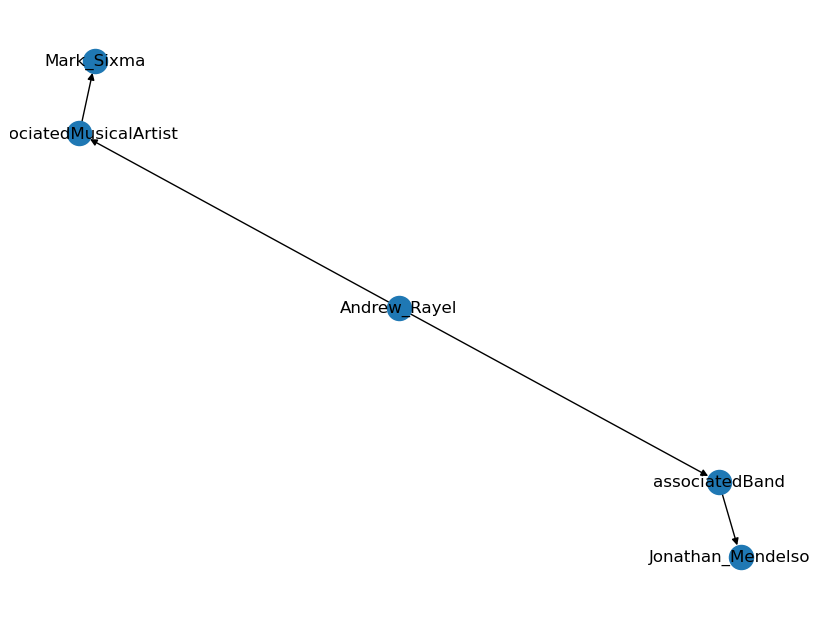

Decoded Input: 
 translate graph to text:  Andrew_Rayel  associatedBand  Jonathan_Mendelsohn  Andrew_Rayel  associatedMusicalArtist  Mark_Sixma
Decoded Target: 
 Andrew Rayel is associated with both musical artist Jonathan Mendelsohn and Mark Sixma.
DataBatch(x=[1, 512], edge_index=[2, 4], attention_mask=[1, 512], y=[1, 512], batch=[512], ptr=[2])
Original Sample: 
 translate graph to text: <H> Andrew_Rayel  <R>  associatedMusicalArtist  <T>  Jwaydan_Moyine <H> Andrew_Rayel  <R>  associatedBand  <T>  Armin_van_Buuren 
 Andrew Rayel is associated with both the musician Jwaydan Moyine and Armin van Buuren.
NetworkX Graph: 
 [('Andrew_Rayel', 'associatedMusicalArtist', 0), ('Andrew_Rayel', 'associatedBand', 0), ('associatedMusicalArtist', 'Jwaydan_Moyine', 0), ('associatedBand', 'Armin_van_Buuren', 0)]


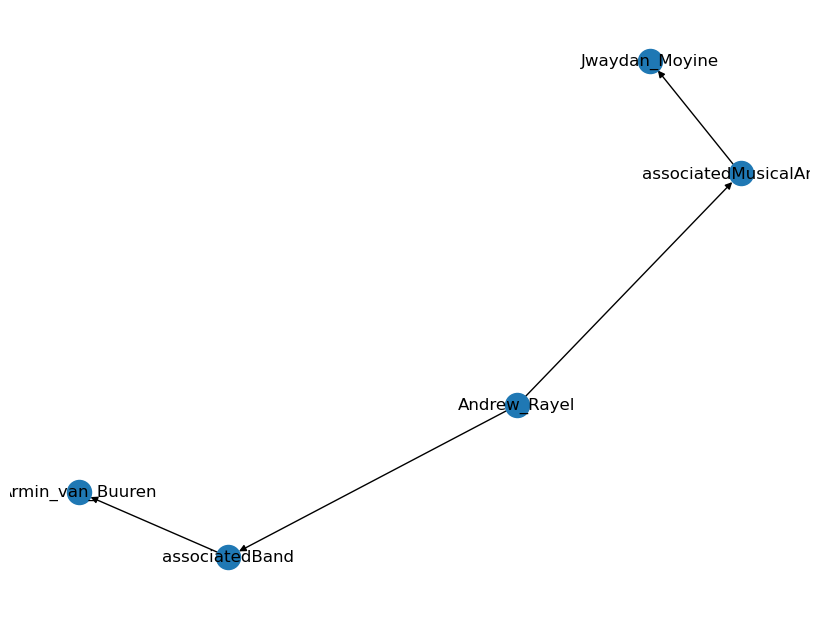

Decoded Input: 
 translate graph to text:  Andrew_Rayel  associatedMusicalArtist  Jwaydan_Moyine  Andrew_Rayel  associatedBand  Armin_van_Buuren
Decoded Target: 
 Andrew Rayel is associated with both the musician Jwaydan Moyine and Armin van Buuren.
DataBatch(x=[1, 512], edge_index=[2, 4], attention_mask=[1, 512], y=[1, 512], batch=[512], ptr=[2])
Original Sample: 
 translate graph to text: <H> Andrew_White_(musician)  <R>  genre  <T>  Alternative_rock <H> Alternative_rock  <R>  stylisticOrigins  <T>  New_wave_music 
 The musician Andrew White's genre is alternative rock which has origins in New wave music.
NetworkX Graph: 
 [('Andrew_White_', 'genre', 0), ('genre', 'Alternative_rock', 0), ('Alternative_rock', 'stylisticOrigins', 0), ('stylisticOrigins', 'New_wave_music', 0)]


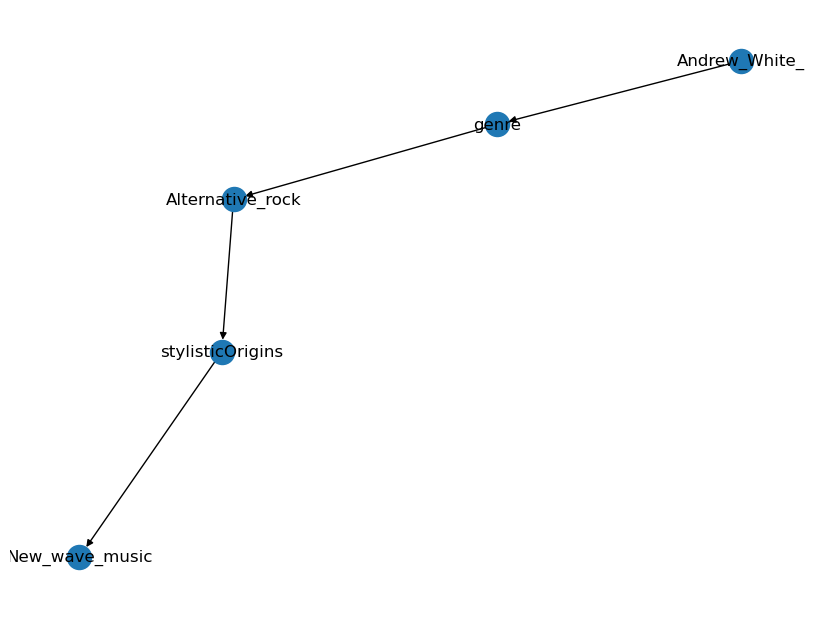

Decoded Input: 
 translate graph to text:  Andrew_White_(musician)  genre  Alternative_rock  Alternative_rock  stylisticOrigins  New_wave_music
Decoded Target: 
 The musician Andrew White's genre is alternative rock which has origins in New wave music.
DataBatch(x=[1, 512], edge_index=[2, 4], attention_mask=[1, 512], y=[1, 512], batch=[512], ptr=[2])
Original Sample: 
 translate graph to text: <H> Country_music  <R>  instrument  <T>  Banjo <H> Al_Anderson_(NRBQ)  <R>  genre  <T>  Country_music 
 Al Anderson of NRBQ is a country musician in which genre the banjo features.
NetworkX Graph: 
 [('Country_music', 'instrument', 0), ('instrument', 'Banjo', 0), ('Al_Anderson_', 'genre', 0), ('genre', 'Country_music', 0)]


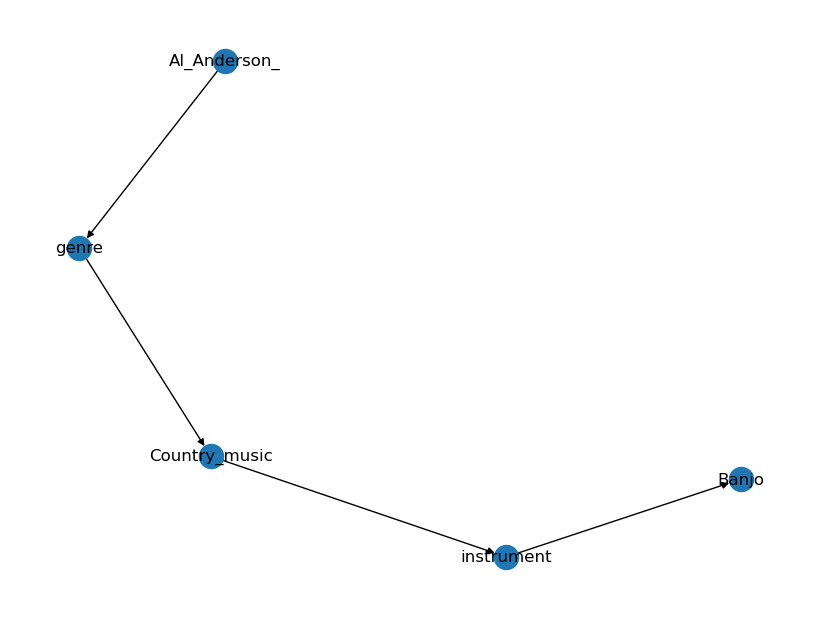

Decoded Input: 
 translate graph to text:  Country_music  instrument  Banjo  Al_Anderson_(NRBQ)  genre  Country_music
Decoded Target: 
 Al Anderson of NRBQ is a country musician in which genre the banjo features.
DataBatch(x=[1, 512], edge_index=[2, 4], attention_mask=[1, 512], y=[1, 512], batch=[512], ptr=[2])
Original Sample: 
 translate graph to text: <H> Polydor_Records  <R>  location  <T>  London <H> Andrew_White_(musician)  <R>  label  <T>  Polydor_Records 
 Andrew White records under label Polydor Records, who are based in London.
NetworkX Graph: 
 [('Polydor_Records', 'location', 0), ('location', 'London', 0), ('Andrew_White_', 'label', 0), ('label', 'Polydor_Records', 0)]


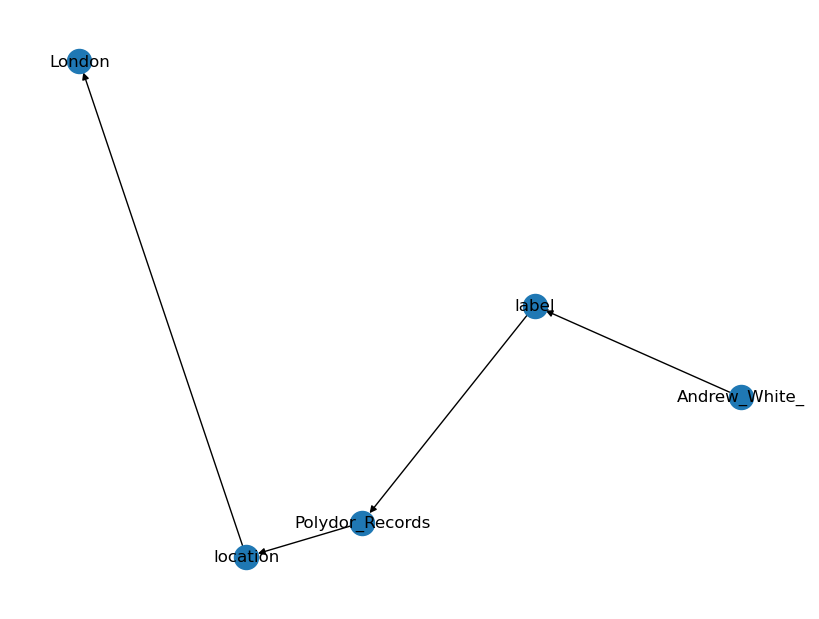

Decoded Input: 
 translate graph to text:  Polydor_Records  location  London  Andrew_White_(musician)  label  Polydor_Records
Decoded Target: 
 Andrew White records under label Polydor Records, who are based in London.
DataBatch(x=[1, 512], edge_index=[2, 4], attention_mask=[1, 512], y=[1, 512], batch=[512], ptr=[2])
Original Sample: 
 translate graph to text: <H> (19255)_1994_VK8  <R>  escapeVelocity  <T>  "333.0"^^xsd:double <H> (19255)_1994_VK8  <R>  Planet/apoapsis  <T>  "6.603633E9"^^<http://dbpedia.org/datatype/kilometre> 
 (19255) 1994 VK8 has an escape velocity of 0.0925 km/s and an apoapsis of 6603633000.0 km.
NetworkX Graph: 
 [('_1994_VK8', 'escapeVelocity', 0), ('_1994_VK8', 'Planet/apoapsis', 0), ('escapeVelocity', '"333.0"^^xsd:double', 0), ('Planet/apoapsis', '"6.603633E9"^^<http://dbpedia.org/datatype/kilometre>', 0)]


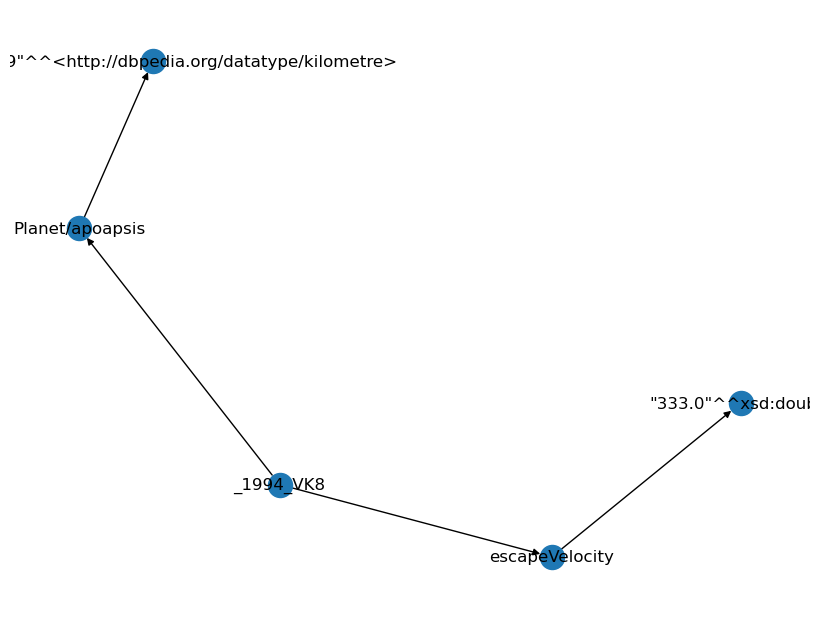

Decoded Input: 
 translate graph to text:  (19255)_1994_VK8  escapeVelocity  "333.0"xsd:double  (19255)_1994_VK8  Planet/apoapsis  "6.603633E9"http://dbpedia.org/datatype/kilometre>
Decoded Target: 
 (19255) 1994 VK8 has an escape velocity of 0.0925 km/s and an apoapsis of 6603633000.0 km.
DataBatch(x=[1, 512], edge_index=[2, 4], attention_mask=[1, 512], y=[1, 512], batch=[512], ptr=[2])
Original Sample: 
 translate graph to text: <H> (410777)_2009_FD  <R>  minTemp  <T>  "211.0"^^<http://dbpedia.org/datatype/kelvin> <H> (410777)_2009_FD  <R>  Planet/apoapsis  <T>  "2.5977670247055E8"^^<http://dbpedia.org/datatype/kilometre> 
 (410777) 2009 FD has an apoapsis of 259776702.47055 kilometres and a minimum temperature of 211.0 kelvins.
NetworkX Graph: 
 [('_2009_FD', 'minTemp', 0), ('_2009_FD', 'Planet/apoapsis', 0), ('minTemp', '"211.0"^^<http://dbpedia.org/datatype/kelvin>', 0), ('Planet/apoapsis', '"2.5977670247055E8"^^<http://dbpedia.org/datatype/kilometre>', 0)]


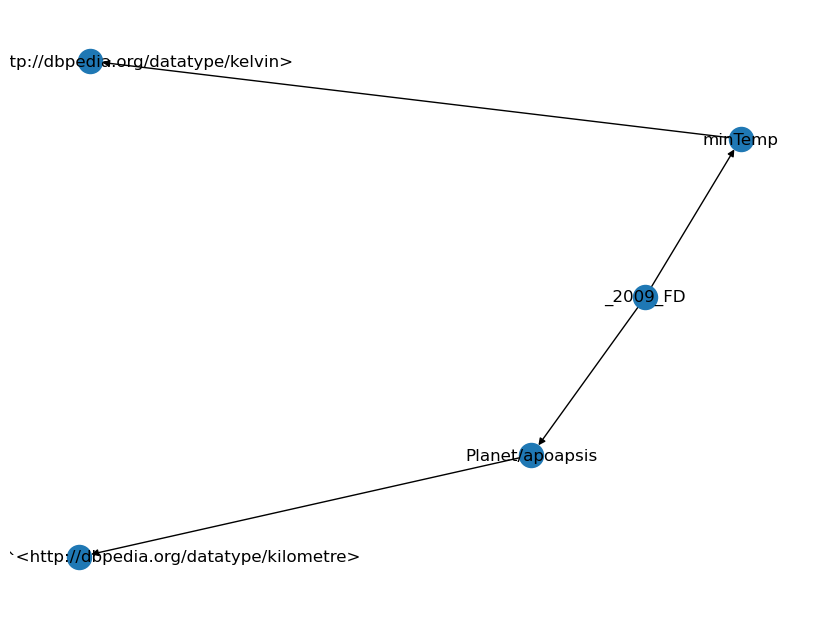

Decoded Input: 
 translate graph to text:  (410777)_2009_FD  minTemp  "211.0"http://dbpedia.org/datatype/kelvin>  (410777)_2009_FD  Planet/apoapsis  "2.5977670247055E8"http://dbpedia.org/datatype/kilometre>
Decoded Target: 
 (410777) 2009 FD has an apoapsis of 259776702.47055 kilometres and a minimum temperature of 211.0 kelvins.
DataBatch(x=[1, 512], edge_index=[2, 4], attention_mask=[1, 512], y=[1, 512], batch=[512], ptr=[2])
Original Sample: 
 translate graph to text: <H> (410777)_2009_FD  <R>  discoverer  <T>  Spacewatch <H> (410777)_2009_FD  <R>  periapsis  <T>  8.82343e+10 
 (410777) 2009 FD, which was discovered by Spacewatch, has a periapsis of 88234300000.0.
NetworkX Graph: 
 [('_2009_FD', 'discoverer', 0), ('_2009_FD', 'periapsis', 0), ('discoverer', 'Spacewatch', 0), ('periapsis', '8.82343e+10', 0)]


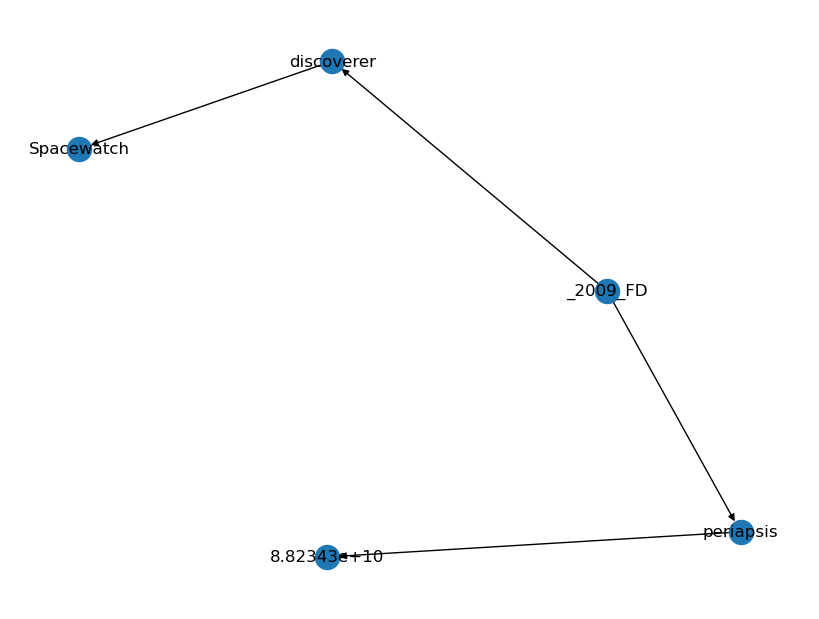

Decoded Input: 
 translate graph to text:  (410777)_2009_FD  discoverer  Spacewatch  (410777)_2009_FD  periapsis  8.82343e+10
Decoded Target: 
 (410777) 2009 FD, which was discovered by Spacewatch, has a periapsis of 88234300000.0.
DataBatch(x=[1, 512], edge_index=[2, 4], attention_mask=[1, 512], y=[1, 512], batch=[512], ptr=[2])
Original Sample: 
 translate graph to text: <H> (66063)_1998_RO1  <R>  epoch  <T>  "November 4, 2013" <H> (66063)_1998_RO1  <R>  escapeVelocity  <T>  "0.0999"^^xsd:double 
 (66063) 1998 RO1, with the epoch date 2013-11-04, has an escape velocity of 0.0999 km/s.
NetworkX Graph: 
 [('_1998_RO1', 'epoch', 0), ('_1998_RO1', 'escapeVelocity', 0), ('epoch', '"November 4, 2013"', 0), ('escapeVelocity', '"0.0999"^^xsd:double', 0)]


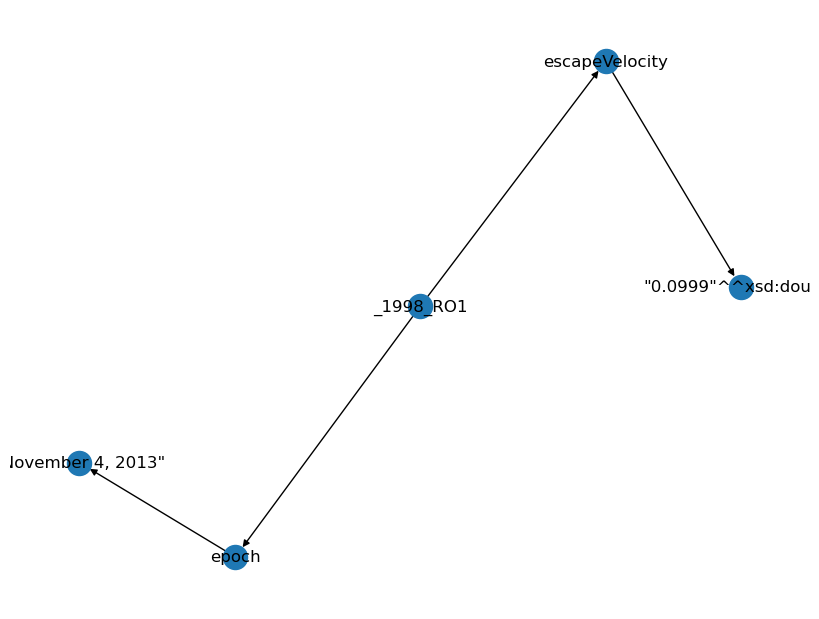

Decoded Input: 
 translate graph to text:  (66063)_1998_RO1  epoch  "November 4, 2013"  (66063)_1998_RO1  escapeVelocity  "0.0999"xsd:double
Decoded Target: 
 (66063) 1998 RO1, with the epoch date 2013-11-04, has an escape velocity of 0.0999 km/s.
DataBatch(x=[1, 512], edge_index=[2, 4], attention_mask=[1, 512], y=[1, 512], batch=[512], ptr=[2])
Original Sample: 
 translate graph to text: <H> (66391)_1999_KW4  <R>  orbitalPeriod  <T>  1.62447e+07 <H> (66391)_1999_KW4  <R>  epoch  <T>  "2004-07-14"^^xsd:date 
 (66391) 199 KW4 has an epoch date of July 14th 2004 and its orbital period is 16244700.
NetworkX Graph: 
 [('_1999_KW4', 'orbitalPeriod', 0), ('_1999_KW4', 'epoch', 0), ('orbitalPeriod', '1.62447e+07', 0), ('epoch', '"2004-07-14"^^xsd:date', 0)]


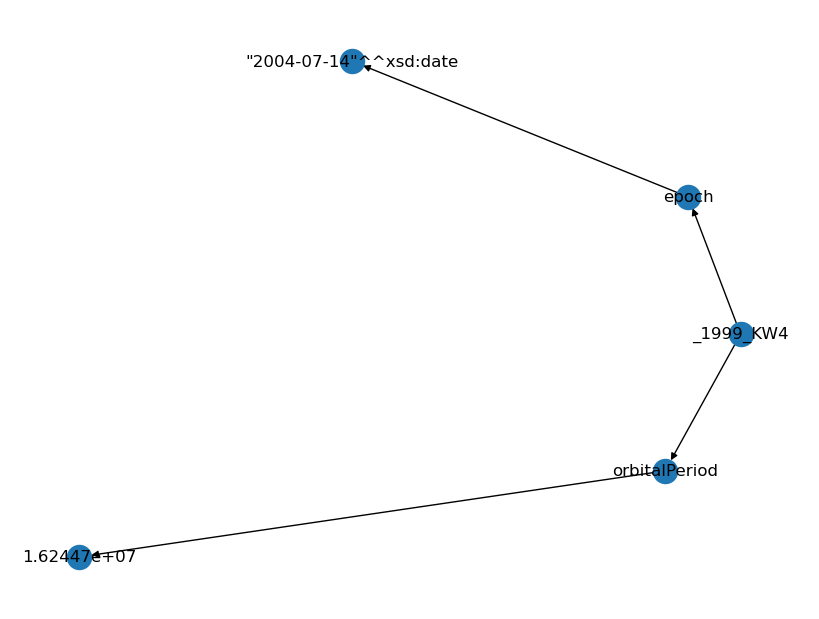

Decoded Input: 
 translate graph to text:  (66391)_1999_KW4  orbitalPeriod  1.62447e+07  (66391)_1999_KW4  epoch  "2004-07-14"xsd:date
Decoded Target: 
 (66391) 199 KW4 has an epoch date of July 14th 2004 and its orbital period is 16244700.
DataBatch(x=[1, 512], edge_index=[2, 4], attention_mask=[1, 512], y=[1, 512], batch=[512], ptr=[2])
Original Sample: 
 translate graph to text: <H> (66391)_1999_KW4  <R>  epoch  <T>  "July 14, 2004 (JD2453200.5)" <H> (66391)_1999_KW4  <R>  rotationPeriod  <T>  "9953.28"^^xsd:double 
 The rotation period of (66391) 1999 KW4 is 9953.28 and its epoch date is July 14th 2004.
NetworkX Graph: 
 [('_1999_KW4', 'epoch', 0), ('_1999_KW4', 'rotationPeriod', 0), ('epoch', '"July 14, 2004 "', 0), ('rotationPeriod', '"9953.28"^^xsd:double', 0)]


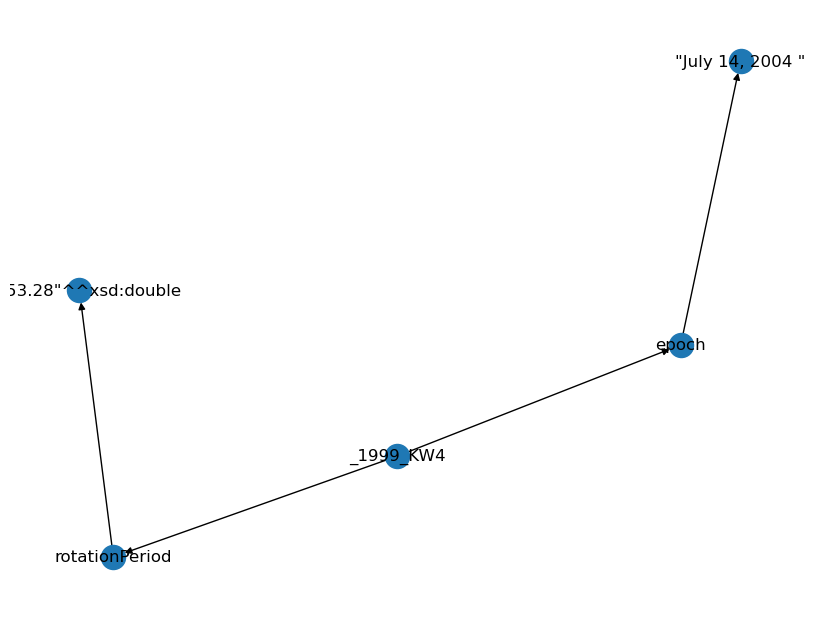

Decoded Input: 
 translate graph to text:  (66391)_1999_KW4  epoch  "July 14, 2004 (JD2453200.5)"  (66391)_1999_KW4  rotationPeriod  "9953.28"xsd:double
Decoded Target: 
 The rotation period of (66391) 1999 KW4 is 9953.28 and its epoch date is July 14th 2004.
DataBatch(x=[1, 512], edge_index=[2, 4], attention_mask=[1, 512], y=[1, 512], batch=[512], ptr=[2])
Original Sample: 
 translate graph to text: <H> 101_Helena  <R>  discoverer  <T>  James_Craig_Watson <H> James_Craig_Watson  <R>  deathCause  <T>  Peritonitis 
 James Craig Watson, who died from peritonitis, discovered 101 Helena.
NetworkX Graph: 
 [('101_Helena', 'discoverer', 0), ('discoverer', 'James_Craig_Watson', 0), ('James_Craig_Watson', 'deathCause', 0), ('deathCause', 'Peritonitis', 0)]


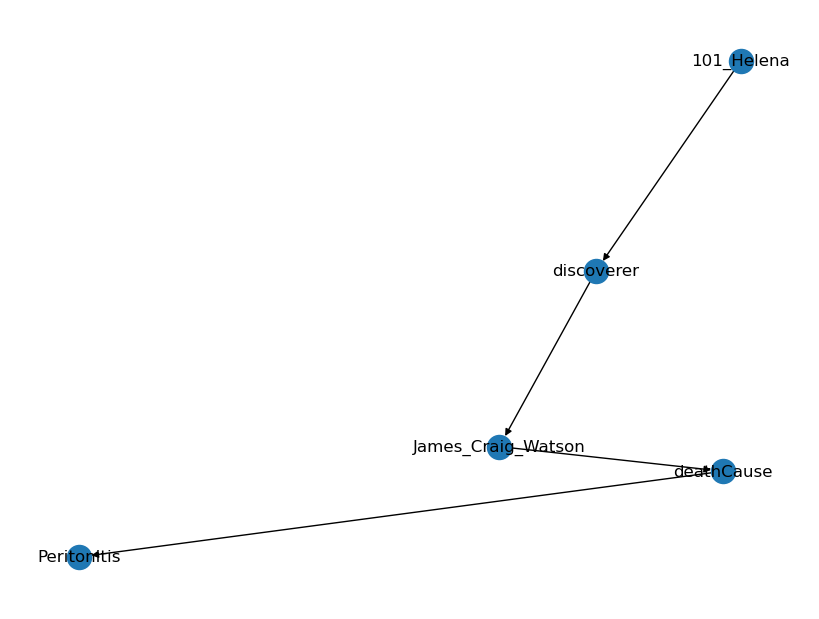

Decoded Input: 
 translate graph to text:  101_Helena  discoverer  James_Craig_Watson  James_Craig_Watson  deathCause  Peritonitis
Decoded Target: 
 James Craig Watson, who died from peritonitis, discovered 101 Helena.
DataBatch(x=[1, 512], edge_index=[2, 4], attention_mask=[1, 512], y=[1, 512], batch=[512], ptr=[2])
Original Sample: 
 translate graph to text: <H> 1036_Ganymed  <R>  averageSpeed  <T>  "60696.0"^^xsd:double <H> 1036_Ganymed  <R>  Planet/apoapsis  <T>  "6.120048890337E8"^^<http://dbpedia.org/datatype/kilometre> 
 The apoapsis measurement of 1036 Ganymed is 611961000.0 (kilometres) and it travels at an average speed of 16.86 kilometres per second.
NetworkX Graph: 
 [('1036_Ganymed', 'averageSpeed', 0), ('1036_Ganymed', 'Planet/apoapsis', 0), ('averageSpeed', '"60696.0"^^xsd:double', 0), ('Planet/apoapsis', '"6.120048890337E8"^^<http://dbpedia.org/datatype/kilometre>', 0)]


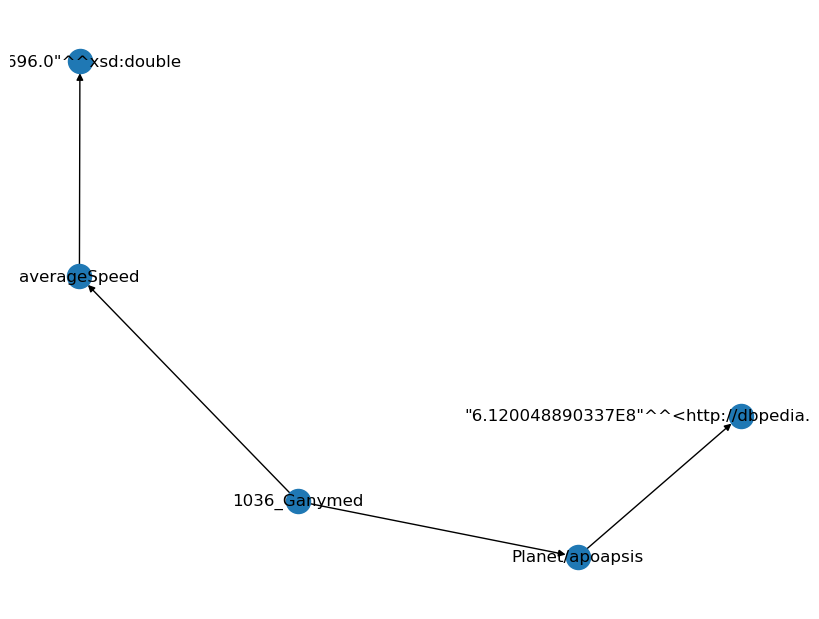

Decoded Input: 
 translate graph to text:  1036_Ganymed  averageSpeed  "60696.0"xsd:double  1036_Ganymed  Planet/apoapsis  "6.120048890337E8"http://dbpedia.org/datatype/kilometre>
Decoded Target: 
 The apoapsis measurement of 1036 Ganymed is 611961000.0 (kilometres) and it travels at an average speed of 16.86 kilometres per second.
DataBatch(x=[1, 512], edge_index=[2, 4], attention_mask=[1, 512], y=[1, 512], batch=[512], ptr=[2])
Original Sample: 
 translate graph to text: <H> 1036_Ganymed  <R>  discoverer  <T>  Walter_Baade <H> Walter_Baade  <R>  birthPlace  <T>  German_Empire 
 Walter Baade, who was born within the German empire, discovered 1036 Ganymed.
NetworkX Graph: 
 [('1036_Ganymed', 'discoverer', 0), ('discoverer', 'Walter_Baade', 0), ('Walter_Baade', 'birthPlace', 0), ('birthPlace', 'German_Empire', 0)]


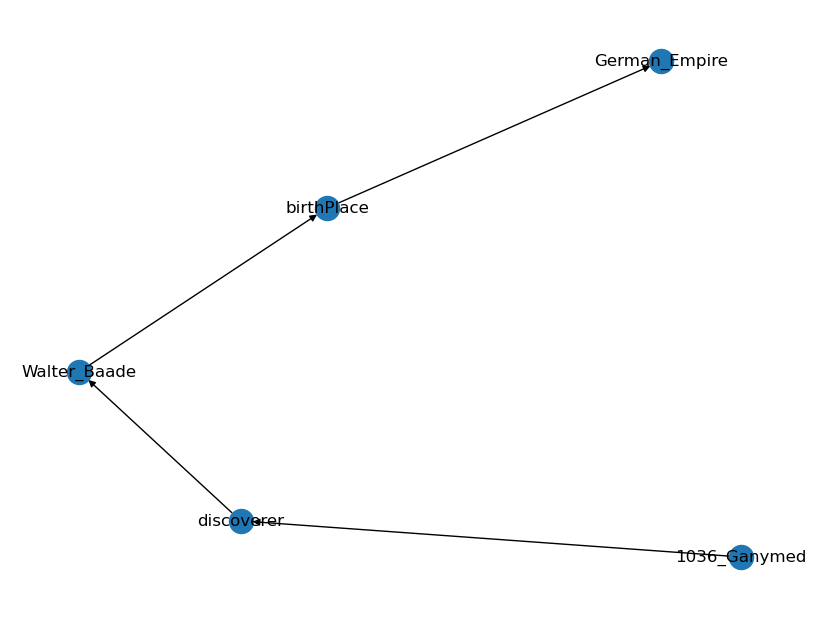

Decoded Input: 
 translate graph to text:  1036_Ganymed  discoverer  Walter_Baade  Walter_Baade  birthPlace  German_Empire
Decoded Target: 
 Walter Baade, who was born within the German empire, discovered 1036 Ganymed.
DataBatch(x=[1, 512], edge_index=[2, 4], attention_mask=[1, 512], y=[1, 512], batch=[512], ptr=[2])
Original Sample: 
 translate graph to text: <H> 1036_Ganymed  <R>  discoverer  <T>  Walter_Baade <H> Walter_Baade  <R>  nationality  <T>  Germany 
 The German Walter Baade discovered 1036 Ganymed.
NetworkX Graph: 
 [('1036_Ganymed', 'discoverer', 0), ('discoverer', 'Walter_Baade', 0), ('Walter_Baade', 'nationality', 0), ('nationality', 'Germany', 0)]


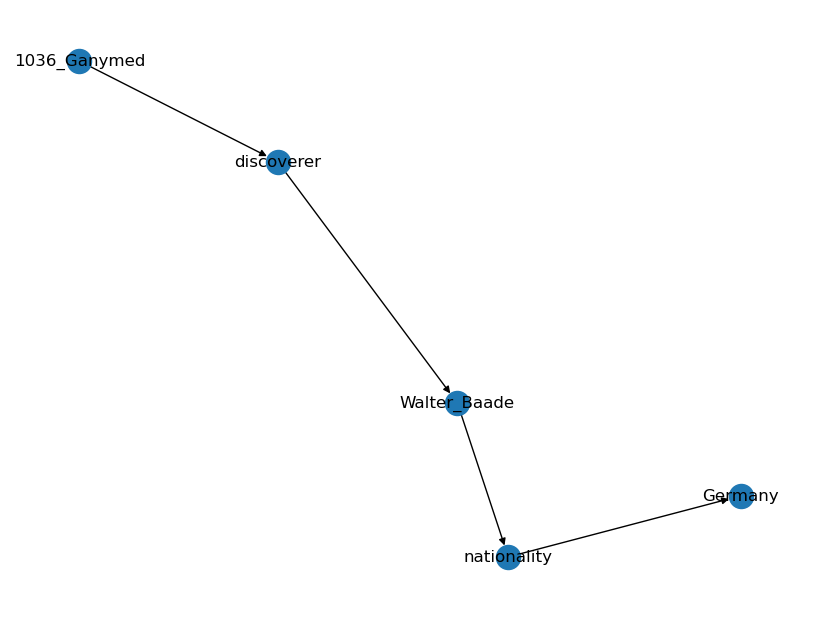

Decoded Input: 
 translate graph to text:  1036_Ganymed  discoverer  Walter_Baade  Walter_Baade  nationality  Germany
Decoded Target: 
 The German Walter Baade discovered 1036 Ganymed.
DataBatch(x=[1, 512], edge_index=[2, 4], attention_mask=[1, 512], y=[1, 512], batch=[512], ptr=[2])
Original Sample: 
 translate graph to text: <H> 103_Hera  <R>  discoverer  <T>  James_Craig_Watson <H> James_Craig_Watson  <R>  deathCause  <T>  Peritonitis 
 James Craig Watson, who died of peritonitis, was the discoverer of 103 Hera.
NetworkX Graph: 
 [('103_Hera', 'discoverer', 0), ('discoverer', 'James_Craig_Watson', 0), ('James_Craig_Watson', 'deathCause', 0), ('deathCause', 'Peritonitis', 0)]


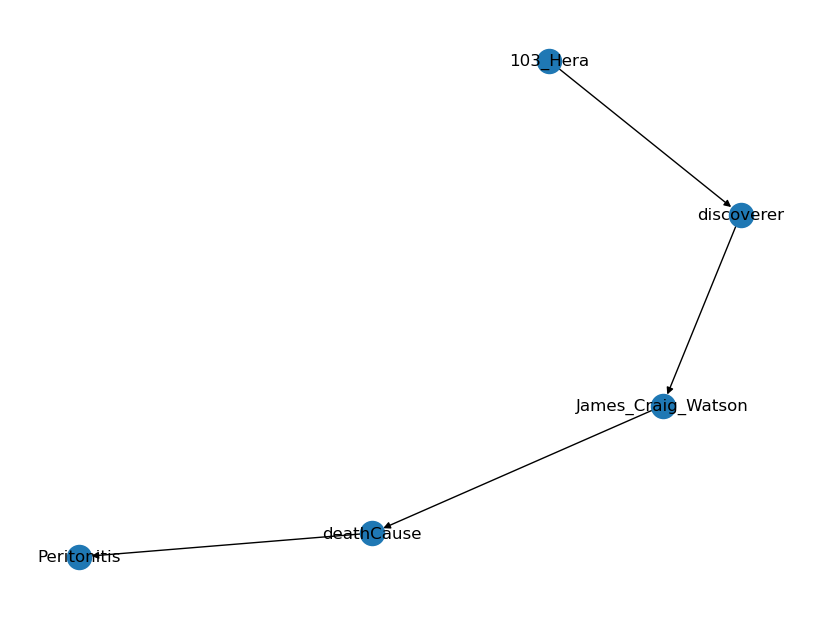

Decoded Input: 
 translate graph to text:  103_Hera  discoverer  James_Craig_Watson  James_Craig_Watson  deathCause  Peritonitis
Decoded Target: 
 James Craig Watson, who died of peritonitis, was the discoverer of 103 Hera.
DataBatch(x=[1, 512], edge_index=[2, 4], attention_mask=[1, 512], y=[1, 512], batch=[512], ptr=[2])
Original Sample: 
 translate graph to text: <H> 103_Hera  <R>  discoverer  <T>  James_Craig_Watson <H> James_Craig_Watson  <R>  nationality  <T>  Canada 
 James Craig Watson, a Canadian national, disovered 103 Hera.
NetworkX Graph: 
 [('103_Hera', 'discoverer', 0), ('discoverer', 'James_Craig_Watson', 0), ('James_Craig_Watson', 'nationality', 0), ('nationality', 'Canada', 0)]


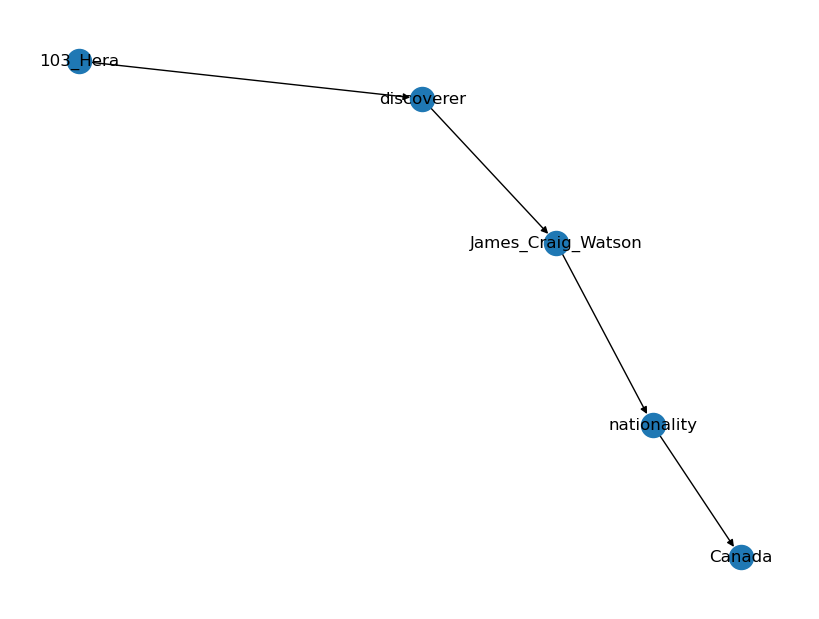

Decoded Input: 
 translate graph to text:  103_Hera  discoverer  James_Craig_Watson  James_Craig_Watson  nationality  Canada
Decoded Target: 
 James Craig Watson, a Canadian national, disovered 103 Hera.
DataBatch(x=[1, 512], edge_index=[2, 4], attention_mask=[1, 512], y=[1, 512], batch=[512], ptr=[2])
Original Sample: 
 translate graph to text: <H> 107_Camilla  <R>  discoverer  <T>  N._R._Pogson <H> N._R._Pogson  <R>  placeOfBirth  <T>  Nottingham 
 N. R. Pogson, born in Nottingham, discovered 107 Camilla.
NetworkX Graph: 
 [('107_Camilla', 'discoverer', 0), ('discoverer', 'N._R._Pogson', 0), ('N._R._Pogson', 'placeOfBirth', 0), ('placeOfBirth', 'Nottingham', 0)]


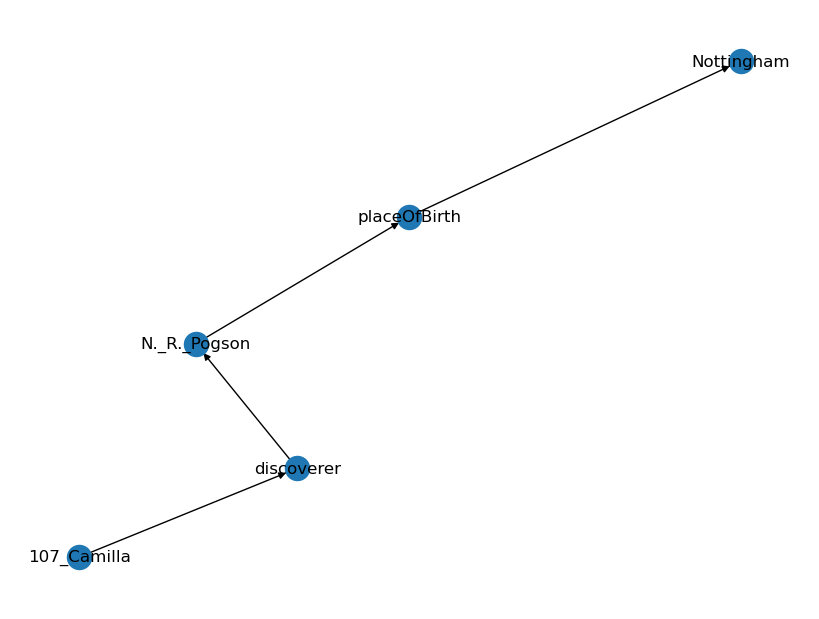

Decoded Input: 
 translate graph to text:  107_Camilla  discoverer  N._R._Pogson  N._R._Pogson  placeOfBirth  Nottingham
Decoded Target: 
 N. R. Pogson, born in Nottingham, discovered 107 Camilla.
DataBatch(x=[1, 512], edge_index=[2, 4], attention_mask=[1, 512], y=[1, 512], batch=[512], ptr=[2])
Original Sample: 
 translate graph to text: <H> 1089_Tama  <R>  epoch  <T>  "November 26, 2005 (JD2453700.5)" <H> 1089_Tama  <R>  formerName  <T>  "A919 HA; 1927 WB;"@en 
 The epoch date of 1089 Tama, formerly known as A919 HA; 1927WB , is 26 November 2005.
NetworkX Graph: 
 [('1089_Tama', 'epoch', 0), ('1089_Tama', 'formerName', 0), ('epoch', '"November 26, 2005 "', 0), ('formerName', '"A919 HA; 1927 WB;"@en', 0)]


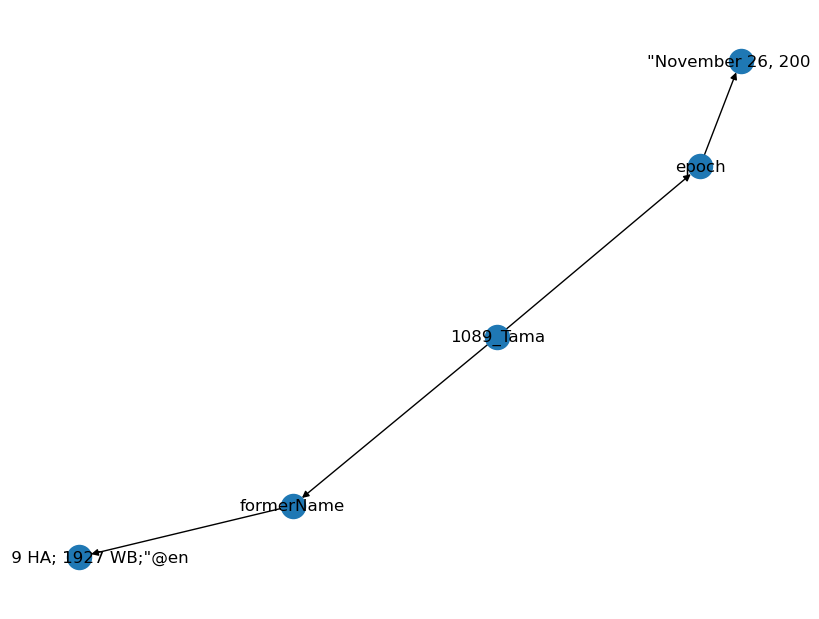

Decoded Input: 
 translate graph to text:  1089_Tama  epoch  "November 26, 2005 (JD2453700.5)"  1089_Tama  formerName  "A919 HA; 1927 WB;"@en
Decoded Target: 
 The epoch date of 1089 Tama, formerly known as A919 HA; 1927WB, is 26 November 2005.
DataBatch(x=[1, 512], edge_index=[2, 4], attention_mask=[1, 512], y=[1, 512], batch=[512], ptr=[2])
Original Sample: 
 translate graph to text: <H> 1089_Tama  <R>  temperature  <T>  "179.0"^^xsd:double <H> 1089_Tama  <R>  Planet/apoapsis  <T>  "3.73513E8"^^<http://dbpedia.org/datatype/kilometre> 
 1089 Tama, which has a temperature of 179.0 kelvins, has an apoapsis of 373513000.0 kilometres.
NetworkX Graph: 
 [('1089_Tama', 'temperature', 0), ('1089_Tama', 'Planet/apoapsis', 0), ('temperature', '"179.0"^^xsd:double', 0), ('Planet/apoapsis', '"3.73513E8"^^<http://dbpedia.org/datatype/kilometre>', 0)]


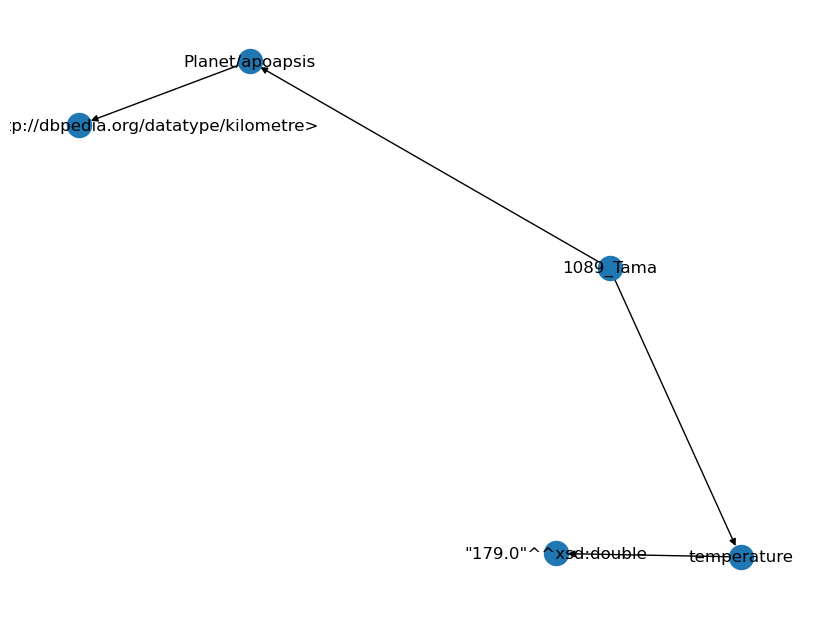

Decoded Input: 
 translate graph to text:  1089_Tama  temperature  "179.0"xsd:double  1089_Tama  Planet/apoapsis  "3.73513E8"http://dbpedia.org/datatype/kilometre>
Decoded Target: 
 1089 Tama, which has a temperature of 179.0 kelvins, has an apoapsis of 373513000.0 kilometres.
DataBatch(x=[1, 512], edge_index=[2, 4], attention_mask=[1, 512], y=[1, 512], batch=[512], ptr=[2])
Original Sample: 
 translate graph to text: <H> 1097_Vicia  <R>  epoch  <T>  "December 31, 2006 (JD2454100.5)" <H> 1097_Vicia  <R>  periapsis  <T>  2.79142e+11 
 The epoch date of 1097 Vicia is 2006.12.31 and has a periapsis measurement of 279142000000.0.
NetworkX Graph: 
 [('1097_Vicia', 'epoch', 0), ('1097_Vicia', 'periapsis', 0), ('epoch', '"December 31, 2006 "', 0), ('periapsis', '2.79142e+11', 0)]


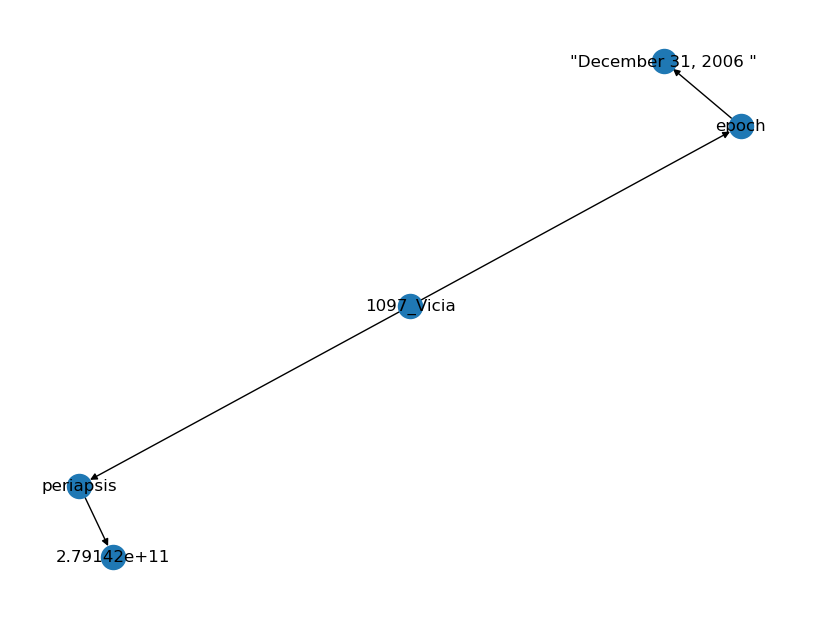

Decoded Input: 
 translate graph to text:  1097_Vicia  epoch  "December 31, 2006 (JD2454100.5)"  1097_Vicia  periapsis  2.79142e+11
Decoded Target: 
 The epoch date of 1097 Vicia is 2006.12.31 and has a periapsis measurement of 279142000000.0.
DataBatch(x=[1, 512], edge_index=[2, 4], attention_mask=[1, 512], y=[1, 512], batch=[512], ptr=[2])
Original Sample: 
 translate graph to text: <H> 109_Felicitas  <R>  Planet/apoapsis  <T>  "5.23329E8"^^<http://dbpedia.org/datatype/kilometre> <H> 109_Felicitas  <R>  Planet/temperature  <T>  "170.0"^^<http://dbpedia.org/datatype/kelvin> 
 109 Felicitas, with a temperature of 170 kelvins, has an apoapsis of 523329000.0 (kilometres).
NetworkX Graph: 
 [('109_Felicitas', 'Planet/apoapsis', 0), ('109_Felicitas', 'Planet/temperature', 0), ('Planet/apoapsis', '"5.23329E8"^^<http://dbpedia.org/datatype/kilometre>', 0), ('Planet/temperature', '"170.0"^^<http://dbpedia.org/datatype/kelvin>', 0)]


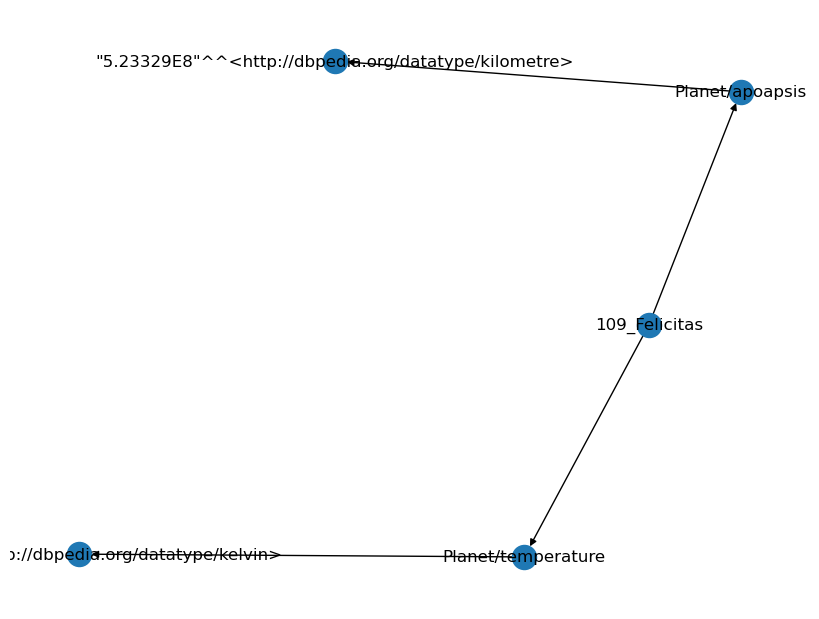

Decoded Input: 
 translate graph to text:  109_Felicitas  Planet/apoapsis  "5.23329E8"http://dbpedia.org/datatype/kilometre>  109_Felicitas  Planet/temperature  "170.0"http://dbpedia.org/datatype/kelvin>
Decoded Target: 
 109 Felicitas, with a temperature of 170 kelvins, has an apoapsis of 523329000.0 (kilometres).
DataBatch(x=[1, 512], edge_index=[2, 4], attention_mask=[1, 512], y=[1, 512], batch=[512], ptr=[2])
Original Sample: 
 translate graph to text: <H> 109_Felicitas  <R>  epoch  <T>  "December 31, 2006 (JD2454100.5)" <H> 109_Felicitas  <R>  periapsis  <T>  2.83326e+11 
 109 felicitas which has a periapsis of 283326000000 and an epoch date of December 31st 2006.
NetworkX Graph: 
 [('109_Felicitas', 'epoch', 0), ('109_Felicitas', 'periapsis', 0), ('epoch', '"December 31, 2006 "', 0), ('periapsis', '2.83326e+11', 0)]


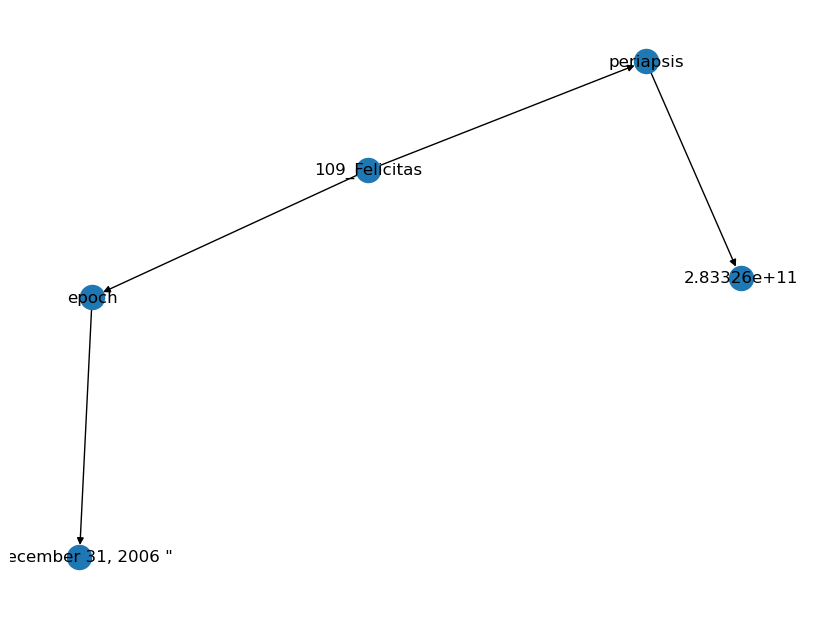

Decoded Input: 
 translate graph to text:  109_Felicitas  epoch  "December 31, 2006 (JD2454100.5)"  109_Felicitas  periapsis  2.83326e+11
Decoded Target: 
 109 felicitas which has a periapsis of 283326000000 and an epoch date of December 31st 2006.
DataBatch(x=[1, 512], edge_index=[2, 4], attention_mask=[1, 512], y=[1, 512], batch=[512], ptr=[2])
Original Sample: 
 translate graph to text: <H> 109_Felicitas  <R>  rotationPeriod  <T>  "47487.6"^^xsd:double <H> 109_Felicitas  <R>  epoch  <T>  "2006-12-31"^^xsd:date 
 The celestial body known as 109 Felicitas has a rotation period of 47487.6, and its epoch date is, 31 December 2006.
NetworkX Graph: 
 [('109_Felicitas', 'rotationPeriod', 0), ('109_Felicitas', 'epoch', 0), ('rotationPeriod', '"47487.6"^^xsd:double', 0), ('epoch', '"2006-12-31"^^xsd:date', 0)]


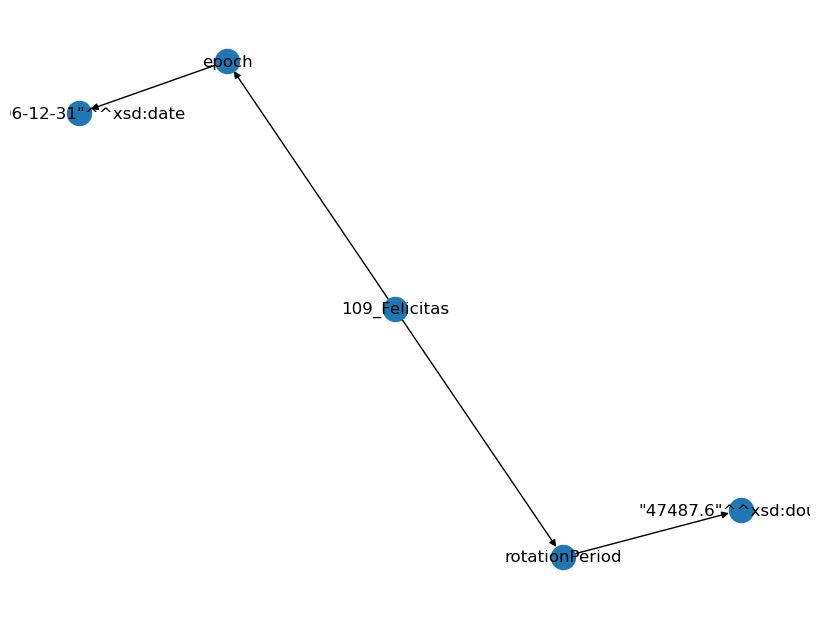

Decoded Input: 
 translate graph to text:  109_Felicitas  rotationPeriod  "47487.6"xsd:double  109_Felicitas  epoch  "2006-12-31"xsd:date
Decoded Target: 
 The celestial body known as 109 Felicitas has a rotation period of 47487.6, and its epoch date is, 31 December 2006.
DataBatch(x=[1, 512], edge_index=[2, 4], attention_mask=[1, 512], y=[1, 512], batch=[512], ptr=[2])
Original Sample: 
 translate graph to text: <H> 10_Hygiea  <R>  temperature  <T>  "164.0"^^xsd:double <H> 10_Hygiea  <R>  Planet/apoapsis  <T>  "5.2395158233968E8"^^<http://dbpedia.org/datatype/kilometre> 
 The temperature of 10 Hygiea is 164.0 kelvins and it has an apoapsis of 523951582.33968 (kilometres).
NetworkX Graph: 
 [('10_Hygiea', 'temperature', 0), ('10_Hygiea', 'Planet/apoapsis', 0), ('temperature', '"164.0"^^xsd:double', 0), ('Planet/apoapsis', '"5.2395158233968E8"^^<http://dbpedia.org/datatype/kilometre>', 0)]


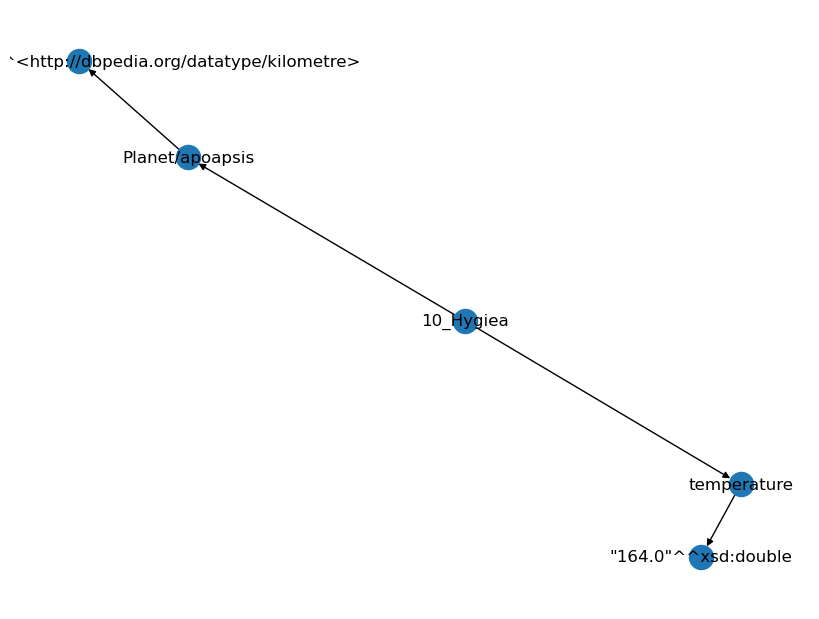

Decoded Input: 
 translate graph to text:  10_Hygiea  temperature  "164.0"xsd:double  10_Hygiea  Planet/apoapsis  "5.2395158233968E8"http://dbpedia.org/datatype/kilometre>
Decoded Target: 
 The temperature of 10 Hygiea is 164.0 kelvins and it has an apoapsis of 523951582.33968 (kilometres).
DataBatch(x=[1, 512], edge_index=[2, 4], attention_mask=[1, 512], y=[1, 512], batch=[512], ptr=[2])
Original Sample: 
 translate graph to text: <H> 10_Hygiea  <R>  epoch  <T>  "27 June 2015 (JD2457200.5)" <H> 10_Hygiea  <R>  formerName  <T>  "A900 GA"@en 
 The asteroid 10 Hygiea, once called A900 GA, has the epoch date of 27th June 2015.
NetworkX Graph: 
 [('10_Hygiea', 'epoch', 0), ('10_Hygiea', 'formerName', 0), ('epoch', '"27 June 2015 "', 0), ('formerName', '"A900 GA"@en', 0)]


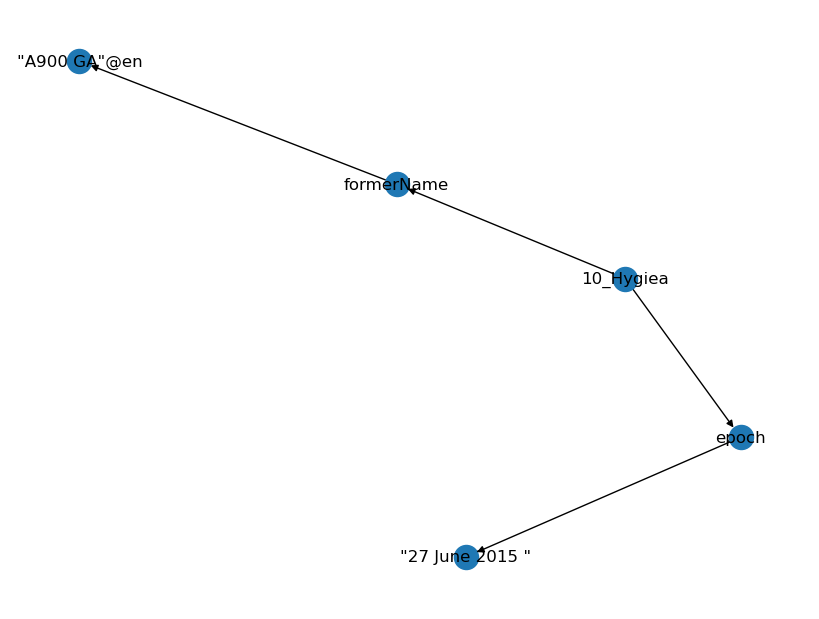

Decoded Input: 
 translate graph to text:  10_Hygiea  epoch  "27 June 2015 (JD2457200.5)"  10_Hygiea  formerName  "A900 GA"@en
Decoded Target: 
 The asteroid 10 Hygiea, once called A900 GA, has the epoch date of 27th June 2015.
DataBatch(x=[1, 512], edge_index=[2, 4], attention_mask=[1, 512], y=[1, 512], batch=[512], ptr=[2])
Original Sample: 
 translate graph to text: <H> 110_Lydia  <R>  mass  <T>  "6700.0"^^xsd:double <H> 110_Lydia  <R>  epoch  <T>  "2006-12-31"^^xsd:date 
 110 Lydia has a mass of 6.7 kilograms and its epoch date was on December 31st 2006.
NetworkX Graph: 
 [('110_Lydia', 'mass', 0), ('110_Lydia', 'epoch', 0), ('mass', '"6700.0"^^xsd:double', 0), ('epoch', '"2006-12-31"^^xsd:date', 0)]


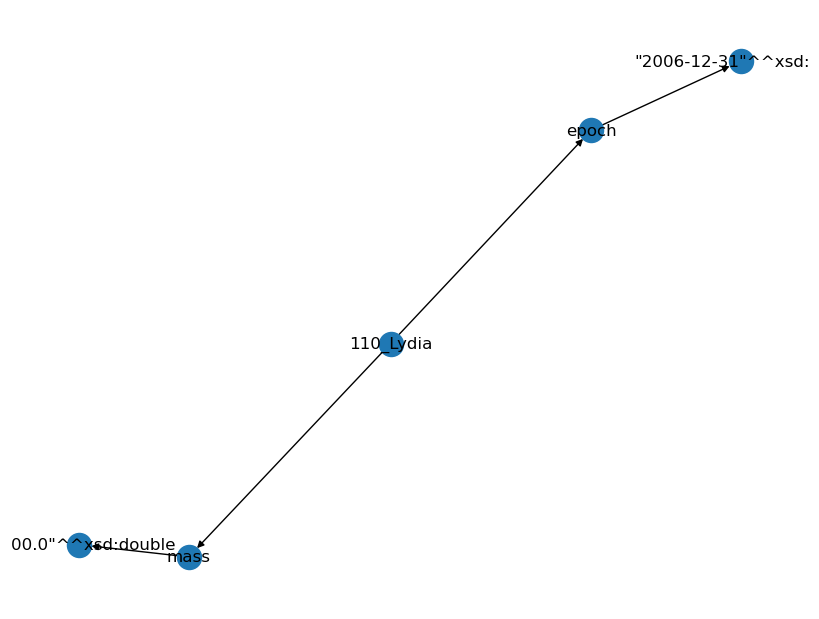

Decoded Input: 
 translate graph to text:  110_Lydia  mass  "6700.0"xsd:double  110_Lydia  epoch  "2006-12-31"xsd:date
Decoded Target: 
 110 Lydia has a mass of 6.7 kilograms and its epoch date was on December 31st 2006.
DataBatch(x=[1, 512], edge_index=[2, 4], attention_mask=[1, 512], y=[1, 512], batch=[512], ptr=[2])
Original Sample: 
 translate graph to text: <H> 110_Lydia  <R>  epoch  <T>  "December 31, 2006 (JD2454100.5)" <H> 110_Lydia  <R>  orbitalPeriod  <T>  1.42603e+08 
 The epoch date of 110 Lydia is 31 December 2006 and it has an orbital period of 142603000.0.
NetworkX Graph: 
 [('110_Lydia', 'epoch', 0), ('110_Lydia', 'orbitalPeriod', 0), ('epoch', '"December 31, 2006 "', 0), ('orbitalPeriod', '1.42603e+08', 0)]


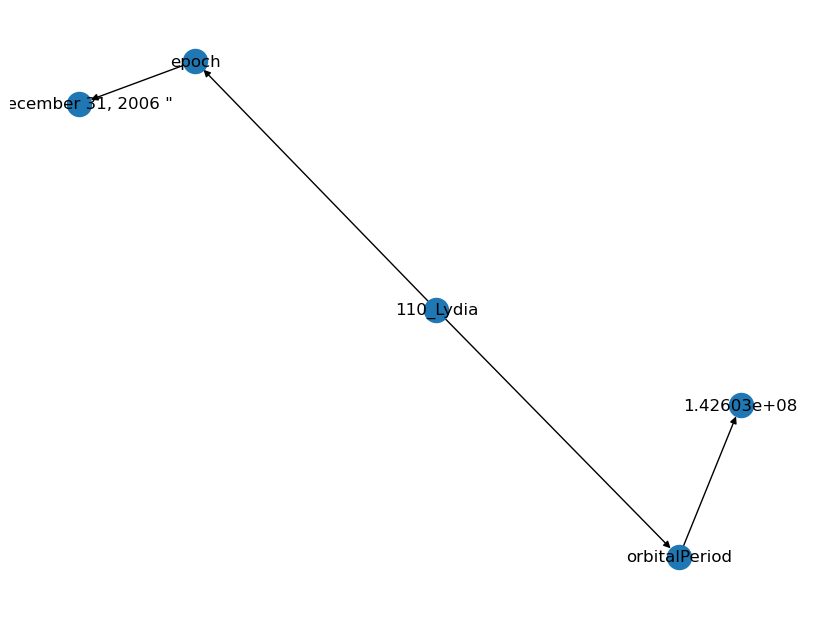

Decoded Input: 
 translate graph to text:  110_Lydia  epoch  "December 31, 2006 (JD2454100.5)"  110_Lydia  orbitalPeriod  1.42603e+08
Decoded Target: 
 The epoch date of 110 Lydia is 31 December 2006 and it has an orbital period of 142603000.0.
DataBatch(x=[1, 512], edge_index=[2, 4], attention_mask=[1, 512], y=[1, 512], batch=[512], ptr=[2])
Original Sample: 
 translate graph to text: <H> A-Rosa_Luna  <R>  shipClass  <T>  Cruise_ship <H> A-Rosa_Luna  <R>  MeanOfTransportation/length  <T>  "125800.0"^^<http://dbpedia.org/datatype/millimetre> 
 The A-Rosa Luna is 125800.0 millimetres in length and classed as a cruise ship.
NetworkX Graph: 
 [('A-Rosa_Luna', 'shipClass', 0), ('A-Rosa_Luna', 'MeanOfTransportation/length', 0), ('shipClass', 'Cruise_ship', 0), ('MeanOfTransportation/length', '"125800.0"^^<http://dbpedia.org/datatype/millimetre>', 0)]


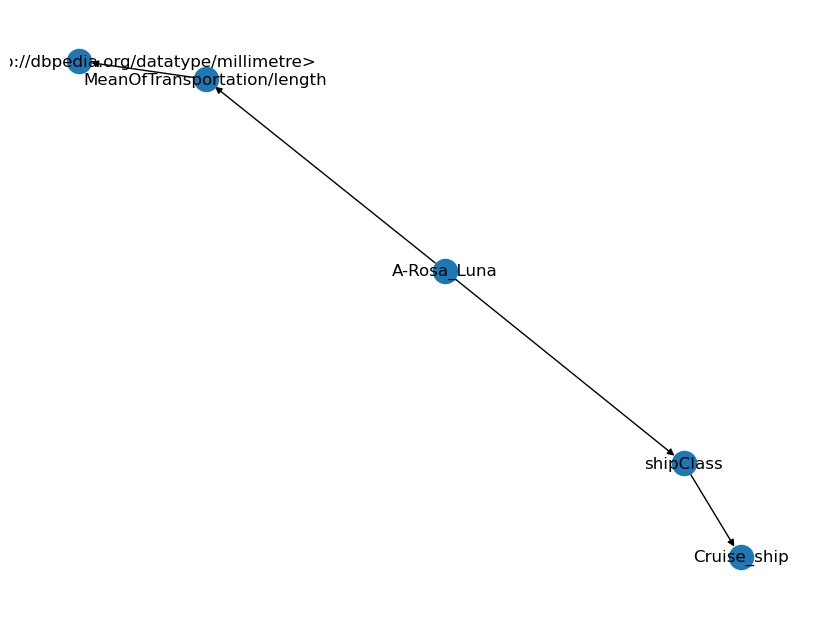

Decoded Input: 
 translate graph to text:  A-Rosa_Luna  shipClass  Cruise_ship  A-Rosa_Luna  MeanOfTransportation/length  "125800.0"http://dbpedia.org/datatype/millimetre>
Decoded Target: 
 The A-Rosa Luna is 125800.0 millimetres in length and classed as a cruise ship.
DataBatch(x=[1, 512], edge_index=[2, 4], attention_mask=[1, 512], y=[1, 512], batch=[512], ptr=[2])
Original Sample: 
 translate graph to text: <H> A-Rosa_Luna  <R>  shipOrdered  <T>  "2004-01-22"^^xsd:date <H> A-Rosa_Luna  <R>  MeanOfTransportation/length  <T>  "125800.0"^^<http://dbpedia.org/datatype/millimetre> 
 The A Rosa Luna ship is 125800.0 mms in length and was ordered on 22 January 2004.
NetworkX Graph: 
 [('A-Rosa_Luna', 'shipOrdered', 0), ('A-Rosa_Luna', 'MeanOfTransportation/length', 0), ('shipOrdered', '"2004-01-22"^^xsd:date', 0), ('MeanOfTransportation/length', '"125800.0"^^<http://dbpedia.org/datatype/millimetre>', 0)]


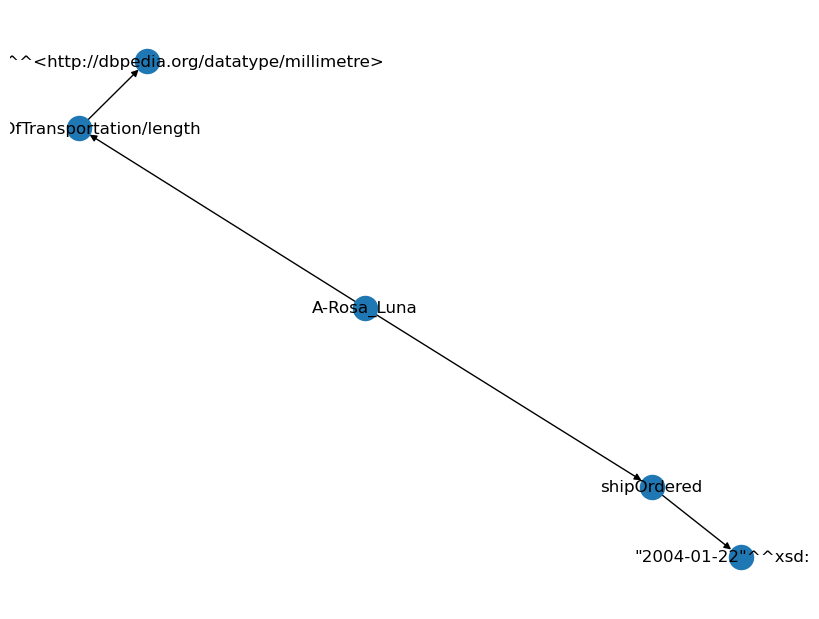

Decoded Input: 
 translate graph to text:  A-Rosa_Luna  shipOrdered  "2004-01-22"xsd:date  A-Rosa_Luna  MeanOfTransportation/length  "125800.0"http://dbpedia.org/datatype/millimetre>
Decoded Target: 
 The A Rosa Luna ship is 125800.0 mms in length and was ordered on 22 January 2004.
DataBatch(x=[1, 512], edge_index=[2, 4], attention_mask=[1, 512], y=[1, 512], batch=[512], ptr=[2])
Original Sample: 
 translate graph to text: <H> AIDA_Cruises  <R>  location  <T>  Germany <H> AIDAstella  <R>  shipOperator  <T>  AIDA_Cruises 
 The AIDAstella is operated by AIDA Cruise Line, which is located in Germany.
NetworkX Graph: 
 [('AIDA_Cruises', 'location', 0), ('location', 'Germany', 0), ('AIDAstella', 'shipOperator', 0), ('shipOperator', 'AIDA_Cruises', 0)]


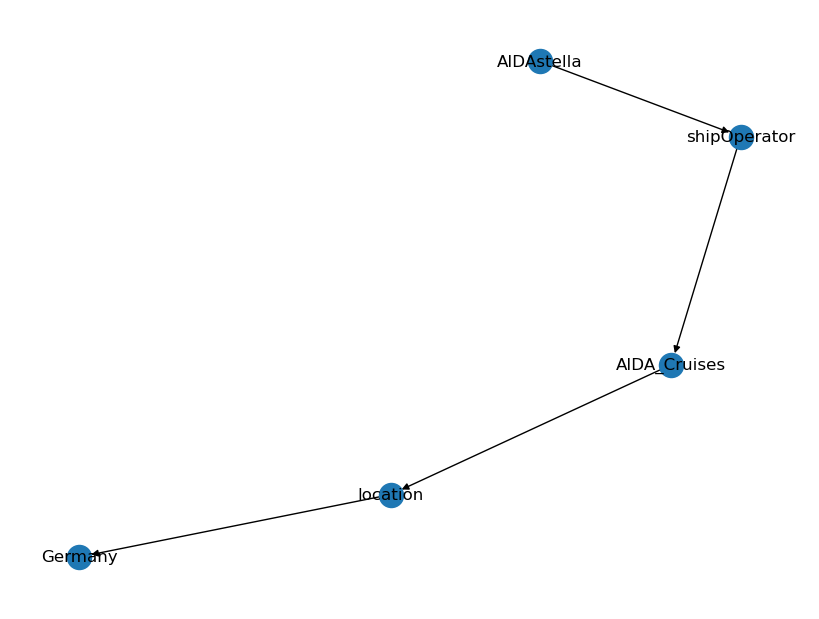

Decoded Input: 
 translate graph to text:  AIDA_Cruises  location  Germany  AIDAstella  shipOperator  AIDA_Cruises
Decoded Target: 
 The AIDAstella is operated by AIDA Cruise Line, which is located in Germany.
DataBatch(x=[1, 512], edge_index=[2, 4], attention_mask=[1, 512], y=[1, 512], batch=[512], ptr=[2])
Original Sample: 
 translate graph to text: <H> AIDA_Cruises  <R>  location  <T>  Rostock <H> AIDAluna  <R>  operator  <T>  AIDA_Cruises 
 The AIDAluna is operated by AIDA Cruises which are located at Rostock.
NetworkX Graph: 
 [('AIDA_Cruises', 'location', 0), ('location', 'Rostock', 0), ('AIDAluna', 'operator', 0), ('operator', 'AIDA_Cruises', 0)]


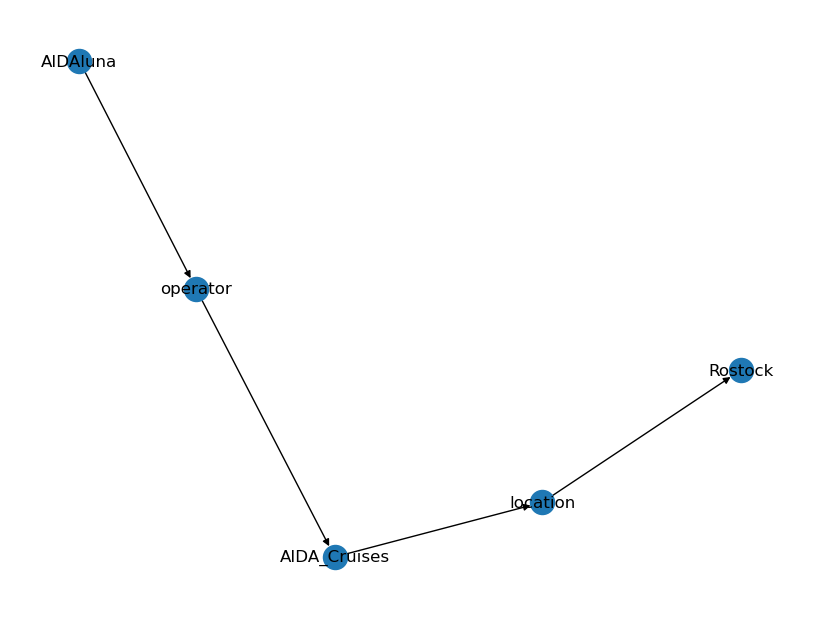

Decoded Input: 
 translate graph to text:  AIDA_Cruises  location  Rostock  AIDAluna  operator  AIDA_Cruises
Decoded Target: 
 The AIDAluna is operated by AIDA Cruises which are located at Rostock.
DataBatch(x=[1, 512], edge_index=[2, 4], attention_mask=[1, 512], y=[1, 512], batch=[512], ptr=[2])
Original Sample: 
 translate graph to text: <H> AIDAluna  <R>  topSpeed  <T>  "40.744"^^xsd:double <H> AIDAluna  <R>  MeanOfTransportation/length  <T>  "252000.0"^^<http://dbpedia.org/datatype/millimetre> 
 The AIDAluna has a top speed is 40.744 and is 252000.0 mms in length.
NetworkX Graph: 
 [('AIDAluna', 'topSpeed', 0), ('AIDAluna', 'MeanOfTransportation/length', 0), ('topSpeed', '"40.744"^^xsd:double', 0), ('MeanOfTransportation/length', '"252000.0"^^<http://dbpedia.org/datatype/millimetre>', 0)]


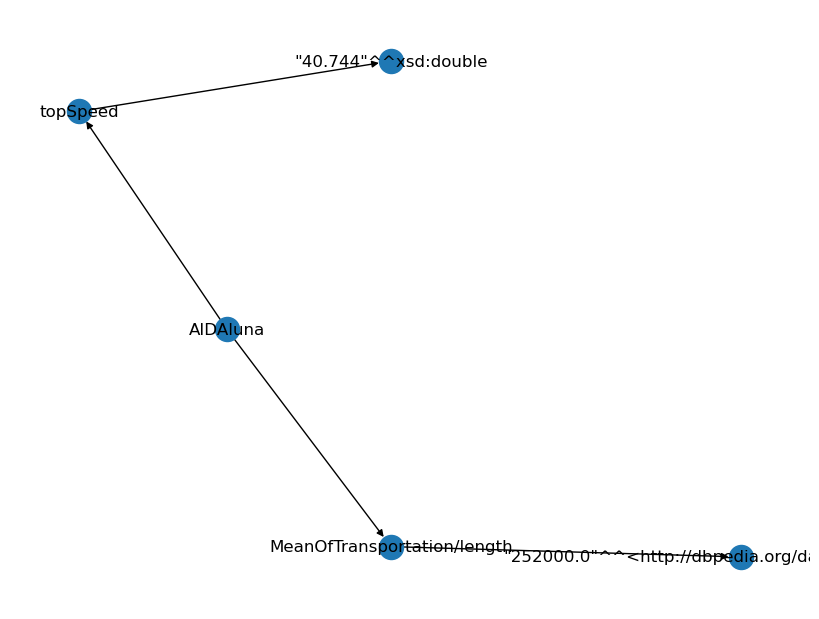

Decoded Input: 
 translate graph to text:  AIDAluna  topSpeed  "40.744"xsd:double  AIDAluna  MeanOfTransportation/length  "252000.0"http://dbpedia.org/datatype/millimetre>
Decoded Target: 
 The AIDAluna has a top speed is 40.744 and is 252000.0 mms in length.
DataBatch(x=[1, 512], edge_index=[2, 4], attention_mask=[1, 512], y=[1, 512], batch=[512], ptr=[2])
Original Sample: 
 translate graph to text: <H> AIDAstella  <R>  shipChristened  <T>  "--03-16"^^xsd:gMonthDay <H> AIDAstella  <R>  MeanOfTransportation/length  <T>  "253260.0"^^<http://dbpedia.org/datatype/millimetre> 
 The AIDAstella is 253.26m long and was launched March 16th 2013.
NetworkX Graph: 
 [('AIDAstella', 'shipChristened', 0), ('AIDAstella', 'MeanOfTransportation/length', 0), ('shipChristened', '"--03-16"^^xsd:gMonthDay', 0), ('MeanOfTransportation/length', '"253260.0"^^<http://dbpedia.org/datatype/millimetre>', 0)]


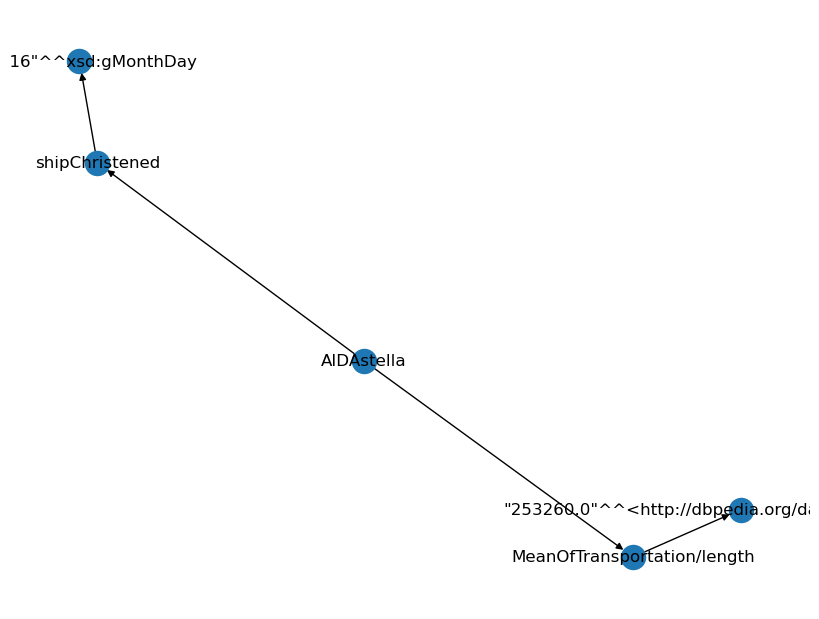

Decoded Input: 
 translate graph to text:  AIDAstella  shipChristened  "--03-16"xsd:gMonthDay  AIDAstella  MeanOfTransportation/length  "253260.0"http://dbpedia.org/datatype/millimetre>
Decoded Target: 
 The AIDAstella is 253.26m long and was launched March 16th 2013.
DataBatch(x=[1, 512], edge_index=[2, 4], attention_mask=[1, 512], y=[1, 512], batch=[512], ptr=[2])
Original Sample: 
 translate graph to text: <H> ALCO_RS-3  <R>  builder  <T>  Montreal_Locomotive_Works <H> ALCO_RS-3  <R>  powertype  <T>  Diesel-electric_transmission 
 Montreal Locomotive Works is the builder of the ALCO RS-3 which has a diesel-electric transmission.
NetworkX Graph: 
 [('ALCO_RS-3', 'builder', 0), ('ALCO_RS-3', 'powertype', 0), ('builder', 'Montreal_Locomotive_Works', 0), ('powertype', 'Diesel-electric_transmission', 0)]


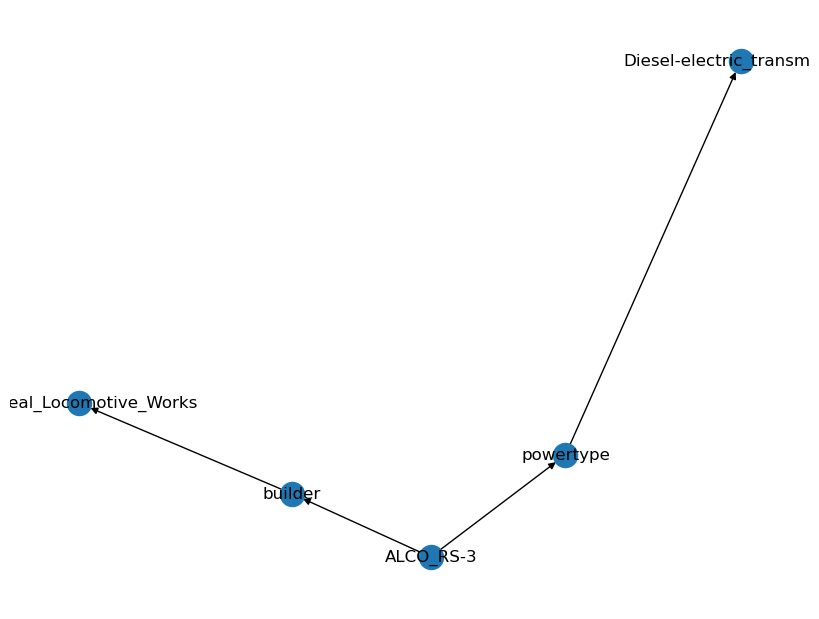

Decoded Input: 
 translate graph to text:  ALCO_RS-3  builder  Montreal_Locomotive_Works  ALCO_RS-3  powertype  Diesel-electric_transmission
Decoded Target: 
 Montreal Locomotive Works is the builder of the ALCO RS-3 which has a diesel-electric transmission.
DataBatch(x=[1, 512], edge_index=[2, 4], attention_mask=[1, 512], y=[1, 512], batch=[512], ptr=[2])
Original Sample: 
 translate graph to text: <H> ALV_X-1  <R>  diameter  <T>  "5.0"^^<http://dbpedia.org/datatype/foot> <H> ALV_X-1  <R>  rocketStages  <T>  "2"^^xsd:nonNegativeInteger 
 The ALV X-1 has 2 rocket stages and a diameter of 1.524 metres.
NetworkX Graph: 
 [('ALV_X-1', 'diameter', 0), ('ALV_X-1', 'rocketStages', 0), ('diameter', '"5.0"^^<http://dbpedia.org/datatype/foot>', 0), ('rocketStages', '"2"^^xsd:nonNegativeInteger', 0)]


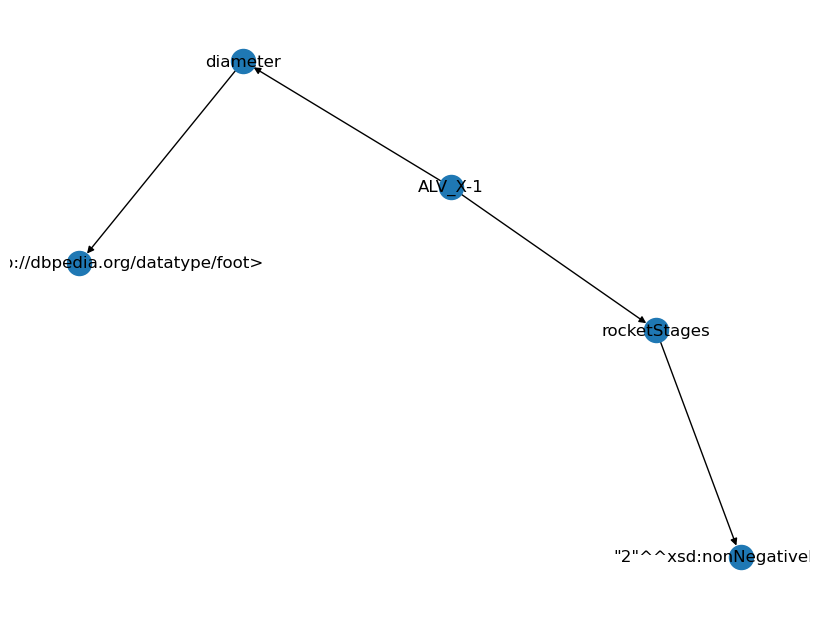

Decoded Input: 
 translate graph to text:  ALV_X-1  diameter  "5.0"http://dbpedia.org/datatype/foot>  ALV_X-1  rocketStages  "2"xsd:nonNegativeInteger
Decoded Target: 
 The ALV X-1 has 2 rocket stages and a diameter of 1.524 metres.
DataBatch(x=[1, 512], edge_index=[2, 4], attention_mask=[1, 512], y=[1, 512], batch=[512], ptr=[2])
Original Sample: 
 translate graph to text: <H> AMC_Matador  <R>  assembly  <T>  Kenosha,_Wisconsin <H> AMC_Matador  <R>  modelYears  <T>  1974 
 1974 is one of the model years of the AMC Matador which was assembled in Kenosha, Wisconsin.
NetworkX Graph: 
 [('AMC_Matador', 'assembly', 0), ('AMC_Matador', 'modelYears', 0), ('assembly', 'Kenosha,_Wisconsin', 0), ('modelYears', '1974', 0)]


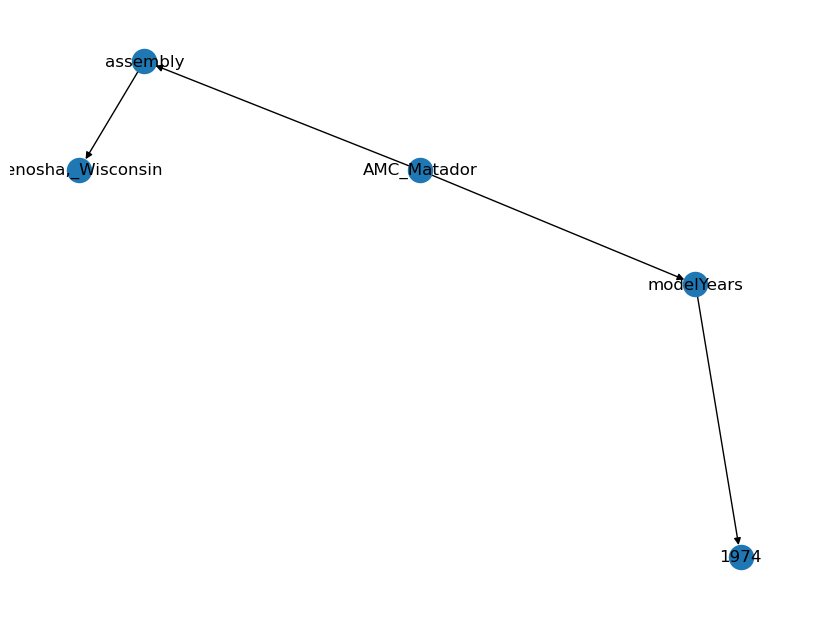

Decoded Input: 
 translate graph to text:  AMC_Matador  assembly  Kenosha,_Wisconsin  AMC_Matador  modelYears  1974
Decoded Target: 
 1974 is one of the model years of the AMC Matador which was assembled in Kenosha, Wisconsin.
DataBatch(x=[1, 512], edge_index=[2, 4], attention_mask=[1, 512], y=[1, 512], batch=[512], ptr=[2])
Original Sample: 
 translate graph to text: <H> AMC_Matador  <R>  designer  <T>  Richard_A._Teague <H> Richard_A._Teague  <R>  employer  <T>  Chrysler 
 Richard A. Teague is emplyed by Chrysler and designed the AMC Matador.
NetworkX Graph: 
 [('AMC_Matador', 'designer', 0), ('designer', 'Richard_A._Teague', 0), ('Richard_A._Teague', 'employer', 0), ('employer', 'Chrysler', 0)]


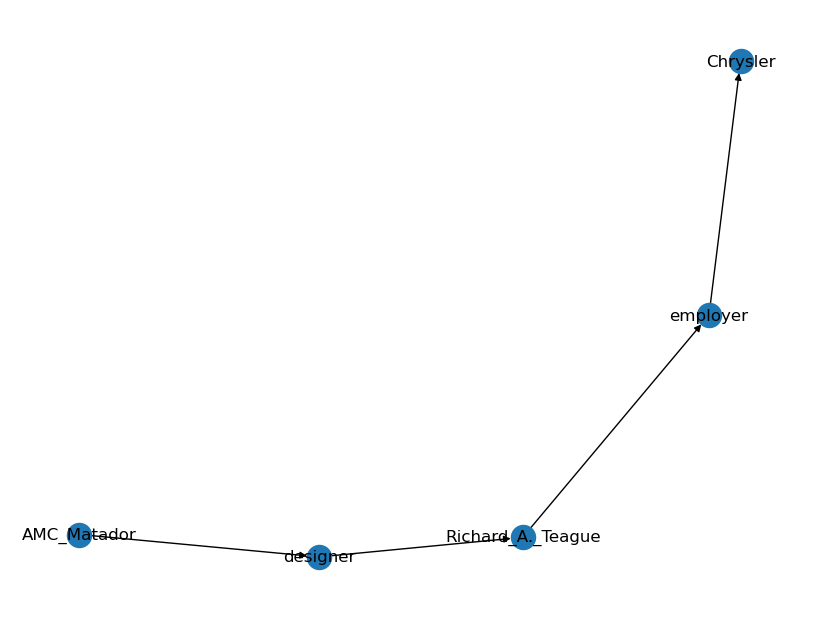

Decoded Input: 
 translate graph to text:  AMC_Matador  designer  Richard_A._Teague  Richard_A._Teague  employer  Chrysler
Decoded Target: 
 Richard A. Teague is emplyed by Chrysler and designed the AMC Matador.
DataBatch(x=[1, 512], edge_index=[2, 4], attention_mask=[1, 512], y=[1, 512], batch=[512], ptr=[2])
Original Sample: 
 translate graph to text: <H> ARA_Veinticinco_de_Mayo_(V-2)  <R>  length  <T>  "192.0"^^xsd:double <H> ARA_Veinticinco_de_Mayo_(V-2)  <R>  country  <T>  Argentina 
 The ARA Veinticinco de Mayo (V-2) is 192000.0 millimetres long and comes from Argentina.
NetworkX Graph: 
 [('ARA_Veinticinco_de_Mayo_', 'length', 0), ('ARA_Veinticinco_de_Mayo_', 'country', 0), ('length', '"192.0"^^xsd:double', 0), ('country', 'Argentina', 0)]


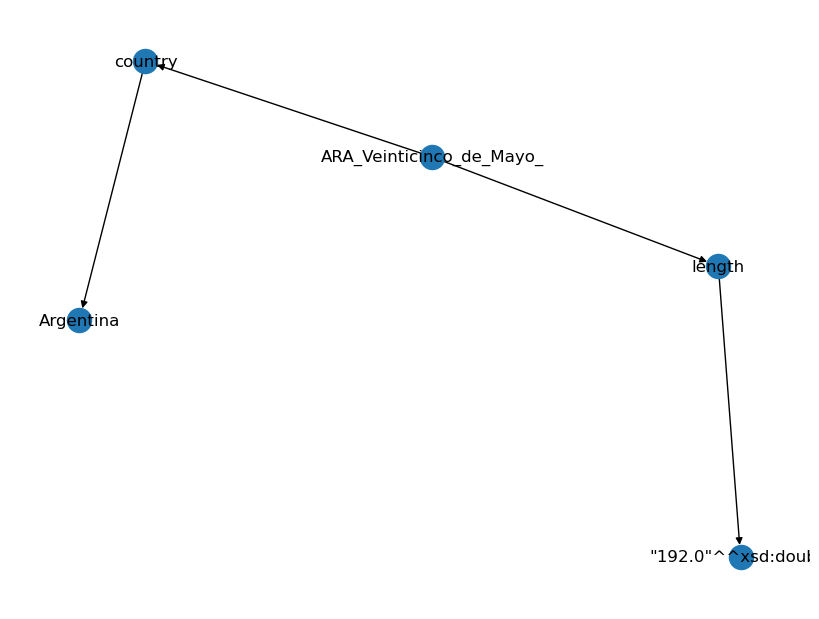

Decoded Input: 
 translate graph to text:  ARA_Veinticinco_de_Mayo_(V-2)  length  "192.0"xsd:double  ARA_Veinticinco_de_Mayo_(V-2)  country  Argentina
Decoded Target: 
 The ARA Veinticinco de Mayo (V-2) is 192000.0 millimetres long and comes from Argentina.
DataBatch(x=[1, 512], edge_index=[2, 4], attention_mask=[1, 512], y=[1, 512], batch=[512], ptr=[2])
Original Sample: 
 translate graph to text: <H> Alfa_Romeo_164  <R>  assembly  <T>  Milan <H> Alfa_Romeo_164  <R>  related  <T>  Saab_9000 
 The Alfa Romeo 164, which is assembled in Milan, is a related means of transportation to Saab 9000 , in that they are both cars.
NetworkX Graph: 
 [('Alfa_Romeo_164', 'assembly', 0), ('Alfa_Romeo_164', 'related', 0), ('assembly', 'Milan', 0), ('related', 'Saab_9000', 0)]


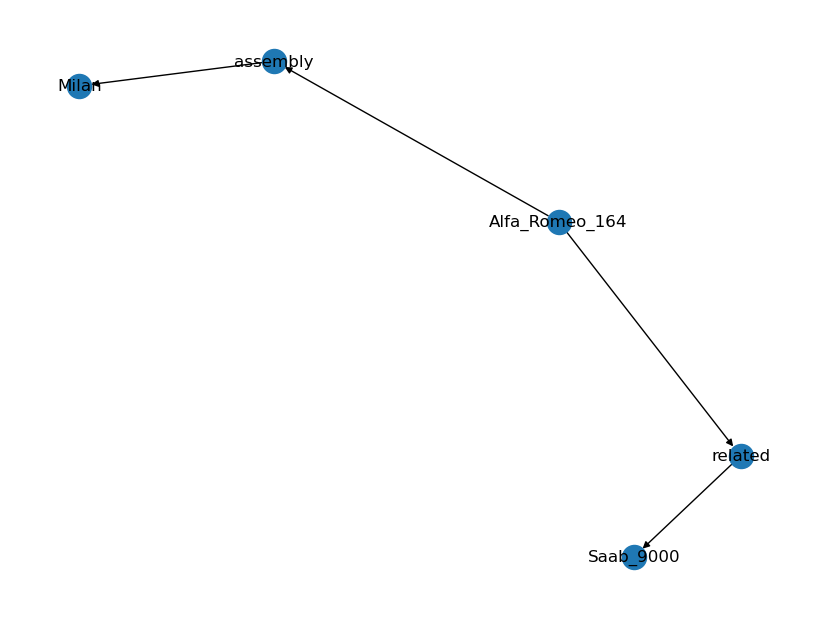

Decoded Input: 
 translate graph to text:  Alfa_Romeo_164  assembly  Milan  Alfa_Romeo_164  related  Saab_9000
Decoded Target: 
 The Alfa Romeo 164, which is assembled in Milan, is a related means of transportation to Saab 9000, in that they are both cars.
DataBatch(x=[1, 512], edge_index=[2, 4], attention_mask=[1, 512], y=[1, 512], batch=[512], ptr=[2])
Original Sample: 
 translate graph to text: <H> Alfa_Romeo_164  <R>  related  <T>  Fiat_Croma <H> Alfa_Romeo_164  <R>  assembly  <T>  Italy 
 The Alfa Romeo 164 is assembled in Italy and is a similar means of transport to the Fiat Croma.
NetworkX Graph: 
 [('Alfa_Romeo_164', 'related', 0), ('Alfa_Romeo_164', 'assembly', 0), ('related', 'Fiat_Croma', 0), ('assembly', 'Italy', 0)]


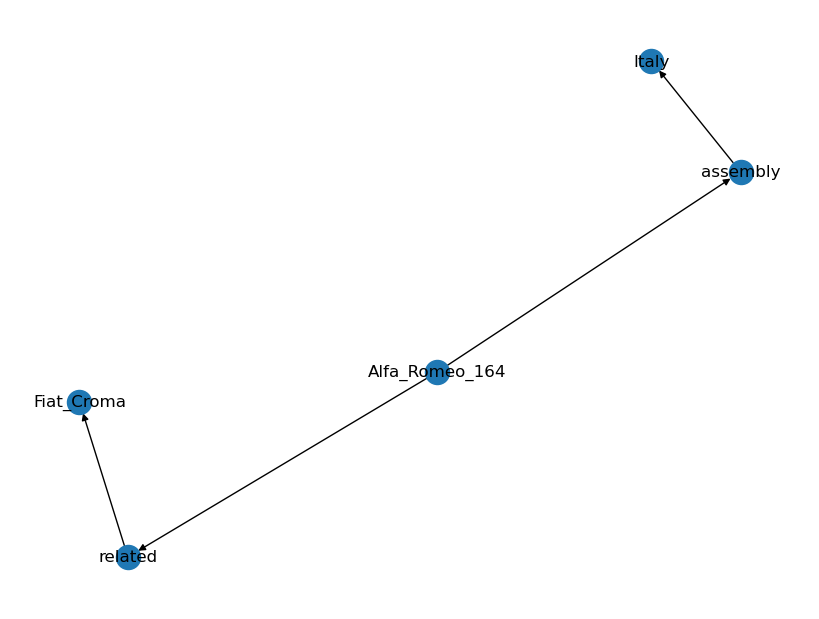

Decoded Input: 
 translate graph to text:  Alfa_Romeo_164  related  Fiat_Croma  Alfa_Romeo_164  assembly  Italy
Decoded Target: 
 The Alfa Romeo 164 is assembled in Italy and is a similar means of transport to the Fiat Croma.
DataBatch(x=[1, 512], edge_index=[2, 4], attention_mask=[1, 512], y=[1, 512], batch=[512], ptr=[2])
Original Sample: 
 translate graph to text: <H> Alfa_Romeo_164  <R>  related  <T>  Lancia_Thema <H> Alfa_Romeo_164  <R>  assembly  <T>  Italy 
 The Alfa Romeo 164, which was assembled in Italy, and Lancia Thema are related types of transportation.
NetworkX Graph: 
 [('Alfa_Romeo_164', 'related', 0), ('Alfa_Romeo_164', 'assembly', 0), ('related', 'Lancia_Thema', 0), ('assembly', 'Italy', 0)]


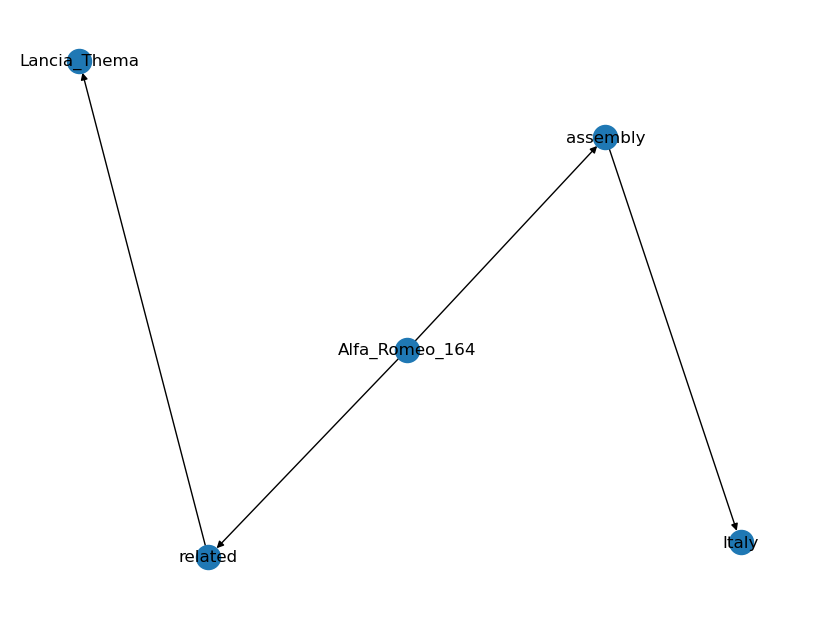

Decoded Input: 
 translate graph to text:  Alfa_Romeo_164  related  Lancia_Thema  Alfa_Romeo_164  assembly  Italy
Decoded Target: 
 The Alfa Romeo 164, which was assembled in Italy, and Lancia Thema are related types of transportation.
DataBatch(x=[1, 512], edge_index=[2, 4], attention_mask=[1, 512], y=[1, 512], batch=[512], ptr=[2])
Original Sample: 
 translate graph to text: <H> Alvis_Speed_25  <R>  manufacturer  <T>  Alvis_Car_and_Engineering_Company <H> Alvis_Car_and_Engineering_Company  <R>  locationCity  <T>  Coventry 
 Alvis Speed 25 was made by the Alvis Car and Engineering Company of Coventry.
NetworkX Graph: 
 [('Alvis_Speed_25', 'manufacturer', 0), ('manufacturer', 'Alvis_Car_and_Engineering_Company', 0), ('Alvis_Car_and_Engineering_Company', 'locationCity', 0), ('locationCity', 'Coventry', 0)]


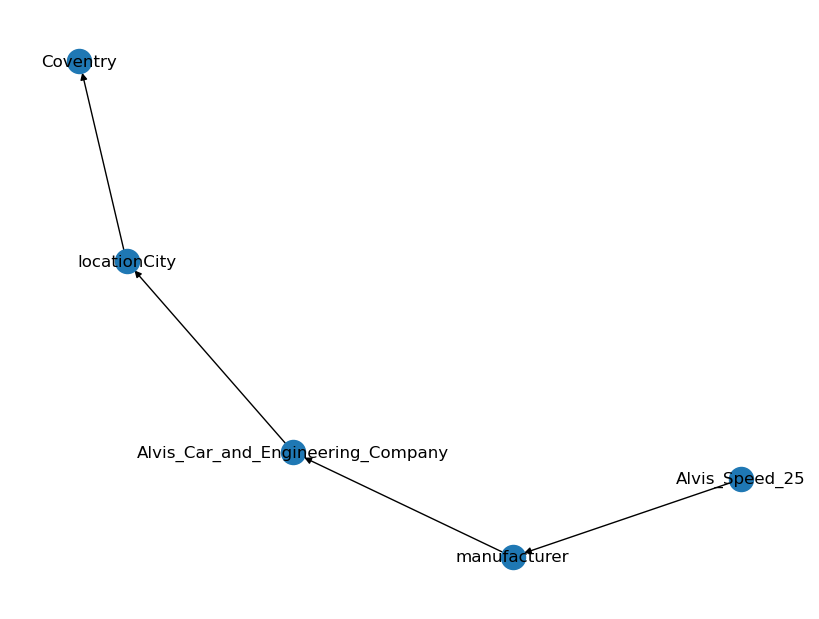

Decoded Input: 
 translate graph to text:  Alvis_Speed_25  manufacturer  Alvis_Car_and_Engineering_Company  Alvis_Car_and_Engineering_Company  locationCity  Coventry
Decoded Target: 
 Alvis Speed 25 was made by the Alvis Car and Engineering Company of Coventry.
DataBatch(x=[1, 512], edge_index=[2, 4], attention_mask=[1, 512], y=[1, 512], batch=[512], ptr=[2])
Original Sample: 
 translate graph to text: <H> Alvis_Speed_25  <R>  transmission  <T>  "single plate clutch, separate 4-speed gearbox all-silent" <H> Alvis_Speed_25  <R>  engine  <T>  Alvis_Speed_25__2 
 The Alvis Speed 25 has a 4387.00 cc engine and an impressive transmission coined as "single plate clutch, separate 4-speed gearbox all-silent and all-syncromesh, centre change lever, open tubular propellor shaft with metal joints , spiral bevel fully floating back axle".
NetworkX Graph: 
 [('Alvis_Speed_25', 'transmission', 0), ('Alvis_Speed_25', 'engine', 0), ('transmission', '"single plate clutch, separate 4-speed gearbox all-s

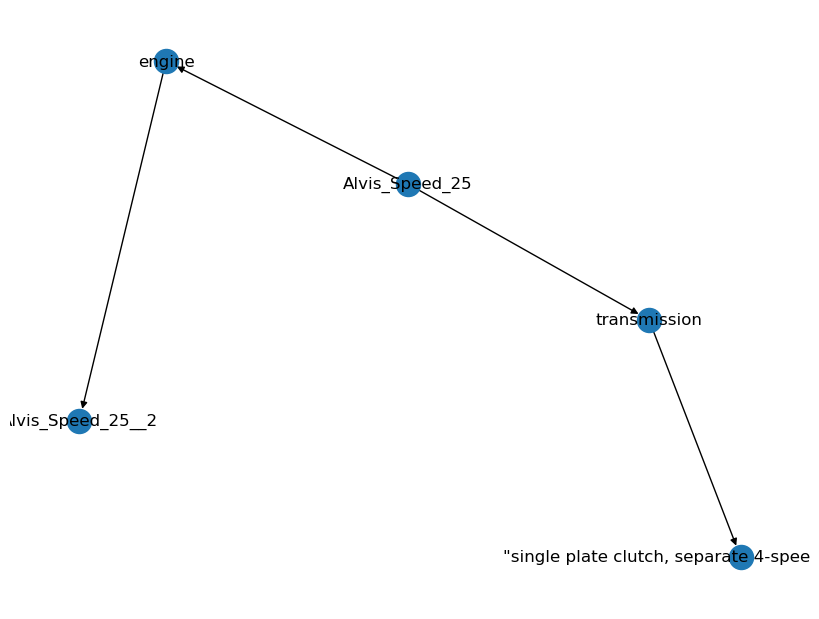

Decoded Input: 
 translate graph to text:  Alvis_Speed_25  transmission  "single plate clutch, separate 4-speed gearbox all-silent"  Alvis_Speed_25  engine  Alvis_Speed_25__2
Decoded Target: 
 The Alvis Speed 25 has a 4387.00 cc engine and an impressive transmission coined as "single plate clutch, separate 4-speed gearbox all-silent and all-syncromesh, centre change lever, open tubular propellor shaft with metal joints, spiral bevel fully floating back axle".
DataBatch(x=[1, 512], edge_index=[2, 4], attention_mask=[1, 512], y=[1, 512], batch=[512], ptr=[2])
Original Sample: 
 translate graph to text: <H> Alvis_Speed_25  <R>  transmission  <T>  "with metal joints (arranged in a straight line), spiral bevel fully floating back axle" <H> Alvis_Speed_25  <R>  engine  <T>  Alvis_Speed_25__6 
 The Alvis Speed 25 has a straight-six engine and an impressive transmission.
NetworkX Graph: 
 [('Alvis_Speed_25', 'transmission', 0), ('Alvis_Speed_25', 'engine', 0), ('transmission', '"with metal joi

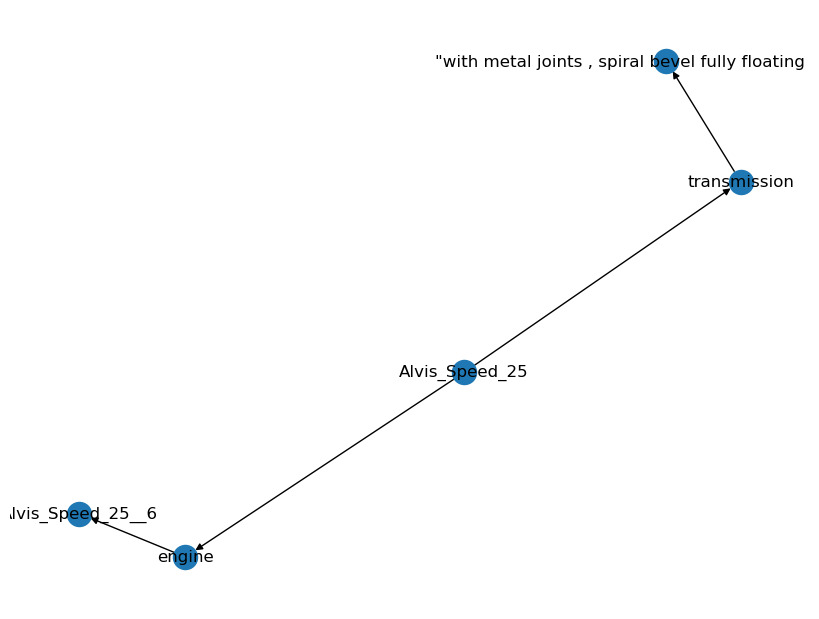

Decoded Input: 
 translate graph to text:  Alvis_Speed_25  transmission  "with metal joints (arranged in a straight line), spiral bevel fully floating back axle"  Alvis_Speed_25  engine  Alvis_Speed_25__6
Decoded Target: 
 The Alvis Speed 25 has a straight-six engine and an impressive transmission.
DataBatch(x=[1, 512], edge_index=[2, 4], attention_mask=[1, 512], y=[1, 512], batch=[512], ptr=[2])
Original Sample: 
 translate graph to text: <H> American_Motors  <R>  successor  <T>  Eagle_(automobile) <H> AMC_Matador  <R>  manufacturer  <T>  American_Motors 
 American Motors, who made the AMC Matador, was succeeded by Eagle.
NetworkX Graph: 
 [('American_Motors', 'successor', 0), ('successor', 'Eagle_', 0), ('AMC_Matador', 'manufacturer', 0), ('manufacturer', 'American_Motors', 0)]


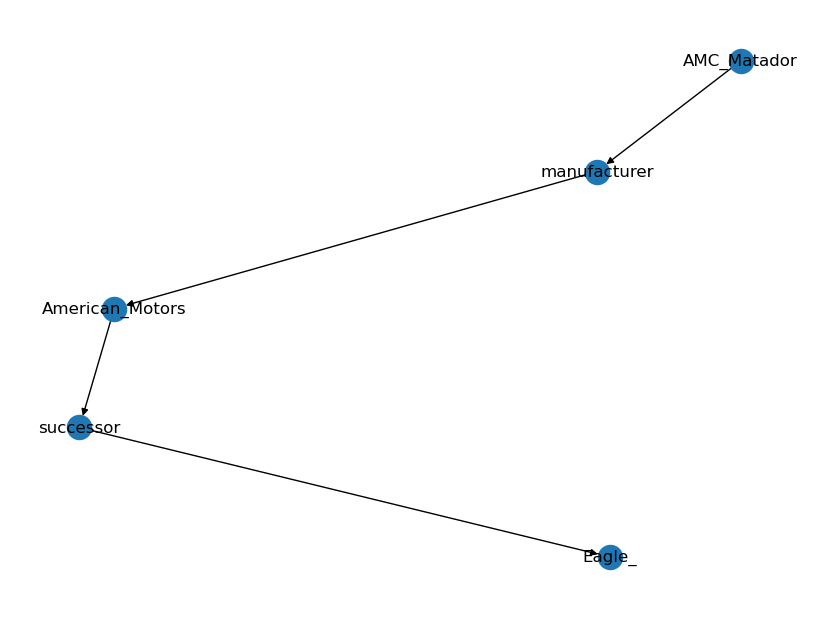

Decoded Input: 
 translate graph to text:  American_Motors  successor  Eagle_(automobile)  AMC_Matador  manufacturer  American_Motors
Decoded Target: 
 American Motors, who made the AMC Matador, was succeeded by Eagle.
DataBatch(x=[1, 512], edge_index=[2, 4], attention_mask=[1, 512], y=[1, 512], batch=[512], ptr=[2])
Original Sample: 
 translate graph to text: <H> Antares_(rocket)  <R>  maidenFlight  <T>  "2014-01-09"^^xsd:date <H> Antares_(rocket)  <R>  sites  <T>  Mid-Atlantic_Regional_Spaceport 
 The Antares rocket is launched from the Mid ~Atlantic Regional Spaceport and its first voyage was on January 9th 2014.
NetworkX Graph: 
 [('Antares_', 'maidenFlight', 0), ('Antares_', 'sites', 0), ('maidenFlight', '"2014-01-09"^^xsd:date', 0), ('sites', 'Mid-Atlantic_Regional_Spaceport', 0)]


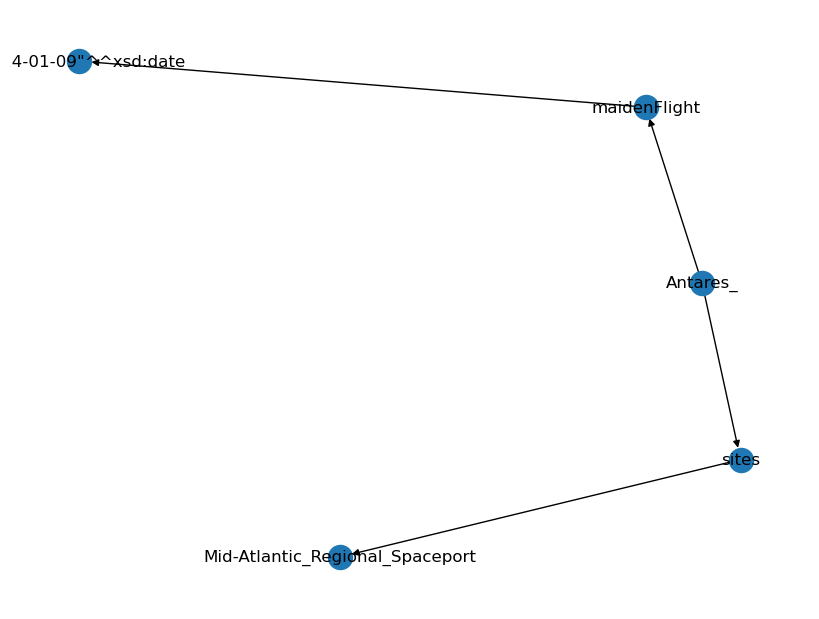

Decoded Input: 
 translate graph to text:  Antares_(rocket)  maidenFlight  "2014-01-09"xsd:date  Antares_(rocket)  sites  Mid-Atlantic_Regional_Spaceport
Decoded Target: 
 The Antares rocket is launched from the Mid Atlantic Regional Spaceport and its first voyage was on January 9th 2014.
DataBatch(x=[1, 512], edge_index=[2, 4], attention_mask=[1, 512], y=[1, 512], batch=[512], ptr=[2])
Original Sample: 
 translate graph to text: <H> Argentina  <R>  leader  <T>  Gabriela_Michetti <H> ARA_Veinticinco_de_Mayo_(V-2)  <R>  country  <T>  Argentina 
 ARA Veinticinco de Mayo (V-2) comes from Argentina where Gabriela Michetti is the leader.
NetworkX Graph: 
 [('Argentina', 'leader', 0), ('leader', 'Gabriela_Michetti', 0), ('ARA_Veinticinco_de_Mayo_', 'country', 0), ('country', 'Argentina', 0)]


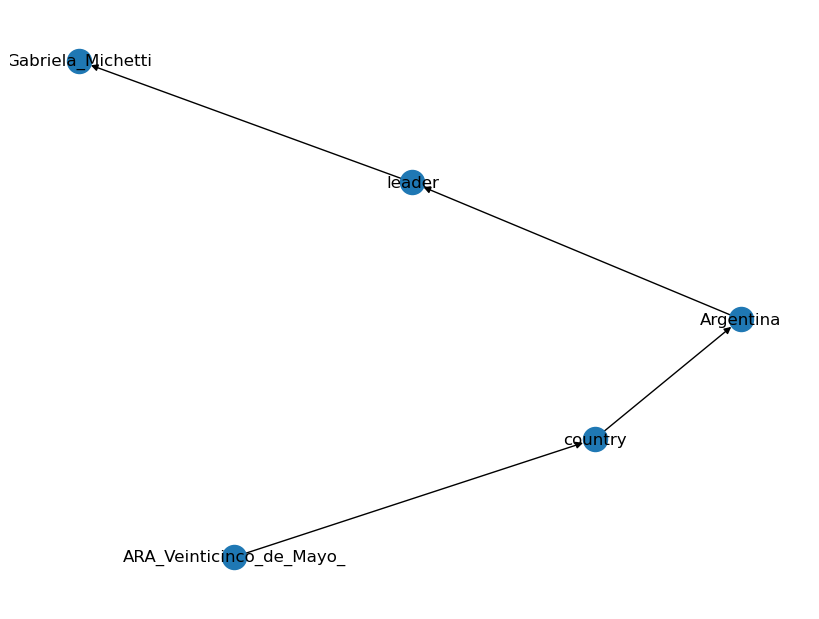

Decoded Input: 
 translate graph to text:  Argentina  leader  Gabriela_Michetti  ARA_Veinticinco_de_Mayo_(V-2)  country  Argentina
Decoded Target: 
 ARA Veinticinco de Mayo (V-2) comes from Argentina where Gabriela Michetti is the leader.
DataBatch(x=[1, 512], edge_index=[2, 4], attention_mask=[1, 512], y=[1, 512], batch=[512], ptr=[2])
Original Sample: 
 translate graph to text: <H> Ariane_5  <R>  sites  <T>  ELA-3 <H> Ariane_5  <R>  manufacturer  <T>  Airbus_Defence_and_Space 
 Ariane 5 was launched at ELA-3 and manufactured by The Airbus Defence and Space.
NetworkX Graph: 
 [('Ariane_5', 'sites', 0), ('Ariane_5', 'manufacturer', 0), ('sites', 'ELA-3', 0), ('manufacturer', 'Airbus_Defence_and_Space', 0)]


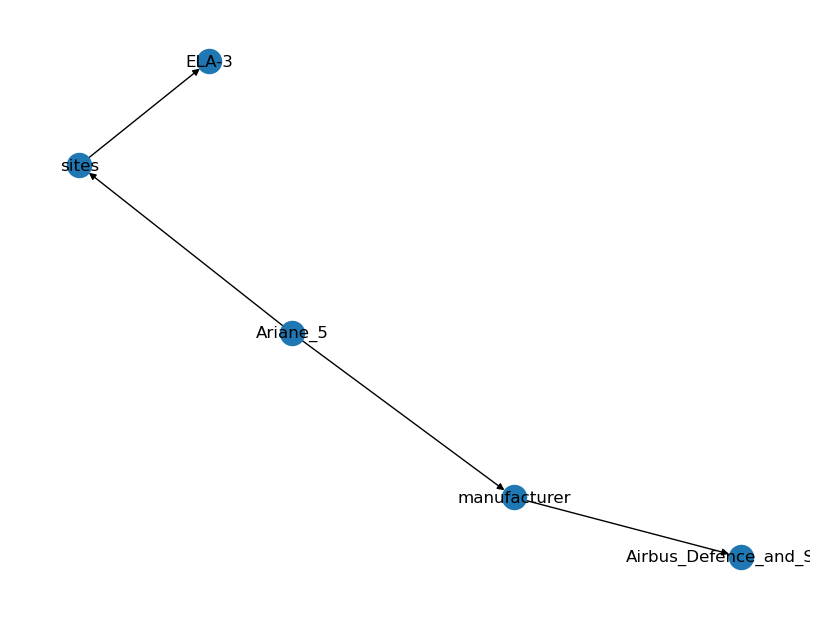

Decoded Input: 
 translate graph to text:  Ariane_5  sites  ELA-3  Ariane_5  manufacturer  Airbus_Defence_and_Space
Decoded Target: 
 Ariane 5 was launched at ELA-3 and manufactured by The Airbus Defence and Space.
DataBatch(x=[1, 512], edge_index=[2, 4], attention_mask=[1, 512], y=[1, 512], batch=[512], ptr=[2])
Original Sample: 
 translate graph to text: <H> Ariane_5  <R>  manufacturer  <T>  Airbus_Defence_and_Space <H> Airbus_Defence_and_Space  <R>  parentCompany  <T>  Airbus_Group 
 Airbus Group is the parent company of Airbus Defence & Space; where Ariane 5 was manufactured.
NetworkX Graph: 
 [('Ariane_5', 'manufacturer', 0), ('manufacturer', 'Airbus_Defence_and_Space', 0), ('Airbus_Defence_and_Space', 'parentCompany', 0), ('parentCompany', 'Airbus_Group', 0)]


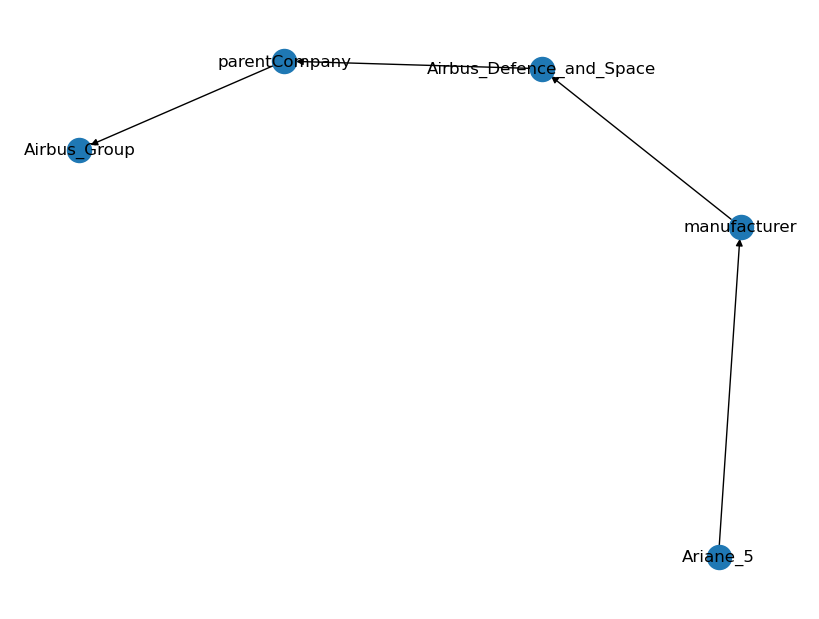

Decoded Input: 
 translate graph to text:  Ariane_5  manufacturer  Airbus_Defence_and_Space  Airbus_Defence_and_Space  parentCompany  Airbus_Group
Decoded Target: 
 Airbus Group is the parent company of Airbus Defence & Space; where Ariane 5 was manufactured.
DataBatch(x=[1, 512], edge_index=[2, 4], attention_mask=[1, 512], y=[1, 512], batch=[512], ptr=[2])
Original Sample: 
 translate graph to text: <H> Aston_Martin_V8  <R>  assembly  <T>  United_Kingdom <H> Aston_Martin_V8  <R>  related  <T>  Aston_Martin_RHAM/1 
 The Aston Martin V8 - assembled in the United Kingdom - and Aston Martin RHAM/1 are related means of transportation.
NetworkX Graph: 
 [('Aston_Martin_V8', 'assembly', 0), ('Aston_Martin_V8', 'related', 0), ('assembly', 'United_Kingdom', 0), ('related', 'Aston_Martin_RHAM/1', 0)]


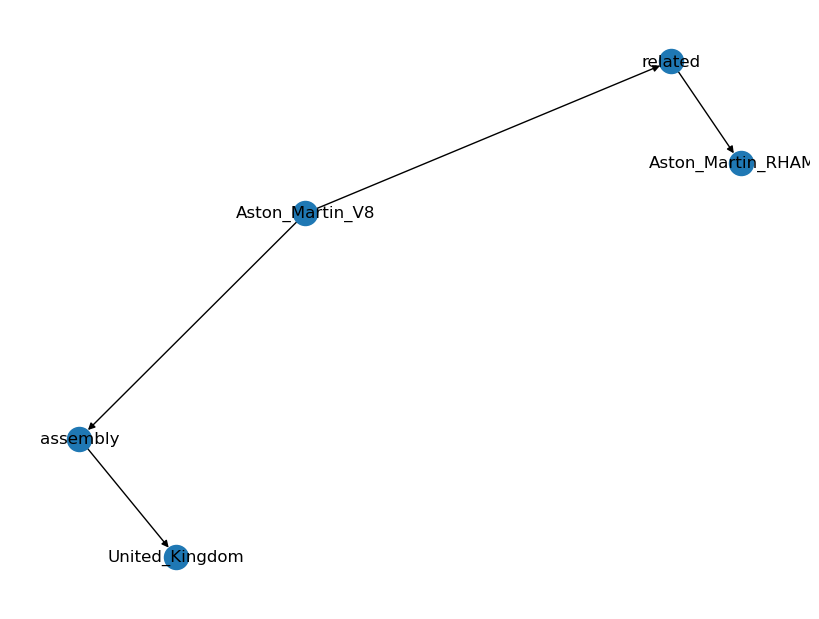

Decoded Input: 
 translate graph to text:  Aston_Martin_V8  assembly  United_Kingdom  Aston_Martin_V8  related  Aston_Martin_RHAM/1
Decoded Target: 
 The Aston Martin V8 - assembled in the United Kingdom - and Aston Martin RHAM/1 are related means of transportation.
DataBatch(x=[1, 512], edge_index=[2, 4], attention_mask=[1, 512], y=[1, 512], batch=[512], ptr=[2])
Original Sample: 
 translate graph to text: <H> Aston_Martin_V8  <R>  manufacturer  <T>  Aston_Martin <H> Aston_Martin_V8  <R>  successor  <T>  Aston_Martin_Virage 
 Aston Martin made the Aston Martin V8, which was succeeded by the Aston Martin Virage.
NetworkX Graph: 
 [('Aston_Martin_V8', 'manufacturer', 0), ('Aston_Martin_V8', 'successor', 0), ('manufacturer', 'Aston_Martin', 0), ('successor', 'Aston_Martin_Virage', 0)]


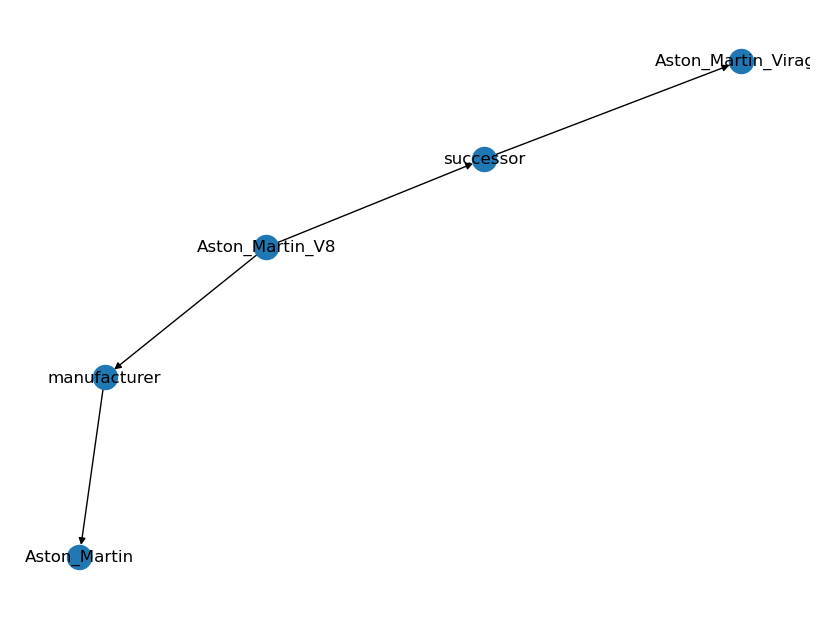

Decoded Input: 
 translate graph to text:  Aston_Martin_V8  manufacturer  Aston_Martin  Aston_Martin_V8  successor  Aston_Martin_Virage
Decoded Target: 
 Aston Martin made the Aston Martin V8, which was succeeded by the Aston Martin Virage.
DataBatch(x=[1, 512], edge_index=[2, 4], attention_mask=[1, 512], y=[1, 512], batch=[512], ptr=[2])
Original Sample: 
 translate graph to text: <H> Aston_Martin_V8  <R>  related  <T>  Aston_Martin_DBS <H> Aston_Martin_V8  <R>  successor  <T>  Aston_Martin_Virage 
 Aston Martin DBS is a related means of transport to the Aston Martin V8, which was succeeded by the Aston Martin Virage.
NetworkX Graph: 
 [('Aston_Martin_V8', 'related', 0), ('Aston_Martin_V8', 'successor', 0), ('related', 'Aston_Martin_DBS', 0), ('successor', 'Aston_Martin_Virage', 0)]


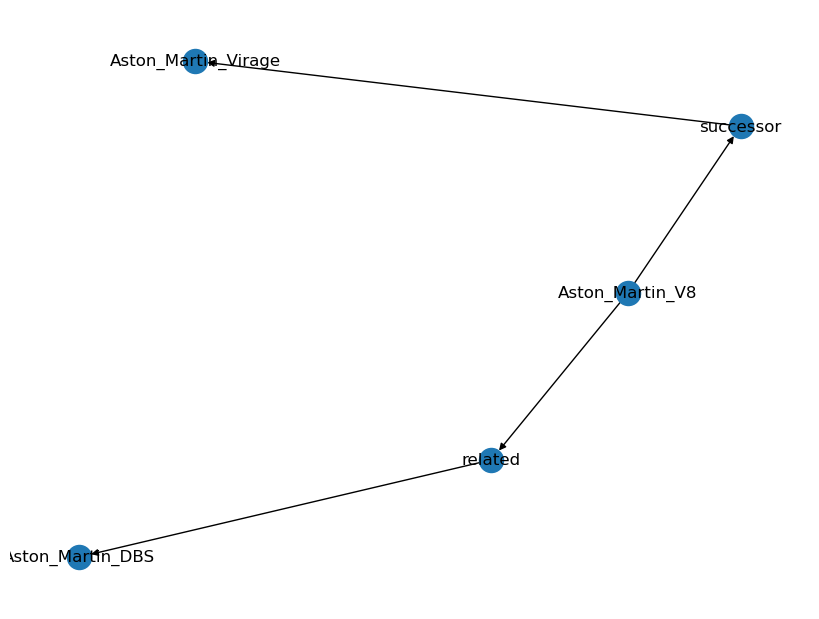

Decoded Input: 
 translate graph to text:  Aston_Martin_V8  related  Aston_Martin_DBS  Aston_Martin_V8  successor  Aston_Martin_Virage
Decoded Target: 
 Aston Martin DBS is a related means of transport to the Aston Martin V8, which was succeeded by the Aston Martin Virage.
DataBatch(x=[1, 512], edge_index=[2, 4], attention_mask=[1, 512], y=[1, 512], batch=[512], ptr=[2])
Original Sample: 
 translate graph to text: <H> Aston_Martin_V8  <R>  successor  <T>  Aston_Martin_Virage <H> Aston_Martin_Virage  <R>  manufacturer  <T>  Aston_Martin 
 The Aston Martin V8 was succeeded by the Aston Martin Virage which is made by the company Aston Martin.
NetworkX Graph: 
 [('Aston_Martin_V8', 'successor', 0), ('successor', 'Aston_Martin_Virage', 0), ('Aston_Martin_Virage', 'manufacturer', 0), ('manufacturer', 'Aston_Martin', 0)]


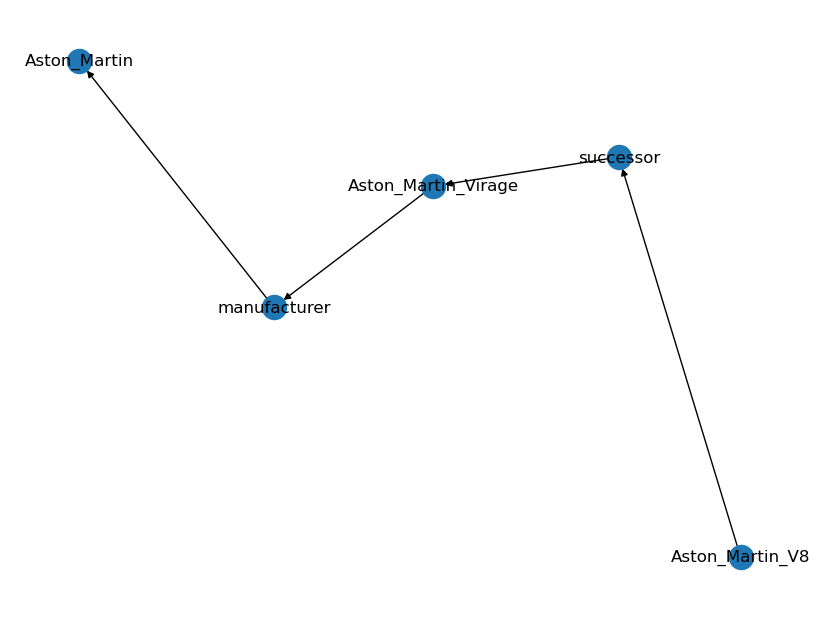

Decoded Input: 
 translate graph to text:  Aston_Martin_V8  successor  Aston_Martin_Virage  Aston_Martin_Virage  manufacturer  Aston_Martin
Decoded Target: 
 The Aston Martin V8 was succeeded by the Aston Martin Virage which is made by the company Aston Martin.
DataBatch(x=[1, 512], edge_index=[2, 4], attention_mask=[1, 512], y=[1, 512], batch=[512], ptr=[2])
Original Sample: 
 translate graph to text: <H> Atlas_II  <R>  finalFlight  <T>  "1998-03-16"^^xsd:date <H> Atlas_II  <R>  diameter  <T>  "3.04 m"@en 
 Atlas II, which is 3.04m in diameter, had its final flight on March 16th 1998.
NetworkX Graph: 
 [('Atlas_II', 'finalFlight', 0), ('Atlas_II', 'diameter', 0), ('finalFlight', '"1998-03-16"^^xsd:date', 0), ('diameter', '"3.04 m"@en', 0)]


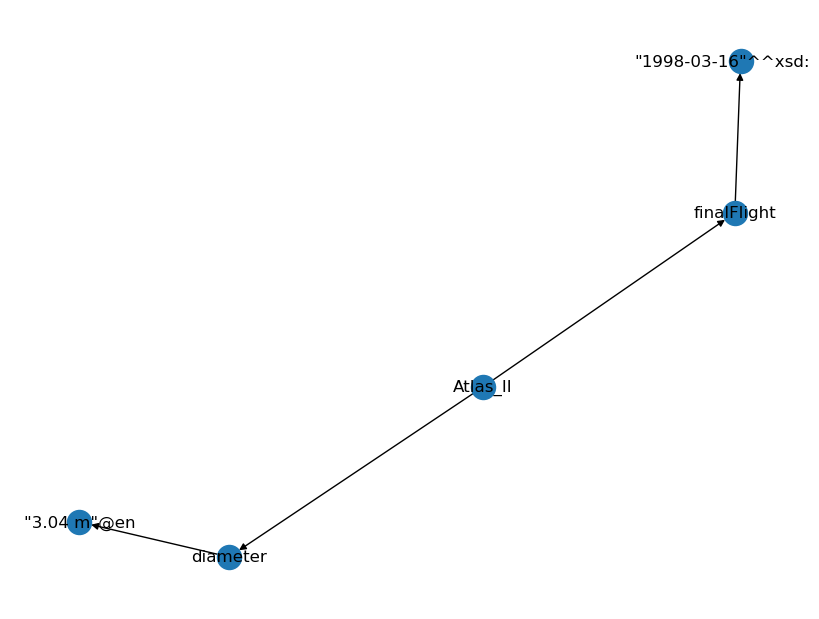

Decoded Input: 
 translate graph to text:  Atlas_II  finalFlight  "1998-03-16"xsd:date  Atlas_II  diameter  "3.04 m"@en
Decoded Target: 
 Atlas II, which is 3.04m in diameter, had its final flight on March 16th 1998.
DataBatch(x=[1, 512], edge_index=[2, 4], attention_mask=[1, 512], y=[1, 512], batch=[512], ptr=[2])
Original Sample: 
 translate graph to text: <H> Atlas_II  <R>  sites  <T>  Cape_Canaveral_Air_Force_Station <H> Atlas_II  <R>  manufacturer  <T>  Lockheed_Martin 
 The Lockheed Martin manufactured Atlas II was launched from Cape Canaveral Air Force Station.
NetworkX Graph: 
 [('Atlas_II', 'sites', 0), ('Atlas_II', 'manufacturer', 0), ('sites', 'Cape_Canaveral_Air_Force_Station', 0), ('manufacturer', 'Lockheed_Martin', 0)]


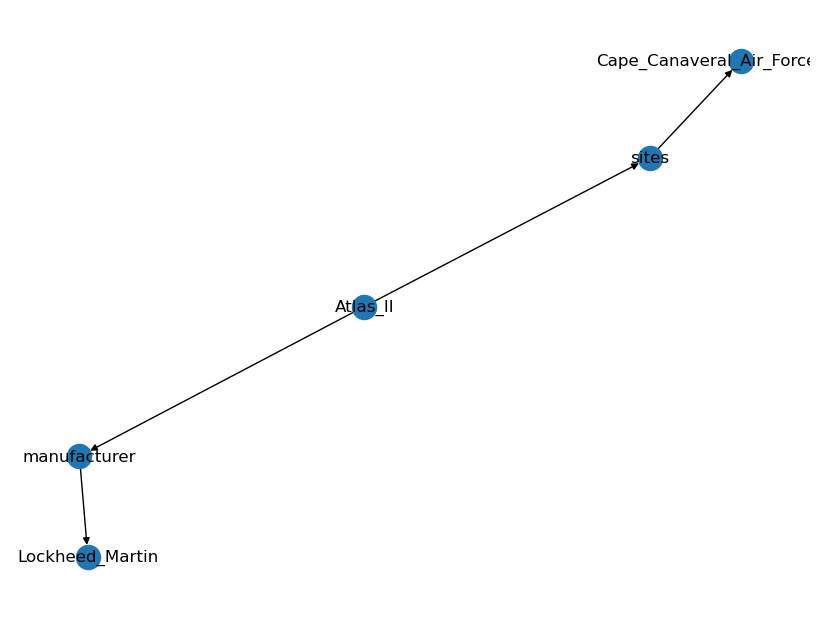

Decoded Input: 
 translate graph to text:  Atlas_II  sites  Cape_Canaveral_Air_Force_Station  Atlas_II  manufacturer  Lockheed_Martin
Decoded Target: 
 The Lockheed Martin manufactured Atlas II was launched from Cape Canaveral Air Force Station.
DataBatch(x=[1, 512], edge_index=[2, 4], attention_mask=[1, 512], y=[1, 512], batch=[512], ptr=[2])
Original Sample: 
 translate graph to text: <H> Audi_A1  <R>  manufacturer  <T>  Audi <H> Audi  <R>  division  <T>  Audi_e-tron 
 Audi e-tron is a division of Audi, who make the Audi A1.
NetworkX Graph: 
 [('Audi_A1', 'manufacturer', 0), ('manufacturer', 'Audi', 0), ('Audi', 'division', 0), ('division', 'Audi_e-tron', 0)]


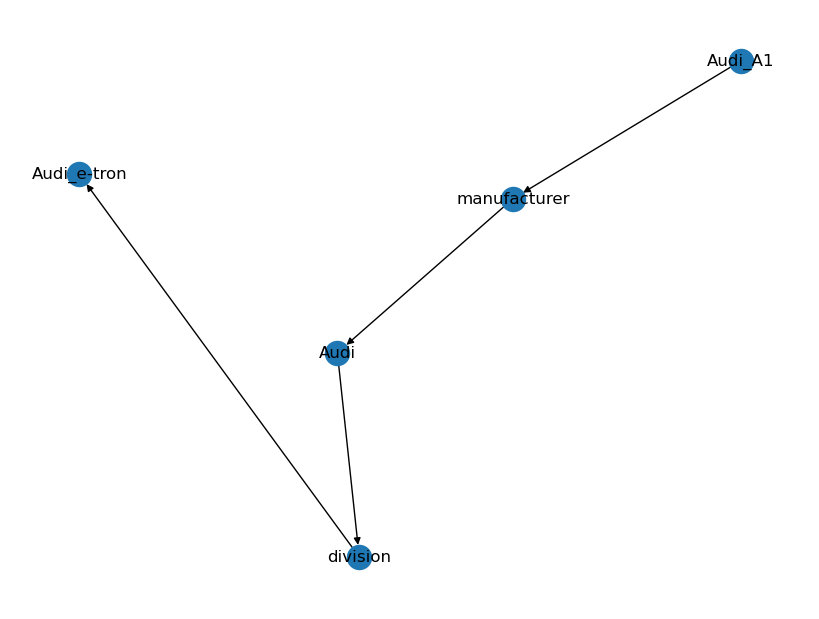

Decoded Input: 
 translate graph to text:  Audi_A1  manufacturer  Audi  Audi  division  Audi_e-tron
Decoded Target: 
 Audi e-tron is a division of Audi, who make the Audi A1.
DataBatch(x=[1, 512], edge_index=[2, 4], attention_mask=[1, 512], y=[1, 512], batch=[512], ptr=[2])
Original Sample: 
 translate graph to text: <H> Audi_A1  <R>  manufacturer  <T>  Audi <H> Audi  <R>  subsidiary  <T>  Ducati 
 Audi A1 is made by Audi who also own Ducati.
NetworkX Graph: 
 [('Audi_A1', 'manufacturer', 0), ('manufacturer', 'Audi', 0), ('Audi', 'subsidiary', 0), ('subsidiary', 'Ducati', 0)]


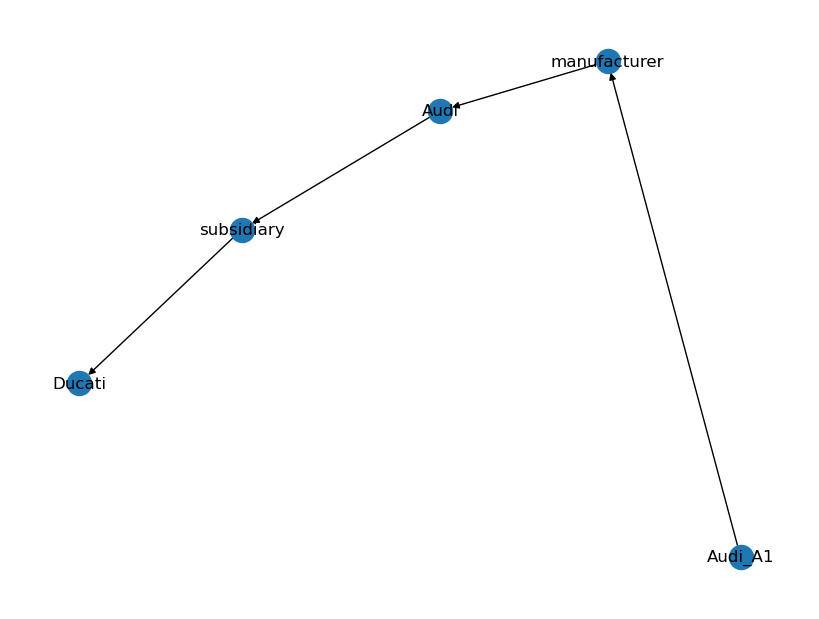

Decoded Input: 
 translate graph to text:  Audi_A1  manufacturer  Audi  Audi  subsidiary  Ducati
Decoded Target: 
 Audi A1 is made by Audi who also own Ducati.
DataBatch(x=[1, 512], edge_index=[2, 4], attention_mask=[1, 512], y=[1, 512], batch=[512], ptr=[2])
Original Sample: 
 translate graph to text: <H> Audi_A1  <R>  manufacturer  <T>  Audi <H> Audi  <R>  subsidiary  <T>  Quattro_GmbH 
 Audi A1 is made by Audi, a subsidiary of which, is the Quattro Gmbh.
NetworkX Graph: 
 [('Audi_A1', 'manufacturer', 0), ('manufacturer', 'Audi', 0), ('Audi', 'subsidiary', 0), ('subsidiary', 'Quattro_GmbH', 0)]


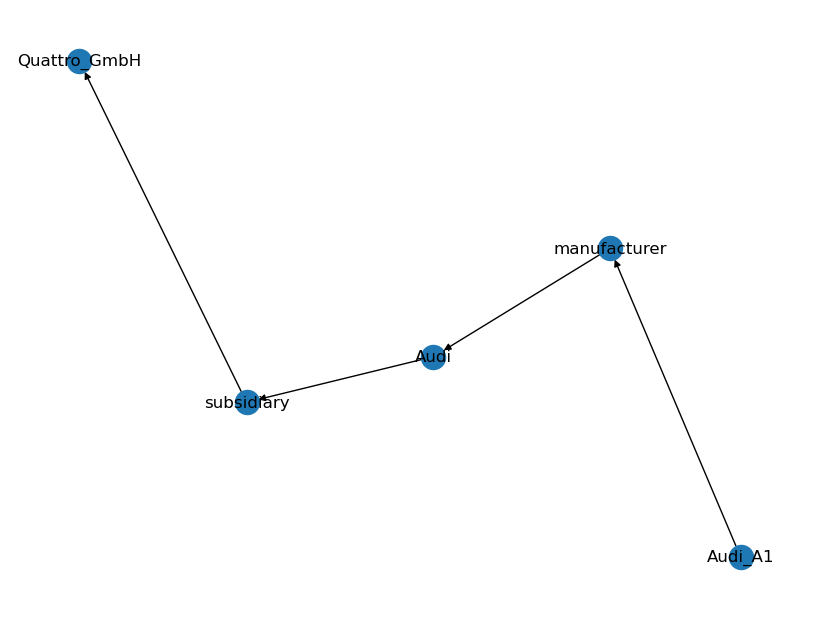

Decoded Input: 
 translate graph to text:  Audi_A1  manufacturer  Audi  Audi  subsidiary  Quattro_GmbH
Decoded Target: 
 Audi A1 is made by Audi, a subsidiary of which, is the Quattro Gmbh.
DataBatch(x=[1, 512], edge_index=[2, 4], attention_mask=[1, 512], y=[1, 512], batch=[512], ptr=[2])
Original Sample: 
 translate graph to text: <H> Caterpillar_Inc.  <R>  keyPerson  <T>  Douglas_R._Oberhelman <H> AIDAluna  <R>  powerType  <T>  Caterpillar_Inc. 
 Douglas R Oberhelman is a person at Caterpillar Inc. where the AIDAluna is manufactured.
NetworkX Graph: 
 [('Caterpillar_Inc.', 'keyPerson', 0), ('keyPerson', 'Douglas_R._Oberhelman', 0), ('AIDAluna', 'powerType', 0), ('powerType', 'Caterpillar_Inc.', 0)]


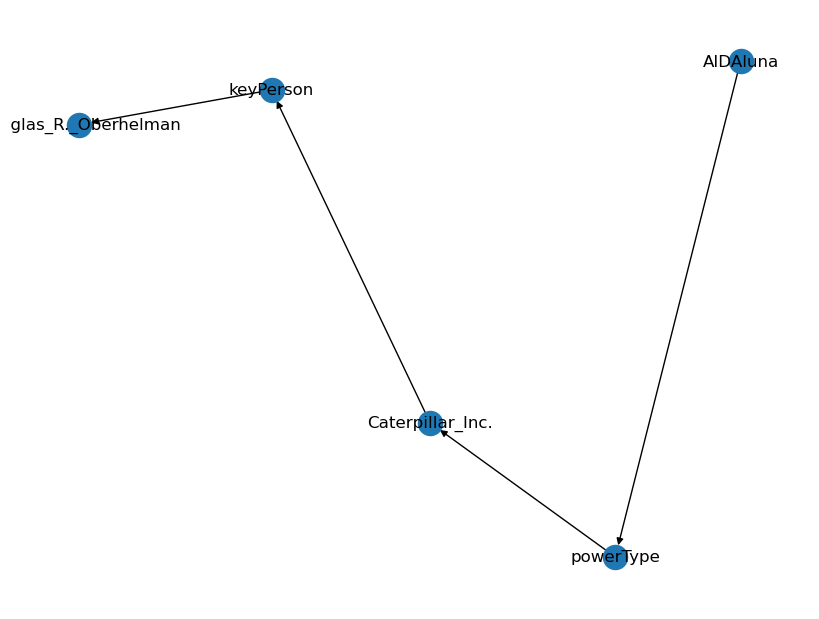

Decoded Input: 
 translate graph to text:  Caterpillar_Inc.  keyPerson  Douglas_R._Oberhelman  AIDAluna  powerType  Caterpillar_Inc.
Decoded Target: 
 Douglas R Oberhelman is a person at Caterpillar Inc. where the AIDAluna is manufactured.
DataBatch(x=[1, 512], edge_index=[2, 4], attention_mask=[1, 512], y=[1, 512], batch=[512], ptr=[2])
Original Sample: 
 translate graph to text: <H> Delta_II  <R>  launchSite  <T>  Vandenberg_Air_Force_Base <H> Antares_(rocket)  <R>  comparable  <T>  Delta_II 
 The Antares rocket is comparable with the Delta II whose launch site was at Vandenberg Air Force Base.
NetworkX Graph: 
 [('Delta_II', 'launchSite', 0), ('launchSite', 'Vandenberg_Air_Force_Base', 0), ('Antares_', 'comparable', 0), ('comparable', 'Delta_II', 0)]


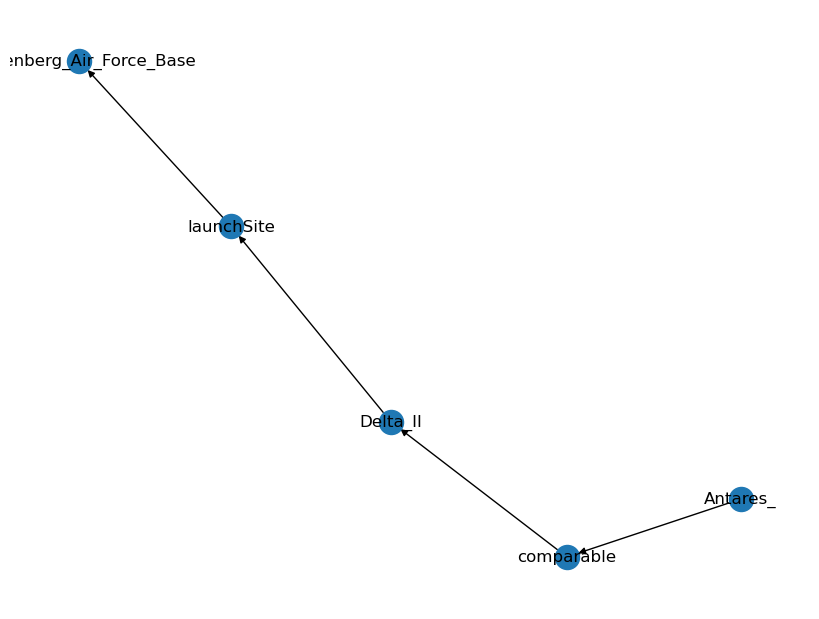

Decoded Input: 
 translate graph to text:  Delta_II  launchSite  Vandenberg_Air_Force_Base  Antares_(rocket)  comparable  Delta_II
Decoded Target: 
 The Antares rocket is comparable with the Delta II whose launch site was at Vandenberg Air Force Base.
DataBatch(x=[1, 512], edge_index=[2, 4], attention_mask=[1, 512], y=[1, 512], batch=[512], ptr=[2])
Original Sample: 
 translate graph to text: <H> Aleksey_Chirikov_(icebreaker)  <R>  shipBuilder  <T>  Finland <H> Finland  <R>  leaderName  <T>  Juha_Sipilä 
 The icebreaker Aleksey Chirikov was built in Finland where Juha Sipila is a leader.
NetworkX Graph: 
 [('Aleksey_Chirikov_', 'shipBuilder', 0), ('shipBuilder', 'Finland', 0), ('Finland', 'leaderName', 0), ('leaderName', 'Juha_Sipilä', 0)]


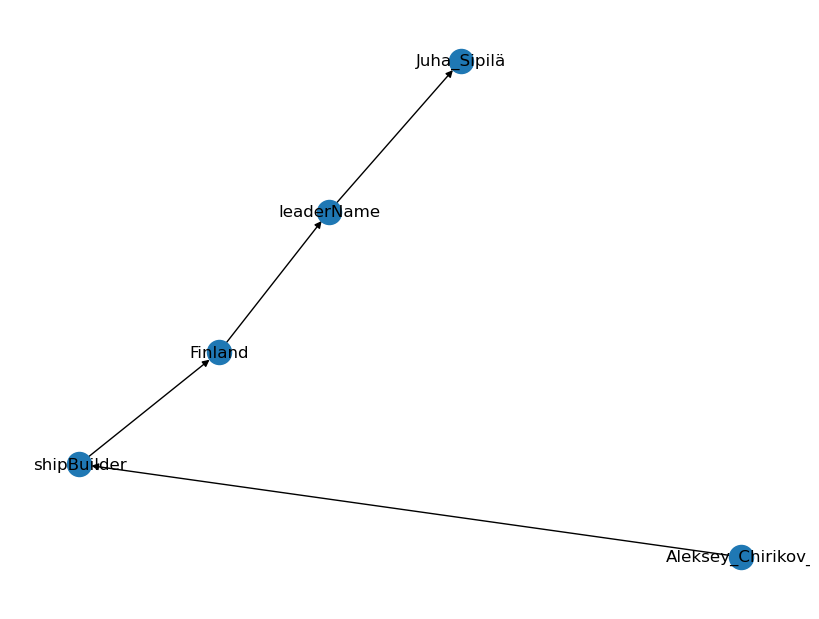

Decoded Input: 
 translate graph to text:  Aleksey_Chirikov_(icebreaker)  shipBuilder  Finland  Finland  leaderName  Juha_Sipilä
Decoded Target: 
 The icebreaker Aleksey Chirikov was built in Finland where Juha Sipila is a leader.
DataBatch(x=[1, 512], edge_index=[2, 4], attention_mask=[1, 512], y=[1, 512], batch=[512], ptr=[2])
Original Sample: 
 translate graph to text: <H> American_submarine_NR-1  <R>  builder  <T>  General_Dynamics_Electric_Boat <H> General_Dynamics_Electric_Boat  <R>  parent  <T>  General_Dynamics 
 General Dynamics is the parent company of, the General Dynamics Electric Boat Co. which is the builder of the American submarine NR-1.
NetworkX Graph: 
 [('American_submarine_NR-1', 'builder', 0), ('builder', 'General_Dynamics_Electric_Boat', 0), ('General_Dynamics_Electric_Boat', 'parent', 0), ('parent', 'General_Dynamics', 0)]


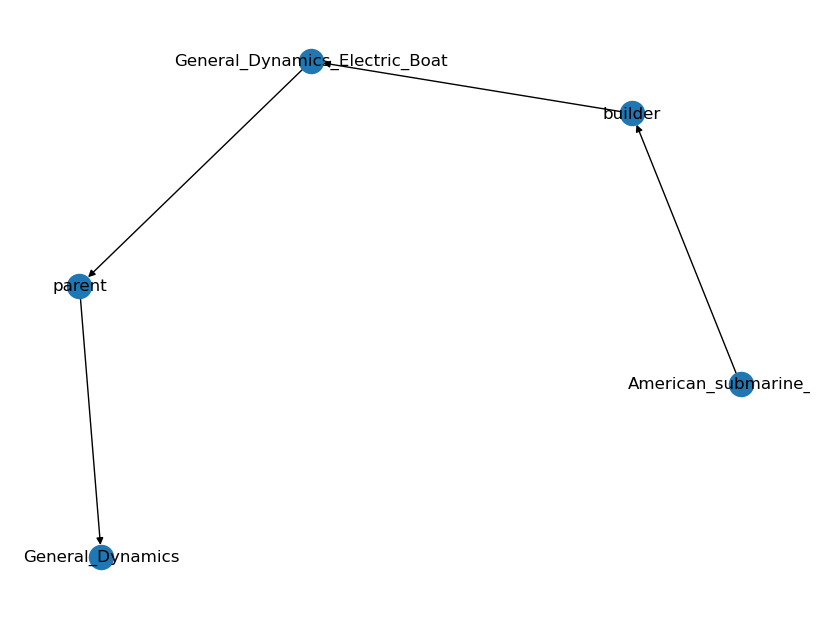

Decoded Input: 
 translate graph to text:  American_submarine_NR-1  builder  General_Dynamics_Electric_Boat  General_Dynamics_Electric_Boat  parent  General_Dynamics
Decoded Target: 
 General Dynamics is the parent company of, the General Dynamics Electric Boat Co. which is the builder of the American submarine NR-1.
DataBatch(x=[1, 512], edge_index=[2, 4], attention_mask=[1, 512], y=[1, 512], batch=[512], ptr=[2])
Original Sample: 
 translate graph to text: <H> MTU_Friedrichshafen  <R>  owningCompany  <T>  Rolls-Royce_Holdings <H> A-Rosa_Luna  <R>  powerType  <T>  MTU_Friedrichshafen 
 The A-Rosa Luna is powered by an engine made by MTU Friedrichshafen which is owned by Rolls-Royce Holdings.
NetworkX Graph: 
 [('MTU_Friedrichshafen', 'owningCompany', 0), ('owningCompany', 'Rolls-Royce_Holdings', 0), ('A-Rosa_Luna', 'powerType', 0), ('powerType', 'MTU_Friedrichshafen', 0)]


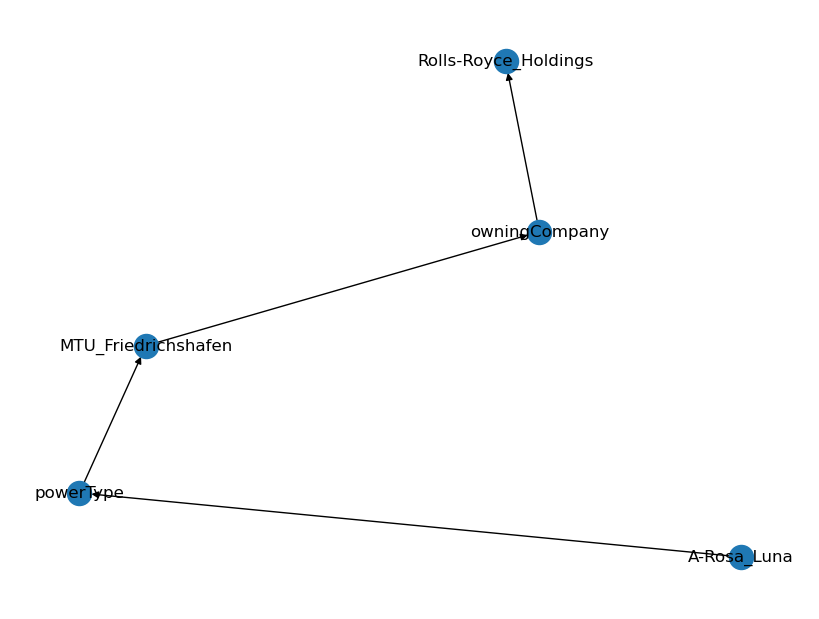

Decoded Input: 
 translate graph to text:  MTU_Friedrichshafen  owningCompany  Rolls-Royce_Holdings  A-Rosa_Luna  powerType  MTU_Friedrichshafen
Decoded Target: 
 The A-Rosa Luna is powered by an engine made by MTU Friedrichshafen which is owned by Rolls-Royce Holdings.
DataBatch(x=[1, 512], edge_index=[2, 4], attention_mask=[1, 512], y=[1, 512], batch=[512], ptr=[2])
Original Sample: 
 translate graph to text: <H> United_Kingdom  <R>  leader  <T>  Elizabeth_II <H> Aston_Martin_V8  <R>  assembly  <T>  United_Kingdom 
 The Aston Martin V8 is assembled in the United Kingdom, the leader of which, is Elizabeth II.
NetworkX Graph: 
 [('United_Kingdom', 'leader', 0), ('leader', 'Elizabeth_II', 0), ('Aston_Martin_V8', 'assembly', 0), ('assembly', 'United_Kingdom', 0)]


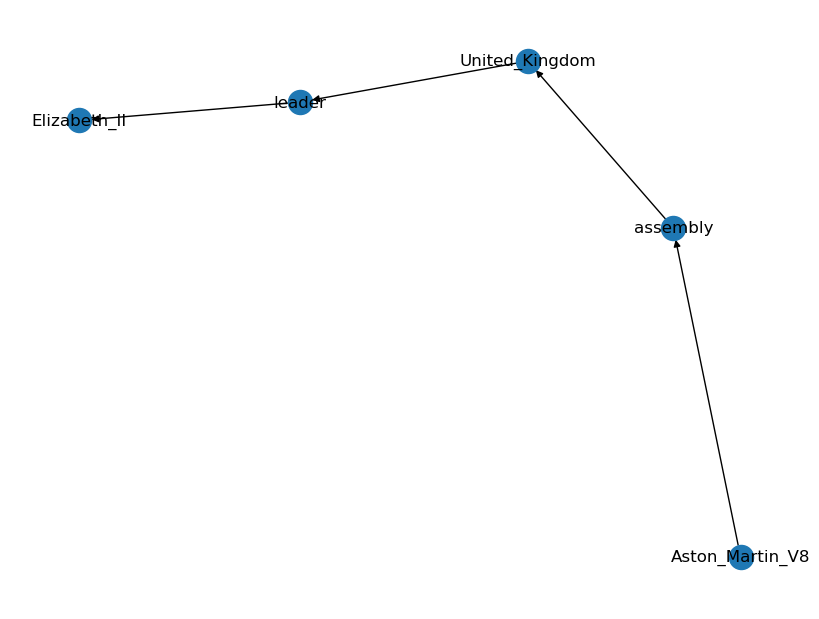

Decoded Input: 
 translate graph to text:  United_Kingdom  leader  Elizabeth_II  Aston_Martin_V8  assembly  United_Kingdom
Decoded Target: 
 The Aston Martin V8 is assembled in the United Kingdom, the leader of which, is Elizabeth II.
DataBatch(x=[1, 512], edge_index=[2, 4], attention_mask=[1, 512], y=[1, 512], batch=[512], ptr=[2])
Original Sample: 
 translate graph to text: <H> Aaron_S._Daggett  <R>  award  <T>  Purple_Heart <H> Aaron_S._Daggett  <R>  birthPlace  <T>  Maine <H> Aaron_S._Daggett  <R>  battles  <T>  Battle_of_Fredericksburg 
 Purple Heart recipient Aaron S. Daggat was born in Maine and, most notably, fought in the Battle of Fredericksburg.
NetworkX Graph: 
 [('Aaron_S._Daggett', 'award', 0), ('Aaron_S._Daggett', 'birthPlace', 0), ('Aaron_S._Daggett', 'battles', 0), ('award', 'Purple_Heart', 0), ('birthPlace', 'Maine', 0), ('battles', 'Battle_of_Fredericksburg', 0)]


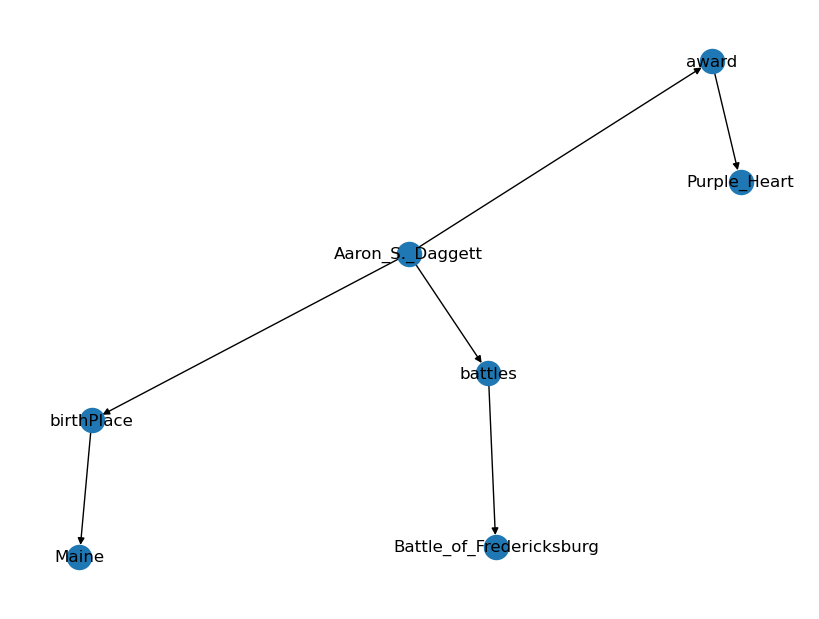

Decoded Input: 
 translate graph to text:  Aaron_S._Daggett  award  Purple_Heart  Aaron_S._Daggett  birthPlace  Maine  Aaron_S._Daggett  battles  Battle_of_Fredericksburg
Decoded Target: 
 Purple Heart recipient Aaron S. Daggat was born in Maine and, most notably, fought in the Battle of Fredericksburg.
DataBatch(x=[1, 512], edge_index=[2, 6], attention_mask=[1, 512], y=[1, 512], batch=[512], ptr=[2])
Original Sample: 
 translate graph to text: <H> Ab_Klink  <R>  almaMater  <T>  Erasmus_University_Rotterdam <H> Ab_Klink  <R>  party  <T>  Christian_Democratic_Appeal <H> Ab_Klink  <R>  birthPlace  <T>  Netherlands 
 Ab Klink was born in the Netherlands, belongs to the Christian Democratic Appeal party and graduated from Erasmus University in Rotterdam.
NetworkX Graph: 
 [('Ab_Klink', 'almaMater', 0), ('Ab_Klink', 'party', 0), ('Ab_Klink', 'birthPlace', 0), ('almaMater', 'Erasmus_University_Rotterdam', 0), ('party', 'Christian_Democratic_Appeal', 0), ('birthPlace', 'Netherlands', 0)]


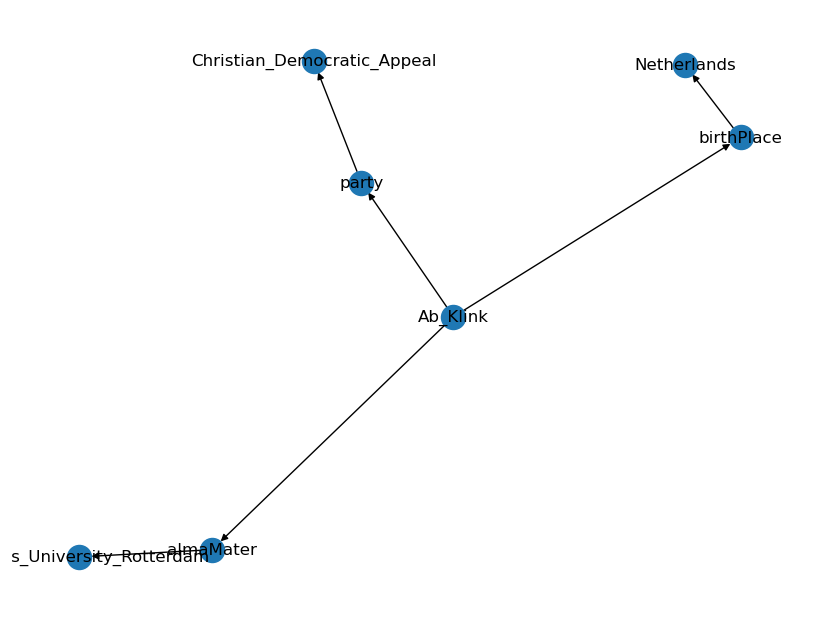

Decoded Input: 
 translate graph to text:  Ab_Klink  almaMater  Erasmus_University_Rotterdam  Ab_Klink  party  Christian_Democratic_Appeal  Ab_Klink  birthPlace  Netherlands
Decoded Target: 
 Ab Klink was born in the Netherlands, belongs to the Christian Democratic Appeal party and graduated from Erasmus University in Rotterdam.
DataBatch(x=[1, 512], edge_index=[2, 6], attention_mask=[1, 512], y=[1, 512], batch=[512], ptr=[2])
Original Sample: 
 translate graph to text: <H> Abdul_Rahman_Ya'kub  <R>  deputy  <T>  Stephen_Yong_Kuet_Tze <H> Abdul_Taib_Mahmud  <R>  birthPlace  <T>  Kingdom_of_Sarawak <H> Abdul_Taib_Mahmud  <R>  successor  <T>  Abdul_Rahman_Ya'kub 
 Abdul Taib Mahmud was born in the Kingdom of Sarawak and he succeeded Abdul Rahman Ya'kub. Stephen Yong Kuet Tze is the deputy to Abdul Rahman Ya'kub.
NetworkX Graph: 
 [("Abdul_Rahman_Ya'kub", 'deputy', 0), ('deputy', 'Stephen_Yong_Kuet_Tze', 0), ('Abdul_Taib_Mahmud', 'birthPlace', 0), ('Abdul_Taib_Mahmud', 'successor', 0), ('b

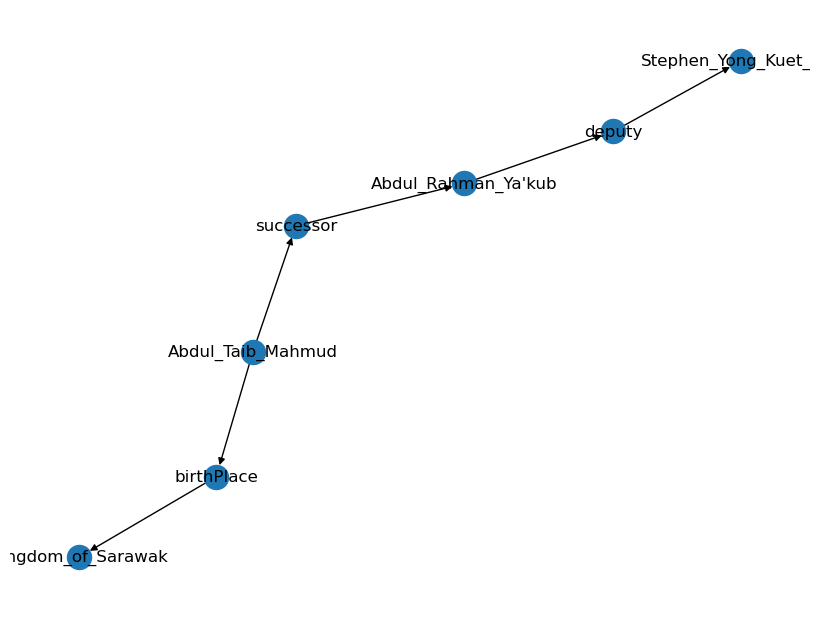

Decoded Input: 
 translate graph to text:  Abdul_Rahman_Ya'kub  deputy  Stephen_Yong_Kuet_Tze  Abdul_Taib_Mahmud  birthPlace  Kingdom_of_Sarawak  Abdul_Taib_Mahmud  successor  Abdul_Rahman_Ya'kub
Decoded Target: 
 Abdul Taib Mahmud was born in the Kingdom of Sarawak and he succeeded Abdul Rahman Ya'kub. Stephen Yong Kuet Tze is the deputy to Abdul Rahman Ya'kub.
DataBatch(x=[1, 512], edge_index=[2, 6], attention_mask=[1, 512], y=[1, 512], batch=[512], ptr=[2])
Original Sample: 
 translate graph to text: <H> Abdul_Taib_Mahmud  <R>  residence  <T>  Sarawak <H> Abdul_Taib_Mahmud  <R>  birthPlace  <T>  Kingdom_of_Sarawak <H> Abdul_Taib_Mahmud  <R>  party  <T>  "Barisan Ra'ayat Jati Sarawak"@en 
 Born in the Kingdom of Sarawak, Abdul Taib Mahmud, resides in Sarawak and is a member of Barisan Ra'ayat Jati Sarawak party.
NetworkX Graph: 
 [('Abdul_Taib_Mahmud', 'residence', 0), ('Abdul_Taib_Mahmud', 'birthPlace', 0), ('Abdul_Taib_Mahmud', 'party', 0), ('residence', 'Sarawak', 0), ('birthPlace

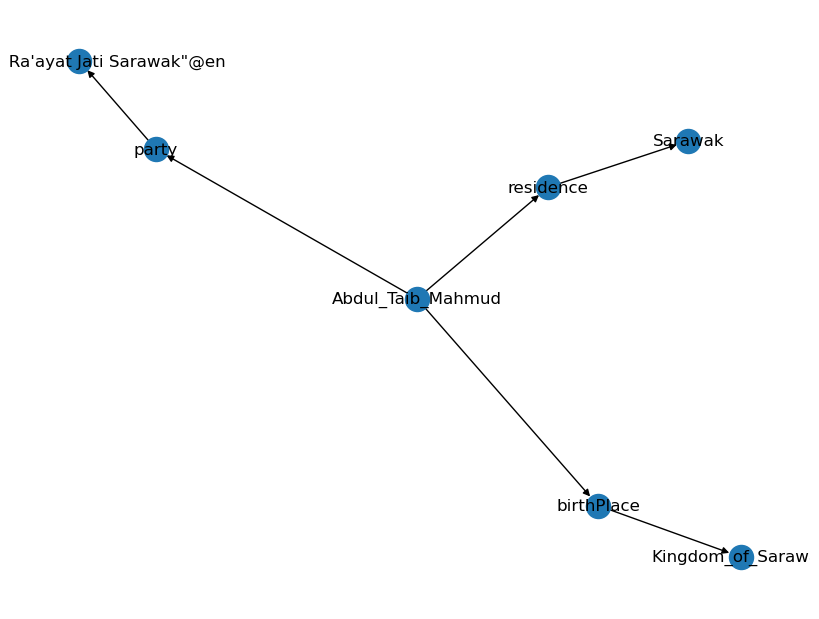

Decoded Input: 
 translate graph to text:  Abdul_Taib_Mahmud  residence  Sarawak  Abdul_Taib_Mahmud  birthPlace  Kingdom_of_Sarawak  Abdul_Taib_Mahmud  party  "Barisan Ra'ayat Jati Sarawak"@en
Decoded Target: 
 Born in the Kingdom of Sarawak, Abdul Taib Mahmud, resides in Sarawak and is a member of Barisan Ra'ayat Jati Sarawak party.
DataBatch(x=[1, 512], edge_index=[2, 6], attention_mask=[1, 512], y=[1, 512], batch=[512], ptr=[2])
Original Sample: 
 translate graph to text: <H> Abdulsalami_Abubakar  <R>  office  <T>  "Chief of Defence Staff" <H> Abdulsalami_Abubakar  <R>  birthPlace  <T>  Niger_State <H> Abdulsalami_Abubakar  <R>  almaMater  <T>  Technical_Institute,_Kaduna 
 Abdulsalami Abubakar was born in Niger State, graduated from the Technical Institute Kaduna and worked as the Nigerian Chief of the Defence Staff.
NetworkX Graph: 
 [('Abdulsalami_Abubakar', 'office', 0), ('Abdulsalami_Abubakar', 'birthPlace', 0), ('Abdulsalami_Abubakar', 'almaMater', 0), ('office', '"Chief of De

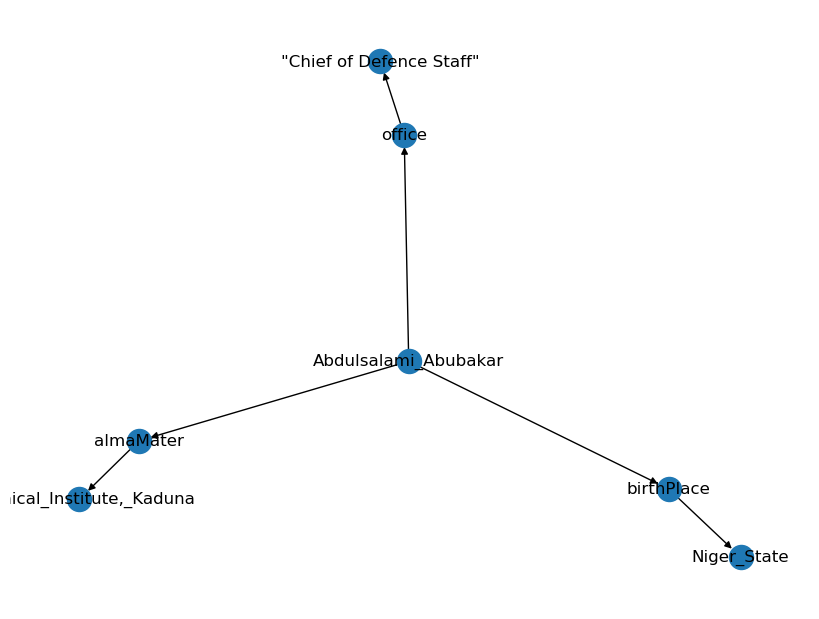

Decoded Input: 
 translate graph to text:  Abdulsalami_Abubakar  office  "Chief of Defence Staff"  Abdulsalami_Abubakar  birthPlace  Niger_State  Abdulsalami_Abubakar  almaMater  Technical_Institute,_Kaduna
Decoded Target: 
 Abdulsalami Abubakar was born in Niger State, graduated from the Technical Institute Kaduna and worked as the Nigerian Chief of the Defence Staff.
DataBatch(x=[1, 512], edge_index=[2, 6], attention_mask=[1, 512], y=[1, 512], batch=[512], ptr=[2])
Original Sample: 
 translate graph to text: <H> Abdulsalami_Abubakar  <R>  successor  <T>  Olusegun_Obasanjo <H> Abdulsalami_Abubakar  <R>  militaryBranch  <T>  Nigerian_Air_Force <H> Olusegun_Obasanjo  <R>  vicePresident  <T>  Atiku_Abubakar 
 Abdulsalami Abubakar, who served in the Nigerian Air Force, was succeeded by Olusegun Obasanjo, who was in office at the same time that Atiku Abubakar was Vice President.
NetworkX Graph: 
 [('Abdulsalami_Abubakar', 'successor', 0), ('Abdulsalami_Abubakar', 'militaryBranch', 0), ('su

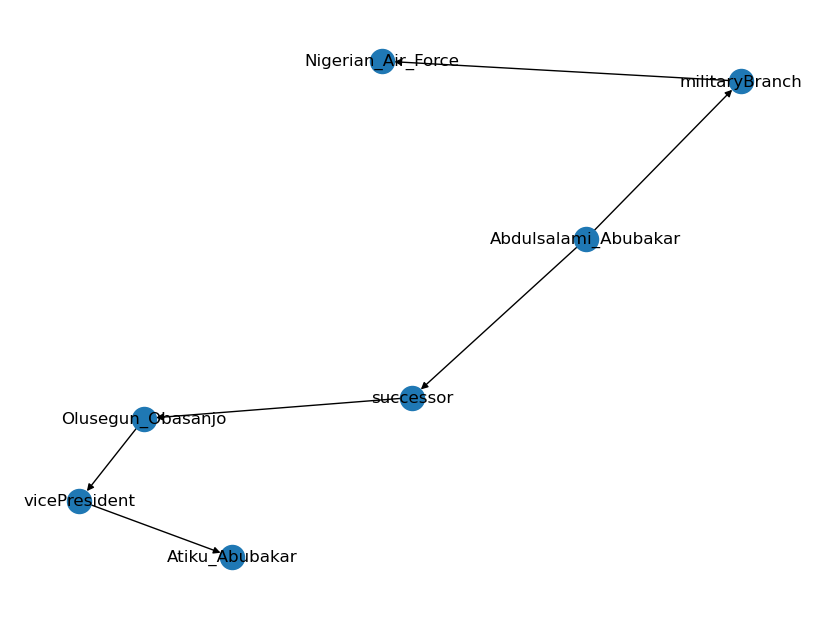

Decoded Input: 
 translate graph to text:  Abdulsalami_Abubakar  successor  Olusegun_Obasanjo  Abdulsalami_Abubakar  militaryBranch  Nigerian_Air_Force  Olusegun_Obasanjo  vicePresident  Atiku_Abubakar
Decoded Target: 
 Abdulsalami Abubakar, who served in the Nigerian Air Force, was succeeded by Olusegun Obasanjo, who was in office at the same time that Atiku Abubakar was Vice President.
DataBatch(x=[1, 512], edge_index=[2, 6], attention_mask=[1, 512], y=[1, 512], batch=[512], ptr=[2])
Original Sample: 
 translate graph to text: <H> Abdulsalami_Abubakar  <R>  successor  <T>  Olusegun_Obasanjo <H> Abdulsalami_Abubakar  <R>  militaryBranch  <T>  Nigerian_Army <H> Olusegun_Obasanjo  <R>  vicePresident  <T>  Atiku_Abubakar 
 Olusegun Obasanjo was succeeded by Abdulsalami Abubakar of the Nigerian Army and was in office during Atiku Abubaker's Vice Presidency.
NetworkX Graph: 
 [('Abdulsalami_Abubakar', 'successor', 0), ('Abdulsalami_Abubakar', 'militaryBranch', 0), ('successor', 'Olusegun_O

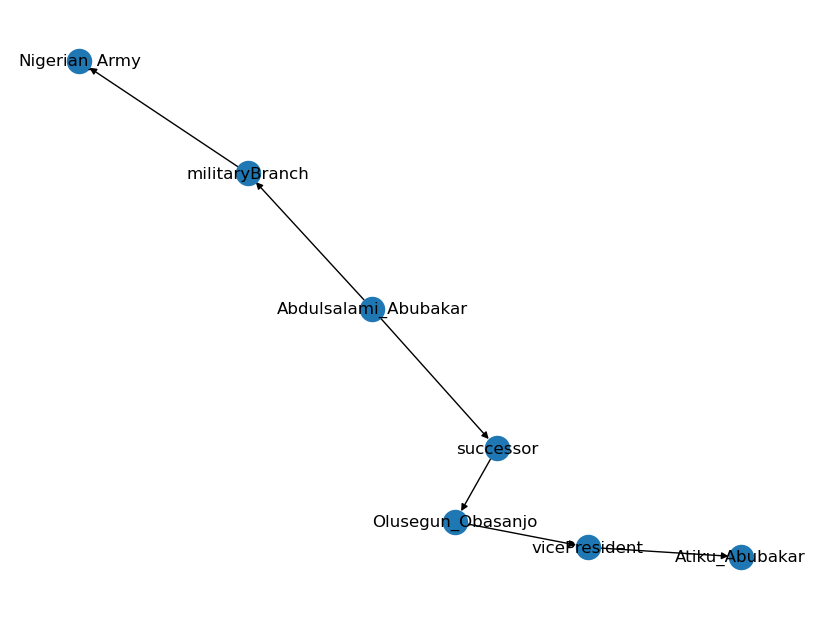

Decoded Input: 
 translate graph to text:  Abdulsalami_Abubakar  successor  Olusegun_Obasanjo  Abdulsalami_Abubakar  militaryBranch  Nigerian_Army  Olusegun_Obasanjo  vicePresident  Atiku_Abubakar
Decoded Target: 
 Olusegun Obasanjo was succeeded by Abdulsalami Abubakar of the Nigerian Army and was in office during Atiku Abubaker's Vice Presidency.
DataBatch(x=[1, 512], edge_index=[2, 6], attention_mask=[1, 512], y=[1, 512], batch=[512], ptr=[2])
Original Sample: 
 translate graph to text: <H> Abel_Caballero  <R>  birthPlace  <T>  Ponteareas <H> Abel_Caballero  <R>  office  <T>  "Member of the Congress of Deputies"@en <H> Abel_Caballero  <R>  placeOfBirth  <T>  Galicia_(Spain) 
 Abel Caballero was born in Ponteareas in Galicia, Spain and worked as a Member of the Congress of Deputies.
NetworkX Graph: 
 [('Abel_Caballero', 'birthPlace', 0), ('Abel_Caballero', 'office', 0), ('Abel_Caballero', 'placeOfBirth', 0), ('birthPlace', 'Ponteareas', 0), ('office', '"Member of the Congress of Depu

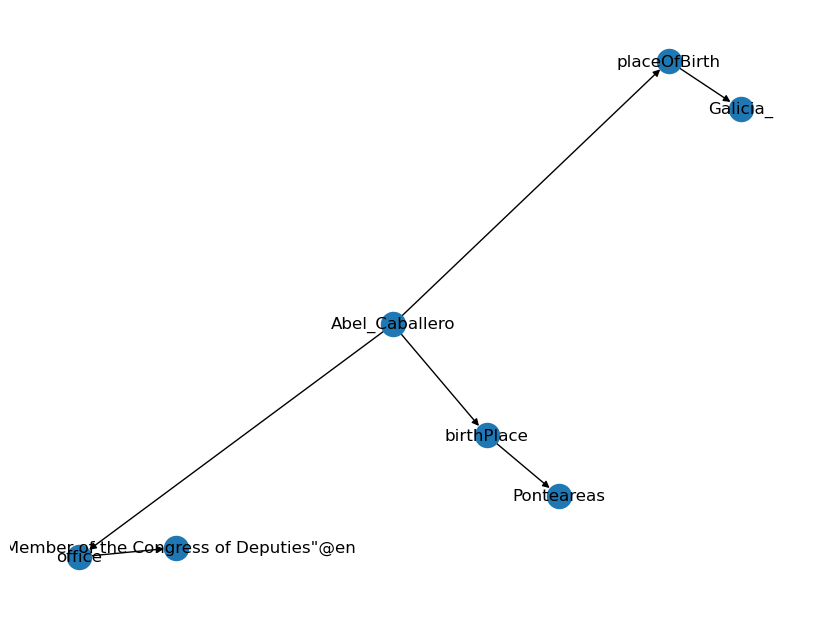

Decoded Input: 
 translate graph to text:  Abel_Caballero  birthPlace  Ponteareas  Abel_Caballero  office  "Member of the Congress of Deputies"@en  Abel_Caballero  placeOfBirth  Galicia_(Spain)
Decoded Target: 
 Abel Caballero was born in Ponteareas in Galicia, Spain and worked as a Member of the Congress of Deputies.
DataBatch(x=[1, 512], edge_index=[2, 6], attention_mask=[1, 512], y=[1, 512], batch=[512], ptr=[2])
Original Sample: 
 translate graph to text: <H> Abel_Caballero  <R>  birthPlace  <T>  Spain <H> Abel_Caballero  <R>  placeOfBirth  <T>  Galicia_(Spain) <H> Abel_Caballero  <R>  party  <T>  Spanish_Socialist_Workers'_Party 
 Abel Caballero was born in Galicia, Spain, and is a member of the Spanish Socialist Workers' Party.
NetworkX Graph: 
 [('Abel_Caballero', 'birthPlace', 0), ('Abel_Caballero', 'placeOfBirth', 0), ('Abel_Caballero', 'party', 0), ('birthPlace', 'Spain', 0), ('placeOfBirth', 'Galicia_', 0), ('party', "Spanish_Socialist_Workers'_Party", 0)]


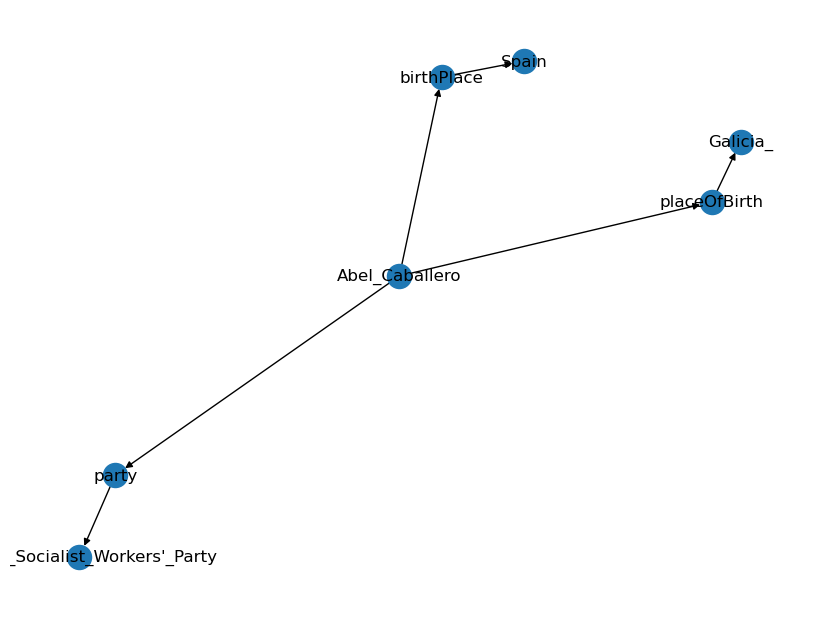

Decoded Input: 
 translate graph to text:  Abel_Caballero  birthPlace  Spain  Abel_Caballero  placeOfBirth  Galicia_(Spain)  Abel_Caballero  party  Spanish_Socialist_Workers'_Party
Decoded Target: 
 Abel Caballero was born in Galicia, Spain, and is a member of the Spanish Socialist Workers' Party.
DataBatch(x=[1, 512], edge_index=[2, 6], attention_mask=[1, 512], y=[1, 512], batch=[512], ptr=[2])
Original Sample: 
 translate graph to text: <H> Abner_W._Sibal  <R>  battles  <T>  World_War_II <H> Abner_W._Sibal  <R>  branch  <T>  United_States_Army <H> World_War_II  <R>  commander  <T>  Joseph_Stalin 
 Abner W. Sibal served in the United States Army and fought during WWII, when Joseph Stalin was a commander.
NetworkX Graph: 
 [('Abner_W._Sibal', 'battles', 0), ('Abner_W._Sibal', 'branch', 0), ('battles', 'World_War_II', 0), ('World_War_II', 'commander', 0), ('branch', 'United_States_Army', 0), ('commander', 'Joseph_Stalin', 0)]


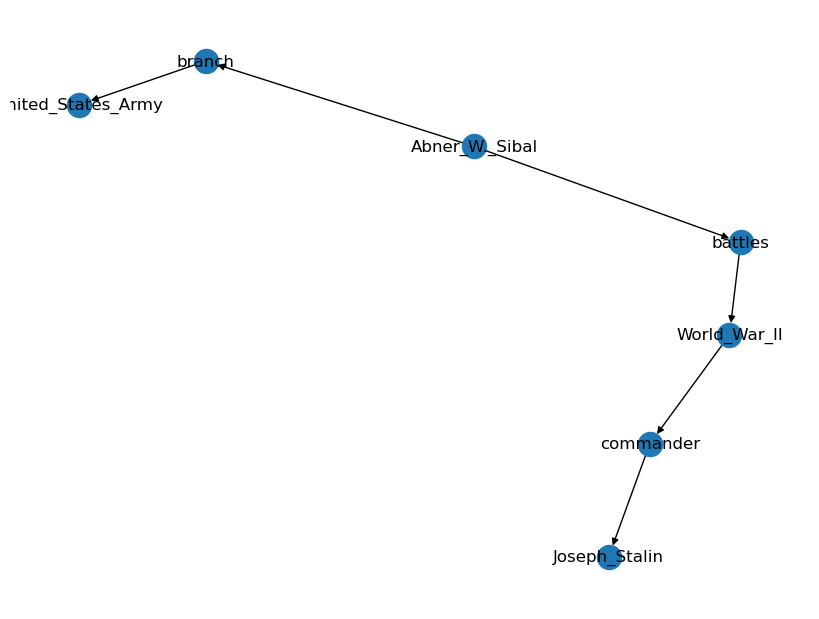

Decoded Input: 
 translate graph to text:  Abner_W._Sibal  battles  World_War_II  Abner_W._Sibal  branch  United_States_Army  World_War_II  commander  Joseph_Stalin
Decoded Target: 
 Abner W. Sibal served in the United States Army and fought during WWII, when Joseph Stalin was a commander.
DataBatch(x=[1, 512], edge_index=[2, 6], attention_mask=[1, 512], y=[1, 512], batch=[512], ptr=[2])
Original Sample: 
 translate graph to text: <H> Abner_W._Sibal  <R>  party  <T>  Republican_Party_(United_States) <H> Abner_W._Sibal  <R>  birthPlace  <T>  Ridgewood,_Queens <H> Abner_W._Sibal  <R>  office  <T>  "Member of the Connecticut Senate from the 26th District"@en 
 Abner W. Sibal was born in Ridgewood, Queens and a member of the Republic Party of the U.S. He was also a member of the Connecticut Senate from the 26th District.
NetworkX Graph: 
 [('Abner_W._Sibal', 'party', 0), ('Abner_W._Sibal', 'birthPlace', 0), ('Abner_W._Sibal', 'office', 0), ('party', 'Republican_Party_', 0), ('birthPlace', 

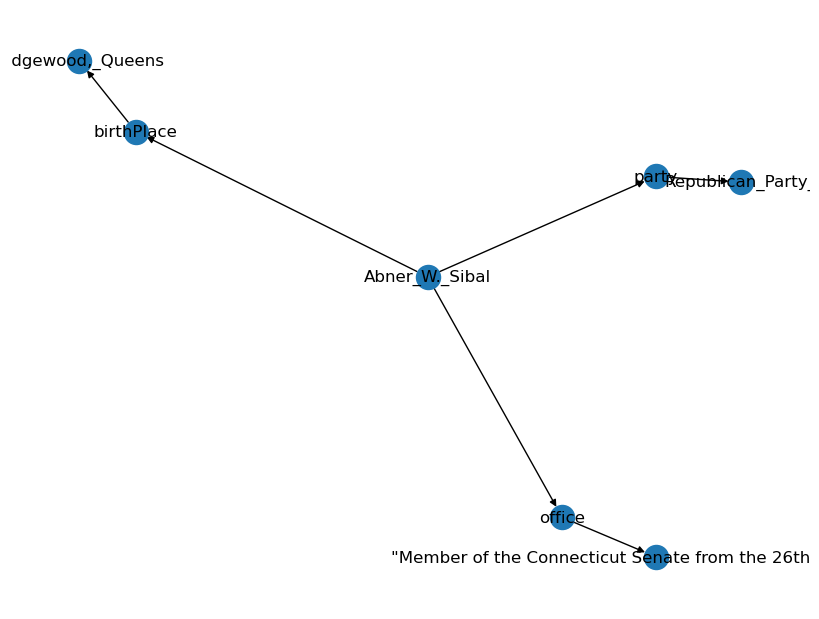

Decoded Input: 
 translate graph to text:  Abner_W._Sibal  party  Republican_Party_(United_States)  Abner_W._Sibal  birthPlace  Ridgewood,_Queens  Abner_W._Sibal  office  "Member of the Connecticut Senate from the 26th District"@en
Decoded Target: 
 Abner W. Sibal was born in Ridgewood, Queens and a member of the Republic Party of the U.S. He was also a member of the Connecticut Senate from the 26th District.
DataBatch(x=[1, 512], edge_index=[2, 6], attention_mask=[1, 512], y=[1, 512], batch=[512], ptr=[2])
Original Sample: 
 translate graph to text: <H> Adam_Holloway  <R>  battles  <T>  Gulf_War <H> Gulf_War  <R>  commander  <T>  George_H._W._Bush <H> Adam_Holloway  <R>  branch  <T>  Grenadier_Guards 
 During the Gulf War George H W Bush served as a commander and Adam Holloway of the Grenadier Guards was involved in the battles.
NetworkX Graph: 
 [('Adam_Holloway', 'battles', 0), ('Adam_Holloway', 'branch', 0), ('battles', 'Gulf_War', 0), ('Gulf_War', 'commander', 0), ('commander', 'G

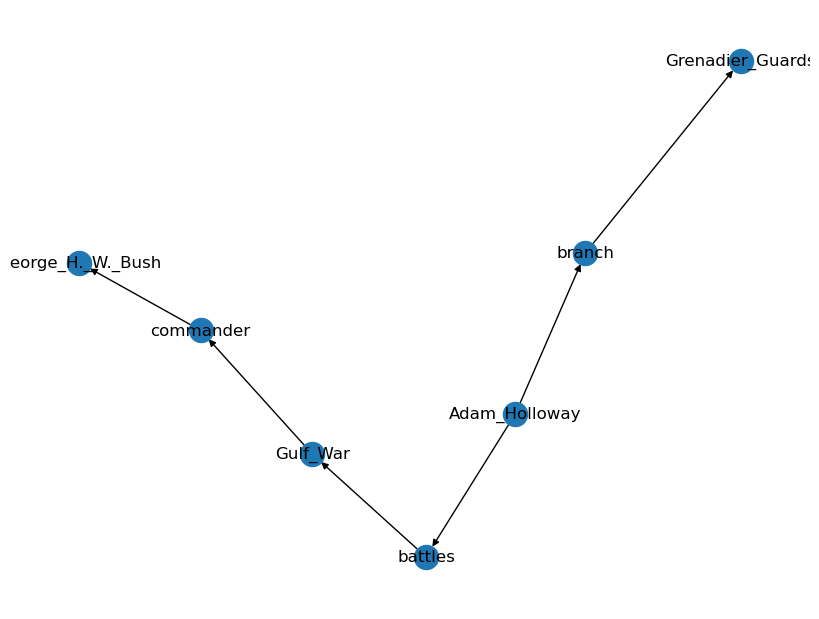

Decoded Input: 
 translate graph to text:  Adam_Holloway  battles  Gulf_War  Gulf_War  commander  George_H._W._Bush  Adam_Holloway  branch  Grenadier_Guards
Decoded Target: 
 During the Gulf War George H W Bush served as a commander and Adam Holloway of the Grenadier Guards was involved in the battles.
DataBatch(x=[1, 512], edge_index=[2, 6], attention_mask=[1, 512], y=[1, 512], batch=[512], ptr=[2])
Original Sample: 
 translate graph to text: <H> Adam_Holloway  <R>  party  <T>  Conservative_Party_(UK) <H> Adam_Holloway  <R>  birthPlace  <T>  Faversham <H> Adam_Holloway  <R>  almaMater  <T>  Magdalene_College,_Cambridge 
 Conservative Party (UK) member Adam Holloway, who studied at Magdalene College, Cambridge, was born in Faversham.
NetworkX Graph: 
 [('Adam_Holloway', 'party', 0), ('Adam_Holloway', 'birthPlace', 0), ('Adam_Holloway', 'almaMater', 0), ('party', 'Conservative_Party_', 0), ('birthPlace', 'Faversham', 0), ('almaMater', 'Magdalene_College,_Cambridge', 0)]


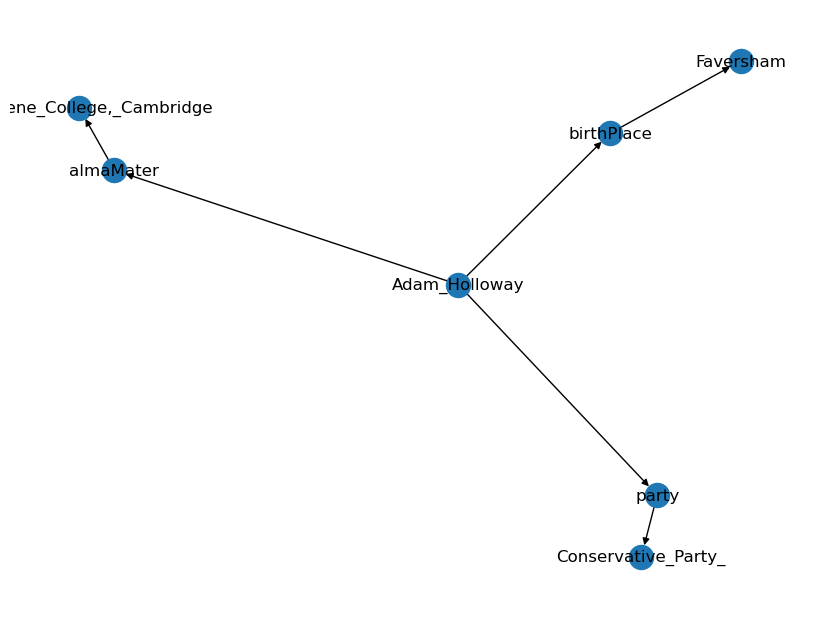

Decoded Input: 
 translate graph to text:  Adam_Holloway  party  Conservative_Party_(UK)  Adam_Holloway  birthPlace  Faversham  Adam_Holloway  almaMater  Magdalene_College,_Cambridge
Decoded Target: 
 Conservative Party (UK) member Adam Holloway, who studied at Magdalene College, Cambridge, was born in Faversham.
DataBatch(x=[1, 512], edge_index=[2, 6], attention_mask=[1, 512], y=[1, 512], batch=[512], ptr=[2])
Original Sample: 
 translate graph to text: <H> Adam_Koc  <R>  battles  <T>  Polish–Soviet_War <H> Adam_Koc  <R>  birthPlace  <T>  Congress_Poland <H> Polish–Soviet_War  <R>  commander  <T>  Leon_Trotsky 
 Adam Koc, who was born in Congress in Poland, fought in the Polish Soviet War in which Leon Trotsky was a commander.
NetworkX Graph: 
 [('Adam_Koc', 'battles', 0), ('Adam_Koc', 'birthPlace', 0), ('battles', 'Polish–Soviet_War', 0), ('Polish–Soviet_War', 'commander', 0), ('birthPlace', 'Congress_Poland', 0), ('commander', 'Leon_Trotsky', 0)]


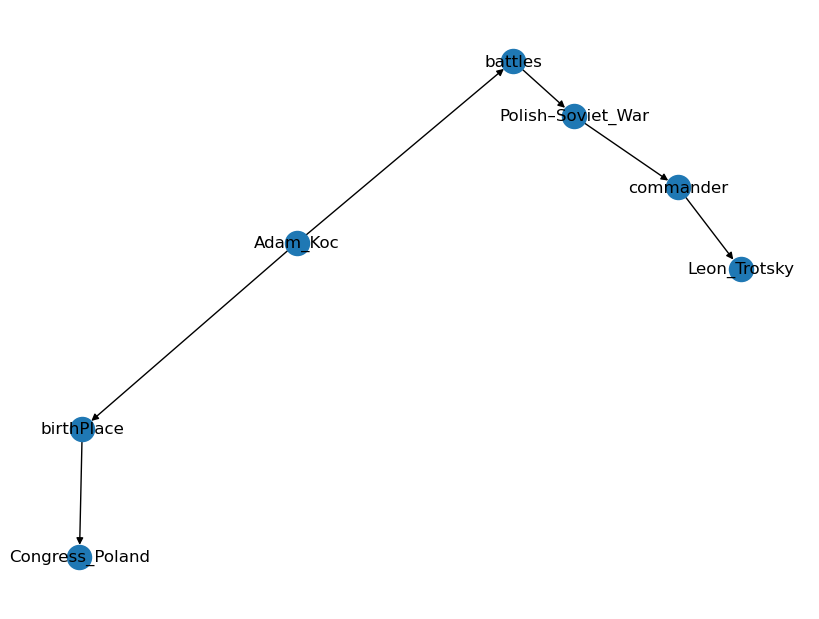

Decoded Input: 
 translate graph to text:  Adam_Koc  battles  Polish–Soviet_War  Adam_Koc  birthPlace  Congress_Poland  Polish–Soviet_War  commander  Leon_Trotsky
Decoded Target: 
 Adam Koc, who was born in Congress in Poland, fought in the Polish Soviet War in which Leon Trotsky was a commander.
DataBatch(x=[1, 512], edge_index=[2, 6], attention_mask=[1, 512], y=[1, 512], batch=[512], ptr=[2])
Original Sample: 
 translate graph to text: <H> Adam_Koc  <R>  battles  <T>  Polish–Soviet_War <H> Polish–Soviet_War  <R>  isPartOfMilitaryConflict  <T>  Russian_Civil_War <H> Polish–Soviet_War  <R>  commander  <T>  Leon_Trotsky 
 The Polish-Soviet War, which was part of the Russian Civil War, was where Adam Koc fought and where Leon Trotsky was a commander.
NetworkX Graph: 
 [('Adam_Koc', 'battles', 0), ('battles', 'Polish–Soviet_War', 0), ('Polish–Soviet_War', 'isPartOfMilitaryConflict', 0), ('Polish–Soviet_War', 'commander', 0), ('isPartOfMilitaryConflict', 'Russian_Civil_War', 0), ('commande

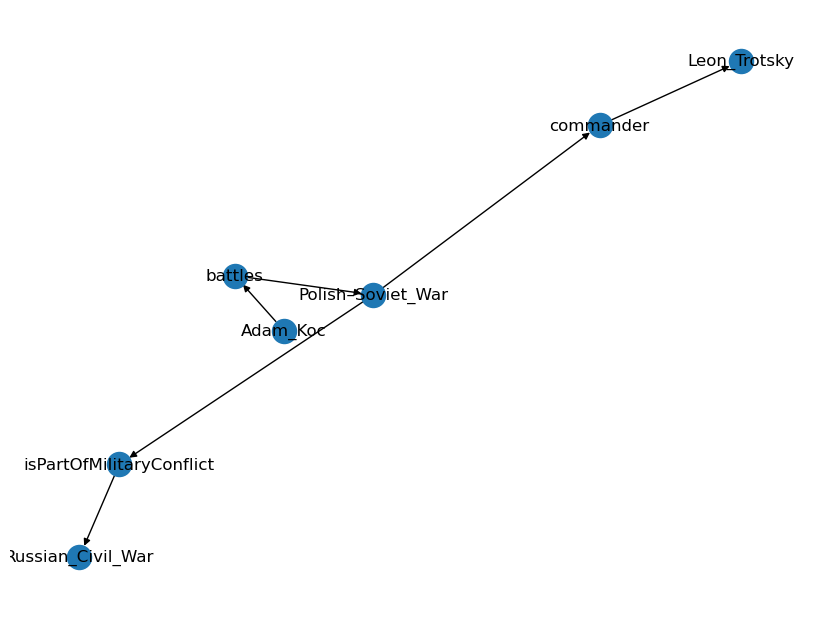

Decoded Input: 
 translate graph to text:  Adam_Koc  battles  Polish–Soviet_War  Polish–Soviet_War  isPartOfMilitaryConflict  Russian_Civil_War  Polish–Soviet_War  commander  Leon_Trotsky
Decoded Target: 
 The Polish-Soviet War, which was part of the Russian Civil War, was where Adam Koc fought and where Leon Trotsky was a commander.
DataBatch(x=[1, 512], edge_index=[2, 6], attention_mask=[1, 512], y=[1, 512], batch=[512], ptr=[2])
Original Sample: 
 translate graph to text: <H> Adonis_Georgiadis  <R>  birthPlace  <T>  Athens <H> Adonis_Georgiadis  <R>  placeOfBirth  <T>  Greece <H> Adonis_Georgiadis  <R>  office  <T>  "Deputy Parliamentary Spokesman of Popular Orthodox Rally"@en 
 Born in Athens, Greece, Adonis Georgiadis, has worked as the Deputy Parliamentary Spokesman of Popular Orthodox Rally.
NetworkX Graph: 
 [('Adonis_Georgiadis', 'birthPlace', 0), ('Adonis_Georgiadis', 'placeOfBirth', 0), ('Adonis_Georgiadis', 'office', 0), ('birthPlace', 'Athens', 0), ('placeOfBirth', 'Greece

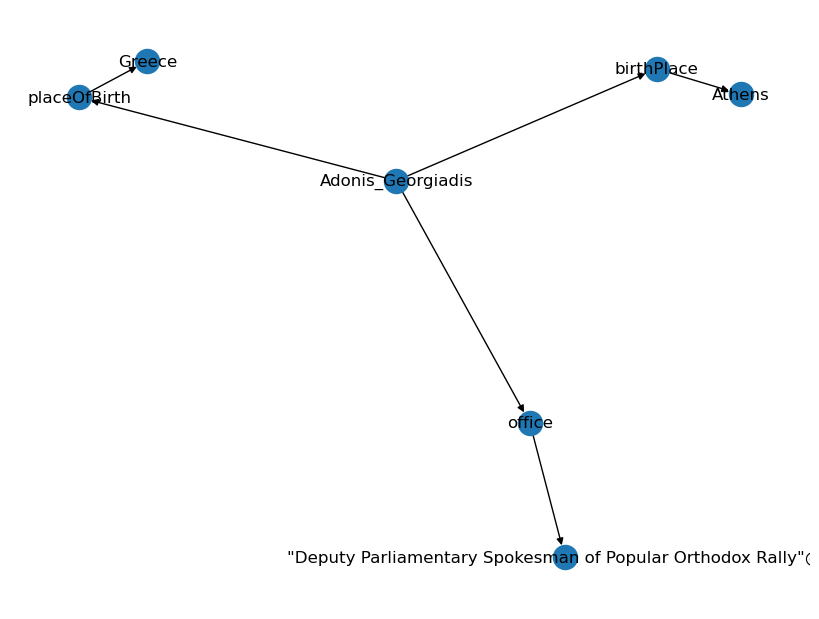

Decoded Input: 
 translate graph to text:  Adonis_Georgiadis  birthPlace  Athens  Adonis_Georgiadis  placeOfBirth  Greece  Adonis_Georgiadis  office  "Deputy Parliamentary Spokesman of Popular Orthodox Rally"@en
Decoded Target: 
 Born in Athens, Greece, Adonis Georgiadis, has worked as the Deputy Parliamentary Spokesman of Popular Orthodox Rally.
DataBatch(x=[1, 512], edge_index=[2, 6], attention_mask=[1, 512], y=[1, 512], batch=[512], ptr=[2])
Original Sample: 
 translate graph to text: <H> Adonis_Georgiadis  <R>  office  <T>  "Minister for Health" <H> Adonis_Georgiadis  <R>  birthPlace  <T>  Athens <H> Adonis_Georgiadis  <R>  placeOfBirth  <T>  Greece 
 Adonis Georgiadis was born in Athens (Greece), and worked as Minister for Health.
NetworkX Graph: 
 [('Adonis_Georgiadis', 'office', 0), ('Adonis_Georgiadis', 'birthPlace', 0), ('Adonis_Georgiadis', 'placeOfBirth', 0), ('office', '"Minister for Health"', 0), ('birthPlace', 'Athens', 0), ('placeOfBirth', 'Greece', 0)]


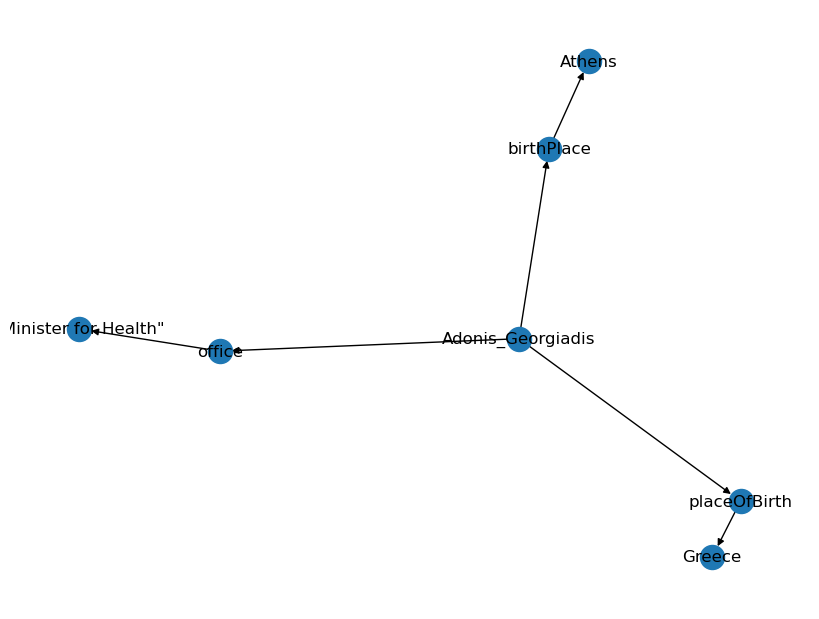

Decoded Input: 
 translate graph to text:  Adonis_Georgiadis  office  "Minister for Health"  Adonis_Georgiadis  birthPlace  Athens  Adonis_Georgiadis  placeOfBirth  Greece
Decoded Target: 
 Adonis Georgiadis was born in Athens (Greece), and worked as Minister for Health.
DataBatch(x=[1, 512], edge_index=[2, 6], attention_mask=[1, 512], y=[1, 512], batch=[512], ptr=[2])
Original Sample: 
 translate graph to text: <H> Adonis_Georgiadis  <R>  primeMinister  <T>  Antonis_Samaras <H> New_Democracy_(Greece)  <R>  colour  <T>  Blue <H> Adonis_Georgiadis  <R>  party  <T>  New_Democracy_(Greece) 
 Adonis Georgiadis, a member of the Greek New Democracy Party (blue is their colour), served in office while Antonis Samaras was Prime Minister.
NetworkX Graph: 
 [('Adonis_Georgiadis', 'primeMinister', 0), ('Adonis_Georgiadis', 'party', 0), ('primeMinister', 'Antonis_Samaras', 0), ('New_Democracy_', 'colour', 0), ('colour', 'Blue', 0), ('party', 'New_Democracy_', 0)]


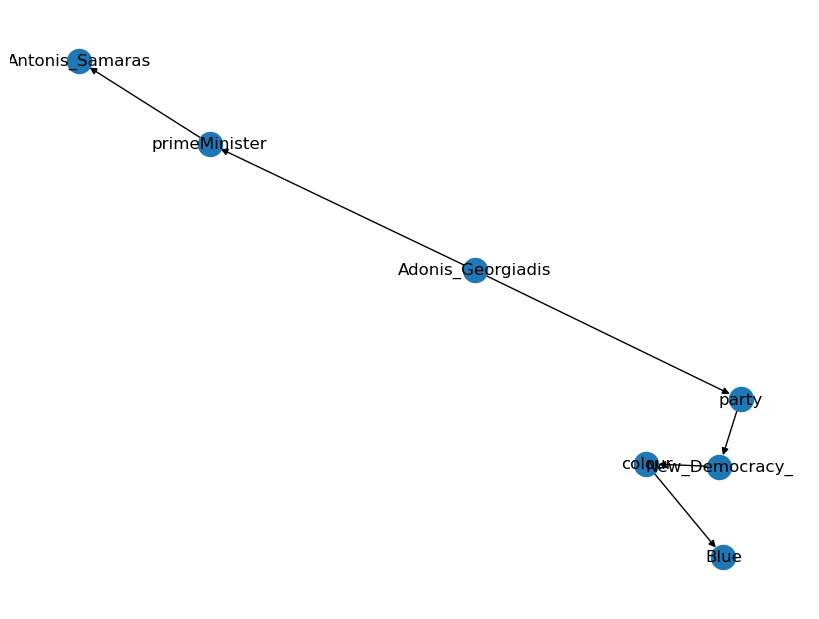

Decoded Input: 
 translate graph to text:  Adonis_Georgiadis  primeMinister  Antonis_Samaras  New_Democracy_(Greece)  colour  Blue  Adonis_Georgiadis  party  New_Democracy_(Greece)
Decoded Target: 
 Adonis Georgiadis, a member of the Greek New Democracy Party (blue is their colour), served in office while Antonis Samaras was Prime Minister.
DataBatch(x=[1, 512], edge_index=[2, 6], attention_mask=[1, 512], y=[1, 512], batch=[512], ptr=[2])
Original Sample: 
 translate graph to text: <H> Agnes_Kant  <R>  nationality  <T>  Netherlands <H> Netherlands  <R>  leader  <T>  Mark_Rutte <H> Agnes_Kant  <R>  office  <T>  House_of_Representatives_(Netherlands) 
 Agnes Kant's nationality is the Netherlands. He worked at the House of Representatives there. Mark Rutte is a leader in the Netherlands.
NetworkX Graph: 
 [('Agnes_Kant', 'nationality', 0), ('Agnes_Kant', 'office', 0), ('nationality', 'Netherlands', 0), ('Netherlands', 'leader', 0), ('leader', 'Mark_Rutte', 0), ('office', 'House_of_Represe

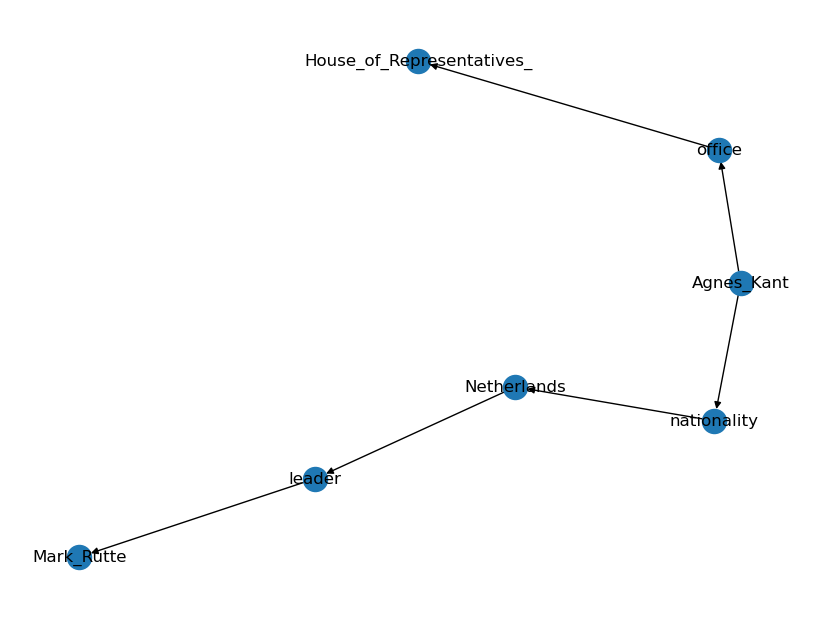

Decoded Input: 
 translate graph to text:  Agnes_Kant  nationality  Netherlands  Netherlands  leader  Mark_Rutte  Agnes_Kant  office  House_of_Representatives_(Netherlands)
Decoded Target: 
 Agnes Kant's nationality is the Netherlands. He worked at the House of Representatives there. Mark Rutte is a leader in the Netherlands.
DataBatch(x=[1, 512], edge_index=[2, 6], attention_mask=[1, 512], y=[1, 512], batch=[512], ptr=[2])
Original Sample: 
 translate graph to text: <H> Agnes_Kant  <R>  nationality  <T>  Netherlands <H> Netherlands  <R>  leader  <T>  Mark_Rutte <H> Agnes_Kant  <R>  party  <T>  Socialist_Party_(Netherlands) 
 The nationality of Agnes Kant, a member of the Socialist party, is the Netherlands. Mark Rutte leads the Netherlands.
NetworkX Graph: 
 [('Agnes_Kant', 'nationality', 0), ('Agnes_Kant', 'party', 0), ('nationality', 'Netherlands', 0), ('Netherlands', 'leader', 0), ('leader', 'Mark_Rutte', 0), ('party', 'Socialist_Party_', 0)]


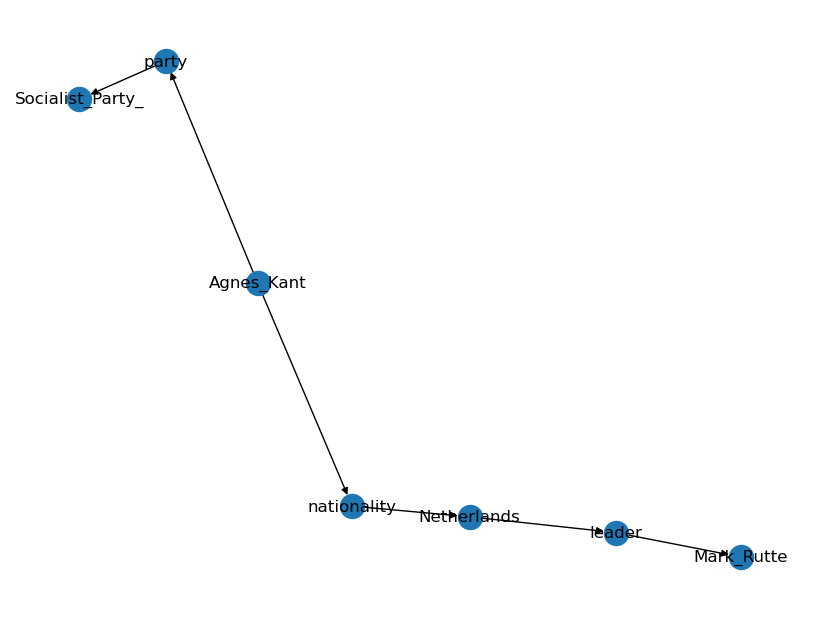

Decoded Input: 
 translate graph to text:  Agnes_Kant  nationality  Netherlands  Netherlands  leader  Mark_Rutte  Agnes_Kant  party  Socialist_Party_(Netherlands)
Decoded Target: 
 The nationality of Agnes Kant, a member of the Socialist party, is the Netherlands. Mark Rutte leads the Netherlands.
DataBatch(x=[1, 512], edge_index=[2, 6], attention_mask=[1, 512], y=[1, 512], batch=[512], ptr=[2])
Original Sample: 
 translate graph to text: <H> Agnes_Kant  <R>  almaMater  <T>  Radboud_University_Nijmegen <H> Agnes_Kant  <R>  office  <T>  "Member of the House of Representatives" <H> Agnes_Kant  <R>  birthPlace  <T>  West_Germany 
 Agnes Kant was born in West Germany and was a member of the House of Representatives. He attended the Radboud University Nijmegen.
NetworkX Graph: 
 [('Agnes_Kant', 'almaMater', 0), ('Agnes_Kant', 'office', 0), ('Agnes_Kant', 'birthPlace', 0), ('almaMater', 'Radboud_University_Nijmegen', 0), ('office', '"Member of the House of Representatives"', 0), ('birthPlace

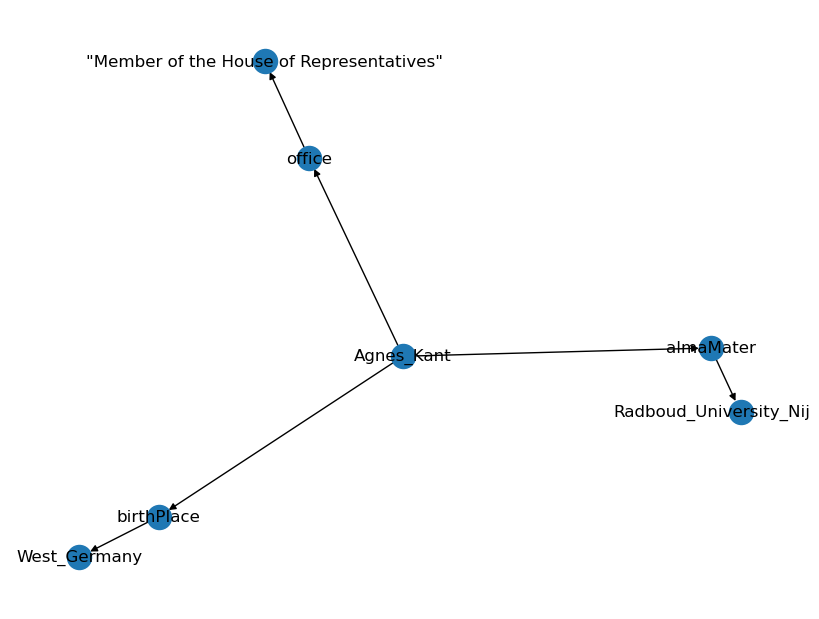

Decoded Input: 
 translate graph to text:  Agnes_Kant  almaMater  Radboud_University_Nijmegen  Agnes_Kant  office  "Member of the House of Representatives"  Agnes_Kant  birthPlace  West_Germany
Decoded Target: 
 Agnes Kant was born in West Germany and was a member of the House of Representatives. He attended the Radboud University Nijmegen.
DataBatch(x=[1, 512], edge_index=[2, 6], attention_mask=[1, 512], y=[1, 512], batch=[512], ptr=[2])
Original Sample: 
 translate graph to text: <H> Airey_Neave  <R>  battles  <T>  World_War_II <H> Airey_Neave  <R>  activeYearsStartDate  <T>  "1953-06-30"^^xsd:date <H> Airey_Neave  <R>  activeYearsEndDate  <T>  "1979-03-30"^^xsd:date 
 Airey Neave, who served in World War II had a career between 30 June 1953 and 30 March 1979.
NetworkX Graph: 
 [('Airey_Neave', 'battles', 0), ('Airey_Neave', 'activeYearsStartDate', 0), ('Airey_Neave', 'activeYearsEndDate', 0), ('battles', 'World_War_II', 0), ('activeYearsStartDate', '"1953-06-30"^^xsd:date', 0), ('ac

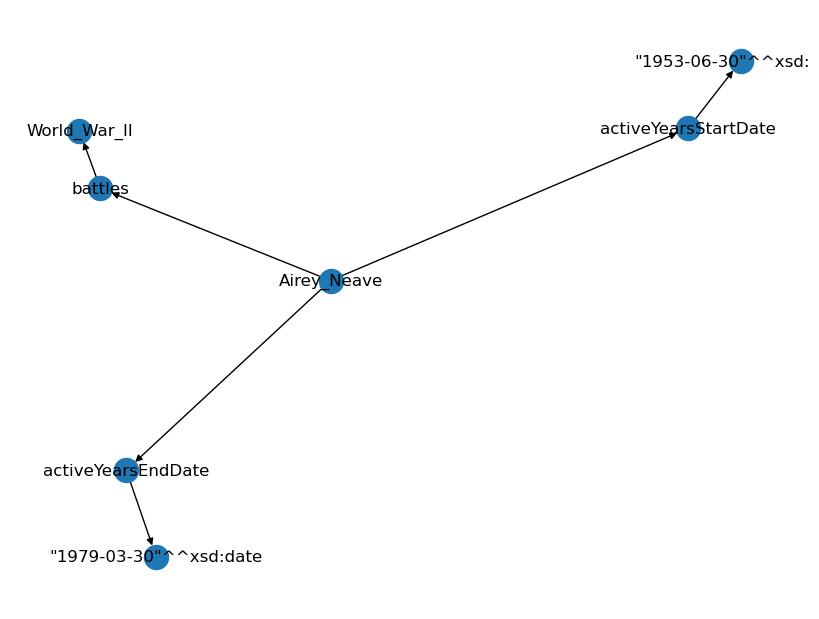

Decoded Input: 
 translate graph to text:  Airey_Neave  battles  World_War_II  Airey_Neave  activeYearsStartDate  "1953-06-30"xsd:date  Airey_Neave  activeYearsEndDate  "1979-03-30"xsd:date
Decoded Target: 
 Airey Neave, who served in World War II had a career between 30 June 1953 and 30 March 1979.
DataBatch(x=[1, 512], edge_index=[2, 6], attention_mask=[1, 512], y=[1, 512], batch=[512], ptr=[2])
Original Sample: 
 translate graph to text: <H> Airey_Neave  <R>  battles  <T>  World_War_II <H> Airey_Neave  <R>  activeYearsStartDate  <T>  "1974-03-04"^^xsd:date <H> Airey_Neave  <R>  activeYearsEndDate  <T>  "1979-03-30"^^xsd:date 
 Airey Neave fought in Worl War II and started his political career on March 4th 1974 which ended on March 30th 1979.
NetworkX Graph: 
 [('Airey_Neave', 'battles', 0), ('Airey_Neave', 'activeYearsStartDate', 0), ('Airey_Neave', 'activeYearsEndDate', 0), ('battles', 'World_War_II', 0), ('activeYearsStartDate', '"1974-03-04"^^xsd:date', 0), ('activeYearsEndDate',

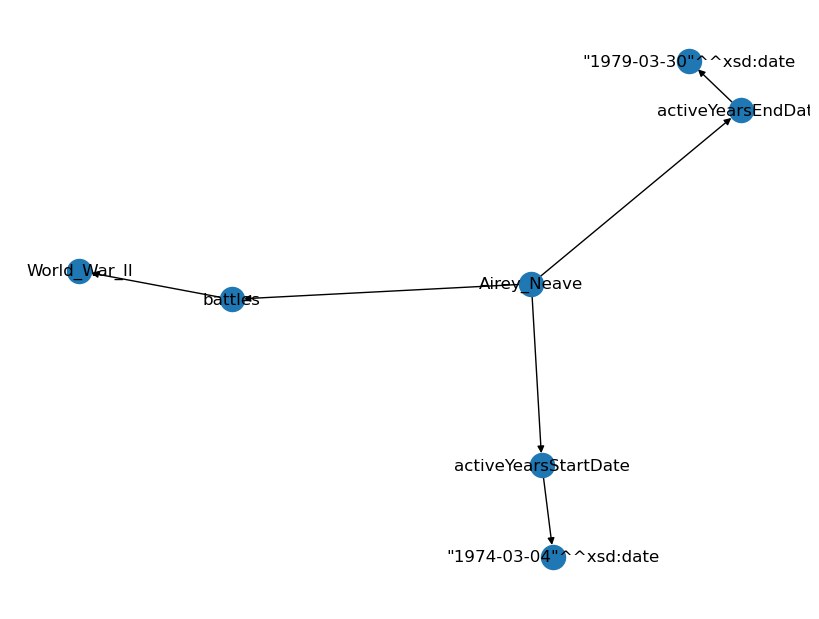

Decoded Input: 
 translate graph to text:  Airey_Neave  battles  World_War_II  Airey_Neave  activeYearsStartDate  "1974-03-04"xsd:date  Airey_Neave  activeYearsEndDate  "1979-03-30"xsd:date
Decoded Target: 
 Airey Neave fought in Worl War II and started his political career on March 4th 1974 which ended on March 30th 1979.
DataBatch(x=[1, 512], edge_index=[2, 6], attention_mask=[1, 512], y=[1, 512], batch=[512], ptr=[2])
Original Sample: 
 translate graph to text: <H> Albert_B._White  <R>  deathYear  <T>  "1941"^^xsd:gYear <H> Albert_B._White  <R>  dateOfBirth  <T>  "1856-09-22"^^xsd:date <H> Albert_B._White  <R>  dateOfDeath  <T>  "1941-07-03"^^xsd:date 
 Born September 22nd, 1856, Albert B. White, died on the July 3rd, 1941.
NetworkX Graph: 
 [('Albert_B._White', 'deathYear', 0), ('Albert_B._White', 'dateOfBirth', 0), ('Albert_B._White', 'dateOfDeath', 0), ('deathYear', '"1941"^^xsd:gYear', 0), ('dateOfBirth', '"1856-09-22"^^xsd:date', 0), ('dateOfDeath', '"1941-07-03"^^xsd:date', 0)

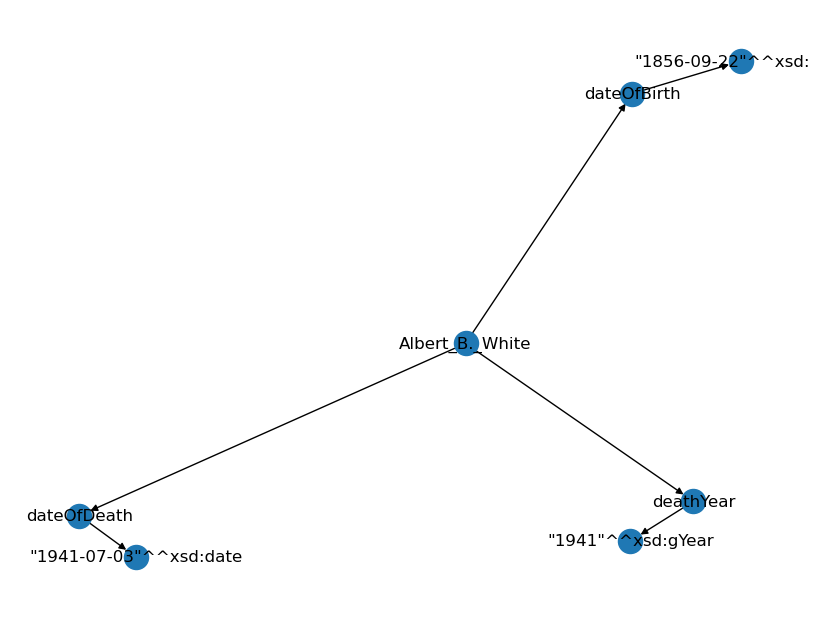

Decoded Input: 
 translate graph to text:  Albert_B._White  deathYear  "1941"xsd:gYear  Albert_B._White  dateOfBirth  "1856-09-22"xsd:date  Albert_B._White  dateOfDeath  "1941-07-03"xsd:date
Decoded Target: 
 Born September 22nd, 1856, Albert B. White, died on the July 3rd, 1941.
DataBatch(x=[1, 512], edge_index=[2, 6], attention_mask=[1, 512], y=[1, 512], batch=[512], ptr=[2])
Original Sample: 
 translate graph to text: <H> Albert_B._White  <R>  spouse  <T>  Agnes_Ward_White <H> Agnes_Ward_White  <R>  birthPlace  <T>  Marietta,_Ohio <H> Albert_B._White  <R>  successor  <T>  William_M._O._Dawson 
 Agnes Ward White, born in Marietta,Ohio was married to Albert B. White who was succeeded by William MO Dawson.
NetworkX Graph: 
 [('Albert_B._White', 'spouse', 0), ('Albert_B._White', 'successor', 0), ('spouse', 'Agnes_Ward_White', 0), ('Agnes_Ward_White', 'birthPlace', 0), ('birthPlace', 'Marietta,_Ohio', 0), ('successor', 'William_M._O._Dawson', 0)]


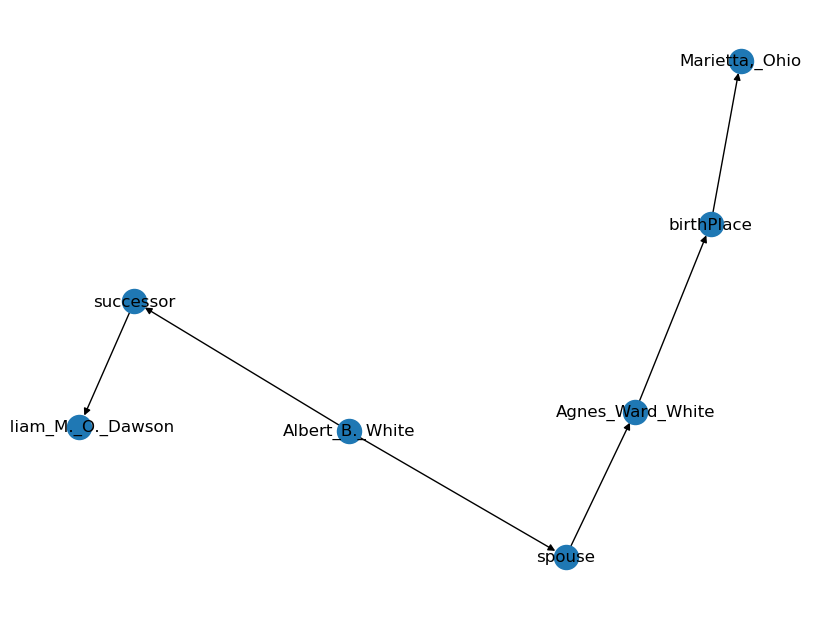

Decoded Input: 
 translate graph to text:  Albert_B._White  spouse  Agnes_Ward_White  Agnes_Ward_White  birthPlace  Marietta,_Ohio  Albert_B._White  successor  William_M._O._Dawson
Decoded Target: 
 Agnes Ward White, born in Marietta,Ohio was married to Albert B. White who was succeeded by William MO Dawson.
DataBatch(x=[1, 512], edge_index=[2, 6], attention_mask=[1, 512], y=[1, 512], batch=[512], ptr=[2])
Original Sample: 
 translate graph to text: <H> Albert_Jennings_Fountain  <R>  birthPlace  <T>  Staten_Island <H> Albert_Jennings_Fountain  <R>  deathPlace  <T>  United_States <H> United_States  <R>  ethnicGroup  <T>  African_Americans 
 Albert Jennings Fountain was born in Staten Island and died in the US where African Americans are one of the ethnic groups.
NetworkX Graph: 
 [('Albert_Jennings_Fountain', 'birthPlace', 0), ('Albert_Jennings_Fountain', 'deathPlace', 0), ('birthPlace', 'Staten_Island', 0), ('deathPlace', 'United_States', 0), ('United_States', 'ethnicGroup', 0), ('ethn

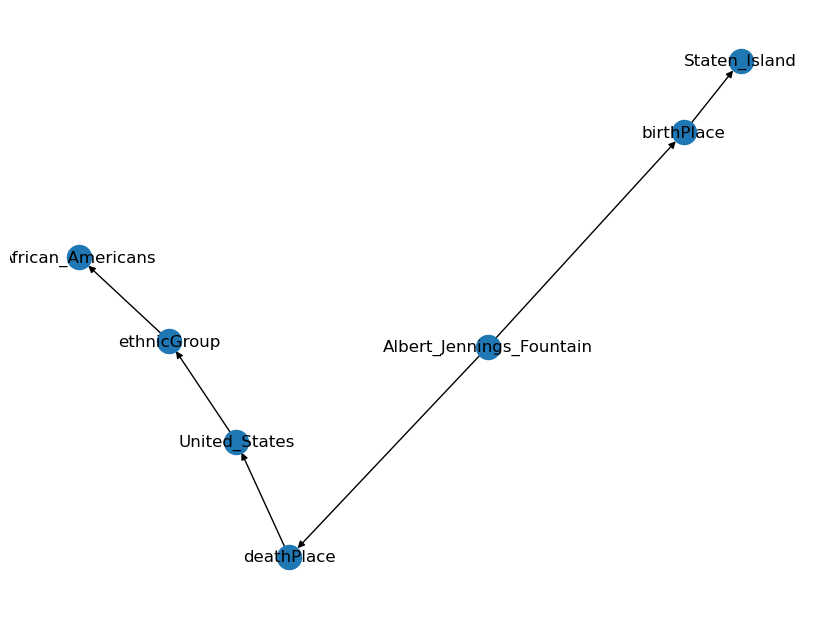

Decoded Input: 
 translate graph to text:  Albert_Jennings_Fountain  birthPlace  Staten_Island  Albert_Jennings_Fountain  deathPlace  United_States  United_States  ethnicGroup  African_Americans
Decoded Target: 
 Albert Jennings Fountain was born in Staten Island and died in the US where African Americans are one of the ethnic groups.
DataBatch(x=[1, 512], edge_index=[2, 6], attention_mask=[1, 512], y=[1, 512], batch=[512], ptr=[2])
Original Sample: 
 translate graph to text: <H> Albert_Jennings_Fountain  <R>  deathPlace  <T>  New_Mexico_Territory <H> Albert_Jennings_Fountain  <R>  birthPlace  <T>  New_York_City <H> Albert_Jennings_Fountain  <R>  placeOfBirth  <T>  Staten_Island 
 Albert Jennings Fountain was born in Staten Island, New York City and died in the New Mexico Territory.
NetworkX Graph: 
 [('Albert_Jennings_Fountain', 'deathPlace', 0), ('Albert_Jennings_Fountain', 'birthPlace', 0), ('Albert_Jennings_Fountain', 'placeOfBirth', 0), ('deathPlace', 'New_Mexico_Territory', 0), (

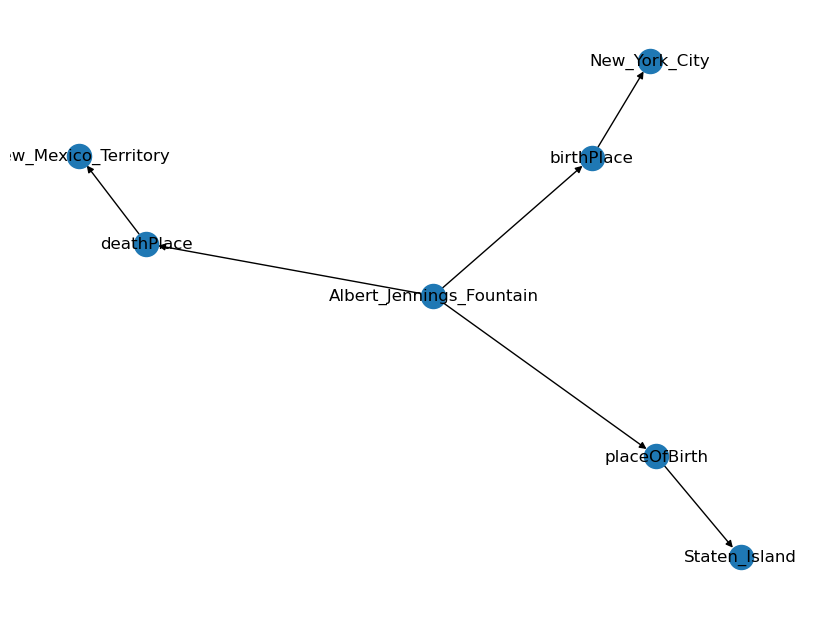

Decoded Input: 
 translate graph to text:  Albert_Jennings_Fountain  deathPlace  New_Mexico_Territory  Albert_Jennings_Fountain  birthPlace  New_York_City  Albert_Jennings_Fountain  placeOfBirth  Staten_Island
Decoded Target: 
 Albert Jennings Fountain was born in Staten Island, New York City and died in the New Mexico Territory.
DataBatch(x=[1, 512], edge_index=[2, 6], attention_mask=[1, 512], y=[1, 512], batch=[512], ptr=[2])
Original Sample: 
 translate graph to text: <H> Albert_Jennings_Fountain  <R>  deathPlace  <T>  United_States <H> Albert_Jennings_Fountain  <R>  birthPlace  <T>  New_York <H> Albert_Jennings_Fountain  <R>  placeOfBirth  <T>  Staten_Island 
 Albert Jennings Fountain was born in Staten Island in New York. He died in the U.S.
NetworkX Graph: 
 [('Albert_Jennings_Fountain', 'deathPlace', 0), ('Albert_Jennings_Fountain', 'birthPlace', 0), ('Albert_Jennings_Fountain', 'placeOfBirth', 0), ('deathPlace', 'United_States', 0), ('birthPlace', 'New_York', 0), ('placeOfBirth

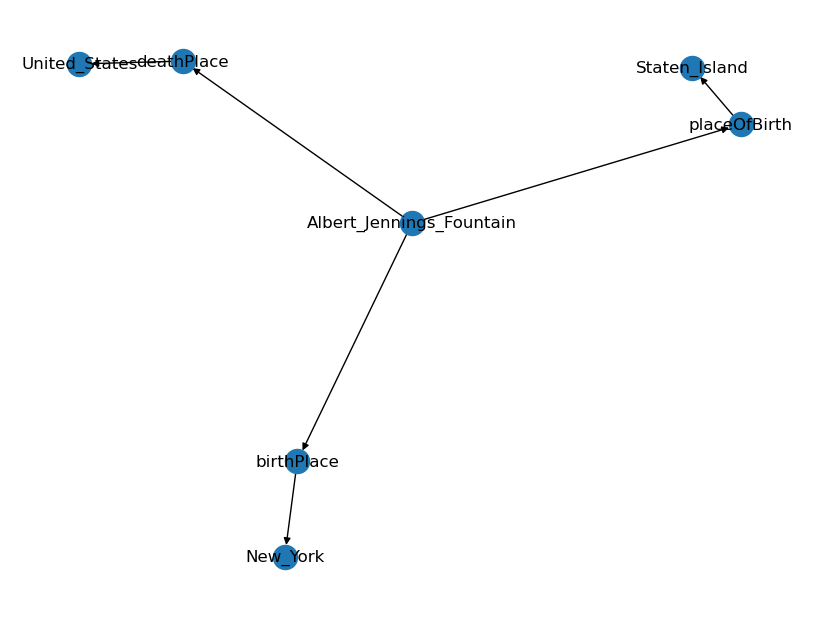

Decoded Input: 
 translate graph to text:  Albert_Jennings_Fountain  deathPlace  United_States  Albert_Jennings_Fountain  birthPlace  New_York  Albert_Jennings_Fountain  placeOfBirth  Staten_Island
Decoded Target: 
 Albert Jennings Fountain was born in Staten Island in New York. He died in the U.S.
DataBatch(x=[1, 512], edge_index=[2, 6], attention_mask=[1, 512], y=[1, 512], batch=[512], ptr=[2])
Original Sample: 
 translate graph to text: <H> Buenos_Aires  <R>  governingBody  <T>  Buenos_Aires_City_Legislature <H> Buenos_Aires  <R>  leaderName  <T>  Horacio_Rodríguez_Larreta <H> Alberto_Teisaire  <R>  placeOfDeath  <T>  Buenos_Aires 
 Buenos Aires, which is the death place of Alberto Teisaire, is governed by the Buenos Aires City Legislature and led by Horacio Rodríguez Larreta.
NetworkX Graph: 
 [('Buenos_Aires', 'governingBody', 0), ('Buenos_Aires', 'leaderName', 0), ('governingBody', 'Buenos_Aires_City_Legislature', 0), ('leaderName', 'Horacio_Rodríguez_Larreta', 0), ('Alberto_Teis

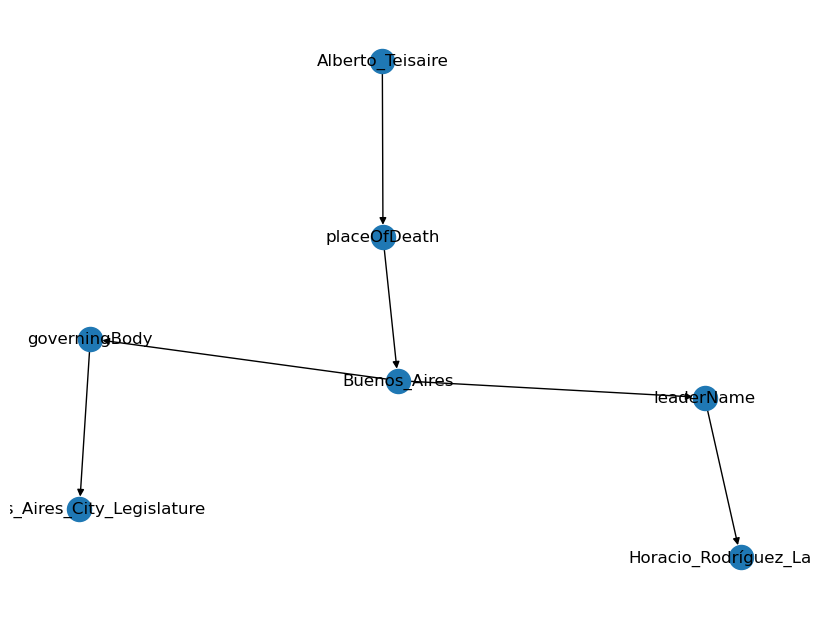

Decoded Input: 
 translate graph to text:  Buenos_Aires  governingBody  Buenos_Aires_City_Legislature  Buenos_Aires  leaderName  Horacio_Rodrguez_Larreta  Alberto_Teisaire  placeOfDeath  Buenos_Aires
Decoded Target: 
 Buenos Aires, which is the death place of Alberto Teisaire, is governed by the Buenos Aires City Legislature and led by Horacio Rodrguez Larreta.
DataBatch(x=[1, 512], edge_index=[2, 6], attention_mask=[1, 512], y=[1, 512], batch=[512], ptr=[2])
Original Sample: 
 translate graph to text: <H> Alberto_Teisaire  <R>  profession  <T>  Rear_admiral <H> Alberto_Teisaire  <R>  successor  <T>  Isaac_Rojas <H> Alberto_Teisaire  <R>  birthPlace  <T>  Mendoza,_Argentina 
 Rear Admiral, Alberto Teisaire, was born in Mendoza in Agentina, and succeeded by, Isaac Rojas.
NetworkX Graph: 
 [('Alberto_Teisaire', 'profession', 0), ('Alberto_Teisaire', 'successor', 0), ('Alberto_Teisaire', 'birthPlace', 0), ('profession', 'Rear_admiral', 0), ('successor', 'Isaac_Rojas', 0), ('birthPlace', '

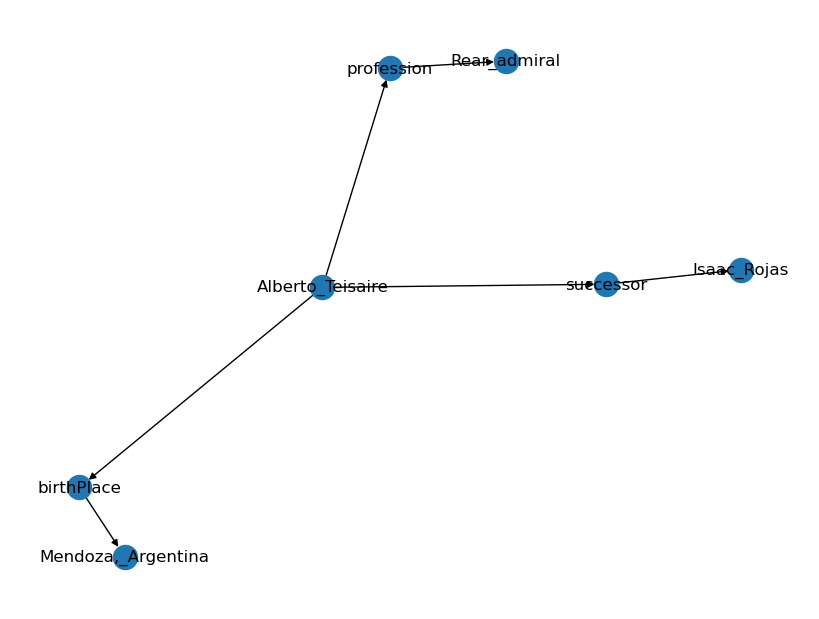

Decoded Input: 
 translate graph to text:  Alberto_Teisaire  profession  Rear_admiral  Alberto_Teisaire  successor  Isaac_Rojas  Alberto_Teisaire  birthPlace  Mendoza,_Argentina
Decoded Target: 
 Rear Admiral, Alberto Teisaire, was born in Mendoza in Agentina, and succeeded by, Isaac Rojas.
DataBatch(x=[1, 512], edge_index=[2, 6], attention_mask=[1, 512], y=[1, 512], batch=[512], ptr=[2])
Original Sample: 
 translate graph to text: <H> Alfons_Gorbach  <R>  deathPlace  <T>  Graz <H> Alfons_Gorbach  <R>  birthPlace  <T>  County_of_Tyrol <H> Alfons_Gorbach  <R>  placeOfBirth  <T>  Austria 
 Alfons Gorbach was born in the County of Tyrol, Austria and died in the city of Graz.
NetworkX Graph: 
 [('Alfons_Gorbach', 'deathPlace', 0), ('Alfons_Gorbach', 'birthPlace', 0), ('Alfons_Gorbach', 'placeOfBirth', 0), ('deathPlace', 'Graz', 0), ('birthPlace', 'County_of_Tyrol', 0), ('placeOfBirth', 'Austria', 0)]


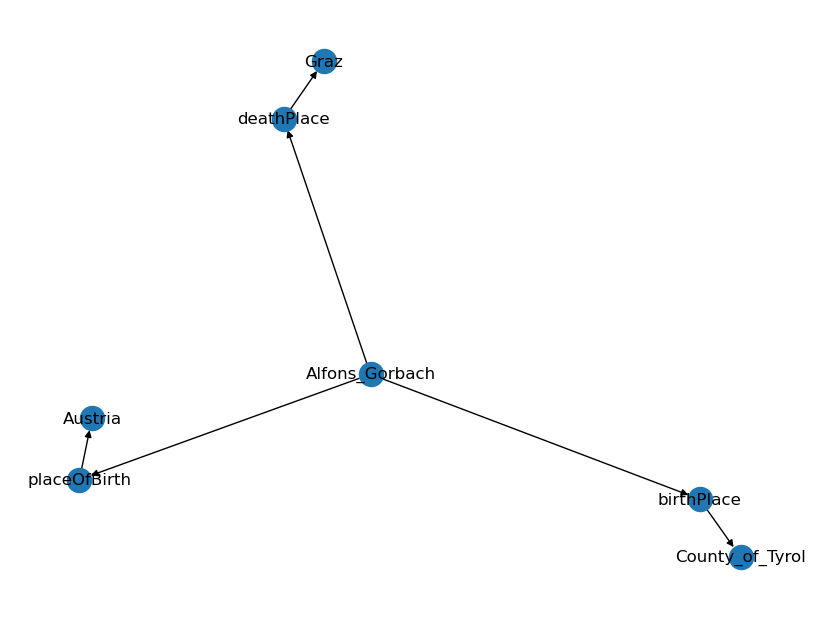

Decoded Input: 
 translate graph to text:  Alfons_Gorbach  deathPlace  Graz  Alfons_Gorbach  birthPlace  County_of_Tyrol  Alfons_Gorbach  placeOfBirth  Austria
Decoded Target: 
 Alfons Gorbach was born in the County of Tyrol, Austria and died in the city of Graz.
DataBatch(x=[1, 512], edge_index=[2, 6], attention_mask=[1, 512], y=[1, 512], batch=[512], ptr=[2])
Original Sample: 
 translate graph to text: <H> Alfred_N._Phillips  <R>  successor  <T>  Albert_E._Austin <H> Alfred_N._Phillips  <R>  birthPlace  <T>  Connecticut <H> Alfred_N._Phillips  <R>  office  <T>  "from Connecticut's 4th district"@en 
 Alfred N. Phillips was born in connecticut where he worked as a Member of the U.S House of Representatives in the 4th district and he is the successor of Albert E. Austin.
NetworkX Graph: 
 [('Alfred_N._Phillips', 'successor', 0), ('Alfred_N._Phillips', 'birthPlace', 0), ('Alfred_N._Phillips', 'office', 0), ('successor', 'Albert_E._Austin', 0), ('birthPlace', 'Connecticut', 0), ('office',

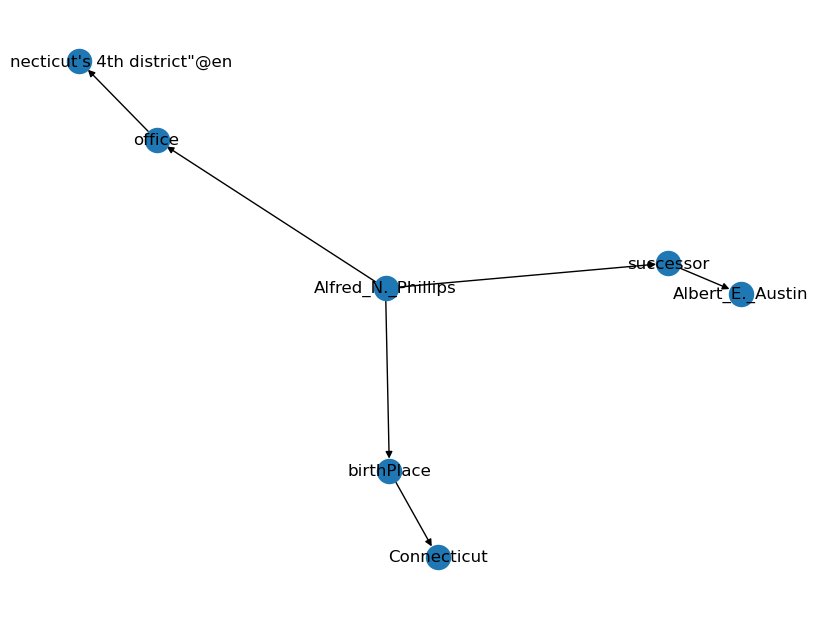

Decoded Input: 
 translate graph to text:  Alfred_N._Phillips  successor  Albert_E._Austin  Alfred_N._Phillips  birthPlace  Connecticut  Alfred_N._Phillips  office  "from Connecticut's 4th district"@en
Decoded Target: 
 Alfred N. Phillips was born in connecticut where he worked as a Member of the U.S House of Representatives in the 4th district and he is the successor of Albert E. Austin.
DataBatch(x=[1, 512], edge_index=[2, 6], attention_mask=[1, 512], y=[1, 512], batch=[512], ptr=[2])
Original Sample: 
 translate graph to text: <H> Alfred_N._Phillips  <R>  successor  <T>  Albert_E._Austin <H> Alfred_N._Phillips  <R>  birthPlace  <T>  Darien,_Connecticut <H> Alfred_N._Phillips  <R>  office  <T>  "from Connecticut's 4th district"@en 
 Alfred N. Phillips, who was born in Darien, Connecticut, was a Member of the U.S. House of Representatives from Connecticut's 4th district and was succeeded by Albert E. Austin.
NetworkX Graph: 
 [('Alfred_N._Phillips', 'successor', 0), ('Alfred_N._Philli

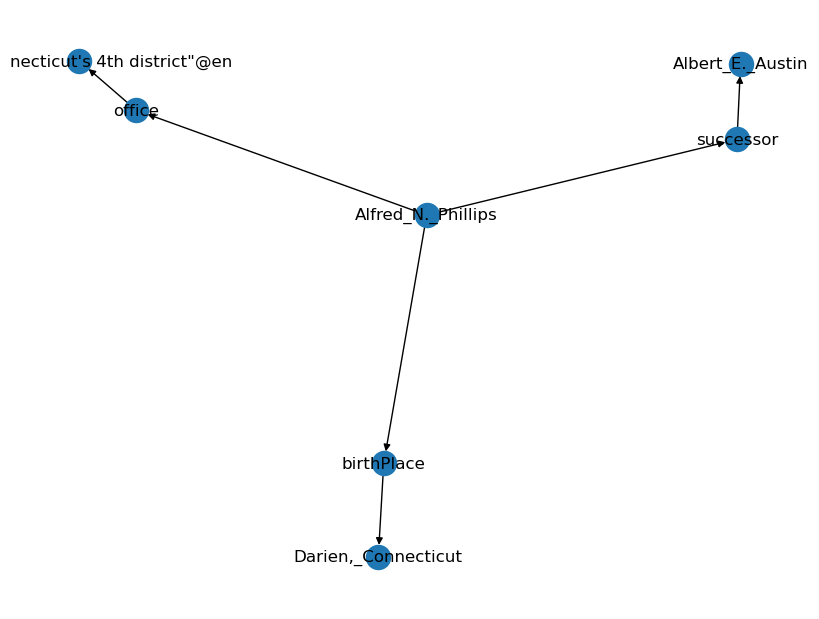

Decoded Input: 
 translate graph to text:  Alfred_N._Phillips  successor  Albert_E._Austin  Alfred_N._Phillips  birthPlace  Darien,_Connecticut  Alfred_N._Phillips  office  "from Connecticut's 4th district"@en
Decoded Target: 
 Alfred N. Phillips, who was born in Darien, Connecticut, was a Member of the U.S. House of Representatives from Connecticut's 4th district and was succeeded by Albert E. Austin.
DataBatch(x=[1, 512], edge_index=[2, 6], attention_mask=[1, 512], y=[1, 512], batch=[512], ptr=[2])
Original Sample: 
 translate graph to text: <H> Allan_Shivers  <R>  office  <T>  "Member of theTexas State SenatefromDistrict 4(Port Arthur)" <H> Allan_Shivers  <R>  party  <T>  Democratic_Party_(United_States) <H> Allan_Shivers  <R>  successor  <T>  Wilfred_R._Cousins,_Jr. 
 Allan Shivers served in the Democratic Party in the U.S. and worked as a member of the Texas State Senate from District 4 (Port Arthur) before being succeeded by Wilfred R Cousins Jr.
NetworkX Graph: 
 [('Allan_Shiver

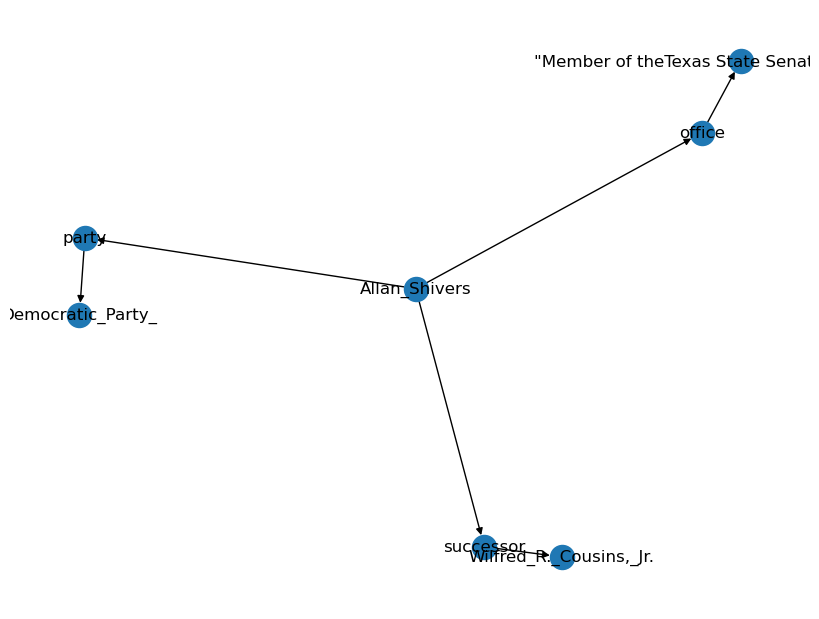

Decoded Input: 
 translate graph to text:  Allan_Shivers  office  "Member of theTexas State SenatefromDistrict 4(Port Arthur)"  Allan_Shivers  party  Democratic_Party_(United_States)  Allan_Shivers  successor  Wilfred_R._Cousins,_Jr.
Decoded Target: 
 Allan Shivers served in the Democratic Party in the U.S. and worked as a member of the Texas State Senate from District 4 (Port Arthur) before being succeeded by Wilfred R Cousins Jr.
DataBatch(x=[1, 512], edge_index=[2, 6], attention_mask=[1, 512], y=[1, 512], batch=[512], ptr=[2])
Original Sample: 
 translate graph to text: <H> Alvah_Sabin  <R>  activeYearsEndDate  <T>  "1857-03-03"^^xsd:date <H> Alvah_Sabin  <R>  region  <T>  Vermont <H> Vermont  <R>  largestCity  <T>  Burlington,_Vermont 
 Alvah Sabin, who ended his career on 3 March 1857, represented Vermont where the largest city is Burlington.
NetworkX Graph: 
 [('Alvah_Sabin', 'activeYearsEndDate', 0), ('Alvah_Sabin', 'region', 0), ('activeYearsEndDate', '"1857-03-03"^^xsd:date', 

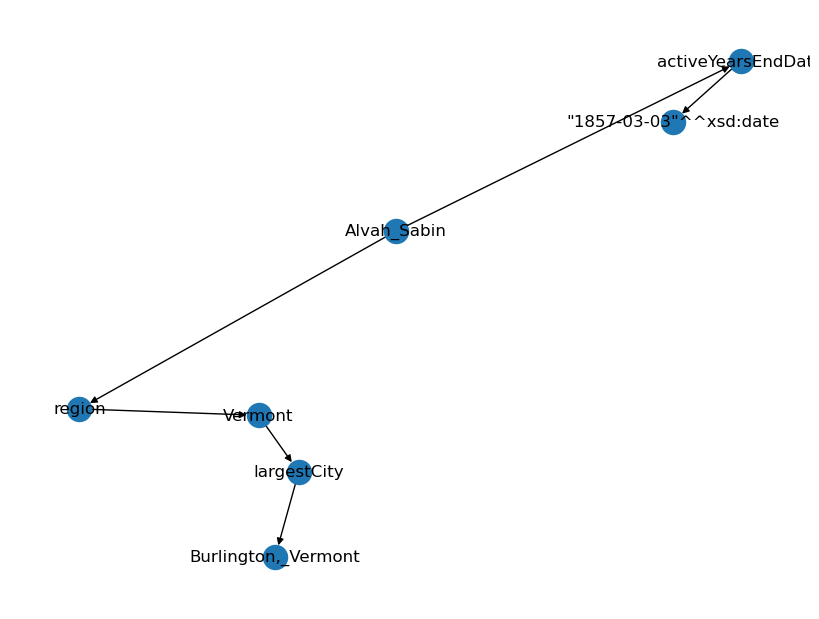

Decoded Input: 
 translate graph to text:  Alvah_Sabin  activeYearsEndDate  "1857-03-03"xsd:date  Alvah_Sabin  region  Vermont  Vermont  largestCity  Burlington,_Vermont
Decoded Target: 
 Alvah Sabin, who ended his career on 3 March 1857, represented Vermont where the largest city is Burlington.
DataBatch(x=[1, 512], edge_index=[2, 6], attention_mask=[1, 512], y=[1, 512], batch=[512], ptr=[2])
Original Sample: 
 translate graph to text: <H> Alvah_Sabin  <R>  party  <T>  Whig_Party_(United_States) <H> Alvah_Sabin  <R>  dateOfBirth  <T>  "1793-10-23"^^xsd:date <H> Whig_Party_(United_States)  <R>  leader  <T>  Henry_Clay 
 Born on 23rd October, 1793, Alvah Sabin, was a member of the United States Whig Party, the leader of which, was Henry Clay.
NetworkX Graph: 
 [('Alvah_Sabin', 'party', 0), ('Alvah_Sabin', 'dateOfBirth', 0), ('party', 'Whig_Party_', 0), ('Whig_Party_', 'leader', 0), ('dateOfBirth', '"1793-10-23"^^xsd:date', 0), ('leader', 'Henry_Clay', 0)]


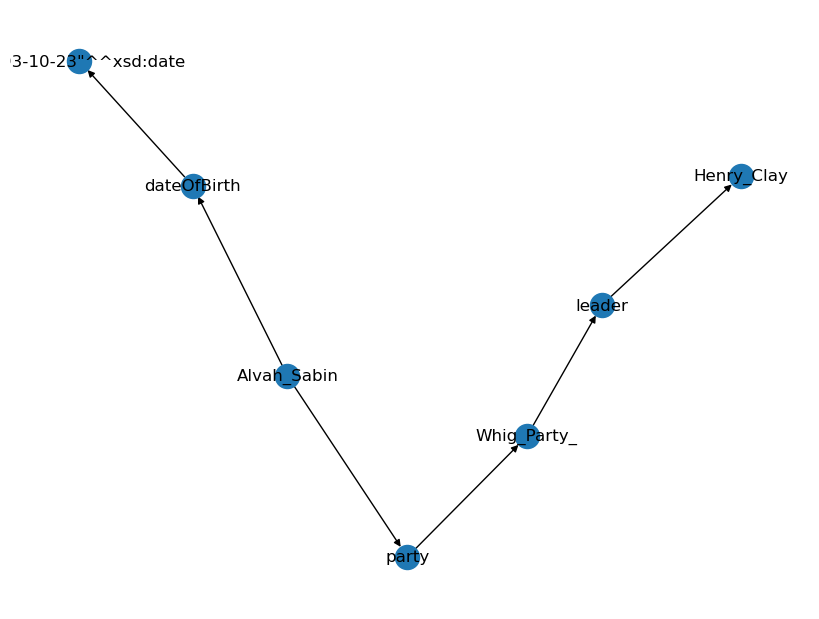

Decoded Input: 
 translate graph to text:  Alvah_Sabin  party  Whig_Party_(United_States)  Alvah_Sabin  dateOfBirth  "1793-10-23"xsd:date  Whig_Party_(United_States)  leader  Henry_Clay
Decoded Target: 
 Born on 23rd October, 1793, Alvah Sabin, was a member of the United States Whig Party, the leader of which, was Henry Clay.
DataBatch(x=[1, 512], edge_index=[2, 6], attention_mask=[1, 512], y=[1, 512], batch=[512], ptr=[2])
Original Sample: 
 translate graph to text: <H> Alvah_Sabin  <R>  party  <T>  Whig_Party_(United_States) <H> Whig_Party_(United_States)  <R>  leader  <T>  Daniel_Webster <H> Alvah_Sabin  <R>  birthPlace  <T>  Georgia,_Vermont 
 Born in Georgia, Vermont, Alvah Sabin, was a member of the Whig Party of the United States. Daniel Webster is the leader of the Whig Party in the United States.
NetworkX Graph: 
 [('Alvah_Sabin', 'party', 0), ('Alvah_Sabin', 'birthPlace', 0), ('party', 'Whig_Party_', 0), ('Whig_Party_', 'leader', 0), ('leader', 'Daniel_Webster', 0), ('birthPl

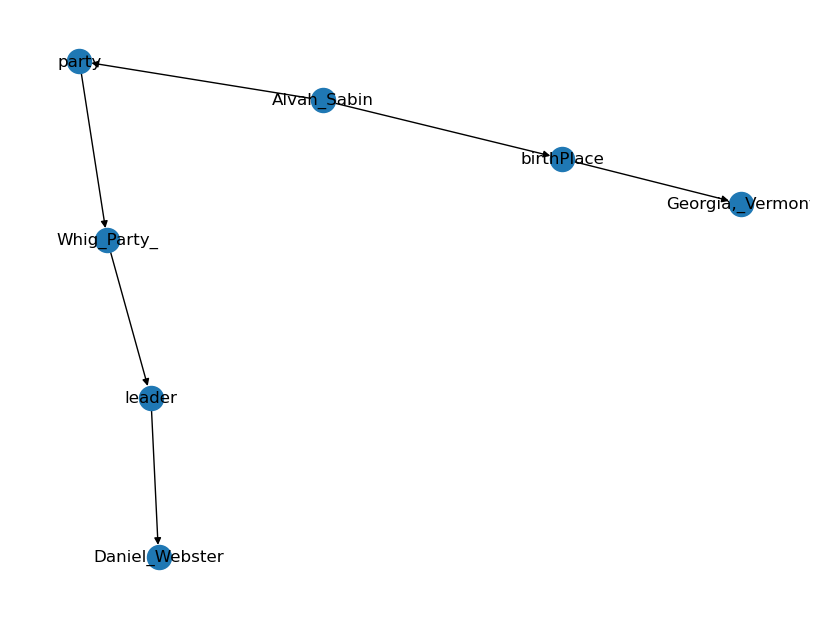

Decoded Input: 
 translate graph to text:  Alvah_Sabin  party  Whig_Party_(United_States)  Whig_Party_(United_States)  leader  Daniel_Webster  Alvah_Sabin  birthPlace  Georgia,_Vermont
Decoded Target: 
 Born in Georgia, Vermont, Alvah Sabin, was a member of the Whig Party of the United States. Daniel Webster is the leader of the Whig Party in the United States.
DataBatch(x=[1, 512], edge_index=[2, 6], attention_mask=[1, 512], y=[1, 512], batch=[512], ptr=[2])
Original Sample: 
 translate graph to text: <H> American_Civil_War  <R>  commander  <T>  Abraham_Lincoln <H> Albert_Jennings_Fountain  <R>  battles  <T>  American_Civil_War <H> Albert_Jennings_Fountain  <R>  birthPlace  <T>  United_States 
 Albert Jennings Fountain was born in the United States and fought in the American Civil War. A commander in that war was Abraham Lincoln.
NetworkX Graph: 
 [('American_Civil_War', 'commander', 0), ('commander', 'Abraham_Lincoln', 0), ('Albert_Jennings_Fountain', 'battles', 0), ('Albert_Jennings

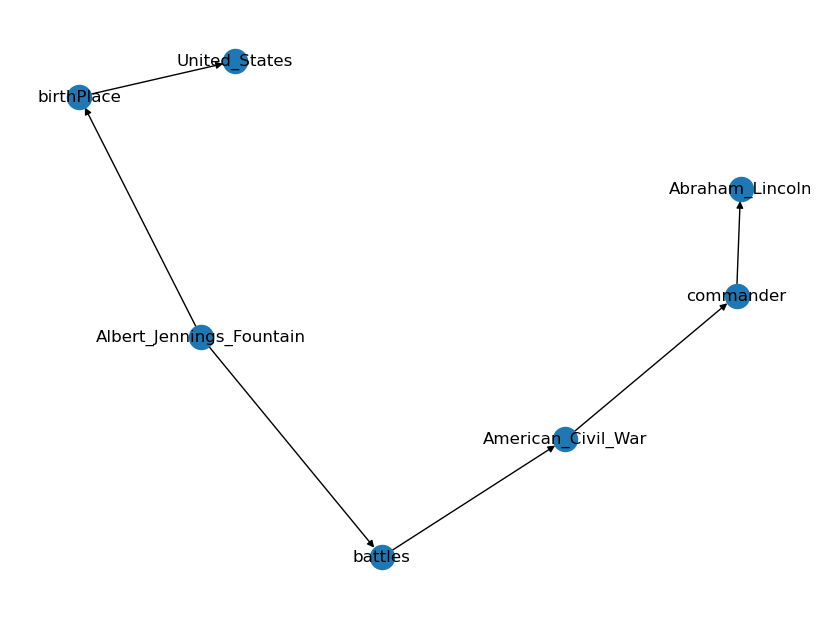

Decoded Input: 
 translate graph to text:  American_Civil_War  commander  Abraham_Lincoln  Albert_Jennings_Fountain  battles  American_Civil_War  Albert_Jennings_Fountain  birthPlace  United_States
Decoded Target: 
 Albert Jennings Fountain was born in the United States and fought in the American Civil War. A commander in that war was Abraham Lincoln.
DataBatch(x=[1, 512], edge_index=[2, 6], attention_mask=[1, 512], y=[1, 512], batch=[512], ptr=[2])
Original Sample: 
 translate graph to text: <H> American_Civil_War  <R>  commander  <T>  Jefferson_Davis <H> Alfred_Moore_Scales  <R>  battles  <T>  Battle_of_Fredericksburg <H> Battle_of_Fredericksburg  <R>  isPartOfMilitaryConflict  <T>  American_Civil_War 
 The battle of Fredericksburg, in which Alfred Moore Scales paricipated, was part of the American Civil War military conflict during which Jefferson Davis was a commander.
NetworkX Graph: 
 [('American_Civil_War', 'commander', 0), ('commander', 'Jefferson_Davis', 0), ('Alfred_Moore_Sca

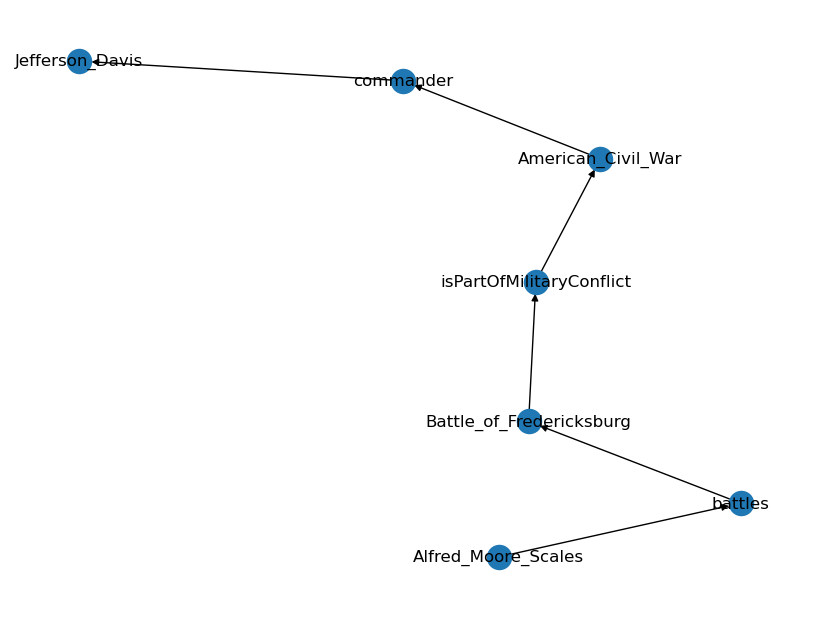

Decoded Input: 
 translate graph to text:  American_Civil_War  commander  Jefferson_Davis  Alfred_Moore_Scales  battles  Battle_of_Fredericksburg  Battle_of_Fredericksburg  isPartOfMilitaryConflict  American_Civil_War
Decoded Target: 
 The battle of Fredericksburg, in which Alfred Moore Scales paricipated, was part of the American Civil War military conflict during which Jefferson Davis was a commander.
DataBatch(x=[1, 512], edge_index=[2, 6], attention_mask=[1, 512], y=[1, 512], batch=[512], ptr=[2])
Original Sample: 
 translate graph to text: <H> Austria  <R>  leaderName  <T>  Doris_Bures <H> Alfons_Gorbach  <R>  birthPlace  <T>  County_of_Tyrol <H> Alfons_Gorbach  <R>  deathPlace  <T>  Austria 
 Alfons Gorbach ws born in the County of Tyrol and later died in Austria which is led by Doris Bures.
NetworkX Graph: 
 [('Austria', 'leaderName', 0), ('leaderName', 'Doris_Bures', 0), ('Alfons_Gorbach', 'birthPlace', 0), ('Alfons_Gorbach', 'deathPlace', 0), ('birthPlace', 'County_of_Tyrol', 

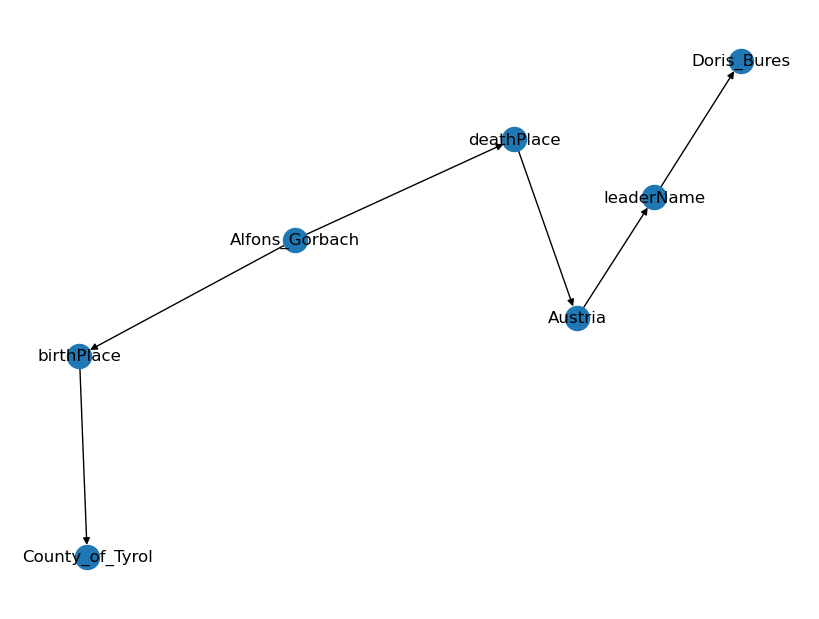

Decoded Input: 
 translate graph to text:  Austria  leaderName  Doris_Bures  Alfons_Gorbach  birthPlace  County_of_Tyrol  Alfons_Gorbach  deathPlace  Austria
Decoded Target: 
 Alfons Gorbach ws born in the County of Tyrol and later died in Austria which is led by Doris Bures.
DataBatch(x=[1, 512], edge_index=[2, 6], attention_mask=[1, 512], y=[1, 512], batch=[512], ptr=[2])
Original Sample: 
 translate graph to text: <H> Austria  <R>  leaderName  <T>  Doris_Bures <H> Alfons_Gorbach  <R>  birthPlace  <T>  Tyrol_(state) <H> Alfons_Gorbach  <R>  deathPlace  <T>  Austria 
 Alfons Gorbach's place of birth was the state, Tyrol and place of death was in Austria, the leader of which, is Doris Bures.
NetworkX Graph: 
 [('Austria', 'leaderName', 0), ('leaderName', 'Doris_Bures', 0), ('Alfons_Gorbach', 'birthPlace', 0), ('Alfons_Gorbach', 'deathPlace', 0), ('birthPlace', 'Tyrol_', 0), ('deathPlace', 'Austria', 0)]


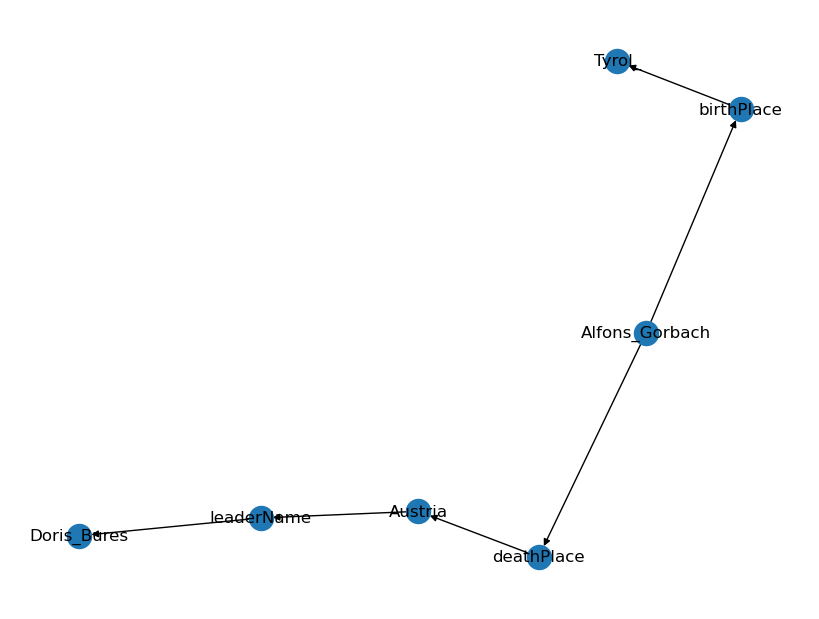

Decoded Input: 
 translate graph to text:  Austria  leaderName  Doris_Bures  Alfons_Gorbach  birthPlace  Tyrol_(state)  Alfons_Gorbach  deathPlace  Austria
Decoded Target: 
 Alfons Gorbach's place of birth was the state, Tyrol and place of death was in Austria, the leader of which, is Doris Bures.
DataBatch(x=[1, 512], edge_index=[2, 6], attention_mask=[1, 512], y=[1, 512], batch=[512], ptr=[2])
Original Sample: 
 translate graph to text: <H> Austria  <R>  leaderName  <T>  Doris_Bures <H> Alfons_Gorbach  <R>  placeOfDeath  <T>  Styria <H> Alfons_Gorbach  <R>  deathPlace  <T>  Austria 
 Alfons Gorbach died in Styria, Austria where Doris Bures is a leader.
NetworkX Graph: 
 [('Austria', 'leaderName', 0), ('leaderName', 'Doris_Bures', 0), ('Alfons_Gorbach', 'placeOfDeath', 0), ('Alfons_Gorbach', 'deathPlace', 0), ('placeOfDeath', 'Styria', 0), ('deathPlace', 'Austria', 0)]


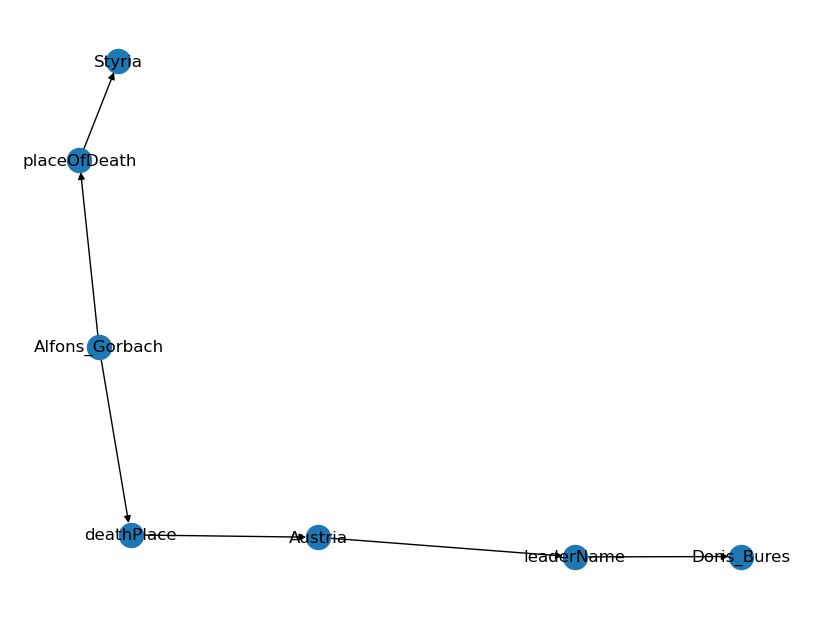

Decoded Input: 
 translate graph to text:  Austria  leaderName  Doris_Bures  Alfons_Gorbach  placeOfDeath  Styria  Alfons_Gorbach  deathPlace  Austria
Decoded Target: 
 Alfons Gorbach died in Styria, Austria where Doris Bures is a leader.
DataBatch(x=[1, 512], edge_index=[2, 6], attention_mask=[1, 512], y=[1, 512], batch=[512], ptr=[2])
Original Sample: 
 translate graph to text: <H> Battle_of_Salem_Church  <R>  commander  <T>  Robert_E._Lee <H> Battle_of_Salem_Church  <R>  isPartOfMilitaryConflict  <T>  American_Civil_War <H> Aaron_S._Daggett  <R>  battles  <T>  Battle_of_Salem_Church 
 The Battle of Salem Church, in which Aaron S Daggett fought and in which Robert E Lee was a commander, was part of the American Civil War.
NetworkX Graph: 
 [('Battle_of_Salem_Church', 'commander', 0), ('Battle_of_Salem_Church', 'isPartOfMilitaryConflict', 0), ('commander', 'Robert_E._Lee', 0), ('isPartOfMilitaryConflict', 'American_Civil_War', 0), ('Aaron_S._Daggett', 'battles', 0), ('battles', 'Battl

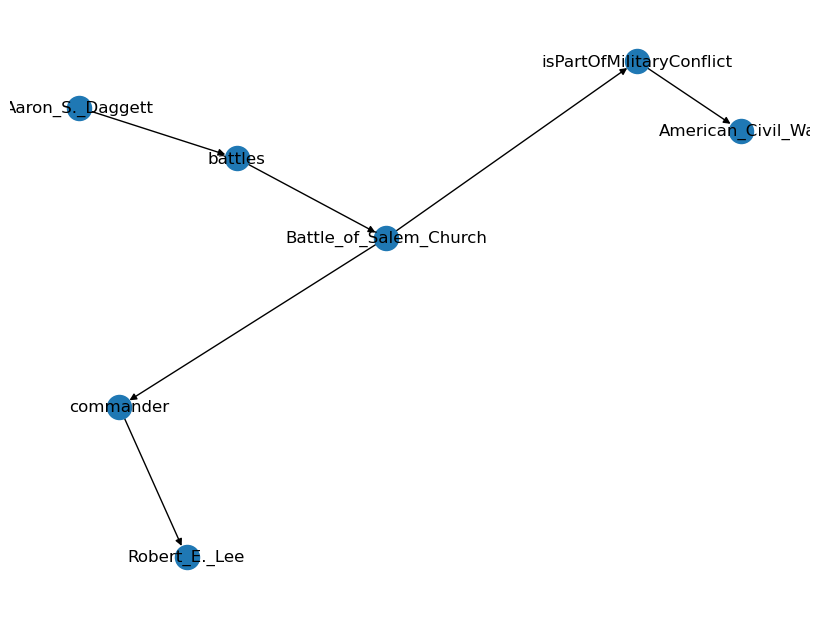

Decoded Input: 
 translate graph to text:  Battle_of_Salem_Church  commander  Robert_E._Lee  Battle_of_Salem_Church  isPartOfMilitaryConflict  American_Civil_War  Aaron_S._Daggett  battles  Battle_of_Salem_Church
Decoded Target: 
 The Battle of Salem Church, in which Aaron S Daggett fought and in which Robert E Lee was a commander, was part of the American Civil War.
DataBatch(x=[1, 512], edge_index=[2, 6], attention_mask=[1, 512], y=[1, 512], batch=[512], ptr=[2])
Original Sample: 
 translate graph to text: <H> Netherlands  <R>  currency  <T>  Euro <H> Ab_Klink  <R>  birthPlace  <T>  Stellendam <H> Ab_Klink  <R>  nationality  <T>  Netherlands 
 Ab Klink was born in Stellendam in the Netherlands, where the national currency is the euro.
NetworkX Graph: 
 [('Netherlands', 'currency', 0), ('currency', 'Euro', 0), ('Ab_Klink', 'birthPlace', 0), ('Ab_Klink', 'nationality', 0), ('birthPlace', 'Stellendam', 0), ('nationality', 'Netherlands', 0)]


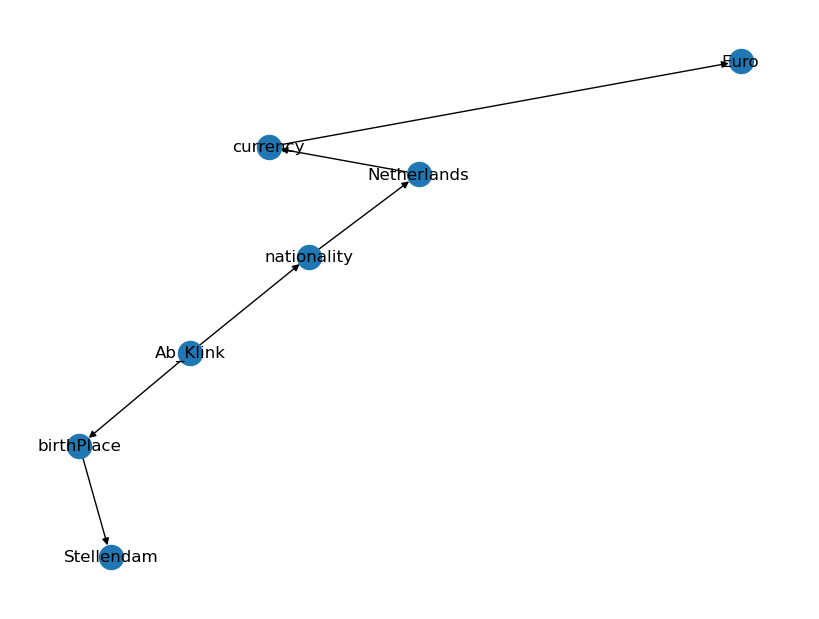

Decoded Input: 
 translate graph to text:  Netherlands  currency  Euro  Ab_Klink  birthPlace  Stellendam  Ab_Klink  nationality  Netherlands
Decoded Target: 
 Ab Klink was born in Stellendam in the Netherlands, where the national currency is the euro.
DataBatch(x=[1, 512], edge_index=[2, 6], attention_mask=[1, 512], y=[1, 512], batch=[512], ptr=[2])
Original Sample: 
 translate graph to text: <H> Poland  <R>  language  <T>  Polish_language <H> Adam_Koc  <R>  nationality  <T>  Poland <H> Poland  <R>  ethnicGroup  <T>  Kashubians 
 Adam Koc is from Poland, where Polish is spoken and where Kashubians are an ethnic group.
NetworkX Graph: 
 [('Poland', 'language', 0), ('Poland', 'ethnicGroup', 0), ('language', 'Polish_language', 0), ('Adam_Koc', 'nationality', 0), ('nationality', 'Poland', 0), ('ethnicGroup', 'Kashubians', 0)]


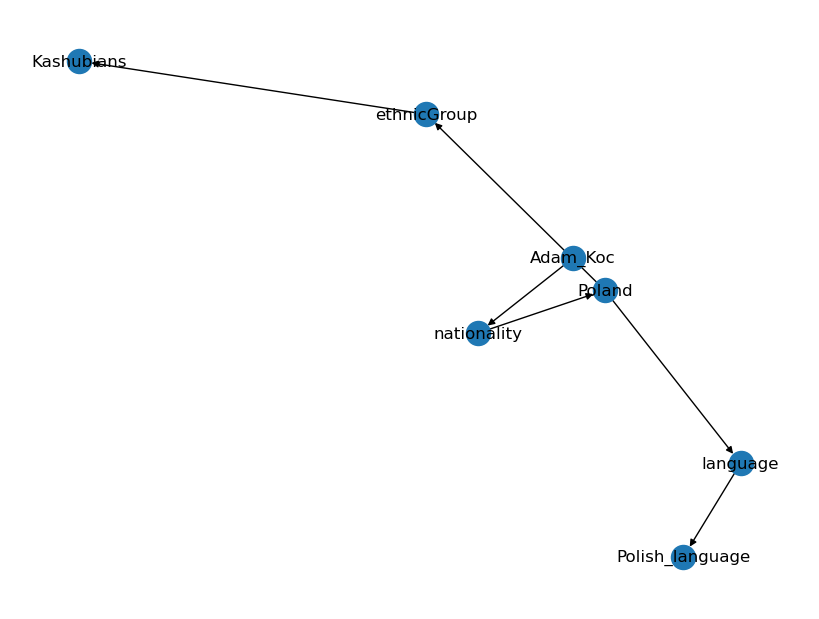

Decoded Input: 
 translate graph to text:  Poland  language  Polish_language  Adam_Koc  nationality  Poland  Poland  ethnicGroup  Kashubians
Decoded Target: 
 Adam Koc is from Poland, where Polish is spoken and where Kashubians are an ethnic group.
DataBatch(x=[1, 512], edge_index=[2, 6], attention_mask=[1, 512], y=[1, 512], batch=[512], ptr=[2])
Original Sample: 
 translate graph to text: <H> (19255)_1994_VK8  <R>  escapeVelocity  <T>  "333.0"^^xsd:double <H> (19255)_1994_VK8  <R>  mass  <T>  "5600.0"^^xsd:double <H> (19255)_1994_VK8  <R>  Planet/apoapsis  <T>  "6.603633E9"^^<http://dbpedia.org/datatype/kilometre> 
 19255 1994 VK8, with a mass of 5.6kg, has an apoapsis of 6603633000.0 kilometres and an escape velocity of 0.0925 km/s.
NetworkX Graph: 
 [('_1994_VK8', 'escapeVelocity', 0), ('_1994_VK8', 'mass', 0), ('_1994_VK8', 'Planet/apoapsis', 0), ('escapeVelocity', '"333.0"^^xsd:double', 0), ('mass', '"5600.0"^^xsd:double', 0), ('Planet/apoapsis', '"6.603633E9"^^<http://dbpedia.org

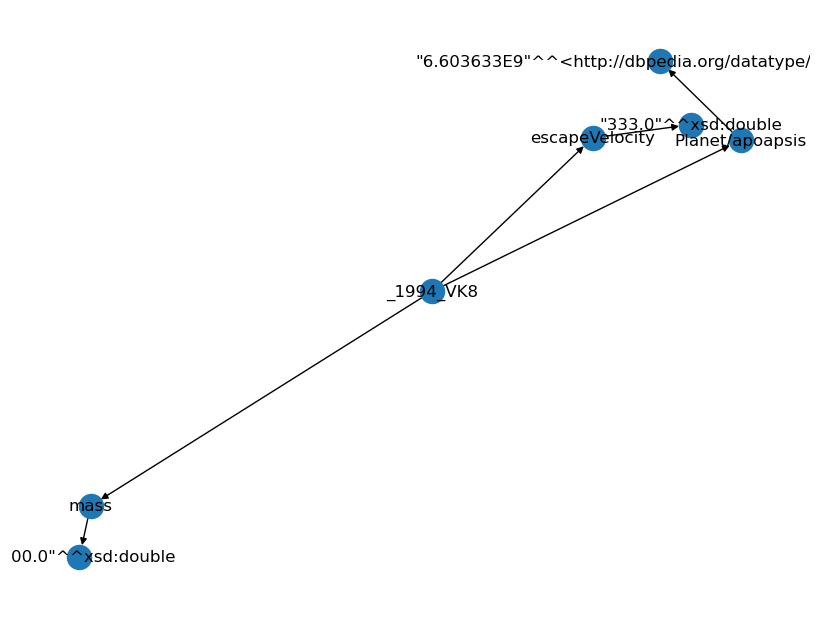

Decoded Input: 
 translate graph to text:  (19255)_1994_VK8  escapeVelocity  "333.0"xsd:double  (19255)_1994_VK8  mass  "5600.0"xsd:double  (19255)_1994_VK8  Planet/apoapsis  "6.603633E9"http://dbpedia.org/datatype/kilometre>
Decoded Target: 
 19255 1994 VK8, with a mass of 5.6kg, has an apoapsis of 6603633000.0 kilometres and an escape velocity of 0.0925 km/s.
DataBatch(x=[1, 512], edge_index=[2, 6], attention_mask=[1, 512], y=[1, 512], batch=[512], ptr=[2])
Original Sample: 
 translate graph to text: <H> (410777)_2009_FD  <R>  orbitalPeriod  <T>  3.9447e+07 <H> (410777)_2009_FD  <R>  periapsis  <T>  8.82343e+10 <H> (410777)_2009_FD  <R>  discoverer  <T>  "Spacewatch"@en 
 The celestial body known as (410777) 2009 FD has an orbital period of 39447000 , has a periapsis of 88234300000.0 and it was discovered by Spacewatch.
NetworkX Graph: 
 [('_2009_FD', 'orbitalPeriod', 0), ('_2009_FD', 'periapsis', 0), ('_2009_FD', 'discoverer', 0), ('orbitalPeriod', '3.9447e+07', 0), ('periapsis', '8

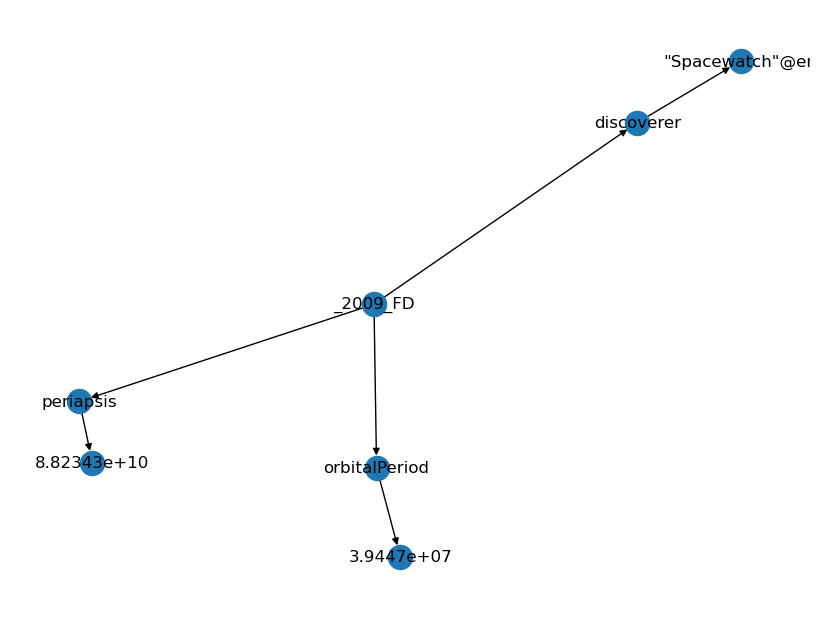

Decoded Input: 
 translate graph to text:  (410777)_2009_FD  orbitalPeriod  3.9447e+07  (410777)_2009_FD  periapsis  8.82343e+10  (410777)_2009_FD  discoverer  "Spacewatch"@en
Decoded Target: 
 The celestial body known as (410777) 2009 FD has an orbital period of 39447000, has a periapsis of 88234300000.0 and it was discovered by Spacewatch.
DataBatch(x=[1, 512], edge_index=[2, 6], attention_mask=[1, 512], y=[1, 512], batch=[512], ptr=[2])
Original Sample: 
 translate graph to text: <H> (66063)_1998_RO1  <R>  minimumTemperature  <T>  "202.0"^^xsd:double <H> (66063)_1998_RO1  <R>  Planet/maximumTemperature  <T>  "500.0"^^<http://dbpedia.org/datatype/kelvin> <H> (66063)_1998_RO1  <R>  Planet/apoapsis  <T>  "2.5498957060815E8"^^<http://dbpedia.org/datatype/kilometre> 
 (66063) 1998 RO1 has an apoapsis of 254989570.60815 km, a maximum temperature of 500 kelvins and a minimum temperature of -71 degrees celsius.
NetworkX Graph: 
 [('_1998_RO1', 'minimumTemperature', 0), ('_1998_RO1', 'Planet

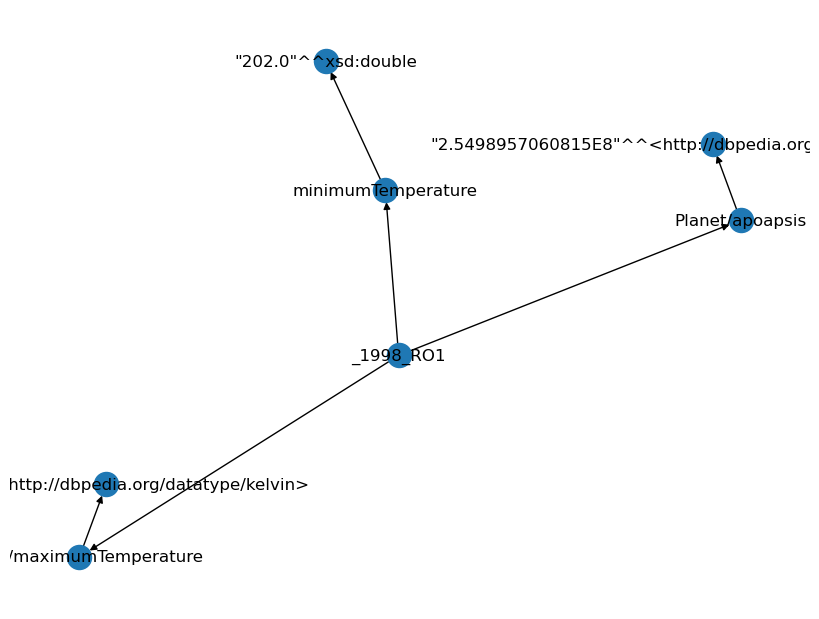

Decoded Input: 
 translate graph to text:  (66063)_1998_RO1  minimumTemperature  "202.0"xsd:double  (66063)_1998_RO1  Planet/maximumTemperature  "500.0"http://dbpedia.org/datatype/kelvin>  (66063)_1998_RO1  Planet/apoapsis  "2.5498957060815E8"http://dbpedia.org/datatype/kilometre>
Decoded Target: 
 (66063) 1998 RO1 has an apoapsis of 254989570.60815 km, a maximum temperature of 500 kelvins and a minimum temperature of -71 degrees celsius.
DataBatch(x=[1, 512], edge_index=[2, 6], attention_mask=[1, 512], y=[1, 512], batch=[512], ptr=[2])
Original Sample: 
 translate graph to text: <H> (66391)_1999_KW4  <R>  Planet/averageSpeed  <T>  "37.16"^^<http://dbpedia.org/datatype/kilometrePerSecond> <H> (66391)_1999_KW4  <R>  Planet/density  <T>  "2000.0"^^<http://dbpedia.org/datatype/kilogramPerCubicMetre> <H> (66391)_1999_KW4  <R>  Planet/apoapsis  <T>  "1.621640918388E8"^^<http://dbpedia.org/datatype/kilometre> 
 The celestial body known as (66391) 1999 KW4 has an apoapsis of 162164091.8388 km

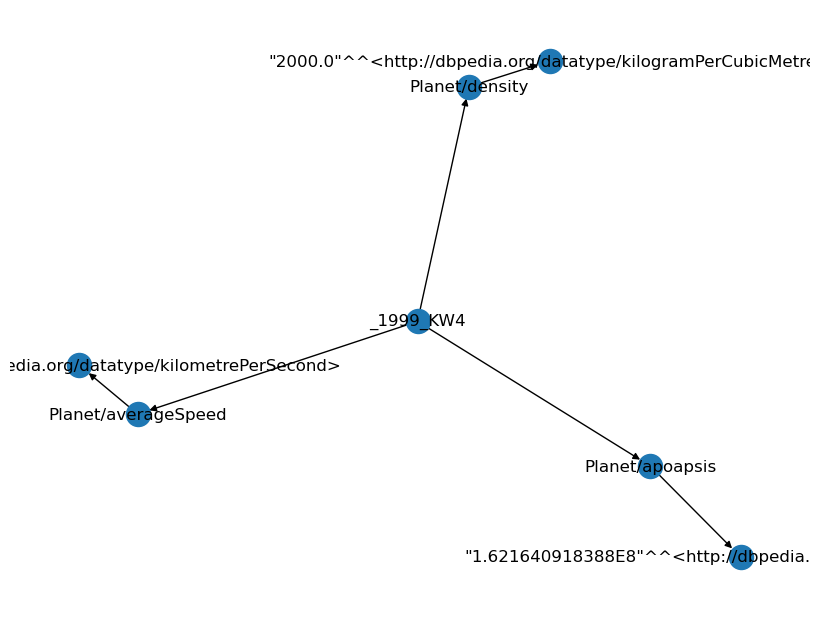

Decoded Input: 
 translate graph to text:  (66391)_1999_KW4  Planet/averageSpeed  "37.16"http://dbpedia.org/datatype/kilometrePerSecond>  (66391)_1999_KW4  Planet/density  "2000.0"http://dbpedia.org/datatype/kilogramPerCubicMetre>  (66391)_1999_KW4  Planet/apoapsis  "1.621640918388E8"http://dbpedia.org/datatype/kilometre>
Decoded Target: 
 The celestial body known as (66391) 1999 KW4 has an apoapsis of 162164091.8388 km, an average speed of 37.16 kilometres per second, and a density of 2.0 grams per cubic centimetre.
DataBatch(x=[1, 512], edge_index=[2, 6], attention_mask=[1, 512], y=[1, 512], batch=[512], ptr=[2])
Original Sample: 
 translate graph to text: <H> 1000_Piazzia  <R>  orbitalPeriod  <T>  "488160.0"^^xsd:double <H> 1000_Piazzia  <R>  periapsis  <T>  3.52497e+11 <H> 1000_Piazzia  <R>  epoch  <T>  "2015-06-27"^^xsd:date 
 The celestial body known as 1000 Piazzia has an orbital period of 488160. It has a periapsis of 352497000000.0 and the epoch date of, 2015-06-27.
NetworkX G

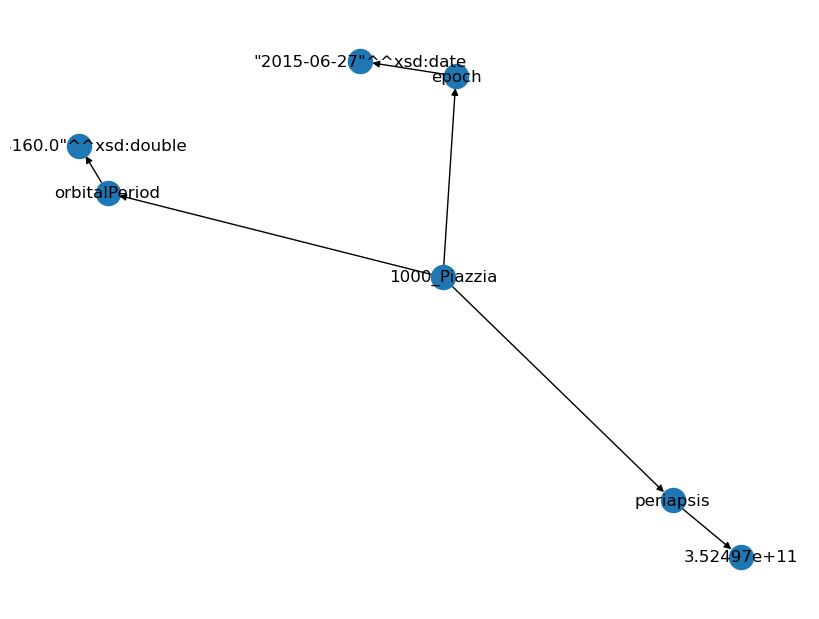

Decoded Input: 
 translate graph to text:  1000_Piazzia  orbitalPeriod  "488160.0"xsd:double  1000_Piazzia  periapsis  3.52497e+11  1000_Piazzia  epoch  "2015-06-27"xsd:date
Decoded Target: 
 The celestial body known as 1000 Piazzia has an orbital period of 488160. It has a periapsis of 352497000000.0 and the epoch date of, 2015-06-27.
DataBatch(x=[1, 512], edge_index=[2, 6], attention_mask=[1, 512], y=[1, 512], batch=[512], ptr=[2])
Original Sample: 
 translate graph to text: <H> 1001_Gaussia  <R>  epoch  <T>  "27 June 2015 (JD2457200.5)" <H> 1001_Gaussia  <R>  formerName  <T>  "1923 OAA907 XC"@en <H> 1001_Gaussia  <R>  periapsis  <T>  4.19113e+11 
 The periapsis of the 1001 Gaussia (formally known as 1923 OAA907 XC) is 419113394.55312 km and it has an epoch date of the 31st July 2016.
NetworkX Graph: 
 [('1001_Gaussia', 'epoch', 0), ('1001_Gaussia', 'formerName', 0), ('1001_Gaussia', 'periapsis', 0), ('epoch', '"27 June 2015 "', 0), ('formerName', '"1923 OAA907 XC"@en', 0), ('periaps

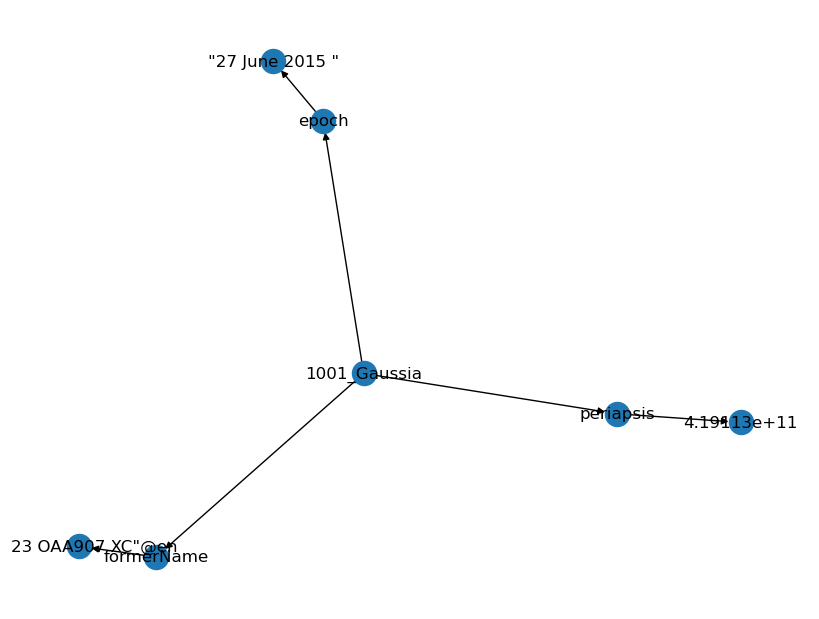

Decoded Input: 
 translate graph to text:  1001_Gaussia  epoch  "27 June 2015 (JD2457200.5)"  1001_Gaussia  formerName  "1923 OAA907 XC"@en  1001_Gaussia  periapsis  4.19113e+11
Decoded Target: 
 The periapsis of the 1001 Gaussia (formally known as 1923 OAA907 XC) is 419113394.55312 km and it has an epoch date of the 31st July 2016.
DataBatch(x=[1, 512], edge_index=[2, 6], attention_mask=[1, 512], y=[1, 512], batch=[512], ptr=[2])
Original Sample: 
 translate graph to text: <H> 101_Helena  <R>  mass  <T>  "3000.0"^^xsd:double <H> 101_Helena  <R>  escapeVelocity  <T>  "0.0348"^^<http://dbpedia.org/datatype/kilometrePerSecond> <H> 101_Helena  <R>  Planet/apoapsis  <T>  "4.41092E8"^^<http://dbpedia.org/datatype/kilometre> 
 101 Helena(mass 3.0kgs) has an escape velocity of 0.0348 kilometres per second and its apoapsis is 441092000.0 (kms).
NetworkX Graph: 
 [('101_Helena', 'mass', 0), ('101_Helena', 'escapeVelocity', 0), ('101_Helena', 'Planet/apoapsis', 0), ('mass', '"3000.0"^^xsd:double

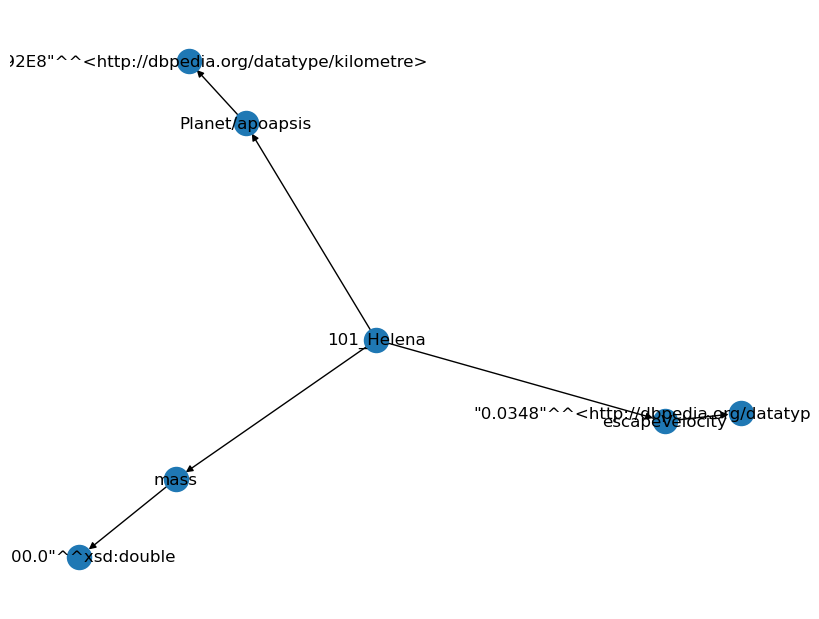

Decoded Input: 
 translate graph to text:  101_Helena  mass  "3000.0"xsd:double  101_Helena  escapeVelocity  "0.0348"http://dbpedia.org/datatype/kilometrePerSecond>  101_Helena  Planet/apoapsis  "4.41092E8"http://dbpedia.org/datatype/kilometre>
Decoded Target: 
 101 Helena(mass 3.0kgs) has an escape velocity of 0.0348 kilometres per second and its apoapsis is 441092000.0 (kms).
DataBatch(x=[1, 512], edge_index=[2, 6], attention_mask=[1, 512], y=[1, 512], batch=[512], ptr=[2])
Original Sample: 
 translate graph to text: <H> 1036_Ganymed  <R>  discoverer  <T>  Walter_Baade <H> Walter_Baade  <R>  nationality  <T>  Germany <H> Walter_Baade  <R>  almaMater  <T>  University_of_Göttingen 
 1036 Ganymed was discovered by Walter Baade, a German National who studied at the University of Gottingen.
NetworkX Graph: 
 [('1036_Ganymed', 'discoverer', 0), ('discoverer', 'Walter_Baade', 0), ('Walter_Baade', 'nationality', 0), ('Walter_Baade', 'almaMater', 0), ('nationality', 'Germany', 0), ('almaMater

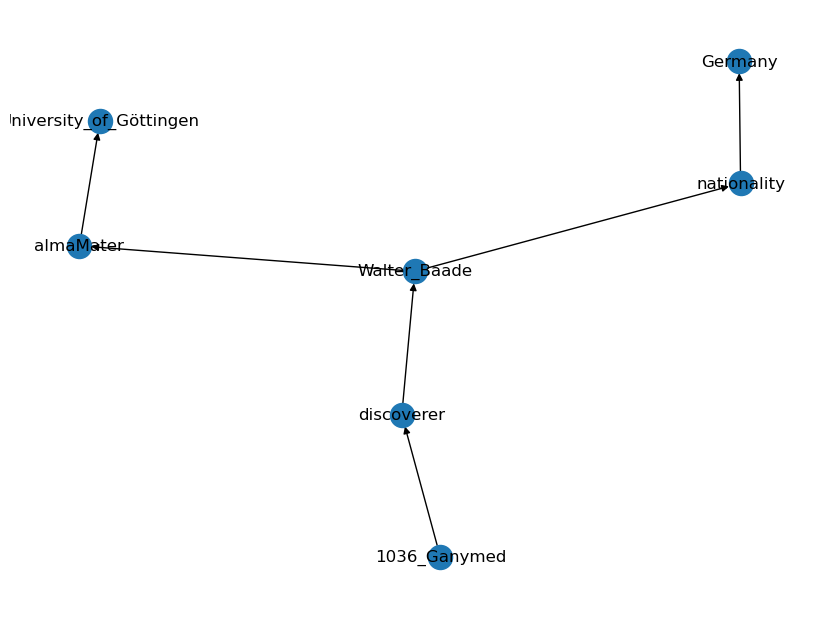

Decoded Input: 
 translate graph to text:  1036_Ganymed  discoverer  Walter_Baade  Walter_Baade  nationality  Germany  Walter_Baade  almaMater  University_of_Göttingen
Decoded Target: 
 1036 Ganymed was discovered by Walter Baade, a German National who studied at the University of Gottingen.
DataBatch(x=[1, 512], edge_index=[2, 6], attention_mask=[1, 512], y=[1, 512], batch=[512], ptr=[2])
Original Sample: 
 translate graph to text: <H> 103_Hera  <R>  discoverer  <T>  James_Craig_Watson <H> 103_Hera  <R>  epoch  <T>  "2011-08-27"^^xsd:date <H> James_Craig_Watson  <R>  deathPlace  <T>  Madison,_Wisconsin 
 103 Hera has an epoch date of August 27th 2011 and was discovered by James Craig Watson ,who died in Madison,Wisconsin.
NetworkX Graph: 
 [('103_Hera', 'discoverer', 0), ('103_Hera', 'epoch', 0), ('discoverer', 'James_Craig_Watson', 0), ('James_Craig_Watson', 'deathPlace', 0), ('epoch', '"2011-08-27"^^xsd:date', 0), ('deathPlace', 'Madison,_Wisconsin', 0)]


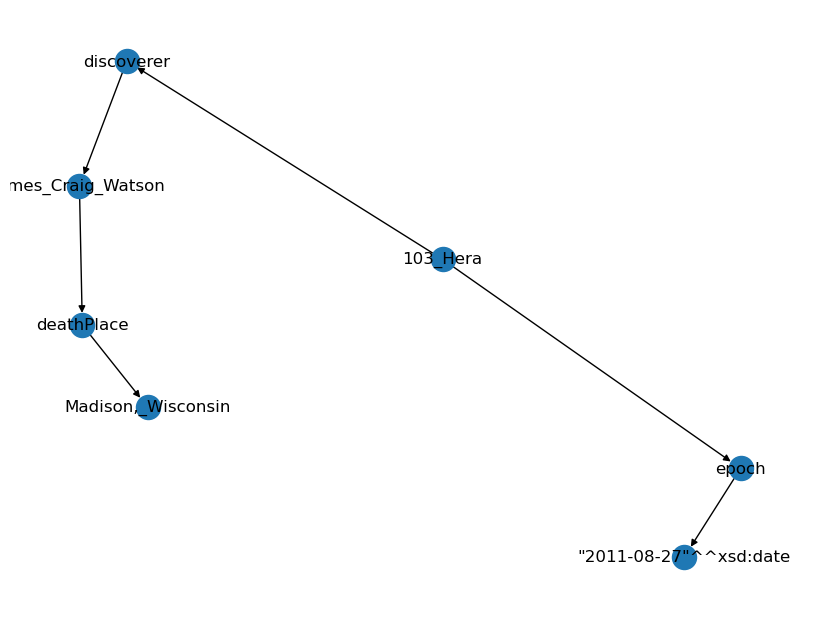

Decoded Input: 
 translate graph to text:  103_Hera  discoverer  James_Craig_Watson  103_Hera  epoch  "2011-08-27"xsd:date  James_Craig_Watson  deathPlace  Madison,_Wisconsin
Decoded Target: 
 103 Hera has an epoch date of August 27th 2011 and was discovered by James Craig Watson,who died in Madison,Wisconsin.
DataBatch(x=[1, 512], edge_index=[2, 6], attention_mask=[1, 512], y=[1, 512], batch=[512], ptr=[2])
Original Sample: 
 translate graph to text: <H> 103_Hera  <R>  discoverer  <T>  James_Craig_Watson <H> James_Craig_Watson  <R>  deathPlace  <T>  Madison,_Wisconsin <H> James_Craig_Watson  <R>  deathCause  <T>  Peritonitis 
 James Craig Watson, who discovered 103 Hera, died in Madison, Wisconsin of peritonitis.
NetworkX Graph: 
 [('103_Hera', 'discoverer', 0), ('discoverer', 'James_Craig_Watson', 0), ('James_Craig_Watson', 'deathPlace', 0), ('James_Craig_Watson', 'deathCause', 0), ('deathPlace', 'Madison,_Wisconsin', 0), ('deathCause', 'Peritonitis', 0)]


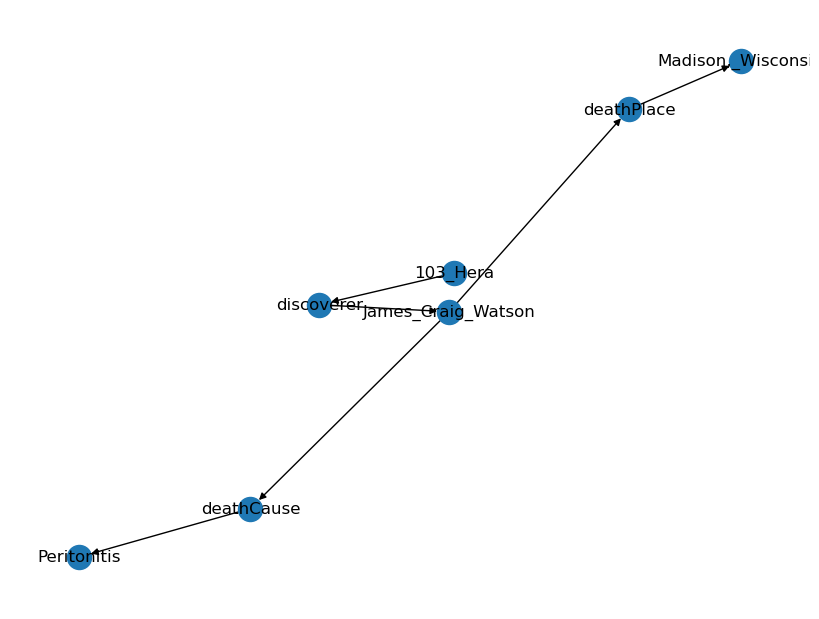

Decoded Input: 
 translate graph to text:  103_Hera  discoverer  James_Craig_Watson  James_Craig_Watson  deathPlace  Madison,_Wisconsin  James_Craig_Watson  deathCause  Peritonitis
Decoded Target: 
 James Craig Watson, who discovered 103 Hera, died in Madison, Wisconsin of peritonitis.
DataBatch(x=[1, 512], edge_index=[2, 6], attention_mask=[1, 512], y=[1, 512], batch=[512], ptr=[2])
Original Sample: 
 translate graph to text: <H> 103_Hera  <R>  orbitalPeriod  <T>  1.40159e+08 <H> 103_Hera  <R>  epoch  <T>  "2011-08-27"^^xsd:date <H> 103_Hera  <R>  Planet/apoapsis  <T>  "4.3717E8"^^<http://dbpedia.org/datatype/kilometre> 
 103 Hera has an apoapsis of 437170000 km, an orbital period of 1622.213 days and an epoch date of 27 August 2011.
NetworkX Graph: 
 [('103_Hera', 'orbitalPeriod', 0), ('103_Hera', 'epoch', 0), ('103_Hera', 'Planet/apoapsis', 0), ('orbitalPeriod', '1.40159e+08', 0), ('epoch', '"2011-08-27"^^xsd:date', 0), ('Planet/apoapsis', '"4.3717E8"^^<http://dbpedia.org/datatype/k

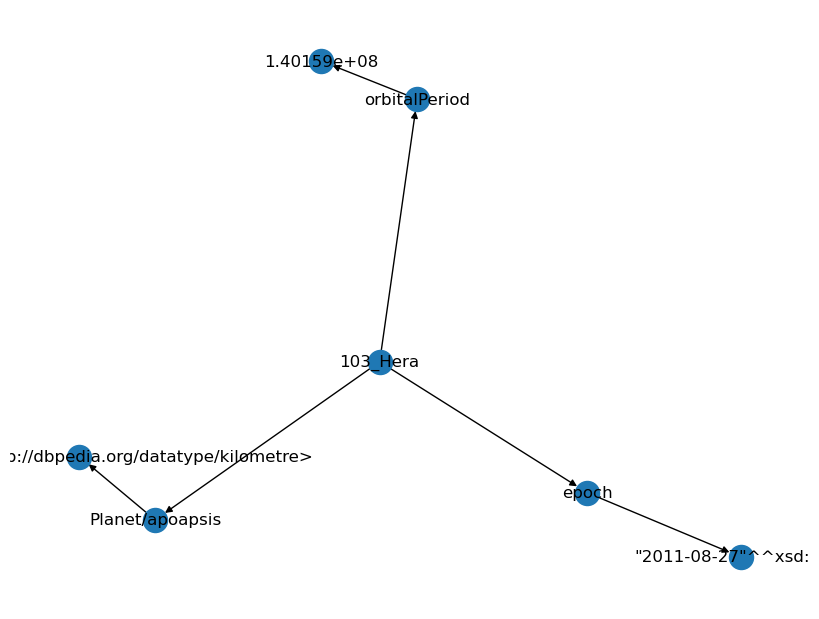

Decoded Input: 
 translate graph to text:  103_Hera  orbitalPeriod  1.40159e+08  103_Hera  epoch  "2011-08-27"xsd:date  103_Hera  Planet/apoapsis  "4.3717E8"http://dbpedia.org/datatype/kilometre>
Decoded Target: 
 103 Hera has an apoapsis of 437170000 km, an orbital period of 1622.213 days and an epoch date of 27 August 2011.
DataBatch(x=[1, 512], edge_index=[2, 6], attention_mask=[1, 512], y=[1, 512], batch=[512], ptr=[2])
Original Sample: 
 translate graph to text: <H> 103_Hera  <R>  temperature  <T>  "170.0"^^xsd:double <H> 103_Hera  <R>  escapeVelocity  <T>  "0.0482"^^<http://dbpedia.org/datatype/kilometrePerSecond> <H> 103_Hera  <R>  Planet/apoapsis  <T>  "4.3717E8"^^<http://dbpedia.org/datatype/kilometre> 
 The celestial body known as 103 Hera has an escape velocity of 0.0482 k.p.s., temperature of 170.0 kelvins and an apoapsis of 437170000.0 kilometres.
NetworkX Graph: 
 [('103_Hera', 'temperature', 0), ('103_Hera', 'escapeVelocity', 0), ('103_Hera', 'Planet/apoapsis', 0), ('tem

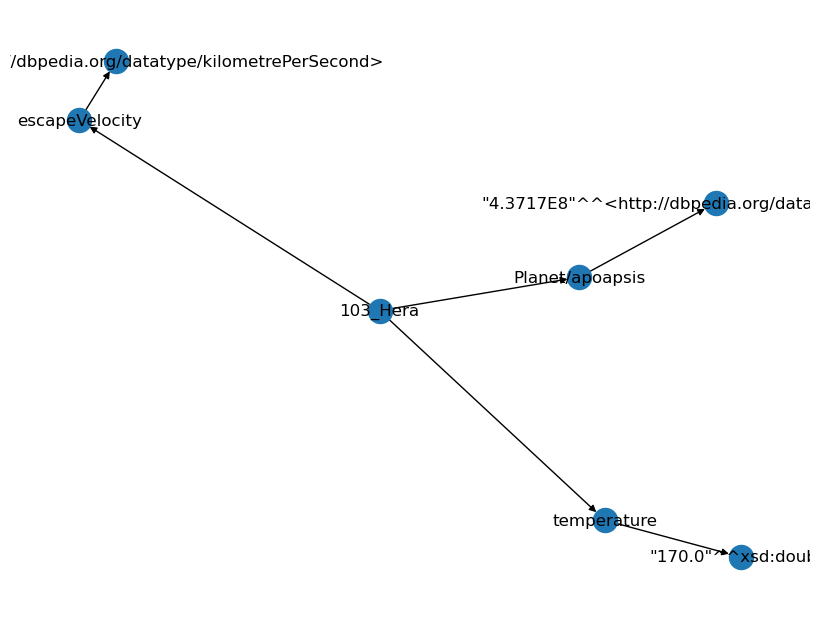

Decoded Input: 
 translate graph to text:  103_Hera  temperature  "170.0"xsd:double  103_Hera  escapeVelocity  "0.0482"http://dbpedia.org/datatype/kilometrePerSecond>  103_Hera  Planet/apoapsis  "4.3717E8"http://dbpedia.org/datatype/kilometre>
Decoded Target: 
 The celestial body known as 103 Hera has an escape velocity of 0.0482 k.p.s., temperature of 170.0 kelvins and an apoapsis of 437170000.0 kilometres.
DataBatch(x=[1, 512], edge_index=[2, 6], attention_mask=[1, 512], y=[1, 512], batch=[512], ptr=[2])
Original Sample: 
 translate graph to text: <H> 107_Camilla  <R>  discoverer  <T>  N._R._Pogson <H> N._R._Pogson  <R>  placeOfBirth  <T>  Nottingham <H> N._R._Pogson  <R>  nationality  <T>  England 
 107 Camilla was discovered by the British NR Pogson who was born in Nottingham.
NetworkX Graph: 
 [('107_Camilla', 'discoverer', 0), ('discoverer', 'N._R._Pogson', 0), ('N._R._Pogson', 'placeOfBirth', 0), ('N._R._Pogson', 'nationality', 0), ('placeOfBirth', 'Nottingham', 0), ('nationalit

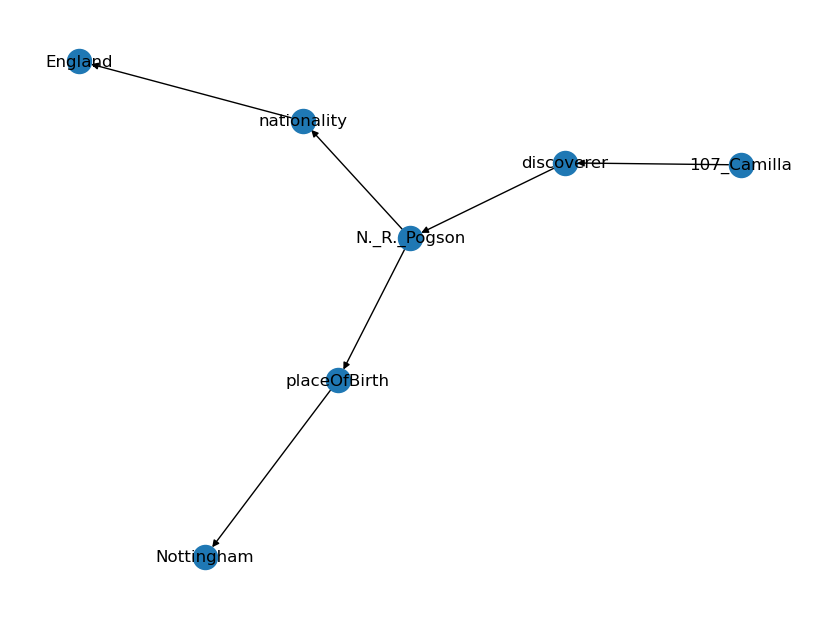

Decoded Input: 
 translate graph to text:  107_Camilla  discoverer  N._R._Pogson  N._R._Pogson  placeOfBirth  Nottingham  N._R._Pogson  nationality  England
Decoded Target: 
 107 Camilla was discovered by the British NR Pogson who was born in Nottingham.
DataBatch(x=[1, 512], edge_index=[2, 6], attention_mask=[1, 512], y=[1, 512], batch=[512], ptr=[2])
Original Sample: 
 translate graph to text: <H> 1089_Tama  <R>  epoch  <T>  "November 26, 2005 (JD2453700.5)" <H> 1089_Tama  <R>  formerName  <T>  "A894 VA; A904 VD;"@en <H> 1089_Tama  <R>  orbitalPeriod  <T>  1.03926e+08 
 Formerly named "A894 VA; A 904 VD", 1089 Tama has an orbital period of 1202.846 days, and it's epoch is 2005-11-26.
NetworkX Graph: 
 [('1089_Tama', 'epoch', 0), ('1089_Tama', 'formerName', 0), ('1089_Tama', 'orbitalPeriod', 0), ('epoch', '"November 26, 2005 "', 0), ('formerName', '"A894 VA; A904 VD;"@en', 0), ('orbitalPeriod', '1.03926e+08', 0)]


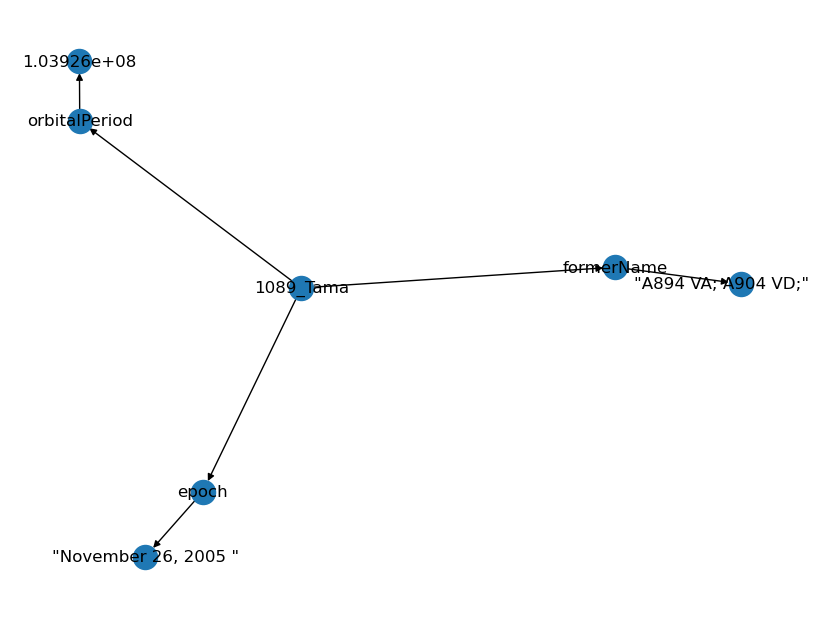

Decoded Input: 
 translate graph to text:  1089_Tama  epoch  "November 26, 2005 (JD2453700.5)"  1089_Tama  formerName  "A894 VA; A904 VD;"@en  1089_Tama  orbitalPeriod  1.03926e+08
Decoded Target: 
 Formerly named "A894 VA; A 904 VD", 1089 Tama has an orbital period of 1202.846 days, and it's epoch is 2005-11-26.
DataBatch(x=[1, 512], edge_index=[2, 6], attention_mask=[1, 512], y=[1, 512], batch=[512], ptr=[2])
Original Sample: 
 translate graph to text: <H> 1089_Tama  <R>  periapsis  <T>  2.88749e+11 <H> 1089_Tama  <R>  epoch  <T>  "2005-11-26"^^xsd:date <H> 1089_Tama  <R>  Planet/apoapsis  <T>  "3.73513E8"^^<http://dbpedia.org/datatype/kilometre> 
 The epoch date of 1089 Tama is 26 November 2005. It has a periapsis of 288749000000.0 and 373513000.0 km is the apoapsis.
NetworkX Graph: 
 [('1089_Tama', 'periapsis', 0), ('1089_Tama', 'epoch', 0), ('1089_Tama', 'Planet/apoapsis', 0), ('periapsis', '2.88749e+11', 0), ('epoch', '"2005-11-26"^^xsd:date', 0), ('Planet/apoapsis', '"3.73513E8"

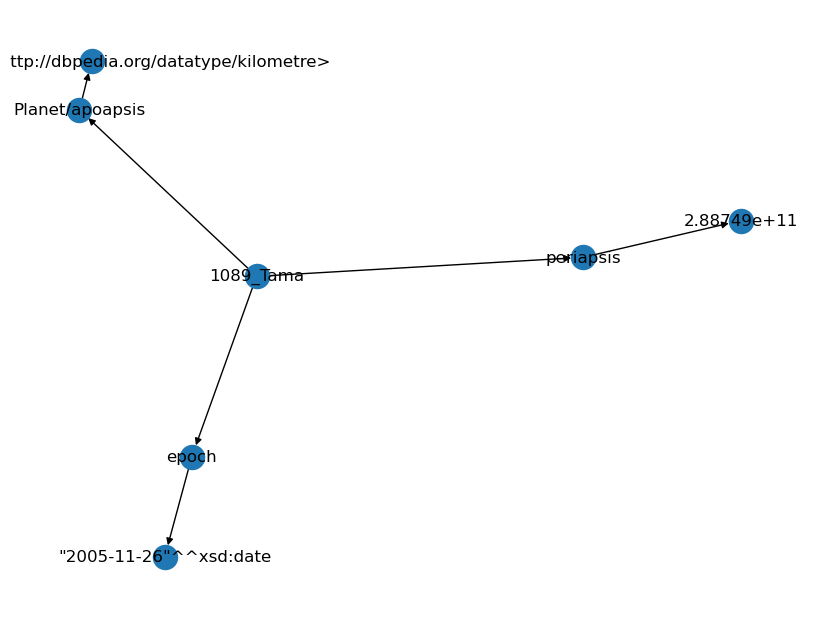

Decoded Input: 
 translate graph to text:  1089_Tama  periapsis  2.88749e+11  1089_Tama  epoch  "2005-11-26"xsd:date  1089_Tama  Planet/apoapsis  "3.73513E8"http://dbpedia.org/datatype/kilometre>
Decoded Target: 
 The epoch date of 1089 Tama is 26 November 2005. It has a periapsis of 288749000000.0 and 373513000.0 km is the apoapsis.
DataBatch(x=[1, 512], edge_index=[2, 6], attention_mask=[1, 512], y=[1, 512], batch=[512], ptr=[2])
Original Sample: 
 translate graph to text: <H> 1097_Vicia  <R>  epoch  <T>  "December 31, 2006 (JD2454100.5)" <H> 1097_Vicia  <R>  formerName  <T>  "1928 PC"@en <H> 1097_Vicia  <R>  periapsis  <T>  2.79142e+11 
 The epoch date of 1097 Vicia, which had 1928 PC as its former date, is 2006.12.31. Vicia has a periapsis measurement of 279142000000.
NetworkX Graph: 
 [('1097_Vicia', 'epoch', 0), ('1097_Vicia', 'formerName', 0), ('1097_Vicia', 'periapsis', 0), ('epoch', '"December 31, 2006 "', 0), ('formerName', '"1928 PC"@en', 0), ('periapsis', '2.79142e+11', 0)]

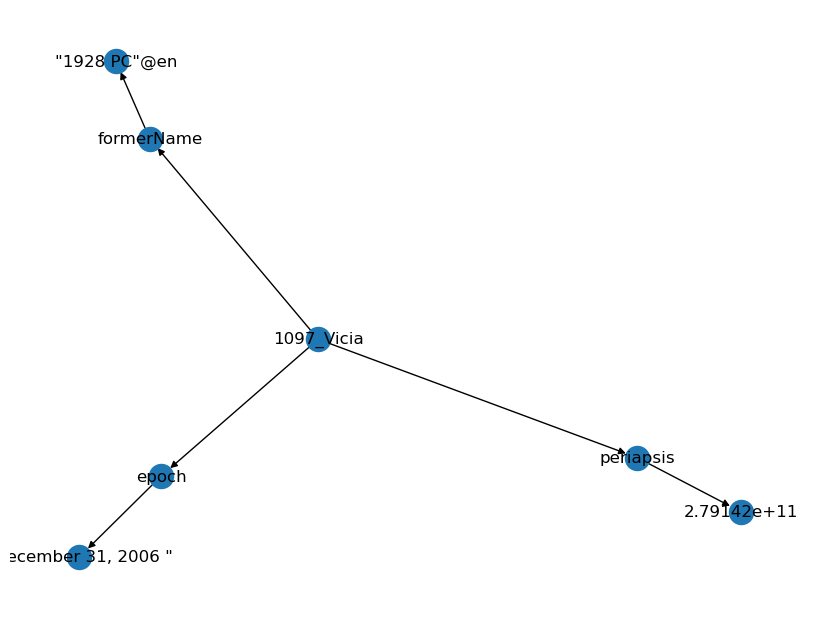

Decoded Input: 
 translate graph to text:  1097_Vicia  epoch  "December 31, 2006 (JD2454100.5)"  1097_Vicia  formerName  "1928 PC"@en  1097_Vicia  periapsis  2.79142e+11
Decoded Target: 
 The epoch date of 1097 Vicia, which had 1928 PC as its former date, is 2006.12.31. Vicia has a periapsis measurement of 279142000000.
DataBatch(x=[1, 512], edge_index=[2, 6], attention_mask=[1, 512], y=[1, 512], batch=[512], ptr=[2])
Original Sample: 
 translate graph to text: <H> 109_Felicitas  <R>  epoch  <T>  "December 31, 2006 (JD2454100.5)" <H> 109_Felicitas  <R>  mass  <T>  "7500.0"^^xsd:double <H> 109_Felicitas  <R>  orbitalPeriod  <T>  1.39705e+08 
 109 Felicitas has an epoch date of 31 December 2006, a mass of 7.5 kg and an orbital period of 139705000.0.
NetworkX Graph: 
 [('109_Felicitas', 'epoch', 0), ('109_Felicitas', 'mass', 0), ('109_Felicitas', 'orbitalPeriod', 0), ('epoch', '"December 31, 2006 "', 0), ('mass', '"7500.0"^^xsd:double', 0), ('orbitalPeriod', '1.39705e+08', 0)]


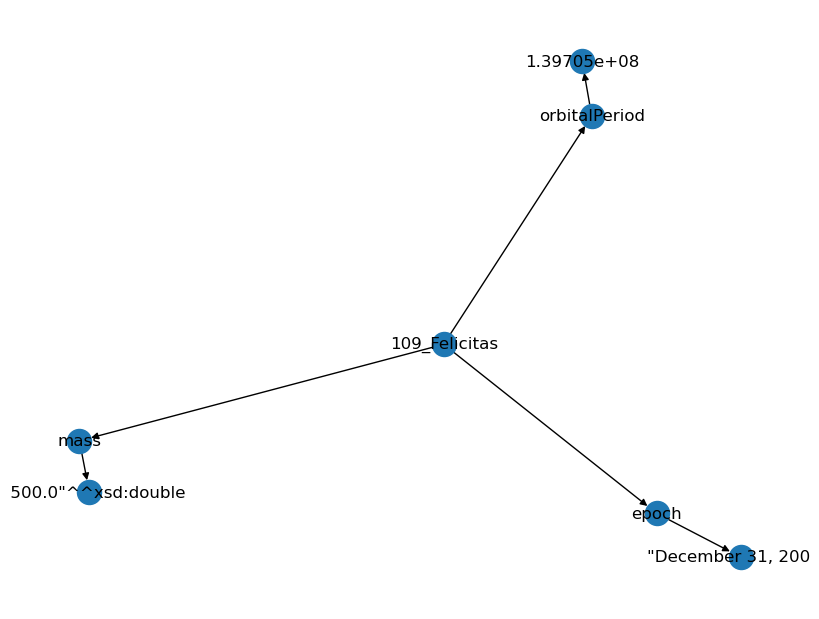

Decoded Input: 
 translate graph to text:  109_Felicitas  epoch  "December 31, 2006 (JD2454100.5)"  109_Felicitas  mass  "7500.0"xsd:double  109_Felicitas  orbitalPeriod  1.39705e+08
Decoded Target: 
 109 Felicitas has an epoch date of 31 December 2006, a mass of 7.5 kg and an orbital period of 139705000.0.
DataBatch(x=[1, 512], edge_index=[2, 6], attention_mask=[1, 512], y=[1, 512], batch=[512], ptr=[2])
Original Sample: 
 translate graph to text: <H> 109_Felicitas  <R>  epoch  <T>  "December 31, 2006 (JD2454100.5)" <H> 109_Felicitas  <R>  orbitalPeriod  <T>  1.39705e+08 <H> 109_Felicitas  <R>  Planet/apoapsis  <T>  "5.23329E8"^^<http://dbpedia.org/datatype/kilometre> 
 The epoch date of 109 Felicitas was 31 December 2006,has an orbital period of 139705000.0 and its apoapsis is 523329000.0 kilometres.
NetworkX Graph: 
 [('109_Felicitas', 'epoch', 0), ('109_Felicitas', 'orbitalPeriod', 0), ('109_Felicitas', 'Planet/apoapsis', 0), ('epoch', '"December 31, 2006 "', 0), ('orbitalPeriod', 

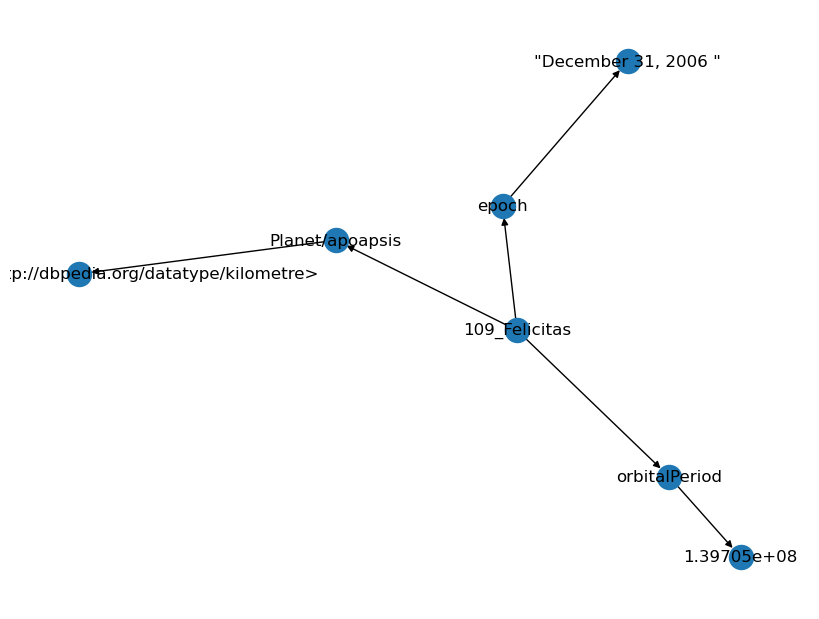

Decoded Input: 
 translate graph to text:  109_Felicitas  epoch  "December 31, 2006 (JD2454100.5)"  109_Felicitas  orbitalPeriod  1.39705e+08  109_Felicitas  Planet/apoapsis  "5.23329E8"http://dbpedia.org/datatype/kilometre>
Decoded Target: 
 The epoch date of 109 Felicitas was 31 December 2006,has an orbital period of 139705000.0 and its apoapsis is 523329000.0 kilometres.
DataBatch(x=[1, 512], edge_index=[2, 6], attention_mask=[1, 512], y=[1, 512], batch=[512], ptr=[2])
Original Sample: 
 translate graph to text: <H> 10_Hygiea  <R>  Planet/averageSpeed  <T>  "16.76"^^<http://dbpedia.org/datatype/kilometrePerSecond> <H> 10_Hygiea  <R>  Planet/orbitalPeriod  <T>  "5.57"^^<http://dbpedia.org/datatype/day> <H> 10_Hygiea  <R>  Planet/apoapsis  <T>  "5.2395158233968E8"^^<http://dbpedia.org/datatype/kilometre> 
 The 10 Hygiea has an apoapsis of 523951582.33968 km and an average speed of 16.76 km per second. 5.57 days is the orbital period for the asteroid.
NetworkX Graph: 
 [('10_Hygiea', '

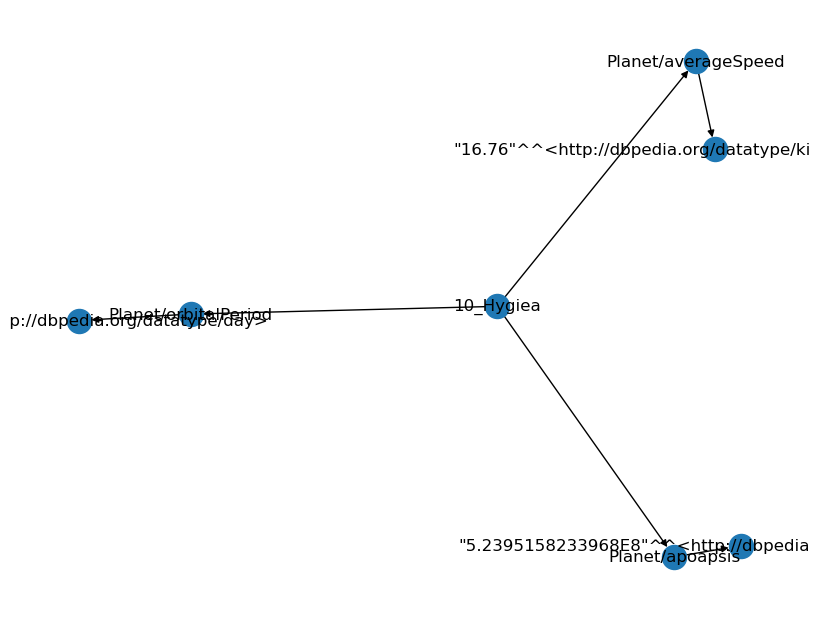

Decoded Input: 
 translate graph to text:  10_Hygiea  Planet/averageSpeed  "16.76"http://dbpedia.org/datatype/kilometrePerSecond>  10_Hygiea  Planet/orbitalPeriod  "5.57"http://dbpedia.org/datatype/day>  10_Hygiea  Planet/apoapsis  "5.2395158233968E8"http://dbpedia.org/datatype/kilometre>
Decoded Target: 
 The 10 Hygiea has an apoapsis of 523951582.33968 km and an average speed of 16.76 km per second. 5.57 days is the orbital period for the asteroid.
DataBatch(x=[1, 512], edge_index=[2, 6], attention_mask=[1, 512], y=[1, 512], batch=[512], ptr=[2])
Original Sample: 
 translate graph to text: <H> 10_Hygiea  <R>  averageSpeed  <T>  "60336.0"^^xsd:double <H> 10_Hygiea  <R>  Planet/surfaceArea  <T>  "837080.744"^^<http://dbpedia.org/datatype/squareKilometre> <H> 10_Hygiea  <R>  Planet/apoapsis  <T>  "5.2395158233968E8"^^<http://dbpedia.org/datatype/kilometre> 
 10 Hygiea has an apoapsis of 523951582.33968 km, a surface area of 837080.744 sq km and an average speed of 16.76 km per sec.
Netw

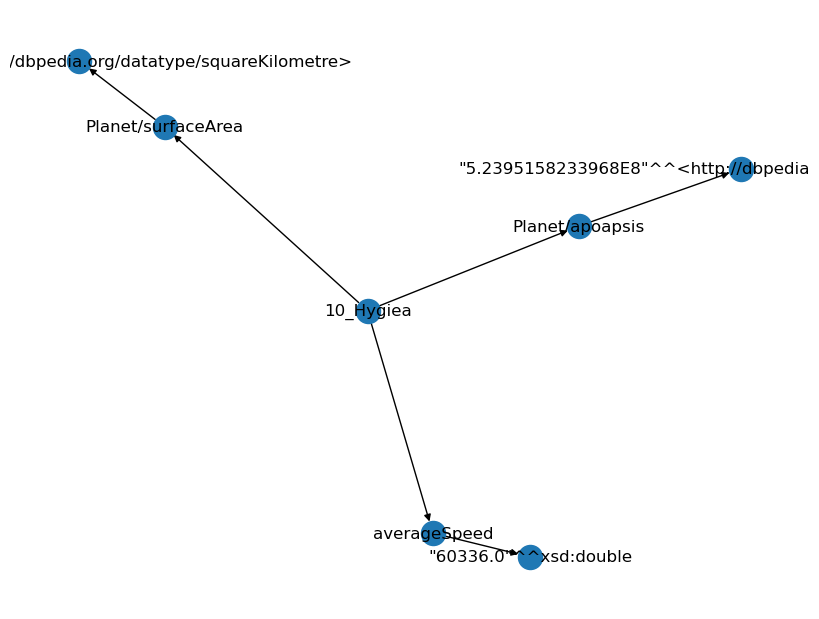

Decoded Input: 
 translate graph to text:  10_Hygiea  averageSpeed  "60336.0"xsd:double  10_Hygiea  Planet/surfaceArea  "837080.744"http://dbpedia.org/datatype/squareKilometre>  10_Hygiea  Planet/apoapsis  "5.2395158233968E8"http://dbpedia.org/datatype/kilometre>
Decoded Target: 
 10 Hygiea has an apoapsis of 523951582.33968 km, a surface area of 837080.744 sq km and an average speed of 16.76 km per sec.
DataBatch(x=[1, 512], edge_index=[2, 6], attention_mask=[1, 512], y=[1, 512], batch=[512], ptr=[2])
Original Sample: 
 translate graph to text: <H> 10_Hygiea  <R>  surfaceArea  <T>  8.37081e+11 <H> 10_Hygiea  <R>  temperature  <T>  "164.0"^^xsd:double <H> 10_Hygiea  <R>  Planet/apoapsis  <T>  "5.2395158233968E8"^^<http://dbpedia.org/datatype/kilometre> 
 10 Hygiea; has a surface area of 837080.744 square kilometres, an apoapsis of 523951582.33968 kilometres, and a temperature of 164.0 kelvins.
NetworkX Graph: 
 [('10_Hygiea', 'surfaceArea', 0), ('10_Hygiea', 'temperature', 0), ('10_Hyg

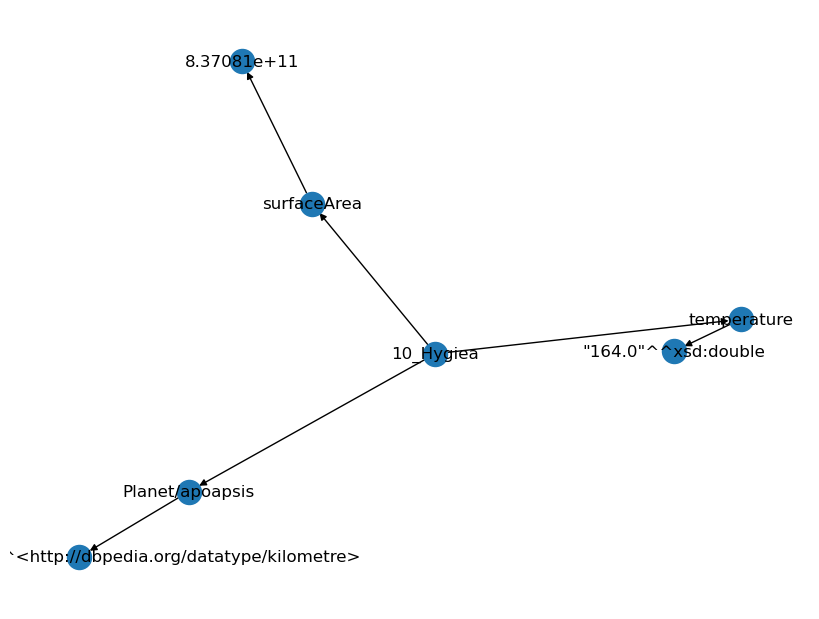

Decoded Input: 
 translate graph to text:  10_Hygiea  surfaceArea  8.37081e+11  10_Hygiea  temperature  "164.0"xsd:double  10_Hygiea  Planet/apoapsis  "5.2395158233968E8"http://dbpedia.org/datatype/kilometre>
Decoded Target: 
 10 Hygiea; has a surface area of 837080.744 square kilometres, an apoapsis of 523951582.33968 kilometres, and a temperature of 164.0 kelvins.
DataBatch(x=[1, 512], edge_index=[2, 6], attention_mask=[1, 512], y=[1, 512], batch=[512], ptr=[2])
Original Sample: 
 translate graph to text: <H> 110_Lydia  <R>  mass  <T>  "6700.0"^^xsd:double <H> 110_Lydia  <R>  periapsis  <T>  3.77016e+11 <H> 110_Lydia  <R>  epoch  <T>  "2006-12-31"^^xsd:date 
 110 Lydia's epoch is 31st December 2006, it has a mass of 6.7kg and a periapsis of 377016000000.0.
NetworkX Graph: 
 [('110_Lydia', 'mass', 0), ('110_Lydia', 'periapsis', 0), ('110_Lydia', 'epoch', 0), ('mass', '"6700.0"^^xsd:double', 0), ('periapsis', '3.77016e+11', 0), ('epoch', '"2006-12-31"^^xsd:date', 0)]


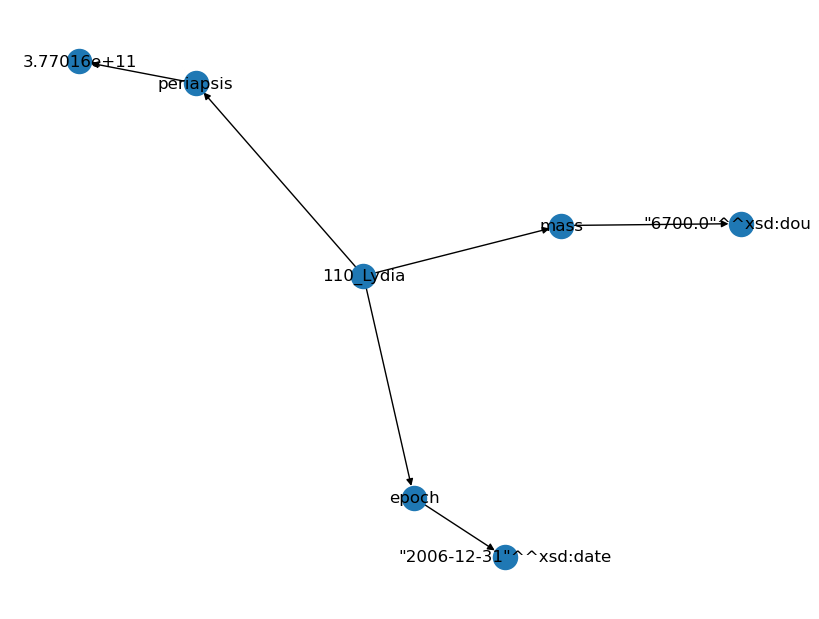

Decoded Input: 
 translate graph to text:  110_Lydia  mass  "6700.0"xsd:double  110_Lydia  periapsis  3.77016e+11  110_Lydia  epoch  "2006-12-31"xsd:date
Decoded Target: 
 110 Lydia's epoch is 31st December 2006, it has a mass of 6.7kg and a periapsis of 377016000000.0.
DataBatch(x=[1, 512], edge_index=[2, 6], attention_mask=[1, 512], y=[1, 512], batch=[512], ptr=[2])
Original Sample: 
 translate graph to text: <H> 110_Lydia  <R>  periapsis  <T>  3.77016e+11 <H> 110_Lydia  <R>  epoch  <T>  "2006-12-31"^^xsd:date <H> 110_Lydia  <R>  Planet/apoapsis  <T>  "4.40756E8"^^<http://dbpedia.org/datatype/kilometre> 
 110 Lydia; has an apoapsis of 440756000.0 kilometres, a periapsis of 377016000000.0, and its epoch is 31st December 2006.
NetworkX Graph: 
 [('110_Lydia', 'periapsis', 0), ('110_Lydia', 'epoch', 0), ('110_Lydia', 'Planet/apoapsis', 0), ('periapsis', '3.77016e+11', 0), ('epoch', '"2006-12-31"^^xsd:date', 0), ('Planet/apoapsis', '"4.40756E8"^^<http://dbpedia.org/datatype/kilometre>', 

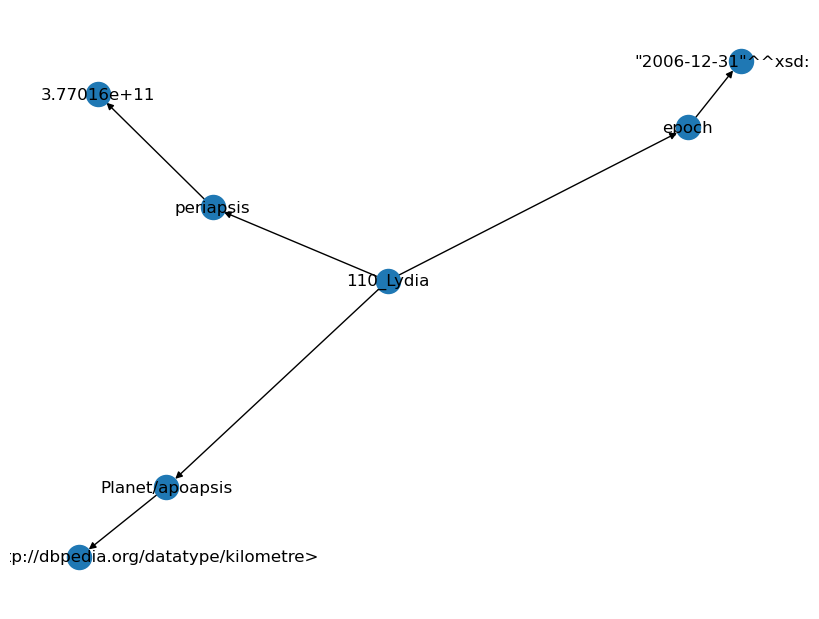

Decoded Input: 
 translate graph to text:  110_Lydia  periapsis  3.77016e+11  110_Lydia  epoch  "2006-12-31"xsd:date  110_Lydia  Planet/apoapsis  "4.40756E8"http://dbpedia.org/datatype/kilometre>
Decoded Target: 
 110 Lydia; has an apoapsis of 440756000.0 kilometres, a periapsis of 377016000000.0, and its epoch is 31st December 2006.
DataBatch(x=[1, 512], edge_index=[2, 6], attention_mask=[1, 512], y=[1, 512], batch=[512], ptr=[2])
Original Sample: 
 translate graph to text: <H> Aaron_Bertram  <R>  associatedMusicalArtist  <T>  Kids_Imagine_Nation <H> Aaron_Bertram  <R>  associatedBand  <T>  Suburban_Legends <H> Suburban_Legends  <R>  genre  <T>  Pop_music 
 An artist with the band Kids Imagine Nation, Aaron Bertram plays for the Suburban Legends band which plays pop music.
NetworkX Graph: 
 [('Aaron_Bertram', 'associatedMusicalArtist', 0), ('Aaron_Bertram', 'associatedBand', 0), ('associatedMusicalArtist', 'Kids_Imagine_Nation', 0), ('associatedBand', 'Suburban_Legends', 0), ('Suburba

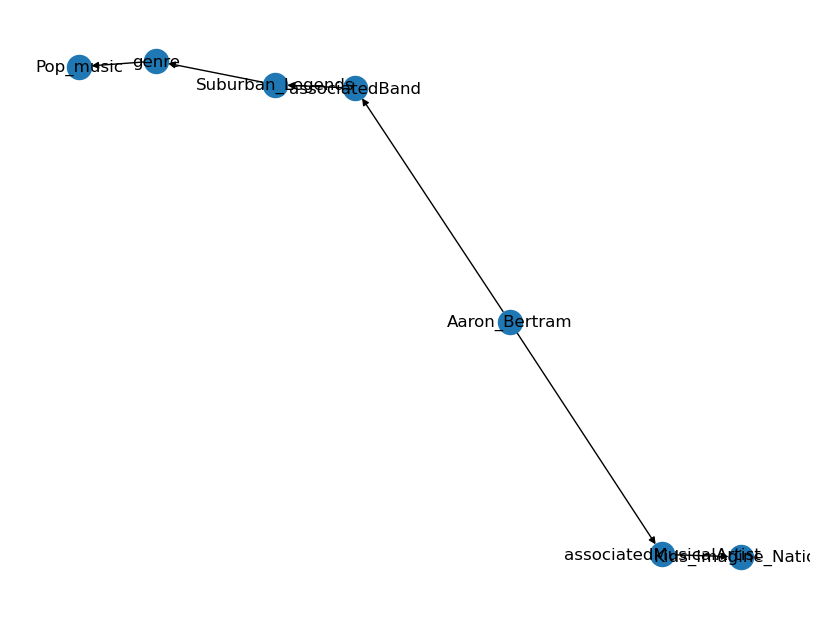

Decoded Input: 
 translate graph to text:  Aaron_Bertram  associatedMusicalArtist  Kids_Imagine_Nation  Aaron_Bertram  associatedBand  Suburban_Legends  Suburban_Legends  genre  Pop_music
Decoded Target: 
 An artist with the band Kids Imagine Nation, Aaron Bertram plays for the Suburban Legends band which plays pop music.
DataBatch(x=[1, 512], edge_index=[2, 6], attention_mask=[1, 512], y=[1, 512], batch=[512], ptr=[2])
Original Sample: 
 translate graph to text: <H> Aaron_Deer  <R>  genre  <T>  Indie_rock <H> Aaron_Deer  <R>  hometown  <T>  United_States <H> Aaron_Deer  <R>  origin  <T>  Indiana 
 Aaron Deer was born in Indiana,United States and his musical genre is indie rock.
NetworkX Graph: 
 [('Aaron_Deer', 'genre', 0), ('Aaron_Deer', 'hometown', 0), ('Aaron_Deer', 'origin', 0), ('genre', 'Indie_rock', 0), ('hometown', 'United_States', 0), ('origin', 'Indiana', 0)]


KeyboardInterrupt: 

In [ ]:
# Get one batch of data
for batch in dataloader:
    print(batch)
    input_ids, attention_mask, y = batch.x, batch.attention_mask, batch.y
    edge_index = batch.edge_index
      # We only want one batch for this example

# Decode the input and target for each sample in the batch
for i in range(input_ids.size(0)):
    print(f"Sample {i+1}:")
    print("Input:", tokenizer.decode(input_ids[i], skip_special_tokens=True))
    print("Target:", tokenizer.decode(y[i], skip_special_tokens=True))
    print("Edge index: ", edge_index)
    print()


In [ ]:
def test_dataloader_shapes():
    # Test batch sizes
    batch_sizes = [1, 2, 4]

    for batch_size in batch_sizes:
        dataloader = DataLoader(dataset, batch_size=batch_size, collate_fn=collate_fn)

        for batch in dataloader:
            # Get the batch data
            x, edge_index, attention_mask, y = batch.x, batch.edge_index, batch.attention_mask, batch.y

            # Check shapes
            assert x.shape == torch.Size([batch_size, 512]), f"Unexpected shape for input_ids, got {x.shape}"
            assert attention_mask.shape == torch.Size([batch_size, 512]), f"Unexpected shape for attention_mask, got {attention_mask.shape}"
            assert y.shape == torch.Size([batch_size, 512]), f"Unexpected shape for output_ids, got {y.shape}"
            assert edge_index.shape[1] <= batch_size * 512, f"Unexpected number of edges, got {edge_index.shape[1]}"

            # Stop after the first batch
            break

# Run the test
test_dataloader_shapes()


----

In [ ]:
class AdapterBlock(nn.Module):
    def __init__(self, input_dim, hidden_dim):
        super(AdapterBlock, self).__init__()
        self.layer_norm = nn.LayerNorm(input_dim, eps=1e-6)
        self.gcn = GCNConv(input_dim, hidden_dim)
        self.relu = nn.ReLU()
        self.fc = nn.Linear(hidden_dim, input_dim)  # Restore dimension to input_dim
        self.res_fc = nn.Linear(input_dim, input_dim)  # Transform the residual

    def forward(self, x, edge_index):
        x_res = self.res_fc(x)  # Transform the residual tensor
        x = self.layer_norm(x)
        x = self.gcn(x, edge_index)
        x = self.relu(x)
        x = self.fc(x)
        return x + x_res  # Now you can add the tensors

In [ ]:
from transformers.models.t5.modeling_t5 import T5Stack
from transformers import T5Model, T5Config, T5TokenizerFast
from torch.nn import ModuleList

class CustomT5Encoder(T5Stack):
    def __init__(self, config, embed_tokens=None):
        super().__init__(config, embed_tokens)
        self.adapter_blocks = nn.ModuleList([AdapterBlock(config.d_model, config.d_model) for _ in range(config.num_layers)])

    def forward(
        self,
        input_ids=None,
        attention_mask=None,
        encoder_hidden_states=None,
        encoder_attention_mask=None,
        head_mask=None,
        cross_attn_head_mask=None,
        past_key_values=None,
        inputs_embeds=None,
        use_cache=None,
        output_attentions=None,
        output_hidden_states=None,
        return_dict=None,
        edge_index=None,
    ):
        # Convert the list of graph data to a Batch object
        batch = Batch.from_data_list(edge_index)

        # Manually iterate over all layers
        for i, (layer_module, adapter_block) in enumerate(zip(self.block, self.adapter_blocks)):
            if output_hidden_states:
                all_hidden_states = all_hidden_states + (hidden_states,)

            layer_outputs_list = []
            hidden_states_list = []

            # Split the batch back into individual graphs
            graphs = Batch.to_data_list(batch)

            # Process each graph individually
            for graph in graphs:
                layer_outputs = layer_module(
                    hidden_states,
                    attention_mask,
                    layer_head_mask,
                    encoder_hidden_states,
                    encoder_attention_mask,
                    cross_attn_head_mask,
                    past_key_values=past_key_values,
                    use_cache=use_cache,
                    output_attentions=output_attentions,
                )
                layer_outputs_list.append(layer_outputs)
                # Apply adapter block after each layer
                hidden_states = adapter_block(layer_outputs[0], graph.edge_index)
                hidden_states_list.append(hidden_states)

            # Re-combine the processed graphs into a batch
            hidden_states = Batch.from_data_list(hidden_states_list)
            layer_outputs = Batch.from_data_list(layer_outputs_list)

        return hidden_states  # Now hidden_states have gone through all encoder layers and corresponding adapter blocks


In [ ]:
from transformers import T5Model

class CustomT5Model(T5Model):
    def __init__(self, config):
        super().__init__(config)
        self.encoder = CustomT5Encoder(config)

# Now you can use CustomT5Model just like a regular T5Model
model = CustomT5Model.from_pretrained("google/flan-t5-small")


Some weights of the model checkpoint at google/flan-t5-small were not used when initializing CustomT5Model: ['encoder.embed_tokens.weight', 'lm_head.weight']
- This IS expected if you are initializing CustomT5Model from the checkpoint of a model trained on another task or with another architecture (e.g. initializing a BertForSequenceClassification model from a BertForPreTraining model).
- This IS NOT expected if you are initializing CustomT5Model from the checkpoint of a model that you expect to be exactly identical (initializing a BertForSequenceClassification model from a BertForSequenceClassification model).
Some weights of CustomT5Model were not initialized from the model checkpoint at google/flan-t5-small and are newly initialized: ['encoder.adapter_blocks.4.fc.weight', 'encoder.adapter_blocks.0.res_fc.weight', 'encoder.adapter_blocks.1.gcn.bias', 'encoder.adapter_blocks.0.gcn.lin.weight', 'encoder.adapter_blocks.0.gcn.bias', 'encoder.adapter_blocks.0.layer_norm.bias', 'encoder.ad

In [ ]:
class CustomT5ForConditionalGeneration(T5ForConditionalGeneration):
    def __init__(self, config):
        super().__init__(config)
        self.encoder = CustomT5Encoder(config)

    def forward(
        self,
        input_ids=None,
        attention_mask=None,
        decoder_input_ids=None,
        decoder_attention_mask=None,
        head_mask=None,
        decoder_head_mask=None,
        encoder_outputs=None,
        past_key_values=None,
        inputs_embeds=None,
        decoder_inputs_embeds=None,
        labels=None,
        use_cache=None,
        output_attentions=None,
        output_hidden_states=None,
        return_dict=None,
        edge_index=None,
    ):
        if encoder_outputs is None:
            # Convert the list of graph data to a Batch object
            batch = Batch.from_data_list(edge_index)
            # Split the batch back into individual graphs
            graphs = Batch.to_data_list(batch)
            encoder_outputs = self.encoder(
                input_ids=input_ids,
                attention_mask=attention_mask,
                head_mask=head_mask,
                inputs_embeds=inputs_embeds,
                output_attentions=output_attentions,
                output_hidden_states=output_hidden_states,
                return_dict=return_dict,
                edge_index=graphs,
            )

        # Decoder part is unchanged
        decoder_outputs = self.decoder(
            input_ids=decoder_input_ids,
            attention_mask=decoder_attention_mask,
            head_mask=decoder_head_mask,
            encoder_hidden_states=encoder_outputs[0],
            encoder_attention_mask=attention_mask,
            inputs_embeds=decoder_inputs_embeds,
            past_key_values=past_key_values,
            use_cache=use_cache,
            output_attentions=output_attentions,
            output_hidden_states=output_hidden_states,
            return_dict=return_dict,
        )

        sequence_output = decoder_outputs[0]
        logits = self.lm_head(sequence_output)

        loss = None
        if labels is not None:
            loss_fct = nn.CrossEntropyLoss()
            loss = loss_fct(logits.view(-1, self.config.vocab_size), labels.view(-1))

        if not return_dict:
            output = (logits,) + decoder_outputs[1:]
            return ((loss,) + output) if loss is not None else output

        return seq2seq_models.Seq2SeqLMOutput(
            loss=loss,
            logits=logits,
            past_key_values=decoder_outputs.past_key_values,
            decoder_hidden_states=decoder_outputs.hidden_states,
            decoder_attentions=decoder_outputs.attentions,
            cross_attentions=decoder_outputs.cross_attentions,
            encoder_last_hidden_state=encoder_outputs.last_hidden_state,
            encoder_hidden_states=encoder_outputs.hidden_states,
            encoder_attentions=encoder_outputs.attentions,
        )


In [ ]:
# Now you can use CustomT5Model just like a regular T5Model
model = CustomT5ForConditionalGeneration.from_pretrained("google/flan-t5-small")

Some weights of the model checkpoint at google/flan-t5-small were not used when initializing CustomT5ForConditionalGeneration: ['encoder.embed_tokens.weight']
- This IS expected if you are initializing CustomT5ForConditionalGeneration from the checkpoint of a model trained on another task or with another architecture (e.g. initializing a BertForSequenceClassification model from a BertForPreTraining model).
- This IS NOT expected if you are initializing CustomT5ForConditionalGeneration from the checkpoint of a model that you expect to be exactly identical (initializing a BertForSequenceClassification model from a BertForSequenceClassification model).
Some weights of CustomT5ForConditionalGeneration were not initialized from the model checkpoint at google/flan-t5-small and are newly initialized: ['encoder.adapter_blocks.4.fc.weight', 'encoder.adapter_blocks.0.res_fc.weight', 'encoder.adapter_blocks.1.gcn.bias', 'encoder.adapter_blocks.0.gcn.lin.weight', 'encoder.adapter_blocks.0.gcn.bias

In [ ]:
def test(model, dataloader, device):
    model = model.to(device)
    model.eval()

    with torch.no_grad():
        for i, data in enumerate(dataloader):
            data = data.to(device)
            edge_index = data.edge_index.to(device)

            outputs = model(input_ids=data.x, attention_mask=data.attention_mask, edge_index=edge_index, decoder_input_ids=data.y, labels=data.y)

            print("Batch: ", i)
            print("Loss: ", outputs.loss.item())

            # Convert the first few predictions to text and print them
            predicted_ids = torch.argmax(outputs.logits, dim=-1)
            for i in range(min(5, predicted_ids.shape[0])):
                predicted_text = tokenizer.decode(predicted_ids[i], skip_special_tokens=True)
                print(f"Predicted text: {predicted_text}")

            # Uncomment the following lines if you want to stop testing after the first batch
            if i >= 0:
                 break


In [ ]:
def test(model, dataloader, device):
    model = model.to(device)
    model.eval()

    with torch.no_grad():
        for i, data in enumerate(dataloader):
            data = data.to(device)

            # Check the type of edge_index
            print(f"Type of edge_index: {type(data.edge_index)}")

            if isinstance(data.edge_index, list):
                print(f"Length of edge_index list: {len(data.edge_index)}")
                for j, item in enumerate(data.edge_index):
                    print(f"Type of edge_index[{j}]: {type(item)}")
            else:
                print("edge_index is not a list.")

            edge_index = data.edge_index.to(device)

            try:
                outputs = model(input_ids=data.x, attention_mask=data.attention_mask, edge_index=edge_index, decoder_input_ids=data.y, labels=data.y)
            except Exception as e:
                print(f"Exception during model call: {e}")
                return

            print("Batch: ", i)
            print("Loss: ", outputs.loss.item())

            # Convert the first few predictions to text and print them
            predicted_ids = torch.argmax(outputs.logits, dim=-1)
            for i in range(min(5, predicted_ids.shape[0])):
                predicted_text = tokenizer.decode(predicted_ids[i], skip_special_tokens=True)
                print(f"Predicted text: {predicted_text}")

            # Uncomment the following lines if you want to stop testing after the first batch
            if i >= 0:
                 break


In [ ]:
dataset_dict = load_dataset('web_nlg', 'webnlg_challenge_2017')['test']
dataset_dict = [sample for sample in dataset_dict if sample['lex']['text']] # filter out samples with empty targets
dataset = WebNLGDataset(dataset_dict)
# Use the collate_fn in the DataLoader
dataloader = DataLoader(dataset, batch_size=4, collate_fn=collate_fn)
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
model = CustomT5ForConditionalGeneration.from_pretrained("google/flan-t5-small")
test(model, dataloader, device)


  0%|          | 0/3 [00:00<?, ?it/s]

Some weights of the model checkpoint at google/flan-t5-small were not used when initializing CustomT5ForConditionalGeneration: ['encoder.embed_tokens.weight']
- This IS expected if you are initializing CustomT5ForConditionalGeneration from the checkpoint of a model trained on another task or with another architecture (e.g. initializing a BertForSequenceClassification model from a BertForPreTraining model).
- This IS NOT expected if you are initializing CustomT5ForConditionalGeneration from the checkpoint of a model that you expect to be exactly identical (initializing a BertForSequenceClassification model from a BertForSequenceClassification model).
Some weights of CustomT5ForConditionalGeneration were not initialized from the model checkpoint at google/flan-t5-small and are newly initialized: ['encoder.adapter_blocks.4.fc.weight', 'encoder.adapter_blocks.0.res_fc.weight', 'encoder.adapter_blocks.1.gcn.bias', 'encoder.adapter_blocks.0.gcn.lin.weight', 'encoder.adapter_blocks.0.gcn.bias

Type of edge_index: <class 'torch.Tensor'>
edge_index is not a list.
Exception during model call: 'TensorBatch' object has no attribute 'stores_as'


--------

In [ ]:
import torch
from torch_geometric.data import Data, Batch, DataLoader
import torch.nn as nn
import torch.nn.functional as F
import copy
from transformers import T5LayerSelfAttention, T5LayerCrossAttention, T5LayerFF, T5DenseReluDense, T5LayerNorm


def get_pytorch_graph_(embeddings, graphs):

    # print('embeddings.size()', embeddings.size())
    # print('len graphs', len(graphs))
    # exit()

    list_geometric_data = []

    # for each b in batch
    for idx, emb in enumerate(embeddings):
        #print(idx)
        edges_index = graphs[idx][0]
        edges_types = graphs[idx][1]
        #print(edges_index)

        data = Data(x=emb, edge_index=edges_index, y=edges_types)
        list_geometric_data.append(data)

    #print('len list', len(list_geometric_data))
    bdl = Batch.from_data_list(list_geometric_data)

    bdl = bdl.to('cuda:' + str(torch.cuda.current_device()))

    return bdl


def get_pytorch_graph(embeddings, graphs):

    # print('embeddings.size()', embeddings.size())
    # print('len graphs', len(graphs))
    # exit()

    list_geometric_data = [Data(x=emb, edge_index=graphs[idx][0], y=graphs[idx][1]) for idx, emb in enumerate(embeddings)]

    #print('len list', len(list_geometric_data))
    bdl = Batch.from_data_list(list_geometric_data)
    bdl = bdl.to('cuda:' + str(torch.cuda.current_device()))

    return bdl

ImportError: cannot import name 'T5LayerSelfAttention' from 'transformers' (/opt/conda/lib/python3.10/site-packages/transformers/__init__.py)

In [ ]:
class T5LayerAdapt(nn.Module):
    def __init__(self, config):
        super().__init__()
        self.DenseReluDense = T5DenseReluDense(config)
        self.layer_norm = T5LayerNorm(config.d_model, eps=config.layer_norm_epsilon)
        self.dropout = nn.Dropout(config.dropout_rate)

    def forward(self, hidden_states):
        norm_x = self.layer_norm(hidden_states)
        y = self.DenseReluDense(norm_x)
        layer_output = hidden_states + self.dropout(y)
        return layer_output

from .rgcn_custom import RGCNConv
from torch_geometric.nn import GCNConv, FastRGCNConv

class T5GNNAdapt(nn.Module):
    def __init__(self, config):
        super().__init__()
        self.conv = RGCNConv(config.d_model, config.d_ff, num_relations=2, root_weight=True)
        self.wo = nn.Linear(config.d_ff, config.d_model, bias=False)

        self.layer_norm = T5LayerNorm(config.d_model, eps=config.layer_norm_epsilon)
        self.dropout = nn.Dropout(config.dropout_rate)
        self.dropout_gnn = nn.Dropout(config.dropout_rate)

    def forward(self, hidden_states, graphs):
        norm_x = self.layer_norm(hidden_states)
        graph_batch = get_pytorch_graph(norm_x, graphs)

        y = F.elu(self.conv(graph_batch.x, graph_batch.edge_index, edge_type=graph_batch.y))

        y = self.dropout_gnn(y)
        y = self.wo(y)
        y = y.view_as(hidden_states)

        layer_output = hidden_states + self.dropout(y)
        return layer_output

In [ ]:
class T5Block(nn.Module):
    def __init__(self, config, has_relative_attention_bias=False):
        super().__init__()
        self.is_decoder = config.is_decoder
        self.layer = nn.ModuleList()
        self.layer.append(T5LayerSelfAttention(config, has_relative_attention_bias=has_relative_attention_bias))
        if self.is_decoder:
            self.layer.append(T5LayerCrossAttention(config, has_relative_attention_bias=has_relative_attention_bias))

        self.layer.append(T5LayerFF(config))

        if not self.is_decoder:
            adapter_config = copy.deepcopy(config)
            adapter_config.d_ff = config.adapter_dim
            self.adapter = T5GNNAdapt(adapter_config)
        else:
            adapter_config = copy.deepcopy(config)
            adapter_config.d_ff = config.adapter_dim
            self.adapter = T5LayerAdapt(adapter_config)


    def forward(
        self,
        hidden_states,
        attention_mask=None,
        position_bias=None,
        encoder_hidden_states=None,
        encoder_attention_mask=None,
        encoder_decoder_position_bias=None,
        head_mask=None,
        past_key_value=None,
        use_cache=False,
        output_attentions=False,
            graphs=None,
    ):

        if past_key_value is not None:
            assert self.is_decoder, "Only decoder can use `past_key_values`"
            expected_num_past_key_values = 2 if encoder_hidden_states is None else 4

            error_message = "There should be {} past states. 2 (past / key) for self attention.{} Got {} past key / value states".format(
                expected_num_past_key_values,
                "2 (past / key) for cross attention" if expected_num_past_key_values == 4 else "",
                len(past_key_value),
            )
            assert len(past_key_value) == expected_num_past_key_values, error_message

            self_attn_past_key_value = past_key_value[:2]
            cross_attn_past_key_value = past_key_value[2:]
        else:
            self_attn_past_key_value, cross_attn_past_key_value = None, None

        self_attention_outputs = self.layer[0](
            hidden_states,
            attention_mask=attention_mask,
            position_bias=position_bias,
            head_mask=head_mask,
            past_key_value=self_attn_past_key_value,
            use_cache=use_cache,
            output_attentions=output_attentions,
        )
        hidden_states, present_key_value_state = self_attention_outputs[:2]
        attention_outputs = self_attention_outputs[2:]  # Keep self-attention outputs and relative position weights

        if self.is_decoder and encoder_hidden_states is not None:
            # the actual query length is unknown for cross attention
            # if using past key value states. Need to inject it here
            if present_key_value_state is not None:
                query_length = present_key_value_state[0].shape[2]
            else:
                query_length = None

            cross_attention_outputs = self.layer[1](
                hidden_states,
                kv=encoder_hidden_states,
                attention_mask=encoder_attention_mask,
                position_bias=encoder_decoder_position_bias,
                head_mask=head_mask,
                past_key_value=cross_attn_past_key_value,
                query_length=query_length,
                use_cache=use_cache,
                output_attentions=output_attentions,
            )
            hidden_states = cross_attention_outputs[0]
            # Combine self attn and cross attn key value states
            if present_key_value_state is not None:
                present_key_value_state = present_key_value_state + cross_attention_outputs[1]

            # Keep cross-attention outputs and relative position weights
            attention_outputs = attention_outputs + cross_attention_outputs[2:]


        # Apply Feed Forward layer
        hidden_states = self.layer[-1](hidden_states)

        ####
        # ADD Adapter
        if not self.is_decoder:
            hidden_states = self.adapter(hidden_states, graphs)
        else:
            hidden_states = self.adapter(hidden_states)
        ####

        outputs = (hidden_states,)

        # Add attentions if we output them
        outputs = outputs + (present_key_value_state,) + attention_outputs
        return outputs  # hidden-states, present_key_value_states, (self-attention weights), (self-attention position bias), (cross-attention weights), (cross-attention position bias)
